In [1]:
# Dec 2 2020
# Big Data Project 
# Trying to make decision trees happen 
# But this time with a better data structure 

In [28]:
import csv 
import numpy as np
from collections import defaultdict
import random
import networkx as nx
from matplotlib import pyplot as plt

References: 

https://networkx.org/documentation/stable/tutorial.html

https://towardsdatascience.com/accuracy-precision-recall-or-f1-331fb37c5cb9

# Data processing

In [3]:
filename = "cps3_reshape.csv"

data = [] 
  
# opening the CSV file 
with open(filename, mode ='r') as file:     
         
       # reading the CSV file 
       csvFile = csv.reader(file) 
  
       # displaying the contents of the CSV file 
       for line in csvFile: 
            data.append(line)

In [4]:
# add BIRTH variable to data
# 0 if NCHILD doesn't increase
# 1 if NCHILD does increase 
# 9 if NCHILD not in universe 

data[0][45]=('BIRTH')
for i in range(len(data[1:])):
    person = data[i+1]
    if float(person[41])>float(person[21]):
            person.append('1') #birth
            #print(len(person))
    elif float(person[41])==float(person[21]):
            person.append('0') #no birth
    else:
            person.append('9') #error

In [5]:
# remove minors from data
# originally there were 47000 rows 
# after this there are 36770

def remove_minors(data):
    data2 = []
    data2.append(data[0])
    for row in data[1:]:
        if int(row[15])>17:
            data2.append(row)
    return data2

# Make reference variables

In [6]:
# make dict with {variable name : index of variable} 
# for general utility 
def make_varInd(data):
    varInd = defaultdict(int)
    for i in range(len(data[0])):
        varInd[data[0][i]] = i
    return varInd

In [7]:
# get initial list of data indices [1, 2, 3, ... ] from data matrix
# (it takes care of row 0)
def make_dataInd(data):
    dataInd = []
    for i in range(1, len(data)):
        dataInd.append(i)
    return dataInd

In [8]:
varInd = make_varInd(data)
dataInd = make_dataInd(data)

In [9]:
# make a dict with {variable name : variable buckets}
def make_varLevels(data):

    varLevels = defaultdict(list) 

    varLevels['YEAR'] = [['2018'], ['2019']]
    #varLevels['MONTH'] = []
    varLevels['REGION'] = [] #['11', '12', '21', '22', '31', '32', '33', '41', '42']
    varLevels['STATEFIP'] = []
    varLevels['METRO'] = [] #['0', '1', '2', '3', '4']
    varLevels['FAMINC'] = [] #['100', '210', '300', '430', '470', '500', '600', '710', '720', '730', '740', '820', '830', '841', '842', '843', '999']
    varLevels['SEX'] = [] #[['1'], ['2']]
    varLevels['EMPSTAT'] = [['1', '10', '12'], ['21', '22'], ['0', '32', '34', '36']]
    varLevels['RELATE'] = [] 
    varLevels['AGE'] = [
    ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17'],
    ['18','19','20','21','22','23','24','25','26','27','28','29'],
    ['30','31','32','33','34','35','36','37','38','39'],
    ['40','41','42','43','44','45','46','47','48','49'],
    ['50','51','52','53','54','55','56','57','58','59'],
    ['60','61','62','63','64','65','66','67','68','69'],
    ['70','71','72','73','74','75','76','77','78','79'],
    ['80'],
    ['85']
    ]
    varLevels['RACE'] = []
    varLevels['MARST'] = [['1', '2', '3'], ['4', '5', '7'], ['6'], ['9']]
    varLevels['NCHILD'] = []#[['0'], ['7'], ['4'], ['9'], ['1'], ['3'], ['8'], ['6'], ['2'], ['5']]
    varLevels['POPSTAT'] = []
    varLevels['VETSTAT'] = []
    varLevels['YRIMMIG'] = []
    varLevels['WHYUNEMP'] = []
    varLevels['WKSTAT'] = [] # basically tells employment 
    varLevels['PROFCERT'] = []
    varLevels['EDUC'] = []#[['10'], ['20'], ['30'], ['40', '50', '60', '71'], ['73'], ['81'], ['91', '92'], ['111'], ['124'], ['125'], ['0', '1', '2', '999']]
    varLevels['SCHLCOLL'] = [] 
    varLevels['CITIZEN'] = []
    varLevels['HISPAN'] = [['0'], ['100', '500', '400', '300', '600', '612', '200', '611']]
    #varLevels['OCC'] = []
    #varLevels['IND'] = []
    varLevels['BIRTH'] = []
    
    # this is the variable that leaves that dont' keep splitting, split on
    varLevels['DONE'] = [[]] 
    
    
    for key in varLevels.keys(): 
        # fill in empty varLevels 
        if key != 'DONE' and varLevels[key]==[]:
            # loop through data
            outSet = set()
            for row in data[1:]:
                outSet.add(row[varInd[key]])
            # fill list with unique output codes 
            buckets = []
            for num in outSet:
                buckets.append([num])
            varLevels[key] = buckets            
        
    return varLevels

In [10]:
# make a dict with {variable name : variable buckets} for goal variables 
# the first bucket is the one we're predicting 
def make_goalLevels(data):

    varLevels = defaultdict(list) 

    varLevels['YEAR'] = ['2018', '2019']
    varLevels['MONTH'] = []
    varLevels['METRO'] = ['0', '1', '2', '3', '4']
    varLevels['FAMINC'] = ['100', '210', '300', '430', '470', '500', '600', '710', '720', '730', '740', '820', '830', '841', '842', '843', '999']
    varLevels['SEX'] = ['1', '2']
    varLevels['EMPSTAT'] = [['1', '10', '12'], ['21', '22'], ['0', '32', '34', '36']]
    varLevels['EMPSTAT2'] = [['1', '10', '12'], ['21', '22'], ['0', '32', '34', '36']]
    varLevels['RELATE'] = [] 
    varLevels['AGE'] = [
    ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17'],
    ['18','19','20','21','22','23','24','25','26','27','28','29'],
    ['30','31','32','33','34','35','36','37','38','39'],
    ['40','41','42','43','44','45','46','47','48','49'],
    ['50','51','52','53','54','55','56','57','58','59'],
    ['60','61','62','63','64','65','66','67','68','69'],
    ['70','71','72','73','74','75','76','77','78','79'],
    ['80'],
    ['85']
    ]
    varLevels['RACE'] = []
    varLevels['MARST'] = [['1', '2', '3'], ['4', '5', '7'], ['6']]
    varLevels['NCHILD'] = [['0'], ['7'], ['4'], ['9'], ['1'], ['3'], ['8'], ['6'], ['2'], ['5']]
    varLevels['POPSTAT'] = []
    varLevels['VETSTAT'] = []
    varLevels['YRIMMIG'] = []
    varLevels['WHYUNEMP'] = []
    varLevels['WKSTAT'] = []
    varLevels['PROFCERT'] = []
    varLevels['EDUC'] = [['10'], ['20'], ['30'], ['40', '50', '60', '71'], ['73'], ['81'], ['91', '92'], ['111'], ['124'], ['125'], ['0', '1', '2']]
    varLevels['SCHLCOLL'] = [] 
    varLevels['MARST2'] = [['1', '2', '3'], ['4', '5', '7'], ['6'], ['9']]
    varLevels['NCHILD2'] = []
    varLevels['BIRTH'] = [['1'], ['0'], ['9']]

    
    # fill in empty varLevels 
    for key in varLevels.keys(): 
        if varLevels[key]==[]:
            # loop through data
            outSet = set()
            for row in data[1:]:
                outSet.add(row[varInd[key]])
            # fill list with unique output codes 
            buckets = []
            for num in outSet:
                buckets.append(num)
            varLevels[key] = buckets

    #for key in varLevels.keys():
    #    print(key, varLevels[key])
        
    return varLevels

In [11]:
varLevels = make_varLevels(data)
goalLevels = make_goalLevels(data)

for key in varLevels.keys():
    print(key, len(varLevels[key]), "  -  ", varLevels[key])

YEAR 2   -   [['2018'], ['2019']]
REGION 9   -   [['12'], ['41'], ['11'], ['33'], ['42'], ['31'], ['22'], ['21'], ['32']]
STATEFIP 51   -   [['10'], ['32'], ['35'], ['19'], ['36'], ['8'], ['31'], ['24'], ['53'], ['51'], ['50'], ['21'], ['27'], ['1'], ['30'], ['6'], ['25'], ['11'], ['9'], ['33'], ['26'], ['40'], ['42'], ['44'], ['13'], ['20'], ['46'], ['48'], ['34'], ['45'], ['12'], ['54'], ['37'], ['5'], ['41'], ['56'], ['49'], ['16'], ['18'], ['22'], ['47'], ['23'], ['38'], ['55'], ['28'], ['2'], ['39'], ['17'], ['4'], ['15'], ['29']]
METRO 5   -   [['1'], ['2'], ['3'], ['0'], ['4']]
FAMINC 16   -   [['210'], ['300'], ['842'], ['841'], ['830'], ['740'], ['843'], ['730'], ['720'], ['470'], ['710'], ['500'], ['820'], ['430'], ['100'], ['600']]
SEX 2   -   [['1'], ['2']]
EMPSTAT 3   -   [['1', '10', '12'], ['21', '22'], ['0', '32', '34', '36']]
RELATE 12   -   [['701'], ['1114'], ['501'], ['201'], ['1260'], ['301'], ['1115'], ['1001'], ['101'], ['1242'], ['1241'], ['901']]
AGE 9   -   [[

# Split entropy

In [12]:
def shanEnt(p):
    out = 0
    for i in p:
        if i!=0:
            out += -i*np.log2(i)
    return(out)

print(shanEnt([0.4, 0.1, 0.5]))

1.360964047443681


In [13]:
# find the weighted average entropy of a variable split
# to determine goal variable 

# dataInd is a list of indices of observations 
# varNum = index of variable (0 for year, etc)

# goalNum = index of var we're predicting (42 for empstat2)

def splitEntGen(data, dataInd, varNum, goalNum): 

    goalName = data[0][goalNum]
    varName = data[0][varNum]
    
    empBuckets = goalLevels[goalName] # emp is always the goal in our hearts 

    emptySplit = [] # will be list of 0s same length as empBuckets 
    for i in range(len(empBuckets)):
        emptySplit.append(0)

    varBuckets = varLevels[varName] 
    
    
    branches = len(varBuckets)
    
    # a group is: [1, 3, 4, 6, 7, ...] 
    # where those are the indices of people in one bucket 
    
    # split data into buckets based on var
    groups = [] # fill like: [[1, 3, 4, 6, 7, ...], [2, 5, 8, ...], ...] 
    for i in range(len(varBuckets)):
        groups.append([]) 
    for i in dataInd:
        for b in range(len(varBuckets)):
            if data[i][varNum] in varBuckets[b]:
                groups[b].append(i) 
    
    # split those buckets into more buckets based on empstat2 
    # those are shaped like: splits = [[0.5, 0.5, 0], [0.3, 0.1, 0.6], ... ]
    splits = []
    for g in groups: # for each group
        split = emptySplit
        for index in g: # for each person in that group 
            goal = data[index][goalNum]
            for i in range(len(empBuckets)): 
                if goal in empBuckets[i]: 
                    split[i] += 1 # now split = [x people emp, y people unemp, ...]
                    
        totalInGroup = sum(split) 
        for i in range(len(empBuckets)):
            num = split[i]
            if totalInGroup>0:
                split[i] = num/totalInGroup # now split = [%people emp, %people unemp]
            
        splits.append(split)
    
    # split entropy = %varbucket1*ent(%emp, %unemp, %nilf) + %varbucket2*... 
    splitEnt = 0
    lenPop = len(dataInd) 
    for b in range(branches):
        if lenPop>0:
            percentVar = len(groups[b])/lenPop # proportion of pop is in that var bucket (prop male, female)
        else:
            percentVar = 0 
        labelEnt = shanEnt(splits[b]) # target label entropies 
        splitEnt += percentVar*labelEnt
    
    return(splitEnt)

In [14]:
print("Split entropy for emp")
for key in varLevels.keys():
    print(key, "   -  ", splitEntGen(data, dataInd, varInd[key], varInd['EMPSTAT2']))

Split entropy for emp
YEAR    -   1.1091849890122574
REGION    -   1.0720225433446344
STATEFIP    -   1.072379635287561
METRO    -   1.1122941059701348
FAMINC    -   1.0382160410267116
SEX    -   1.0909749809747666
EMPSTAT    -   0.4271345798446625
RELATE    -   0.6971884350730302
AGE    -   0.2793749123338283
RACE    -   0.9567810066271528
MARST    -   0.048006923309329805
NCHILD    -   0.893593700525315
POPSTAT    -   0.37874577209772214
VETSTAT    -   0.27750334320781145
YRIMMIG    -   1.073584209156468
WHYUNEMP    -   1.5217324413629605
WKSTAT    -   0.44633909459398535
PROFCERT    -   0.14770353591801336
EDUC    -   1.1250664458175246
SCHLCOLL    -   0.876600456043947
CITIZEN    -   1.071397996124578
HISPAN    -   1.1366663322092156
BIRTH    -   1.1041196157304283
DONE    -   1.1091849890122574


# Build Trees

In [15]:
# takes a leaf (which is a list of indices)
# returns boolean, whether to keep splitting the leaf 

def keepSplitting(leaf, goalNum):
    
    goalName = data[0][goalNum]
    
    if len(leaf)<11:
        return False 
    
    # calculate accuracy 
    accuracylist = []
    check = 0
    pred = leafPred(leaf, goalNum)
    for index in leaf:
        if data[index][goalNum] in goalLevels[goalName][0]:
            accuracylist.append(1)
            check += 1
        else:
            accuracylist.append(0)
            check += 1
    if len(accuracylist)!=check:
        print("Error in keepSplitting: incorrectly calculating leaf accuracy")
    accuracy = sum(accuracylist)/len(accuracylist)
    if accuracy>keepSplittingPercent:
        return False 
    
    return True 

In [16]:
# function that takes dataInd as input as list of indices [2, 3, 5, ...]
# and outputs the split variable, and data split into buckets  
# data is the whole dataset 

def findSplit(leaf, goalNum, varLevels):
    
    # make dict of entropy values
    entDict = defaultdict(float)
    for key in varLevels.keys():
        entropy = splitEntGen(data, leaf, varInd[key], goalNum)
        entDict[key] = entropy

    # find lowest ent
    minEnt = min(entDict.keys(), key=(lambda k: entDict[k])) # this is the key
    
    # split data into: [[bucket], [bucket], ...] 
    newdata = []
    for bucket in varLevels[minEnt]:
        newdata.append([]) # now list is [[], [], ...]
    for i in leaf:
        code = data[i][varInd[minEnt]]
        #print("FIRST", varLevels[minEnt])
        for b in range(len(varLevels[minEnt])): # loop through buckets
            if code in varLevels[minEnt][b]: # if observation is in that bucket 
                #print("SECOND", varLevels[minEnt][b])
                newdata[b].append(i) # now newdata is [[1, 3, 4, ...], [2, 5, ...], ...]
                
    return newdata, minEnt

In [17]:
# returns index of goalLevels[goalNum] that the leaf predicts 

def leafPred(leaf, goalNum):
    
    target = goalLevels[data[0][goalNum]] # a list of buckets [[0], [1], [9], ...]
    emptyTarget = []
    for tar in target:
        emptyTarget.append(0)
    
    # get the leaf's prediction (% employed in leaf)
    predChances = emptyTarget
    for i in leaf:
        for t in range(len(target)):
            if data[i][goalNum] in target[t]:
                predChances[t] += 1

    predInd = predChances.index(max(predChances)) # index in target of prediction
    return predInd

In [18]:
# make tree 

# tree structure is: {varName : [number of buckets of varname]}
# where in each bucket is itself a tree 
# if the tree is a leaf, then it's a list of indices of observations 
# ex: {'AGE': [[], [23081, 12550, 26554], {'NCHILD': [[], [], [23615, 19207, 4158, 33092, 1726, 31567],...}, ...

# record structure is: {varName : {bucket of varname : record or prediction, bucket of varname : record or prediction...}
# where each bucket is a dictionary with key bucket ['0', '3'] and value record or prediction 
# a prediction is an int, the index of the bucket in goalLevels 
# ex: {'AGE': {"['18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29']": 0, "['40', '41', '42', '43', '44', '45', '46', '47', '48', '49']": {'NCHILD': {"['4']": 0, "['7']": 0, "['2']": 0, ...

def trainTree(leafIn, goalNumAgain, splits, varLevels):
    
    tree = defaultdict(list)
    record = defaultdict(list)

    newTree, newEnt = findSplit(leafIn, goalNumAgain, varLevels)
    tree[newEnt] = newTree
    
    # for some reason this is modifying varLevels unless I make it a list??? 
    midDict = defaultdict(defaultdict) 
    for c in range(len(varLevels[newEnt])): # c is indices of goal buckets 
        code = varLevels[newEnt][c]
        midDict[str(code)] = leafPred(newTree[c], goalNumAgain) #None 
        #midDict[c] = leafPred(newTree[c], goalNumAgain)
        
    record[newEnt] = midDict 
    
    print("loop", splits, "------", newEnt, "------", len(leafIn)) 
    
    if (splits>0):

        for key in tree.keys(): # key is var name 
            for l in range(len(tree[key])): # tree[key] is a list of list of variable indices: [[1, 2], [3, 4]]
                leafRoger = tree[key][l]
                if keepSplitting(leafRoger, goalNumAgain):
                    newTree, newrecord = trainTree(leafRoger, goalNumAgain, splits-1, varLevels)
                    tree[key][l] = newTree
                    other = str(varLevels[key][l])
                    record[key][other] = newrecord
            
    return tree, record

In [19]:
# to take a look at what's happening 

# people = dataInd[:200]

# tar = varInd['EMPSTAT2']

# tree, record = trainTree(people, tar, 2)
# print()
# print(tree)
# print()
# print(record)
# print()
# # for key in record['AGE'].keys():
# #     print(key)
# #     if '31' in key:
# #         print('31')

In [20]:
# given data index and tree record, returns what the tree predicts for that observation
def getPred(i, record, goalNum):
    
    for varName in record.keys(): # there's only one
        #print(varName, record[varName])
        for bucketI in record[varName].keys(): # the buckets of varname 
            if data[i][varInd[varName]] in bucketI:
#                 print("A", varName, bucketI)
#                 print()
#                 print("B", type(record[varName][bucketI]))
#                 print()
                if type(record[varName][bucketI])==int: # if we're at a leaf
                    return record[varName][bucketI]
                else:
                    return getPred(i, record[varName][bucketI], goalNum)

In [21]:
# determines accuracy (and other things) of tree from test data 

def testTree(testData, record, goalNum): 
    
    goalName = data[0][goalNum]
    TP = 0
    FP = 0
    TN = 0
    FN = 0
    total = len(testData)
    totalcheck = 0
    
    for i in testData:
        
        pred = getPred(i, record, goalNum) # the index of the prediction in goalLevels
        
        code = data[i][goalNum] # the code of the actual data 
        for b in range(len(goalLevels[goalName])):
            if code in goalLevels[goalName][b]:
                truth = b # which prediction that corresponds to 
                
        # the 0th goal bucket is positive, all others are negative 
        totalcheck += 1
        if pred == truth == 0:
            TP += 1
        elif pred == 0 and truth != 0:
            FP += 1
        elif pred != 0 and truth != 0:
            TN += 1
        elif pred != 0 and truth == 0:
            FN += 1
        else:
            print("Error1 in testTree")
            
    print("Predicting:", goalName)
    print("Total in testData:", total, "-- total tested:", totalcheck)
    print("--------------------------------------")
    print("Confusion Matrix:")
    print("          predicted -   predicted +")
    print("actual -   ", TN, "        ", FP)
    print("actual +   ", FN, "        ", TP)
    print("--------------------------------------")
    
    accuracy = (TN+TP)/total
    print("Accuracy  =", accuracy)
    
    if (TP+FP) != 0:
        precision = TP/(TP+FP)
        print("Precision =", precision)
    else:
        precision = 0
        print("Precision = 0")
    
    if (TP+FN) != 0:
        recall = TP/(TP+FN)
        print("Recall    =", recall)
    else:
        recall = 0
        print("Recall    = 0")
        
    if (precision+recall) != 0:
        f1 = 2*(precision*recall)/(precision+recall)
        print("F1 score  =", f1)
    else:
        f1 = 0
        print("F1 score  = 0")
    
    return(accuracy, precision, recall, f1)

## Put it all together

In [22]:
# split into train and test data
def split_data(dataInd):
    random.shuffle(dataInd)
    split = int(0.7*len(dataInd))
    trainData = dataInd[:split]
    testData = dataInd[split+1:]
    return trainData, testData

In [23]:
data = remove_minors(data)
print(len(data))
dataInd = make_dataInd(data)
trainData, testData = split_data(dataInd)
keepSplittingPercent = 0.99 # accuracy precentage at which to stop splitting leaves 

goal = varInd['MARST2']
# NOTE: check whether varLevels includes the predictors you want 
# and doesn't include things you don't want, like the variable you're predicting 

tree, record = trainTree(trainData, goal, 2, varLevels)

36770
loop 2 ------ MARST ------ 25738
loop 1 ------ RELATE ------ 15650
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ FAMINC ------ 52
loop 0 ------ AGE ------ 325
loop 0 ------ STATEFIP ------ 164
loop 0 ------ STATEFIP ------ 144
loop 0 ------ YRIMMIG ------ 7751
loop 1 ------ WHYUNEMP ------ 4586
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 18
loop 0 ------ AGE ------ 19
loop 0 ------ STATEFIP ------ 4516
loop 1 ------ RACE ------ 5502
loop 0 ------ PROFCERT ------ 38
loop 0 ------ RELATE ------ 108
loop 0 ------ YRIMMIG ------ 302
loop 0 ------ FAMINC ------ 34
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ RELATE ------ 4086
loop 0 ------ FAMINC ------ 27
loop 0 ------ STATEFIP ------ 846


In [24]:
testTree(testData, record, goal)


Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4193          142
actual +    131          6564
--------------------------------------
Accuracy  = 0.9752493200362647
Precision = 0.9788249328959141
Recall    = 0.9804331590739358
F1 score  = 0.9796283859413476


(0.9752493200362647,
 0.9788249328959141,
 0.9804331590739358,
 0.9796283859413476)

In [49]:
testTree(trainData, record, goal)


Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6991          3166
actual +    213          15368
--------------------------------------
Accuracy  = 0.8687155179112597
Precision = 0.8291788065177511
Recall    = 0.9863295038829344
F1 score  = 0.9009526601201817


(0.8687155179112597,
 0.8291788065177511,
 0.9863295038829344,
 0.9009526601201817)

# Graphs

In [25]:
# initialize G before calling this 
# initialize randint = 0
def graphEdges(G, record, randint):
    
    for var in record.keys():
        for bucket in record[var].keys():
            bucketNum = random.randint(0, 1000000)
            G.add_edge(randint, bucketNum)
            if type(record[var][bucket]) == defaultdict:
                G.add_edges_from(graphEdges(G, record[var][bucket], bucketNum))
    return G.edges()

In [26]:
def makeGraph(record):
    G = nx.Graph()
    G.add_edges_from(graphEdges(G, record, 0))
    return G

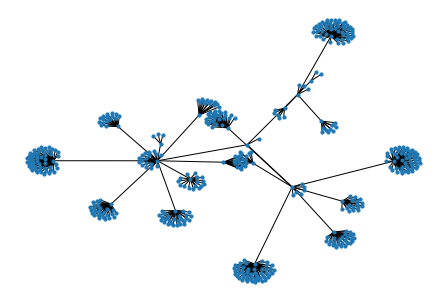

In [29]:
G = makeGraph(record)
nx.draw(G, node_size = 10)
#plt.savefig("decision_tree2.png")

In [155]:
print(len(G.nodes))
print(len(G.edges))

527
526


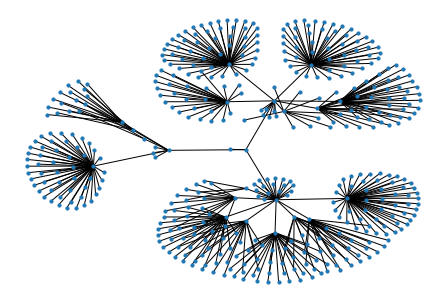

In [30]:
nx.draw_kamada_kawai(G, node_size = 10)
#plt.savefig("decision_tree.png")

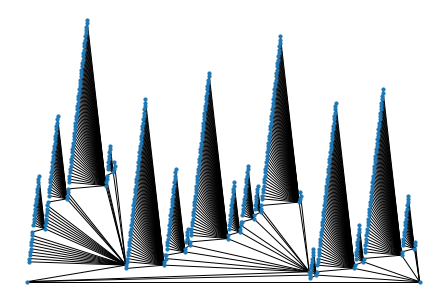

In [157]:
nx.draw_planar(G, node_size = 10)

# Predictions 

In [158]:
# getting some personal details
def getInfo(i):
    
    print("Age =", data[i][varInd['AGE']])
    
    sex = data[i][varInd['SEX']]
    if sex=='1':
        out = "male"
    elif sex=='2':
        out = 'female'
    else:
        out = 'error'
    print("Sex =", out)
    
    marst = data[i][varInd['MARST']]
    if marst=='1' or '2' or '3':
        out = 'married'
    elif marst=='4' or '5' or '7':
        out = 'divorced or widowed'
    elif marst=='6':
        out = 'single'
    else:
        out = 'error'
    print("Marital status =", out)
    
    emp1 = data[i][varInd['EMPSTAT']]
    if emp1 in ['1', '10', '12']:
        out = 'employed'
    elif emp1 in ['21', '22']:
        out = 'unemployed'
    elif emp1 in ['0', '32', '34', '36']:
        out = 'not in labor force'
    else:
        out = 'error'
    print("Employment status year 1 =", out)
        
    emp2 = data[i][varInd['EMPSTAT2']]
    if emp2 in ['1', '10', '12']:
        out = 'employed'
    elif emp2 in ['21', '22']:
        out = 'unemployed'
    elif emp2 in ['0', '32', '34', '36']:
        out = 'not in labor force'
    else:
        out = 'error'
    print("Employment status year 2 =", out)
    
    print("Occupation =", data[i][varInd['OCC']])

In [159]:
def tellFuture(index, record, goalNum):
    goalName = data[0][goalNum]
    getInfo(index)
    print()
    pred = getPred(index, record, goalNum)
    print("Predicting:", goalName)
    print("Prediction:", goalLevels[goalName][pred])
    print("Truth:", data[index][goalNum])

In [160]:
tellFuture(1050, record, goal)

Age = 71
Sex = female
Marital status = married
Employment status year 1 = employed
Employment status year 2 = not in labor force
Occupation = 2860

Predicting: MARST2
Prediction: ['4', '5', '7']
Truth: 5


## Simulations


In [54]:
import copy
import matplotlib.pyplot as plt

### Functions

In [50]:
# NOTE: check whether varLevels includes the predictors you want and doesn't include things you don't want, like the variable you're predicting
# MY SOLUTION: added varLevels as an input to trainTree, so we run makeVarLevels once on all the data
# MY SOLUTION CONT.: then we deep copy and remove target variables as needed


# targetVar is the name of the variable we want to predict
# muteVars is a list of potential predictor variables that we wish to 'mute' (ex: EMPSTAT for EMPSTAT 2)
# simNum is the number of simulations we wish to run

def simulate(targetVar, muteVars=None, simNum=50):
    #identify the index (goal) for the target variable
    goal = varInd[targetVar]
    
    #create a varLevels list exclusing the variables we wish to mute for this target
    varLevelsTar = copy.deepcopy(varLevels)
    if muteVars != None:
        for var in muteVars:
            del varLevelsTar[var]
            print(muteVars, "----deleted")
    else: print("no mutes")

    #make lists to track accuracy measures from multiple simulations
    #depth = 1
    train_accuracy1 = []
    train_precision1 = []
    train_recall1 = []
    train_f11 = []
    test_accuracy1 = []
    test_precision1 = []
    test_recall1 = []
    test_f11 = []
    
    #depth = 2
    train_accuracy2 = []
    train_precision2 = []
    train_recall2 = []
    train_f12 = []
    test_accuracy2 = []
    test_precision2 = []
    test_recall2 = []
    test_f12 = []

    #depth = 3
    train_accuracy3 = []
    train_precision3 = []
    train_recall3 = []
    train_f13 = []
    test_accuracy3 = []
    test_precision3 = []
    test_recall3 = []
    test_f13 = []

    #split data a number of ways:
    for i in range(simNum):
        print("SIM ~~~~~~~~", i, "~~~~~~~ START")
        trainData, testData = split_data(dataInd)
        keepSplittingPercent = 0.99 # accuracy precentage at which to stop splitting leaves 
    
        #train depth = 1 tree and record values
        tree1, record1 = trainTree(trainData, goal, 1, varLevelsTar)
        train_accuracy1_sims, train_precision1_sims, train_recall1_sims, train_f11_sims = testTree(trainData, record1, goal)
        test_accuracy1_sims, test_precision1_sims, test_recall1_sims, test_f11_sims = testTree(testData, record1, goal)
    
        train_accuracy1.append(train_accuracy1_sims)
        train_precision1.append(train_precision1_sims)
        train_recall1.append(train_recall1_sims)
        train_f11.append(train_f11_sims)
        test_accuracy1.append(test_accuracy1_sims)
        test_precision1.append(test_precision1_sims)
        test_recall1.append(test_recall1_sims)
        test_f11.append(test_f11_sims)
    
        #train depth = 2 tree and record values
        tree2, record2 = trainTree(trainData, goal, 2, varLevelsTar)
        train_accuracy2_sims, train_precision2_sims, train_recall2_sims, train_f12_sims = testTree(trainData, record2, goal)
        test_accuracy2_sims, test_precision2_sims, test_recall2_sims, test_f12_sims = testTree(testData, record2, goal)
    
        train_accuracy2.append(train_accuracy2_sims)
        train_precision2.append(train_precision2_sims)
        train_recall2.append(train_recall2_sims)
        train_f12.append(train_f12_sims)
        test_accuracy2.append(test_accuracy2_sims)
        test_precision2.append(test_precision2_sims)
        test_recall2.append(test_recall2_sims)
        test_f12.append(test_f12_sims)

        #train depth = 3 tree and record values
        tree3, record3 = trainTree(trainData, goal, 3, varLevelsTar)
        train_accuracy3_sims, train_precision3_sims, train_recall3_sims, train_f13_sims = testTree(trainData, record3, goal)
        test_accuracy3_sims, test_precision3_sims, test_recall3_sims, test_f13_sims = testTree(testData, record3, goal)
        
        train_accuracy3.append(train_accuracy3_sims)
        train_precision3.append(train_precision3_sims)
        train_recall3.append(train_recall3_sims)
        train_f13.append(train_f13_sims)
        test_accuracy3.append(test_accuracy3_sims)
        test_precision3.append(test_precision3_sims)
        test_recall3.append(test_recall3_sims)
        test_f13.append(test_f13_sims)
        
    
    accMatrix = [train_accuracy1, train_precision1, train_recall1, train_f11, 
        test_accuracy1, test_precision1, test_recall1, test_f11,
        train_accuracy2, train_precision2, train_recall2, train_f12,
        test_accuracy2, test_precision2, test_recall2, test_f12,
        train_accuracy3, train_precision3, train_recall3, train_f13,
        test_accuracy3, test_precision3, test_recall3, test_f13]
        
    return(accMatrix)


In [68]:
def plotSim(accMatrix, targetVar=""):
    
    #unpack the data...
    train_accuracy1 = accMatrix[0] 
    train_precision1 = accMatrix[1]
    train_recall1 = accMatrix[2]
    train_f11 = accMatrix[3] 
    test_accuracy1 = accMatrix[4]
    test_precision1 = accMatrix[5]
    test_recall1 = accMatrix[6]
    test_f11 = accMatrix[7]
    train_accuracy2 = accMatrix[8]
    train_precision2 = accMatrix[9]
    train_recall2 = accMatrix[10]
    train_f12 = accMatrix[11]
    test_accuracy2 = accMatrix[12]
    test_precision2 = accMatrix[13]
    test_recall2 = accMatrix[14]
    test_f12 = accMatrix[15]
    train_accuracy3 = accMatrix[16]
    train_precision3 = accMatrix[17]
    train_recall3 = accMatrix[18]
    train_f13 = accMatrix[19]
    test_accuracy3 = accMatrix[20]
    test_precision3 = accMatrix[21]
    test_recall3 = accMatrix[22]
    test_f13 = accMatrix[23]
    
    #now plot everything     
    fig, axs = plt.subplots(3,3, sharey=True, sharex=True)
    fig.suptitle('Testing vs. training accuracy measures for '+str(targetVar))
    fig.tight_layout()
    plt.subplots_adjust(top=0.85)

    #depth = 1 (row 0)
    axs[0,0].hist(train_accuracy1, bins = 50, label = 'training Accuracy', alpha =0.5)
    axs[0,0].hist(test_accuracy1, bins = 50, label = 'testing Accuracy', alpha = 0.5)
    axs[0,0].set_ylabel("Depth = 1")
    axs[0,0].set_title("Accuracy")

    axs[0,1].hist(train_precision1, bins = 50, label = 'training Precision', alpha =0.5)
    axs[0,1].hist(test_precision1, bins = 50, label = 'testing Precision', alpha = 0.5)
    axs[0,1].set_title("Precision")

    axs[0,2].hist(train_recall1, bins = 50, label = 'training Recall', alpha =0.5)
    axs[0,2].hist(test_recall1, bins = 50, label = 'testing Recall', alpha = 0.5)
    axs[0,2].set_title("Recall")
    axs[0,2].legend(loc='upper center', bbox_to_anchor=(1.45, 0.8))

    #depth =2 (row 1)
    axs[1,0].hist(train_accuracy2, bins = 50, label = 'training Accuracy', alpha =0.5)
    axs[1,0].hist(test_accuracy2, bins = 50, label = 'testing Accuracy', alpha = 0.5)
    axs[1,0].set_ylabel("Depth = 2")

    axs[1,1].hist(train_precision2, bins = 50, label = 'training Precision', alpha =0.5)
    axs[1,1].hist(test_precision2, bins = 50, label = 'testing Precision', alpha = 0.5)

    axs[1,2].hist(train_recall2, bins = 50, label = 'training Recall', alpha =0.5)
    axs[1,2].hist(test_recall2, bins = 50, label = 'testing Recall', alpha = 0.5)

    #depth =3(row 2)
    axs[2,0].hist(train_accuracy3, bins = 50, label = 'training Accuracy', alpha =0.5)
    axs[2,0].hist(test_accuracy3, bins = 50, label = 'testing Accuracy', alpha = 0.5)
    axs[2,0].set_ylabel("Depth = 3")

    axs[2,1].hist(train_precision3, bins = 50, label = 'training Precision', alpha =0.5)
    axs[2,1].hist(test_precision3, bins = 50, label = 'testing Precision', alpha = 0.5)

    axs[2,2].hist(train_recall3, bins = 50, label = 'training Recall', alpha =0.5)
    axs[2,2].hist(test_recall3, bins = 50, label = 'testing Recall', alpha = 0.5)

### Employment

In [166]:
accMatricEmp = []
accMatrixEmp = simulate('EMPSTAT2', muteVars=['EMPSTAT', 'WKSTAT','WHYUNEMP'], simNum=500)

['EMPSTAT', 'WKSTAT', 'WHYUNEMP'] ----deleted
['EMPSTAT', 'WKSTAT', 'WHYUNEMP'] ----deleted
['EMPSTAT', 'WKSTAT', 'WHYUNEMP'] ----deleted
SIM ~~~~~~~~ 0 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3729
loop 0 ------ PROFCERT ------ 4080
loop 0 ------ RACE ------ 4144
loop 0 ------ CITIZEN ------ 4817
loop 0 ------ FAMINC ------ 4601
loop 0 ------ YRIMMIG ------ 2884
loop 0 ------ YRIMMIG ------ 781
loop 0 ------ YRIMMIG ------ 702
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5423          5209
actual +    1749          13357
--------------------------------------
Accuracy  = 0.7296604242753905
Precision = 0.7194333728320585
Recall    = 0.8842181914471071
F1 score  = 0.79335946780708
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted - 

loop 0 ------ YRIMMIG ------ 481
loop 0 ------ HISPAN ------ 105
loop 1 ------ BIRTH ------ 88
loop 0 ------ STATEFIP ------ 84
loop 1 ------ RACE ------ 116
loop 0 ------ CITIZEN ------ 98
loop 0 ------ MARST ------ 16
loop 1 ------ STATEFIP ------ 235
loop 0 ------ EDUC ------ 16
loop 0 ------ NCHILD ------ 13
loop 0 ------ METRO ------ 13
loop 0 ------ MARST ------ 11
loop 1 ------ RELATE ------ 231
loop 0 ------ VETSTAT ------ 55
loop 0 ------ BIRTH ------ 152
loop 1 ------ STATEFIP ------ 130
loop 1 ------ VETSTAT ------ 266
loop 0 ------ RELATE ------ 235
loop 0 ------ REGION ------ 31
loop 2 ------ YRIMMIG ------ 2884
loop 1 ------ STATEFIP ------ 12
loop 1 ------ NCHILD ------ 2549
loop 0 ------ STATEFIP ------ 26
loop 0 ------ EDUC ------ 2226
loop 0 ------ RACE ------ 293
loop 1 ------ STATEFIP ------ 35
loop 1 ------ RACE ------ 33
loop 0 ------ CITIZEN ------ 23
loop 1 ------ FAMINC ------ 21
loop 1 ------ REGION ------ 11
loop 1 ------ FAMINC ------ 43
loop 0 ------ RACE -

loop 1 ------ RACE ------ 3059
loop 0 ------ EDUC ------ 16
loop 0 ------ CITIZEN ------ 2438
loop 0 ------ CITIZEN ------ 12
loop 0 ------ RELATE ------ 223
loop 0 ------ HISPAN ------ 18
loop 0 ------ CITIZEN ------ 284
loop 0 ------ EDUC ------ 39
loop 0 ------ METRO ------ 16
loop 1 ------ STATEFIP ------ 39
loop 2 ------ RACE ------ 4121
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ PROFCERT ------ 3333
loop 0 ------ CITIZEN ------ 927
loop 0 ------ YRIMMIG ------ 2397
loop 1 ------ MARST ------ 16
loop 0 ------ VETSTAT ------ 11
loop 1 ------ PROFCERT ------ 291
loop 0 ------ FAMINC ------ 68
loop 0 ------ BIRTH ------ 222
loop 1 ------ STATEFIP ------ 16
loop 1 ------ PROFCERT ------ 379
loop 0 ------ HISPAN ------ 74
loop 0 ------ BIRTH ------ 302
loop 1 ------ STATEFIP ------ 38
loop 1 ------ STATEFIP ------ 25
loop 2 ------ NCHILD ------ 4767
loop 1 ------ MARST ------ 19
loop 0 ------ EDUC ------ 16
loop 1 ------ CITIZEN ------ 605
loop 0 ------ STATEFIP ------ 58
loop 0 ---

loop 0 ------ FAMINC ------ 41
loop 1 ------ PROFCERT ------ 4101
loop 0 ------ CITIZEN ------ 1117
loop 0 ------ RACE ------ 2972
loop 1 ------ CITIZEN ------ 4849
loop 0 ------ RELATE ------ 282
loop 0 ------ EDUC ------ 21
loop 0 ------ RELATE ------ 463
loop 0 ------ NCHILD ------ 4045
loop 0 ------ YRIMMIG ------ 38
loop 1 ------ EDUC ------ 4674
loop 0 ------ FAMINC ------ 103
loop 0 ------ RACE ------ 1375
loop 0 ------ RELATE ------ 71
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 69
loop 0 ------ NCHILD ------ 78
loop 0 ------ STATEFIP ------ 27
loop 0 ------ BIRTH ------ 262
loop 0 ------ RACE ------ 437
loop 0 ------ NCHILD ------ 89
loop 0 ------ STATEFIP ------ 72
loop 0 ------ MARST ------ 52
loop 0 ------ STATEFIP ------ 819
loop 0 ------ RACE ------ 235
loop 0 ------ CITIZEN ------ 922
loop 0 ------ REGION ------ 51
loop 1 ------ EDUC ------ 2924
loop 0 ------ RACE ------ 70
loop 0 ------ CITIZEN ------ 958
loop 0 ------ FAMINC ------ 76
loop 0 ------ REGION 

loop 0 ------ HISPAN ------ 417
loop 1 ------ STATEFIP ------ 33
loop 2 ------ RACE ------ 755
loop 1 ------ YRIMMIG ------ 648
loop 0 ------ NCHILD ------ 580
loop 0 ------ FAMINC ------ 15
loop 0 ------ STATEFIP ------ 11
loop 1 ------ STATEFIP ------ 32
loop 1 ------ YEAR ------ 63
loop 0 ------ YEAR ------ 63
loop 2 ------ YRIMMIG ------ 653
loop 1 ------ STATEFIP ------ 585
loop 0 ------ METRO ------ 22
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 31
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 29
loop 0 ------ MARST ------ 14
loop 0 ------ FAMINC ------ 11
loop 0 ------ MARST ------ 34
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 18
loop 0 ------ METRO ------ 12
loop 0 ------ RELATE

loop 2 ------ CITIZEN ------ 4667
loop 1 ------ STATEFIP ------ 164
loop 0 ------ YRIMMIG ------ 23
loop 0 ------ YRIMMIG ------ 23
loop 0 ------ NCHILD ------ 37
loop 1 ------ FAMINC ------ 23
loop 1 ------ RELATE ------ 325
loop 0 ------ STATEFIP ------ 104
loop 0 ------ RACE ------ 39
loop 0 ------ STATEFIP ------ 170
loop 1 ------ EDUC ------ 4118
loop 0 ------ FAMINC ------ 80
loop 0 ------ NCHILD ------ 1247
loop 0 ------ STATEFIP ------ 40
loop 0 ------ FAMINC ------ 68
loop 0 ------ RACE ------ 75
loop 0 ------ BIRTH ------ 245
loop 0 ------ NCHILD ------ 408
loop 0 ------ NCHILD ------ 70
loop 0 ------ STATEFIP ------ 57
loop 0 ------ STATEFIP ------ 40
loop 0 ------ STATEFIP ------ 749
loop 0 ------ BIRTH ------ 217
loop 0 ------ RELATE ------ 801
loop 0 ------ STATEFIP ------ 15
loop 1 ------ NCHILD ------ 37
loop 0 ------ METRO ------ 32
loop 2 ------ YRIMMIG ------ 2959
loop 1 ------ NCHILD ------ 11
loop 1 ------ STATEFIP ------ 12
loop 1 ------ EDUC ------ 2640
loop 0 --

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3725
loop 1 ------ RACE ------ 516
loop 0 ------ VETSTAT ------ 435
loop 0 ------ FAMINC ------ 22
loop 0 ------ RELATE ------ 43
loop 1 ------ YRIMMIG ------ 3170
loop 0 ------ EDUC ------ 20
loop 0 ------ STATEFIP ------ 19
loop 0 ------ REGION ------ 28
loop 0 ------ NCHILD ------ 58
loop 0 ------ FAMINC ------ 52
loop 0 ------ CITIZEN ------ 26
loop 0 ------ RELATE ------ 23
loop 0 ------ REGION ------ 25
loop 0 ------ STATEFIP ------ 40
loop 0 ------ VETSTAT ------ 2775
loop 0 ------ RACE ------ 41
loop 0 ------ REGION ------ 26
loop 0 ------ RELATE ------ 26
loop 1 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4057
loop 1 ------ STATEFIP ------ 1012
loop 0 ------ EDUC ------ 37
loop 0 ------ EDUC ------ 20
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 32
loop 0 ------ RACE ------ 32
loop 0 ------ EDUC ------ 22
loop 0 ------ FAMINC ------ 19
loop 0 ------ BIRTH ------ 55
loop 0 ------ MARST ------ 14

loop 2 ------ YRIMMIG ------ 673
loop 1 ------ STATEFIP ------ 589
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 33
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 13
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 28
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 48
loop 0 ------ FAMINC ------ 20
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 14
loop 1 ------ YEAR ------ 24
loop 0 ------ YEAR ------ 24
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4664          5933
actual +    1589          13552
---------------------

loop 0 ------ STATEFIP ------ 554
loop 0 ------ YRIMMIG ------ 562
loop 1 ------ YRIMMIG ------ 224
loop 0 ------ STATEFIP ------ 154
loop 2 ------ FAMINC ------ 4673
loop 1 ------ RELATE ------ 261
loop 0 ------ NCHILD ------ 83
loop 0 ------ YRIMMIG ------ 161
loop 1 ------ STATEFIP ------ 56
loop 1 ------ RACE ------ 168
loop 0 ------ RELATE ------ 136
loop 0 ------ CITIZEN ------ 21
loop 1 ------ YRIMMIG ------ 54
loop 0 ------ METRO ------ 48
loop 1 ------ YRIMMIG ------ 373
loop 0 ------ RACE ------ 325
loop 1 ------ YRIMMIG ------ 541
loop 0 ------ PROFCERT ------ 470
loop 1 ------ CITIZEN ------ 648
loop 0 ------ EDUC ------ 19
loop 0 ------ MARST ------ 36
loop 0 ------ RACE ------ 583
loop 1 ------ STATEFIP ------ 512
loop 0 ------ VETSTAT ------ 19
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 16
loop 0 ------ RACE ------ 24
loop 0 ------ VETSTAT ------ 18
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ HISPAN ------ 20
loop 0 ------ EDUC ------ 42
loop 0 ------ YRIMM

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3701
loop 1 ------ RELATE ------ 521
loop 0 ------ RACE ------ 90
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 127
loop 0 ------ STATEFIP ------ 31
loop 0 ------ SCHLCOLL ------ 233
loop 1 ------ RELATE ------ 3142
loop 0 ------ STATEFIP ------ 249
loop 0 ------ VETSTAT ------ 93
loop 0 ------ BIRTH ------ 114
loop 0 ------ STATEFIP ------ 1439
loop 0 ------ NCHILD ------ 73
loop 0 ------ NCHILD ------ 157
loop 0 ------ CITIZEN ------ 870
loop 0 ------ EDUC ------ 93
loop 0 ------ HISPAN ------ 41
loop 1 ------ STATEFIP ------ 38
loop 2 ------ PROFCERT ------ 4149
loop 1 ------ STATEFIP ------ 979
loop 0 ------ NCHILD ------ 33
loop 0 ------ RELATE ------ 12
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 27
loop 0 ------ SEX ------ 31
loop 0 ------ SCHLCOLL ------ 26
loop 0 ------ NCHILD ------ 12
loop 0 ------ EDUC ------ 22
loop 0 ------ EDUC ------ 17
loop 0 ------ BIRTH ------ 49
loop 0 ------ ED

loop 1 ------ EDUC ------ 4698
loop 0 ------ FAMINC ------ 101
loop 0 ------ RACE ------ 1379
loop 0 ------ STATEFIP ------ 68
loop 0 ------ FAMINC ------ 68
loop 0 ------ RACE ------ 82
loop 0 ------ NCHILD ------ 26
loop 0 ------ STATEFIP ------ 249
loop 0 ------ NCHILD ------ 459
loop 0 ------ RACE ------ 83
loop 0 ------ STATEFIP ------ 72
loop 0 ------ FAMINC ------ 62
loop 0 ------ NCHILD ------ 824
loop 0 ------ FAMINC ------ 236
loop 0 ------ RELATE ------ 916
loop 0 ------ RELATE ------ 63
loop 1 ------ EDUC ------ 2879
loop 0 ------ YRIMMIG ------ 68
loop 0 ------ CITIZEN ------ 952
loop 0 ------ FAMINC ------ 76
loop 0 ------ REGION ------ 64
loop 0 ------ METRO ------ 59
loop 0 ------ YEAR ------ 22
loop 0 ------ MARST ------ 111
loop 0 ------ FAMINC ------ 260
loop 0 ------ FAMINC ------ 57
loop 0 ------ MARST ------ 38
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ YRIMMIG ------ 490
loop 0 ------ YRIMMIG ------ 116
loop 0 ------ YRIMMIG ------ 455
loop 0 ------ STATEFIP -

loop 0 ------ EDUC ------ 20
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 25
loop 0 ------ MARST ------ 15
loop 0 ------ RELATE ------ 37
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 23
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ RACE ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 18
loop 0 ------ SEX ------ 14
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 24
loop 0 ------ YEAR ------ 24
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4032          6586
actual +    1419          13701
--------------------------------------
Accuracy  = 0.6889812728261714
Precision = 0.6753586040321388
Recall    = 0.90615079365079

loop 1 ------ BIRTH ------ 2822
loop 0 ------ YRIMMIG ------ 2714
loop 0 ------ YRIMMIG ------ 108
loop 1 ------ EDUC ------ 43
loop 1 ------ RELATE ------ 1142
loop 0 ------ CITIZEN ------ 383
loop 0 ------ STATEFIP ------ 12
loop 0 ------ VETSTAT ------ 94
loop 0 ------ YRIMMIG ------ 23
loop 0 ------ YRIMMIG ------ 620
loop 1 ------ YRIMMIG ------ 216
loop 0 ------ STATEFIP ------ 148
loop 2 ------ PROFCERT ------ 4697
loop 1 ------ EDUC ------ 882
loop 0 ------ RACE ------ 43
loop 0 ------ YRIMMIG ------ 138
loop 0 ------ YRIMMIG ------ 60
loop 0 ------ RACE ------ 190
loop 0 ------ NCHILD ------ 61
loop 0 ------ BIRTH ------ 96
loop 0 ------ STATEFIP ------ 67
loop 0 ------ NCHILD ------ 203
loop 1 ------ FAMINC ------ 3814
loop 0 ------ RACE ------ 220
loop 0 ------ RACE ------ 48
loop 0 ------ RACE ------ 150
loop 0 ------ YRIMMIG ------ 52
loop 0 ------ YRIMMIG ------ 307
loop 0 ------ BIRTH ------ 349
loop 0 ------ YRIMMIG ------ 494
loop 0 ------ STATEFIP ------ 444
loop 0 --

loop 0 ------ NCHILD ------ 2713
loop 0 ------ STATEFIP ------ 11
loop 0 ------ NCHILD ------ 42
loop 0 ------ STATEFIP ------ 29
loop 0 ------ FAMINC ------ 32
loop 1 ------ STATEFIP ------ 37
loop 2 ------ PROFCERT ------ 4091
loop 1 ------ STATEFIP ------ 986
loop 0 ------ NCHILD ------ 38
loop 0 ------ NCHILD ------ 22
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 36
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 30
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 20
loop 0 ------ FAMINC ------ 50
loop 0 ------ EDUC ------ 12
loop 0 ------ RELATE ------ 16
loop 0 ------ METRO ------ 15
loop 0 ------ METRO ------ 13
loop 0 ------ EDUC ------ 28
loop 0 ------ BIRTH ------ 18
loop 0 ------ RACE ------ 17
loop 0 ------ BIRTH ------ 75
loop 0 ------ FAMINC ------ 11
loop 0 ------ NCHILD ------ 17
loop 0 ------ NCHILD ------ 29
loop 0 ------ NCHILD ------ 20
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 15
loop 0 ------ METRO ------ 13
loop 0 ------ MET

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3667
loop 0 ------ RACE ------ 493
loop 0 ------ CITIZEN ------ 3136
loop 0 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4047
loop 0 ------ STATEFIP ------ 1012
loop 0 ------ SEX ------ 2997
loop 0 ------ METRO ------ 38
loop 1 ------ PROFCERT ------ 4122
loop 0 ------ CITIZEN ------ 1093
loop 0 ------ RACE ------ 3014
loop 0 ------ EDUC ------ 15
loop 1 ------ PROFCERT ------ 4840
loop 0 ------ YRIMMIG ------ 1062
loop 0 ------ RELATE ------ 3776
loop 1 ------ RELATE ------ 4682
loop 0 ------ RACE ------ 1472
loop 0 ------ FAMINC ------ 19
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ RACE ------ 43
loop 0 ------ EDUC ------ 138
loop 0 ------ HISPAN ------ 83
loop 0 ------ FAMINC ------ 2840
loop 0 ------ RACE ------ 31
loop 0 ------ METRO ------ 11
loop 1 ------ EDUC ------ 2953
loop 0 ------ RACE ------ 81
loop 0 ------ CITIZEN ------ 971
loop 0 ------ MARST ------ 72
loop 0 ------ REGION ------ 69
loop 0 ------

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4950          5694
actual +    1238          13856
--------------------------------------
Accuracy  = 0.7306706037765172
Precision = 0.7087468030690537
Recall    = 0.9179806545647277
F1 score  = 0.799907631913174
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1915          2644
actual +    592          5879
--------------------------------------
Accuracy  = 0.7066183136899366
Precision = 0.6897805936876686
Recall    = 0.9085149126873744
F1 score  = 0.7841803388021874
SIM ~~~~~~~~ 11 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3709
loop 0 ------ PROFCERT ------ 4048
loop 0 ------ RACE ------ 4130
loop 0 ------ CITIZEN ------ 4797
loop 0 ------ FAMINC ------ 469

loop 0 ------ VETSTAT ------ 160
loop 2 ------ YRIMMIG ------ 2895
loop 1 ------ EDUC ------ 2578
loop 0 ------ RACE ------ 57
loop 0 ------ FAMINC ------ 853
loop 0 ------ FAMINC ------ 60
loop 0 ------ REGION ------ 59
loop 0 ------ REGION ------ 59
loop 0 ------ RACE ------ 104
loop 0 ------ STATEFIP ------ 226
loop 0 ------ MARST ------ 54
loop 0 ------ FAMINC ------ 30
loop 0 ------ FAMINC ------ 50
loop 0 ------ RACE ------ 501
loop 0 ------ STATEFIP ------ 98
loop 0 ------ RACE ------ 407
loop 0 ------ YEAR ------ 13
loop 1 ------ FAMINC ------ 37
loop 1 ------ RACE ------ 38
loop 0 ------ CITIZEN ------ 29
loop 1 ------ FAMINC ------ 12
loop 1 ------ HISPAN ------ 47
loop 0 ------ RACE ------ 36
loop 0 ------ YEAR ------ 11
loop 1 ------ REGION ------ 33
loop 0 ------ METRO ------ 13
loop 1 ------ FAMINC ------ 13
loop 1 ------ METRO ------ 20
loop 2 ------ YRIMMIG ------ 754
loop 1 ------ RACE ------ 665
loop 0 ------ FAMINC ------ 584
loop 0 ------ STATEFIP ------ 61
loop 1 -

loop 2 ------ RACE ------ 4153
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ PROFCERT ------ 3385
loop 0 ------ CITIZEN ------ 923
loop 0 ------ YRIMMIG ------ 2451
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ CITIZEN ------ 278
loop 0 ------ BIRTH ------ 80
loop 0 ------ BIRTH ------ 121
loop 0 ------ STATEFIP ------ 67
loop 1 ------ NCHILD ------ 18
loop 1 ------ STATEFIP ------ 365
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 33
loop 0 ------ NCHILD ------ 18
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ RELATE ------ 11
loop 0 ------ NCHILD ------ 23
loop 0 ------ NCHILD ------ 14
loop 0 ------ SEX ------ 25
loop 0 ------ FAMINC ------ 13
loop 0 ------ METRO ------ 30
loop 0 ------ FAMINC ------ 16
loop 0 ------ NCHILD ------ 18
loop 1 ------ YRIMMIG ------ 45
loop 0 ------ EDUC ------ 38
loop 1 ------ SEX ------ 25
loop 0 ------ REGION ------ 13
loop 2 ------ NCHILD ------ 4853
loop 1 ------ EDUC ------ 18
loop 1 ------ CITIZEN ------ 640
loop 0 ------ STATEFIP ------

loop 0 ------ RACE ------ 3033
loop 0 ------ STATEFIP ------ 47
loop 1 ------ PROFCERT ------ 4144
loop 0 ------ CITIZEN ------ 1147
loop 0 ------ RACE ------ 2984
loop 1 ------ NCHILD ------ 4859
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 638
loop 0 ------ CITIZEN ------ 2837
loop 0 ------ EDUC ------ 48
loop 0 ------ RELATE ------ 1111
loop 0 ------ YRIMMIG ------ 203
loop 1 ------ FAMINC ------ 4586
loop 0 ------ CITIZEN ------ 252
loop 0 ------ RACE ------ 56
loop 0 ------ YRIMMIG ------ 159
loop 0 ------ EDUC ------ 48
loop 0 ------ RELATE ------ 372
loop 0 ------ NCHILD ------ 542
loop 0 ------ YRIMMIG ------ 624
loop 0 ------ STATEFIP ------ 523
loop 0 ------ RELATE ------ 367
loop 0 ------ BIRTH ------ 606
loop 0 ------ RACE ------ 86
loop 0 ------ RACE ------ 111
loop 0 ------ YRIMMIG ------ 240
loop 0 ------ RELATE ------ 223
loop 0 ------ VETSTAT ------ 122
loop 0 ------ RELATE ------ 255
loop 1 ------ YRIMMIG ------ 2891
loop 0 ------ YEAR ------ 12
loop 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4760          5875
actual +    1160          13943
--------------------------------------
Accuracy  = 0.7266687388297459
Precision = 0.70355232616813
Recall    = 0.923194067403827
F1 score  = 0.7985452879356261
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1982          2586
actual +    553          5909
--------------------------------------
Accuracy  = 0.7154125113327289
Precision = 0.6955856386109476
Recall    = 0.9144227793252863
F1 score  = 0.7901317109045931
SIM ~~~~~~~~ 14 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3672
loop 0 ------ PROFCERT ------ 4049
loop 0 ------ RACE ------ 4112
loop 0 ------ NCHILD ------ 4842
loop 0 ------ PROFCERT ------ 4643

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4788          5933
actual +    1483          13534
--------------------------------------
Accuracy  = 0.7118657238324656
Precision = 0.6952278214414137
Recall    = 0.9012452553772391
F1 score  = 0.784943742025287
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1864          2618
actual +    695          5853
--------------------------------------
Accuracy  = 0.699637352674524
Precision = 0.6909455790343525
Recall    = 0.893860720830788
F1 score  = 0.77941274385778
SIM ~~~~~~~~ 15 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3719
loop 0 ------ PROFCERT ------ 4076
loop 0 ------ RACE ------ 4094
loop 0 ------ NCHILD ------ 4819
loop 0 ------ FAMINC ------ 4664
loo

loop 2 ------ FAMINC ------ 4664
loop 1 ------ RELATE ------ 247
loop 0 ------ EDUC ------ 73
loop 0 ------ BIRTH ------ 152
loop 1 ------ STATEFIP ------ 51
loop 1 ------ RACE ------ 164
loop 0 ------ NCHILD ------ 135
loop 0 ------ CITIZEN ------ 18
loop 1 ------ VETSTAT ------ 54
loop 0 ------ YRIMMIG ------ 49
loop 1 ------ RACE ------ 391
loop 0 ------ EDUC ------ 340
loop 0 ------ STATEFIP ------ 17
loop 0 ------ VETSTAT ------ 28
loop 1 ------ PROFCERT ------ 559
loop 0 ------ YRIMMIG ------ 198
loop 0 ------ BIRTH ------ 360
loop 1 ------ RELATE ------ 613
loop 0 ------ STATEFIP ------ 244
loop 0 ------ MARST ------ 19
loop 0 ------ NCHILD ------ 329
loop 1 ------ RACE ------ 521
loop 0 ------ VETSTAT ------ 453
loop 0 ------ MARST ------ 21
loop 0 ------ YRIMMIG ------ 35
loop 1 ------ NCHILD ------ 383
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ YRIMMIG ------ 313
loop 0 ------ STATEFIP ------ 55
loop 1 ------ NCHILD ------ 610
loop 0 ------ MARST ------ 22
loop 0 ------ ST

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3690
loop 1 ------ RACE ------ 512
loop 0 ------ FAMINC ------ 422
loop 0 ------ STATEFIP ------ 28
loop 0 ------ BIRTH ------ 43
loop 1 ------ CITIZEN ------ 3143
loop 0 ------ RELATE ------ 283
loop 0 ------ RELATE ------ 15
loop 0 ------ STATEFIP ------ 102
loop 0 ------ RELATE ------ 2721
loop 0 ------ RELATE ------ 22
loop 1 ------ STATEFIP ------ 35
loop 2 ------ PROFCERT ------ 4131
loop 1 ------ STATEFIP ------ 1013
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ NCHILD ------ 24
loop 0 ------ FAMINC ------ 27
loop 0 ------ SEX ------ 38
loop 0 ------ SCHLCOLL ------ 29
loop 0 ------ NCHILD ------ 16
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 18
loop 0 ------ SEX ------ 51
loop 0 ------ MARST ------ 15
loop 0 ------ MARST ------ 19
loop 0 ------ NCHILD ------ 13
loop 0 ------ RELATE ------ 14
loop 0 ------ MARST ------ 14
loop 0 ------ FAMINC ------ 31
loop 0 ------ NCHILD ------ 15
loop 0 ------ FAMINC ----

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3721
loop 0 ------ RELATE ------ 526
loop 0 ------ YRIMMIG ------ 3158
loop 0 ------ STATEFIP ------ 37
loop 1 ------ RACE ------ 4103
loop 0 ------ RELATE ------ 22
loop 0 ------ PROFCERT ------ 3317
loop 0 ------ CITIZEN ------ 17
loop 0 ------ RELATE ------ 280
loop 0 ------ STATEFIP ------ 20
loop 0 ------ PROFCERT ------ 362
loop 0 ------ SCHLCOLL ------ 44
loop 0 ------ NCHILD ------ 23
loop 1 ------ PROFCERT ------ 4153
loop 0 ------ CITIZEN ------ 1138
loop 0 ------ RACE ------ 3003
loop 1 ------ CITIZEN ------ 4732
loop 0 ------ RELATE ------ 266
loop 0 ------ YRIMMIG ------ 27
loop 0 ------ RELATE ------ 430
loop 0 ------ NCHILD ------ 3964
loop 0 ------ STATEFIP ------ 45
loop 1 ------ EDUC ------ 4680
loop 0 ------ FAMINC ------ 108
loop 0 ------ NCHILD ------ 1391
loop 0 ------ MARST ------ 62
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ FAMINC ------ 61
loop 0 ------ NCHILD ------ 78
loop 0 ------ NCHILD ------

loop 0 ------ EDUC ------ 47
loop 0 ------ EDUC ------ 54
loop 0 ------ EDUC ------ 51
loop 0 ------ EDUC ------ 50
loop 0 ------ VETSTAT ------ 31
loop 0 ------ FAMINC ------ 41
loop 0 ------ RACE ------ 69
loop 0 ------ METRO ------ 37
loop 0 ------ FAMINC ------ 32
loop 0 ------ FAMINC ------ 62
loop 1 ------ STATEFIP ------ 32
loop 1 ------ RACE ------ 31
loop 0 ------ FAMINC ------ 25
loop 1 ------ FAMINC ------ 18
loop 1 ------ METRO ------ 39
loop 0 ------ MARST ------ 14
loop 0 ------ YEAR ------ 17
loop 1 ------ FAMINC ------ 39
loop 1 ------ EDUC ------ 22
loop 2 ------ RACE ------ 747
loop 1 ------ YRIMMIG ------ 650
loop 0 ------ EDUC ------ 589
loop 0 ------ FAMINC ------ 16
loop 0 ------ REGION ------ 11
loop 1 ------ FAMINC ------ 29
loop 1 ------ YEAR ------ 58
loop 0 ------ YEAR ------ 58
loop 2 ------ YRIMMIG ------ 664
loop 1 ------ STATEFIP ------ 587
loop 0 ------ METRO ------ 17
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 32
loop 0 ------ YEAR ------ 

loop 1 ------ RACE ------ 3068
loop 0 ------ RELATE ------ 21
loop 0 ------ SEX ------ 2456
loop 0 ------ CITIZEN ------ 13
loop 0 ------ HISPAN ------ 239
loop 0 ------ NCHILD ------ 17
loop 0 ------ CITIZEN ------ 259
loop 0 ------ EDUC ------ 34
loop 0 ------ NCHILD ------ 17
loop 1 ------ STATEFIP ------ 36
loop 2 ------ RACE ------ 4194
loop 1 ------ NCHILD ------ 14
loop 1 ------ PROFCERT ------ 3374
loop 0 ------ YRIMMIG ------ 950
loop 0 ------ YRIMMIG ------ 2414
loop 1 ------ YRIMMIG ------ 15
loop 1 ------ SEX ------ 292
loop 0 ------ VETSTAT ------ 169
loop 0 ------ STATEFIP ------ 123
loop 1 ------ NCHILD ------ 18
loop 1 ------ PROFCERT ------ 397
loop 0 ------ HISPAN ------ 77
loop 0 ------ BIRTH ------ 318
loop 1 ------ YRIMMIG ------ 46
loop 0 ------ EDUC ------ 39
loop 1 ------ FAMINC ------ 28
loop 2 ------ NCHILD ------ 4788
loop 1 ------ STATEFIP ------ 16
loop 1 ------ CITIZEN ------ 620
loop 0 ------ STATEFIP ------ 64
loop 0 ------ EDUC ------ 81
loop 0 ------ S

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5654          4973
actual +    2123          12988
--------------------------------------
Accuracy  = 0.7242987023078716
Precision = 0.7231223205834865
Recall    = 0.8595063198994111
F1 score  = 0.7854378326076439
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2449          2127
actual +    905          5549
--------------------------------------
Accuracy  = 0.7251133272892113
Precision = 0.7229025534132361
Recall    = 0.8597768825534552
F1 score  = 0.7854210898796885
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3672
loop 0 ------ RACE ------ 506
loop 0 ------ CITIZEN ------ 3131
loop 0 ------ STATEFIP ------ 35
loop 1 ------ PROFCERT ------ 4154
loop 0 ------ STATEFIP -----

loop 0 ------ CITIZEN ------ 711
loop 1 ------ CITIZEN ------ 58
loop 0 ------ STATEFIP ------ 24
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 12
loop 2 ------ YRIMMIG ------ 2911
loop 1 ------ NCHILD ------ 2564
loop 0 ------ STATEFIP ------ 29
loop 0 ------ EDUC ------ 2257
loop 0 ------ RACE ------ 273
loop 1 ------ STATEFIP ------ 46
loop 1 ------ RACE ------ 35
loop 0 ------ CITIZEN ------ 29
loop 1 ------ FAMINC ------ 19
loop 1 ------ FAMINC ------ 43
loop 0 ------ RACE ------ 11
loop 1 ------ REGION ------ 38
loop 0 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 13
loop 1 ------ EDUC ------ 23
loop 2 ------ YRIMMIG ------ 763
loop 1 ------ RACE ------ 661
loop 0 ------ EDUC ------ 581
loop 0 ------ STATEFIP ------ 61
loop 1 ------ FAMINC ------ 21
loop 1 ------ REGION ------ 14
loop 2 ------ YRIMMIG ------ 684
loop 1 ------ STATEFIP ------ 606
loop 0 ------ EDUC ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 35
lo

loop 2 ------ NCHILD ------ 4805
loop 1 ------ MARST ------ 18
loop 0 ------ RELATE ------ 15
loop 1 ------ CITIZEN ------ 619
loop 0 ------ STATEFIP ------ 64
loop 0 ------ SEX ------ 81
loop 0 ------ SCHLCOLL ------ 469
loop 1 ------ YRIMMIG ------ 2773
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 18
loop 0 ------ REGION ------ 20
loop 0 ------ STATEFIP ------ 21
loop 0 ------ PROFCERT ------ 2491
loop 0 ------ FAMINC ------ 12
loop 0 ------ CITIZEN ------ 16
loop 0 ------ STATEFIP ------ 13
loop 0 ------ MARST ------ 15
loop 0 ------ MARST ------ 21
loop 0 ------ MARST ------ 16
loop 0 ------ STATEFIP ------ 21
loop 0 ------ REGION ------ 12
loop 0 ------ STATEFIP ------ 20
loop 1 ------ EDUC ------ 42
loop 1 ------ RELATE ------ 1137
loop 0 ------ CITIZEN ------ 386
loop 0 ------ STATEFIP ------ 13
loop 0 ------ CITIZEN ------ 98
loop 0 ------ YRIMMIG ------ 23
loop 0 ------ SCHLCOLL ------ 610
loop 1 ------ YRIMMIG ------ 208
loop 0 ------ SEX ------ 132
loop 2 -

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4462          6139
actual +    1044          14093
--------------------------------------
Accuracy  = 0.7209184862848707
Precision = 0.6965697904310004
Recall    = 0.9310299266697496
F1 score  = 0.7969125505386073
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1849          2752
actual +    504          5925
--------------------------------------
Accuracy  = 0.7048050770625567
Precision = 0.6828396911374899
Recall    = 0.9216052263182455
F1 score  = 0.7844565073480736
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3697
loop 1 ------ RACE ------ 508
loop 0 ------ STATEFIP ------ 419
loop 0 ------ STATEFIP ------ 26
loop 0 ------ FAMINC ------ 44
loop 1 ------ CITIZEN ------ 315

loop 2 ------ YRIMMIG ------ 678
loop 1 ------ STATEFIP ------ 604
loop 0 ------ METRO ------ 16
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 36
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 22
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 25
loop 0 ------ YEAR ------ 13
loop 0 ------ EDUC ------ 42
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ SEX ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 18
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4407          6194
actual +    943          14194

loop 2 ------ PROFCERT ------ 4146
loop 1 ------ CITIZEN ------ 1105
loop 0 ------ FAMINC ------ 46
loop 0 ------ FAMINC ------ 93
loop 0 ------ RACE ------ 948
loop 1 ------ RACE ------ 3028
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ YRIMMIG ------ 2416
loop 0 ------ EDUC ------ 11
loop 0 ------ YRIMMIG ------ 218
loop 0 ------ STATEFIP ------ 290
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ STATEFIP ------ 23
loop 2 ------ PROFCERT ------ 4784
loop 1 ------ EDUC ------ 1089
loop 0 ------ NCHILD ------ 39
loop 0 ------ FAMINC ------ 205
loop 0 ------ RACE ------ 72
loop 0 ------ YRIMMIG ------ 187
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ RACE ------ 153
loop 0 ------ MARST ------ 78
loop 0 ------ CITIZEN ------ 278
loop 1 ------ NCHILD ------ 3693
loop 0 ------ EDUC ------ 17
loop 0 ------ CITIZEN ------ 471
loop 0 ------ SCHLCOLL ------ 2124
loop 0 ------ EDUC ------ 40
loop 0 ------ SCHLCOLL ------ 882
loop 0 ------ YRIMMIG ------ 152
loop 2 ------ FAMINC ------ 4650
loop 1

loop 1 ------ YRIMMIG ------ 756
loop 0 ------ STATEFIP ------ 653
loop 0 ------ FAMINC ------ 20
loop 0 ------ REGION ------ 13
loop 1 ------ YRIMMIG ------ 653
loop 0 ------ STATEFIP ------ 585
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5608          4990
actual +    1925          13215
--------------------------------------
Accuracy  = 0.7313311057580232
Precision = 0.7258994781653392
Recall    = 0.8728533685601056
F1 score  = 0.7926225820962662
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2362          2242
actual +    896          5530
--------------------------------------
Accuracy  = 0.715503173164098
Precision = 0.7115285640761708
Recall    = 0.8605664488017429
F1 score  = 0.7789829553458233
lo

loop 1 ------ RACE ------ 517
loop 0 ------ FAMINC ------ 454
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ STATEFIP ------ 38
loop 1 ------ RACE ------ 125
loop 0 ------ YRIMMIG ------ 108
loop 1 ------ YRIMMIG ------ 461
loop 0 ------ HISPAN ------ 405
loop 1 ------ STATEFIP ------ 30
loop 2 ------ YRIMMIG ------ 756
loop 1 ------ STATEFIP ------ 653
loop 0 ------ VETSTAT ------ 26
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 27
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 24
loop 0 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ RACE ------ 45
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 20
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 15
loop 0 ------ SEX ------ 14
loop 0 ------ YEAR

loop 1 ------ SEX ------ 3076
loop 0 ------ STATEFIP ------ 1570
loop 0 ------ EDUC ------ 1506
loop 1 ------ FAMINC ------ 42
loop 0 ------ METRO ------ 12
loop 2 ------ PROFCERT ------ 4105
loop 1 ------ CITIZEN ------ 1091
loop 0 ------ EDUC ------ 42
loop 0 ------ HISPAN ------ 96
loop 0 ------ EDUC ------ 936
loop 1 ------ RACE ------ 3002
loop 0 ------ NCHILD ------ 12
loop 0 ------ YRIMMIG ------ 2405
loop 0 ------ EDUC ------ 11
loop 0 ------ YRIMMIG ------ 214
loop 0 ------ BIRTH ------ 300
loop 0 ------ YRIMMIG ------ 35
loop 0 ------ STATEFIP ------ 13
loop 1 ------ EDUC ------ 12
loop 2 ------ NCHILD ------ 4831
loop 1 ------ RELATE ------ 12
loop 1 ------ CITIZEN ------ 594
loop 0 ------ STATEFIP ------ 54
loop 0 ------ EDUC ------ 73
loop 0 ------ SCHLCOLL ------ 462
loop 1 ------ SCHLCOLL ------ 2805
loop 0 ------ CITIZEN ------ 1111
loop 0 ------ BIRTH ------ 1681
loop 1 ------ HISPAN ------ 44
loop 0 ------ MARST ------ 30
loop 1 ------ YRIMMIG ------ 1144
loop 0 -----

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3738
loop 0 ------ RACE ------ 506
loop 0 ------ RELATE ------ 3190
loop 0 ------ STATEFIP ------ 42
loop 1 ------ PROFCERT ------ 4071
loop 0 ------ STATEFIP ------ 992
loop 0 ------ SEX ------ 3037
loop 0 ------ METRO ------ 42
loop 1 ------ PROFCERT ------ 4162
loop 0 ------ CITIZEN ------ 1110
loop 0 ------ RACE ------ 3037
loop 0 ------ EDUC ------ 15
loop 1 ------ PROFCERT ------ 4782
loop 0 ------ CITIZEN ------ 1082
loop 0 ------ NCHILD ------ 3699
loop 1 ------ RACE ------ 4608
loop 0 ------ CITIZEN ------ 3937
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ STATEFIP ------ 172
loop 0 ------ RELATE ------ 405
loop 0 ------ RELATE ------ 40
loop 0 ------ STATEFIP ------ 22
loop 1 ------ CITIZEN ------ 2910
loop 0 ------ YRIMMIG ------ 67
loop 0 ------ STATEFIP ------ 16
loop 0 ------ STATEFIP ------ 224
loop 0 ------ EDUC ------ 2586
loop 0 ------ FAMINC ------ 17
loop 1 ------ YRIMMIG ------ 788
loop 0 ------ RACE ----

Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2365          2260
actual +    827          5578
--------------------------------------
Accuracy  = 0.7201269265639166
Precision = 0.7116611380454197
Recall    = 0.8708821233411397
F1 score  = 0.7832619532401882
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3719
loop 0 ------ CITIZEN ------ 510
loop 0 ------ CITIZEN ------ 3170
loop 0 ------ STATEFIP ------ 39
loop 1 ------ PROFCERT ------ 4010
loop 0 ------ STATEFIP ------ 987
loop 0 ------ SEX ------ 2989
loop 0 ------ NCHILD ------ 34
loop 1 ------ PROFCERT ------ 4151
loop 0 ------ CITIZEN ------ 1116
loop 0 ------ RACE ------ 3018
loop 1 ------ NCHILD ------ 4825
loop 0 ------ STATEFIP ------ 11
loop 0 ------ CITIZEN ------ 629
loop 0 ------ SCHLCOLL ------ 2798
loop 0 ------ EDUC ------ 46
loop 0 ------ SCHLCOLL ------ 1120
loop 0 ------ YRIMMIG ------ 213
loop 1 -

loop 1 ------ YRIMMIG ------ 475
loop 0 ------ HISPAN ------ 424
loop 1 ------ FAMINC ------ 36
loop 2 ------ RACE ------ 769
loop 1 ------ YRIMMIG ------ 660
loop 0 ------ EDUC ------ 593
loop 0 ------ FAMINC ------ 20
loop 1 ------ FAMINC ------ 30
loop 1 ------ YEAR ------ 66
loop 0 ------ YEAR ------ 66
loop 2 ------ YRIMMIG ------ 664
loop 1 ------ STATEFIP ------ 595
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 33
loop 0 ------ NCHILD ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 16
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 28
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ RELATE ------ 36
loop 0 ------ FAMINC ------ 19
loop 0 ------ FAMINC ------ 11
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ---

loop 2 ------ RACE ------ 4709
loop 1 ------ FAMINC ------ 4017
loop 0 ------ MARST ------ 213
loop 0 ------ VETSTAT ------ 42
loop 0 ------ BIRTH ------ 137
loop 0 ------ STATEFIP ------ 33
loop 0 ------ BIRTH ------ 345
loop 0 ------ NCHILD ------ 484
loop 0 ------ EDUC ------ 560
loop 0 ------ CITIZEN ------ 460
loop 0 ------ BIRTH ------ 302
loop 0 ------ NCHILD ------ 550
loop 0 ------ EDUC ------ 57
loop 0 ------ CITIZEN ------ 93
loop 0 ------ YRIMMIG ------ 209
loop 0 ------ RELATE ------ 193
loop 0 ------ NCHILD ------ 105
loop 0 ------ YRIMMIG ------ 234
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ STATEFIP ------ 179
loop 0 ------ MARST ------ 12
loop 0 ------ HISPAN ------ 51
loop 0 ------ FAMINC ------ 38
loop 1 ------ HISPAN ------ 424
loop 0 ------ STATEFIP ------ 417
loop 1 ------ MARST ------ 33
loop 0 ------ FAMINC ------ 24
loop 1 ------ STATEFIP ------ 24
loop 2 ------ YRIMMIG ------ 2925
loop 1 ------ RELATE ------ 2607
loop 0 ------ BIRTH ------ 750
loop 0 ------

loop 1 ------ YRIMMIG ------ 2627
loop 0 ------ STATEFIP ------ 11
loop 0 ------ HISPAN ------ 2338
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 27
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 19
loop 1 ------ STATEFIP ------ 710
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 41
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 19
loop 0 ------ FAMINC ------ 27
loop 0 ------ EDUC ------ 17
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 20
loop 0 ------ NCHILD ------ 20
loop 0 ------ METRO ------ 61
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 15

loop 1 ------ SCHLCOLL ------ 2786
loop 0 ------ YRIMMIG ------ 1142
loop 0 ------ YRIMMIG ------ 1633
loop 1 ------ STATEFIP ------ 46
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ SCHLCOLL ------ 1106
loop 0 ------ STATEFIP ------ 527
loop 0 ------ CITIZEN ------ 572
loop 1 ------ YRIMMIG ------ 221
loop 0 ------ BIRTH ------ 151
loop 2 ------ PROFCERT ------ 4684
loop 1 ------ RELATE ------ 840
loop 0 ------ RACE ------ 292
loop 0 ------ EDUC ------ 20
loop 0 ------ NCHILD ------ 508
loop 1 ------ FAMINC ------ 3843
loop 0 ------ CITIZEN ------ 212
loop 0 ------ MARST ------ 53
loop 0 ------ RACE ------ 145
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ EDUC ------ 323
loop 0 ------ RACE ------ 373
loop 0 ------ BIRTH ------ 516
loop 0 ------ STATEFIP ------ 452
loop 0 ------ CITIZEN ------ 316
loop 0 ------ RELATE ------ 449
loop 0 ------ RACE ------ 82
loop 0 ------ RACE ------ 104
loop 0 ------ STATEFIP ------ 207
loop 0 ------ RELATE ------ 201
loop 0 ------ STATEFIP ------ 134
l

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3671
loop 1 ------ RACE ------ 498
loop 0 ------ CITIZEN ------ 421
loop 0 ------ FAMINC ------ 22
loop 0 ------ STATEFIP ------ 41
loop 1 ------ YRIMMIG ------ 3137
loop 0 ------ METRO ------ 11
loop 0 ------ STATEFIP ------ 23
loop 0 ------ CITIZEN ------ 28
loop 0 ------ NCHILD ------ 58
loop 0 ------ FAMINC ------ 49
loop 0 ------ CITIZEN ------ 24
loop 0 ------ RELATE ------ 20
loop 0 ------ CITIZEN ------ 39
loop 0 ------ STATEFIP ------ 35
loop 0 ------ RELATE ------ 2728
loop 0 ------ STATEFIP ------ 48
loop 0 ------ RACE ------ 29
loop 0 ------ STATEFIP ------ 30
loop 1 ------ METRO ------ 36
loop 2 ------ PROFCERT ------ 4120
loop 1 ------ STATEFIP ------ 1024
loop 0 ------ NCHILD ------ 36
loop 0 ------ FAMINC ------ 13
loop 0 ------ SEX ------ 20
loop 0 ------ FAMINC ------ 21
loop 0 ------ SEX ------ 38
loop 0 ------ EDUC ------ 16
loop 0 ------ RACE ------ 29
loop 0 ------ NCHILD ------ 14
loop 0 ------ EDUC ---

loop 2 ------ CITIZEN ------ 2931
loop 1 ------ RACE ------ 74
loop 0 ------ STATEFIP ------ 45
loop 0 ------ FAMINC ------ 19
loop 1 ------ STATEFIP ------ 16
loop 1 ------ STATEFIP ------ 205
loop 0 ------ FAMINC ------ 21
loop 0 ------ NCHILD ------ 27
loop 0 ------ PROFCERT ------ 61
loop 1 ------ HISPAN ------ 2618
loop 0 ------ NCHILD ------ 2551
loop 0 ------ FAMINC ------ 67
loop 1 ------ FAMINC ------ 18
loop 2 ------ STATEFIP ------ 803
loop 1 ------ YRIMMIG ------ 41
loop 0 ------ RACE ------ 28
loop 1 ------ SEX ------ 17
loop 1 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 16
loop 1 ------ NCHILD ------ 13
loop 1 ------ FAMINC ------ 42
loop 1 ------ FAMINC ------ 23
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 15
loop 1 ------ FAMINC ------ 23
loop 1 ------ EDUC ------ 24
loop 0 ------ MARST ------ 12
loop 1 ------ MARST ------ 12
loop 1 ------ FAMINC ------ 13
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ NCHILD ------ 17
loop 0 --

loop 0 ------ RELATE ------ 2716
loop 0 ------ NCHILD ------ 46
loop 0 ------ EDUC ------ 28
loop 0 ------ RELATE ------ 29
loop 1 ------ STATEFIP ------ 34
loop 2 ------ PROFCERT ------ 4082
loop 1 ------ STATEFIP ------ 999
loop 0 ------ EDUC ------ 34
loop 0 ------ BIRTH ------ 22
loop 0 ------ FAMINC ------ 30
loop 0 ------ SEX ------ 34
loop 0 ------ EDUC ------ 12
loop 0 ------ SCHLCOLL ------ 38
loop 0 ------ EDUC ------ 26
loop 0 ------ FAMINC ------ 19
loop 0 ------ SEX ------ 46
loop 0 ------ MARST ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 32
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ BIRTH ------ 78
loop 0 ------ NCHILD ------ 16
loop 0 ------ MARST ------ 31
loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC ------ 16
loop 0 ------ METRO ------ 11
loop 0 ------ METRO ------ 15
loop 0 ------ RELATE ------ 11
loop 0 ------ MARST ------ 19
loop 0 ------ RELATE ------ 19
loop 0 ------ FAMINC ------ 24
loop 0 ------ NCHI

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3686
loop 0 ------ CITIZEN ------ 487
loop 0 ------ CITIZEN ------ 3164
loop 0 ------ EDUC ------ 35
loop 1 ------ PROFCERT ------ 4094
loop 0 ------ STATEFIP ------ 1004
loop 0 ------ RACE ------ 3046
loop 0 ------ FAMINC ------ 44
loop 1 ------ PROFCERT ------ 4125
loop 0 ------ CITIZEN ------ 1093
loop 0 ------ YRIMMIG ------ 3019
loop 0 ------ EDUC ------ 13
loop 1 ------ NCHILD ------ 4809
loop 0 ------ RELATE ------ 12
loop 0 ------ CITIZEN ------ 633
loop 0 ------ CITIZEN ------ 2786
loop 0 ------ EDUC ------ 44
loop 0 ------ CITIZEN ------ 1127
loop 0 ------ YRIMMIG ------ 201
loop 1 ------ FAMINC ------ 4679
loop 0 ------ CITIZEN ------ 267
loop 0 ------ RACE ------ 64
loop 0 ------ RACE ------ 169
loop 0 ------ NCHILD ------ 50
loop 0 ------ BIRTH ------ 380
loop 0 ------ RELATE ------ 558
loop 0 ------ YRIMMIG ------ 595
loop 0 ------ CITIZEN ------ 527
loop 0 ------ EDUC ------ 373
loop 0 ------ YRIMMIG ------ 618

loop 2 ------ RACE ------ 758
loop 1 ------ YRIMMIG ------ 654
loop 0 ------ EDUC ------ 586
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 11
loop 1 ------ FAMINC ------ 30
loop 1 ------ YEAR ------ 61
loop 0 ------ YEAR ------ 61
loop 2 ------ YRIMMIG ------ 663
loop 1 ------ STATEFIP ------ 579
loop 0 ------ METRO ------ 16
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 27
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 13
loop 0 ------ MARST ------ 11
loop 0 ------ FAMINC ------ 28
loop 0 ------ FAMINC ------ 14
loop 0 ------ MARST ------ 44
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 17


loop 1 ------ FAMINC ------ 2808
loop 0 ------ BIRTH ------ 162
loop 0 ------ STATEFIP ------ 51
loop 0 ------ CITIZEN ------ 125
loop 0 ------ METRO ------ 36
loop 0 ------ YRIMMIG ------ 230
loop 0 ------ CITIZEN ------ 296
loop 0 ------ YRIMMIG ------ 345
loop 0 ------ CITIZEN ------ 296
loop 0 ------ BIRTH ------ 213
loop 0 ------ CITIZEN ------ 332
loop 0 ------ STATEFIP ------ 68
loop 0 ------ CITIZEN ------ 84
loop 0 ------ STATEFIP ------ 154
loop 0 ------ EDUC ------ 156
loop 0 ------ YRIMMIG ------ 106
loop 0 ------ VETSTAT ------ 154
loop 1 ------ CITIZEN ------ 29
loop 0 ------ NCHILD ------ 24
loop 1 ------ FAMINC ------ 12
loop 2 ------ YRIMMIG ------ 2842
loop 1 ------ EDUC ------ 2530
loop 0 ------ RACE ------ 60
loop 0 ------ FAMINC ------ 850
loop 0 ------ FAMINC ------ 64
loop 0 ------ REGION ------ 53
loop 0 ------ STATEFIP ------ 49
loop 0 ------ STATEFIP ------ 98
loop 0 ------ FAMINC ------ 236
loop 0 ------ FAMINC ------ 52
loop 0 ------ STATEFIP ------ 29
loop 

loop 1 ------ RACE ------ 3020
loop 0 ------ REGION ------ 18
loop 0 ------ CITIZEN ------ 2393
loop 0 ------ RELATE ------ 11
loop 0 ------ HISPAN ------ 228
loop 0 ------ CITIZEN ------ 295
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ FAMINC ------ 15
loop 1 ------ METRO ------ 45
loop 0 ------ RELATE ------ 16
loop 2 ------ RACE ------ 4173
loop 1 ------ NCHILD ------ 14
loop 1 ------ PROFCERT ------ 3382
loop 0 ------ CITIZEN ------ 915
loop 0 ------ YRIMMIG ------ 2456
loop 1 ------ FAMINC ------ 12
loop 1 ------ CITIZEN ------ 292
loop 0 ------ FAMINC ------ 75
loop 0 ------ SCHLCOLL ------ 138
loop 0 ------ NCHILD ------ 69
loop 1 ------ STATEFIP ------ 16
loop 1 ------ PROFCERT ------ 377
loop 0 ------ YRIMMIG ------ 86
loop 0 ------ STATEFIP ------ 290
loop 1 ------ EDUC ------ 45
loop 0 ------ NCHILD ------ 21
loop 2 ------ NCHILD ------ 4780
loop 1 ------ EDUC ------ 16
loop 1 ------ CITIZEN ------ 587
loop 0 ------ STATEFIP ------ 66
loop 0 ------ BIRTH ------ 80
loop 0 --

loop 0 ------ EDUC ------ 2570
loop 0 ------ FAMINC ------ 17
loop 1 ------ YRIMMIG ------ 799
loop 0 ------ STATEFIP ------ 691
loop 0 ------ FAMINC ------ 24
loop 1 ------ YRIMMIG ------ 671
loop 0 ------ STATEFIP ------ 592
loop 0 ------ YEAR ------ 27
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4753          5883
actual +    1539          13563
--------------------------------------
Accuracy  = 0.7116326054860518
Precision = 0.6974699166923789
Recall    = 0.898092967818832
F1 score  = 0.7851684612712748
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2003          2564
actual +    711          5752
--------------------------------------
Accuracy  = 0.7030825022665458
Precision = 0.6916786916786917
Recall    = 0.8899891691165094
F1

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4898          5738
actual +    1426          13676
--------------------------------------
Accuracy  = 0.7216566943818479
Precision = 0.7044400947769651
Recall    = 0.9055754204741094
F1 score  = 0.7924440839031175
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1997          2570
actual +    752          5711
--------------------------------------
Accuracy  = 0.6988213961922031
Precision = 0.6896510083323271
Recall    = 0.8836453659291351
F1 score  = 0.7746880086814975
SIM ~~~~~~~~ 36 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ CITIZEN ------ 4883
loop 0 ------ AGE ------ 20756
loop 0 ------ NCHILD ------ 99
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 2

loop 0 ------ STATEFIP ------ 573
loop 0 ------ YEAR ------ 23
loop 2 ------ NCHILD ------ 99
loop 1 ------ FAMINC ------ 30
loop 1 ------ STATEFIP ------ 31
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4807          5805
actual +    1556          13570
--------------------------------------
Accuracy  = 0.7140026420079261
Precision = 0.7003870967741935
Recall    = 0.8971307682136718
F1 score  = 0.7866438653952059
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1888          2703
actual +    672          5767
--------------------------------------
Accuracy  = 0.6940163191296465
Precision = 0.6808736717827627
Recall    = 0.8956359683180618
F1 score  = 0.7736266684552955
SIM ~~~~~~~~ 37 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
lo

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3689
loop 0 ------ PROFCERT ------ 4088
loop 0 ------ RACE ------ 4114
loop 0 ------ NCHILD ------ 4802
loop 0 ------ FAMINC ------ 4670
loop 0 ------ EDUC ------ 2906
loop 0 ------ YRIMMIG ------ 780
loop 0 ------ YRIMMIG ------ 689
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5532          5179
actual +    1764          13263
--------------------------------------
Accuracy  = 0.7302432201414252
Precision = 0.7191736254202364
Recall    = 0.8826112996606109
F1 score  = 0.7925543039827901
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2298          2194
actual +    765          5773
--------------------------------------
Accuracy  = 0.7317316409791478
Precision = 0.7246140328

loop 1 ------ EDUC ------ 372
loop 0 ------ RELATE ------ 145
loop 0 ------ MARST ------ 19
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YRIMMIG ------ 72
loop 0 ------ STATEFIP ------ 25
loop 0 ------ RACE ------ 61
loop 1 ------ RACE ------ 596
loop 0 ------ NCHILD ------ 543
loop 0 ------ STATEFIP ------ 23
loop 0 ------ STATEFIP ------ 22
loop 1 ------ RACE ------ 92
loop 0 ------ VETSTAT ------ 63
loop 0 ------ SEX ------ 23
loop 1 ------ RACE ------ 111
loop 0 ------ VETSTAT ------ 91
loop 0 ------ REGION ------ 18
loop 1 ------ STATEFIP ------ 259
loop 0 ------ EDUC ------ 19
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ RACE ------ 17
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 12
loop 1 ------ RELATE ------ 231
loop 0 ------ VETSTAT ------ 59
loop 0 ------ STATEFIP ------ 149
loop 1 ------ YRIMMIG ------ 126
loop 0 ------ STATEFIP ------ 110
loop 1 ------ RELATE ------ 241
loop 0 ------ RACE ------ 63
loop 0 ------ VETSTAT ------ 147


loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3643
loop 1 ------ RELATE ------ 493
loop 0 ------ RACE ------ 79
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 120
loop 0 ------ STATEFIP ------ 32
loop 0 ------ FAMINC ------ 230
loop 1 ------ CITIZEN ------ 3117
loop 0 ------ RACE ------ 268
loop 0 ------ RELATE ------ 12
loop 0 ------ NCHILD ------ 105
loop 0 ------ RELATE ------ 2713
loop 0 ------ RELATE ------ 19
loop 1 ------ STATEFIP ------ 33
loop 2 ------ PROFCERT ------ 4113
loop 1 ------ STATEFIP ------ 995
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ RELATE ------ 11
loop 0 ------ BIRTH ------ 23
loop 0 ------ FAMINC ------ 24
loop 0 ------ METRO ------ 33
loop 0 ------ NCHILD ------ 30
loop 0 ------ RELATE ------ 11
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 20
loop 0 ------ NCHILD ------ 43
loop 0 ------ MARST ------ 15
loop 0 ------ METRO ------ 33
loop 0 ------ VETSTAT ------ 25
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ---

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5529          5093
actual +    1834          13282
--------------------------------------
Accuracy  = 0.7308648690651954
Precision = 0.7228299319727891
Recall    = 0.8786716062450384
F1 score  = 0.7931683138753695
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2353          2228
actual +    748          5701
--------------------------------------
Accuracy  = 0.7301903898458749
Precision = 0.7190061798461345
Recall    = 0.8840130252752365
F1 score  = 0.7930171094728057
loop 3 ------ PROFCERT ------ 25738
loop 2 ------ RELATE ------ 4897
loop 1 ------ YRIMMIG ------ 1511
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 1332
loop 0 ------ STATEFIP ------ 11
loop 0 ------ STATEFIP -----

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3736
loop 1 ------ RELATE ------ 510
loop 0 ------ RACE ------ 93
loop 0 ------ STATEFIP ------ 114
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 37
loop 0 ------ RACE ------ 228
loop 1 ------ CITIZEN ------ 3190
loop 0 ------ STATEFIP ------ 293
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ NCHILD ------ 108
loop 0 ------ NCHILD ------ 2751
loop 0 ------ RELATE ------ 20
loop 1 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4086
loop 1 ------ STATEFIP ------ 1014
loop 0 ------ EDUC ------ 39
loop 0 ------ RELATE ------ 12
loop 0 ------ FAMINC ------ 11
loop 0 ------ RACE ------ 21
loop 0 ------ FAMINC ------ 29
loop 0 ------ SEX ------ 40
loop 0 ------ EDUC ------ 12
loop 0 ------ SCHLCOLL ------ 31
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 22
loop 0 ------ FAMINC ------ 52
loop 0 ------ MARST ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ NCHILD ------ 12
loop 0 ------ METRO --

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3704
loop 0 ------ PROFCERT ------ 4082
loop 0 ------ YRIMMIG ------ 4139
loop 0 ------ NCHILD ------ 4802
loop 0 ------ CITIZEN ------ 4681
loop 0 ------ YRIMMIG ------ 2903
loop 0 ------ YRIMMIG ------ 757
loop 0 ------ YRIMMIG ------ 670
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5168          5456
actual +    2266          12848
--------------------------------------
Accuracy  = 0.6999766881653586
Precision = 0.7019230769230769
Recall    = 0.8500727802037845
F1 score  = 0.7689269256089533
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2225          2353
actual +    951          5501
--------------------------------------
Accuracy  = 0.700453309156845
Precision = 0.7004

loop 1 ------ EDUC ------ 4150
loop 0 ------ RACE ------ 97
loop 0 ------ RELATE ------ 1297
loop 0 ------ STATEFIP ------ 45
loop 0 ------ FAMINC ------ 70
loop 0 ------ FAMINC ------ 68
loop 0 ------ BIRTH ------ 225
loop 0 ------ HISPAN ------ 381
loop 0 ------ RACE ------ 69
loop 0 ------ STATEFIP ------ 48
loop 0 ------ STATEFIP ------ 43
loop 0 ------ NCHILD ------ 761
loop 0 ------ NCHILD ------ 205
loop 0 ------ STATEFIP ------ 825
loop 0 ------ RELATE ------ 14
loop 1 ------ YRIMMIG ------ 32
loop 0 ------ NCHILD ------ 20
loop 2 ------ YRIMMIG ------ 2903
loop 1 ------ EDUC ------ 2594
loop 0 ------ RACE ------ 52
loop 0 ------ STATEFIP ------ 882
loop 0 ------ STATEFIP ------ 54
loop 0 ------ REGION ------ 59
loop 0 ------ METRO ------ 54
loop 0 ------ STATEFIP ------ 104
loop 0 ------ FAMINC ------ 236
loop 0 ------ FAMINC ------ 58
loop 0 ------ MARST ------ 34
loop 0 ------ STATEFIP ------ 44
loop 0 ------ RACE ------ 463
loop 0 ------ STATEFIP ------ 110
loop 0 ------ HI

loop 1 ------ RACE ------ 3004
loop 0 ------ EDUC ------ 17
loop 0 ------ SEX ------ 2398
loop 0 ------ RELATE ------ 12
loop 0 ------ HISPAN ------ 222
loop 0 ------ STATEFIP ------ 13
loop 0 ------ EDUC ------ 280
loop 0 ------ EDUC ------ 36
loop 0 ------ METRO ------ 14
loop 1 ------ METRO ------ 41
loop 0 ------ RELATE ------ 16
loop 2 ------ RACE ------ 4153
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ FAMINC ------ 14
loop 1 ------ PROFCERT ------ 3354
loop 0 ------ CITIZEN ------ 926
loop 0 ------ YRIMMIG ------ 2417
loop 1 ------ MARST ------ 13
loop 1 ------ SCHLCOLL ------ 295
loop 0 ------ SEX ------ 289
loop 1 ------ NCHILD ------ 19
loop 1 ------ PROFCERT ------ 376
loop 0 ------ METRO ------ 85
loop 0 ------ SCHLCOLL ------ 288
loop 1 ------ EDUC ------ 41
loop 0 ------ REGION ------ 18
loop 1 ------ EDUC ------ 23
loop 2 ------ NCHILD ------ 4707
loop 1 ------ EDUC ------ 15
loop 1 ------ CITIZEN ------ 606
loop 0 ------ STATEFIP ------ 68
loop 0 ------ EDUC ------ 80


loop 1 ------ YRIMMIG ------ 754
loop 0 ------ RACE ------ 654
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 15
loop 1 ------ YRIMMIG ------ 694
loop 0 ------ STATEFIP ------ 614
loop 0 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5236          5370
actual +    1746          13386
--------------------------------------
Accuracy  = 0.7235216411531588
Precision = 0.7136916186820218
Recall    = 0.8846153846153846
F1 score  = 0.790014164305949
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2261          2336
actual +    752          5681
--------------------------------------
Accuracy  = 0.7200362647325476
Precision = 0.7086191842335038
Recall    = 0.8831027514378983
F1 sco

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3666
loop 0 ------ PROFCERT ------ 4018
loop 0 ------ PROFCERT ------ 4118
loop 0 ------ NCHILD ------ 4856
loop 0 ------ CITIZEN ------ 4717
loop 0 ------ YRIMMIG ------ 2921
loop 0 ------ RACE ------ 759
loop 0 ------ YRIMMIG ------ 683
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5798          4821
actual +    2326          12793
--------------------------------------
Accuracy  = 0.7223171963633538
Precision = 0.7262972635403656
Recall    = 0.8461538461538461
F1 score  = 0.7816576543549324
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2498          2086
actual +    945          5501
--------------------------------------
Accuracy  = 0.7252039891205803
Precision = 0.72505

loop 2 ------ RACE ------ 759
loop 1 ------ YRIMMIG ------ 653
loop 0 ------ EDUC ------ 586
loop 0 ------ YEAR ------ 14
loop 0 ------ REGION ------ 11
loop 1 ------ FAMINC ------ 28
loop 1 ------ YEAR ------ 68
loop 0 ------ YEAR ------ 68
loop 2 ------ YRIMMIG ------ 683
loop 1 ------ STATEFIP ------ 606
loop 0 ------ METRO ------ 13
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 33
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ EDUC ------ 23
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 29
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 44
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 24
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 19
loop 0 ------ METRO ------ 13
loop 0 ------ RELATE ------ 13
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 26
loop 0 -

loop 2 ------ FAMINC ------ 4675
loop 1 ------ RACE ------ 266
loop 0 ------ NCHILD ------ 218
loop 0 ------ STATEFIP ------ 38
loop 1 ------ STATEFIP ------ 58
loop 1 ------ RACE ------ 159
loop 0 ------ NCHILD ------ 131
loop 0 ------ REGION ------ 17
loop 1 ------ YRIMMIG ------ 62
loop 0 ------ METRO ------ 53
loop 1 ------ RACE ------ 393
loop 0 ------ RELATE ------ 339
loop 0 ------ STATEFIP ------ 14
loop 0 ------ VETSTAT ------ 34
loop 1 ------ RACE ------ 569
loop 0 ------ RELATE ------ 505
loop 0 ------ REGION ------ 35
loop 0 ------ YRIMMIG ------ 24
loop 1 ------ BIRTH ------ 622
loop 0 ------ STATEFIP ------ 23
loop 0 ------ EDUC ------ 584
loop 0 ------ REGION ------ 15
loop 1 ------ CITIZEN ------ 524
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ STATEFIP ------ 40
loop 0 ------ RACE ------ 463
loop 1 ------ RACE ------ 354
loop 0 ------ REGION ------ 288
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ BIRTH ------ 44
loop 1 ------ CITIZEN ------ 626
loop 0 ------ HISPAN -

loop 1 ------ SEX ------ 3070
loop 0 ------ STATEFIP ------ 1575
loop 0 ------ BIRTH ------ 1495
loop 1 ------ STATEFIP ------ 35
loop 2 ------ PROFCERT ------ 4082
loop 1 ------ CITIZEN ------ 1077
loop 0 ------ FAMINC ------ 44
loop 0 ------ HISPAN ------ 91
loop 0 ------ EDUC ------ 925
loop 1 ------ YRIMMIG ------ 2990
loop 0 ------ STATEFIP ------ 51
loop 0 ------ STATEFIP ------ 36
loop 0 ------ CITIZEN ------ 61
loop 0 ------ STATEFIP ------ 30
loop 0 ------ NCHILD ------ 24
loop 0 ------ REGION ------ 16
loop 0 ------ SEX ------ 39
loop 0 ------ METRO ------ 19
loop 0 ------ RACE ------ 46
loop 0 ------ FAMINC ------ 23
loop 0 ------ CITIZEN ------ 25
loop 0 ------ RACE ------ 2285
loop 0 ------ MARST ------ 16
loop 0 ------ FAMINC ------ 47
loop 0 ------ STATEFIP ------ 29
loop 0 ------ RELATE ------ 69
loop 0 ------ EDUC ------ 26
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 45
loop 0 ------ RACE ------ 

loop 0 ------ CITIZEN ------ 949
loop 0 ------ CITIZEN ------ 61
loop 1 ------ CITIZEN ------ 2877
loop 0 ------ RACE ------ 74
loop 0 ------ STATEFIP ------ 16
loop 0 ------ STATEFIP ------ 215
loop 0 ------ RELATE ------ 2552
loop 0 ------ YRIMMIG ------ 20
loop 1 ------ RACE ------ 765
loop 0 ------ YRIMMIG ------ 659
loop 0 ------ FAMINC ------ 26
loop 0 ------ YEAR ------ 67
loop 1 ------ YRIMMIG ------ 676
loop 0 ------ STATEFIP ------ 595
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4805          5845
actual +    1798          13290
--------------------------------------
Accuracy  = 0.7030460797264745
Precision = 0.6945388032401358
Recall    = 0.8808324496288441
F1 score  = 0.7766706600824007
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
       

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3661
loop 0 ------ PROFCERT ------ 4032
loop 0 ------ RACE ------ 4162
loop 0 ------ NCHILD ------ 4778
loop 0 ------ RELATE ------ 4738
loop 0 ------ EDUC ------ 2917
loop 0 ------ YRIMMIG ------ 796
loop 0 ------ YRIMMIG ------ 654
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6049          4641
actual +    2475          12573
--------------------------------------
Accuracy  = 0.7235216411531588
Precision = 0.7303938654583478
Recall    = 0.8355263157894737
F1 score  = 0.7794309094290498
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2469          2044
actual +    1040          5477
--------------------------------------
Accuracy  = 0.7203989120580235
Precision = 0.728227629

loop 0 ------ STATEFIP ------ 100
loop 0 ------ VETSTAT ------ 165
loop 1 ------ RACE ------ 28
loop 0 ------ REGION ------ 20
loop 1 ------ METRO ------ 12
loop 2 ------ EDUC ------ 2917
loop 1 ------ RACE ------ 78
loop 0 ------ NCHILD ------ 67
loop 1 ------ CITIZEN ------ 943
loop 0 ------ STATEFIP ------ 11
loop 0 ------ FAMINC ------ 60
loop 0 ------ STATEFIP ------ 861
loop 1 ------ REGION ------ 80
loop 0 ------ MARST ------ 17
loop 0 ------ YEAR ------ 14
loop 1 ------ CITIZEN ------ 13
loop 1 ------ REGION ------ 67
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 18
loop 1 ------ METRO ------ 65
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 25
loop 0 ------ YEAR ------ 18
loop 1 ------ YEAR ------ 20
loop 0 ------ YEAR ------ 20
loop 1 ------ STATEFIP ------ 116
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ YRIMMIG ------ 255
loop 0 ------ FAMINC ------ 230
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 58
loop 0 --

loop 1 ------ RELATE ------ 3166
loop 0 ------ SEX ------ 268
loop 0 ------ EDUC ------ 102
loop 0 ------ STATEFIP ------ 118
loop 0 ------ VETSTAT ------ 1437
loop 0 ------ EDUC ------ 80
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 147
loop 0 ------ CITIZEN ------ 884
loop 0 ------ EDUC ------ 83
loop 0 ------ HISPAN ------ 33
loop 1 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4050
loop 1 ------ STATEFIP ------ 991
loop 0 ------ METRO ------ 40
loop 0 ------ EDUC ------ 25
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 39
loop 0 ------ NCHILD ------ 31
loop 0 ------ EDUC ------ 22
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 46
loop 0 ------ RACE ------ 13
loop 0 ------ MARST ------ 18
loop 0 ------ FAMINC ------ 15
loop 0 ------ MARST ------ 15
loop 0 ------ FAMINC ------ 28
loop 0 ------ NCHILD ------ 17
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 14
loop 0 ------ BIRTH ------ 85
loop 0 ------

loop 1 ------ STATEFIP ------ 578
loop 0 ------ EDUC ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 33
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 18
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 17
loop 0 ------ MARST ------ 12
loop 0 ------ FAMINC ------ 27
loop 0 ------ YEAR ------ 12
loop 0 ------ MARST ------ 40
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 20
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4777          5837
actual +    1645          13479
----

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3721
loop 0 ------ RELATE ------ 527
loop 0 ------ RELATE ------ 3152
loop 0 ------ EDUC ------ 42
loop 1 ------ PROFCERT ------ 4066
loop 0 ------ STATEFIP ------ 993
loop 0 ------ RACE ------ 3033
loop 0 ------ FAMINC ------ 40
loop 1 ------ PROFCERT ------ 4151
loop 0 ------ CITIZEN ------ 1135
loop 0 ------ RACE ------ 3001
loop 0 ------ EDUC ------ 15
loop 1 ------ PROFCERT ------ 4874
loop 0 ------ RELATE ------ 1122
loop 0 ------ RELATE ------ 3750
loop 1 ------ FAMINC ------ 4600
loop 0 ------ CITIZEN ------ 268
loop 0 ------ RACE ------ 57
loop 0 ------ RACE ------ 158
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ RELATE ------ 380
loop 0 ------ NCHILD ------ 534
loop 0 ------ RELATE ------ 635
loop 0 ------ NCHILD ------ 520
loop 0 ------ REGION ------ 359
loop 0 ------ RACE ------ 606
loop 0 ------ VETSTAT ------ 82
loop 0 ------ RACE ------ 103
loop 0 ------ STATEFIP ------ 245
loop 0 ------ RELATE ------ 218
loop

loop 0 ------ MARST ------ 13
loop 0 ------ MARST ------ 36
loop 0 ------ FAMINC ------ 24
loop 0 ------ YEAR ------ 12
loop 0 ------ NCHILD ------ 12
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 26
loop 0 ------ YEAR ------ 26
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4587          6023
actual +    1325          13803
--------------------------------------
Accuracy  = 0.7145077317584894
Precision = 0.6962070009078987
Recall    = 0.912414066631412
F1 score  = 0.7897808548377868
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1904          2688
actual +    660          5778
---

loop 1 ------ RACE ------ 3094
loop 0 ------ STATEFIP ------ 16
loop 0 ------ SEX ------ 2486
loop 0 ------ EDUC ------ 13
loop 0 ------ VETSTAT ------ 228
loop 0 ------ HISPAN ------ 11
loop 0 ------ YRIMMIG ------ 274
loop 0 ------ EDUC ------ 35
loop 0 ------ METRO ------ 18
loop 1 ------ METRO ------ 42
loop 0 ------ RELATE ------ 19
loop 2 ------ PROFCERT ------ 4093
loop 1 ------ CITIZEN ------ 1130
loop 0 ------ EDUC ------ 45
loop 0 ------ NCHILD ------ 99
loop 0 ------ EDUC ------ 968
loop 1 ------ YRIMMIG ------ 2950
loop 0 ------ STATEFIP ------ 45
loop 0 ------ STATEFIP ------ 36
loop 0 ------ NCHILD ------ 61
loop 0 ------ STATEFIP ------ 27
loop 0 ------ NCHILD ------ 24
loop 0 ------ REGION ------ 19
loop 0 ------ SEX ------ 32
loop 0 ------ METRO ------ 21
loop 0 ------ RACE ------ 44
loop 0 ------ FAMINC ------ 25
loop 0 ------ CITIZEN ------ 22
loop 0 ------ VETSTAT ------ 2265
loop 0 ------ STATEFIP ------ 44
loop 0 ------ STATEFIP ------ 31
loop 0 ------ STATEFIP --

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3692
loop 0 ------ RACE ------ 520
loop 0 ------ YRIMMIG ------ 3136
loop 0 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ------ 4071
loop 0 ------ STATEFIP ------ 1010
loop 0 ------ RACE ------ 3020
loop 0 ------ NCHILD ------ 41
loop 1 ------ PROFCERT ------ 4131
loop 0 ------ CITIZEN ------ 1109
loop 0 ------ RACE ------ 3005
loop 0 ------ EDUC ------ 17
loop 1 ------ CITIZEN ------ 4800
loop 0 ------ RELATE ------ 269
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ RELATE ------ 444
loop 0 ------ NCHILD ------ 4023
loop 0 ------ FAMINC ------ 42
loop 1 ------ EDUC ------ 4647
loop 0 ------ RACE ------ 96
loop 0 ------ NCHILD ------ 1367
loop 0 ------ STATEFIP ------ 64
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ FAMINC ------ 77
loop 0 ------ RACE ------ 75
loop 0 ------ STATEFIP ------ 35
loop 0 ------ BIRTH ------ 258
loop 0 ------ NCHILD ------ 432
loop 0 ------ NCHILD ------ 81
loop 0 ------ STATEFIP ------ 65
loop

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5194          5446
actual +    1987          13111
--------------------------------------
Accuracy  = 0.7112052218509597
Precision = 0.7065258393059223
Recall    = 0.8683931646575705
F1 score  = 0.7791412865844599
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2016          2546
actual +    965          5503
--------------------------------------
Accuracy  = 0.6816863100634633
Precision = 0.6836874145856628
Recall    = 0.8508039579468151
F1 score  = 0.7581456223737687
SIM ~~~~~~~~ 55 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3634
loop 0 ------ PROFCERT ------ 4122
loop 0 ------ PROFCERT ------ 4169
loop 0 ------ PROFCERT ------ 4840
loop 0 ------ FAMINC ----

loop 1 ------ STATEFIP ------ 246
loop 0 ------ EDUC ------ 17
loop 0 ------ MARST ------ 16
loop 0 ------ METRO ------ 15
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 12
loop 1 ------ RELATE ------ 209
loop 0 ------ RACE ------ 47
loop 0 ------ EDUC ------ 143
loop 1 ------ STATEFIP ------ 134
loop 1 ------ MARST ------ 260
loop 0 ------ RACE ------ 151
loop 0 ------ STATEFIP ------ 89
loop 0 ------ EDUC ------ 20
loop 2 ------ CITIZEN ------ 2910
loop 1 ------ RACE ------ 71
loop 0 ------ BIRTH ------ 47
loop 0 ------ MARST ------ 16
loop 1 ------ STATEFIP ------ 15
loop 1 ------ STATEFIP ------ 201
loop 0 ------ YEAR ------ 21
loop 0 ------ NCHILD ------ 27
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 48
loop 1 ------ EDUC ------ 2607
loop 0 ------ RACE ------ 55
loop 0 ------ STATEFIP ------ 855
loop 0 ------ FAMINC ------ 60
loop 0 ------ STATEFIP ------ 62
loop 0 ------ METRO ------ 61
loop 0 ------ RACE ------ 111
loop 0 ------ FAMINC ------ 237
loop 0 ----

loop 1 ------ STATEFIP ------ 2766
loop 0 ------ YRIMMIG ------ 105
loop 0 ------ FAMINC ------ 40
loop 0 ------ EDUC ------ 27
loop 0 ------ VETSTAT ------ 61
loop 0 ------ CITIZEN ------ 54
loop 0 ------ HISPAN ------ 133
loop 0 ------ FAMINC ------ 40
loop 0 ------ RACE ------ 80
loop 0 ------ FAMINC ------ 45
loop 0 ------ EDUC ------ 33
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ NCHILD ------ 121
loop 0 ------ RACE ------ 50
loop 0 ------ VETSTAT ------ 70
loop 0 ------ FAMINC ------ 32
loop 0 ------ RACE ------ 40
loop 0 ------ FAMINC ------ 35
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 43
loop 0 ------ YRIMMIG ------ 30
loop 0 ------ FAMINC ------ 73
loop 0 ------ FAMINC ------ 40
loop 0 ------ FAMINC ------ 27
loop 0 ------ FAMINC ------ 56
loop 0 ------ FAMINC ------ 38
loop 0 ------ CITIZEN ------ 192
loop 0 ------ EDUC ------ 58
loop 0 ------ MARST ------ 35
loop 0 ------ MARST ------ 80
loop 0 ------ CITIZEN ------ 35
loop 0 ------ VETSTAT ------ 45
loop 

loop 0 ------ NCHILD ------ 36
loop 0 ------ VETSTAT ------ 2722
loop 0 ------ NCHILD ------ 48
loop 0 ------ NCHILD ------ 28
loop 0 ------ CITIZEN ------ 27
loop 1 ------ STATEFIP ------ 34
loop 2 ------ PROFCERT ------ 4023
loop 1 ------ STATEFIP ------ 980
loop 0 ------ EDUC ------ 36
loop 0 ------ RELATE ------ 11
loop 0 ------ BIRTH ------ 24
loop 0 ------ FAMINC ------ 22
loop 0 ------ METRO ------ 35
loop 0 ------ SCHLCOLL ------ 30
loop 0 ------ NCHILD ------ 16
loop 0 ------ EDUC ------ 29
loop 0 ------ RELATE ------ 19
loop 0 ------ BIRTH ------ 49
loop 0 ------ MARST ------ 16
loop 0 ------ MARST ------ 16
loop 0 ------ METRO ------ 18
loop 0 ------ METRO ------ 15
loop 0 ------ METRO ------ 29
loop 0 ------ NCHILD ------ 19
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 12
loop 0 ------ RACE ------ 75
loop 0 ------ RELATE ------ 20
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 19
loop 0 ------ METRO ------ 11
loop 0 -----

loop 1 ------ PROFCERT ------ 4089
loop 0 ------ CITIZEN ------ 1117
loop 0 ------ RACE ------ 2958
loop 1 ------ PROFCERT ------ 4861
loop 0 ------ EDUC ------ 1107
loop 0 ------ RELATE ------ 3752
loop 1 ------ EDUC ------ 4640
loop 0 ------ HISPAN ------ 108
loop 0 ------ RACE ------ 1398
loop 0 ------ STATEFIP ------ 70
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 67
loop 0 ------ NCHILD ------ 72
loop 0 ------ MARST ------ 27
loop 0 ------ FAMINC ------ 254
loop 0 ------ NCHILD ------ 434
loop 0 ------ NCHILD ------ 84
loop 0 ------ STATEFIP ------ 63
loop 0 ------ NCHILD ------ 63
loop 0 ------ CITIZEN ------ 802
loop 0 ------ BIRTH ------ 230
loop 0 ------ NCHILD ------ 904
loop 0 ------ NCHILD ------ 53
loop 1 ------ EDUC ------ 2946
loop 0 ------ FAMINC ------ 71
loop 0 ------ CITIZEN ------ 963
loop 0 ------ YRIMMIG ------ 84
loop 0 ------ METRO ------ 12
loop 0 ------ REGION ------ 56
loop 0 ------ METRO ------ 61
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ 

loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 25
loop 0 ------ MARST ------ 15
loop 0 ------ MARST ------ 40
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 18
loop 0 ------ METRO ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 17
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5043          5709
actual +    1715          13271
--------------------------------------
Accuracy  = 0.7115548993705805
Precision = 0.699209694415

loop 2 ------ FAMINC ------ 4651
loop 1 ------ YRIMMIG ------ 248
loop 0 ------ RELATE ------ 219
loop 1 ------ STATEFIP ------ 51
loop 1 ------ RACE ------ 170
loop 0 ------ BIRTH ------ 138
loop 0 ------ NCHILD ------ 18
loop 1 ------ YRIMMIG ------ 53
loop 0 ------ METRO ------ 47
loop 1 ------ YRIMMIG ------ 371
loop 0 ------ STATEFIP ------ 321
loop 1 ------ NCHILD ------ 552
loop 0 ------ YRIMMIG ------ 44
loop 0 ------ CITIZEN ------ 382
loop 0 ------ HISPAN ------ 118
loop 1 ------ RACE ------ 619
loop 0 ------ YRIMMIG ------ 540
loop 0 ------ STATEFIP ------ 31
loop 0 ------ STATEFIP ------ 35
loop 1 ------ STATEFIP ------ 511
loop 0 ------ HISPAN ------ 14
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 14
loop 0 ------ VETSTAT ------ 26
loop 0 ------ MARST ------ 11
loop 0 ------ BIRTH ------ 17
loop 0 ------ EDUC ------ 12
loop 0 ------ RACE ------ 17
loop 0 ------ BIRTH ------ 18
loop 0 ------ RELATE ------ 11
loop 0 ------ VETSTAT ------ 39
loop 0 ------ EDUC -----

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3687
loop 1 ------ RELATE ------ 501
loop 0 ------ RACE ------ 81
loop 0 ------ STATEFIP ------ 131
loop 0 ------ STATEFIP ------ 31
loop 0 ------ FAMINC ------ 232
loop 1 ------ CITIZEN ------ 3156
loop 0 ------ STATEFIP ------ 270
loop 0 ------ RELATE ------ 15
loop 0 ------ STATEFIP ------ 104
loop 0 ------ EDUC ------ 2749
loop 0 ------ STATEFIP ------ 18
loop 1 ------ RELATE ------ 30
loop 2 ------ PROFCERT ------ 4130
loop 1 ------ STATEFIP ------ 1023
loop 0 ------ NCHILD ------ 37
loop 0 ------ NCHILD ------ 20
loop 0 ------ FAMINC ------ 26
loop 0 ------ YRIMMIG ------ 35
loop 0 ------ EDUC ------ 13
loop 0 ------ RELATE ------ 33
loop 0 ------ EDUC ------ 31
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH ------ 48
loop 0 ------ MARST ------ 13
loop 0 ------ MARST ------ 11
loop 0 ------ NCHILD ------ 12
loop 0 ------ MARST ------ 17
loop 0 ------ EDUC ------ 33
loop 0 ------ NCHILD ------ 20
loop 0 ------ FAMINC -

loop 0 ------ RELATE ------ 504
loop 0 ------ YRIMMIG ------ 3111
loop 0 ------ METRO ------ 36
loop 1 ------ PROFCERT ------ 4088
loop 0 ------ STATEFIP ------ 998
loop 0 ------ SEX ------ 3060
loop 1 ------ RACE ------ 4079
loop 0 ------ STATEFIP ------ 14
loop 0 ------ PROFCERT ------ 3296
loop 0 ------ NCHILD ------ 17
loop 0 ------ SEX ------ 284
loop 0 ------ SEX ------ 17
loop 0 ------ PROFCERT ------ 379
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ METRO ------ 20
loop 1 ------ NCHILD ------ 4772
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 608
loop 0 ------ SCHLCOLL ------ 2753
loop 0 ------ VETSTAT ------ 47
loop 0 ------ CITIZEN ------ 1133
loop 0 ------ YRIMMIG ------ 211
loop 1 ------ FAMINC ------ 4726
loop 0 ------ YRIMMIG ------ 266
loop 0 ------ STATEFIP ------ 62
loop 0 ------ RACE ------ 159
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ BIRTH ------ 373
loop 0 ------ RACE ------ 566
loop 0 ------ BIRTH ------ 636
loop 0 ------ RELATE ------ 528
loop

loop 1 ------ STATEFIP ------ 613
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 30
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 18
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 26
loop 0 ------ MARST ------ 17
loop 0 ------ METRO ------ 41
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 25
loop 0 ------ RELATE ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ RELATE ------ 14
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 20
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5176          5539

loop 0 ------ RELATE ------ 544
loop 0 ------ RELATE ------ 471
loop 0 ------ YRIMMIG ------ 315
loop 0 ------ NCHILD ------ 561
loop 0 ------ STATEFIP ------ 55
loop 0 ------ VETSTAT ------ 97
loop 0 ------ YRIMMIG ------ 201
loop 0 ------ RELATE ------ 176
loop 0 ------ YRIMMIG ------ 102
loop 0 ------ CITIZEN ------ 212
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ STATEFIP ------ 182
loop 0 ------ CITIZEN ------ 11
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ RELATE ------ 40
loop 1 ------ STATEFIP ------ 426
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ METRO ------ 26
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 11
loop 0 ------ VETSTAT ------ 11
loop 0 ------ NCHILD ------ 23
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ SEX ------ 16
loop 0 ------ MARST ------ 39
loop 0 ------ FAMINC ------ 19
loop 0 ------ VETSTAT ------ 34
loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC --

loop 2 ------ PROFCERT ------ 4063
loop 1 ------ STATEFIP ------ 981
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ BIRTH ------ 22
loop 0 ------ FAMINC ------ 29
loop 0 ------ SEX ------ 35
loop 0 ------ EDUC ------ 18
loop 0 ------ RELATE ------ 30
loop 0 ------ NCHILD ------ 15
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 50
loop 0 ------ MARST ------ 15
loop 0 ------ SEX ------ 14
loop 0 ------ METRO ------ 32
loop 0 ------ VETSTAT ------ 14
loop 0 ------ FAMINC ------ 21
loop 0 ------ YRIMMIG ------ 82
loop 0 ------ FAMINC ------ 12
loop 0 ------ NCHILD ------ 14
loop 0 ------ NCHILD ------ 26
loop 0 ------ NCHILD ------ 16
loop 0 ------ NCHILD ------ 14
loop 0 ------ EDUC ------ 18
loop 0 ------ METRO ------ 14
loop 0 ------ METRO ------ 16
loop 0 ------ FAMINC ------ 16
loop 0 ------ SCHLCOLL ------ 20
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ METRO ------ 23
loop 0 ------ EDUC ------ 14
loop 0 ------ NCHILD ------ 22
loop 0 ------ NCH

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5426          5240
actual +    2154          12918
--------------------------------------
Accuracy  = 0.7127204911026498
Precision = 0.7114219627712303
Recall    = 0.8570859872611465
F1 score  = 0.7774902196810111
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2119          2418
actual +    1000          5493
--------------------------------------
Accuracy  = 0.6901178603807797
Precision = 0.6943496397421313
Recall    = 0.8459879870629909
F1 score  = 0.7627048042210498
SIM ~~~~~~~~ 64 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3663
loop 0 ------ RACE ------ 4066
loop 0 ------ PROFCERT ------ 4143
loop 0 ------ CITIZEN ------ 4807
loop 0 ------ CITIZEN ------ 

loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 28
loop 0 ------ YEAR ------ 14
loop 0 ------ MARST ------ 39
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 22
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 13
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2837          7789
actual +    1372          13740
--------------------------------------
Accuracy  = 0.6440671380837671
Precision = 0.6382089274931487
Recall    = 0.909

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3697
loop 0 ------ PROFCERT ------ 4078
loop 0 ------ PROFCERT ------ 4168
loop 0 ------ RELATE ------ 4770
loop 0 ------ FAMINC ------ 4650
loop 0 ------ STATEFIP ------ 2927
loop 0 ------ RACE ------ 766
loop 0 ------ YRIMMIG ------ 682
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5527          5161
actual +    1733          13317
--------------------------------------
Accuracy  = 0.7321470199704717
Precision = 0.7206948803983115
Recall    = 0.8848504983388704
F1 score  = 0.7943808160343594
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2301          2213
actual +    796          5720
--------------------------------------
Accuracy  = 0.7271985494106981
Precision = 0.72103

loop 1 ------ HISPAN ------ 619
loop 0 ------ STATEFIP ------ 592
loop 0 ------ NCHILD ------ 27
loop 1 ------ VETSTAT ------ 81
loop 0 ------ RACE ------ 77
loop 1 ------ CITIZEN ------ 114
loop 0 ------ REGION ------ 99
loop 1 ------ STATEFIP ------ 237
loop 0 ------ EDUC ------ 11
loop 0 ------ RACE ------ 17
loop 0 ------ METRO ------ 14
loop 0 ------ EDUC ------ 11
loop 1 ------ RELATE ------ 225
loop 0 ------ REGION ------ 49
loop 0 ------ BIRTH ------ 157
loop 1 ------ STATEFIP ------ 130
loop 1 ------ RELATE ------ 274
loop 0 ------ RACE ------ 72
loop 0 ------ STATEFIP ------ 13
loop 0 ------ VETSTAT ------ 167
loop 2 ------ STATEFIP ------ 2927
loop 1 ------ YRIMMIG ------ 107
loop 0 ------ METRO ------ 81
loop 1 ------ YRIMMIG ------ 43
loop 0 ------ FAMINC ------ 41
loop 1 ------ RACE ------ 31
loop 0 ------ MARST ------ 25
loop 1 ------ MARST ------ 77
loop 0 ------ PROFCERT ------ 53
loop 0 ------ FAMINC ------ 20
loop 1 ------ FAMINC ------ 75
loop 0 ------ MARST ------ 

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2169          2373
actual +    977          5511
--------------------------------------
Accuracy  = 0.6962828649138713
Precision = 0.6990106544901066
Recall    = 0.8494143033292232
F1 score  = 0.7669078764263846
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3712
loop 1 ------ RACE ------ 529
loop 0 ------ CITIZEN ------ 439
loop 0 ------ FAMINC ------ 23
loop 0 ------ BIRTH ------ 50
loop 1 ------ RELATE ------ 3146
loop 0 ------ SEX ------ 244
loop 0 ------ VETSTAT ------ 87
loop 0 ------ STATEFIP ------ 119
loop 0 ------ VETSTAT ------ 1451
loop 0 ------ NCHILD ------ 70
loop 0 ------ FAMINC ------ 151
loop 0 ------ CITIZEN ------ 879
loop 0 ------ EDUC ------ 93
loop 0 ------ HISPAN ------ 41
loop 1 ------ STATEFIP ------ 37
loop 2 ------ PROFCERT ------ 4076
loop 1 ------ YRIMMIG ------ 1000
loop

loop 0 ------ SCHLCOLL ------ 1094
loop 0 ------ CITIZEN ------ 199
loop 1 ------ CITIZEN ------ 4702
loop 0 ------ STATEFIP ------ 152
loop 0 ------ STATEFIP ------ 22
loop 0 ------ STATEFIP ------ 329
loop 0 ------ STATEFIP ------ 4162
loop 0 ------ BIRTH ------ 37
loop 1 ------ EDUC ------ 2914
loop 0 ------ RACE ------ 75
loop 0 ------ CITIZEN ------ 940
loop 0 ------ REGION ------ 83
loop 0 ------ REGION ------ 67
loop 0 ------ METRO ------ 55
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ FAMINC ------ 122
loop 0 ------ FAMINC ------ 253
loop 0 ------ MARST ------ 59
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ YRIMMIG ------ 63
loop 0 ------ RACE ------ 507
loop 0 ------ STATEFIP ------ 108
loop 0 ------ YRIMMIG ------ 477
loop 0 ------ FAMINC ------ 38
loop 1 ------ YRIMMIG ------ 753
loop 0 ------ STATEFIP ------ 655
loop 0 ------ FAMINC ------ 18
loop 0 ------ REGION ------ 13
loop 1 ------ YRIMMIG ------ 691
loop 0 ------ STATEFIP ------ 619
loop 0 ------ YEAR ------ 22
Pred

loop 0 ------ RACE ------ 47
loop 1 ------ MARST ------ 59
loop 0 ------ STATEFIP ------ 49
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ SEX ------ 34
loop 1 ------ YRIMMIG ------ 63
loop 0 ------ FAMINC ------ 49
loop 1 ------ RACE ------ 507
loop 0 ------ YRIMMIG ------ 446
loop 0 ------ YEAR ------ 13
loop 0 ------ STATEFIP ------ 38
loop 1 ------ STATEFIP ------ 108
loop 1 ------ YRIMMIG ------ 477
loop 0 ------ HISPAN ------ 428
loop 1 ------ FAMINC ------ 38
loop 2 ------ YRIMMIG ------ 753
loop 1 ------ STATEFIP ------ 655
loop 0 ------ VETSTAT ------ 27
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 27
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 47
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 17
loop 0 

loop 0 ------ YRIMMIG ------ 1671
loop 1 ------ EDUC ------ 49
loop 0 ------ HISPAN ------ 11
loop 0 ------ METRO ------ 12
loop 1 ------ SCHLCOLL ------ 1148
loop 0 ------ RELATE ------ 568
loop 0 ------ SEX ------ 575
loop 1 ------ YRIMMIG ------ 212
loop 0 ------ MARST ------ 142
loop 2 ------ FAMINC ------ 4647
loop 1 ------ YRIMMIG ------ 253
loop 0 ------ RELATE ------ 219
loop 1 ------ RACE ------ 54
loop 0 ------ VETSTAT ------ 42
loop 1 ------ RACE ------ 163
loop 0 ------ BIRTH ------ 129
loop 0 ------ CITIZEN ------ 22
loop 1 ------ YRIMMIG ------ 57
loop 0 ------ METRO ------ 49
loop 1 ------ RACE ------ 389
loop 0 ------ CITIZEN ------ 340
loop 0 ------ STATEFIP ------ 14
loop 0 ------ VETSTAT ------ 30
loop 1 ------ NCHILD ------ 552
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ CITIZEN ------ 383
loop 0 ------ HISPAN ------ 112
loop 1 ------ NCHILD ------ 616
loop 0 ------ VETSTAT ------ 24
loop 0 ------ STATEFIP ------ 462
loop 0 ------ BIRTH ------ 121
loop 1 ------ ST

loop 0 ------ STATEFIP ------ 1459
loop 0 ------ NCHILD ------ 73
loop 0 ------ STATEFIP ------ 142
loop 0 ------ STATEFIP ------ 860
loop 0 ------ EDUC ------ 98
loop 0 ------ HISPAN ------ 48
loop 1 ------ STATEFIP ------ 43
loop 2 ------ PROFCERT ------ 4084
loop 1 ------ STATEFIP ------ 1022
loop 0 ------ NCHILD ------ 42
loop 0 ------ RELATE ------ 11
loop 0 ------ BIRTH ------ 24
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 34
loop 0 ------ RACE ------ 30
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 19
loop 0 ------ RACE ------ 49
loop 0 ------ MARST ------ 16
loop 0 ------ MARST ------ 17
loop 0 ------ METRO ------ 17
loop 0 ------ METRO ------ 36
loop 0 ------ RELATE ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ NCHILD ------ 22
loop 0 ------ BIRTH ------ 82
loop 0 ------ NCHILD ------ 15
loop 0 ------ NCHILD ------ 25
loop 0 ------ NCHILD ------ 13
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 14
loop 0 ------ METRO ------ 11
loop 0 ---

loop 1 ------ STATEFIP ------ 765
loop 0 ------ YRIMMIG ------ 35
loop 0 ------ EDUC ------ 16
loop 0 ------ YEAR ------ 13
loop 0 ------ SEX ------ 11
loop 0 ------ FAMINC ------ 40
loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 24
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 16
loop 0 ------ METRO ------ 19
loop 0 ------ RACE ------ 70
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 20
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 18
loop 0 ------ SEX ------ 14
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 14
loop 0 ------ SEX ------ 13
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAM

loop 2 ------ STATEFIP ------ 765
loop 1 ------ YRIMMIG ------ 35
loop 0 ------ VETSTAT ------ 27
loop 1 ------ EDUC ------ 16
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 ------ SEX ------ 11
loop 1 ------ FAMINC ------ 40
loop 1 ------ FAMINC ------ 18
loop 1 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 23
loop 1 ------ EDUC ------ 24
loop 0 ------ MARST ------ 11
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 20
loop 0 ------ YEAR ------ 20
loop 1 ------ FAMINC ------ 16
loop 1 ------ METRO ------ 19
loop 0 ------ YEAR ------ 11
loop 1 ------ RACE ------ 70
loop 0 ------ FAMINC ------ 53
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 18
loop 1 ------ FAMINC ------ 20
loop 1 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 16
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 ------ FAMINC ------ 21
loop 1 ------ YEAR ------ 18
loop 0 ------ Y

loop 1 ------ RACE ------ 3087
loop 0 ------ RELATE ------ 18
loop 0 ------ SEX ------ 2472
loop 0 ------ EDUC ------ 14
loop 0 ------ HISPAN ------ 236
loop 0 ------ HISPAN ------ 16
loop 0 ------ EDUC ------ 262
loop 0 ------ EDUC ------ 36
loop 0 ------ NCHILD ------ 21
loop 1 ------ NCHILD ------ 47
loop 0 ------ METRO ------ 14
loop 2 ------ PROFCERT ------ 4163
loop 1 ------ YRIMMIG ------ 1124
loop 0 ------ NCHILD ------ 11
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 11
loop 0 ------ RACE ------ 966
loop 0 ------ FAMINC ------ 13
loop 0 ------ STATEFIP ------ 12
loop 1 ------ RACE ------ 3029
loop 0 ------ RELATE ------ 13
loop 0 ------ YRIMMIG ------ 2424
loop 0 ------ STATEFIP ------ 214
loop 0 ------ STATEFIP ------ 11
loop 0 ------ BIRTH ------ 304
loop 0 ------ EDUC ------ 35
loop 0 ------ STATEFIP ------ 14
loop 2 ------ NCHILD ------ 4780
loop 1 ------ EDUC ------ 16
loop 1 ------ SCHLCOLL ------ 640
loop 0 ------ CITIZEN ------ 397
loop 0 ------ CITIZEN --

loop 0 ------ EDUC ------ 44
loop 0 ------ RELATE ------ 1115
loop 0 ------ YRIMMIG ------ 227
loop 1 ------ EDUC ------ 4636
loop 0 ------ YRIMMIG ------ 97
loop 0 ------ RACE ------ 1361
loop 0 ------ RACE ------ 73
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 75
loop 0 ------ RACE ------ 87
loop 0 ------ REGION ------ 32
loop 0 ------ STATEFIP ------ 267
loop 0 ------ STATEFIP ------ 431
loop 0 ------ NCHILD ------ 87
loop 0 ------ STATEFIP ------ 67
loop 0 ------ STATEFIP ------ 57
loop 0 ------ STATEFIP ------ 802
loop 0 ------ BIRTH ------ 218
loop 0 ------ CITIZEN ------ 907
loop 0 ------ CITIZEN ------ 64
loop 1 ------ EDUC ------ 2914
loop 0 ------ RACE ------ 70
loop 0 ------ CITIZEN ------ 961
loop 0 ------ FAMINC ------ 75
loop 0 ------ REGION ------ 71
loop 0 ------ METRO ------ 62
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ HISPAN ------ 118
loop 0 ------ RACE ------ 257
loop 0 ------ FAMINC ------ 51
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ YRIMMIG 

loop 2 ------ YRIMMIG ------ 767
loop 1 ------ STATEFIP ------ 676
loop 0 ------ VETSTAT ------ 33
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 12
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 30
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 24
loop 0 ------ EDUC ------ 20
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 41
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 15
loop 0 ------ METRO ------ 11
loop 0 ------ EDUC ------ 17
loop 0 ------ SEX ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 17
loop 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4576          6100
actual +    1021          14041
--------------------------------------
Accuracy  = 0.7233273758644805
Precision = 0.697135196862122
Recall    = 0.9322135174611605
F1 score  = 0.7977161037411583
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1867          2660
actual +    533          5970
--------------------------------------
Accuracy  = 0.7105167724388033
Precision = 0.6917728852838934
Recall    = 0.9180378286944487
F1 score  = 0.7890041630872926
SIM ~~~~~~~~ 75 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3730
loop 0 ------ PROFCERT ------ 4093
loop 0 ------ PROFCERT ------ 4141
loop 0 ------ PROFCERT ------ 4806
loop 0 ------ PROFCERT ---

loop 2 ------ YRIMMIG ------ 675
loop 1 ------ STATEFIP ------ 597
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 30
loop 0 ------ FAMINC ------ 11
loop 0 ------ RELATE ------ 37
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 16
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 16
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5151          

loop 0 ------ FAMINC ------ 952
loop 0 ------ RACE ------ 2330
loop 0 ------ EDUC ------ 13
loop 1 ------ MARST ------ 18
loop 0 ------ METRO ------ 14
loop 1 ------ RACE ------ 53
loop 0 ------ BIRTH ------ 35
loop 0 ------ STATEFIP ------ 13
loop 1 ------ NCHILD ------ 34
loop 0 ------ RELATE ------ 13
loop 1 ------ SCHLCOLL ------ 79
loop 0 ------ RACE ------ 77
loop 1 ------ STATEFIP ------ 33
loop 0 ------ SEX ------ 14
loop 1 ------ RACE ------ 25
loop 0 ------ RELATE ------ 20
loop 1 ------ NCHILD ------ 33
loop 0 ------ REGION ------ 16
loop 1 ------ MARST ------ 29
loop 0 ------ STATEFIP ------ 23
loop 1 ------ SEX ------ 49
loop 0 ------ FAMINC ------ 30
loop 1 ------ EDUC ------ 51
loop 2 ------ CITIZEN ------ 4821
loop 1 ------ STATEFIP ------ 266
loop 0 ------ BIRTH ------ 16
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ SEX ------ 34
loop 0 ------ YRIMMIG ------ 54
loop 1 ------ YRIMMIG ------ 26
loop 1 ------ NCHILD ------ 426
loop 0 ------ BIRTH ------ 79
loop 0 ------ 

loop 0 ------ PROFCERT ------ 373
loop 0 ------ RELATE ------ 50
loop 1 ------ PROFCERT ------ 4197
loop 0 ------ CITIZEN ------ 1119
loop 0 ------ YRIMMIG ------ 3064
loop 0 ------ EDUC ------ 14
loop 1 ------ CITIZEN ------ 4798
loop 0 ------ RACE ------ 283
loop 0 ------ EDUC ------ 22
loop 0 ------ RELATE ------ 416
loop 0 ------ NCHILD ------ 4031
loop 0 ------ YRIMMIG ------ 46
loop 1 ------ EDUC ------ 4657
loop 0 ------ HISPAN ------ 94
loop 0 ------ RACE ------ 1385
loop 0 ------ MARST ------ 61
loop 0 ------ FAMINC ------ 74
loop 0 ------ FAMINC ------ 87
loop 0 ------ FAMINC ------ 24
loop 0 ------ YRIMMIG ------ 266
loop 0 ------ NCHILD ------ 436
loop 0 ------ NCHILD ------ 83
loop 0 ------ STATEFIP ------ 65
loop 0 ------ RACE ------ 67
loop 0 ------ RELATE ------ 814
loop 0 ------ BIRTH ------ 233
loop 0 ------ RELATE ------ 897
loop 0 ------ FAMINC ------ 61
loop 1 ------ CITIZEN ------ 2922
loop 0 ------ YRIMMIG ------ 71
loop 0 ------ YEAR ------ 11
loop 0 ------ STAT

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1967          2669
actual +    806          5588
--------------------------------------
Accuracy  = 0.684950135992747
Precision = 0.6767591134794719
Recall    = 0.8739443228026275
F1 score  = 0.7628148249266262
SIM ~~~~~~~~ 78 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3657
loop 0 ------ PROFCERT ------ 4137
loop 0 ------ PROFCERT ------ 4134
loop 0 ------ NCHILD ------ 4792
loop 0 ------ FAMINC ------ 4665
loop 0 ------ EDUC ------ 2911
loop 0 ------ RACE ------ 767
loop 0 ------ YRIMMIG ------ 675
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5536          5141
actual +    1729          13332
--------------------------------------
Accuracy  = 0.73307949335

loop 0 ------ HISPAN ------ 23
loop 0 ------ RELATE ------ 11
loop 0 ------ EDUC ------ 37
loop 0 ------ EDUC ------ 12
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ METRO ------ 12
loop 0 ------ NCHILD ------ 12
loop 0 ------ MARST ------ 12
loop 0 ------ SEX ------ 14
loop 0 ------ METRO ------ 11
loop 0 ------ VETSTAT ------ 13
loop 0 ------ NCHILD ------ 11
loop 1 ------ EDUC ------ 370
loop 0 ------ BIRTH ------ 131
loop 0 ------ RACE ------ 22
loop 0 ------ RACE ------ 20
loop 0 ------ YRIMMIG ------ 71
loop 0 ------ RACE ------ 23
loop 0 ------ RACE ------ 70
loop 1 ------ HISPAN ------ 618
loop 0 ------ YRIMMIG ------ 592
loop 0 ------ REGION ------ 26
loop 1 ------ RACE ------ 83
loop 0 ------ REGION ------ 61
loop 0 ------ SEX ------ 18
loop 1 ------ YRIMMIG ------ 117
loop 0 ------ REGION ------ 107
loop 1 ------ STATEFIP ------ 249
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 14
loop 0 ------ METRO ------ 12
loop 1 ------ RELATE ------ 232
loop 0 ------ RACE -----

loop 1 ------ MARST ------ 1274
loop 0 ------ NCHILD ------ 902
loop 0 ------ STATEFIP ------ 164
loop 0 ------ BIRTH ------ 208
loop 2 ------ AGE ------ 20787
loop 1 ------ YRIMMIG ------ 3109
loop 0 ------ EDUC ------ 17
loop 0 ------ STATEFIP ------ 20
loop 0 ------ CITIZEN ------ 29
loop 0 ------ STATEFIP ------ 60
loop 0 ------ CITIZEN ------ 51
loop 0 ------ REGION ------ 26
loop 0 ------ RELATE ------ 21
loop 0 ------ CITIZEN ------ 32
loop 0 ------ RACE ------ 37
loop 0 ------ RACE ------ 2682
loop 0 ------ RELATE ------ 55
loop 0 ------ FAMINC ------ 34
loop 0 ------ RELATE ------ 29
loop 1 ------ RACE ------ 3005
loop 0 ------ RELATE ------ 16
loop 0 ------ SEX ------ 2392
loop 0 ------ VETSTAT ------ 13
loop 0 ------ HISPAN ------ 229
loop 0 ------ HISPAN ------ 15
loop 0 ------ CITIZEN ------ 276
loop 0 ------ EDUC ------ 36
loop 0 ------ FAMINC ------ 16
loop 1 ------ RACE ------ 3023
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ YRIMMIG ------ 2425
loop 0 ------ FAMINC --

loop 1 ------ SEX ------ 3047
loop 0 ------ STATEFIP ------ 1545
loop 0 ------ EDUC ------ 1502
loop 2 ------ PROFCERT ------ 4112
loop 1 ------ CITIZEN ------ 1121
loop 0 ------ FAMINC ------ 45
loop 0 ------ MARST ------ 94
loop 0 ------ SEX ------ 967
loop 1 ------ RACE ------ 2979
loop 0 ------ YRIMMIG ------ 2374
loop 0 ------ FAMINC ------ 11
loop 0 ------ VETSTAT ------ 221
loop 0 ------ BIRTH ------ 298
loop 0 ------ NCHILD ------ 35
loop 0 ------ STATEFIP ------ 14
loop 1 ------ EDUC ------ 12
loop 2 ------ NCHILD ------ 4784
loop 1 ------ MARST ------ 13
loop 0 ------ STATEFIP ------ 11
loop 1 ------ CITIZEN ------ 599
loop 0 ------ STATEFIP ------ 60
loop 0 ------ RACE ------ 86
loop 0 ------ SCHLCOLL ------ 447
loop 1 ------ CITIZEN ------ 2804
loop 0 ------ RACE ------ 97
loop 0 ------ STATEFIP ------ 14
loop 0 ------ STATEFIP ------ 152
loop 0 ------ SCHLCOLL ------ 2520
loop 0 ------ STATEFIP ------ 21
loop 1 ------ FAMINC ------ 43
loop 0 ------ HISPAN ------ 11
loop 1 

loop 0 ------ YRIMMIG ------ 2352
loop 0 ------ EDUC ------ 11
loop 0 ------ YRIMMIG ------ 202
loop 0 ------ EDUC ------ 12
loop 0 ------ BIRTH ------ 298
loop 0 ------ STATEFIP ------ 38
loop 0 ------ STATEFIP ------ 20
loop 1 ------ RELATE ------ 3699
loop 0 ------ NCHILD ------ 1204
loop 0 ------ VETSTAT ------ 33
loop 0 ------ RACE ------ 101
loop 0 ------ STATEFIP ------ 34
loop 0 ------ VETSTAT ------ 140
loop 0 ------ EDUC ------ 106
loop 0 ------ YRIMMIG ------ 2021
loop 0 ------ STATEFIP ------ 41
loop 0 ------ HISPAN ------ 14
loop 1 ------ RACE ------ 3837
loop 0 ------ CITIZEN ------ 3246
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ BIRTH ------ 158
loop 0 ------ NCHILD ------ 362
loop 0 ------ RELATE ------ 32
loop 0 ------ STATEFIP ------ 18
loop 1 ------ HISPAN ------ 2647
loop 0 ------ STATEFIP ------ 2496
loop 0 ------ RACE ------ 151
loop 1 ------ STATEFIP ------ 730
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 14
loop 0 ---

loop 1 ------ RACE ------ 3080
loop 0 ------ EDUC ------ 17
loop 0 ------ SEX ------ 2452
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ STATEFIP ------ 231
loop 0 ------ NCHILD ------ 15
loop 0 ------ CITIZEN ------ 291
loop 0 ------ RELATE ------ 32
loop 0 ------ METRO ------ 16
loop 1 ------ METRO ------ 43
loop 0 ------ RELATE ------ 17
loop 2 ------ PROFCERT ------ 4115
loop 1 ------ CITIZEN ------ 1085
loop 0 ------ FAMINC ------ 39
loop 0 ------ NCHILD ------ 89
loop 0 ------ FAMINC ------ 940
loop 1 ------ RACE ------ 3019
loop 0 ------ MARST ------ 11
loop 0 ------ YRIMMIG ------ 2410
loop 0 ------ FAMINC ------ 13
loop 0 ------ YRIMMIG ------ 218
loop 0 ------ BIRTH ------ 293
loop 0 ------ STATEFIP ------ 35
loop 0 ------ STATEFIP ------ 23
loop 2 ------ NCHILD ------ 4814
loop 1 ------ STATEFIP ------ 14
loop 1 ------ CITIZEN ------ 602
loop 0 ------ STATEFIP ------ 57
loop 0 ------ SEX ------ 75
loop 0 ------ SCHLCOLL ------ 466
loop 1 ------ BIRTH ------ 2780
loop 0 ------

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ RELATE ------ 4932
loop 0 ------ AGE ------ 20711
loop 0 ------ NCHILD ------ 95
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6011          4584
actual +    1833          13310
--------------------------------------
Accuracy  = 0.7506799285103738
Precision = 0.7438247457248239
Recall    = 0.8789539721323384
F1 score  = 0.8057632351605776
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2599          2008
actual +    733          5690
--------------------------------------
Accuracy  = 0.7514959202175884
Precision = 0.7391530267601975
Recall    = 0.8858788728008719
F1 score  = 0.8058919339990085
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ RELATE ------ 4932
loop 0 ------ CITIZEN ----

loop 1 ------ CITIZEN ------ 4604
loop 0 ------ STATEFIP ------ 150
loop 0 ------ FAMINC ------ 20
loop 0 ------ RACE ------ 329
loop 0 ------ EDUC ------ 4065
loop 0 ------ REGION ------ 40
loop 1 ------ CITIZEN ------ 2927
loop 0 ------ RACE ------ 74
loop 0 ------ STATEFIP ------ 21
loop 0 ------ STATEFIP ------ 199
loop 0 ------ STATEFIP ------ 2617
loop 0 ------ METRO ------ 16
loop 1 ------ YRIMMIG ------ 763
loop 0 ------ RACE ------ 668
loop 0 ------ FAMINC ------ 24
loop 0 ------ REGION ------ 11
loop 1 ------ YRIMMIG ------ 645
loop 0 ------ STATEFIP ------ 571
loop 0 ------ YEAR ------ 23
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5566          5060
actual +    1947          13165
--------------------------------------
Accuracy  = 0.7277566244463439
Precision = 0.7223593964334705
Recall    = 0.8711619904711487
F1 score  = 0.7898131205567387
Predi

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3674
loop 0 ------ PROFCERT ------ 4068
loop 0 ------ PROFCERT ------ 4161
loop 0 ------ NCHILD ------ 4848
loop 0 ------ RELATE ------ 4690
loop 0 ------ YRIMMIG ------ 2851
loop 0 ------ YRIMMIG ------ 771
loop 0 ------ YRIMMIG ------ 675
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5957          4695
actual +    2431          12655
--------------------------------------
Accuracy  = 0.7231331105758023
Precision = 0.7293948126801153
Recall    = 0.8388572186132839
F1 score  = 0.780305833025034
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2563          1988
actual +    1082          5397
--------------------------------------
Accuracy  = 0.7216681776971895
Precision = 0.730

loop 2 ------ YRIMMIG ------ 2851
loop 1 ------ STATEFIP ------ 11
loop 1 ------ EDUC ------ 2548
loop 0 ------ MARST ------ 56
loop 0 ------ HISPAN ------ 882
loop 0 ------ FAMINC ------ 55
loop 0 ------ REGION ------ 52
loop 0 ------ METRO ------ 65
loop 0 ------ MARST ------ 104
loop 0 ------ FAMINC ------ 224
loop 0 ------ FAMINC ------ 48
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP ------ 52
loop 0 ------ RACE ------ 461
loop 0 ------ STATEFIP ------ 111
loop 0 ------ FAMINC ------ 402
loop 0 ------ YEAR ------ 11
loop 1 ------ STATEFIP ------ 31
loop 1 ------ RACE ------ 28
loop 0 ------ FAMINC ------ 22
loop 1 ------ FAMINC ------ 16
loop 1 ------ STATEFIP ------ 11
loop 1 ------ FAMINC ------ 42
loop 0 ------ RACE ------ 11
loop 1 ------ FAMINC ------ 35
loop 1 ------ EDUC ------ 21
loop 2 ------ YRIMMIG ------ 771
loop 1 ------ RACE ------ 685
loop 0 ------ EDUC ------ 608
loop 0 ------ STATEFIP ------ 62
loop 1 ------ FAMINC ------ 19
loop 2 ------ YRIMMIG ------ 67

loop 2 ------ PROFCERT ------ 4104
loop 1 ------ STATEFIP ------ 997
loop 0 ------ EDUC ------ 36
loop 0 ------ BIRTH ------ 19
loop 0 ------ FAMINC ------ 27
loop 0 ------ SEX ------ 35
loop 0 ------ EDUC ------ 17
loop 0 ------ SEX ------ 27
loop 0 ------ NCHILD ------ 15
loop 0 ------ EDUC ------ 26
loop 0 ------ FAMINC ------ 18
loop 0 ------ MARST ------ 44
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 17
loop 0 ------ NCHILD ------ 12
loop 0 ------ METRO ------ 13
loop 0 ------ METRO ------ 34
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 25
loop 0 ------ EDUC ------ 13
loop 0 ------ BIRTH ------ 90
loop 0 ------ SEX ------ 11
loop 0 ------ NCHILD ------ 19
loop 0 ------ NCHILD ------ 25
loop 0 ------ NCHILD ------ 18
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 13
loop 0 ------ RELATE ------ 11
loop 0 ------ SCHLCOLL ------ 22
loop 0 ------ METRO ------ 19
loop 0 ------ NCHILD ------ 22
loop 0 ------ METRO ------ 1

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4891          5712
actual +    1211          13924
--------------------------------------
Accuracy  = 0.731020281296138
Precision = 0.7091057241800774
Recall    = 0.9199867855963
F1 score  = 0.8008972994736993
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1983          2617
actual +    648          5782
--------------------------------------
Accuracy  = 0.7039891205802358
Precision = 0.6884152875342303
Recall    = 0.8992223950233281
F1 score  = 0.7798233191718928
SIM ~~~~~~~~ 87 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3729
loop 0 ------ PROFCERT ------ 4105
loop 0 ------ PROFCERT ------ 4085
loop 0 ------ NCHILD ------ 4837
loop 0 ------ EDUC ------ 4648


loop 0 ------ RELATE ------ 1135
loop 0 ------ CITIZEN ------ 1672
loop 1 ------ YRIMMIG ------ 47
loop 0 ------ EDUC ------ 26
loop 1 ------ RELATE ------ 1113
loop 0 ------ RACE ------ 411
loop 0 ------ SEX ------ 90
loop 0 ------ VETSTAT ------ 17
loop 0 ------ SCHLCOLL ------ 576
loop 1 ------ YRIMMIG ------ 213
loop 0 ------ STATEFIP ------ 146
loop 2 ------ EDUC ------ 4648
loop 1 ------ YRIMMIG ------ 95
loop 0 ------ BIRTH ------ 86
loop 1 ------ RACE ------ 1369
loop 0 ------ NCHILD ------ 1164
loop 0 ------ MARST ------ 43
loop 0 ------ STATEFIP ------ 125
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 12
loop 1 ------ STATEFIP ------ 68
loop 1 ------ FAMINC ------ 77
loop 0 ------ REGION ------ 11
loop 1 ------ RACE ------ 71
loop 0 ------ FAMINC ------ 47
loop 0 ------ NCHILD ------ 21
loop 1 ------ REGION ------ 27
loop 1 ------ BIRTH ------ 269
loop 0 ------ STATEFIP ------ 11
loop 0 ------ FAMINC ------ 255
loop 1 ------ NCHILD ------ 433
loop 0 ------ REGION

loop 1 ------ EDUC ------ 2899
loop 0 ------ RACE ------ 66
loop 0 ------ CITIZEN ------ 967
loop 0 ------ FAMINC ------ 79
loop 0 ------ METRO ------ 14
loop 0 ------ STATEFIP ------ 62
loop 0 ------ METRO ------ 65
loop 0 ------ YEAR ------ 14
loop 0 ------ STATEFIP ------ 116
loop 0 ------ YRIMMIG ------ 252
loop 0 ------ MARST ------ 60
loop 0 ------ MARST ------ 27
loop 0 ------ YRIMMIG ------ 65
loop 0 ------ RACE ------ 491
loop 0 ------ STATEFIP ------ 125
loop 0 ------ YRIMMIG ------ 462
loop 0 ------ YRIMMIG ------ 34
loop 1 ------ YRIMMIG ------ 758
loop 0 ------ RACE ------ 667
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 11
loop 1 ------ YRIMMIG ------ 671
loop 0 ------ STATEFIP ------ 597
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4451          6141
actual +    1103          14043
------------------

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1849          2761
actual +    500          5920
--------------------------------------
Accuracy  = 0.7043517679057117
Precision = 0.6819490842068886
Recall    = 0.9221183800623053
F1 score  = 0.7840540361565459
SIM ~~~~~~~~ 89 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3681
loop 0 ------ PROFCERT ------ 4109
loop 0 ------ PROFCERT ------ 4146
loop 0 ------ SCHLCOLL ------ 4820
loop 0 ------ FAMINC ------ 4627
loop 0 ------ CITIZEN ------ 2945
loop 0 ------ RACE ------ 759
loop 0 ------ YRIMMIG ------ 651
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5456          5156
actual +    1770          13356
--------------------------------------
Accuracy  = 0.73090

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4492          6120
actual +    1152          13974
--------------------------------------
Accuracy  = 0.7174605641463984
Precision = 0.6954314720812182
Recall    = 0.9238397461324871
F1 score  = 0.7935264054514481
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1777          2813
actual +    555          5885
--------------------------------------
Accuracy  = 0.6946509519492293
Precision = 0.6765923200735802
Recall    = 0.9138198757763976
F1 score  = 0.7775135420795349
SIM ~~~~~~~~ 90 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3654
loop 0 ------ PROFCERT ------ 4081
loop 0 ------ PROFCERT ------ 4120
loop 0 ------ NCHILD ------ 4803
loop 0 ------ RACE ------ 4

loop 0 ------ STATEFIP ------ 33
loop 0 ------ STATEFIP ------ 46
loop 0 ------ RACE ------ 458
loop 0 ------ RACE ------ 109
loop 0 ------ HISPAN ------ 414
loop 0 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 18
loop 2 ------ YRIMMIG ------ 756
loop 1 ------ RACE ------ 656
loop 0 ------ EDUC ------ 586
loop 0 ------ STATEFIP ------ 56
loop 1 ------ FAMINC ------ 23
loop 1 ------ STATEFIP ------ 15
loop 2 ------ YRIMMIG ------ 704
loop 1 ------ STATEFIP ------ 632
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 34
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 20
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 31
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 40
loop 0 ------ SEX ------ 13
loop 0 ------ FAMINC ------ 27
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC -

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1785          2769
actual +    486          5990
--------------------------------------
Accuracy  = 0.7048957388939256
Precision = 0.6838680214636375
Recall    = 0.9249536751080915
F1 score  = 0.7863472267804398
SIM ~~~~~~~~ 92 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ RELATE ------ 4907
loop 0 ------ AGE ------ 20743
loop 0 ------ STATEFIP ------ 88
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5991          4632
actual +    1830          13285
--------------------------------------
Accuracy  = 0.7489315409122698
Precision = 0.741474577217168
Recall    = 0.8789282170029772
F1 score  = 0.8043715185274886
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 1

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3661
loop 0 ------ RELATE ------ 507
loop 0 ------ YRIMMIG ------ 3121
loop 0 ------ STATEFIP ------ 33
loop 1 ------ PROFCERT ------ 4120
loop 0 ------ STATEFIP ------ 1012
loop 0 ------ RACE ------ 3064
loop 0 ------ FAMINC ------ 44
loop 1 ------ RACE ------ 4101
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ PROFCERT ------ 3316
loop 0 ------ FAMINC ------ 15
loop 0 ------ SCHLCOLL ------ 271
loop 0 ------ NCHILD ------ 17
loop 0 ------ BIRTH ------ 392
loop 0 ------ NCHILD ------ 45
loop 0 ------ NCHILD ------ 21
loop 1 ------ PROFCERT ------ 4845
loop 0 ------ CITIZEN ------ 1089
loop 0 ------ RELATE ------ 3754
loop 1 ------ EDUC ------ 4664
loop 0 ------ RELATE ------ 100
loop 0 ------ RACE ------ 1373
loop 0 ------ RACE ------ 70
loop 0 ------ FAMINC ------ 63
loop 0 ------ HISPAN ------ 72
loop 0 ------ REGION ------ 24
loop 0 ------ BIRTH ------ 253
loop 0 ------ NCHILD ------ 448
loop 0 ------ RACE ------ 87
loop 0

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4801          5864
actual +    1666          13407
--------------------------------------
Accuracy  = 0.7074364752506023
Precision = 0.6957085776555446
Recall    = 0.8894712399655013
F1 score  = 0.7807477288609364
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1930          2608
actual +    798          5694
--------------------------------------
Accuracy  = 0.6912058023572076
Precision = 0.6858588291977836
Recall    = 0.8770794824399261
F1 score  = 0.7697715289982424
SIM ~~~~~~~~ 94 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3723
loop 0 ------ PROFCERT ------ 4064
loop 0 ------ RACE ------ 4176
loop 0 ------ NCHILD ------ 4786
loop 0 ------ EDUC ------ 4670


loop 2 ------ NCHILD ------ 4786
loop 1 ------ EDUC ------ 18
loop 1 ------ CITIZEN ------ 613
loop 0 ------ STATEFIP ------ 60
loop 0 ------ BIRTH ------ 84
loop 0 ------ RELATE ------ 461
loop 1 ------ CITIZEN ------ 2781
loop 0 ------ RELATE ------ 93
loop 0 ------ EDUC ------ 19
loop 0 ------ STATEFIP ------ 153
loop 0 ------ BIRTH ------ 2495
loop 0 ------ STATEFIP ------ 21
loop 1 ------ MARST ------ 49
loop 0 ------ EDUC ------ 46
loop 1 ------ CITIZEN ------ 1116
loop 0 ------ YRIMMIG ------ 84
loop 0 ------ EDUC ------ 148
loop 0 ------ VETSTAT ------ 862
loop 0 ------ EDUC ------ 13
loop 1 ------ YRIMMIG ------ 201
loop 0 ------ METRO ------ 130
loop 2 ------ EDUC ------ 4670
loop 1 ------ FAMINC ------ 101
loop 0 ------ MARST ------ 39
loop 0 ------ MARST ------ 12
loop 0 ------ RACE ------ 13
loop 0 ------ RACE ------ 18
loop 1 ------ RACE ------ 1400
loop 0 ------ YRIMMIG ------ 1175
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ STATEFIP ------ 139
loop 0 ------ YRIMMIG --

loop 1 ------ CITIZEN ------ 2909
loop 0 ------ RACE ------ 63
loop 0 ------ STATEFIP ------ 18
loop 0 ------ STATEFIP ------ 209
loop 0 ------ NCHILD ------ 2602
loop 0 ------ FAMINC ------ 17
loop 1 ------ YRIMMIG ------ 761
loop 0 ------ RACE ------ 669
loop 0 ------ FAMINC ------ 18
loop 0 ------ STATEFIP ------ 14
loop 1 ------ YRIMMIG ------ 667
loop 0 ------ STATEFIP ------ 602
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4745          5846
actual +    1695          13452
--------------------------------------
Accuracy  = 0.7070090916155102
Precision = 0.6970670535806819
Recall    = 0.8880966528025351
F1 score  = 0.7810712730439832
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actu

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3683
loop 0 ------ PROFCERT ------ 4076
loop 0 ------ PROFCERT ------ 4157
loop 0 ------ CITIZEN ------ 4794
loop 0 ------ RACE ------ 4665
loop 0 ------ YRIMMIG ------ 2913
loop 0 ------ YRIMMIG ------ 773
loop 0 ------ YRIMMIG ------ 677
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5939          4691
actual +    2450          12658
--------------------------------------
Accuracy  = 0.7225503147097676
Precision = 0.7296097757795839
Recall    = 0.8378342599947048
F1 score  = 0.7799858274024094
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2551          2021
actual +    1036          5422
--------------------------------------
Accuracy  = 0.7228467815049864
Precision = 0.728

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5613          5017
actual +    1868          13240
--------------------------------------
Accuracy  = 0.7324966974900925
Precision = 0.7252012926548721
Recall    = 0.8763568970082076
F1 score  = 0.7936460362655477
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2309          2263
actual +    853          5605
--------------------------------------
Accuracy  = 0.7174977334542157
Precision = 0.7123792577529232
Recall    = 0.8679157633942397
F1 score  = 0.7824933687002652
SIM ~~~~~~~~ 97 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3663
loop 0 ------ PROFCERT ------ 4029
loop 0 ------ PROFCERT ------ 4163
loop 0 ------ NCHILD ------ 4834
loop 0 ------ RACE ------ 4

loop 0 ------ FAMINC ------ 231
loop 0 ------ FAMINC ------ 58
loop 0 ------ FAMINC ------ 26
loop 0 ------ STATEFIP ------ 53
loop 0 ------ RACE ------ 496
loop 0 ------ STATEFIP ------ 99
loop 0 ------ HISPAN ------ 416
loop 1 ------ YRIMMIG ------ 19
loop 2 ------ YRIMMIG ------ 786
loop 1 ------ RACE ------ 688
loop 0 ------ RELATE ------ 617
loop 0 ------ STATEFIP ------ 57
loop 1 ------ FAMINC ------ 17
loop 1 ------ REGION ------ 17
loop 2 ------ YRIMMIG ------ 694
loop 1 ------ STATEFIP ------ 620
loop 0 ------ METRO ------ 23
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 16
loop 0 ------ METRO ------ 22
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 28
loop 0 ------ MARST ------ 16
loop 0 ------ EDUC ------ 43
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 20
loop 0 ------ NCHILD ------ 11
loop 0 ------ 

loop 2 ------ NCHILD ------ 4885
loop 1 ------ EDUC ------ 17
loop 1 ------ CITIZEN ------ 631
loop 0 ------ STATEFIP ------ 63
loop 0 ------ BIRTH ------ 86
loop 0 ------ SCHLCOLL ------ 475
loop 1 ------ CITIZEN ------ 2805
loop 0 ------ RELATE ------ 96
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ RELATE ------ 149
loop 0 ------ SCHLCOLL ------ 2521
loop 0 ------ STATEFIP ------ 24
loop 1 ------ EDUC ------ 40
loop 1 ------ RELATE ------ 1158
loop 0 ------ CITIZEN ------ 396
loop 0 ------ STATEFIP ------ 13
loop 0 ------ BIRTH ------ 103
loop 0 ------ EDUC ------ 15
loop 0 ------ SCHLCOLL ------ 617
loop 1 ------ YRIMMIG ------ 227
loop 0 ------ STATEFIP ------ 153
loop 2 ------ FAMINC ------ 4700
loop 1 ------ EDUC ------ 253
loop 0 ------ YRIMMIG ------ 101
loop 0 ------ VETSTAT ------ 14
loop 0 ------ YRIMMIG ------ 49
loop 0 ------ METRO ------ 12
loop 0 ------ BIRTH ------ 36
loop 1 ------ RACE ------ 58
loop 0 ------ VETSTAT ------ 46
loop 1 ------ RACE ------ 164
loop 0 ----

loop 1 ------ CITIZEN ------ 2954
loop 0 ------ FAMINC ------ 57
loop 0 ------ YEAR ------ 16
loop 0 ------ STATEFIP ------ 222
loop 0 ------ EDUC ------ 2643
loop 0 ------ METRO ------ 16
loop 1 ------ YRIMMIG ------ 776
loop 0 ------ RACE ------ 678
loop 0 ------ FAMINC ------ 21
loop 0 ------ REGION ------ 15
loop 1 ------ YRIMMIG ------ 653
loop 0 ------ STATEFIP ------ 576
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4462          6222
actual +    1289          13765
--------------------------------------
Accuracy  = 0.7081746833475795
Precision = 0.6886976534747586
Recall    = 0.9143749169655906
F1 score  = 0.7856510944322366
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1808          2710
actual + 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4562          6122
actual +    1229          13825
--------------------------------------
Accuracy  = 0.7143911725852825
Precision = 0.6930866797012082
Recall    = 0.918360568619636
F1 score  = 0.7899774292163081
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1717          2801
actual +    624          5888
--------------------------------------
Accuracy  = 0.6894832275611967
Precision = 0.6776383933709288
Recall    = 0.9041769041769042
F1 score  = 0.7746858759292152
SIM ~~~~~~~~ 100 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3676
loop 0 ------ PROFCERT ------ 4104
loop 0 ------ PROFCERT ------ 4172
loop 0 ------ NCHILD ------ 4725
loop 0 ------ FAMINC ------

loop 0 ------ SEX ------ 2414
loop 0 ------ HISPAN ------ 225
loop 0 ------ HISPAN ------ 16
loop 0 ------ CITIZEN ------ 276
loop 0 ------ RELATE ------ 35
loop 0 ------ METRO ------ 16
loop 1 ------ FAMINC ------ 40
loop 0 ------ METRO ------ 11
loop 2 ------ PROFCERT ------ 4172
loop 1 ------ CITIZEN ------ 1131
loop 0 ------ EDUC ------ 44
loop 0 ------ NCHILD ------ 100
loop 0 ------ STATEFIP ------ 969
loop 1 ------ RACE ------ 3031
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 2424
loop 0 ------ YRIMMIG ------ 214
loop 0 ------ NCHILD ------ 296
loop 0 ------ EDUC ------ 38
loop 0 ------ STATEFIP ------ 19
loop 2 ------ NCHILD ------ 4725
loop 1 ------ EDUC ------ 16
loop 1 ------ CITIZEN ------ 604
loop 0 ------ STATEFIP ------ 58
loop 0 ------ BIRTH ------ 84
loop 0 ------ SCHLCOLL ------ 456
loop 1 ------ RELATE ------ 2724
loop 0 ------ VETSTAT ------ 779
loop 0 ------ HISPAN ------ 31
loop 0 ------ SCHLCOLL ------ 99
loop 0 ------ YRIMMIG ------ 33
loop 0 ---

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4127          6483
actual +    945          14183
--------------------------------------
Accuracy  = 0.7113994871396379
Precision = 0.6862963321397464
Recall    = 0.9375330512956108
F1 score  = 0.7924791864558306
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1569          3023
actual +    508          5930
--------------------------------------
Accuracy  = 0.6798730734360834
Precision = 0.6623478163743997
Recall    = 0.9210935073004038
F1 score  = 0.7705802092131765
SIM ~~~~~~~~ 101 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ RELATE ------ 4944
loop 0 ------ AGE ------ 20710
loop 0 ------ STATEFIP ------ 84
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3677
loop 0 ------ RACE ------ 505
loop 0 ------ CITIZEN ------ 3137
loop 0 ------ EDUC ------ 35
loop 1 ------ PROFCERT ------ 4093
loop 0 ------ STATEFIP ------ 1030
loop 0 ------ RACE ------ 3019
loop 0 ------ METRO ------ 44
loop 1 ------ RACE ------ 4132
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ PROFCERT ------ 3353
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ VETSTAT ------ 290
loop 0 ------ NCHILD ------ 17
loop 0 ------ YRIMMIG ------ 364
loop 0 ------ EDUC ------ 41
loop 0 ------ FAMINC ------ 25
loop 1 ------ NCHILD ------ 4794
loop 0 ------ MARST ------ 18
loop 0 ------ CITIZEN ------ 613
loop 0 ------ CITIZEN ------ 2755
loop 0 ------ EDUC ------ 53
loop 0 ------ SCHLCOLL ------ 1129
loop 0 ------ YRIMMIG ------ 221
loop 1 ------ EDUC ------ 4711
loop 0 ------ HISPAN ------ 97
loop 0 ------ NCHILD ------ 1399
loop 0 ------ STATEFIP ------ 67
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 65
loop 0 -

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5392          5191
actual +    1685          13470
--------------------------------------
Accuracy  = 0.7328463750097133
Precision = 0.721826268688709
Recall    = 0.8888155724183437
F1 score  = 0.7966643009226402
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2204          2416
actual +    790          5620
--------------------------------------
Accuracy  = 0.7093381686310063
Precision = 0.6993529118964659
Recall    = 0.8767550702028081
F1 score  = 0.7780700539941853
SIM ~~~~~~~~ 103 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3663
loop 0 ------ PROFCERT ------ 4124
loop 0 ------ PROFCERT ------ 4079
loop 0 ------ NCHILD ------ 4801
loop 0 ------ FAMINC ------

loop 0 ------ STATEFIP ------ 579
loop 0 ------ REGION ------ 16
loop 1 ------ CITIZEN ------ 550
loop 0 ------ EDUC ------ 17
loop 0 ------ RACE ------ 43
loop 0 ------ STATEFIP ------ 484
loop 1 ------ YRIMMIG ------ 356
loop 0 ------ EDUC ------ 316
loop 1 ------ HISPAN ------ 608
loop 0 ------ RACE ------ 582
loop 0 ------ YRIMMIG ------ 26
loop 1 ------ STATEFIP ------ 88
loop 1 ------ CITIZEN ------ 128
loop 0 ------ EDUC ------ 112
loop 1 ------ STATEFIP ------ 247
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 13
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 11
loop 1 ------ RELATE ------ 223
loop 0 ------ RACE ------ 51
loop 0 ------ CITIZEN ------ 150
loop 1 ------ STATEFIP ------ 124
loop 0 ------ METRO ------ 11
loop 1 ------ VETSTAT ------ 246
loop 0 ------ RELATE ------ 219
loop 0 ------ STATEFIP ------ 27
loop 2 ------ YRIMMIG ------ 2949
loop 1 ------ NCHILD ------ 12
loop 1 ------ EDUC ------ 2628
loop 0 ------ NCHILD ------ 53
loop 0 ------ STATEFIP 

loop 1 ------ RACE ------ 3064
loop 0 ------ RELATE ------ 18
loop 0 ------ STATEFIP ------ 2428
loop 0 ------ SEX ------ 13
loop 0 ------ HISPAN ------ 253
loop 0 ------ STATEFIP ------ 15
loop 0 ------ RELATE ------ 266
loop 0 ------ FAMINC ------ 34
loop 0 ------ BIRTH ------ 20
loop 1 ------ NCHILD ------ 40
loop 0 ------ METRO ------ 13
loop 2 ------ PROFCERT ------ 4078
loop 1 ------ CITIZEN ------ 1070
loop 0 ------ EDUC ------ 44
loop 0 ------ NCHILD ------ 96
loop 0 ------ EDUC ------ 908
loop 1 ------ RACE ------ 2994
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ YRIMMIG ------ 2417
loop 0 ------ FAMINC ------ 11
loop 0 ------ SEX ------ 208
loop 0 ------ SCHLCOLL ------ 279
loop 0 ------ EDUC ------ 35
loop 0 ------ EDUC ------ 18
loop 1 ------ EDUC ------ 14
loop 2 ------ PROFCERT ------ 4785
loop 1 ------ EDUC ------ 1056
loop 0 ------ RELATE ------ 35
loop 0 ------ NCHILD ------ 187
loop 0 ------ YRIMMIG ------ 69
loop 0 ------ STATEFIP ------ 176
loop 0 ------ STATEFIP -

loop 0 ------ EDUC ------ 16
loop 0 ------ RACE ------ 71
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 15
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 0 ------ METRO ------ 13
loop 0 ------ EDUC ------ 17
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 18
loop 0 ------ METRO ------ 11
loop 0 ------ SEX ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 15
loop 1 ------ YRIMMIG ------ 671
loop 0 ------ STATEFIP ------ 599
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4877          5679
actual +    1552          13630
--------------------------------------
Accuracy  = 0.7190535

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4672          5884
actual +    1219          13963
--------------------------------------
Accuracy  = 0.7240267309037222
Precision = 0.7035320199526377
Recall    = 0.9197075484125938
F1 score  = 0.7972251562990664
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1819          2828
actual +    607          5776
--------------------------------------
Accuracy  = 0.6885766092475069
Precision = 0.6713156671315668
Recall    = 0.9049036503211656
F1 score  = 0.7708013611796891
SIM ~~~~~~~~ 106 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3740
loop 0 ------ PROFCERT ------ 4048
loop 0 ------ PROFCERT ------ 4123
loop 0 ------ SCHLCOLL ------ 4793
loop 0 ------ CITIZEN --

loop 2 ------ SCHLCOLL ------ 4793
loop 1 ------ NCHILD ------ 2269
loop 0 ------ CITIZEN ------ 400
loop 0 ------ YRIMMIG ------ 1152
loop 0 ------ BIRTH ------ 30
loop 0 ------ CITIZEN ------ 541
loop 0 ------ STATEFIP ------ 137
loop 1 ------ CITIZEN ------ 2500
loop 0 ------ STATEFIP ------ 108
loop 0 ------ RELATE ------ 230
loop 0 ------ BIRTH ------ 2127
loop 0 ------ YRIMMIG ------ 26
loop 1 ------ STATEFIP ------ 14
loop 2 ------ CITIZEN ------ 4650
loop 1 ------ STATEFIP ------ 151
loop 0 ------ RELATE ------ 22
loop 0 ------ FAMINC ------ 21
loop 0 ------ NCHILD ------ 35
loop 1 ------ STATEFIP ------ 21
loop 1 ------ RACE ------ 341
loop 0 ------ NCHILD ------ 208
loop 0 ------ STATEFIP ------ 97
loop 0 ------ MARST ------ 32
loop 1 ------ EDUC ------ 4103
loop 0 ------ FAMINC ------ 92
loop 0 ------ RACE ------ 1252
loop 0 ------ STATEFIP ------ 44
loop 0 ------ FAMINC ------ 62
loop 0 ------ HISPAN ------ 67
loop 0 ------ BIRTH ------ 237
loop 0 ------ NCHILD ------ 380
l

loop 0 ------ STATEFIP ------ 240
loop 0 ------ RELATE ------ 228
loop 0 ------ YRIMMIG ------ 115
loop 0 ------ RELATE ------ 269
loop 1 ------ CITIZEN ------ 2969
loop 0 ------ RACE ------ 68
loop 0 ------ STATEFIP ------ 21
loop 0 ------ STATEFIP ------ 215
loop 0 ------ EDUC ------ 2649
loop 0 ------ FAMINC ------ 16
loop 1 ------ RACE ------ 753
loop 0 ------ YRIMMIG ------ 661
loop 0 ------ YEAR ------ 25
loop 0 ------ YEAR ------ 55
loop 1 ------ YRIMMIG ------ 687
loop 0 ------ STATEFIP ------ 619
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4415          6225
actual +    1237          13861
--------------------------------------
Accuracy  = 0.710078483176626
Precision = 0.6900826446280992
Recall    = 0.9180686183600477
F1 score  = 0.7879149613460664
Predicting: EMPSTAT2
Total in testData: 1103

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4189          6451
actual +    1060          14038
--------------------------------------
Accuracy  = 0.7081746833475795
Precision = 0.6851481282639466
Recall    = 0.9297920254338323
F1 score  = 0.7889397813808413
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1620          2943
actual +    521          5946
--------------------------------------
Accuracy  = 0.685947416137806
Precision = 0.6689166385420182
Recall    = 0.9194371424153395
F1 score  = 0.7744204219848919
SIM ~~~~~~~~ 108 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ RACE ------ 3705
loop 0 ------ PROFCERT ------ 4075
loop 0 ------ PROFCERT ------ 4105
loop 0 ------ NCHILD ------ 4788
loop 0 ------ RELATE ------ 470

loop 1 ------ STATEFIP ------ 2805
loop 0 ------ HISPAN ------ 110
loop 0 ------ VETSTAT ------ 44
loop 0 ------ FAMINC ------ 33
loop 0 ------ RACE ------ 63
loop 0 ------ FAMINC ------ 64
loop 0 ------ NCHILD ------ 145
loop 0 ------ FAMINC ------ 35
loop 0 ------ FAMINC ------ 70
loop 0 ------ FAMINC ------ 51
loop 0 ------ VETSTAT ------ 34
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ VETSTAT ------ 122
loop 0 ------ RACE ------ 51
loop 0 ------ VETSTAT ------ 67
loop 0 ------ RACE ------ 30
loop 0 ------ RACE ------ 38
loop 0 ------ FAMINC ------ 38
loop 0 ------ FAMINC ------ 29
loop 0 ------ FAMINC ------ 39
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ FAMINC ------ 72
loop 0 ------ VETSTAT ------ 36
loop 0 ------ NCHILD ------ 29
loop 0 ------ FAMINC ------ 59
loop 0 ------ NCHILD ------ 40
loop 0 ------ RACE ------ 185
loop 0 ------ EDUC ------ 57
loop 0 ------ RACE ------ 38
loop 0 ------ FAMINC ------ 86
loop 0 ------ EDUC ------ 33
loop 0 ------ VETSTAT ------ 50
loop 0 -

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3699
loop 1 ------ RELATE ------ 514
loop 0 ------ RACE ------ 90
loop 0 ------ EDUC ------ 11
loop 0 ------ YRIMMIG ------ 127
loop 0 ------ STATEFIP ------ 34
loop 0 ------ CITIZEN ------ 228
loop 1 ------ CITIZEN ------ 3153
loop 0 ------ STATEFIP ------ 288
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ STATEFIP ------ 90
loop 0 ------ RACE ------ 2742
loop 0 ------ RELATE ------ 20
loop 1 ------ STATEFIP ------ 32
loop 2 ------ PROFCERT ------ 4064
loop 1 ------ STATEFIP ------ 1014
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ BIRTH ------ 25
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 15
loop 0 ------ SCHLCOLL ------ 39
loop 0 ------ NCHILD ------ 13
loop 0 ------ EDUC ------ 27
loop 0 ------ EDUC ------ 15
loop 0 ------ RACE ------ 50
loop 0 ------ MARST ------ 15
loop 0 ------ FAMINC ------ 15
loop 0 ------ METRO ------ 16
loop 0 ------ EDUC ------ 27
loop 0 ------ RELATE -----

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2022          2488
actual +    624          5896
--------------------------------------
Accuracy  = 0.7178603807796917
Precision = 0.7032442748091603
Recall    = 0.9042944785276074
F1 score  = 0.7911969940955449
SIM ~~~~~~~~ 110 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3715
loop 0 ------ RACE ------ 4076
loop 0 ------ RACE ------ 4146
loop 0 ------ NCHILD ------ 4790
loop 0 ------ EDUC ------ 4633
loop 0 ------ YRIMMIG ------ 2932
loop 0 ------ RACE ------ 752
loop 0 ------ YRIMMIG ------ 694
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5619          4997
actual +    2150          12972
--------------------------------------
Accuracy  = 0.7223171963633538

loop 0 ------ RACE ------ 710
loop 1 ------ CITIZEN ------ 50
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 18
loop 0 ------ RELATE ------ 15
loop 2 ------ YRIMMIG ------ 2932
loop 1 ------ HISPAN ------ 2614
loop 0 ------ EDUC ------ 2546
loop 0 ------ EDUC ------ 68
loop 1 ------ STATEFIP ------ 37
loop 1 ------ REGION ------ 11
loop 1 ------ EDUC ------ 29
loop 1 ------ FAMINC ------ 17
loop 1 ------ RELATE ------ 12
loop 1 ------ REGION ------ 11
loop 1 ------ REGION ------ 39
loop 1 ------ REGION ------ 34
loop 0 ------ MARST ------ 13
loop 1 ------ EDUC ------ 22
loop 2 ------ RACE ------ 752
loop 1 ------ YRIMMIG ------ 652
loop 0 ------ RELATE ------ 581
loop 0 ------ FAMINC ------ 22
loop 1 ------ STATEFIP ------ 29
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 60
loop 0 ------ YEAR ------ 60
loop 2 ------ YRIMMIG ------ 694
loop 1 ------ STATEFIP ------ 615
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 18
loop 0

loop 0 ------ VETSTAT ------ 167
loop 0 ------ STATEFIP ------ 129
loop 1 ------ NCHILD ------ 21
loop 1 ------ YRIMMIG ------ 382
loop 0 ------ PROFCERT ------ 327
loop 1 ------ STATEFIP ------ 34
loop 1 ------ EDUC ------ 21
loop 2 ------ NCHILD ------ 4761
loop 1 ------ MARST ------ 15
loop 0 ------ REGION ------ 12
loop 1 ------ SCHLCOLL ------ 609
loop 0 ------ CITIZEN ------ 363
loop 0 ------ BIRTH ------ 242
loop 1 ------ CITIZEN ------ 2758
loop 0 ------ FAMINC ------ 90
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 158
loop 0 ------ SCHLCOLL ------ 2467
loop 0 ------ STATEFIP ------ 25
loop 1 ------ YRIMMIG ------ 45
loop 0 ------ EDUC ------ 24
loop 1 ------ CITIZEN ------ 1121
loop 0 ------ STATEFIP ------ 82
loop 0 ------ EDUC ------ 163
loop 0 ------ SEX ------ 855
loop 0 ------ FAMINC ------ 16
loop 1 ------ YRIMMIG ------ 204
loop 0 ------ STATEFIP ------ 137
loop 2 ------ FAMINC ------ 4657
loop 1 ------ CITIZEN ------ 268
loop 0 ------ MARST ------ 21
loop

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4621          6004
actual +    1455          13658
--------------------------------------
Accuracy  = 0.7101950423498329
Precision = 0.6946394059607365
Recall    = 0.9037252696354132
F1 score  = 0.7855068296189791
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1944          2634
actual +    670          5782
--------------------------------------
Accuracy  = 0.700453309156845
Precision = 0.6870247148288974
Recall    = 0.8961562306261625
F1 score  = 0.7777777777777779
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3654
loop 1 ------ RACE ------ 496
loop 0 ------ STATEFIP ------ 405
loop 0 ------ STATEFIP ------ 27
loop 0 ------ BIRTH ------ 46
loop 1 ------ CITIZEN ------ 3123


loop 0 ------ YRIMMIG ------ 660
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5498          5167
actual +    1765          13308
--------------------------------------
Accuracy  = 0.7306706037765172
Precision = 0.7203247631935047
Recall    = 0.8829032044052278
F1 score  = 0.7933706927387623
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2310          2228
actual +    756          5736
--------------------------------------
Accuracy  = 0.729465095194923
Precision = 0.7202410848819688
Recall    = 0.8835489833641405
F1 score  = 0.7935805201992252
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3651
loop 0 ------ STATEFIP ------ 508
loop 0 ------ YRIMMIG ------ 3107
loop 0 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ----

loop 0 ------ RACE ------ 467
loop 0 ------ RACE ------ 106
loop 0 ------ HISPAN ------ 410
loop 0 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 34
loop 1 ------ EDUC ------ 29
loop 1 ------ FAMINC ------ 16
loop 1 ------ REGION ------ 12
loop 1 ------ RACE ------ 43
loop 0 ------ REGION ------ 26
loop 0 ------ FAMINC ------ 14
loop 1 ------ FAMINC ------ 38
loop 1 ------ EDUC ------ 25
loop 2 ------ RACE ------ 790
loop 1 ------ YRIMMIG ------ 687
loop 0 ------ HISPAN ------ 614
loop 0 ------ FAMINC ------ 20
loop 1 ------ FAMINC ------ 30
loop 1 ------ YEAR ------ 61
loop 0 ------ YEAR ------ 61
loop 2 ------ YRIMMIG ------ 660
loop 1 ------ STATEFIP ------ 586
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 

loop 1 ------ RACE ------ 3807
loop 0 ------ CITIZEN ------ 3200
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ BIRTH ------ 143
loop 0 ------ CITIZEN ------ 384
loop 0 ------ RELATE ------ 37
loop 0 ------ STATEFIP ------ 20
loop 2 ------ RELATE ------ 2902
loop 1 ------ CITIZEN ------ 853
loop 0 ------ FAMINC ------ 12
loop 0 ------ RACE ------ 72
loop 0 ------ BIRTH ------ 762
loop 1 ------ EDUC ------ 12
loop 1 ------ YRIMMIG ------ 45
loop 0 ------ FAMINC ------ 32
loop 1 ------ STATEFIP ------ 84
loop 0 ------ CITIZEN ------ 17
loop 1 ------ RACE ------ 31
loop 0 ------ FAMINC ------ 27
loop 1 ------ EDUC ------ 1857
loop 0 ------ RACE ------ 44
loop 0 ------ CITIZEN ------ 580
loop 0 ------ REGION ------ 51
loop 0 ------ REGION ------ 43
loop 0 ------ FAMINC ------ 41
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 78
loop 0 ------ FAMINC ------ 159
loop 0 ------ FAMINC ------ 38
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 39
loop 0 ------ RACE ------ 35

loop 0 ------ STATEFIP ------ 2421
loop 0 ------ VETSTAT ------ 11
loop 0 ------ RELATE ------ 229
loop 0 ------ STATEFIP ------ 15
loop 0 ------ CITIZEN ------ 285
loop 0 ------ RELATE ------ 28
loop 0 ------ BIRTH ------ 22
loop 1 ------ METRO ------ 40
loop 0 ------ RELATE ------ 14
loop 2 ------ RACE ------ 4159
loop 1 ------ FAMINC ------ 13
loop 1 ------ PROFCERT ------ 3358
loop 0 ------ CITIZEN ------ 980
loop 0 ------ YRIMMIG ------ 2370
loop 1 ------ YRIMMIG ------ 17
loop 1 ------ SCHLCOLL ------ 299
loop 0 ------ STATEFIP ------ 295
loop 1 ------ STATEFIP ------ 18
loop 1 ------ PROFCERT ------ 377
loop 0 ------ YRIMMIG ------ 87
loop 0 ------ BIRTH ------ 287
loop 1 ------ YRIMMIG ------ 42
loop 0 ------ EDUC ------ 36
loop 1 ------ YRIMMIG ------ 23
loop 0 ------ RELATE ------ 19
loop 2 ------ NCHILD ------ 4790
loop 1 ------ EDUC ------ 15
loop 1 ------ CITIZEN ------ 616
loop 0 ------ STATEFIP ------ 68
loop 0 ------ EDUC ------ 86
loop 0 ------ SCHLCOLL ------ 460
loop

loop 1 ------ PROFCERT ------ 4090
loop 0 ------ STATEFIP ------ 989
loop 0 ------ STATEFIP ------ 3056
loop 0 ------ FAMINC ------ 45
loop 1 ------ PROFCERT ------ 4119
loop 0 ------ CITIZEN ------ 1146
loop 0 ------ RACE ------ 2955
loop 0 ------ EDUC ------ 18
loop 1 ------ NCHILD ------ 4761
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 616
loop 0 ------ YRIMMIG ------ 2736
loop 0 ------ EDUC ------ 50
loop 0 ------ RELATE ------ 1126
loop 0 ------ YRIMMIG ------ 212
loop 1 ------ PROFCERT ------ 4694
loop 0 ------ NCHILD ------ 814
loop 0 ------ RACE ------ 3879
loop 1 ------ EDUC ------ 2867
loop 0 ------ RACE ------ 76
loop 0 ------ CITIZEN ------ 939
loop 0 ------ YRIMMIG ------ 74
loop 0 ------ REGION ------ 65
loop 0 ------ METRO ------ 65
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ FAMINC ------ 111
loop 0 ------ YRIMMIG ------ 233
loop 0 ------ FAMINC ------ 60
loop 0 ------ FAMINC ------ 37
loop 0 ------ YRIMMIG ------ 59
loop 0 ------ RACE ------ 493
loo

loop 2 ------ YRIMMIG ------ 704
loop 1 ------ STATEFIP ------ 626
loop 0 ------ FAMINC ------ 20
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 15
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 23
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 28
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 12
loop 0 ------ METRO ------ 40
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
-------------------------------

loop 1 ------ NCHILD ------ 1375
loop 0 ------ FAMINC ------ 41
loop 0 ------ YRIMMIG ------ 1119
loop 0 ------ CITIZEN ------ 203
loop 1 ------ RACE ------ 75
loop 0 ------ RELATE ------ 62
loop 1 ------ FAMINC ------ 79
loop 0 ------ REGION ------ 12
loop 1 ------ RACE ------ 77
loop 0 ------ FAMINC ------ 55
loop 0 ------ NCHILD ------ 19
loop 1 ------ STATEFIP ------ 26
loop 1 ------ BIRTH ------ 260
loop 0 ------ STATEFIP ------ 12
loop 0 ------ FAMINC ------ 244
loop 1 ------ NCHILD ------ 450
loop 0 ------ REGION ------ 16
loop 0 ------ BIRTH ------ 366
loop 0 ------ YRIMMIG ------ 66
loop 1 ------ HISPAN ------ 80
loop 0 ------ RACE ------ 76
loop 1 ------ STATEFIP ------ 71
loop 1 ------ VETSTAT ------ 56
loop 0 ------ MARST ------ 52
loop 1 ------ YRIMMIG ------ 815
loop 0 ------ STATEFIP ------ 764
loop 0 ------ FAMINC ------ 12
loop 1 ------ RACE ------ 238
loop 0 ------ FAMINC ------ 206
loop 0 ------ YRIMMIG ------ 21
loop 1 ------ NCHILD ------ 933
loop 0 ------ FAMINC -

loop 0 ------ EDUC ------ 2743
loop 0 ------ RELATE ------ 48
loop 0 ------ FAMINC ------ 31
loop 0 ------ RELATE ------ 31
loop 1 ------ STATEFIP ------ 33
loop 2 ------ PROFCERT ------ 4067
loop 1 ------ STATEFIP ------ 1005
loop 0 ------ NCHILD ------ 35
loop 0 ------ NCHILD ------ 20
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 39
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 31
loop 0 ------ NCHILD ------ 11
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 21
loop 0 ------ BIRTH ------ 51
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 20
loop 0 ------ NCHILD ------ 14
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 31
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 13
loop 0 ------ BIRTH ------ 88
loop 0 ------ METRO ------ 12
loop 0 ------ NCHILD ------ 19
loop 0 ------ MARST ------ 22
loop 0 ------ MARST ------ 11
loop 0 ------ EDUC ------ 21
loop 0 ------ METRO ------ 11
loop 0 ------ METRO --

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3666
loop 0 ------ PROFCERT ------ 4063
loop 0 ------ PROFCERT ------ 4082
loop 0 ------ NCHILD ------ 4876
loop 0 ------ CITIZEN ------ 4676
loop 0 ------ YRIMMIG ------ 2938
loop 0 ------ YRIMMIG ------ 758
loop 0 ------ YRIMMIG ------ 679
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5849          4831
actual +    2277          12781
--------------------------------------
Accuracy  = 0.7238324656150439
Precision = 0.7256983874630933
Recall    = 0.8487846991632355
F1 score  = 0.7824303642485461
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2445          2078
actual +    994          5513
--------------------------------------
Accuracy  = 0.7214868540344515
Precision = 0.72

loop 0 ------ HISPAN ------ 422
loop 1 ------ STATEFIP ------ 33
loop 1 ------ RACE ------ 27
loop 0 ------ REGION ------ 21
loop 1 ------ FAMINC ------ 18
loop 1 ------ RELATE ------ 11
loop 1 ------ REGION ------ 40
loop 0 ------ FAMINC ------ 13
loop 1 ------ STATEFIP ------ 36
loop 0 ------ MARST ------ 13
loop 1 ------ EDUC ------ 21
loop 2 ------ YRIMMIG ------ 758
loop 1 ------ STATEFIP ------ 663
loop 0 ------ FAMINC ------ 28
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 27
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 20
loop 0 ------ HISPAN ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 14
loop 0 ------ RACE ------ 48
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 25
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 20
loop 0 ------ YEAR ----

loop 2 ------ PROFCERT ------ 4156
loop 1 ------ CITIZEN ------ 1124
loop 0 ------ FAMINC ------ 43
loop 0 ------ SEX ------ 99
loop 0 ------ RELATE ------ 963
loop 1 ------ RACE ------ 3021
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ YRIMMIG ------ 2387
loop 0 ------ NCHILD ------ 11
loop 0 ------ YRIMMIG ------ 228
loop 0 ------ FAMINC ------ 13
loop 0 ------ BIRTH ------ 310
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ STATEFIP ------ 20
loop 1 ------ EDUC ------ 11
loop 2 ------ NCHILD ------ 4830
loop 1 ------ MARST ------ 17
loop 0 ------ EDUC ------ 14
loop 1 ------ CITIZEN ------ 633
loop 0 ------ STATEFIP ------ 67
loop 0 ------ BIRTH ------ 86
loop 0 ------ SCHLCOLL ------ 477
loop 1 ------ YRIMMIG ------ 2837
loop 0 ------ STATEFIP ------ 21
loop 0 ------ REGION ------ 21
loop 0 ------ STATEFIP ------ 17
loop 0 ------ SCHLCOLL ------ 2531
loop 0 ------ STATEFIP ------ 16
loop 0 ------ MARST ------ 16
loop 0 ------ REGION ------ 15
loop 0 ------ STATEFIP ------ 17
loop 0 -

loop 1 ------ FAMINC ------ 4692
loop 0 ------ EDUC ------ 262
loop 0 ------ STATEFIP ------ 60
loop 0 ------ CITIZEN ------ 175
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ RELATE ------ 402
loop 0 ------ YRIMMIG ------ 561
loop 0 ------ RACE ------ 605
loop 0 ------ CITIZEN ------ 529
loop 0 ------ CITIZEN ------ 356
loop 0 ------ CITIZEN ------ 636
loop 0 ------ RACE ------ 90
loop 0 ------ RACE ------ 113
loop 0 ------ STATEFIP ------ 227
loop 0 ------ RELATE ------ 226
loop 0 ------ YRIMMIG ------ 123
loop 0 ------ RELATE ------ 271
loop 1 ------ EDUC ------ 2921
loop 0 ------ RACE ------ 75
loop 0 ------ CITIZEN ------ 964
loop 0 ------ YRIMMIG ------ 81
loop 0 ------ REGION ------ 64
loop 0 ------ METRO ------ 56
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ RACE ------ 113
loop 0 ------ RACE ------ 256
loop 0 ------ MARST ------ 55
loop 0 ------ STATEFIP ------ 36
loop 0 ------ REGION ------ 56
loop 0 ------ RACE ------ 522
loop 0 ------ STATEFIP ------ 108
loop 0 ------ YRIMM

loop 1 ------ RACE ------ 522
loop 0 ------ YRIMMIG ------ 469
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ STATEFIP ------ 34
loop 1 ------ STATEFIP ------ 108
loop 1 ------ YRIMMIG ------ 472
loop 0 ------ HISPAN ------ 422
loop 1 ------ STATEFIP ------ 30
loop 2 ------ RACE ------ 769
loop 1 ------ YRIMMIG ------ 670
loop 0 ------ EDUC ------ 597
loop 0 ------ FAMINC ------ 19
loop 1 ------ FAMINC ------ 27
loop 1 ------ YEAR ------ 59
loop 0 ------ YEAR ------ 59
loop 2 ------ YRIMMIG ------ 670
loop 1 ------ STATEFIP ------ 592
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 31
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 16
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 25
loop 0 ------ YEAR ------ 11
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 45
loop 0 ------ 

loop 0 ------ SCHLCOLL ------ 477
loop 1 ------ CITIZEN ------ 2761
loop 0 ------ RELATE ------ 99
loop 0 ------ STATEFIP ------ 153
loop 0 ------ SCHLCOLL ------ 2480
loop 0 ------ YRIMMIG ------ 19
loop 1 ------ EDUC ------ 52
loop 0 ------ METRO ------ 14
loop 1 ------ CITIZEN ------ 1140
loop 0 ------ YRIMMIG ------ 80
loop 0 ------ EDUC ------ 156
loop 0 ------ SEX ------ 881
loop 0 ------ STATEFIP ------ 16
loop 1 ------ CITIZEN ------ 212
loop 0 ------ SEX ------ 21
loop 0 ------ SEX ------ 40
loop 0 ------ BIRTH ------ 147
loop 2 ------ FAMINC ------ 4629
loop 1 ------ CITIZEN ------ 259
loop 0 ------ RELATE ------ 27
loop 0 ------ EDUC ------ 223
loop 1 ------ NCHILD ------ 54
loop 0 ------ EDUC ------ 46
loop 1 ------ RACE ------ 155
loop 0 ------ REGION ------ 125
loop 0 ------ SEX ------ 18
loop 1 ------ METRO ------ 53
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ RACE ------ 11
loop 0 ------ EDUC ------ 17
loop 0 ------ YEAR ------ 11
loop 1 ------ RACE ------ 410
loop 0 

loop 0 ------ STATEFIP ------ 582
loop 0 ------ YEAR ------ 24
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5170          5486
actual +    1672          13410
--------------------------------------
Accuracy  = 0.7218898127282617
Precision = 0.7096740050804403
Recall    = 0.8891393714361491
F1 score  = 0.7893342751191949
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2111          2435
actual +    724          5760
--------------------------------------
Accuracy  = 0.713599274705349
Precision = 0.7028676021964613
Recall    = 0.8883405305367057
F1 score  = 0.7847946045370937
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3642
loop 1 ------ RACE ------ 494
loop 0 ------ CITIZEN ------ 409
loop 0 ------ STATEFIP ------ 24
lo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5064          5592
actual +    1508          13574
--------------------------------------
Accuracy  = 0.724143290076929
Precision = 0.7082333298549515
Recall    = 0.9000132608407373
F1 score  = 0.7926886241532353
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2005          2541
actual +    686          5798
--------------------------------------
Accuracy  = 0.7074342701722575
Precision = 0.6952872047008034
Recall    = 0.8942011104256632
F1 score  = 0.7822977804762868
SIM ~~~~~~~~ 124 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3666
loop 0 ------ PROFCERT ------ 4100
loop 0 ------ PROFCERT ------ 4162
loop 0 ------ NCHILD ------ 4793
loop 0 ------ EDUC ------ 4

loop 1 ------ RACE ------ 1351
loop 0 ------ BIRTH ------ 1145
loop 0 ------ RELATE ------ 45
loop 0 ------ YRIMMIG ------ 128
loop 0 ------ FAMINC ------ 15
loop 1 ------ RACE ------ 63
loop 0 ------ STATEFIP ------ 52
loop 1 ------ FAMINC ------ 61
loop 1 ------ FAMINC ------ 84
loop 1 ------ STATEFIP ------ 32
loop 1 ------ BIRTH ------ 264
loop 0 ------ STATEFIP ------ 249
loop 1 ------ NCHILD ------ 440
loop 0 ------ REGION ------ 15
loop 0 ------ FAMINC ------ 354
loop 0 ------ YRIMMIG ------ 69
loop 1 ------ RACE ------ 73
loop 0 ------ NCHILD ------ 67
loop 1 ------ STATEFIP ------ 69
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ MARST ------ 62
loop 0 ------ FAMINC ------ 32
loop 0 ------ RACE ------ 25
loop 1 ------ HISPAN ------ 803
loop 0 ------ YRIMMIG ------ 758
loop 0 ------ NCHILD ------ 45
loop 1 ------ BIRTH ------ 241
loop 0 ------ VETSTAT ------ 13
loop 0 ------ CITIZEN ------ 225
loop 1 ------ RELATE ------ 920
loop 0 ------ FAMINC ------ 326
loop 0 ------ YRIMMIG 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5065          5554
actual +    1304          13815
--------------------------------------
Accuracy  = 0.7335457300489548
Precision = 0.7132531364551603
Recall    = 0.9137509094516834
F1 score  = 0.8011482254697286
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2043          2541
actual +    626          5820
--------------------------------------
Accuracy  = 0.7128739800543971
Precision = 0.6960889845712236
Recall    = 0.9028855103940429
F1 score  = 0.7861146754913217
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3676
loop 1 ------ RELATE ------ 503
loop 0 ------ STATEFIP ------ 88
loop 0 ------ EDUC ------ 12
loop 0 ------ YRIMMIG ------ 122
loop 0 ------ STATEFIP ------ 34


Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5289          5330
actual +    1405          13714
--------------------------------------
Accuracy  = 0.7383246561504391
Precision = 0.7201218231463978
Recall    = 0.907070573450625
F1 score  = 0.8028568919591371
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2095          2489
actual +    736          5710
--------------------------------------
Accuracy  = 0.7076155938349955
Precision = 0.6964263934626174
Recall    = 0.8858206639776606
F1 score  = 0.7797883236599521
SIM ~~~~~~~~ 126 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ YRIMMIG ------ 4884
loop 0 ------ AGE ------ 20769
loop 0 ------ STATEFIP ------ 85
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested:

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3663
loop 0 ------ PROFCERT ------ 4069
loop 0 ------ PROFCERT ------ 4135
loop 0 ------ NCHILD ------ 4791
loop 0 ------ EDUC ------ 4702
loop 0 ------ EDUC ------ 2932
loop 0 ------ RACE ------ 773
loop 0 ------ YRIMMIG ------ 673
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5714          4963
actual +    2115          12946
--------------------------------------
Accuracy  = 0.7249980573471132
Precision = 0.722876765871908
Recall    = 0.859571077617688
F1 score  = 0.7853199878677585
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2389          2137
actual +    913          5591
--------------------------------------
Accuracy  = 0.7234814143245694
Precision = 0.7234730848861

loop 0 ------ MARST ------ 16
loop 0 ------ VETSTAT ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ MARST ------ 17
loop 0 ------ VETSTAT ------ 14
loop 0 ------ HISPAN ------ 20
loop 0 ------ VETSTAT ------ 18
loop 0 ------ SEX ------ 14
loop 0 ------ SEX ------ 18
loop 0 ------ FAMINC ------ 15
loop 1 ------ REGION ------ 53
loop 0 ------ METRO ------ 19
loop 0 ------ METRO ------ 12
loop 2 ------ EDUC ------ 2932
loop 1 ------ RACE ------ 66
loop 0 ------ HISPAN ------ 56
loop 1 ------ STATEFIP ------ 938
loop 0 ------ METRO ------ 26
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 22
loop 0 ------ FAMINC ------ 24
loop 0 ------ HISPAN ------ 46
loop 0 ------ YEAR ------ 18
loop 0 ------ RELATE ------ 32
loop 0 ------ SEX ------ 17
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 49
loop 0 ------ FAMINC ------ 41
loop 0 ------ MARST ------ 13
loop 0 ------ VETSTAT ------ 19
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC

loop 0 ------ RELATE ------ 2735
loop 0 ------ RELATE ------ 20
loop 1 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4063
loop 1 ------ STATEFIP ------ 989
loop 0 ------ METRO ------ 37
loop 0 ------ FAMINC ------ 11
loop 0 ------ SEX ------ 17
loop 0 ------ FAMINC ------ 28
loop 0 ------ RACE ------ 39
loop 0 ------ EDUC ------ 15
loop 0 ------ RACE ------ 25
loop 0 ------ EDUC ------ 22
loop 0 ------ NCHILD ------ 18
loop 0 ------ RACE ------ 50
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 17
loop 0 ------ RELATE ------ 15
loop 0 ------ MARST ------ 14
loop 0 ------ METRO ------ 32
loop 0 ------ SCHLCOLL ------ 19
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC ------ 11
loop 0 ------ BIRTH ------ 78
loop 0 ------ NCHILD ------ 14
loop 0 ------ NCHILD ------ 17
loop 0 ------ NCHILD ------ 25
loop 0 ------ NCHILD ------ 17
loop 0 ------ NCHILD ------ 13
loop 0 ------ EDUC ------ 16
loop 0 ------ METRO ------ 11
loop 0 ------ METRO

actual +    1919          13111
--------------------------------------
Accuracy  = 0.7293107467557697
Precision = 0.7220111239605705
Recall    = 0.8723220226214238
F1 score  = 0.7900810509506162
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2430          2064
actual +    806          5730
--------------------------------------
Accuracy  = 0.7398005439709883
Precision = 0.7351809083910701
Recall    = 0.8766829865361077
F1 score  = 0.7997208653175157
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3696
loop 0 ------ RACE ------ 527
loop 0 ------ RELATE ------ 3136
loop 0 ------ STATEFIP ------ 33
loop 1 ------ PROFCERT ------ 4079
loop 0 ------ STATEFIP ------ 997
loop 0 ------ RACE ------ 3045
loop 0 ------ METRO ------ 37
loop 1 ------ PROFCERT ------ 4140
loop 0 ------ CITIZEN ------ 1129
loop 0 ------ RACE ------ 2997
loop 0 ------ EDUC ------ 1

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1766          2728
actual +    536          6000
--------------------------------------
Accuracy  = 0.7040797824116047
Precision = 0.687442713107241
Recall    = 0.9179926560587516
F1 score  = 0.7861635220125786
SIM ~~~~~~~~ 130 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3687
loop 0 ------ PROFCERT ------ 4087
loop 0 ------ PROFCERT ------ 4132
loop 0 ------ NCHILD ------ 4844
loop 0 ------ FAMINC ------ 4609
loop 0 ------ EDUC ------ 2925
loop 0 ------ RACE ------ 769
loop 0 ------ YRIMMIG ------ 685
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5463          5196
actual +    1755          13324
--------------------------------------
Accuracy  = 0.7299323956

loop 1 ------ CITIZEN ------ 964
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 60
loop 0 ------ HISPAN ------ 878
loop 1 ------ FAMINC ------ 80
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YEAR ------ 13
loop 1 ------ FAMINC ------ 68
loop 0 ------ YEAR ------ 11
loop 1 ------ REGION ------ 54
loop 0 ------ YEAR ------ 14
loop 1 ------ YRIMMIG ------ 18
loop 1 ------ HISPAN ------ 121
loop 0 ------ RACE ------ 118
loop 1 ------ RACE ------ 261
loop 0 ------ FAMINC ------ 234
loop 0 ------ STATEFIP ------ 18
loop 1 ------ FAMINC ------ 52
loop 0 ------ REGION ------ 17
loop 0 ------ MARST ------ 12
loop 1 ------ FAMINC ------ 31
loop 1 ------ YRIMMIG ------ 50
loop 0 ------ HISPAN ------ 38
loop 1 ------ RACE ------ 515
loop 0 ------ RELATE ------ 460
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ STATEFIP ------ 34
loop 1 ------ STATEFIP ------ 123
loop 1 ------ YRIMMIG ------ 465
loop 0 ------ HISPAN ------ 419
loop 1 ------ STATEFIP ------ 34
loop 2 ------ RACE ---

loop 2 ------ RACE ------ 4102
loop 1 ------ YRIMMIG ------ 15
loop 0 ------ MARST ------ 11
loop 1 ------ PROFCERT ------ 3306
loop 0 ------ YRIMMIG ------ 899
loop 0 ------ YRIMMIG ------ 2392
loop 1 ------ EDUC ------ 16
loop 1 ------ SCHLCOLL ------ 288
loop 0 ------ SEX ------ 285
loop 1 ------ NCHILD ------ 16
loop 1 ------ PROFCERT ------ 380
loop 0 ------ YRIMMIG ------ 87
loop 0 ------ BIRTH ------ 291
loop 1 ------ EDUC ------ 42
loop 0 ------ NCHILD ------ 21
loop 1 ------ FAMINC ------ 26
loop 2 ------ PROFCERT ------ 4796
loop 1 ------ CITIZEN ------ 1090
loop 0 ------ RACE ------ 35
loop 0 ------ MARST ------ 91
loop 0 ------ NCHILD ------ 950
loop 1 ------ RELATE ------ 3705
loop 0 ------ NCHILD ------ 1196
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ RACE ------ 109
loop 0 ------ EDUC ------ 36
loop 0 ------ CITIZEN ------ 130
loop 0 ------ NCHILD ------ 103
loop 0 ------ SCHLCOLL ------ 2029
loop 0 ------ STATEFIP ------ 47
loop 0 ------ EDUC ------ 15
loop 2 ------ F

loop 0 ------ STATEFIP ------ 126
loop 0 ------ YRIMMIG ------ 243
loop 1 ------ EDUC ------ 2923
loop 0 ------ RACE ------ 67
loop 0 ------ CITIZEN ------ 957
loop 0 ------ REGION ------ 76
loop 0 ------ METRO ------ 14
loop 0 ------ REGION ------ 71
loop 0 ------ METRO ------ 60
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ RACE ------ 120
loop 0 ------ FAMINC ------ 247
loop 0 ------ FAMINC ------ 60
loop 0 ------ FAMINC ------ 33
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ RACE ------ 519
loop 0 ------ STATEFIP ------ 116
loop 0 ------ YRIMMIG ------ 476
loop 0 ------ FAMINC ------ 35
loop 1 ------ RACE ------ 753
loop 0 ------ YRIMMIG ------ 647
loop 0 ------ FAMINC ------ 29
loop 0 ------ YEAR ------ 63
loop 1 ------ YRIMMIG ------ 685
loop 0 ------ STATEFIP ------ 605
loop 0 ------ YEAR ------ 24
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4103     

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4085          6585
actual +    923          14145
--------------------------------------
Accuracy  = 0.7082912425207863
Precision = 0.6823444283646889
Recall    = 0.9387443589062915
F1 score  = 0.7902676127157943
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1630          2902
actual +    498          6000
--------------------------------------
Accuracy  = 0.6917497733454215
Precision = 0.6740058413839587
Recall    = 0.9233610341643582
F1 score  = 0.7792207792207793
SIM ~~~~~~~~ 133 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3717
loop 0 ------ PROFCERT ------ 4063
loop 0 ------ PROFCERT ------ 4089
loop 0 ------ NCHILD ------ 4834
loop 0 ------ FAMINC ------

loop 0 ------ STATEFIP ------ 570
loop 1 ------ NCHILD ------ 535
loop 0 ------ STATEFIP ------ 23
loop 0 ------ RACE ------ 414
loop 0 ------ STATEFIP ------ 87
loop 1 ------ REGION ------ 361
loop 0 ------ NCHILD ------ 24
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ BIRTH ------ 38
loop 0 ------ NCHILD ------ 36
loop 0 ------ MARST ------ 17
loop 0 ------ MARST ------ 45
loop 0 ------ EDUC ------ 33
loop 0 ------ RACE ------ 49
loop 0 ------ YRIMMIG ------ 68
loop 1 ------ NCHILD ------ 626
loop 0 ------ STATEFIP ------ 23
loop 0 ------ STATEFIP ------ 491
loop 0 ------ CITIZEN ------ 104
loop 1 ------ RACE ------ 83
loop 0 ------ VETSTAT ------ 59
loop 0 ------ STATEFIP ------ 16
loop 1 ------ VETSTAT ------ 108
loop 0 ------ CITIZEN ------ 85
loop 0 ------ MARST ------ 23
loop 1 ------ STATEFIP ------ 245
loop 0 ------ EDUC ------ 14
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 11
loop 0 ------ METRO ------ 13
loop 0 ------ EDUC ------ 1

loop 0 ------ EDUC ------ 15
loop 0 ------ METRO ------ 15
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 19
loop 0 ------ METRO ------ 19
loop 0 ------ NCHILD ------ 24
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 34
loop 1 ------ RACE ------ 3088
loop 0 ------ STATEFIP ------ 17
loop 0 ------ SEX ------ 2469
loop 0 ------ FAMINC ------ 13
loop 0 ------ HISPAN ------ 217
loop 0 ------ HISPAN ------ 18
loop 0 ------ CITIZEN ------ 285
loop 0 ------ EDUC ------ 39
loop 0 ------ METRO ------ 21
loop 1 ------ METRO ------ 45
loop 0 ------ RELATE ------ 15
loop 2 ------ PROFCERT ------ 4101
loop 1 ------ CITIZEN ------ 1105
loop 0 ------ EDUC ------ 41
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ EDUC ------ 952
loop 1 ------ RACE ------ 2981
loop 0 ------ YRIMMIG ------ 2395
loop 0 ------ VETSTAT ------ 207
loop 0 ------ BIRTH ------ 291
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ STATEFIP ------ 19
loop 1 ------ EDUC ------ 15
loop 2

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2127          2445
actual +    650          5808
--------------------------------------
Accuracy  = 0.7194016319129647
Precision = 0.7037440930570702
Recall    = 0.899349643852586
F1 score  = 0.7896132146013186
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3658
loop 1 ------ RELATE ------ 503
loop 0 ------ RACE ------ 93
loop 0 ------ STATEFIP ------ 123
loop 0 ------ STATEFIP ------ 26
loop 0 ------ CITIZEN ------ 225
loop 1 ------ YRIMMIG ------ 3117
loop 0 ------ RELATE ------ 18
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RELATE ------ 28
loop 0 ------ STATEFIP ------ 56
loop 0 ------ FAMINC ------ 50
loop 0 ------ STATEFIP ------ 29
loop 0 ------ RELATE ------ 22
loop 0 ------ CITIZEN ------ 34
loop 0 ------ RACE ------ 29
loop 0 ------ EDUC ------ 2719
loop 0 ------ NCHILD ------ 42
loop 0 -

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3691
loop 0 ------ PROFCERT ------ 4110
loop 0 ------ PROFCERT ------ 4142
loop 0 ------ CITIZEN ------ 4811
loop 0 ------ RACE ------ 4653
loop 0 ------ EDUC ------ 2915
loop 0 ------ YRIMMIG ------ 751
loop 0 ------ YRIMMIG ------ 665
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5334          5303
actual +    2387          12714
--------------------------------------
Accuracy  = 0.7012199860128993
Precision = 0.7056668701781651
Recall    = 0.8419309979471559
F1 score  = 0.767799987921976
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2280          2286
actual +    1064          5400
--------------------------------------
Accuracy  = 0.6962828649138713
Precision = 0.7025761

loop 1 ------ RACE ------ 494
loop 0 ------ STATEFIP ------ 445
loop 0 ------ STATEFIP ------ 31
loop 1 ------ STATEFIP ------ 123
loop 1 ------ YRIMMIG ------ 479
loop 0 ------ FAMINC ------ 423
loop 1 ------ STATEFIP ------ 30
loop 2 ------ YRIMMIG ------ 751
loop 1 ------ RACE ------ 655
loop 0 ------ NCHILD ------ 575
loop 0 ------ STATEFIP ------ 61
loop 1 ------ FAMINC ------ 21
loop 1 ------ REGION ------ 12
loop 2 ------ YRIMMIG ------ 665
loop 1 ------ STATEFIP ------ 597
loop 0 ------ METRO ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 15
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ METRO ------ 17
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 32
loop 0 ------ YEAR ------ 11
loop 0 ------ MARST ------ 42
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 15
loop

loop 2 ------ NCHILD ------ 4820
loop 1 ------ MARST ------ 17
loop 0 ------ EDUC ------ 15
loop 1 ------ CITIZEN ------ 607
loop 0 ------ STATEFIP ------ 56
loop 0 ------ SEX ------ 82
loop 0 ------ SCHLCOLL ------ 464
loop 1 ------ CITIZEN ------ 2801
loop 0 ------ RELATE ------ 94
loop 0 ------ EDUC ------ 15
loop 0 ------ STATEFIP ------ 159
loop 0 ------ SCHLCOLL ------ 2505
loop 0 ------ RACE ------ 28
loop 1 ------ VETSTAT ------ 41
loop 0 ------ EDUC ------ 39
loop 1 ------ CITIZEN ------ 1148
loop 0 ------ YRIMMIG ------ 80
loop 0 ------ EDUC ------ 157
loop 0 ------ VETSTAT ------ 886
loop 0 ------ YRIMMIG ------ 17
loop 1 ------ STATEFIP ------ 198
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 12
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ YRIMMIG ------ 30
loop 2 ------ FAMINC ------ 4743
loop 1 ------ EDUC ------ 269
loop 0 ------ BIRTH ------ 113
loop 0 ------ VETSTAT ------ 14
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ SEX ------ 17
loop 0 ------ BIRTH --

loop 1 ------ YRIMMIG ------ 660
loop 0 ------ STATEFIP ------ 580
loop 0 ------ YEAR ------ 25
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4723          5918
actual +    1565          13532
--------------------------------------
Accuracy  = 0.7092625689641775
Precision = 0.6957326478149101
Recall    = 0.8963370206001192
F1 score  = 0.783396532260399
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1945          2617
actual +    676          5792
--------------------------------------
Accuracy  = 0.7014505893019038
Precision = 0.6887858247116185
Recall    = 0.8954854669140383
F1 score  = 0.778651609867581
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3721
loop 1 ------ YRIMMIG ------ 537
loop 0 ------ RACE ------ 493
loo

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3704
loop 0 ------ PROFCERT ------ 4063
loop 0 ------ PROFCERT ------ 4129
loop 0 ------ NCHILD ------ 4800
loop 0 ------ FAMINC ------ 4669
loop 0 ------ YRIMMIG ------ 2930
loop 0 ------ STATEFIP ------ 768
loop 0 ------ YRIMMIG ------ 675
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5467          5122
actual +    1769          13380
--------------------------------------
Accuracy  = 0.7322635791436786
Precision = 0.7231650632364068
Recall    = 0.8832266156181926
F1 score  = 0.7952215387358472
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2360          2254
actual +    760          5656
--------------------------------------
Accuracy  = 0.7267452402538531
Precision = 0.71

loop 0 ------ NCHILD ------ 18
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ RELATE ------ 12
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ MARST ------ 17
loop 0 ------ VETSTAT ------ 15
loop 0 ------ METRO ------ 11
loop 0 ------ MARST ------ 14
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 16
loop 1 ------ CITIZEN ------ 514
loop 0 ------ RACE ------ 17
loop 0 ------ STATEFIP ------ 38
loop 0 ------ HISPAN ------ 455
loop 1 ------ NCHILD ------ 353
loop 0 ------ EDUC ------ 14
loop 0 ------ YRIMMIG ------ 294
loop 0 ------ MARST ------ 44
loop 1 ------ RACE ------ 632
loop 0 ------ YRIMMIG ------ 565
loop 0 ------ MARST ------ 24
loop 0 ------ STATEFIP ------ 32
loop 1 ------ RACE ------ 94
loop 0 ------ RELATE ------ 62
loop 0 ------ STATEFIP ------ 25
loop 1 ------ REGION ------ 120
loop 0 ------ METRO ------ 14
loop 0 ------ MARST ------ 16
loop 0 ------ STATEFIP ------ 14
loop 0 ------ NCHILD ------ 20
loop 0 ------ VETSTAT ------ 14
loop 0 

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3719
loop 1 ------ RACE ------ 495
loop 0 ------ STATEFIP ------ 408
loop 0 ------ FAMINC ------ 22
loop 0 ------ SCHLCOLL ------ 47
loop 1 ------ CITIZEN ------ 3185
loop 0 ------ STATEFIP ------ 267
loop 0 ------ RELATE ------ 15
loop 0 ------ STATEFIP ------ 98
loop 0 ------ EDUC ------ 2788
loop 0 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4098
loop 1 ------ STATEFIP ------ 995
loop 0 ------ METRO ------ 37
loop 0 ------ FAMINC ------ 11
loop 0 ------ NCHILD ------ 22
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 34
loop 0 ------ BIRTH ------ 29
loop 0 ------ EDUC ------ 24
loop 0 ------ FAMINC ------ 20
loop 0 ------ BIRTH ------ 53
loop 0 ------ MARST ------ 11
loop 0 ------ EDUC ------ 14
loop 0 ------ METRO ------ 14
loop 0 ------ METRO ------ 14
loop 0 ------ METRO ------ 35
loop 0 ------ RELATE ------ 17
loop 0 ------ FAMINC ------ 14
loop 0 ------ RACE ------ 

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ RELATE ------ 4883
loop 0 ------ NCHILD ------ 1508
loop 0 ------ HISPAN ------ 24
loop 0 ------ YRIMMIG ------ 223
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ AGE ------ 54
loop 0 ------ VETSTAT ------ 136
loop 0 ------ NCHILD ------ 2860
loop 0 ------ STATEFIP ------ 23
loop 1 ------ AGE ------ 20770
loop 0 ------ CITIZEN ------ 3113
loop 0 ------ RACE ------ 3042
loop 0 ------ RACE ------ 3059
loop 0 ------ NCHILD ------ 3763
loop 0 ------ RELATE ------ 3779
loop 0 ------ STATEFIP ------ 2634
loop 0 ------ STATEFIP ------ 718
loop 0 ------ YRIMMIG ------ 662
loop 1 ------ EDUC ------ 85
loop 0 ------ STATEFIP ------ 13
loop 0 ------ RELATE ------ 14
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5443          5234
actual +    1760          13301
--------------------------------------
Accuracy  = 0.728261714

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3724
loop 0 ------ RACE ------ 508
loop 0 ------ YRIMMIG ------ 3175
loop 0 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4128
loop 0 ------ STATEFIP ------ 1015
loop 0 ------ SEX ------ 3068
loop 1 ------ PROFCERT ------ 4112
loop 0 ------ CITIZEN ------ 1094
loop 0 ------ RACE ------ 3005
loop 0 ------ EDUC ------ 13
loop 1 ------ RELATE ------ 4770
loop 0 ------ PROFCERT ------ 1544
loop 0 ------ YRIMMIG ------ 35
loop 0 ------ SCHLCOLL ------ 105
loop 0 ------ EDUC ------ 41
loop 0 ------ RACE ------ 160
loop 0 ------ RACE ------ 125
loop 0 ------ YRIMMIG ------ 2688
loop 0 ------ STATEFIP ------ 47
loop 0 ------ RACE ------ 21
loop 1 ------ STATEFIP ------ 4667
loop 0 ------ HISPAN ------ 168
loop 0 ------ FAMINC ------ 73
loop 0 ------ RACE ------ 40
loop 0 ------ NCHILD ------ 123
loop 0 ------ HISPAN ------ 101
loop 0 ------ RACE ------ 226
loop 0 ------ FAMINC ------ 73
loop 0 ------ FAMINC ------ 132
loop 

loop 0 ------ RACE ------ 65
loop 1 ------ EDUC ------ 354
loop 0 ------ CITIZEN ------ 88
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ BIRTH ------ 56
loop 0 ------ SEX ------ 12
loop 0 ------ FAMINC ------ 72
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ VETSTAT ------ 94
loop 0 ------ FAMINC ------ 85
loop 1 ------ FAMINC ------ 67
loop 0 ------ NCHILD ------ 18
loop 1 ------ NCHILD ------ 145
loop 0 ------ YRIMMIG ------ 119
loop 0 ------ SEX ------ 16
loop 1 ------ FAMINC ------ 48
loop 1 ------ VETSTAT ------ 76
loop 0 ------ RELATE ------ 70
loop 1 ------ CITIZEN ------ 68
loop 0 ------ FAMINC ------ 60
loop 1 ------ FAMINC ------ 86
loop 0 ------ MARST ------ 11
loop 1 ------ VETSTAT ------ 86
loop 0 ------ BIRTH ------ 70
loop 0 ------ FAMINC ------ 16
loop 1 ------ FAMINC ------ 79
loop 0 ------ MARST ------ 14
loop 0 ------ RELATE ------ 11
loop 0 ------ RACE ------ 11
loop 0 ------ YRIMMIG ------ 16
loop 1 ---

loop 0 ------ STATEFIP ------ 2755
loop 0 ------ STATEFIP ------ 52
loop 0 ------ NCHILD ------ 30
loop 0 ------ RELATE ------ 27
loop 1 ------ FAMINC ------ 37
loop 2 ------ PROFCERT ------ 4094
loop 1 ------ STATEFIP ------ 1025
loop 0 ------ METRO ------ 39
loop 0 ------ RACE ------ 24
loop 0 ------ FAMINC ------ 27
loop 0 ------ SEX ------ 36
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 32
loop 0 ------ NCHILD ------ 15
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 17
loop 0 ------ BIRTH ------ 51
loop 0 ------ MARST ------ 12
loop 0 ------ MARST ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ MARST ------ 11
loop 0 ------ METRO ------ 30
loop 0 ------ RELATE ------ 21
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 26
loop 0 ------ EDUC ------ 14
loop 0 ------ BIRTH ------ 85
loop 0 ------ NCHILD ------ 14
loop 0 ------ MARST ------ 16
loop 0 ------ SCHLCOLL ------ 21
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 18
loop 0 ------ MET

loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 26
loop 0 ------ YEAR ------ 15
loop 0 ------ EDUC ------ 41
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 13
loop 0 ------ RACE ------ 13
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 20
loop 0 ------ METRO ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 16
loop 1 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4722          5937
actual +    1728          13351
--------------------------------------
Accuracy  = 0.7021913124562903
Precision = 0.6921920364993779
Recall    = 0.8854035413488958
F1 score  = 0.7769662757878196
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------


loop 0 ------ CITIZEN ------ 530
loop 0 ------ RELATE ------ 3156
loop 0 ------ STATEFIP ------ 36
loop 1 ------ RACE ------ 4057
loop 0 ------ RELATE ------ 23
loop 0 ------ PROFCERT ------ 3262
loop 0 ------ SEX ------ 19
loop 0 ------ HISPAN ------ 289
loop 0 ------ HISPAN ------ 21
loop 0 ------ PROFCERT ------ 363
loop 0 ------ STATEFIP ------ 40
loop 1 ------ RACE ------ 4164
loop 0 ------ NCHILD ------ 12
loop 0 ------ PROFCERT ------ 3357
loop 0 ------ FAMINC ------ 14
loop 0 ------ SEX ------ 299
loop 0 ------ NCHILD ------ 22
loop 0 ------ PROFCERT ------ 387
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ EDUC ------ 20
loop 1 ------ CITIZEN ------ 4834
loop 0 ------ RELATE ------ 272
loop 0 ------ EDUC ------ 26
loop 0 ------ NCHILD ------ 451
loop 0 ------ SCHLCOLL ------ 4039
loop 0 ------ STATEFIP ------ 46
loop 1 ------ PROFCERT ------ 4647
loop 0 ------ RELATE ------ 827
loop 0 ------ FAMINC ------ 3819
loop 1 ------ EDUC ------ 2888
loop 0 ------ FAMINC ------ 63
loop 0

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5048          5508
actual +    1294          13888
--------------------------------------
Accuracy  = 0.7357215012821509
Precision = 0.7160239224582388
Recall    = 0.9147674878145172
F1 score  = 0.8032853259297819
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2044          2602
actual +    632          5752
--------------------------------------
Accuracy  = 0.7067996373526745
Precision = 0.6885324395499162
Recall    = 0.9010025062656641
F1 score  = 0.7805672411453385
SIM ~~~~~~~~ 146 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3689
loop 0 ------ PROFCERT ------ 4126
loop 0 ------ RACE ------ 4129
loop 0 ------ NCHILD ------ 4855
loop 0 ------ FAMINC ------ 46

loop 1 ------ STATEFIP ------ 379
loop 0 ------ NCHILD ------ 13
loop 0 ------ MARST ------ 11
loop 0 ------ MARST ------ 15
loop 0 ------ MARST ------ 13
loop 0 ------ HISPAN ------ 11
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ------ 13
loop 0 ------ MARST ------ 11
loop 0 ------ SEX ------ 13
loop 0 ------ EDUC ------ 12
loop 1 ------ HISPAN ------ 617
loop 0 ------ STATEFIP ------ 590
loop 0 ------ NCHILD ------ 27
loop 1 ------ BIRTH ------ 88
loop 0 ------ RELATE ------ 82
loop 1 ------ CITIZEN ------ 104
loop 0 ------ HISPAN ------ 88
loop 1 ------ STATEFIP ------ 243
loop 0 ------ RACE ------ 12
loop 0 ------ BIRTH ------ 17
loop 0 ------ METRO ------ 11
loop 0 ------ EDUC ------ 11
loop 1 ------ RELATE ------ 228
loop 0 ------ VETSTAT ------ 58
loop 0 ------ EDUC ------ 148
loop 1 ------ YRIMMIG ------ 128
loop 0 ------ STATEFIP ------ 114
loop 1 ------ VETSTAT ------ 253
loop 0 ------ RELATE ------ 225
loop 0 ----

loop 0 ------ SEX ------ 2373
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ STATEFIP ------ 235
loop 0 ------ HISPAN ------ 12
loop 0 ------ CITIZEN ------ 278
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ NCHILD ------ 18
loop 1 ------ NCHILD ------ 40
loop 2 ------ PROFCERT ------ 4140
loop 1 ------ CITIZEN ------ 1089
loop 0 ------ EDUC ------ 41
loop 0 ------ MARST ------ 101
loop 0 ------ STATEFIP ------ 929
loop 1 ------ RACE ------ 3033
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 2421
loop 0 ------ YRIMMIG ------ 226
loop 0 ------ SEX ------ 11
loop 0 ------ BIRTH ------ 299
loop 0 ------ EDUC ------ 32
loop 0 ------ STATEFIP ------ 15
loop 1 ------ EDUC ------ 18
loop 2 ------ NCHILD ------ 4825
loop 1 ------ STATEFIP ------ 18
loop 1 ------ CITIZEN ------ 607
loop 0 ------ STATEFIP ------ 69
loop 0 ------ FAMINC ------ 81
loop 0 ------ SCHLCOLL ------ 450
loop 1 ------ YRIMMIG ------ 2820
loop 0 ------ EDUC ------ 21
loop 0 ------ REGION ------ 22
loop 0 -----

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5302          5266
actual +    1733          13437
--------------------------------------
Accuracy  = 0.728067448908229
Precision = 0.7184408918355344
Recall    = 0.8857613711272248
F1 score  = 0.7933752546275795
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2387          2247
actual +    824          5572
--------------------------------------
Accuracy  = 0.7215775158658205
Precision = 0.7126230975828111
Recall    = 0.8711694809255784
F1 score  = 0.7839606049947239
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3741
loop 1 ------ CITIZEN ------ 524
loop 0 ------ NCHILD ------ 23
loop 0 ------ RACE ------ 486
loop 1 ------ NCHILD ------ 3181
loop 0 ------ SEX ------ 184
loop 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5474          5094
actual +    1804          13366
--------------------------------------
Accuracy  = 0.7319916077395291
Precision = 0.7240520043336944
Recall    = 0.8810810810810811
F1 score  = 0.7948855188819506
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2350          2284
actual +    889          5507
--------------------------------------
Accuracy  = 0.7123300090661832
Precision = 0.7068412270568605
Recall    = 0.8610068792995622
F1 score  = 0.7763445407767674
SIM ~~~~~~~~ 149 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3678
loop 0 ------ PROFCERT ------ 4055
loop 0 ------ PROFCERT ------ 4185
loop 0 ------ PROFCERT ------ 4800
loop 0 ------ FAMINC ---

loop 0 ------ EDUC ------ 542
loop 0 ------ RELATE ------ 28
loop 0 ------ STATEFIP ------ 37
loop 1 ------ STATEFIP ------ 525
loop 0 ------ RACE ------ 16
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 14
loop 0 ------ VETSTAT ------ 25
loop 0 ------ MARST ------ 18
loop 0 ------ MARST ------ 11
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ VETSTAT ------ 20
loop 0 ------ NCHILD ------ 11
loop 0 ------ EDUC ------ 39
loop 0 ------ YRIMMIG ------ 25
loop 0 ------ MARST ------ 13
loop 0 ------ VETSTAT ------ 20
loop 0 ------ SEX ------ 14
loop 0 ------ NCHILD ------ 11
loop 0 ------ NCHILD ------ 11
loop 1 ------ RELATE ------ 359
loop 0 ------ EDUC ------ 113
loop 0 ------ STATEFIP ------ 223
loop 1 ------ RACE ------ 625
loop 0 ------ NCHILD ------ 566
loop 0 ------ STATEFIP ------ 25
loop 0 ------ BIRTH ------ 25
loop 1 ------ RACE ------ 94
loop 0 ------ YRIMMIG ------ 68
loop 0 ------ STATEFIP ------ 20
loop 1 ------ EDUC ------ 116
loop 0 ------ STATEFIP ------ 34
loop 0 

loop 0 ------ BIRTH ------ 87
loop 0 ------ BIRTH ------ 64
loop 0 ------ FAMINC ------ 65
loop 0 ------ FAMINC ------ 52
loop 0 ------ RELATE ------ 124
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ BIRTH ------ 99
loop 0 ------ RELATE ------ 86
loop 0 ------ HISPAN ------ 126
loop 0 ------ FAMINC ------ 89
loop 0 ------ NCHILD ------ 52
loop 0 ------ FAMINC ------ 77
loop 0 ------ RELATE ------ 94
loop 0 ------ RELATE ------ 89
loop 0 ------ YRIMMIG ------ 62
loop 0 ------ NCHILD ------ 89
loop 1 ------ EDUC ------ 2985
loop 0 ------ FAMINC ------ 72
loop 0 ------ CITIZEN ------ 980
loop 0 ------ FAMINC ------ 68
loop 0 ------ METRO ------ 13
loop 0 ------ REGION ------ 70
loop 0 ------ REGION ------ 55
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ FAMINC ------ 109
loop 0 ------ FAMINC ------ 279
loop 0 ------ FAMINC ------ 57
loop 0 ------ MARST ------ 40
loop 0 ------ STATEFIP ------ 60
loop 0 ------ RACE ------ 522
loop 0 ------ MARST ------ 125
loop 0 ------ YRIMMIG ------ 485
l

loop 2 ------ EDUC ------ 2985
loop 1 ------ FAMINC ------ 72
loop 0 ------ STATEFIP ------ 18
loop 0 ------ RACE ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ CITIZEN ------ 980
loop 0 ------ STATEFIP ------ 14
loop 0 ------ FAMINC ------ 68
loop 0 ------ RACE ------ 887
loop 1 ------ FAMINC ------ 68
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 1 ------ METRO ------ 13
loop 1 ------ REGION ------ 70
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 21
loop 1 ------ REGION ------ 55
loop 0 ------ YEAR ------ 11
loop 1 ------ YRIMMIG ------ 18
loop 1 ------ FAMINC ------ 109
loop 0 ------ REGION ------ 16
loop 0 ------ VETSTAT ------ 12
loop 1 ------ FAMINC ------ 279
loop 0 ------ VETSTAT ------ 31
loop 0 ------ RACE ------ 38
loop 0 ------ STATEFIP ------ 48
loop 0 ------ REGION ------ 33
loop 0 ------ STATEFIP ------ 22
loop 0 ------ HISPAN ------ 61
loop 0 ------ STATEFIP ------ 11
loop 1 ------ FAMINC ------ 57
loop 0 --

loop 1 ------ PROFCERT ------ 369
loop 0 ------ YRIMMIG ------ 82
loop 0 ------ CITIZEN ------ 283
loop 1 ------ SCHLCOLL ------ 43
loop 0 ------ REGION ------ 42
loop 1 ------ METRO ------ 22
loop 2 ------ PROFCERT ------ 4161
loop 1 ------ CITIZEN ------ 1108
loop 0 ------ FAMINC ------ 39
loop 0 ------ YRIMMIG ------ 95
loop 0 ------ EDUC ------ 958
loop 1 ------ RACE ------ 3039
loop 0 ------ YRIMMIG ------ 2465
loop 0 ------ SEX ------ 204
loop 0 ------ STATEFIP ------ 11
loop 0 ------ BIRTH ------ 286
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 14
loop 2 ------ PROFCERT ------ 4823
loop 1 ------ EDUC ------ 1051
loop 0 ------ STATEFIP ------ 40
loop 0 ------ CITIZEN ------ 199
loop 0 ------ YRIMMIG ------ 68
loop 0 ------ YRIMMIG ------ 184
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ YRIMMIG ------ 140
loop 0 ------ REGION ------ 75
loop 0 ------ HISPAN ------ 266
loop 1 ------ NCHILD ------ 3770
loop 0 ------ EDUC ------ 11
loop 0

loop 0 ------ RACE ------ 520
loop 0 ------ VETSTAT ------ 3136
loop 0 ------ EDUC ------ 41
loop 1 ------ PROFCERT ------ 4070
loop 0 ------ STATEFIP ------ 972
loop 0 ------ RACE ------ 3057
loop 0 ------ METRO ------ 41
loop 1 ------ PROFCERT ------ 4124
loop 0 ------ CITIZEN ------ 1117
loop 0 ------ YRIMMIG ------ 2992
loop 0 ------ EDUC ------ 15
loop 1 ------ NCHILD ------ 4806
loop 0 ------ EDUC ------ 12
loop 0 ------ SCHLCOLL ------ 632
loop 0 ------ YRIMMIG ------ 2783
loop 0 ------ EDUC ------ 45
loop 0 ------ SCHLCOLL ------ 1107
loop 0 ------ YRIMMIG ------ 220
loop 1 ------ RELATE ------ 4696
loop 0 ------ YRIMMIG ------ 1481
loop 0 ------ RACE ------ 19
loop 0 ------ STATEFIP ------ 35
loop 0 ------ VETSTAT ------ 53
loop 0 ------ EDUC ------ 136
loop 0 ------ HISPAN ------ 85
loop 0 ------ FAMINC ------ 2830
loop 0 ------ RACE ------ 34
loop 0 ------ FAMINC ------ 14
loop 1 ------ CITIZEN ------ 2928
loop 0 ------ YRIMMIG ------ 60
loop 0 ------ YEAR ------ 19
loop 0 -

loop 0 ------ RELATE ------ 41
loop 0 ------ SEX ------ 12
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4846          5767
actual +    1787          13338
--------------------------------------
Accuracy  = 0.7065040018649468
Precision = 0.6981418476838523
Recall    = 0.8818512396694215
F1 score  = 0.7793163891323399
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1966          2624
actual +    799          5641
--------------------------------

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5342          5334
actual +    1432          13630
--------------------------------------
Accuracy  = 0.7371202113606341
Precision = 0.7187302256907825
Recall    = 0.9049263046076218
F1 score  = 0.801152060189267
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2146          2381
actual +    666          5837
--------------------------------------
Accuracy  = 0.7237533998186764
Precision = 0.7102701387198832
Recall    = 0.8975857296632324
F1 score  = 0.7930167787514435
SIM ~~~~~~~~ 154 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ RELATE ------ 4898
loop 0 ------ AGE ------ 20750
loop 0 ------ NCHILD ------ 90
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25

actual +    1337          13724
--------------------------------------
Accuracy  = 0.7192478048022379
Precision = 0.6997399683883139
Recall    = 0.9112276741252241
F1 score  = 0.7916017765472689
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1849          2677
actual +    658          5846
--------------------------------------
Accuracy  = 0.6976427923844062
Precision = 0.6859087175877039
Recall    = 0.8988314883148831
F1 score  = 0.7780661476009849
SIM ~~~~~~~~ 155 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3643
loop 0 ------ PROFCERT ------ 4082
loop 0 ------ PROFCERT ------ 4150
loop 0 ------ NCHILD ------ 4810
loop 0 ------ EDUC ------ 4684
loop 0 ------ EDUC ------ 2945
loop 0 ------ YRIMMIG ------ 768
loop 0 ------ YRIMMIG ------ 656
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
----------------------

loop 0 ------ STATEFIP ------ 360
loop 0 ------ YRIMMIG ------ 63
loop 1 ------ NCHILD ------ 80
loop 0 ------ STATEFIP ------ 63
loop 0 ------ STATEFIP ------ 14
loop 1 ------ STATEFIP ------ 65
loop 1 ------ YRIMMIG ------ 59
loop 0 ------ STATEFIP ------ 39
loop 1 ------ STATEFIP ------ 831
loop 0 ------ VETSTAT ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ RACE ------ 25
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ FAMINC ------ 42
loop 0 ------ VETSTAT ------ 24
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ VETSTAT ------ 24
loop 0 ------ RACE ------ 40
loop 0 ------ NCHILD ------ 21
loop 0 ------ MARST ------ 13
loop 0 ------ RACE ------ 12
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 58
loop 0 ------ FAMINC ------ 16
loop 0 ------ BIRTH ------ 17
loop 0 ------ VETSTAT ------ 16
loop 0 ------ FAMINC ------ 17
loop 0 ------ METRO ------ 

loop 1 ------ YRIMMIG ------ 755
loop 0 ------ RACE ------ 662
loop 0 ------ FAMINC ------ 21
loop 1 ------ YRIMMIG ------ 669
loop 0 ------ STATEFIP ------ 596
loop 0 ------ YEAR ------ 17
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4567          6069
actual +    1480          13622
--------------------------------------
Accuracy  = 0.7066982671536249
Precision = 0.6917881265552791
Recall    = 0.9019997351344193
F1 score  = 0.7830310694679965
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1861          2706
actual +    728          5735
--------------------------------------
Accuracy  = 0.6886672710788758
Precision = 0.679421869446748
Recall    = 0.8873588116973542
F1 score  = 0.7695920558239399
loop 3 ------ AGE ------ 25738
loop 2

loop 2 ------ EDUC ------ 2913
loop 1 ------ RACE ------ 70
loop 0 ------ MARST ------ 60
loop 1 ------ CITIZEN ------ 932
loop 0 ------ STATEFIP ------ 11
loop 0 ------ FAMINC ------ 58
loop 0 ------ STATEFIP ------ 853
loop 1 ------ FAMINC ------ 79
loop 0 ------ STATEFIP ------ 14
loop 0 ------ YEAR ------ 13
loop 1 ------ METRO ------ 12
loop 1 ------ STATEFIP ------ 62
loop 1 ------ METRO ------ 50
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YEAR ------ 17
loop 1 ------ YRIMMIG ------ 20
loop 1 ------ NCHILD ------ 126
loop 0 ------ MARST ------ 112
loop 0 ------ YEAR ------ 13
loop 1 ------ FAMINC ------ 273
loop 0 ------ VETSTAT ------ 33
loop 0 ------ RACE ------ 37
loop 0 ------ STATEFIP ------ 52
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 55
loop 0 ------ YEAR ------ 12
loop 1 ------ FAMINC ------ 61
loop 0 ------ VETSTAT ------ 24
loop 0 ------ PROFCERT ------ 11
loop 1 ------ RACE ------ 32
loop 0 ------ MARST ------ 22

loop 1 ------ RACE ------ 3030
loop 0 ------ RELATE ------ 21
loop 0 ------ STATEFIP ------ 2410
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ HISPAN ------ 223
loop 0 ------ STATEFIP ------ 15
loop 0 ------ CITIZEN ------ 280
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ METRO ------ 18
loop 1 ------ NCHILD ------ 40
loop 0 ------ METRO ------ 13
loop 2 ------ RACE ------ 4113
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ PROFCERT ------ 3334
loop 0 ------ CITIZEN ------ 912
loop 0 ------ YRIMMIG ------ 2411
loop 1 ------ YRIMMIG ------ 16
loop 1 ------ SCHLCOLL ------ 288
loop 0 ------ SEX ------ 282
loop 1 ------ NCHILD ------ 13
loop 1 ------ VETSTAT ------ 373
loop 0 ------ SCHLCOLL ------ 356
loop 0 ------ METRO ------ 15
loop 1 ------ EDUC ------ 42
loop 0 ------ NCHILD ------ 16
loop 1 ------ FAMINC ------ 20
loop 2 ------ NCHILD ------ 4824
loop 1 ------ STATEFIP ------ 15
loop 1 ------ CITIZEN ------ 638
loop 0 ------ STATEFIP ------ 65
loop 0 ------ RACE ------ 83
loop 0 ---

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3731
loop 0 ------ PROFCERT ------ 4074
loop 0 ------ PROFCERT ------ 4070
loop 0 ------ NCHILD ------ 4830
loop 0 ------ FAMINC ------ 4644
loop 0 ------ YRIMMIG ------ 2968
loop 0 ------ YRIMMIG ------ 760
loop 0 ------ YRIMMIG ------ 661
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4898          5780
actual +    1707          13353
--------------------------------------
Accuracy  = 0.7091071567332349
Precision = 0.69790414467151
Recall    = 0.8866533864541832
F1 score  = 0.7810370543678531
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2026          2499
actual +    768          5737
--------------------------------------
Accuracy  = 0.7038077969174977
Precision = 0.69657

loop 1 ------ STATEFIP ------ 529
loop 0 ------ MARST ------ 15
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 20
loop 0 ------ VETSTAT ------ 26
loop 0 ------ BIRTH ------ 15
loop 0 ------ VETSTAT ------ 18
loop 0 ------ MARST ------ 11
loop 0 ------ HISPAN ------ 20
loop 0 ------ MARST ------ 14
loop 0 ------ NCHILD ------ 37
loop 0 ------ EDUC ------ 26
loop 0 ------ MARST ------ 11
loop 0 ------ VETSTAT ------ 14
loop 0 ------ SEX ------ 16
loop 1 ------ NCHILD ------ 358
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 296
loop 0 ------ CITIZEN ------ 49
loop 1 ------ RACE ------ 625
loop 0 ------ NCHILD ------ 565
loop 0 ------ MARST ------ 25
loop 0 ------ MARST ------ 28
loop 1 ------ STATEFIP ------ 92
loop 1 ------ CITIZEN ------ 117
loop 0 ------ EDUC ------ 102
loop 1 ------ STATEFIP ------ 251
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 15
loop 0 ------ EDUC ------ 13
loop 1 ------ RELATE ------ 213
loop 0 ------ RACE ------ 49
loop 0 ------ 

loop 1 ------ YRIMMIG ------ 3017
loop 0 ------ RACE ------ 33
loop 0 ------ RACE ------ 63
loop 0 ------ STATEFIP ------ 49
loop 0 ------ RELATE ------ 43
loop 0 ------ STATEFIP ------ 49
loop 0 ------ SEX ------ 50
loop 0 ------ EDUC ------ 28
loop 0 ------ RELATE ------ 32
loop 0 ------ MARST ------ 42
loop 0 ------ SEX ------ 2359
loop 0 ------ NCHILD ------ 20
loop 0 ------ EDUC ------ 32
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 63
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 12
loop 0 ------ METRO ------ 41
loop 0 ------ STATEFIP ------ 43
loop 1 ------ METRO ------ 41
loop 0 ------ RELATE ------ 17
loop 2 ------ PROFCERT ------ 4099
loop 1 ------ CITIZEN ------ 1079
loop 0 ------ EDUC ------ 42
loop 0 ------ NCHILD ------ 98
loop 0 ------ EDUC ------ 923
loop 1 ------ YRIMMIG ------ 3006
loop 0 ------ STATEFIP ------ 61
loop 0 ------ STATEFIP ------ 46
loop 0 ------ EDUC ------ 69
loop 0 ------ STATEFIP ------ 22
loop 0 ------ NCHILD ------ 27
l

loop 0 ------ CITIZEN ------ 3164
loop 0 ------ STATEFIP ------ 42
loop 1 ------ RACE ------ 4063
loop 0 ------ RELATE ------ 19
loop 0 ------ PROFCERT ------ 3274
loop 0 ------ CITIZEN ------ 17
loop 0 ------ HISPAN ------ 278
loop 0 ------ HISPAN ------ 20
loop 0 ------ PROFCERT ------ 371
loop 0 ------ FAMINC ------ 48
loop 1 ------ RACE ------ 4119
loop 0 ------ NCHILD ------ 14
loop 0 ------ PROFCERT ------ 3325
loop 0 ------ STATEFIP ------ 17
loop 0 ------ SCHLCOLL ------ 288
loop 0 ------ SEX ------ 15
loop 0 ------ PROFCERT ------ 382
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ RELATE ------ 23
loop 1 ------ NCHILD ------ 4798
loop 0 ------ EDUC ------ 17
loop 0 ------ CITIZEN ------ 610
loop 0 ------ CITIZEN ------ 2795
loop 0 ------ EDUC ------ 49
loop 0 ------ CITIZEN ------ 1114
loop 0 ------ MARST ------ 206
loop 1 ------ RELATE ------ 4637
loop 0 ------ EDUC ------ 1479
loop 0 ------ FAMINC ------ 15
loop 0 ------ RACE ------ 39
loop 0 ------ RACE ------ 47
loop 0 ----

loop 2 ------ YRIMMIG ------ 676
loop 1 ------ STATEFIP ------ 602
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 33
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 27
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 37
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 22
loop 0 ------ FAMINC ------ 13
loop 0 ------ RACE ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
       

loop 0 ------ RACE ------ 1132
loop 0 ------ RACE ------ 1614
loop 1 ------ EDUC ------ 54
loop 0 ------ HISPAN ------ 13
loop 1 ------ RACE ------ 1106
loop 0 ------ RELATE ------ 905
loop 0 ------ CITIZEN ------ 69
loop 0 ------ YRIMMIG ------ 96
loop 0 ------ FAMINC ------ 16
loop 1 ------ STATEFIP ------ 213
loop 0 ------ PROFCERT ------ 11
loop 0 ------ RELATE ------ 15
loop 0 ------ RACE ------ 37
loop 2 ------ FAMINC ------ 4710
loop 1 ------ YRIMMIG ------ 252
loop 0 ------ RELATE ------ 224
loop 1 ------ RACE ------ 54
loop 0 ------ VETSTAT ------ 37
loop 0 ------ REGION ------ 15
loop 1 ------ CITIZEN ------ 170
loop 0 ------ MARST ------ 11
loop 0 ------ NCHILD ------ 19
loop 0 ------ RACE ------ 136
loop 1 ------ YRIMMIG ------ 56
loop 0 ------ METRO ------ 51
loop 1 ------ YRIMMIG ------ 403
loop 0 ------ VETSTAT ------ 352
loop 1 ------ RACE ------ 544
loop 0 ------ HISPAN ------ 483
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ YRIMMIG ------ 21
loop 1 ------ YRIMMIG ---

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4886          5756
actual +    1256          13840
--------------------------------------
Accuracy  = 0.7275623591576658
Precision = 0.7062665850173505
Recall    = 0.9167991520932698
F1 score  = 0.7978784734232676
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2093          2468
actual +    556          5913
--------------------------------------
Accuracy  = 0.7258386219401632
Precision = 0.705524400429543
Recall    = 0.9140516308548462
F1 score  = 0.7963636363636364
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3682
loop 1 ------ RELATE ------ 493
loop 0 ------ RACE ------ 85
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 121
loop 0 ------ STATEFIP ------ 37
loop

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3675
loop 0 ------ PROFCERT ------ 4057
loop 0 ------ PROFCERT ------ 4112
loop 0 ------ NCHILD ------ 4848
loop 0 ------ EDUC ------ 4704
loop 0 ------ CITIZEN ------ 2926
loop 0 ------ YRIMMIG ------ 744
loop 0 ------ STATEFIP ------ 672
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5622          5045
actual +    2148          12923
--------------------------------------
Accuracy  = 0.7205299557075142
Precision = 0.7192230632235085
Recall    = 0.8574746201313781
F1 score  = 0.7822875995036168
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2398          2138
actual +    870          5624
--------------------------------------
Accuracy  = 0.7272892112420671
Precision = 0.7245

loop 0 ------ YRIMMIG ------ 171
loop 0 ------ STATEFIP ------ 13
loop 0 ------ METRO ------ 22
loop 0 ------ REGION ------ 27
loop 0 ------ REGION ------ 14
loop 0 ------ NCHILD ------ 33
loop 1 ------ CITIZEN ------ 58
loop 0 ------ RACE ------ 21
loop 0 ------ STATEFIP ------ 20
loop 0 ------ FAMINC ------ 16
loop 2 ------ CITIZEN ------ 2926
loop 1 ------ RACE ------ 71
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ STATEFIP ------ 15
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ STATEFIP ------ 222
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 28
loop 0 ------ YEAR ------ 12
loop 0 ------ METRO ------ 61
loop 1 ------ EDUC ------ 2604
loop 0 ------ RACE ------ 52
loop 0 ------ STATEFIP ------ 869
loop 0 ------ FAMINC ------ 67
loop 0 ------ REGION ------ 64
loop 0 ------ METRO ------ 58
loop 0 ------ STATEFIP ------ 97
loop 0 ------ STATEFIP ------ 238
loop 0 ------ FAMINC ------ 55
loop 0 ------ STATEFIP ------ 37
loop 0 ------ STATEFIP -----

loop 2 ------ PROFCERT ------ 4069
loop 1 ------ STATEFIP ------ 982
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ NCHILD ------ 19
loop 0 ------ NCHILD ------ 22
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 12
loop 0 ------ NCHILD ------ 31
loop 0 ------ EDUC ------ 27
loop 0 ------ NCHILD ------ 19
loop 0 ------ RACE ------ 53
loop 0 ------ EDUC ------ 13
loop 0 ------ MARST ------ 17
loop 0 ------ NCHILD ------ 12
loop 0 ------ METRO ------ 16
loop 0 ------ MARST ------ 15
loop 0 ------ METRO ------ 35
loop 0 ------ MARST ------ 16
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 13
loop 0 ------ YRIMMIG ------ 74
loop 0 ------ NCHILD ------ 12
loop 0 ------ NCHILD ------ 19
loop 0 ------ EDUC ------ 21
loop 0 ------ NCHILD ------ 15
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 20
loop 0 ------ METRO ------ 17
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 18
loop 0 ------ SEX ------ 21
loop 0 ------ METRO -----

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3713
loop 0 ------ RACE ------ 509
loop 0 ------ CITIZEN ------ 3166
loop 0 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4109
loop 0 ------ STATEFIP ------ 1011
loop 0 ------ RACE ------ 3059
loop 0 ------ STATEFIP ------ 39
loop 1 ------ PROFCERT ------ 4137
loop 0 ------ CITIZEN ------ 1085
loop 0 ------ RACE ------ 3039
loop 0 ------ EDUC ------ 13
loop 1 ------ NCHILD ------ 4777
loop 0 ------ MARST ------ 19
loop 0 ------ CITIZEN ------ 600
loop 0 ------ YRIMMIG ------ 2810
loop 0 ------ EDUC ------ 50
loop 0 ------ RACE ------ 1100
loop 0 ------ YRIMMIG ------ 191
loop 1 ------ CITIZEN ------ 4652
loop 0 ------ STATEFIP ------ 156
loop 0 ------ STATEFIP ------ 26
loop 0 ------ RELATE ------ 321
loop 0 ------ EDUC ------ 4109
loop 0 ------ MARST ------ 40
loop 1 ------ CITIZEN ------ 2922
loop 0 ------ RACE ------ 64
loop 0 ------ YEAR ------ 18
loop 0 ------ STATEFIP ------ 220
loop 0 ------ RELATE ------ 260

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3700
loop 0 ------ PROFCERT ------ 4045
loop 0 ------ PROFCERT ------ 4113
loop 0 ------ NCHILD ------ 4761
loop 0 ------ PROFCERT ------ 4685
loop 0 ------ YRIMMIG ------ 2954
loop 0 ------ RACE ------ 782
loop 0 ------ YRIMMIG ------ 698
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5733          4968
actual +    1934          13103
--------------------------------------
Accuracy  = 0.7318361955085865
Precision = 0.7250843893531072
Recall    = 0.8713839196648268
F1 score  = 0.7915307478555033
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2358          2143
actual +    791          5738
--------------------------------------
Accuracy  = 0.7339981867633726
Precision = 0.7280

loop 1 ------ EDUC ------ 2653
loop 0 ------ RACE ------ 60
loop 0 ------ STATEFIP ------ 910
loop 0 ------ FAMINC ------ 66
loop 0 ------ REGION ------ 51
loop 0 ------ STATEFIP ------ 47
loop 0 ------ RACE ------ 105
loop 0 ------ FAMINC ------ 241
loop 0 ------ RACE ------ 51
loop 0 ------ MARST ------ 29
loop 0 ------ REGION ------ 39
loop 0 ------ RACE ------ 490
loop 0 ------ STATEFIP ------ 109
loop 0 ------ HISPAN ------ 437
loop 0 ------ FAMINC ------ 12
loop 1 ------ STATEFIP ------ 31
loop 1 ------ CITIZEN ------ 27
loop 0 ------ FAMINC ------ 19
loop 1 ------ FAMINC ------ 15
loop 1 ------ REGION ------ 11
loop 1 ------ MARST ------ 36
loop 0 ------ CITIZEN ------ 27
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 35
loop 1 ------ FAMINC ------ 12
loop 1 ------ RELATE ------ 20
loop 2 ------ RACE ------ 782
loop 1 ------ YRIMMIG ------ 678
loop 0 ------ EDUC ------ 607
loop 0 ------ FAMINC ------ 17
loop 0 ------ REGION ------ 11
loop 1

loop 0 ------ RACE ------ 997
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ NCHILD ------ 167
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ NCHILD ------ 73
loop 0 ------ SCHLCOLL ------ 102
loop 0 ------ YRIMMIG ------ 1558
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ STATEFIP ------ 15
loop 2 ------ NCHILD ------ 4836
loop 1 ------ EDUC ------ 17
loop 1 ------ CITIZEN ------ 613
loop 0 ------ STATEFIP ------ 58
loop 0 ------ SEX ------ 83
loop 0 ------ SCHLCOLL ------ 464
loop 1 ------ SCHLCOLL ------ 2834
loop 0 ------ YRIMMIG ------ 1119
loop 0 ------ RACE ------ 1699
loop 1 ------ EDUC ------ 48
loop 0 ------ HISPAN ------ 12
loop 0 ------ SCHLCOLL ------ 13
loop 1 ------ CITIZEN ------ 1115
loop 0 ------ YRIMMIG ------ 76
loop 0 ------ EDUC ------ 162
loop 0 ------ SEX ------ 854
loop 0 ------ EDUC ------ 17
loop 1 ------ CITIZEN ------ 204
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ RACE ------ 41
loop 0 ------ STATEFIP ------ 138
loop 2 ------ RELATE ------ 4639
loop 1 -----

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3705
loop 1 ------ STATEFIP ------ 526
loop 0 ------ METRO ------ 21
loop 0 ------ NCHILD ------ 11
loop 0 ------ SEX ------ 21
loop 0 ------ SEX ------ 20
loop 0 ------ RACE ------ 32
loop 0 ------ RELATE ------ 22
loop 0 ------ FAMINC ------ 12
loop 0 ------ RELATE ------ 40
loop 0 ------ EDUC ------ 13
loop 0 ------ RELATE ------ 12
loop 0 ------ EDUC ------ 11
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 11
loop 0 ------ RELATE ------ 15
loop 1 ------ YRIMMIG ------ 3134
loop 0 ------ STATEFIP ------ 16
loop 0 ------ STATEFIP ------ 22
loop 0 ------ REGION ------ 26
loop 0 ------ STATEFIP ------ 56
loop 0 ------ FAMINC ------ 50
loop 0 ------ FAMINC ------ 29
loop 0 ------ RELATE ------ 21
loop 0 ------ CITIZEN ------ 40
loop 0 ------ SEX ------ 31
loop 0 ------ RELATE ------ 2721
loop 0 ------ RELATE ------ 50
loop 0 ------ REGION ------ 27
loop 0 ------ EDUC ------ 30
loop 1 --

actual -    1815          2723
actual +    720          5772
--------------------------------------
Accuracy  = 0.6878513145965548
Precision = 0.6794585050029429
Recall    = 0.88909426987061
F1 score  = 0.7702675652231936
SIM ~~~~~~~~ 169 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3646
loop 0 ------ PROFCERT ------ 4096
loop 0 ------ PROFCERT ------ 4110
loop 0 ------ NCHILD ------ 4858
loop 0 ------ FAMINC ------ 4667
loop 0 ------ CITIZEN ------ 2902
loop 0 ------ YRIMMIG ------ 755
loop 0 ------ YRIMMIG ------ 704
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5462          5159
actual +    1784          13333
--------------------------------------
Accuracy  = 0.7302432201414252
Precision = 0.7210144927536232
Recall    = 0.8819871667658927
F1 score  = 0.793418429587313
Predicting: EMPSTAT2
Total in testData: 11030 -- total tes

loop 0 ------ MARST ------ 14
loop 1 ------ YRIMMIG ------ 15
loop 1 ------ STATEFIP ------ 220
loop 0 ------ FAMINC ------ 19
loop 0 ------ NCHILD ------ 29
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 58
loop 1 ------ EDUC ------ 2589
loop 0 ------ RACE ------ 61
loop 0 ------ HISPAN ------ 873
loop 0 ------ FAMINC ------ 56
loop 0 ------ REGION ------ 59
loop 0 ------ METRO ------ 62
loop 0 ------ RACE ------ 101
loop 0 ------ FAMINC ------ 227
loop 0 ------ MARST ------ 47
loop 0 ------ FAMINC ------ 30
loop 0 ------ STATEFIP ------ 38
loop 0 ------ RACE ------ 473
loop 0 ------ MARST ------ 113
loop 0 ------ STATEFIP ------ 431
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 13
loop 2 ------ YRIMMIG ------ 755
loop 1 ------ RACE ------ 655
loop 0 ------ EDUC ------ 581
loop 0 ------ YEAR ------ 58
loop 1 ------ FAMINC ------ 21
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 2 ------ YRIMMIG ------ 704
loop 1 ------ STATEFIP ------ 636
loop 0 ----

loop 1 ------ SCHLCOLL ------ 2832
loop 0 ------ RACE ------ 1112
loop 0 ------ RACE ------ 1704
loop 1 ------ YRIMMIG ------ 40
loop 0 ------ EDUC ------ 24
loop 1 ------ CITIZEN ------ 1127
loop 0 ------ YRIMMIG ------ 76
loop 0 ------ EDUC ------ 154
loop 0 ------ SEX ------ 874
loop 0 ------ FAMINC ------ 16
loop 1 ------ YRIMMIG ------ 198
loop 0 ------ EDUC ------ 136
loop 2 ------ PROFCERT ------ 4626
loop 1 ------ CITIZEN ------ 865
loop 0 ------ EDUC ------ 14
loop 0 ------ STATEFIP ------ 60
loop 0 ------ RELATE ------ 784
loop 1 ------ YRIMMIG ------ 3760
loop 0 ------ STATEFIP ------ 19
loop 0 ------ NCHILD ------ 15
loop 0 ------ FAMINC ------ 22
loop 0 ------ STATEFIP ------ 26
loop 0 ------ STATEFIP ------ 21
loop 0 ------ STATEFIP ------ 14
loop 0 ------ EDUC ------ 3277
loop 0 ------ FAMINC ------ 42
loop 0 ------ EDUC ------ 15
loop 0 ------ RELATE ------ 18
loop 0 ------ FAMINC ------ 15
loop 0 ------ RACE ------ 14
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC -

loop 1 ------ RACE ------ 3058
loop 0 ------ RELATE ------ 18
loop 0 ------ STATEFIP ------ 2462
loop 0 ------ VETSTAT ------ 231
loop 0 ------ STATEFIP ------ 14
loop 0 ------ RELATE ------ 265
loop 0 ------ YRIMMIG ------ 30
loop 0 ------ METRO ------ 16
loop 1 ------ METRO ------ 47
loop 0 ------ RELATE ------ 15
loop 2 ------ PROFCERT ------ 4111
loop 1 ------ CITIZEN ------ 1126
loop 0 ------ STATEFIP ------ 40
loop 0 ------ MARST ------ 93
loop 0 ------ EDUC ------ 976
loop 1 ------ RACE ------ 2967
loop 0 ------ YRIMMIG ------ 2371
loop 0 ------ VETSTAT ------ 219
loop 0 ------ BIRTH ------ 280
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ STATEFIP ------ 19
loop 1 ------ EDUC ------ 18
loop 2 ------ NCHILD ------ 4751
loop 1 ------ STATEFIP ------ 16
loop 1 ------ CITIZEN ------ 606
loop 0 ------ STATEFIP ------ 57
loop 0 ------ BIRTH ------ 80
loop 0 ------ SCHLCOLL ------ 465
loop 1 ------ SCHLCOLL ------ 2771
loop 0 ------ STATEFIP ------ 1084
loop 0 ------ YRIMMIG ------ 16

loop 1 ------ CITIZEN ------ 3136
loop 0 ------ STATEFIP ------ 279
loop 0 ------ RELATE ------ 14
loop 0 ------ NCHILD ------ 98
loop 0 ------ RELATE ------ 2728
loop 0 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 38
loop 2 ------ PROFCERT ------ 4086
loop 1 ------ STATEFIP ------ 990
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ BIRTH ------ 22
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 33
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 28
loop 0 ------ NCHILD ------ 14
loop 0 ------ EDUC ------ 26
loop 0 ------ MARST ------ 16
loop 0 ------ MARST ------ 47
loop 0 ------ MARST ------ 15
loop 0 ------ FAMINC ------ 16
loop 0 ------ METRO ------ 16
loop 0 ------ METRO ------ 28
loop 0 ------ RACE ------ 15
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 11
loop 0 ------ BIRTH ------ 80
loop 0 ------ NCHILD ------ 14
loop 0 ------ MARST ------ 26
loop 0 ------ NCHILD ------ 13
loop 0 ------ NCHILD ------ 14
loop 0 ------ E

loop 1 ------ PROFCERT ------ 4144
loop 0 ------ CITIZEN ------ 1108
loop 0 ------ RACE ------ 3020
loop 0 ------ EDUC ------ 16
loop 1 ------ NCHILD ------ 4766
loop 0 ------ EDUC ------ 12
loop 0 ------ CITIZEN ------ 613
loop 0 ------ YRIMMIG ------ 2745
loop 0 ------ EDUC ------ 43
loop 0 ------ SCHLCOLL ------ 1138
loop 0 ------ STATEFIP ------ 206
loop 1 ------ FAMINC ------ 4714
loop 0 ------ RELATE ------ 254
loop 0 ------ VETSTAT ------ 54
loop 0 ------ RACE ------ 175
loop 0 ------ STATEFIP ------ 54
loop 0 ------ YRIMMIG ------ 392
loop 0 ------ RELATE ------ 564
loop 0 ------ YRIMMIG ------ 629
loop 0 ------ RELATE ------ 534
loop 0 ------ NCHILD ------ 363
loop 0 ------ RACE ------ 621
loop 0 ------ RACE ------ 94
loop 0 ------ CITIZEN ------ 129
loop 0 ------ YRIMMIG ------ 237
loop 0 ------ RELATE ------ 223
loop 0 ------ YRIMMIG ------ 129
loop 0 ------ RELATE ------ 262
loop 1 ------ EDUC ------ 2898
loop 0 ------ RACE ------ 69
loop 0 ------ CITIZEN ------ 934
loop 0 

loop 1 ------ STATEFIP ------ 586
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 33
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 18
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 18
loop 0 ------ MARST ------ 12
loop 0 ------ FAMINC ------ 29
loop 0 ------ YEAR ------ 12
loop 0 ------ MARST ------ 16
loop 0 ------ YEAR ------ 39
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 20
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 23
loop 0 ------ YEAR ------ 23
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4639          6019
actual +    1092          13988
--------------------------------------
Accuracy  = 0.723715

loop 2 ------ CITIZEN ------ 2912
loop 1 ------ RACE ------ 67
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ MARST ------ 21
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 ------ STATEFIP ------ 215
loop 0 ------ FAMINC ------ 17
loop 0 ------ RACE ------ 28
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 54
loop 1 ------ RELATE ------ 2602
loop 0 ------ EDUC ------ 740
loop 0 ------ RACE ------ 35
loop 0 ------ STATEFIP ------ 52
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 1716
loop 1 ------ YRIMMIG ------ 17
loop 2 ------ YRIMMIG ------ 751
loop 1 ------ RACE ------ 659
loop 0 ------ FAMINC ------ 587
loop 0 ------ STATEFIP ------ 56
loop 1 ------ FAMINC ------ 17
loop 1 ------ REGION ------ 13
loop 2 ------ YRIMMIG ------ 672
loop 1 ------ STATEFIP ------ 601
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 26
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ---

loop 2 ------ NCHILD ------ 4837
loop 1 ------ MARST ------ 16
loop 0 ------ HISPAN ------ 13
loop 1 ------ CITIZEN ------ 624
loop 0 ------ STATEFIP ------ 64
loop 0 ------ SEX ------ 87
loop 0 ------ SCHLCOLL ------ 465
loop 1 ------ CITIZEN ------ 2844
loop 0 ------ RELATE ------ 94
loop 0 ------ FAMINC ------ 16
loop 0 ------ STATEFIP ------ 153
loop 0 ------ SCHLCOLL ------ 2553
loop 0 ------ STATEFIP ------ 28
loop 1 ------ FAMINC ------ 44
loop 0 ------ HISPAN ------ 12
loop 1 ------ CITIZEN ------ 1113
loop 0 ------ YRIMMIG ------ 87
loop 0 ------ EDUC ------ 163
loop 0 ------ VETSTAT ------ 841
loop 0 ------ FAMINC ------ 15
loop 1 ------ YRIMMIG ------ 187
loop 0 ------ STATEFIP ------ 127
loop 2 ------ FAMINC ------ 4620
loop 1 ------ CITIZEN ------ 253
loop 0 ------ RACE ------ 22
loop 0 ------ RELATE ------ 219
loop 1 ------ RACE ------ 53
loop 0 ------ VETSTAT ------ 40
loop 1 ------ RACE ------ 161
loop 0 ------ BIRTH ------ 129
loop 0 ------ STATEFIP ------ 20
loop 1 --

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3676
loop 1 ------ RACE ------ 510
loop 0 ------ CITIZEN ------ 422
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 47
loop 1 ------ CITIZEN ------ 3130
loop 0 ------ STATEFIP ------ 280
loop 0 ------ RELATE ------ 19
loop 0 ------ STATEFIP ------ 106
loop 0 ------ RELATE ------ 2706
loop 0 ------ RELATE ------ 19
loop 1 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4074
loop 1 ------ STATEFIP ------ 983
loop 0 ------ EDUC ------ 34
loop 0 ------ RELATE ------ 13
loop 0 ------ FAMINC ------ 11
loop 0 ------ SEX ------ 22
loop 0 ------ NCHILD ------ 25
loop 0 ------ SEX ------ 33
loop 0 ------ EDUC ------ 11
loop 0 ------ SCHLCOLL ------ 28
loop 0 ------ EDUC ------ 29
loop 0 ------ RELATE ------ 21
loop 0 ------ RACE ------ 48
loop 0 ------ EDUC ------ 14
loop 0 ------ MARST ------ 16
loop 0 ------ NCHILD ------ 13
loop 0 ------ METRO ------ 16
loop 0 ------ MARST ------ 13
loop 0 ------ METRO ------ 27
l

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3694
loop 0 ------ PROFCERT ------ 4092
loop 0 ------ PROFCERT ------ 4105
loop 0 ------ NCHILD ------ 4823
loop 0 ------ RELATE ------ 4671
loop 0 ------ STATEFIP ------ 2906
loop 0 ------ STATEFIP ------ 767
loop 0 ------ YRIMMIG ------ 680
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5939          4689
actual +    2401          12709
--------------------------------------
Accuracy  = 0.7245318206542855
Precision = 0.7304862627888263
Recall    = 0.8410986101919259
F1 score  = 0.781899840039375
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2519          2056
actual +    1055          5400
--------------------------------------
Accuracy  = 0.7179510426110608
Precision = 0.7

loop 2 ------ NCHILD ------ 4823
loop 1 ------ STATEFIP ------ 14
loop 1 ------ CITIZEN ------ 616
loop 0 ------ STATEFIP ------ 64
loop 0 ------ BIRTH ------ 90
loop 0 ------ SCHLCOLL ------ 454
loop 1 ------ SCHLCOLL ------ 2811
loop 0 ------ CITIZEN ------ 1108
loop 0 ------ BIRTH ------ 1691
loop 1 ------ EDUC ------ 43
loop 0 ------ RELATE ------ 11
loop 1 ------ RELATE ------ 1117
loop 0 ------ CITIZEN ------ 389
loop 0 ------ STATEFIP ------ 13
loop 0 ------ VETSTAT ------ 97
loop 0 ------ YRIMMIG ------ 25
loop 0 ------ SCHLCOLL ------ 583
loop 1 ------ YRIMMIG ------ 215
loop 0 ------ STATEFIP ------ 148
loop 2 ------ RELATE ------ 4671
loop 1 ------ YRIMMIG ------ 1498
loop 0 ------ NCHILD ------ 12
loop 0 ------ RACE ------ 12
loop 0 ------ RACE ------ 1313
loop 0 ------ EDUC ------ 14
loop 0 ------ REGION ------ 13
loop 0 ------ RACE ------ 13
loop 0 ------ STATEFIP ------ 15
loop 0 ------ NCHILD ------ 28
loop 1 ------ EDUC ------ 18
loop 1 ------ YRIMMIG ------ 41
loop 0 

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2166          2329
actual +    649          5886
--------------------------------------
Accuracy  = 0.7300090661831369
Precision = 0.7164942178940962
Recall    = 0.9006885998469778
F1 score  = 0.7981016949152542
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3711
loop 0 ------ STATEFIP ------ 506
loop 0 ------ YRIMMIG ------ 3166
loop 0 ------ STATEFIP ------ 39
loop 1 ------ PROFCERT ------ 4060
loop 0 ------ STATEFIP ------ 997
loop 0 ------ RACE ------ 3021
loop 0 ------ NCHILD ------ 42
loop 1 ------ PROFCERT ------ 4111
loop 0 ------ CITIZEN ------ 1081
loop 0 ------ RACE ------ 3015
loop 1 ------ CITIZEN ------ 4806
loop 0 ------ RELATE ------ 268
loop 0 ------ RACE ------ 23
loop 0 ------ NCHILD ------ 443
loop 0 ------ NCHILD ------ 4027
loop 0 ------ FAMINC ------ 45
loop 1 ------ FAMINC ----

loop 0 ------ BIRTH ------ 418
loop 0 ------ FAMINC ------ 14
loop 1 ------ METRO ------ 13
loop 2 ------ YRIMMIG ------ 769
loop 1 ------ RACE ------ 666
loop 0 ------ MARST ------ 589
loop 0 ------ STATEFIP ------ 60
loop 1 ------ FAMINC ------ 22
loop 1 ------ STATEFIP ------ 14
loop 1 ------ RACE ------ 13
loop 2 ------ YRIMMIG ------ 683
loop 1 ------ STATEFIP ------ 606
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 21
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 28
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 44
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 21
loop 0 ------ SEX ------ 12
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 15
loop

loop 1 ------ NCHILD ------ 3713
loop 0 ------ STATEFIP ------ 13
loop 0 ------ CITIZEN ------ 465
loop 0 ------ CITIZEN ------ 2147
loop 0 ------ MARST ------ 33
loop 0 ------ RELATE ------ 899
loop 0 ------ YRIMMIG ------ 149
loop 2 ------ FAMINC ------ 4684
loop 1 ------ YRIMMIG ------ 265
loop 0 ------ RELATE ------ 232
loop 1 ------ RACE ------ 49
loop 0 ------ NCHILD ------ 36
loop 0 ------ REGION ------ 11
loop 1 ------ RACE ------ 156
loop 0 ------ RELATE ------ 128
loop 0 ------ METRO ------ 16
loop 1 ------ METRO ------ 53
loop 0 ------ RELATE ------ 17
loop 0 ------ EDUC ------ 18
loop 0 ------ YEAR ------ 11
loop 1 ------ YRIMMIG ------ 384
loop 0 ------ VETSTAT ------ 332
loop 0 ------ RELATE ------ 11
loop 1 ------ HISPAN ------ 559
loop 0 ------ NCHILD ------ 529
loop 0 ------ NCHILD ------ 30
loop 1 ------ STATEFIP ------ 635
loop 0 ------ VETSTAT ------ 19
loop 0 ------ METRO ------ 15
loop 0 ------ NCHILD ------ 15
loop 0 ------ RACE ------ 25
loop 0 ------ NCHILD ---

loop 0 ------ RACE ------ 694
loop 0 ------ FAMINC ------ 24
loop 1 ------ YRIMMIG ------ 651
loop 0 ------ STATEFIP ------ 581
loop 0 ------ YEAR ------ 18
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5000          5602
actual +    1450          13686
--------------------------------------
Accuracy  = 0.72600823684824
Precision = 0.7095603484031522
Recall    = 0.9042019027484144
F1 score  = 0.7951429235417151
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1998          2603
actual +    638          5791
--------------------------------------
Accuracy  = 0.7061650045330916
Precision = 0.6898975458660949
Recall    = 0.9007621714107948
F1 score  = 0.7813533023004791
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3721
loop 

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3625
loop 0 ------ PROFCERT ------ 4102
loop 0 ------ PROFCERT ------ 4163
loop 0 ------ NCHILD ------ 4770
loop 0 ------ FAMINC ------ 4660
loop 0 ------ EDUC ------ 2959
loop 0 ------ YRIMMIG ------ 773
loop 0 ------ YRIMMIG ------ 686
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5562          5063
actual +    1766          13347
--------------------------------------
Accuracy  = 0.7346724687232885
Precision = 0.7249864204236828
Recall    = 0.88314695957123
F1 score  = 0.796289114936014
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2266          2312
actual +    763          5689
--------------------------------------
Accuracy  = 0.7212148685403446
Precision = 0.711036120

loop 2 ------ EDUC ------ 2959
loop 1 ------ RACE ------ 77
loop 0 ------ PROFCERT ------ 68
loop 1 ------ STATEFIP ------ 971
loop 0 ------ YRIMMIG ------ 27
loop 0 ------ METRO ------ 15
loop 0 ------ MARST ------ 23
loop 0 ------ FAMINC ------ 28
loop 0 ------ VETSTAT ------ 41
loop 0 ------ YEAR ------ 16
loop 0 ------ MARST ------ 31
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 53
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 44
loop 0 ------ YEAR ------ 13
loop 0 ------ VETSTAT ------ 16
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 11
loop 0 ------ MARST ------ 11
loop 0 ------ CITIZEN ------ 55
loop 0 ------ FAMINC ------ 13
loop 0 ------ MARST ------ 25
loop 0 ------ METRO ------ 15
loop 0 ------ RACE ------ 30
loop 0 ------ NCHILD ------ 27
loop 0 ------ FAMINC ------ 16
loop 0 ------ NCHILD ------ 21
loop 0 ------ RACE ------ 16
loop 0 ------ F

loop 1 ------ EDUC ------ 2609
loop 0 ------ YRIMMIG ------ 52
loop 0 ------ CITIZEN ------ 904
loop 0 ------ STATEFIP ------ 71
loop 0 ------ REGION ------ 69
loop 0 ------ FAMINC ------ 52
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ STATEFIP ------ 105
loop 0 ------ RACE ------ 191
loop 0 ------ MARST ------ 28
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ YRIMMIG ------ 52
loop 0 ------ RACE ------ 479
loop 0 ------ STATEFIP ------ 101
loop 0 ------ YRIMMIG ------ 414
loop 0 ------ FAMINC ------ 36
loop 1 ------ STATEFIP ------ 685
loop 0 ------ YRIMMIG ------ 31
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 40
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 24
loop 0 ------ EDUC ------ 15
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 16
loop 0 ------ METRO ------ 16
loop 

loop 2 ------ PROFCERT ------ 4138
loop 1 ------ CITIZEN ------ 1108
loop 0 ------ EDUC ------ 40
loop 0 ------ MARST ------ 100
loop 0 ------ RACE ------ 949
loop 1 ------ YRIMMIG ------ 3014
loop 0 ------ EDUC ------ 53
loop 0 ------ STATEFIP ------ 38
loop 0 ------ SEX ------ 66
loop 0 ------ STATEFIP ------ 24
loop 0 ------ NCHILD ------ 22
loop 0 ------ CITIZEN ------ 17
loop 0 ------ SEX ------ 30
loop 0 ------ EDUC ------ 42
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 20
loop 0 ------ RACE ------ 2332
loop 0 ------ STATEFIP ------ 42
loop 0 ------ STATEFIP ------ 29
loop 0 ------ STATEFIP ------ 70
loop 0 ------ STATEFIP ------ 29
loop 0 ------ CITIZEN ------ 21
loop 0 ------ STATEFIP ------ 25
loop 0 ------ FAMINC ------ 28
loop 0 ------ SEX ------ 41
loop 0 ------ SEX ------ 35
loop 1 ------ EDUC ------ 16
loop 2 ------ PROFCERT ------ 4784
loop 1 ------ EDUC ------ 1069
loop 0 ------ NCHILD ------ 38
loop 0 ------ METRO ------ 200
loop 0 ------ YRIMMIG ------ 7

loop 1 ------ YRIMMIG ------ 682
loop 0 ------ STATEFIP ------ 605
loop 0 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5511          5117
actual +    1851          13259
--------------------------------------
Accuracy  = 0.729271893698034
Precision = 0.7215389638659121
Recall    = 0.8774983454665785
F1 score  = 0.7919130382846564
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2316          2258
actual +    802          5654
--------------------------------------
Accuracy  = 0.7225747960108794
Precision = 0.7146107178968655
Recall    = 0.8757744733581165
F1 score  = 0.7870267260579065
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3659
loop 1 ------ RACE ------ 519
loop 0

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3671
loop 0 ------ PROFCERT ------ 4148
loop 0 ------ RACE ------ 4099
loop 0 ------ NCHILD ------ 4844
loop 0 ------ FAMINC ------ 4598
loop 0 ------ EDUC ------ 2954
loop 0 ------ STATEFIP ------ 752
loop 0 ------ YRIMMIG ------ 672
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5512          5117
actual +    1739          13370
--------------------------------------
Accuracy  = 0.7336234361644262
Precision = 0.7232109049602423
Recall    = 0.8849030379244159
F1 score  = 0.7959280866769854
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2321          2253
actual +    797          5659
--------------------------------------
Accuracy  = 0.7234814143245694
Precision = 0.715242669

loop 2 ------ RACE ------ 4099
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ PROFCERT ------ 3326
loop 0 ------ CITIZEN ------ 914
loop 0 ------ YRIMMIG ------ 2399
loop 1 ------ FAMINC ------ 16
loop 1 ------ SCHLCOLL ------ 281
loop 0 ------ CITIZEN ------ 277
loop 1 ------ NCHILD ------ 13
loop 1 ------ BIRTH ------ 373
loop 0 ------ STATEFIP ------ 37
loop 0 ------ PROFCERT ------ 325
loop 1 ------ YRIMMIG ------ 45
loop 0 ------ EDUC ------ 37
loop 1 ------ EDUC ------ 21
loop 2 ------ NCHILD ------ 4844
loop 1 ------ STATEFIP ------ 17
loop 1 ------ CITIZEN ------ 616
loop 0 ------ STATEFIP ------ 74
loop 0 ------ BIRTH ------ 83
loop 0 ------ SCHLCOLL ------ 452
loop 1 ------ YRIMMIG ------ 2818
loop 0 ------ MARST ------ 12
loop 0 ------ STATEFIP ------ 25
loop 0 ------ REGION ------ 17
loop 0 ------ FAMINC ------ 15
loop 0 ------ SCHLCOLL ------ 2529
loop 0 ------ STATEFIP ------ 12
loop 0 ------ SEX ------ 17
loop 0 ------ REGION ------ 12
loop 0 ------ MARST ------ 17
loop 0

loop 0 ------ RELATE ------ 4697
loop 0 ------ EDUC ------ 2927
loop 0 ------ RACE ------ 761
loop 0 ------ YRIMMIG ------ 653
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6003          4609
actual +    2460          12666
--------------------------------------
Accuracy  = 0.725347734866734
Precision = 0.7331982633863965
Recall    = 0.8373661245537485
F1 score  = 0.7818277213666245
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2516          2074
actual +    1053          5387
--------------------------------------
Accuracy  = 0.7165004533091568
Precision = 0.7220211767859537
Recall    = 0.8364906832298137
F1 score  = 0.7750521545212575
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3743
loop 0 ------ STATEFIP ------ 528

loop 2 ------ EDUC ------ 2927
loop 1 ------ RACE ------ 63
loop 0 ------ NCHILD ------ 54
loop 1 ------ CITIZEN ------ 959
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 58
loop 0 ------ HISPAN ------ 874
loop 1 ------ YRIMMIG ------ 85
loop 0 ------ FAMINC ------ 67
loop 1 ------ METRO ------ 11
loop 1 ------ STATEFIP ------ 69
loop 1 ------ STATEFIP ------ 62
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ MARST ------ 118
loop 0 ------ FAMINC ------ 72
loop 0 ------ HISPAN ------ 42
loop 1 ------ YRIMMIG ------ 263
loop 0 ------ HISPAN ------ 240
loop 1 ------ MARST ------ 57
loop 0 ------ FAMINC ------ 46
loop 1 ------ FAMINC ------ 38
loop 1 ------ STATEFIP ------ 53
loop 1 ------ RACE ------ 503
loop 0 ------ HISPAN ------ 445
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ STATEFIP ------ 37
loop 1 ------ STATEFIP ------ 129
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ YRIMMIG ------ 462
loop 0 ------ HISPAN ------ 408
loop 1 ------ STATEFIP ------ 36
loop 2 ------ RA

loop 0 ------ SEX ------ 2408
loop 0 ------ RELATE ------ 12
loop 0 ------ HISPAN ------ 239
loop 0 ------ HISPAN ------ 17
loop 0 ------ CITIZEN ------ 287
loop 0 ------ EDUC ------ 34
loop 0 ------ NCHILD ------ 17
loop 1 ------ FAMINC ------ 46
loop 0 ------ METRO ------ 13
loop 2 ------ PROFCERT ------ 4182
loop 1 ------ CITIZEN ------ 1136
loop 0 ------ FAMINC ------ 39
loop 0 ------ NCHILD ------ 93
loop 0 ------ RELATE ------ 985
loop 1 ------ YRIMMIG ------ 3031
loop 0 ------ EDUC ------ 52
loop 0 ------ STATEFIP ------ 34
loop 0 ------ STATEFIP ------ 59
loop 0 ------ REGION ------ 26
loop 0 ------ NCHILD ------ 24
loop 0 ------ REGION ------ 17
loop 0 ------ SEX ------ 37
loop 0 ------ METRO ------ 18
loop 0 ------ STATEFIP ------ 44
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 25
loop 0 ------ RACE ------ 2328
loop 0 ------ MARST ------ 15
loop 0 ------ STATEFIP ------ 41
loop 0 ------ EDUC ------ 29
loop 0 ------ RELATE ------ 68
loop 0 ------ STATEFIP ------ 

loop 1 ------ PROFCERT ------ 4161
loop 0 ------ CITIZEN ------ 1097
loop 0 ------ YRIMMIG ------ 3048
loop 0 ------ EDUC ------ 16
loop 1 ------ NCHILD ------ 4743
loop 0 ------ EDUC ------ 16
loop 0 ------ CITIZEN ------ 587
loop 0 ------ SCHLCOLL ------ 2775
loop 0 ------ EDUC ------ 44
loop 0 ------ SCHLCOLL ------ 1098
loop 0 ------ YRIMMIG ------ 215
loop 1 ------ PROFCERT ------ 4705
loop 0 ------ RELATE ------ 874
loop 0 ------ FAMINC ------ 3830
loop 1 ------ CITIZEN ------ 2884
loop 0 ------ RACE ------ 62
loop 0 ------ YEAR ------ 15
loop 0 ------ STATEFIP ------ 233
loop 0 ------ EDUC ------ 2560
loop 0 ------ YEAR ------ 14
loop 1 ------ YRIMMIG ------ 748
loop 0 ------ RACE ------ 657
loop 0 ------ FAMINC ------ 20
loop 1 ------ YRIMMIG ------ 681
loop 0 ------ STATEFIP ------ 605
loop 0 ------ YEAR ------ 25
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
act

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3727
loop 0 ------ PROFCERT ------ 4075
loop 0 ------ PROFCERT ------ 4139
loop 0 ------ NCHILD ------ 4858
loop 0 ------ FAMINC ------ 4668
loop 0 ------ YRIMMIG ------ 2872
loop 0 ------ YRIMMIG ------ 757
loop 0 ------ YRIMMIG ------ 642
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5438          5166
actual +    1728          13406
--------------------------------------
Accuracy  = 0.7321470199704717
Precision = 0.7218393280206763
Recall    = 0.8858200079291662
F1 score  = 0.7954666824897645
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2383          2215
actual +    797          5635
--------------------------------------
Accuracy  = 0.7269265639165912
Precision = 0.717

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5202          5402
actual +    1411          13723
--------------------------------------
Accuracy  = 0.7352941176470589
Precision = 0.7175424836601307
Recall    = 0.9067662217523457
F1 score  = 0.8011325491111824
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2163          2435
actual +    754          5678
--------------------------------------
Accuracy  = 0.7108794197642793
Precision = 0.6998644151362011
Recall    = 0.882773631840796
F1 score  = 0.7807493984187005
SIM ~~~~~~~~ 190 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3699
loop 0 ------ RACE ------ 4131
loop 0 ------ PROFCERT ------ 4098
loop 0 ------ NCHILD ------ 4796
loop 0 ------ STATEFIP ------ 4

loop 0 ------ NCHILD ------ 34
loop 0 ------ BIRTH ------ 59
loop 0 ------ EDUC ------ 46
loop 0 ------ VETSTAT ------ 56
loop 0 ------ SEX ------ 53
loop 0 ------ FAMINC ------ 74
loop 0 ------ NCHILD ------ 45
loop 0 ------ BIRTH ------ 45
loop 0 ------ RACE ------ 71
loop 0 ------ RACE ------ 76
loop 0 ------ NCHILD ------ 44
loop 0 ------ NCHILD ------ 48
loop 0 ------ BIRTH ------ 55
loop 2 ------ NCHILD ------ 4796
loop 1 ------ STATEFIP ------ 15
loop 1 ------ CITIZEN ------ 615
loop 0 ------ STATEFIP ------ 63
loop 0 ------ BIRTH ------ 88
loop 0 ------ SCHLCOLL ------ 459
loop 1 ------ CITIZEN ------ 2800
loop 0 ------ FAMINC ------ 85
loop 0 ------ EDUC ------ 17
loop 0 ------ STATEFIP ------ 153
loop 0 ------ BIRTH ------ 2519
loop 0 ------ STATEFIP ------ 26
loop 1 ------ MARST ------ 48
loop 0 ------ EDUC ------ 45
loop 1 ------ RELATE ------ 1094
loop 0 ------ CITIZEN ------ 373
loop 0 ------ STATEFIP ------ 14
loop 0 ------ SCHLCOLL ------ 89
loop 0 ------ HISPAN ------ 

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3703
loop 0 ------ PROFCERT ------ 4071
loop 0 ------ PROFCERT ------ 4092
loop 0 ------ NCHILD ------ 4861
loop 0 ------ FAMINC ------ 4673
loop 0 ------ CITIZEN ------ 2926
loop 0 ------ RACE ------ 742
loop 0 ------ YRIMMIG ------ 670
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5443          5164
actual +    1730          13401
--------------------------------------
Accuracy  = 0.7321470199704717
Precision = 0.7218421761378939
Recall    = 0.8856651906681647
F1 score  = 0.795405982905983
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2387          2208
actual +    799          5636
--------------------------------------
Accuracy  = 0.7273798730734361
Precision = 0.7185109

loop 1 ------ EDUC ------ 2606
loop 0 ------ RACE ------ 60
loop 0 ------ STATEFIP ------ 887
loop 0 ------ FAMINC ------ 61
loop 0 ------ REGION ------ 57
loop 0 ------ STATEFIP ------ 58
loop 0 ------ MARST ------ 101
loop 0 ------ FAMINC ------ 220
loop 0 ------ MARST ------ 53
loop 0 ------ FAMINC ------ 31
loop 0 ------ FAMINC ------ 50
loop 0 ------ RACE ------ 473
loop 0 ------ STATEFIP ------ 109
loop 0 ------ HISPAN ------ 433
loop 1 ------ YRIMMIG ------ 16
loop 2 ------ RACE ------ 742
loop 1 ------ YRIMMIG ------ 632
loop 0 ------ RELATE ------ 562
loop 0 ------ FAMINC ------ 15
loop 1 ------ FAMINC ------ 32
loop 1 ------ YEAR ------ 64
loop 0 ------ YEAR ------ 64
loop 2 ------ YRIMMIG ------ 670
loop 1 ------ STATEFIP ------ 604
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 36
loop 0 ------ EDUC ------ 15
loop 0 ------ YEAR ------ 16
loop 0 ------ EDUC ------ 17
loop 0 ------ YEAR ------ 15
loop 0 ----

loop 1 ------ YRIMMIG ------ 2727
loop 0 ------ MARST ------ 11
loop 0 ------ STATEFIP ------ 22
loop 0 ------ REGION ------ 22
loop 0 ------ STATEFIP ------ 15
loop 0 ------ SCHLCOLL ------ 2443
loop 0 ------ RELATE ------ 11
loop 0 ------ MARST ------ 12
loop 0 ------ REGION ------ 12
loop 0 ------ RACE ------ 15
loop 0 ------ MARST ------ 13
loop 0 ------ SEX ------ 15
loop 0 ------ RACE ------ 18
loop 0 ------ RELATE ------ 18
loop 0 ------ STATEFIP ------ 14
loop 0 ------ MARST ------ 23
loop 1 ------ EDUC ------ 48
loop 0 ------ RACE ------ 13
loop 1 ------ CITIZEN ------ 1120
loop 0 ------ YRIMMIG ------ 79
loop 0 ------ EDUC ------ 161
loop 0 ------ SEX ------ 857
loop 0 ------ YRIMMIG ------ 17
loop 1 ------ YRIMMIG ------ 220
loop 0 ------ STATEFIP ------ 153
loop 2 ------ FAMINC ------ 4684
loop 1 ------ CITIZEN ------ 270
loop 0 ------ BIRTH ------ 28
loop 0 ------ RELATE ------ 233
loop 1 ------ STATEFIP ------ 56
loop 1 ------ RACE ------ 164
loop 0 ------ BIRTH ------ 12

loop 0 ------ RACE ------ 583
loop 0 ------ RACE ------ 89
loop 0 ------ RACE ------ 114
loop 0 ------ STATEFIP ------ 238
loop 0 ------ RELATE ------ 239
loop 0 ------ STATEFIP ------ 128
loop 0 ------ RELATE ------ 250
loop 1 ------ CITIZEN ------ 2941
loop 0 ------ RACE ------ 70
loop 0 ------ STATEFIP ------ 20
loop 0 ------ STATEFIP ------ 215
loop 0 ------ EDUC ------ 2619
loop 0 ------ YEAR ------ 17
loop 1 ------ YRIMMIG ------ 789
loop 0 ------ RACE ------ 689
loop 0 ------ FAMINC ------ 20
loop 0 ------ REGION ------ 13
loop 1 ------ YRIMMIG ------ 673
loop 0 ------ STATEFIP ------ 602
loop 0 ------ YEAR ------ 18
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5298          5335
actual +    1521          13584
--------------------------------------
Accuracy  = 0.7336234361644262
Precision = 0.7180083513927797
Recall    = 0.899304865938431
F1 score  = 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5402          5231
actual +    1571          13534
--------------------------------------
Accuracy  = 0.7357215012821509
Precision = 0.721236344257927
Recall    = 0.8959947037404833
F1 score  = 0.7991733097136109
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2125          2445
actual +    785          5675
--------------------------------------
Accuracy  = 0.7071622846781505
Precision = 0.6988916256157636
Recall    = 0.878482972136223
F1 score  = 0.7784636488340193
SIM ~~~~~~~~ 194 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ CITIZEN ------ 4900
loop 0 ------ AGE ------ 20748
loop 0 ------ NCHILD ------ 90
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25

loop 1 ------ YRIMMIG ------ 662
loop 0 ------ STATEFIP ------ 586
loop 0 ------ YEAR ------ 22
loop 2 ------ NCHILD ------ 90
loop 1 ------ METRO ------ 25
loop 1 ------ STATEFIP ------ 32
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4928          5682
actual +    1322          13806
--------------------------------------
Accuracy  = 0.7278731836195509
Precision = 0.708435960591133
Recall    = 0.9126123744050767
F1 score  = 0.797665819274324
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2025          2568
actual +    651          5786
--------------------------------------
Accuracy  = 0.7081595648232094
Precision = 0.69260234618147
Recall    = 0.8988659313344726
F1 score  = 0.7823676560070313
SIM ~~~~~~~~ 195 ~~~~~~~ START
loop 1 --

loop 1 ------ EDUC ------ 2641
loop 0 ------ RACE ------ 56
loop 0 ------ STATEFIP ------ 893
loop 0 ------ FAMINC ------ 62
loop 0 ------ REGION ------ 62
loop 0 ------ STATEFIP ------ 60
loop 0 ------ FAMINC ------ 112
loop 0 ------ FAMINC ------ 235
loop 0 ------ RACE ------ 55
loop 0 ------ YEAR ------ 31
loop 0 ------ STATEFIP ------ 44
loop 0 ------ RACE ------ 484
loop 0 ------ RACE ------ 115
loop 0 ------ HISPAN ------ 414
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 15
loop 2 ------ YRIMMIG ------ 775
loop 1 ------ RACE ------ 679
loop 0 ------ RELATE ------ 605
loop 0 ------ EDUC ------ 60
loop 1 ------ FAMINC ------ 17
loop 1 ------ RACE ------ 11
loop 2 ------ YRIMMIG ------ 673
loop 1 ------ STATEFIP ------ 594
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 35
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC

loop 2 ------ NCHILD ------ 4803
loop 1 ------ MARST ------ 19
loop 0 ------ EDUC ------ 17
loop 1 ------ CITIZEN ------ 647
loop 0 ------ STATEFIP ------ 70
loop 0 ------ BIRTH ------ 82
loop 0 ------ SCHLCOLL ------ 487
loop 1 ------ SCHLCOLL ------ 2777
loop 0 ------ CITIZEN ------ 1117
loop 0 ------ RACE ------ 1646
loop 1 ------ EDUC ------ 44
loop 0 ------ SCHLCOLL ------ 13
loop 1 ------ RELATE ------ 1106
loop 0 ------ CITIZEN ------ 371
loop 0 ------ VETSTAT ------ 99
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ SCHLCOLL ------ 594
loop 1 ------ YRIMMIG ------ 206
loop 0 ------ STATEFIP ------ 136
loop 2 ------ FAMINC ------ 4591
loop 1 ------ CITIZEN ------ 238
loop 0 ------ SEX ------ 24
loop 0 ------ RELATE ------ 208
loop 1 ------ VETSTAT ------ 59
loop 0 ------ RELATE ------ 55
loop 1 ------ CITIZEN ------ 158
loop 0 ------ STATEFIP ------ 16
loop 0 ------ HISPAN ------ 129
loop 1 ------ METRO ------ 51
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ STATEFIP ------ 16
loo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4877          5754
actual +    1735          13372
--------------------------------------
Accuracy  = 0.7090294506177636
Precision = 0.6991529854648123
Recall    = 0.8851525782749718
F1 score  = 0.7812344813484065
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2069          2503
actual +    781          5677
--------------------------------------
Accuracy  = 0.7022665457842249
Precision = 0.6940097799511002
Recall    = 0.8790647259213379
F1 score  = 0.77565241153163
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3670
loop 1 ------ RELATE ------ 511
loop 0 ------ RACE ------ 83
loop 0 ------ STATEFIP ------ 114
loop 0 ------ STATEFIP ------ 37
loop 0 ------ CITIZEN ------ 240
l

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ CITIZEN ------ 4902
loop 0 ------ AGE ------ 20740
loop 0 ------ STATEFIP ------ 96
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6084          4617
actual +    1765          13272
--------------------------------------
Accuracy  = 0.7520397855311213
Precision = 0.7419084353513332
Recall    = 0.8826228636031124
F1 score  = 0.806171414687481
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2527          1975
actual +    800          5728
--------------------------------------
Accuracy  = 0.7484134179510427
Precision = 0.7436063871219005
Recall    = 0.8774509803921569
F1 score  = 0.8050031621108847
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ CITIZEN ------ 4902
loop 0 ------ EDUC ----

loop 1 ------ YRIMMIG ------ 2983
loop 0 ------ STATEFIP ------ 12
loop 0 ------ EDUC ------ 2636
loop 0 ------ STATEFIP ------ 39
loop 0 ------ HISPAN ------ 11
loop 0 ------ RACE ------ 32
loop 0 ------ FAMINC ------ 21
loop 0 ------ REGION ------ 12
loop 0 ------ REGION ------ 40
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 39
loop 0 ------ FAMINC ------ 15
loop 0 ------ RELATE ------ 19
loop 1 ------ RACE ------ 780
loop 0 ------ STATEFIP ------ 674
loop 0 ------ FAMINC ------ 29
loop 0 ------ YEAR ------ 64
loop 1 ------ YRIMMIG ------ 684
loop 0 ------ STATEFIP ------ 607
loop 0 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5325          5372
actual +    1705          13336
--------------------------------------
Accuracy  = 0.7250369104048489
Precision = 0.7128501175967501
Recall    = 0.88664

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5452          5245
actual +    1767          13274
--------------------------------------
Accuracy  = 0.7275623591576658
Precision = 0.7167773637885415
Recall    = 0.8825211089688185
F1 score  = 0.7910607866507747
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2077          2429
actual +    828          5696
--------------------------------------
Accuracy  = 0.7047144152311877
Precision = 0.7010461538461539
Recall    = 0.8730839975475169
F1 score  = 0.7776640043688989
SIM ~~~~~~~~ 200 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ EDUC ------ 4893
loop 0 ------ AGE ------ 20745
loop 0 ------ STATEFIP ------ 100
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3628
loop 0 ------ PROFCERT ------ 4093
loop 0 ------ RACE ------ 4129
loop 0 ------ NCHILD ------ 4867
loop 0 ------ FAMINC ------ 4670
loop 0 ------ CITIZEN ------ 2938
loop 0 ------ STATEFIP ------ 746
loop 0 ------ YRIMMIG ------ 667
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5487          5171
actual +    1756          13324
--------------------------------------
Accuracy  = 0.7308648690651954
Precision = 0.7204109218707759
Recall    = 0.8835543766578249
F1 score  = 0.7936857781087119
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2339          2206
actual +    773          5712
--------------------------------------
Accuracy  = 0.7299184043517679
Precision = 0.721394

loop 2 ------ CITIZEN ------ 2938
loop 1 ------ YRIMMIG ------ 70
loop 1 ------ STATEFIP ------ 19
loop 1 ------ STATEFIP ------ 224
loop 0 ------ FAMINC ------ 22
loop 0 ------ RACE ------ 29
loop 0 ------ YEAR ------ 13
loop 0 ------ PROFCERT ------ 60
loop 1 ------ EDUC ------ 2612
loop 0 ------ RACE ------ 59
loop 0 ------ RACE ------ 875
loop 0 ------ FAMINC ------ 63
loop 0 ------ REGION ------ 57
loop 0 ------ STATEFIP ------ 57
loop 0 ------ FAMINC ------ 113
loop 0 ------ FAMINC ------ 238
loop 0 ------ FAMINC ------ 51
loop 0 ------ MARST ------ 35
loop 0 ------ STATEFIP ------ 46
loop 0 ------ RACE ------ 468
loop 0 ------ HISPAN ------ 120
loop 0 ------ HISPAN ------ 411
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 13
loop 2 ------ STATEFIP ------ 746
loop 1 ------ YRIMMIG ------ 41
loop 0 ------ VETSTAT ------ 29
loop 1 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 ------ FAMINC ------ 41
loo

loop 0 ------ SEX ------ 2353
loop 0 ------ RELATE ------ 241
loop 0 ------ HISPAN ------ 15
loop 0 ------ CITIZEN ------ 273
loop 0 ------ RELATE ------ 35
loop 0 ------ STATEFIP ------ 20
loop 1 ------ NCHILD ------ 41
loop 2 ------ PROFCERT ------ 4157
loop 1 ------ CITIZEN ------ 1088
loop 0 ------ EDUC ------ 38
loop 0 ------ YRIMMIG ------ 85
loop 0 ------ RELATE ------ 952
loop 1 ------ YRIMMIG ------ 3058
loop 0 ------ REGION ------ 58
loop 0 ------ STATEFIP ------ 38
loop 0 ------ SEX ------ 61
loop 0 ------ STATEFIP ------ 27
loop 0 ------ NCHILD ------ 24
loop 0 ------ STATEFIP ------ 21
loop 0 ------ SEX ------ 35
loop 0 ------ METRO ------ 20
loop 0 ------ METRO ------ 47
loop 0 ------ FAMINC ------ 20
loop 0 ------ FAMINC ------ 23
loop 0 ------ RACE ------ 2353
loop 0 ------ RACE ------ 11
loop 0 ------ STATEFIP ------ 41
loop 0 ------ STATEFIP ------ 29
loop 0 ------ FAMINC ------ 65
loop 0 ------ METRO ------ 30
loop 0 ------ BIRTH ------ 21
loop 0 ------ STATEFIP ----

loop 0 ------ BIRTH ------ 473
loop 0 ------ FAMINC ------ 36
loop 1 ------ STATEFIP ------ 772
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 40
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 30
loop 0 ------ EDUC ------ 20
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 23
loop 0 ------ YEAR ------ 17
loop 0 ------ EDUC ------ 18
loop 0 ------ RACE ------ 69
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 12
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 16
loop 0 ------ MARST ------ 16
loop 0 ------ SEX ------ 13
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 17
loop 0 ------ METRO ------ 17
loop 0 ------ CITIZEN ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 --

loop 2 ------ EDUC ------ 2934
loop 1 ------ RACE ------ 66
loop 0 ------ FAMINC ------ 59
loop 1 ------ CITIZEN ------ 999
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 65
loop 0 ------ STATEFIP ------ 911
loop 1 ------ REGION ------ 81
loop 0 ------ FAMINC ------ 15
loop 0 ------ MARST ------ 15
loop 0 ------ YEAR ------ 15
loop 1 ------ REGION ------ 64
loop 0 ------ YEAR ------ 20
loop 1 ------ METRO ------ 58
loop 0 ------ REGION ------ 14
loop 0 ------ STATEFIP ------ 19
loop 0 ------ YEAR ------ 17
loop 1 ------ YRIMMIG ------ 18
loop 1 ------ HISPAN ------ 111
loop 0 ------ METRO ------ 110
loop 1 ------ NCHILD ------ 242
loop 0 ------ YRIMMIG ------ 216
loop 0 ------ STATEFIP ------ 21
loop 1 ------ FAMINC ------ 58
loop 0 ------ PROFCERT ------ 22
loop 0 ------ VETSTAT ------ 11
loop 1 ------ REGION ------ 35
loop 1 ------ YRIMMIG ------ 55
loop 0 ------ STATEFIP ------ 43
loop 1 ------ RACE ------ 503
loop 0 ------ STATEFIP ------ 445
loop 0 ------ YEAR ------ 

loop 0 ------ EDUC ------ 2680
loop 0 ------ RELATE ------ 16
loop 2 ------ PROFCERT ------ 4161
loop 1 ------ STATEFIP ------ 1019
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 20
loop 0 ------ NCHILD ------ 30
loop 0 ------ SEX ------ 36
loop 0 ------ EDUC ------ 15
loop 0 ------ BIRTH ------ 33
loop 0 ------ EDUC ------ 31
loop 0 ------ EDUC ------ 21
loop 0 ------ RACE ------ 51
loop 0 ------ MARST ------ 14
loop 0 ------ FAMINC ------ 19
loop 0 ------ NCHILD ------ 12
loop 0 ------ METRO ------ 17
loop 0 ------ METRO ------ 14
loop 0 ------ METRO ------ 29
loop 0 ------ FAMINC ------ 19
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 20
loop 0 ------ BIRTH ------ 92
loop 0 ------ FAMINC ------ 11
loop 0 ------ SEX ------ 27
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 18
loop 0 ------ METRO ------ 17
loop 0 ------ METRO ------ 16
loop 0 ------ RELATE ------ 12
loop 0 ------ FAMINC ------ 13
loop 0 ------ HISPAN ---

loop 1 ------ AGE ------ 20722
loop 0 ------ CITIZEN ------ 3137
loop 0 ------ RACE ------ 3041
loop 0 ------ RACE ------ 2974
loop 0 ------ NCHILD ------ 3781
loop 0 ------ EDUC ------ 3786
loop 0 ------ EDUC ------ 2626
loop 0 ------ STATEFIP ------ 738
loop 0 ------ YRIMMIG ------ 639
loop 1 ------ EDUC ------ 96
loop 0 ------ STATEFIP ------ 16
loop 0 ------ RELATE ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5472          5190
actual +    1719          13357
--------------------------------------
Accuracy  = 0.731564224104437
Precision = 0.7201703779586995
Recall    = 0.8859777129211993
F1 score  = 0.7945156589239508
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2315          2225
actual +    797          5693
--------

loop 0 ------ NCHILD ------ 3773
loop 0 ------ FAMINC ------ 3871
loop 0 ------ EDUC ------ 2604
loop 0 ------ STATEFIP ------ 715
loop 0 ------ YRIMMIG ------ 655
loop 1 ------ STATEFIP ------ 90
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5350          5344
actual +    1689          13355
--------------------------------------
Accuracy  = 0.7267464449452172
Precision = 0.7142093160062035
Recall    = 0.8877293273065674
F1 score  = 0.7915715852176747
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2278          2230
actual +    715          5807
--------------------------------------
Accuracy  = 0.7330009066183137
Precision = 0.7225332835635188
Recall    = 0.8903710518245936
F1 score  = 0.7977196236005221
loop 3 ------ PROFCERT ------

loop 1 ------ YRIMMIG ------ 2964
loop 0 ------ NCHILD ------ 11
loop 0 ------ EDUC ------ 2644
loop 0 ------ STATEFIP ------ 39
loop 0 ------ RACE ------ 28
loop 0 ------ FAMINC ------ 18
loop 0 ------ RACE ------ 43
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 35
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 20
loop 1 ------ STATEFIP ------ 747
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 15
loop 0 ------ YEAR ------ 17
loop 0 ------ VETSTAT ------ 16
loop 0 ------ FAMINC ------ 33
loop 0 ------ YEAR ------ 18
loop 0 ------ EDUC ------ 17
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 28
loop 0 ------ EDUC ------ 19
loop 0 ------ MARST ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 68
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ----

loop 0 ------ YEAR ------ 15
loop 2 ------ YRIMMIG ------ 698
loop 1 ------ STATEFIP ------ 617
loop 0 ------ METRO ------ 17
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 37
loop 0 ------ EDUC ------ 16
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 22
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 26
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 45
loop 0 ------ SEX ------ 13
loop 0 ------ FAMINC ------ 23
loop 0 ------ YEAR ------ 13
loop 0 ------ RACE ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 18
loop 0 ------ SEX ------ 13
loop 0 ------ RELATE ------ 15
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          p

loop 0 ------ SCHLCOLL ------ 2486
loop 0 ------ STATEFIP ------ 26
loop 1 ------ EDUC ------ 50
loop 0 ------ STATEFIP ------ 13
loop 1 ------ RELATE ------ 1123
loop 0 ------ CITIZEN ------ 387
loop 0 ------ STATEFIP ------ 13
loop 0 ------ BIRTH ------ 93
loop 0 ------ YRIMMIG ------ 23
loop 0 ------ SCHLCOLL ------ 595
loop 1 ------ YRIMMIG ------ 200
loop 0 ------ STATEFIP ------ 131
loop 2 ------ NCHILD ------ 4628
loop 1 ------ CITIZEN ------ 176
loop 0 ------ RELATE ------ 24
loop 0 ------ FAMINC ------ 30
loop 0 ------ PROFCERT ------ 119
loop 1 ------ FAMINC ------ 3706
loop 0 ------ YRIMMIG ------ 221
loop 0 ------ EDUC ------ 50
loop 0 ------ RACE ------ 144
loop 0 ------ EDUC ------ 40
loop 0 ------ YRIMMIG ------ 301
loop 0 ------ RACE ------ 396
loop 0 ------ CITIZEN ------ 453
loop 0 ------ YRIMMIG ------ 425
loop 0 ------ RACE ------ 275
loop 0 ------ YRIMMIG ------ 476
loop 0 ------ BIRTH ------ 84
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ STATEFIP ------ 211
loop

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3711
loop 1 ------ CITIZEN ------ 496
loop 0 ------ RACE ------ 25
loop 0 ------ EDUC ------ 454
loop 1 ------ YRIMMIG ------ 3177
loop 0 ------ EDUC ------ 16
loop 0 ------ STATEFIP ------ 23
loop 0 ------ REGION ------ 34
loop 0 ------ STATEFIP ------ 63
loop 0 ------ FAMINC ------ 55
loop 0 ------ RELATE ------ 24
loop 0 ------ RELATE ------ 21
loop 0 ------ FAMINC ------ 32
loop 0 ------ STATEFIP ------ 36
loop 0 ------ NCHILD ------ 2753
loop 0 ------ RELATE ------ 52
loop 0 ------ FAMINC ------ 29
loop 0 ------ STATEFIP ------ 25
loop 1 ------ STATEFIP ------ 38
loop 2 ------ PROFCERT ------ 4105
loop 1 ------ STATEFIP ------ 996
loop 0 ------ NCHILD ------ 38
loop 0 ------ BIRTH ------ 24
loop 0 ------ FAMINC ------ 24
loop 0 ------ SEX ------ 32
loop 0 ------ SCHLCOLL ------ 28
loop 0 ------ NCHILD ------ 14
loop 0 ------ EDUC ------ 26
loop 0 ------ RELATE ------ 19
loop 0 ------ BIRTH ------ 51
loop 0 ------ EDUC --

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2471          2123
actual +    780          5656
--------------------------------------
Accuracy  = 0.7368087035358114
Precision = 0.727085743668852
Recall    = 0.8788067122436296
F1 score  = 0.7957791065775589
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3679
loop 0 ------ RELATE ------ 490
loop 0 ------ NCHILD ------ 3154
loop 0 ------ STATEFIP ------ 35
loop 1 ------ PROFCERT ------ 4100
loop 0 ------ STATEFIP ------ 981
loop 0 ------ SEX ------ 3072
loop 0 ------ FAMINC ------ 47
loop 1 ------ PROFCERT ------ 4156
loop 0 ------ CITIZEN ------ 1113
loop 0 ------ RACE ------ 3028
loop 0 ------ EDUC ------ 15
loop 1 ------ PROFCERT ------ 4751
loop 0 ------ EDUC ------ 1080
loop 0 ------ RELATE ------ 3669
loop 1 ------ PROFCERT ------ 4690
loop 0 ------ NCHILD ------ 872
loop 0 ------ STATEFIP ---

loop 0 ------ STATEFIP ------ 863
loop 0 ------ FAMINC ------ 59
loop 0 ------ REGION ------ 65
loop 0 ------ METRO ------ 62
loop 0 ------ STATEFIP ------ 103
loop 0 ------ FAMINC ------ 236
loop 0 ------ FAMINC ------ 51
loop 0 ------ STATEFIP ------ 30
loop 0 ------ FAMINC ------ 49
loop 0 ------ RACE ------ 477
loop 0 ------ STATEFIP ------ 108
loop 0 ------ HISPAN ------ 426
loop 0 ------ FAMINC ------ 15
loop 1 ------ YRIMMIG ------ 18
loop 2 ------ STATEFIP ------ 769
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ VETSTAT ------ 29
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 15
loop 1 ------ NCHILD ------ 17
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 31
loop 1 ------ FAMINC ------ 23
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 32
loop 1 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 23
loop 1 ------ FAMINC ------ 17
loop 

loop 0 ------ STATEFIP ------ 845
loop 0 ------ STATEFIP ------ 2448
loop 1 ------ CITIZEN ------ 20
loop 1 ------ HISPAN ------ 288
loop 0 ------ SEX ------ 284
loop 1 ------ HISPAN ------ 17
loop 0 ------ STATEFIP ------ 15
loop 1 ------ PROFCERT ------ 370
loop 0 ------ YRIMMIG ------ 86
loop 0 ------ CITIZEN ------ 280
loop 1 ------ SCHLCOLL ------ 46
loop 0 ------ FAMINC ------ 43
loop 1 ------ FAMINC ------ 26
loop 2 ------ PROFCERT ------ 4127
loop 1 ------ CITIZEN ------ 1091
loop 0 ------ EDUC ------ 35
loop 0 ------ NCHILD ------ 89
loop 0 ------ SEX ------ 949
loop 1 ------ RACE ------ 3020
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 2436
loop 0 ------ YRIMMIG ------ 213
loop 0 ------ NCHILD ------ 285
loop 0 ------ EDUC ------ 32
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 16
loop 2 ------ NCHILD ------ 4743
loop 1 ------ MARST ------ 15
loop 0 ------ HISPAN ------ 12
loop 1 ------ CITIZEN ------ 613
loop 0 ------ STATEFIP ------ 59
loop 0 --

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3719
loop 0 ------ RELATE ------ 510
loop 0 ------ CITIZEN ------ 3170
loop 0 ------ STATEFIP ------ 39
loop 1 ------ PROFCERT ------ 4110
loop 0 ------ STATEFIP ------ 1034
loop 0 ------ SEX ------ 3039
loop 0 ------ NCHILD ------ 37
loop 1 ------ RACE ------ 4137
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ PROFCERT ------ 3319
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ SCHLCOLL ------ 299
loop 0 ------ NCHILD ------ 19
loop 0 ------ PROFCERT ------ 390
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ STATEFIP ------ 24
loop 1 ------ PROFCERT ------ 4774
loop 0 ------ EDUC ------ 1079
loop 0 ------ NCHILD ------ 3693
loop 1 ------ RELATE ------ 4664
loop 0 ------ EDUC ------ 1507
loop 0 ------ SEX ------ 20
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ RACE ------ 43
loop 0 ------ RACE ------ 133
loop 0 ------ HISPAN ------ 86
loop 0 ------ FAMINC ------ 2784
loop 0 ------ RACE ------ 29
loop 1 ------ EDUC ------ 2862
loop

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4435          6187
actual +    1347          13769
--------------------------------------
Accuracy  = 0.7072810630196597
Precision = 0.6899679294447785
Recall    = 0.9108891241069066
F1 score  = 0.7851847627737226
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1803          2778
actual +    722          5727
--------------------------------------
Accuracy  = 0.6826835902085222
Precision = 0.67336860670194
Recall    = 0.888044658086525
F1 score  = 0.7659489099906379
SIM ~~~~~~~~ 213 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ RELATE ------ 4857
loop 0 ------ AGE ------ 20785
loop 0 ------ STATEFIP ------ 96
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3742
loop 0 ------ RELATE ------ 498
loop 0 ------ CITIZEN ------ 3203
loop 0 ------ EDUC ------ 41
loop 1 ------ PROFCERT ------ 4124
loop 0 ------ STATEFIP ------ 1010
loop 0 ------ RACE ------ 3078
loop 0 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ------ 4096
loop 0 ------ CITIZEN ------ 1103
loop 0 ------ RACE ------ 2977
loop 0 ------ EDUC ------ 16
loop 1 ------ NCHILD ------ 4729
loop 0 ------ STATEFIP ------ 15
loop 0 ------ CITIZEN ------ 588
loop 0 ------ SCHLCOLL ------ 2763
loop 0 ------ EDUC ------ 45
loop 0 ------ RELATE ------ 1098
loop 0 ------ YRIMMIG ------ 215
loop 1 ------ FAMINC ------ 4701
loop 0 ------ CITIZEN ------ 264
loop 0 ------ VETSTAT ------ 60
loop 0 ------ RACE ------ 155
loop 0 ------ METRO ------ 53
loop 0 ------ YRIMMIG ------ 380
loop 0 ------ HISPAN ------ 571
loop 0 ------ NCHILD ------ 630
loop 0 ------ STATEFIP ------ 526
loop 0 ------ NCHILD ------ 368
loop 0 ------ RACE ------ 

loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2386          8282
actual +    803          14267
--------------------------------------
Accuracy  = 0.6470199704716761
Precision = 0.6327109849660739
Recall    = 0.9467153284671533
F1 score  = 0.7584996943034106
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    846          3689
actual +    424          6071
--------------------------------------
Accuracy  = 0.6271078875793291
Precision = 0.6220286885245901
Recall    = 0.9347190146266359
F1 score  = 0.746970163026761
SIM ~~~~~~~~ 215 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3656
loop 0 ------ PROFCERT ------ 4060
loop 0 ------ PROFCERT ------ 4213
loop 0 ------ NCHILD ------ 4760


loop 2 ------ EDUC ------ 2949
loop 1 ------ RACE ------ 73
loop 0 ------ FAMINC ------ 67
loop 1 ------ CITIZEN ------ 965
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 65
loop 0 ------ STATEFIP ------ 877
loop 1 ------ FAMINC ------ 76
loop 0 ------ STATEFIP ------ 15
loop 1 ------ REGION ------ 13
loop 1 ------ REGION ------ 67
loop 0 ------ YEAR ------ 20
loop 1 ------ REGION ------ 63
loop 0 ------ YEAR ------ 17
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
loop 1 ------ RACE ------ 121
loop 0 ------ HISPAN ------ 104
loop 1 ------ FAMINC ------ 271
loop 0 ------ VETSTAT ------ 12
loop 0 ------ STATEFIP ------ 31
loop 0 ------ MARST ------ 32
loop 0 ------ STATEFIP ------ 47
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ STATEFIP ------ 19
loop 0 ------ HISPAN ------ 56
loop 1 ------ FAMINC ------ 53
loop 0 ------ VETSTAT ------ 22
loop 1 ------ SEX ------ 35
loop 0 ------ REGION ------ 17
loop 0 ------ YEAR ------ 18
loop 1 ------ YRIMMIG ------ 61
loop 

loop 0 ------ YRIMMIG ------ 2421
loop 0 ------ YRIMMIG ------ 229
loop 0 ------ EDUC ------ 12
loop 0 ------ BIRTH ------ 289
loop 0 ------ NCHILD ------ 30
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 15
loop 2 ------ NCHILD ------ 4793
loop 1 ------ MARST ------ 17
loop 0 ------ SEX ------ 15
loop 1 ------ CITIZEN ------ 592
loop 0 ------ STATEFIP ------ 65
loop 0 ------ EDUC ------ 77
loop 0 ------ SCHLCOLL ------ 442
loop 1 ------ YRIMMIG ------ 2807
loop 0 ------ MARST ------ 13
loop 0 ------ STATEFIP ------ 22
loop 0 ------ REGION ------ 23
loop 0 ------ BIRTH ------ 2515
loop 0 ------ RELATE ------ 14
loop 0 ------ EDUC ------ 14
loop 0 ------ MARST ------ 20
loop 0 ------ MARST ------ 16
loop 0 ------ STATEFIP ------ 19
loop 0 ------ REGION ------ 17
loop 0 ------ RACE ------ 20
loop 0 ------ CITIZEN ------ 12
loop 0 ------ FAMINC ------ 12
loop 0 ------ MARST ------ 19
loop 1 ------ EDUC ------ 44
loop 1 ------ RELATE ------ 1121
loop 0 ------ CITIZEN ------ 383

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5668          4896
actual +    1894          13280
--------------------------------------
Accuracy  = 0.7361877379749786
Precision = 0.7306338028169014
Recall    = 0.8751812310531172
F1 score  = 0.7964017991004497
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2399          2240
actual +    818          5573
--------------------------------------
Accuracy  = 0.7227561196736174
Precision = 0.71329834890567
Recall    = 0.8720075105617274
F1 score  = 0.7847085328076598
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3694
loop 1 ------ CITIZEN ------ 525
loop 0 ------ NCHILD ------ 28
loop 0 ------ STATEFIP ------ 476
loop 1 ------ CITIZEN ------ 3137
loop 0 ------ STATEFIP ------ 

loop 0 ------ CITIZEN ------ 3167
loop 0 ------ STATEFIP ------ 35
loop 1 ------ PROFCERT ------ 4112
loop 0 ------ STATEFIP ------ 1027
loop 0 ------ RACE ------ 3047
loop 0 ------ FAMINC ------ 38
loop 1 ------ PROFCERT ------ 4102
loop 0 ------ CITIZEN ------ 1113
loop 0 ------ RACE ------ 2977
loop 1 ------ NCHILD ------ 4780
loop 0 ------ STATEFIP ------ 12
loop 0 ------ CITIZEN ------ 630
loop 0 ------ YRIMMIG ------ 2767
loop 0 ------ EDUC ------ 49
loop 0 ------ EDUC ------ 1108
loop 0 ------ YRIMMIG ------ 208
loop 1 ------ PROFCERT ------ 4651
loop 0 ------ EDUC ------ 864
loop 0 ------ FAMINC ------ 3786
loop 1 ------ YRIMMIG ------ 2955
loop 0 ------ MARST ------ 11
loop 0 ------ EDUC ------ 2628
loop 0 ------ FAMINC ------ 34
loop 0 ------ RACE ------ 28
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 40
loop 0 ------ FAMINC ------ 34
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 27
loop 1 ------ RACE ------ 772
loop 0 ------ STATEFIP ------ 669
loop 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6212          4408
actual +    3099          12019
--------------------------------------
Accuracy  = 0.708330095578522
Precision = 0.7316612893407195
Recall    = 0.7950125677999735
F1 score  = 0.762022507528927
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2515          2068
actual +    1433          5014
--------------------------------------
Accuracy  = 0.6825929283771532
Precision = 0.7079920926292008
Recall    = 0.7777260741430122
F1 score  = 0.7412225589474463
SIM ~~~~~~~~ 219 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3712
loop 0 ------ PROFCERT ------ 4127
loop 0 ------ PROFCERT ------ 4112
loop 0 ------ CITIZEN ------ 4782
loop 0 ------ FAMINC -----

loop 2 ------ FAMINC ------ 4635
loop 1 ------ BIRTH ------ 250
loop 0 ------ RELATE ------ 237
loop 1 ------ STATEFIP ------ 61
loop 1 ------ RACE ------ 163
loop 0 ------ RELATE ------ 131
loop 0 ------ NCHILD ------ 22
loop 1 ------ METRO ------ 62
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ STATEFIP ------ 21
loop 1 ------ YRIMMIG ------ 381
loop 0 ------ STATEFIP ------ 332
loop 1 ------ NCHILD ------ 542
loop 0 ------ YRIMMIG ------ 45
loop 0 ------ CITIZEN ------ 376
loop 0 ------ RACE ------ 109
loop 0 ------ EDUC ------ 11
loop 1 ------ BIRTH ------ 621
loop 0 ------ STATEFIP ------ 23
loop 0 ------ EDUC ------ 585
loop 0 ------ REGION ------ 13
loop 1 ------ STATEFIP ------ 513
loop 0 ------ MARST ------ 14
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 14
loop 0 ------ VETSTAT ------ 24
loop 0 ------ BIRTH ------ 16
loop 0 ------ EDUC ------ 11
loop 0 ------ VETSTAT ------ 17
loop 0 ------ VETSTAT ------ 21
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ EDUC ------ 

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3622
loop 0 ------ RELATE ------ 502
loop 0 ------ CITIZEN ------ 3082
loop 0 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4126
loop 0 ------ STATEFIP ------ 1018
loop 0 ------ SEX ------ 3065
loop 0 ------ NCHILD ------ 43
loop 1 ------ RACE ------ 4141
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ PROFCERT ------ 3341
loop 0 ------ NCHILD ------ 14
loop 0 ------ SCHLCOLL ------ 295
loop 0 ------ NCHILD ------ 18
loop 0 ------ PROFCERT ------ 379
loop 0 ------ NCHILD ------ 40
loop 0 ------ EDUC ------ 24
loop 1 ------ NCHILD ------ 4817
loop 0 ------ EDUC ------ 18
loop 0 ------ CITIZEN ------ 621
loop 0 ------ SCHLCOLL ------ 2780
loop 0 ------ EDUC ------ 51
loop 0 ------ CITIZEN ------ 1136
loop 0 ------ YRIMMIG ------ 206
loop 1 ------ FAMINC ------ 4664
loop 0 ------ RELATE ------ 247
loop 0 ------ RACE ------ 57
loop 0 ------ CITIZEN ------ 159
loop 0 ------ STATEFIP ------ 55
loop 0 ------ RELATE ------ 38

loop 2 ------ YRIMMIG ------ 690
loop 1 ------ STATEFIP ------ 614
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 31
loop 0 ------ EDUC ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 23
loop 0 ------ FAMINC ------ 17
loop 0 ------ MARST ------ 44
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 13
loop 0 ------ RACE ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 17
loop 0 ------ HISPAN ------ 11
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
----

loop 2 ------ EDUC ------ 4670
loop 1 ------ FAMINC ------ 100
loop 0 ------ RACE ------ 33
loop 0 ------ NCHILD ------ 12
loop 0 ------ STATEFIP ------ 13
loop 0 ------ NCHILD ------ 20
loop 1 ------ RACE ------ 1373
loop 0 ------ NCHILD ------ 1152
loop 0 ------ CITIZEN ------ 52
loop 0 ------ CITIZEN ------ 130
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ STATEFIP ------ 11
loop 1 ------ RACE ------ 69
loop 0 ------ MARST ------ 54
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 69
loop 1 ------ RACE ------ 81
loop 0 ------ FAMINC ------ 56
loop 0 ------ METRO ------ 20
loop 1 ------ FAMINC ------ 27
loop 1 ------ STATEFIP ------ 239
loop 0 ------ FAMINC ------ 16
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 19
loop 1 ------ NCHILD ------ 433
loop 0 ------ STATEFIP ------ 18
loop 0 ------ YRIMMIG ------ 342
loop 0 ------ YRIMMIG ------ 70
loop 1 ------ YRIMMIG ------ 73
loop 0 ------ NCHILD ------ 67
loop 1 ------ STATEFIP ------ 68
loop 1 ------ RACE --

loop 0 ------ RELATE ------ 258
loop 1 ------ STATEFIP ------ 2936
loop 0 ------ HISPAN ------ 106
loop 0 ------ MARST ------ 35
loop 0 ------ RACE ------ 33
loop 0 ------ MARST ------ 73
loop 0 ------ FAMINC ------ 67
loop 0 ------ FAMINC ------ 154
loop 0 ------ FAMINC ------ 39
loop 0 ------ NCHILD ------ 83
loop 0 ------ YRIMMIG ------ 45
loop 0 ------ BIRTH ------ 31
loop 0 ------ FAMINC ------ 36
loop 0 ------ YRIMMIG ------ 154
loop 0 ------ FAMINC ------ 39
loop 0 ------ FAMINC ------ 93
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ NCHILD ------ 41
loop 0 ------ RACE ------ 28
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ VETSTAT ------ 51
loop 0 ------ FAMINC ------ 27
loop 0 ------ CITIZEN ------ 70
loop 0 ------ YRIMMIG ------ 49
loop 0 ------ FAMINC ------ 38
loop 0 ------ NCHILD ------ 62
loop 0 ------ MARST ------ 38
loop 0 ------ RACE ------ 221
loop 0 ------ FAMINC ------ 35
loop 0 ------ FAMINC ------ 34
loop 0 ------ YRIMMIG ------ 83
loop 0 ------ FAMINC ------ 24
l

loop 2 ------ STATEFIP ------ 2936
loop 1 ------ HISPAN ------ 106
loop 0 ------ VETSTAT ------ 97
loop 1 ------ MARST ------ 35
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ EDUC ------ 15
loop 1 ------ RACE ------ 33
loop 0 ------ FAMINC ------ 28
loop 1 ------ MARST ------ 73
loop 0 ------ EDUC ------ 49
loop 0 ------ FAMINC ------ 21
loop 1 ------ FAMINC ------ 67
loop 1 ------ FAMINC ------ 154
loop 0 ------ EDUC ------ 11
loop 0 ------ SEX ------ 14
loop 0 ------ MARST ------ 11
loop 0 ------ NCHILD ------ 17
loop 0 ------ MARST ------ 11
loop 0 ------ SEX ------ 17
loop 0 ------ BIRTH ------ 13
loop 0 ------ SEX ------ 15
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 39
loop 1 ------ NCHILD ------ 83
loop 0 ------ FAMINC ------ 75
loop 1 ------ YRIMMIG ------ 45
loop 0 ------ NCHILD ------ 42
loop 1 ------ BIRTH ------ 31
loop 0 ------ FAMINC ------ 25
loop 1 ------ FAMINC ------ 36
loop 1 ------ YRIMMIG ------ 154
loop 0 ------ MARST ------ 134
loop 1 ------ FAMINC -

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3671
loop 1 ------ RACE ------ 488
loop 0 ------ RELATE ------ 411
loop 0 ------ STATEFIP ------ 21
loop 0 ------ NCHILD ------ 41
loop 1 ------ YRIMMIG ------ 3143
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 21
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RELATE ------ 62
loop 0 ------ FAMINC ------ 53
loop 0 ------ REGION ------ 31
loop 0 ------ RELATE ------ 20
loop 0 ------ CITIZEN ------ 36
loop 0 ------ RACE ------ 35
loop 0 ------ EDUC ------ 2719
loop 0 ------ RELATE ------ 52
loop 0 ------ NCHILD ------ 37
loop 0 ------ EDUC ------ 23
loop 1 ------ STATEFIP ------ 40
loop 2 ------ PROFCERT ------ 4071
loop 1 ------ STATEFIP ------ 1005
loop 0 ------ NCHILD ------ 38
loop 0 ------ RACE ------ 18
loop 0 ------ FAMINC ------ 24
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 16
loop 0 ------ NCHILD ------ 30
loop 0 ------ NCHILD ------ 17
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 19
l

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3684
loop 0 ------ PROFCERT ------ 4134
loop 0 ------ PROFCERT ------ 4130
loop 0 ------ NCHILD ------ 4759
loop 0 ------ FAMINC ------ 4668
loop 0 ------ STATEFIP ------ 2902
loop 0 ------ STATEFIP ------ 779
loop 0 ------ YRIMMIG ------ 682
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5154          5508
actual +    1456          13620
--------------------------------------
Accuracy  = 0.7294273059289766
Precision = 0.7120451693851945
Recall    = 0.903422658530114
F1 score  = 0.7963980820956613
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2213          2327
actual +    640          5850
--------------------------------------
Accuracy  = 0.7310063463281958
Precision = 0.71

loop 2 ------ NCHILD ------ 4759
loop 1 ------ EDUC ------ 17
loop 1 ------ CITIZEN ------ 623
loop 0 ------ STATEFIP ------ 63
loop 0 ------ BIRTH ------ 84
loop 0 ------ SCHLCOLL ------ 468
loop 1 ------ YRIMMIG ------ 2721
loop 0 ------ MARST ------ 12
loop 0 ------ STATEFIP ------ 19
loop 0 ------ STATEFIP ------ 19
loop 0 ------ FAMINC ------ 15
loop 0 ------ SCHLCOLL ------ 2450
loop 0 ------ EDUC ------ 15
loop 0 ------ MARST ------ 19
loop 0 ------ RACE ------ 19
loop 0 ------ MARST ------ 16
loop 0 ------ SEX ------ 18
loop 0 ------ FAMINC ------ 12
loop 0 ------ MARST ------ 20
loop 1 ------ VETSTAT ------ 48
loop 0 ------ EDUC ------ 45
loop 1 ------ CITIZEN ------ 1120
loop 0 ------ YRIMMIG ------ 84
loop 0 ------ EDUC ------ 153
loop 0 ------ BIRTH ------ 864
loop 0 ------ STATEFIP ------ 14
loop 1 ------ STATEFIP ------ 222
loop 0 ------ FAMINC ------ 14
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ EDUC ------ 12
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ YRIMMIG ----

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3983          6679
actual +    884          14192
--------------------------------------
Accuracy  = 0.706154324345326
Precision = 0.6799865842556657
Recall    = 0.9413637569647121
F1 score  = 0.7896069213008039
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1528          3012
actual +    497          5993
--------------------------------------
Accuracy  = 0.6818676337262013
Precision = 0.6655191560244309
Recall    = 0.9234206471494607
F1 score  = 0.7735398515650209
SIM ~~~~~~~~ 225 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3757
loop 0 ------ PROFCERT ------ 4100
loop 0 ------ PROFCERT ------ 4120
loop 0 ------ NCHILD ------ 4746
loop 0 ------ FAMINC ------ 

loop 0 ------ CITIZEN ------ 1101
loop 0 ------ RACE ------ 1623
loop 1 ------ YRIMMIG ------ 52
loop 0 ------ EDUC ------ 31
loop 1 ------ EDUC ------ 1111
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ RELATE ------ 353
loop 0 ------ REGION ------ 18
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 21
loop 0 ------ BIRTH ------ 51
loop 0 ------ SCHLCOLL ------ 95
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ CITIZEN ------ 167
loop 0 ------ VETSTAT ------ 63
loop 0 ------ FAMINC ------ 228
loop 0 ------ CITIZEN ------ 34
loop 1 ------ YRIMMIG ------ 220
loop 0 ------ BIRTH ------ 146
loop 2 ------ FAMINC ------ 4657
loop 1 ------ YRIMMIG ------ 269
loop 0 ------ RELATE ------ 239
loop 1 ------ EDUC ------ 47
loop 0 ------ METRO ------ 27
loop 1 ------ RACE ------ 153
loop 0 ------ BIRTH ------ 127
loop 0 ------ STATEFIP ------ 17
loop 1 ------ YRIMMIG ------ 50
loop 0 ------ METRO ------ 43
loop 1 ------ RACE ------ 390
loop 0 ------ RELATE ----

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4394          6211
actual +    974          14159
--------------------------------------
Accuracy  = 0.7208407801693993
Precision = 0.6950908198330878
Recall    = 0.9356373488402828
F1 score  = 0.7976227361068078
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1657          2941
actual +    518          5914
--------------------------------------
Accuracy  = 0.6864007252946509
Precision = 0.667871259175607
Recall    = 0.9194651741293532
F1 score  = 0.7737293124877346
SIM ~~~~~~~~ 226 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3698
loop 0 ------ PROFCERT ------ 4092
loop 0 ------ PROFCERT ------ 4058
loop 0 ------ RELATE ------ 4823
loop 0 ------ FAMINC ------ 

loop 0 ------ RACE ------ 592
loop 0 ------ EDUC ------ 13
loop 1 ------ RELATE ------ 532
loop 0 ------ CITIZEN ------ 190
loop 0 ------ REGION ------ 21
loop 0 ------ CITIZEN ------ 297
loop 1 ------ CITIZEN ------ 370
loop 0 ------ STATEFIP ------ 13
loop 0 ------ BIRTH ------ 20
loop 0 ------ EDUC ------ 333
loop 1 ------ YRIMMIG ------ 606
loop 0 ------ EDUC ------ 550
loop 1 ------ BIRTH ------ 82
loop 0 ------ VETSTAT ------ 78
loop 1 ------ YRIMMIG ------ 112
loop 0 ------ EDUC ------ 97
loop 1 ------ STATEFIP ------ 238
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 16
loop 0 ------ METRO ------ 13
loop 0 ------ EDUC ------ 13
loop 1 ------ RELATE ------ 223
loop 0 ------ RACE ------ 56
loop 0 ------ EDUC ------ 148
loop 1 ------ STATEFIP ------ 138
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 11
loop 1 ------ RELATE ------ 260
loop 0 ------ RACE ------ 64
loop 0 ------ VETSTAT ------ 165
loop 2 ------ EDUC ------ 2931
loop 1 ------ RACE ------ 68
loop 0 ---

loop 1 ------ NCHILD ------ 3669
loop 0 ------ MARST ------ 11
loop 0 ------ CITIZEN ------ 444
loop 0 ------ SCHLCOLL ------ 2146
loop 0 ------ FAMINC ------ 37
loop 0 ------ SCHLCOLL ------ 880
loop 0 ------ YRIMMIG ------ 145
loop 1 ------ FAMINC ------ 3875
loop 0 ------ BIRTH ------ 219
loop 0 ------ EDUC ------ 53
loop 0 ------ RACE ------ 155
loop 0 ------ METRO ------ 49
loop 0 ------ EDUC ------ 310
loop 0 ------ EDUC ------ 389
loop 0 ------ RACE ------ 498
loop 0 ------ STATEFIP ------ 426
loop 0 ------ CITIZEN ------ 314
loop 0 ------ RACE ------ 489
loop 0 ------ RACE ------ 85
loop 0 ------ RACE ------ 109
loop 0 ------ STATEFIP ------ 209
loop 0 ------ RELATE ------ 200
loop 0 ------ NCHILD ------ 128
loop 0 ------ YRIMMIG ------ 242
loop 1 ------ RACE ------ 2616
loop 0 ------ YRIMMIG ------ 2263
loop 0 ------ STATEFIP ------ 121
loop 0 ------ FAMINC ------ 190
loop 0 ------ STATEFIP ------ 15
loop 0 ------ EDUC ------ 14
loop 1 ------ STATEFIP ------ 748
loop 0 ------ 

loop 0 ------ YRIMMIG ------ 2396
loop 0 ------ VETSTAT ------ 226
loop 0 ------ BIRTH ------ 296
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 15
loop 2 ------ CITIZEN ------ 4815
loop 1 ------ RELATE ------ 274
loop 0 ------ YRIMMIG ------ 98
loop 0 ------ SEX ------ 27
loop 0 ------ REGION ------ 128
loop 1 ------ REGION ------ 27
loop 1 ------ NCHILD ------ 449
loop 0 ------ FAMINC ------ 84
loop 0 ------ STATEFIP ------ 166
loop 0 ------ EDUC ------ 148
loop 0 ------ RACE ------ 43
loop 1 ------ NCHILD ------ 4024
loop 0 ------ STATEFIP ------ 14
loop 0 ------ SCHLCOLL ------ 473
loop 0 ------ SCHLCOLL ------ 2499
loop 0 ------ EDUC ------ 29
loop 0 ------ SCHLCOLL ------ 864
loop 0 ------ STATEFIP ------ 139
loop 1 ------ STATEFIP ------ 41
loop 2 ------ FAMINC ------ 4659
loop 1 ------ EDUC ------ 244
loop 0 ------ NCHILD ------ 102
loop 0 ------ RACE ------ 48
loop 0 ------ RACE ------ 12
loop 0 ------ YRIMMIG ------ 32
loop 1 ------

loop 0 ------ FAMINC ------ 88
loop 0 ------ FAMINC ------ 81
loop 0 ------ BIRTH ------ 95
loop 0 ------ CITIZEN ------ 63
loop 0 ------ FAMINC ------ 71
loop 0 ------ METRO ------ 60
loop 0 ------ RELATE ------ 120
loop 0 ------ BIRTH ------ 56
loop 0 ------ FAMINC ------ 92
loop 0 ------ FAMINC ------ 81
loop 0 ------ FAMINC ------ 112
loop 0 ------ FAMINC ------ 82
loop 0 ------ NCHILD ------ 50
loop 0 ------ FAMINC ------ 85
loop 0 ------ RACE ------ 110
loop 0 ------ VETSTAT ------ 82
loop 0 ------ FAMINC ------ 56
loop 0 ------ RACE ------ 84
loop 1 ------ EDUC ------ 2884
loop 0 ------ RACE ------ 62
loop 0 ------ CITIZEN ------ 975
loop 0 ------ FAMINC ------ 72
loop 0 ------ REGION ------ 59
loop 0 ------ METRO ------ 53
loop 0 ------ YEAR ------ 12
loop 0 ------ RACE ------ 121
loop 0 ------ RACE ------ 270
loop 0 ------ FAMINC ------ 60
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ YRIMMIG ------ 60
loop 0 ------ RACE ------ 481
loop 0 ------ YRIMMIG ------ 109
loop 0 -----

loop 0 ------ NCHILD ------ 13
loop 0 ------ NCHILD ------ 11
loop 0 ------ VETSTAT ------ 12
loop 1 ------ FAMINC ------ 112
loop 0 ------ VETSTAT ------ 11
loop 0 ------ EDUC ------ 12
loop 0 ------ VETSTAT ------ 17
loop 1 ------ FAMINC ------ 82
loop 0 ------ MARST ------ 13
loop 0 ------ VETSTAT ------ 12
loop 1 ------ NCHILD ------ 50
loop 0 ------ HISPAN ------ 48
loop 1 ------ FAMINC ------ 85
loop 0 ------ NCHILD ------ 12
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ VETSTAT ------ 12
loop 1 ------ RACE ------ 110
loop 0 ------ FAMINC ------ 88
loop 0 ------ VETSTAT ------ 19
loop 1 ------ VETSTAT ------ 82
loop 0 ------ RELATE ------ 70
loop 0 ------ FAMINC ------ 12
loop 1 ------ FAMINC ------ 56
loop 0 ------ SEX ------ 12
loop 0 ------ RELATE ------ 12
loop 1 ------ RACE ------ 84
loop 0 ------ VETSTAT ------ 64
loop 0 ------ METRO ------ 20
loop 2 ------ EDUC ------ 2884
loop 1 ------ RACE ------ 62
loop 0 ------ STATEFIP ------ 52
loop 1 ------ CITIZEN ------ 975
loop 0

loop 1 ------ SEX ------ 3044
loop 0 ------ STATEFIP ------ 1566
loop 0 ------ NCHILD ------ 1478
loop 1 ------ NCHILD ------ 42
loop 0 ------ METRO ------ 13
loop 2 ------ PROFCERT ------ 4109
loop 1 ------ CITIZEN ------ 1107
loop 0 ------ EDUC ------ 40
loop 0 ------ NCHILD ------ 93
loop 0 ------ EDUC ------ 954
loop 1 ------ RACE ------ 2988
loop 0 ------ YRIMMIG ------ 2389
loop 0 ------ FAMINC ------ 11
loop 0 ------ YRIMMIG ------ 211
loop 0 ------ BIRTH ------ 302
loop 0 ------ EDUC ------ 34
loop 0 ------ STATEFIP ------ 18
loop 2 ------ NCHILD ------ 4808
loop 1 ------ STATEFIP ------ 16
loop 1 ------ CITIZEN ------ 645
loop 0 ------ STATEFIP ------ 73
loop 0 ------ FAMINC ------ 94
loop 0 ------ SCHLCOLL ------ 471
loop 1 ------ SCHLCOLL ------ 2789
loop 0 ------ RELATE ------ 1117
loop 0 ------ BIRTH ------ 1656
loop 1 ------ VETSTAT ------ 45
loop 0 ------ BIRTH ------ 42
loop 1 ------ CITIZEN ------ 1096
loop 0 ------ RACE ------ 77
loop 0 ------ EDUC ------ 150
loop 0 -

loop 0 ------ STATEFIP ------ 613
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5150          5483
actual +    2079          13026
--------------------------------------
Accuracy  = 0.7061931774030616
Precision = 0.7037657355880923
Recall    = 0.8623634558093347
F1 score  = 0.7750342119355031
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2140          2430
actual +    930          5530
--------------------------------------
Accuracy  = 0.6953762466001813
Precision = 0.6947236180904522
Recall    = 0.8560371517027864
F1 score  = 0.7669902912621359
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3675
loop 1 ------ RELATE ------ 519
loop 0 ------ RACE ------ 96
loop 0 ------ YRIMMIG ------ 125
loo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4729          5904
actual +    1531          13574
--------------------------------------
Accuracy  = 0.7111275157354884
Precision = 0.6968887976178252
Recall    = 0.8986428334988414
F1 score  = 0.7850099759997686
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1887          2683
actual +    768          5692
--------------------------------------
Accuracy  = 0.6871260199456029
Precision = 0.6796417910447761
Recall    = 0.8811145510835914
F1 score  = 0.7673744523087294
SIM ~~~~~~~~ 232 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3687
loop 0 ------ PROFCERT ------ 4099
loop 0 ------ PROFCERT ------ 4074
loop 0 ------ NCHILD ------ 4838
loop 0 ------ RELATE -----

loop 2 ------ NCHILD ------ 4838
loop 1 ------ MARST ------ 18
loop 0 ------ EDUC ------ 15
loop 1 ------ SCHLCOLL ------ 611
loop 0 ------ CITIZEN ------ 379
loop 0 ------ BIRTH ------ 228
loop 1 ------ SCHLCOLL ------ 2806
loop 0 ------ CITIZEN ------ 1117
loop 0 ------ PROFCERT ------ 1676
loop 1 ------ EDUC ------ 52
loop 0 ------ HISPAN ------ 11
loop 0 ------ SCHLCOLL ------ 14
loop 1 ------ CITIZEN ------ 1134
loop 0 ------ STATEFIP ------ 78
loop 0 ------ EDUC ------ 151
loop 0 ------ EDUC ------ 885
loop 0 ------ FAMINC ------ 16
loop 1 ------ YRIMMIG ------ 207
loop 0 ------ STATEFIP ------ 138
loop 2 ------ RELATE ------ 4671
loop 1 ------ YRIMMIG ------ 1520
loop 0 ------ SEX ------ 13
loop 0 ------ STATEFIP ------ 1342
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 14
loop 0 ------ STATEFIP ------ 15
loop 0 ------ RACE ------ 23
loop 1 ------ SEX ------ 19
loop 0 ------ RACE ------ 11
loop 1 ------ STATEFIP ------ 39
loop 1 ------ RACE ------ 48
loop 0 ------ FAM

loop 0 ------ STATEFIP ------ 2764
loop 0 ------ RELATE ------ 24
loop 1 ------ EDUC ------ 34
loop 0 ------ STATEFIP ------ 12
loop 2 ------ PROFCERT ------ 3990
loop 1 ------ STATEFIP ------ 994
loop 0 ------ METRO ------ 39
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 22
loop 0 ------ FAMINC ------ 28
loop 0 ------ MARST ------ 34
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 27
loop 0 ------ NCHILD ------ 12
loop 0 ------ EDUC ------ 32
loop 0 ------ RACE ------ 47
loop 0 ------ EDUC ------ 13
loop 0 ------ MARST ------ 15
loop 0 ------ METRO ------ 18
loop 0 ------ METRO ------ 33
loop 0 ------ NCHILD ------ 20
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 12
loop 0 ------ RACE ------ 75
loop 0 ------ METRO ------ 12
loop 0 ------ NCHILD ------ 18
loop 0 ------ MARST ------ 22
loop 0 ------ NCHILD ------ 18
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 15
loop 0 ------ METRO ------ 12
loop 0 ------ METRO ------ 16
loop 0 ------ METRO ---

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3722
loop 0 ------ PROFCERT ------ 4078
loop 0 ------ RACE ------ 4132
loop 0 ------ RELATE ------ 4765
loop 0 ------ FAMINC ------ 4674
loop 0 ------ YRIMMIG ------ 2932
loop 0 ------ RACE ------ 776
loop 0 ------ YRIMMIG ------ 659
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5220          5398
actual +    1447          13673
--------------------------------------
Accuracy  = 0.7340508197995183
Precision = 0.7169524408788213
Recall    = 0.9042989417989418
F1 score  = 0.7998011172530783
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2143          2441
actual +    651          5795
--------------------------------------
Accuracy  = 0.7196736174070716
Precision = 0.7036182612

loop 0 ------ STATEFIP ------ 580
loop 0 ------ REGION ------ 13
loop 1 ------ STATEFIP ------ 520
loop 0 ------ VETSTAT ------ 14
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 17
loop 0 ------ VETSTAT ------ 21
loop 0 ------ BIRTH ------ 17
loop 0 ------ EDUC ------ 11
loop 0 ------ MARST ------ 17
loop 0 ------ HISPAN ------ 19
loop 0 ------ MARST ------ 12
loop 0 ------ EDUC ------ 36
loop 0 ------ EDUC ------ 11
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 21
loop 0 ------ RACE ------ 11
loop 0 ------ VETSTAT ------ 12
loop 0 ------ VETSTAT ------ 17
loop 0 ------ SEX ------ 12
loop 1 ------ RELATE ------ 363
loop 0 ------ REGION ------ 114
loop 0 ------ VETSTAT ------ 225
loop 1 ------ NCHILD ------ 639
loop 0 ------ MARST ------ 21
loop 0 ------ YRIMMIG ------ 502
loop 0 ------ HISPAN ------ 106
loop 1 ------ BIRTH ------ 80
loop 0 ------ STATEFIP ------ 76
loop 1 ------ REGION ------ 114
loop 0 ------ RACE ------ 18
loop 0 ------ YRIMMIG ------ 11
loop 0 ----

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2117          2464
actual +    652          5797
--------------------------------------
Accuracy  = 0.7174977334542157
Precision = 0.7017310252996005
Recall    = 0.8988990541169174
F1 score  = 0.7881713120326308
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3676
loop 1 ------ YRIMMIG ------ 522
loop 0 ------ RACE ------ 477
loop 1 ------ VETSTAT ------ 3117
loop 0 ------ YRIMMIG ------ 3085
loop 0 ------ RACE ------ 32
loop 1 ------ EDUC ------ 37
loop 0 ------ STATEFIP ------ 15
loop 2 ------ PROFCERT ------ 4073
loop 1 ------ RELATE ------ 999
loop 0 ------ STATEFIP ------ 328
loop 0 ------ METRO ------ 11
loop 0 ------ EDUC ------ 42
loop 0 ------ STATEFIP ------ 47
loop 0 ------ CITIZEN ------ 552
loop 1 ------ RACE ------ 3033
loop 0 ------ METRO ------ 13
loop 0 ------ STATEFIP ------ 2406
loop

loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 30
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ EDUC ------ 40
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 13
loop 1 ------ YEAR ------ 23
loop 0 ------ YEAR ------ 23
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4811          5811
actual +    1059          14057
--------------------------------------
Accuracy  = 0.7330794933561271
Precision = 0.7075196295550634
Recall    = 0.929941

loop 1 ------ EDUC ------ 3803
loop 0 ------ YRIMMIG ------ 66
loop 0 ------ RACE ------ 1263
loop 0 ------ RACE ------ 65
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 59
loop 0 ------ NCHILD ------ 81
loop 0 ------ CITIZEN ------ 29
loop 0 ------ BIRTH ------ 202
loop 0 ------ STATEFIP ------ 253
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ STATEFIP ------ 63
loop 0 ------ RACE ------ 51
loop 0 ------ VETSTAT ------ 712
loop 0 ------ FAMINC ------ 169
loop 0 ------ RELATE ------ 687
loop 0 ------ CITIZEN ------ 64
loop 2 ------ EDUC ------ 2880
loop 1 ------ FAMINC ------ 62
loop 0 ------ NCHILD ------ 13
loop 0 ------ STATEFIP ------ 13
loop 1 ------ CITIZEN ------ 989
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 59
loop 0 ------ HISPAN ------ 910
loop 1 ------ YRIMMIG ------ 77
loop 0 ------ FAMINC ------ 61
loop 1 ------ YEAR ------ 59
loop 0 ------ YEAR ------ 59
loop 1 ------ STATEFIP ------ 56
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ YRIMMIG -

loop 1 ------ SEX ------ 3023
loop 0 ------ STATEFIP ------ 1560
loop 0 ------ NCHILD ------ 1463
loop 1 ------ FAMINC ------ 42
loop 0 ------ METRO ------ 14
loop 2 ------ PROFCERT ------ 4154
loop 1 ------ CITIZEN ------ 1106
loop 0 ------ FAMINC ------ 40
loop 0 ------ NCHILD ------ 93
loop 0 ------ EDUC ------ 956
loop 1 ------ YRIMMIG ------ 3037
loop 0 ------ STATEFIP ------ 50
loop 0 ------ STATEFIP ------ 40
loop 0 ------ NCHILD ------ 63
loop 0 ------ STATEFIP ------ 22
loop 0 ------ NCHILD ------ 20
loop 0 ------ REGION ------ 22
loop 0 ------ STATEFIP ------ 34
loop 0 ------ STATEFIP ------ 20
loop 0 ------ STATEFIP ------ 43
loop 0 ------ STATEFIP ------ 23
loop 0 ------ CITIZEN ------ 26
loop 0 ------ RACE ------ 2342
loop 0 ------ MARST ------ 15
loop 0 ------ STATEFIP ------ 47
loop 0 ------ RACE ------ 26
loop 0 ------ STATEFIP ------ 66
loop 0 ------ EDUC ------ 28
loop 0 ------ BIRTH ------ 20
loop 0 ------ BIRTH ------ 29
loop 0 ------ MARST ------ 25
loop 0 ------ B

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2107          2461
actual +    746          5716
--------------------------------------
Accuracy  = 0.7092475067996373
Precision = 0.6990338755044637
Recall    = 0.8845558650572578
F1 score  = 0.7809276589931006
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3703
loop 0 ------ RELATE ------ 507
loop 0 ------ STATEFIP ------ 3159
loop 0 ------ STATEFIP ------ 37
loop 1 ------ PROFCERT ------ 4105
loop 0 ------ STATEFIP ------ 1004
loop 0 ------ RACE ------ 3058
loop 0 ------ METRO ------ 43
loop 1 ------ PROFCERT ------ 4158
loop 0 ------ CITIZEN ------ 1114
loop 0 ------ RACE ------ 3031
loop 1 ------ NCHILD ------ 4783
loop 0 ------ EDUC ------ 17
loop 0 ------ CITIZEN ------ 600
loop 0 ------ SCHLCOLL ------ 2759
loop 0 ------ EDUC ------ 49
loop 0 ------ RELATE ------ 1137
loop 0 ------ STATEFIP --

loop 1 ------ EDUC ------ 2609
loop 0 ------ RACE ------ 62
loop 0 ------ RELATE ------ 885
loop 0 ------ FAMINC ------ 59
loop 0 ------ REGION ------ 55
loop 0 ------ STATEFIP ------ 51
loop 0 ------ RACE ------ 107
loop 0 ------ FAMINC ------ 229
loop 0 ------ FAMINC ------ 49
loop 0 ------ STATEFIP ------ 33
loop 0 ------ STATEFIP ------ 47
loop 0 ------ RACE ------ 479
loop 0 ------ STATEFIP ------ 106
loop 0 ------ STATEFIP ------ 429
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 18
loop 2 ------ YRIMMIG ------ 757
loop 1 ------ RACE ------ 657
loop 0 ------ EDUC ------ 582
loop 0 ------ STATEFIP ------ 60
loop 1 ------ FAMINC ------ 20
loop 1 ------ REGION ------ 15
loop 2 ------ YRIMMIG ------ 704
loop 1 ------ STATEFIP ------ 630
loop 0 ------ METRO ------ 23
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 31
loop 0 ------ EDUC ------ 16
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 19
loop 0

loop 1 ------ RACE ------ 3000
loop 0 ------ METRO ------ 12
loop 0 ------ STATEFIP ------ 2405
loop 0 ------ BIRTH ------ 211
loop 0 ------ BIRTH ------ 294
loop 0 ------ EDUC ------ 34
loop 0 ------ STATEFIP ------ 19
loop 1 ------ EDUC ------ 16
loop 2 ------ NCHILD ------ 4803
loop 1 ------ MARST ------ 15
loop 0 ------ STATEFIP ------ 13
loop 1 ------ CITIZEN ------ 609
loop 0 ------ STATEFIP ------ 56
loop 0 ------ BIRTH ------ 69
loop 0 ------ SCHLCOLL ------ 475
loop 1 ------ YRIMMIG ------ 2792
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 20
loop 0 ------ REGION ------ 18
loop 0 ------ STATEFIP ------ 16
loop 0 ------ SCHLCOLL ------ 2503
loop 0 ------ REGION ------ 11
loop 0 ------ CITIZEN ------ 15
loop 0 ------ REGION ------ 14
loop 0 ------ EDUC ------ 16
loop 0 ------ MARST ------ 20
loop 0 ------ RACE ------ 15
loop 0 ------ RACE ------ 17
loop 0 ------ RELATE ------ 18
loop 0 ------ STATEFIP ------ 23
loop 1 ------ EDUC ------ 52
loop 0 ------ HISPAN ---

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5579          5079
actual +    2062          13018
--------------------------------------
Accuracy  = 0.7225503147097676
Precision = 0.719345747914019
Recall    = 0.863262599469496
F1 score  = 0.7847605268710253
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2278          2266
actual +    960          5526
--------------------------------------
Accuracy  = 0.7075249320036264
Precision = 0.7091889117043121
Recall    = 0.8519888991674376
F1 score  = 0.7740579913153104
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3712
loop 1 ------ RELATE ------ 516
loop 0 ------ RACE ------ 93
loop 0 ------ STATEFIP ------ 120
loop 0 ------ EDUC ------ 32
loop 0 ------ FAMINC ------ 239
loop 1

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2144          2400
actual +    935          5551
--------------------------------------
Accuracy  = 0.6976427923844062
Precision = 0.6981511759527104
Recall    = 0.8558433549182856
F1 score  = 0.7689963288771906
SIM ~~~~~~~~ 241 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3735
loop 0 ------ PROFCERT ------ 3973
loop 0 ------ PROFCERT ------ 4126
loop 0 ------ NCHILD ------ 4879
loop 0 ------ RELATE ------ 4637
loop 0 ------ CITIZEN ------ 2967
loop 0 ------ RACE ------ 758
loop 0 ------ YRIMMIG ------ 663
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6019          4679
actual +    2420          12620
--------------------------------------
Accuracy  = 0.724182

loop 1 ------ STATEFIP ------ 2763
loop 0 ------ VETSTAT ------ 99
loop 0 ------ VETSTAT ------ 33
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ RACE ------ 64
loop 0 ------ CITIZEN ------ 65
loop 0 ------ CITIZEN ------ 145
loop 0 ------ FAMINC ------ 35
loop 0 ------ FAMINC ------ 78
loop 0 ------ FAMINC ------ 56
loop 0 ------ RACE ------ 38
loop 0 ------ MARST ------ 41
loop 0 ------ VETSTAT ------ 116
loop 0 ------ FAMINC ------ 55
loop 0 ------ VETSTAT ------ 63
loop 0 ------ FAMINC ------ 25
loop 0 ------ RACE ------ 48
loop 0 ------ FAMINC ------ 31
loop 0 ------ FAMINC ------ 25
loop 0 ------ EDUC ------ 37
loop 0 ------ EDUC ------ 24
loop 0 ------ FAMINC ------ 73
loop 0 ------ FAMINC ------ 39
loop 0 ------ YRIMMIG ------ 25
loop 0 ------ FAMINC ------ 46
loop 0 ------ VETSTAT ------ 40
loop 0 ------ RACE ------ 219
loop 0 ------ EDUC ------ 59
loop 0 ------ BIRTH ------ 41
loop 0 ------ NCHILD ------ 76
loop 0 ------ VETSTAT ------ 26
loop 0 ------ VETSTAT ------ 51
loop 0

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2028          2510
actual +    586          5906
--------------------------------------
Accuracy  = 0.7193109700815956
Precision = 0.7017585551330798
Recall    = 0.9097350585335798
F1 score  = 0.7923262677756909
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3691
loop 1 ------ RELATE ------ 517
loop 0 ------ REGION ------ 89
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 119
loop 0 ------ STATEFIP ------ 32
loop 0 ------ VETSTAT ------ 237
loop 1 ------ VETSTAT ------ 3132
loop 0 ------ RACE ------ 3098
loop 0 ------ RACE ------ 34
loop 1 ------ STATEFIP ------ 42
loop 2 ------ PROFCERT ------ 4066
loop 1 ------ STATEFIP ------ 994
loop 0 ------ RELATE ------ 31
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ NCHILD ------ 23
loop 0 ------ FAMINC ------ 24
loop 

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3617
loop 0 ------ RACE ------ 4072
loop 0 ------ PROFCERT ------ 4151
loop 0 ------ NCHILD ------ 4901
loop 0 ------ FAMINC ------ 4644
loop 0 ------ CITIZEN ------ 2916
loop 0 ------ RACE ------ 758
loop 0 ------ YRIMMIG ------ 679
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5474          5141
actual +    1780          13343
--------------------------------------
Accuracy  = 0.7310979874116093
Precision = 0.7218675611339537
Recall    = 0.8822984857501819
F1 score  = 0.7940607611509508
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2386          2201
actual +    780          5663
--------------------------------------
Accuracy  = 0.7297370806890299
Precision = 0.7201169888

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4594          6021
actual +    1342          13781
--------------------------------------
Accuracy  = 0.7139249358924548
Precision = 0.695939804060196
Recall    = 0.9112609931891821
F1 score  = 0.789176807444524
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1907          2680
actual +    656          5787
--------------------------------------
Accuracy  = 0.6975521305530372
Precision = 0.6834770284634463
Recall    = 0.8981840757411144
F1 score  = 0.7762575452716298
SIM ~~~~~~~~ 244 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3704
loop 0 ------ PROFCERT ------ 4120
loop 0 ------ PROFCERT ------ 4100
loop 0 ------ CITIZEN ------ 4811
loop 0 ------ FAMINC ------

loop 1 ------ PROFCERT ------ 4010
loop 0 ------ SEX ------ 947
loop 0 ------ NCHILD ------ 3062
loop 1 ------ YRIMMIG ------ 46
loop 0 ------ REGION ------ 11
loop 0 ------ NCHILD ------ 13
loop 2 ------ FAMINC ------ 4654
loop 1 ------ YRIMMIG ------ 263
loop 0 ------ RELATE ------ 232
loop 1 ------ EDUC ------ 56
loop 0 ------ METRO ------ 31
loop 1 ------ RACE ------ 179
loop 0 ------ BIRTH ------ 147
loop 0 ------ EDUC ------ 18
loop 1 ------ VETSTAT ------ 53
loop 0 ------ YRIMMIG ------ 47
loop 1 ------ YRIMMIG ------ 371
loop 0 ------ VETSTAT ------ 322
loop 1 ------ RELATE ------ 571
loop 0 ------ YRIMMIG ------ 233
loop 0 ------ MARST ------ 13
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ NCHILD ------ 298
loop 1 ------ RELATE ------ 628
loop 0 ------ RACE ------ 242
loop 0 ------ RACE ------ 24
loop 0 ------ NCHILD ------ 343
loop 1 ------ CITIZEN ------ 492
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ STATEFIP ------ 33
loop 0 ------ RACE ------ 435
loop 1 ------ NCHILD -

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5513          5154
actual +    1966          13105
--------------------------------------
Accuracy  = 0.7233662289222161
Precision = 0.7177282436058929
Recall    = 0.8695507929135425
F1 score  = 0.7863786378637863
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2313          2222
actual +    900          5595
--------------------------------------
Accuracy  = 0.7169537624660018
Precision = 0.7157477293079186
Recall    = 0.8614318706697459
F1 score  = 0.7818613750698714
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3734
loop 1 ------ RACE ------ 490
loop 0 ------ RELATE ------ 399
loop 0 ------ FAMINC ------ 25
loop 0 ------ BIRTH ------ 49
loop 1 ------ YRIMMIG ------ 3207
loo

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2264          2271
actual +    897          5598
--------------------------------------
Accuracy  = 0.7127833182230281
Precision = 0.7113991612657262
Recall    = 0.8618937644341801
F1 score  = 0.7794486215538846
SIM ~~~~~~~~ 246 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3684
loop 0 ------ RACE ------ 4071
loop 0 ------ PROFCERT ------ 4149
loop 0 ------ NCHILD ------ 4831
loop 0 ------ EDUC ------ 4665
loop 0 ------ CITIZEN ------ 2921
loop 0 ------ STATEFIP ------ 740
loop 0 ------ YRIMMIG ------ 677
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5625          5009
actual +    2146          12958
--------------------------------------
Accuracy  = 0.72200637

loop 2 ------ CITIZEN ------ 2921
loop 1 ------ RACE ------ 71
loop 0 ------ BIRTH ------ 49
loop 0 ------ SEX ------ 15
loop 1 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 218
loop 0 ------ FAMINC ------ 25
loop 0 ------ NCHILD ------ 25
loop 0 ------ MARST ------ 61
loop 1 ------ EDUC ------ 2598
loop 0 ------ RACE ------ 58
loop 0 ------ HISPAN ------ 870
loop 0 ------ STATEFIP ------ 63
loop 0 ------ REGION ------ 57
loop 0 ------ STATEFIP ------ 56
loop 0 ------ RACE ------ 104
loop 0 ------ FAMINC ------ 245
loop 0 ------ FAMINC ------ 50
loop 0 ------ FAMINC ------ 32
loop 0 ------ REGION ------ 52
loop 0 ------ RACE ------ 460
loop 0 ------ HISPAN ------ 115
loop 0 ------ HISPAN ------ 418
loop 0 ------ YEAR ------ 11
loop 1 ------ YRIMMIG ------ 17
loop 2 ------ STATEFIP ------ 740
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ MARST ------ 31
loop 1 ------ SEX ------ 17
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 ------ VETSTAT ------ 15
loop 0 

loop 1 ------ RACE ------ 3058
loop 0 ------ RELATE ------ 19
loop 0 ------ SEX ------ 2442
loop 0 ------ VETSTAT ------ 16
loop 0 ------ VETSTAT ------ 227
loop 0 ------ HISPAN ------ 17
loop 0 ------ EDUC ------ 278
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ METRO ------ 14
loop 1 ------ METRO ------ 42
loop 0 ------ RELATE ------ 15
loop 2 ------ PROFCERT ------ 4121
loop 1 ------ CITIZEN ------ 1119
loop 0 ------ STATEFIP ------ 42
loop 0 ------ YRIMMIG ------ 85
loop 0 ------ RACE ------ 973
loop 1 ------ RACE ------ 2986
loop 0 ------ METRO ------ 13
loop 0 ------ YRIMMIG ------ 2405
loop 0 ------ STATEFIP ------ 204
loop 0 ------ SEX ------ 12
loop 0 ------ BIRTH ------ 286
loop 0 ------ EDUC ------ 35
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 16
loop 2 ------ CITIZEN ------ 4757
loop 1 ------ RELATE ------ 267
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ NCHILD ------ 26
loop 0 ------ YRIMMIG ------ 126
loop 1 ------ EDUC ------ 26
loop 0 ------ YRIMMIG ---

loop 0 ------ STATEFIP ------ 857
loop 0 ------ RACE ------ 227
loop 0 ------ RELATE ------ 924
loop 0 ------ REGION ------ 55
loop 1 ------ CITIZEN ------ 2943
loop 0 ------ RACE ------ 69
loop 0 ------ YEAR ------ 14
loop 0 ------ STATEFIP ------ 222
loop 0 ------ EDUC ------ 2618
loop 0 ------ FAMINC ------ 20
loop 1 ------ RACE ------ 739
loop 0 ------ STATEFIP ------ 639
loop 0 ------ YEAR ------ 25
loop 0 ------ YEAR ------ 64
loop 1 ------ YRIMMIG ------ 689
loop 0 ------ STATEFIP ------ 605
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5565          5097
actual +    1902          13174
--------------------------------------
Accuracy  = 0.728067448908229
Precision = 0.7210333315089487
Recall    = 0.8738392146457946
F1 score  = 0.7901160524185085
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
-----------

loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 23
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5492          5170
actual +    1672          13404
--------------------------------------
Accuracy  = 0.7341673789727251
Precision = 0.7216539248411759
Recall    = 0.8890952507296365
F1 score  = 0.7966716196136701
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2108          2433
actual +    848          5641
------

loop 2 ------ PROFCERT ------ 4122
loop 1 ------ CITIZEN ------ 1107
loop 0 ------ EDUC ------ 47
loop 0 ------ NCHILD ------ 85
loop 0 ------ RACE ------ 953
loop 1 ------ YRIMMIG ------ 2999
loop 0 ------ STATEFIP ------ 50
loop 0 ------ STATEFIP ------ 36
loop 0 ------ NCHILD ------ 69
loop 0 ------ STATEFIP ------ 28
loop 0 ------ NCHILD ------ 24
loop 0 ------ SEX ------ 17
loop 0 ------ SEX ------ 35
loop 0 ------ METRO ------ 21
loop 0 ------ BIRTH ------ 43
loop 0 ------ FAMINC ------ 29
loop 0 ------ MARST ------ 24
loop 0 ------ RACE ------ 2289
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 50
loop 0 ------ REGION ------ 28
loop 0 ------ STATEFIP ------ 73
loop 0 ------ MARST ------ 25
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 27
loop 0 ------ MARST ------ 23
loop 0 ------ SEX ------ 45
loop 0 ------ SEX ------ 37
loop 1 ------ EDUC ------ 16
loop 2 ------ NCHILD ------ 4768
loop 1 ------ STATEFIP ------ 14
loop 1 ------ CITIZEN ------ 595
loop 0 ---

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1670          2897
actual +    707          5756
--------------------------------------
Accuracy  = 0.6732547597461469
Precision = 0.6652028198312724
Recall    = 0.8906080767445459
F1 score  = 0.7615771368086796
SIM ~~~~~~~~ 250 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3704
loop 0 ------ PROFCERT ------ 4092
loop 0 ------ RACE ------ 4119
loop 0 ------ NCHILD ------ 4826
loop 0 ------ FAMINC ------ 4647
loop 0 ------ EDUC ------ 2928
loop 0 ------ STATEFIP ------ 741
loop 0 ------ YRIMMIG ------ 681
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5464          5184
actual +    1754          13336
--------------------------------------
Accuracy  = 0.730437485

loop 2 ------ FAMINC ------ 4647
loop 1 ------ MARST ------ 257
loop 0 ------ YRIMMIG ------ 170
loop 0 ------ RACE ------ 75
loop 0 ------ METRO ------ 12
loop 1 ------ STATEFIP ------ 49
loop 1 ------ CITIZEN ------ 171
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ NCHILD ------ 17
loop 0 ------ RACE ------ 139
loop 1 ------ METRO ------ 44
loop 0 ------ SEX ------ 11
loop 0 ------ STATEFIP ------ 16
loop 1 ------ RACE ------ 389
loop 0 ------ RELATE ------ 341
loop 0 ------ STATEFIP ------ 13
loop 0 ------ VETSTAT ------ 31
loop 1 ------ BIRTH ------ 553
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ RELATE ------ 489
loop 0 ------ REGION ------ 14
loop 1 ------ YRIMMIG ------ 627
loop 0 ------ RACE ------ 566
loop 1 ------ CITIZEN ------ 516
loop 0 ------ RELATE ------ 15
loop 0 ------ STATEFIP ------ 35
loop 0 ------ HISPAN ------ 460
loop 1 ------ STATEFIP ------ 347
loop 0 ------ RACE ------ 14
loop 0 ------ HISPAN ------ 16
loop 0 ------ RACE ------ 12
loop 0 ------ MARST ------

loop 0 ------ EDUC ------ 112
loop 0 ------ YRIMMIG ------ 62
loop 0 ------ BIRTH ------ 90
loop 0 ------ FAMINC ------ 89
loop 0 ------ HISPAN ------ 112
loop 0 ------ FAMINC ------ 89
loop 0 ------ RACE ------ 55
loop 0 ------ FAMINC ------ 78
loop 0 ------ RACE ------ 103
loop 0 ------ RACE ------ 92
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ NCHILD ------ 94
loop 1 ------ EDUC ------ 2943
loop 0 ------ RACE ------ 61
loop 0 ------ CITIZEN ------ 952
loop 0 ------ FAMINC ------ 75
loop 0 ------ METRO ------ 12
loop 0 ------ STATEFIP ------ 59
loop 0 ------ STATEFIP ------ 65
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ HISPAN ------ 124
loop 0 ------ RELATE ------ 274
loop 0 ------ FAMINC ------ 59
loop 0 ------ REGION ------ 37
loop 0 ------ YRIMMIG ------ 60
loop 0 ------ RACE ------ 504
loop 0 ------ STATEFIP ------ 122
loop 0 ------ YRIMMIG ------ 485
loop 0 ------ STATEFIP ------ 35
loop 1 ------ YRIMMIG ------ 765
loop 0 ------ RACE ------ 665
loop 0 ------ FAMINC ------ 2

loop 2 ------ EDUC ------ 2943
loop 1 ------ RACE ------ 61
loop 0 ------ VETSTAT ------ 55
loop 1 ------ CITIZEN ------ 952
loop 0 ------ FAMINC ------ 54
loop 0 ------ HISPAN ------ 877
loop 1 ------ FAMINC ------ 75
loop 0 ------ REGION ------ 11
loop 1 ------ METRO ------ 12
loop 1 ------ STATEFIP ------ 59
loop 1 ------ STATEFIP ------ 65
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ HISPAN ------ 124
loop 0 ------ RACE ------ 121
loop 1 ------ RELATE ------ 274
loop 0 ------ REGION ------ 78
loop 0 ------ YRIMMIG ------ 182
loop 1 ------ FAMINC ------ 59
loop 0 ------ VETSTAT ------ 21
loop 1 ------ REGION ------ 37
loop 1 ------ YRIMMIG ------ 60
loop 0 ------ HISPAN ------ 46
loop 1 ------ RACE ------ 504
loop 0 ------ YRIMMIG ------ 451
loop 0 ------ METRO ------ 11
loop 0 ------ REGION ------ 34
loop 1 ------ STATEFIP ------ 122
loop 1 ------ YRIMMIG ------ 485
loop 0 ------ HISPAN ------ 432
loop 1 ------ STATEFIP ------ 35
loop 0 ------ FAMINC ------ 11
loop 2 ------ YRIMMI

loop 1 ------ YRIMMIG ------ 2979
loop 0 ------ STATEFIP ------ 50
loop 0 ------ STATEFIP ------ 41
loop 0 ------ SEX ------ 61
loop 0 ------ STATEFIP ------ 23
loop 0 ------ FAMINC ------ 24
loop 0 ------ STATEFIP ------ 19
loop 0 ------ SEX ------ 35
loop 0 ------ METRO ------ 17
loop 0 ------ STATEFIP ------ 41
loop 0 ------ FAMINC ------ 25
loop 0 ------ MARST ------ 28
loop 0 ------ RACE ------ 2273
loop 0 ------ METRO ------ 12
loop 0 ------ STATEFIP ------ 51
loop 0 ------ MARST ------ 31
loop 0 ------ RACE ------ 63
loop 0 ------ STATEFIP ------ 32
loop 0 ------ BIRTH ------ 22
loop 0 ------ MARST ------ 25
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 45
loop 0 ------ SEX ------ 36
loop 1 ------ EDUC ------ 14
loop 2 ------ CITIZEN ------ 4828
loop 1 ------ RELATE ------ 265
loop 0 ------ STATEFIP ------ 93
loop 0 ------ MARST ------ 26
loop 0 ------ SCHLCOLL ------ 125
loop 1 ------ EDUC ------ 27
loop 1 ------ STATEFIP ------ 450
loop 0 ------ NCHILD ------ 28
loop

loop 0 ------ STATEFIP ------ 619
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5251          5292
actual +    1664          13531
--------------------------------------
Accuracy  = 0.7297381303908618
Precision = 0.7188545927854221
Recall    = 0.8904902928594932
F1 score  = 0.7955200188135693
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2260          2399
actual +    758          5613
--------------------------------------
Accuracy  = 0.713780598368087
Precision = 0.7005741387918123
Recall    = 0.8810233872233558
F1 score  = 0.7805047625669193
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3670
loop 1 ------ RACE ------ 530
loop 0 ------ CITIZEN ------ 445
loop 0 ------ FAMINC ------ 23
loop

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5124          5419
actual +    1391          13804
--------------------------------------
Accuracy  = 0.7354106768202657
Precision = 0.7180981116371014
Recall    = 0.9084567291872326
F1 score  = 0.802138415945145
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2118          2541
actual +    681          5690
--------------------------------------
Accuracy  = 0.7078875793291024
Precision = 0.6912890292795529
Recall    = 0.8931094019777115
F1 score  = 0.7793452951650459
SIM ~~~~~~~~ 254 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3711
loop 0 ------ PROFCERT ------ 4092
loop 0 ------ YRIMMIG ------ 4146
loop 0 ------ NCHILD ------ 4812
loop 0 ------ FAMINC ------ 

loop 1 ------ RELATE ------ 2765
loop 0 ------ PROFCERT ------ 811
loop 0 ------ HISPAN ------ 29
loop 0 ------ SCHLCOLL ------ 103
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ EDUC ------ 94
loop 0 ------ YRIMMIG ------ 1634
loop 0 ------ FAMINC ------ 40
loop 0 ------ EDUC ------ 19
loop 1 ------ EDUC ------ 50
loop 0 ------ SCHLCOLL ------ 13
loop 1 ------ EDUC ------ 1129
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ CITIZEN ------ 377
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 18
loop 0 ------ BIRTH ------ 63
loop 0 ------ SCHLCOLL ------ 96
loop 0 ------ FAMINC ------ 15
loop 0 ------ BIRTH ------ 13
loop 0 ------ STATEFIP ------ 12
loop 0 ------ YRIMMIG ------ 168
loop 0 ------ STATEFIP ------ 56
loop 0 ------ FAMINC ------ 218
loop 0 ------ REGION ------ 27
loop 1 ------ YRIMMIG ------ 224
loop 0 ------ METRO ------ 151
loop 2 ------ FAMINC ------ 4612
loop 1 ------ CITIZEN ------ 259
loop 0 ------ MARST ------ 16
loop 0 ------ E

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5075          5514
actual +    2014          13135
--------------------------------------
Accuracy  = 0.7075141813660735
Precision = 0.7043273097753231
Recall    = 0.8670539309525381
F1 score  = 0.7772649269187526
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2176          2438
actual +    933          5483
--------------------------------------
Accuracy  = 0.6943789664551224
Precision = 0.6922105794722888
Recall    = 0.8545822942643392
F1 score  = 0.7648741019739137
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3692
loop 1 ------ YRIMMIG ------ 514
loop 0 ------ RACE ------ 470
loop 1 ------ VETSTAT ------ 3141
loop 0 ------ NCHILD ------ 3111
loop 0 ------ RACE ------ 30
l

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1616          2998
actual +    715          5701
--------------------------------------
Accuracy  = 0.6633726201269265
Precision = 0.6553626853661341
Recall    = 0.8885598503740648
F1 score  = 0.7543499834601389
SIM ~~~~~~~~ 256 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3717
loop 0 ------ PROFCERT ------ 4130
loop 0 ------ PROFCERT ------ 4142
loop 0 ------ NCHILD ------ 4782
loop 0 ------ FAMINC ------ 4650
loop 0 ------ CITIZEN ------ 2921
loop 0 ------ RACE ------ 736
loop 0 ------ YRIMMIG ------ 660
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5188          5440
actual +    1435          13675
--------------------------------------
Accuracy  = 0.732885

loop 1 ------ EDUC ------ 260
loop 0 ------ YRIMMIG ------ 106
loop 0 ------ REGION ------ 18
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 52
loop 0 ------ MARST ------ 32
loop 2 ------ CITIZEN ------ 2921
loop 1 ------ RACE ------ 73
loop 0 ------ BIRTH ------ 48
loop 0 ------ STATEFIP ------ 19
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ STATEFIP ------ 204
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 21
loop 0 ------ YEAR ------ 12
loop 0 ------ MARST ------ 60
loop 1 ------ EDUC ------ 2611
loop 0 ------ RACE ------ 61
loop 0 ------ STATEFIP ------ 877
loop 0 ------ FAMINC ------ 58
loop 0 ------ REGION ------ 67
loop 0 ------ METRO ------ 58
loop 0 ------ FAMINC ------ 117
loop 0 ------ FAMINC ------ 238
loop 0 ------ FAMINC ------ 51
loop 0 ------ REGION ------ 26
loop 0 ------ STATEFIP ------ 46
loop 0 ------ RACE ------ 462
loop 0 ------ RACE ------ 104
loop 0 ------ HISPAN ------ 427
loop 0 ------ FAMINC ------ 13
loop 1 

loop 0 ------ STATEFIP ------ 112
loop 0 ------ BIRTH ------ 255
loop 1 ------ EDUC ------ 2618
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ CITIZEN ------ 900
loop 0 ------ YRIMMIG ------ 77
loop 0 ------ NCHILD ------ 11
loop 0 ------ STATEFIP ------ 64
loop 0 ------ STATEFIP ------ 55
loop 0 ------ YEAR ------ 18
loop 0 ------ YRIMMIG ------ 104
loop 0 ------ STATEFIP ------ 196
loop 0 ------ STATEFIP ------ 30
loop 0 ------ REGION ------ 27
loop 0 ------ YRIMMIG ------ 62
loop 0 ------ RACE ------ 472
loop 0 ------ STATEFIP ------ 105
loop 0 ------ BIRTH ------ 411
loop 0 ------ FAMINC ------ 36
loop 1 ------ RACE ------ 717
loop 0 ------ STATEFIP ------ 619
loop 0 ------ YEAR ------ 26
loop 0 ------ YEAR ------ 62
loop 1 ------ YRIMMIG ------ 644
loop 0 ------ STATEFIP ------ 579
loop 0 ------ YEAR ------ 19
loop 2 ------ STATEFIP ------ 87
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predi

loop 0 ------ SEX ------ 2367
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ RELATE ------ 219
loop 0 ------ HISPAN ------ 18
loop 0 ------ CITIZEN ------ 300
loop 0 ------ RELATE ------ 37
loop 0 ------ FAMINC ------ 18
loop 1 ------ METRO ------ 41
loop 0 ------ RELATE ------ 16
loop 2 ------ RACE ------ 4134
loop 1 ------ MARST ------ 15
loop 1 ------ PROFCERT ------ 3335
loop 0 ------ CITIZEN ------ 926
loop 0 ------ YRIMMIG ------ 2398
loop 1 ------ YRIMMIG ------ 16
loop 1 ------ SEX ------ 289
loop 0 ------ VETSTAT ------ 157
loop 0 ------ STATEFIP ------ 132
loop 1 ------ NCHILD ------ 18
loop 1 ------ PROFCERT ------ 388
loop 0 ------ YRIMMIG ------ 85
loop 0 ------ BIRTH ------ 302
loop 1 ------ YRIMMIG ------ 40
loop 0 ------ EDUC ------ 33
loop 2 ------ NCHILD ------ 4838
loop 1 ------ EDUC ------ 19
loop 1 ------ CITIZEN ------ 602
loop 0 ------ STATEFIP ------ 67
loop 0 ------ RACE ------ 89
loop 0 ------ SCHLCOLL ------ 442
loop 1 ------ YRIMMIG ------ 2827
loop 0 ------ 

loop 1 ------ CITIZEN ------ 2928
loop 0 ------ YRIMMIG ------ 70
loop 0 ------ STATEFIP ------ 18
loop 0 ------ STATEFIP ------ 220
loop 0 ------ EDUC ------ 2601
loop 0 ------ FAMINC ------ 19
loop 1 ------ RACE ------ 747
loop 0 ------ YRIMMIG ------ 639
loop 0 ------ FAMINC ------ 29
loop 0 ------ YEAR ------ 65
loop 1 ------ YRIMMIG ------ 668
loop 0 ------ STATEFIP ------ 599
loop 0 ------ YEAR ------ 18
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4874          5756
actual +    1775          13333
--------------------------------------
Accuracy  = 0.7073976221928666
Precision = 0.6984650846036985
Recall    = 0.8825125761186127
F1 score  = 0.7797760037430184
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1994          2579
actua

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4537          6093
actual +    1355          13753
--------------------------------------
Accuracy  = 0.710622425984925
Precision = 0.692985992139474
Recall    = 0.9103124172623775
F1 score  = 0.7869199519368312
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1776          2797
actual +    623          5834
--------------------------------------
Accuracy  = 0.6899365367180417
Precision = 0.6759355810450701
Recall    = 0.9035155645036395
F1 score  = 0.7733297985153764
SIM ~~~~~~~~ 260 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ CITIZEN ------ 4896
loop 0 ------ AGE ------ 20756
loop 0 ------ STATEFIP ------ 86
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3679
loop 0 ------ STATEFIP ------ 500
loop 0 ------ CITIZEN ------ 3143
loop 0 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ------ 4070
loop 0 ------ STATEFIP ------ 988
loop 0 ------ SEX ------ 3043
loop 0 ------ METRO ------ 39
loop 1 ------ RACE ------ 4136
loop 0 ------ MARST ------ 14
loop 0 ------ PROFCERT ------ 3345
loop 0 ------ FAMINC ------ 15
loop 0 ------ VETSTAT ------ 301
loop 0 ------ STATEFIP ------ 20
loop 0 ------ YRIMMIG ------ 359
loop 0 ------ EDUC ------ 42
loop 0 ------ REGION ------ 26
loop 1 ------ NCHILD ------ 4755
loop 0 ------ STATEFIP ------ 17
loop 0 ------ SCHLCOLL ------ 624
loop 0 ------ SCHLCOLL ------ 2729
loop 0 ------ EDUC ------ 46
loop 0 ------ RELATE ------ 1118
loop 0 ------ YRIMMIG ------ 216
loop 1 ------ PROFCERT ------ 4719
loop 0 ------ NCHILD ------ 855
loop 0 ------ EDUC ------ 3863
loop 1 ------ EDUC ------ 2927
loop 0 ------ RACE ------ 67
loop 0 ------ CITIZEN ------ 9

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4826          5842
actual +    1686          13384
--------------------------------------
Accuracy  = 0.7075141813660735
Precision = 0.6961406428794341
Recall    = 0.888122096881221
F1 score  = 0.7804991835782598
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1934          2600
actual +    718          5778
--------------------------------------
Accuracy  = 0.699184043517679
Precision = 0.689663404153736
Recall    = 0.8894704433497537
F1 score  = 0.7769261799112545
SIM ~~~~~~~~ 262 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3719
loop 0 ------ PROFCERT ------ 4075
loop 0 ------ RACE ------ 4133
loop 0 ------ NCHILD ------ 4816
loop 0 ------ RELATE ------ 4693


loop 1 ------ STATEFIP ------ 2840
loop 0 ------ FAMINC ------ 112
loop 0 ------ VETSTAT ------ 32
loop 0 ------ RACE ------ 28
loop 0 ------ RACE ------ 63
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ CITIZEN ------ 146
loop 0 ------ FAMINC ------ 43
loop 0 ------ MARST ------ 73
loop 0 ------ BIRTH ------ 50
loop 0 ------ RACE ------ 33
loop 0 ------ MARST ------ 38
loop 0 ------ YRIMMIG ------ 122
loop 0 ------ RACE ------ 54
loop 0 ------ VETSTAT ------ 66
loop 0 ------ FAMINC ------ 27
loop 0 ------ RACE ------ 42
loop 0 ------ FAMINC ------ 40
loop 0 ------ FAMINC ------ 28
loop 0 ------ FAMINC ------ 39
loop 0 ------ EDUC ------ 27
loop 0 ------ FAMINC ------ 64
loop 0 ------ FAMINC ------ 43
loop 0 ------ FAMINC ------ 30
loop 0 ------ FAMINC ------ 57
loop 0 ------ BIRTH ------ 48
loop 0 ------ CITIZEN ------ 199
loop 0 ------ VETSTAT ------ 59
loop 0 ------ MARST ------ 40
loop 0 ------ NCHILD ------ 93
loop 0 ------ METRO ------ 30
loop 0 ------ NCHILD ------ 48
loop 0 ----

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3735
loop 1 ------ RELATE ------ 525
loop 0 ------ FAMINC ------ 93
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 123
loop 0 ------ STATEFIP ------ 35
loop 0 ------ CITIZEN ------ 237
loop 1 ------ YRIMMIG ------ 3174
loop 0 ------ EDUC ------ 15
loop 0 ------ STATEFIP ------ 23
loop 0 ------ REGION ------ 31
loop 0 ------ FAMINC ------ 61
loop 0 ------ FAMINC ------ 57
loop 0 ------ REGION ------ 29
loop 0 ------ RELATE ------ 18
loop 0 ------ FAMINC ------ 38
loop 0 ------ EDUC ------ 36
loop 0 ------ RACE ------ 2739
loop 0 ------ RELATE ------ 47
loop 0 ------ FAMINC ------ 31
loop 0 ------ RELATE ------ 34
loop 1 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4025
loop 1 ------ STATEFIP ------ 970
loop 0 ------ NCHILD ------ 34
loop 0 ------ RELATE ------ 11
loop 0 ------ SEX ------ 24
loop 0 ------ FAMINC ------ 20
loop 0 ------ RACE ------ 35
loop 0 ------ EDUC ------ 13
loop 0 ------ NCHILD -----

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3626
loop 0 ------ PROFCERT ------ 4081
loop 0 ------ PROFCERT ------ 4073
loop 0 ------ CITIZEN ------ 4832
loop 0 ------ FAMINC ------ 4697
loop 0 ------ CITIZEN ------ 2949
loop 0 ------ YRIMMIG ------ 769
loop 0 ------ YRIMMIG ------ 711
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5537          5175
actual +    1768          13258
--------------------------------------
Accuracy  = 0.7302432201414252
Precision = 0.7192535127217491
Recall    = 0.8823372820444563
F1 score  = 0.7924923040138678
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2290          2200
actual +    761          5779
--------------------------------------
Accuracy  = 0.7315503173164097
Precision = 0.72

loop 2 ------ CITIZEN ------ 2949
loop 1 ------ YRIMMIG ------ 69
loop 1 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 16
loop 1 ------ STATEFIP ------ 214
loop 0 ------ FAMINC ------ 24
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ PROFCERT ------ 58
loop 1 ------ EDUC ------ 2631
loop 0 ------ RACE ------ 52
loop 0 ------ STATEFIP ------ 873
loop 0 ------ FAMINC ------ 69
loop 0 ------ REGION ------ 52
loop 0 ------ STATEFIP ------ 58
loop 0 ------ RACE ------ 116
loop 0 ------ FAMINC ------ 246
loop 0 ------ FAMINC ------ 53
loop 0 ------ MARST ------ 35
loop 0 ------ REGION ------ 43
loop 0 ------ RACE ------ 475
loop 0 ------ RACE ------ 103
loop 0 ------ HISPAN ------ 434
loop 0 ------ FAMINC ------ 14
loop 1 ------ YRIMMIG ------ 19
loop 2 ------ YRIMMIG ------ 769
loop 1 ------ RACE ------ 669
loop 0 ------ EDUC ------ 599
loop 0 ------ STATEFIP ------ 54
loop 1 ------ FAMINC ------ 21
loop 2 ------ YRIMMIG ------ 711
loop 1 ------ STATEFIP ------ 633
loop 0 ------ FAMINC ---

loop 0 ------ YRIMMIG ------ 2352
loop 0 ------ YRIMMIG ------ 207
loop 0 ------ SCHLCOLL ------ 298
loop 0 ------ NCHILD ------ 30
loop 0 ------ METRO ------ 14
loop 1 ------ EDUC ------ 11
loop 2 ------ NCHILD ------ 4827
loop 1 ------ RELATE ------ 17
loop 1 ------ CITIZEN ------ 596
loop 0 ------ STATEFIP ------ 59
loop 0 ------ MARST ------ 82
loop 0 ------ RELATE ------ 451
loop 1 ------ SCHLCOLL ------ 2795
loop 0 ------ YRIMMIG ------ 1099
loop 0 ------ BIRTH ------ 1685
loop 1 ------ VETSTAT ------ 47
loop 0 ------ EDUC ------ 44
loop 1 ------ SCHLCOLL ------ 1144
loop 0 ------ EDUC ------ 563
loop 0 ------ CITIZEN ------ 575
loop 1 ------ YRIMMIG ------ 221
loop 0 ------ STATEFIP ------ 147
loop 2 ------ PROFCERT ------ 4676
loop 1 ------ NCHILD ------ 843
loop 0 ------ EDUC ------ 29
loop 0 ------ RELATE ------ 687
loop 0 ------ MARST ------ 120
loop 1 ------ FAMINC ------ 3832
loop 0 ------ EDUC ------ 212
loop 0 ------ EDUC ------ 50
loop 0 ------ RACE ------ 156
loop 0 --

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3734
loop 1 ------ RELATE ------ 508
loop 0 ------ RACE ------ 90
loop 0 ------ STATEFIP ------ 120
loop 0 ------ STATEFIP ------ 28
loop 0 ------ FAMINC ------ 234
loop 1 ------ YRIMMIG ------ 3188
loop 0 ------ EDUC ------ 14
loop 0 ------ STATEFIP ------ 19
loop 0 ------ CITIZEN ------ 32
loop 0 ------ RELATE ------ 58
loop 0 ------ FAMINC ------ 61
loop 0 ------ RELATE ------ 25
loop 0 ------ STATEFIP ------ 17
loop 0 ------ RELATE ------ 35
loop 0 ------ EDUC ------ 37
loop 0 ------ RELATE ------ 2776
loop 0 ------ RELATE ------ 45
loop 0 ------ NCHILD ------ 28
loop 0 ------ RELATE ------ 29
loop 1 ------ STATEFIP ------ 38
loop 2 ------ PROFCERT ------ 4103
loop 1 ------ STATEFIP ------ 1006
loop 0 ------ NCHILD ------ 34
loop 0 ------ RELATE ------ 11
loop 0 ------ NCHILD ------ 19
loop 0 ------ FAMINC ------ 26
loop 0 ------ SEX ------ 36
loop 0 ------ EDUC ------ 13
loop 0 ------ BIRTH ------ 31
loop 0 ------ NCHILD

loop 0 ------ EDUC ------ 574
loop 0 ------ STATEFIP ------ 57
loop 1 ------ FAMINC ------ 22
loop 1 ------ REGION ------ 13
loop 2 ------ YRIMMIG ------ 675
loop 1 ------ STATEFIP ------ 598
loop 0 ------ METRO ------ 22
loop 0 ------ YEAR ------ 21
loop 0 ------ SEX ------ 36
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 20
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 25
loop 0 ------ MARST ------ 12
loop 0 ------ MARST ------ 41
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 20
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 2573

loop 2 ------ FAMINC ------ 4674
loop 1 ------ CITIZEN ------ 255
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ EDUC ------ 222
loop 1 ------ RACE ------ 58
loop 0 ------ VETSTAT ------ 42
loop 0 ------ METRO ------ 12
loop 1 ------ RACE ------ 162
loop 0 ------ BIRTH ------ 135
loop 0 ------ NCHILD ------ 16
loop 1 ------ YRIMMIG ------ 58
loop 0 ------ METRO ------ 49
loop 1 ------ YRIMMIG ------ 387
loop 0 ------ STATEFIP ------ 341
loop 1 ------ HISPAN ------ 536
loop 0 ------ NCHILD ------ 511
loop 0 ------ STATEFIP ------ 25
loop 1 ------ YRIMMIG ------ 635
loop 0 ------ RELATE ------ 575
loop 1 ------ STATEFIP ------ 531
loop 0 ------ VETSTAT ------ 17
loop 0 ------ EDUC ------ 14
loop 0 ------ SEX ------ 16
loop 0 ------ MARST ------ 20
loop 0 ------ NCHILD ------ 16
loop 0 ------ NCHILD ------ 11
loop 0 ------ EDUC ------ 11
loop 0 ------ VETSTAT ------ 18
loop 0 ------ NCHILD ------ 11
loop 0 ------ HISPAN ------ 23
loop 0 ------ EDUC ------ 39
loop 0 ------ MARST ------ 25
l

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3673
loop 1 ------ RACE ------ 530
loop 0 ------ CITIZEN ------ 441
loop 0 ------ FAMINC ------ 25
loop 0 ------ YRIMMIG ------ 47
loop 1 ------ YRIMMIG ------ 3109
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 25
loop 0 ------ REGION ------ 27
loop 0 ------ STATEFIP ------ 57
loop 0 ------ FAMINC ------ 51
loop 0 ------ REGION ------ 28
loop 0 ------ RELATE ------ 22
loop 0 ------ FAMINC ------ 35
loop 0 ------ RELATE ------ 31
loop 0 ------ NCHILD ------ 2699
loop 0 ------ NCHILD ------ 44
loop 0 ------ FAMINC ------ 25
loop 0 ------ RELATE ------ 31
loop 1 ------ STATEFIP ------ 34
loop 2 ------ PROFCERT ------ 4063
loop 1 ------ RELATE ------ 991
loop 0 ------ STATEFIP ------ 309
loop 0 ------ EDUC ------ 48
loop 0 ------ STATEFIP ------ 39
loop 0 ------ SCHLCOLL ------ 564
loop 1 ------ RACE ------ 3028
loop 0 ------ EDUC ------ 21
loop 0 ------ SEX ------ 2429
loop 0 ------ EDUC ------ 11
loop 0 ------ HISP

loop 1 ------ PROFCERT ------ 4048
loop 0 ------ STATEFIP ------ 986
loop 0 ------ RACE ------ 3020
loop 0 ------ METRO ------ 42
loop 1 ------ PROFCERT ------ 4155
loop 0 ------ CITIZEN ------ 1112
loop 0 ------ RACE ------ 3029
loop 1 ------ CITIZEN ------ 4817
loop 0 ------ RELATE ------ 270
loop 0 ------ EDUC ------ 26
loop 0 ------ NCHILD ------ 442
loop 0 ------ PROFCERT ------ 4036
loop 0 ------ STATEFIP ------ 43
loop 1 ------ RELATE ------ 4633
loop 0 ------ EDUC ------ 1499
loop 0 ------ RACE ------ 21
loop 0 ------ VETSTAT ------ 34
loop 0 ------ STATEFIP ------ 49
loop 0 ------ CITIZEN ------ 135
loop 0 ------ HISPAN ------ 93
loop 0 ------ FAMINC ------ 2751
loop 0 ------ RACE ------ 34
loop 1 ------ EDUC ------ 2910
loop 0 ------ RACE ------ 71
loop 0 ------ CITIZEN ------ 962
loop 0 ------ MARST ------ 77
loop 0 ------ METRO ------ 12
loop 0 ------ REGION ------ 62
loop 0 ------ REGION ------ 62
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ HISPAN ------ 121
loop 0 -----

loop 1 ------ RACE ------ 502
loop 0 ------ YRIMMIG ------ 444
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ STATEFIP ------ 37
loop 1 ------ YRIMMIG ------ 126
loop 0 ------ STATEFIP ------ 117
loop 1 ------ YRIMMIG ------ 460
loop 0 ------ HISPAN ------ 409
loop 1 ------ STATEFIP ------ 36
loop 2 ------ STATEFIP ------ 785
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ RACE ------ 27
loop 1 ------ SEX ------ 13
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 40
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 29
loop 1 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 1 ------ EDUC ------ 19
loop 1 ------ FAMINC ------ 20
loop 1 ------ FAMINC ------ 15
loop 1 ------ METRO ------ 16
loop 1 ------ FAMINC ------ 80
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ FAMINC ------ 22
loop 1 ------ YE

loop 2 ------ PROFCERT ------ 4118
loop 1 ------ CITIZEN ------ 1124
loop 0 ------ EDUC ------ 41
loop 0 ------ FAMINC ------ 84
loop 0 ------ EDUC ------ 979
loop 1 ------ RACE ------ 2980
loop 0 ------ YRIMMIG ------ 2413
loop 0 ------ YRIMMIG ------ 196
loop 0 ------ FAMINC ------ 13
loop 0 ------ BIRTH ------ 274
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ STATEFIP ------ 22
loop 2 ------ NCHILD ------ 4796
loop 1 ------ MARST ------ 19
loop 0 ------ EDUC ------ 16
loop 1 ------ CITIZEN ------ 616
loop 0 ------ STATEFIP ------ 65
loop 0 ------ EDUC ------ 87
loop 0 ------ SCHLCOLL ------ 459
loop 1 ------ SCHLCOLL ------ 2751
loop 0 ------ YRIMMIG ------ 1105
loop 0 ------ CITIZEN ------ 1632
loop 1 ------ EDUC ------ 47
loop 0 ------ HISPAN ------ 11
loop 0 ------ FAMINC ------ 11
loop 1 ------ CITIZEN ------ 1135
loop 0 ------ YRIMMIG ------ 79
loop 0 ------ EDUC ------ 147
loop 0 ------ SEX ------ 885
loop 0 ------ FAMINC ------ 17
loop 1 ------ YRIMMIG ------ 220
loop 0 -----

loop 0 ------ RELATE ------ 2755
loop 0 ------ RELATE ------ 22
loop 1 ------ STATEFIP ------ 37
loop 2 ------ PROFCERT ------ 4086
loop 1 ------ STATEFIP ------ 1007
loop 0 ------ EDUC ------ 41
loop 0 ------ NCHILD ------ 24
loop 0 ------ NCHILD ------ 21
loop 0 ------ SEX ------ 36
loop 0 ------ MARST ------ 34
loop 0 ------ EDUC ------ 27
loop 0 ------ FAMINC ------ 20
loop 0 ------ SEX ------ 45
loop 0 ------ MARST ------ 16
loop 0 ------ MARST ------ 16
loop 0 ------ NCHILD ------ 11
loop 0 ------ RELATE ------ 17
loop 0 ------ METRO ------ 31
loop 0 ------ VETSTAT ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 11
loop 0 ------ BIRTH ------ 81
loop 0 ------ NCHILD ------ 18
loop 0 ------ SCHLCOLL ------ 24
loop 0 ------ NCHILD ------ 17
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 19
loop 0 ------ METRO ------ 16
loop 0 ------ METRO ------ 12
loop 0 ------ HISPAN ------ 25
loop 0 ------ NCHILD ------ 18
loop 0 ------ 

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3706
loop 0 ------ RELATE ------ 520
loop 0 ------ CITIZEN ------ 3152
loop 0 ------ STATEFIP ------ 34
loop 1 ------ PROFCERT ------ 4067
loop 0 ------ STATEFIP ------ 994
loop 0 ------ RACE ------ 3035
loop 0 ------ METRO ------ 38
loop 1 ------ PROFCERT ------ 4133
loop 0 ------ CITIZEN ------ 1080
loop 0 ------ RACE ------ 3037
loop 0 ------ EDUC ------ 16
loop 1 ------ NCHILD ------ 4786
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 615
loop 0 ------ YRIMMIG ------ 2777
loop 0 ------ EDUC ------ 47
loop 0 ------ EDUC ------ 1098
loop 0 ------ YRIMMIG ------ 228
loop 1 ------ EDUC ------ 4678
loop 0 ------ VETSTAT ------ 102
loop 0 ------ RACE ------ 1411
loop 0 ------ STATEFIP ------ 74
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 78
loop 0 ------ RACE ------ 83
loop 0 ------ STATEFIP ------ 31
loop 0 ------ BIRTH ------ 259
loop 0 ------ NCHILD ------ 443
loop 0 ------ NCHILD ------ 75
loo

loop 2 ------ YRIMMIG ------ 2927
loop 1 ------ EDUC ------ 2614
loop 0 ------ FAMINC ------ 60
loop 0 ------ STATEFIP ------ 881
loop 0 ------ FAMINC ------ 57
loop 0 ------ REGION ------ 55
loop 0 ------ METRO ------ 61
loop 0 ------ STATEFIP ------ 96
loop 0 ------ FAMINC ------ 242
loop 0 ------ RACE ------ 57
loop 0 ------ RACE ------ 31
loop 0 ------ STATEFIP ------ 45
loop 0 ------ RACE ------ 464
loop 0 ------ HISPAN ------ 113
loop 0 ------ HISPAN ------ 433
loop 0 ------ FAMINC ------ 13
loop 1 ------ STATEFIP ------ 38
loop 1 ------ RACE ------ 31
loop 0 ------ CITIZEN ------ 24
loop 1 ------ FAMINC ------ 17
loop 1 ------ REGION ------ 12
loop 1 ------ MARST ------ 36
loop 0 ------ RACE ------ 28
loop 1 ------ STATEFIP ------ 35
loop 0 ------ MARST ------ 15
loop 1 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 23
loop 2 ------ YRIMMIG ------ 763
loop 1 ------ RACE ------ 664
loop 0 ------ MARST ------ 593
loop 0 ------ STATEFIP ------ 55
loop 1 ------ FAMINC ------ 19
l

loop 2 ------ PROFCERT ------ 4099
loop 1 ------ CITIZEN ------ 1123
loop 0 ------ EDUC ------ 50
loop 0 ------ FAMINC ------ 90
loop 0 ------ FAMINC ------ 964
loop 1 ------ RACE ------ 2961
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ YRIMMIG ------ 2376
loop 0 ------ YRIMMIG ------ 208
loop 0 ------ BIRTH ------ 285
loop 0 ------ NCHILD ------ 38
loop 0 ------ STATEFIP ------ 19
loop 2 ------ NCHILD ------ 4770
loop 1 ------ EDUC ------ 15
loop 1 ------ CITIZEN ------ 617
loop 0 ------ STATEFIP ------ 61
loop 0 ------ MARST ------ 90
loop 0 ------ SCHLCOLL ------ 461
loop 1 ------ YRIMMIG ------ 2765
loop 0 ------ MARST ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 20
loop 0 ------ REGION ------ 22
loop 0 ------ FAMINC ------ 13
loop 0 ------ BIRTH ------ 2488
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 12
loop 0 ------ REGION ------ 13
loop 0 ------ STATEFIP ------ 15
loop 0 ------ MARST ------ 18
loop 0 ------ STATEFIP ------ 15
loop 0 -----

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ EDUC ------ 4877
loop 1 ------ BIRTH ------ 209
loop 0 ------ NCHILD ------ 192
loop 1 ------ CITIZEN ------ 772
loop 0 ------ STATEFIP ------ 34
loop 0 ------ FAMINC ------ 56
loop 0 ------ NCHILD ------ 676
loop 1 ------ RACE ------ 15
loop 0 ------ YRIMMIG ------ 13
loop 1 ------ NCHILD ------ 15
loop 1 ------ NCHILD ------ 38
loop 0 ------ RACE ------ 24
loop 1 ------ YRIMMIG ------ 321
loop 0 ------ RACE ------ 287
loop 1 ------ NCHILD ------ 829
loop 0 ------ STATEFIP ------ 149
loop 0 ------ AGE ------ 452
loop 0 ------ FAMINC ------ 13
loop 0 ------ YRIMMIG ------ 141
loop 0 ------ AGE ------ 65
loop 1 ------ NCHILD ------ 279
loop 0 ------ RACE ------ 52
loop 0 ------ HISPAN ------ 152
loop 0 ------ FAMINC ------ 45
loop 1 ------ NCHILD ------ 31
loop 0 ------ REGION ------ 20
loop 1 ------ CITIZEN ------ 636
loop 0 ------ SCHLCOLL ------ 18
loop 0 ------ YRIMMIG ------ 30
loop 0 ------ RELATE ------ 584
loop 1 ------ YRIMMIG -

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3648
loop 1 ------ RELATE ------ 495
loop 0 ------ RACE ------ 91
loop 0 ------ STATEFIP ------ 123
loop 0 ------ STATEFIP ------ 35
loop 0 ------ STATEFIP ------ 214
loop 1 ------ YRIMMIG ------ 3121
loop 0 ------ EDUC ------ 17
loop 0 ------ STATEFIP ------ 20
loop 0 ------ CITIZEN ------ 31
loop 0 ------ STATEFIP ------ 62
loop 0 ------ FAMINC ------ 55
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RELATE ------ 20
loop 0 ------ CITIZEN ------ 32
loop 0 ------ RELATE ------ 41
loop 0 ------ EDUC ------ 2698
loop 0 ------ RELATE ------ 50
loop 0 ------ EDUC ------ 31
loop 0 ------ CITIZEN ------ 28
loop 1 ------ EDUC ------ 32
loop 0 ------ STATEFIP ------ 11
loop 2 ------ PROFCERT ------ 4015
loop 1 ------ STATEFIP ------ 987
loop 0 ------ NCHILD ------ 38
loop 0 ------ FAMINC ------ 12
loop 0 ------ NCHILD ------ 24
loop 0 ------ FAMINC ------ 30
loop 0 ------ SEX ------ 39
loop 0 ------ EDUC ------ 12
loop 0 ------ SCHL

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3736
loop 0 ------ RACE ------ 530
loop 0 ------ RELATE ------ 3169
loop 0 ------ FAMINC ------ 37
loop 1 ------ PROFCERT ------ 4107
loop 0 ------ STATEFIP ------ 984
loop 0 ------ RACE ------ 3084
loop 0 ------ NCHILD ------ 39
loop 1 ------ PROFCERT ------ 4077
loop 0 ------ CITIZEN ------ 1099
loop 0 ------ RACE ------ 2964
loop 1 ------ NCHILD ------ 4769
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 606
loop 0 ------ SCHLCOLL ------ 2736
loop 0 ------ EDUC ------ 48
loop 0 ------ RELATE ------ 1143
loop 0 ------ YRIMMIG ------ 214
loop 1 ------ EDUC ------ 4670
loop 0 ------ YRIMMIG ------ 104
loop 0 ------ RACE ------ 1371
loop 0 ------ STATEFIP ------ 70
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 58
loop 0 ------ RACE ------ 89
loop 0 ------ STATEFIP ------ 24
loop 0 ------ BIRTH ------ 259
loop 0 ------ NCHILD ------ 443
loop 0 ------ NCHILD ------ 80
loop 0 ------ STATEFIP ------ 67


loop 2 ------ STATEFIP ------ 741
loop 1 ------ YRIMMIG ------ 42
loop 0 ------ VETSTAT ------ 31
loop 1 ------ EDUC ------ 15
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 ------ VETSTAT ------ 11
loop 1 ------ FAMINC ------ 38
loop 1 ------ FAMINC ------ 21
loop 1 ------ EDUC ------ 14
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ YEAR ------ 30
loop 0 ------ YEAR ------ 30
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 12
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 21
loop 1 ------ FAMINC ------ 18
loop 1 ------ METRO ------ 13
loop 1 ------ RACE ------ 68
loop 0 ------ NCHILD ------ 56
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
loop 1 ------ FAMINC ------ 21
loop 1 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 15
loop 1 ------ METRO ------ 22
loop 1 ------ METRO ------ 11
loop 1 ------ EDUC ------ 14
loop 1 ------ VETSTAT ------ 12
loop 1 ----

loop 1 ------ RACE ------ 3042
loop 0 ------ STATEFIP ------ 19
loop 0 ------ SEX ------ 2424
loop 0 ------ EDUC ------ 12
loop 0 ------ HISPAN ------ 235
loop 0 ------ HISPAN ------ 17
loop 0 ------ CITIZEN ------ 267
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ NCHILD ------ 15
loop 1 ------ NCHILD ------ 44
loop 0 ------ METRO ------ 12
loop 2 ------ PROFCERT ------ 4072
loop 1 ------ CITIZEN ------ 1064
loop 0 ------ FAMINC ------ 41
loop 0 ------ NCHILD ------ 86
loop 0 ------ RACE ------ 918
loop 1 ------ RACE ------ 2993
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG ------ 2420
loop 0 ------ YRIMMIG ------ 214
loop 0 ------ BIRTH ------ 279
loop 0 ------ EDUC ------ 31
loop 0 ------ STATEFIP ------ 18
loop 2 ------ PROFCERT ------ 4697
loop 1 ------ EDUC ------ 1039
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ NCHILD ------ 187
loop 0 ------ FAMINC ------ 62
loop 0 ------ YRIMMIG ------ 174
loop 0 ------ STATEFIP ------ 47
loop 0 ------ MARST ------ 151
loop 0 ------ R

loop 0 ------ RELATE ------ 230
loop 0 ------ YRIMMIG ------ 137
loop 0 ------ RELATE ------ 272
loop 1 ------ YRIMMIG ------ 2956
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 2641
loop 0 ------ FAMINC ------ 36
loop 0 ------ RACE ------ 29
loop 0 ------ FAMINC ------ 15
loop 0 ------ MARST ------ 34
loop 0 ------ REGION ------ 37
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 21
loop 1 ------ RACE ------ 779
loop 0 ------ YRIMMIG ------ 674
loop 0 ------ FAMINC ------ 28
loop 0 ------ YEAR ------ 67
loop 1 ------ YRIMMIG ------ 688
loop 0 ------ STATEFIP ------ 613
loop 0 ------ YEAR ------ 24
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4288          6395
actual +    1151          13904
--------------------------------------
Accuracy  = 0.7068148263268319
Precision = 0.684959850238928
Recall    = 0.9235469943540352
F1 score  = 0.786558

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3684
loop 0 ------ PROFCERT ------ 4088
loop 0 ------ PROFCERT ------ 4124
loop 0 ------ CITIZEN ------ 4742
loop 0 ------ PROFCERT ------ 4664
loop 0 ------ EDUC ------ 2944
loop 0 ------ RACE ------ 789
loop 0 ------ YRIMMIG ------ 703
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5746          4992
actual +    1899          13101
--------------------------------------
Accuracy  = 0.7322635791436786
Precision = 0.724092190349859
Recall    = 0.8734
F1 score  = 0.7917686519807815
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2345          2119
actual +    826          5740
--------------------------------------
Accuracy  = 0.7330009066183137
Precision = 0.730372820969589
Rec

loop 1 ------ YRIMMIG ------ 678
loop 0 ------ RELATE ------ 610
loop 0 ------ FAMINC ------ 19
loop 0 ------ REGION ------ 13
loop 1 ------ EDUC ------ 28
loop 1 ------ STATEFIP ------ 68
loop 2 ------ YRIMMIG ------ 703
loop 1 ------ STATEFIP ------ 618
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 15
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 18
loop 0 ------ MARST ------ 44
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 23
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 13
loop 0 ------ NCHILD ------ 15
loop 0 ------ YEAR ------ 14
loop 1 ------ YEAR ------

loop 2 ------ CITIZEN ------ 4810
loop 1 ------ RELATE ------ 265
loop 0 ------ NCHILD ------ 85
loop 0 ------ STATEFIP ------ 31
loop 0 ------ SCHLCOLL ------ 126
loop 1 ------ EDUC ------ 22
loop 1 ------ NCHILD ------ 451
loop 0 ------ FAMINC ------ 89
loop 0 ------ STATEFIP ------ 152
loop 0 ------ EDUC ------ 151
loop 0 ------ FAMINC ------ 47
loop 1 ------ NCHILD ------ 4028
loop 0 ------ STATEFIP ------ 12
loop 0 ------ SCHLCOLL ------ 466
loop 0 ------ SCHLCOLL ------ 2505
loop 0 ------ EDUC ------ 30
loop 0 ------ SEX ------ 861
loop 0 ------ STATEFIP ------ 149
loop 1 ------ NCHILD ------ 44
loop 0 ------ BIRTH ------ 20
loop 0 ------ FAMINC ------ 16
loop 2 ------ FAMINC ------ 4675
loop 1 ------ CITIZEN ------ 275
loop 0 ------ BIRTH ------ 22
loop 0 ------ RELATE ------ 243
loop 1 ------ STATEFIP ------ 53
loop 1 ------ CITIZEN ------ 162
loop 0 ------ STATEFIP ------ 14
loop 0 ------ RACE ------ 135
loop 1 ------ METRO ------ 47
loop 0 ------ YRIMMIG ------ 15
loop 0 ----

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3672
loop 1 ------ STATEFIP ------ 532
loop 0 ------ METRO ------ 20
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 20
loop 0 ------ SEX ------ 23
loop 0 ------ RACE ------ 27
loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 39
loop 0 ------ EDUC ------ 13
loop 0 ------ RELATE ------ 16
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 13
loop 0 ------ RELATE ------ 15
loop 1 ------ CITIZEN ------ 3105
loop 0 ------ STATEFIP ------ 259
loop 0 ------ RELATE ------ 16
loop 0 ------ STATEFIP ------ 104
loop 0 ------ NCHILD ------ 2705
loop 0 ------ RELATE ------ 21
loop 1 ------ STATEFIP ------ 35
loop 2 ------ PROFCERT ------ 4166
loop 1 ------ RELATE ------ 1034
loop 0 ------ STATEFIP ------ 319
loop 0 ------ EDUC ------ 47
loop 0 ------ STATEFIP ------ 50
loop 0 ------ STATEFIP ------ 587
loop 1 ------ RACE ------ 3091
loop 0 ------ EDUC ----

loop 0 ------ NCHILD ------ 2848
loop 0 ------ RACE ------ 37
loop 1 ------ EDUC ------ 2912
loop 0 ------ RACE ------ 64
loop 0 ------ CITIZEN ------ 964
loop 0 ------ YRIMMIG ------ 78
loop 0 ------ REGION ------ 62
loop 0 ------ REGION ------ 59
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ HISPAN ------ 117
loop 0 ------ YRIMMIG ------ 257
loop 0 ------ MARST ------ 59
loop 0 ------ MARST ------ 34
loop 0 ------ REGION ------ 57
loop 0 ------ RACE ------ 505
loop 0 ------ HISPAN ------ 117
loop 0 ------ CITIZEN ------ 479
loop 0 ------ STATEFIP ------ 33
loop 1 ------ YRIMMIG ------ 752
loop 0 ------ RACE ------ 661
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 11
loop 1 ------ YRIMMIG ------ 648
loop 0 ------ STATEFIP ------ 577
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5831          4785
actual +    2371   

loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 28
loop 0 ------ MARST ------ 15
loop 0 ------ MARST ------ 38
loop 0 ------ FAMINC ------ 22
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 20
loop 0 ------ SEX ------ 13
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 14
loop 1 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5631          4985
actual +    2392          12730
--------------------------------------
Accuracy  = 0.7133809930841557
Precision = 0.7186000564493367
Recall    = 0.841819865

loop 1 ------ RACE ------ 397
loop 0 ------ RELATE ------ 349
loop 0 ------ REGION ------ 12
loop 0 ------ VETSTAT ------ 31
loop 1 ------ RELATE ------ 533
loop 0 ------ BIRTH ------ 215
loop 0 ------ RACE ------ 15
loop 0 ------ RACE ------ 280
loop 1 ------ YRIMMIG ------ 647
loop 0 ------ EDUC ------ 576
loop 0 ------ EDUC ------ 12
loop 1 ------ CITIZEN ------ 541
loop 0 ------ RACE ------ 18
loop 0 ------ STATEFIP ------ 36
loop 0 ------ HISPAN ------ 482
loop 1 ------ EDUC ------ 385
loop 0 ------ YRIMMIG ------ 127
loop 0 ------ RACE ------ 24
loop 0 ------ STATEFIP ------ 21
loop 0 ------ YRIMMIG ------ 77
loop 0 ------ REGION ------ 26
loop 0 ------ NCHILD ------ 73
loop 1 ------ RACE ------ 629
loop 0 ------ NCHILD ------ 571
loop 0 ------ STATEFIP ------ 20
loop 0 ------ STATEFIP ------ 29
loop 1 ------ STATEFIP ------ 83
loop 1 ------ RACE ------ 111
loop 0 ------ CITIZEN ------ 92
loop 0 ------ YEAR ------ 17
loop 1 ------ STATEFIP ------ 245
loop 0 ------ EDUC ------ 17


Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4087          6537
actual +    1180          13934
--------------------------------------
Accuracy  = 0.7001709534540368
Precision = 0.6806702164036931
Recall    = 0.9219266904856425
F1 score  = 0.7831389630462274
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1727          2852
actual +    534          5917
--------------------------------------
Accuracy  = 0.6930190389845875
Precision = 0.6747633709659027
Recall    = 0.9172221361029298
F1 score  = 0.7775295663600527
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3695
loop 1 ------ RELATE ------ 509
loop 0 ------ RACE ------ 96
loop 0 ------ STATEFIP ------ 121
loop 0 ------ STATEFIP ------ 33
loop 0 ------ EDUC ------ 222
lo

loop 0 ------ FAMINC ------ 20
loop 0 ------ METRO ------ 12
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 17
loop 1 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4013          6611
actual +    1156          13958
--------------------------------------
Accuracy  = 0.6982283005672546
Precision = 0.6785940006806359
Recall    = 0.9235146222045786
F1 score  = 0.782333323991817
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1548          3031
actual +    574          5877
--------------------------------------
Accuracy  = 0.6731640979147778
Precision = 0.6597440502918724
Recall    = 0.9110215470469695
F1 score  = 0.7652841981899863
SIM ~~~~~~~~ 285 

loop 0 ------ YRIMMIG ------ 236
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ STATEFIP ------ 355
loop 1 ------ RELATE ------ 539
loop 0 ------ STATEFIP ------ 206
loop 0 ------ YRIMMIG ------ 23
loop 0 ------ RACE ------ 285
loop 1 ------ REGION ------ 364
loop 0 ------ VETSTAT ------ 25
loop 0 ------ RACE ------ 47
loop 0 ------ NCHILD ------ 30
loop 0 ------ MARST ------ 36
loop 0 ------ NCHILD ------ 25
loop 0 ------ MARST ------ 50
loop 0 ------ STATEFIP ------ 30
loop 0 ------ BIRTH ------ 45
loop 0 ------ YRIMMIG ------ 76
loop 1 ------ STATEFIP ------ 629
loop 0 ------ VETSTAT ------ 21
loop 0 ------ MARST ------ 17
loop 0 ------ EDUC ------ 18
loop 0 ------ VETSTAT ------ 17
loop 0 ------ YRIMMIG ------ 31
loop 0 ------ RACE ------ 23
loop 0 ------ VETSTAT ------ 13
loop 0 ------ EDUC ------ 16
loop 0 ------ HISPAN ------ 16
loop 0 ------ MARST ------ 12
loop 0 ------ VETSTAT ------ 12
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ EDUC ------ 12
loop 0 ------ RACE ------ 68
l

loop 0 ------ STATEFIP ------ 2687
loop 0 ------ NCHILD ------ 42
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 31
loop 1 ------ RACE ------ 3038
loop 0 ------ RELATE ------ 18
loop 0 ------ SEX ------ 2415
loop 0 ------ STATEFIP ------ 230
loop 0 ------ HISPAN ------ 14
loop 0 ------ CITIZEN ------ 279
loop 0 ------ FAMINC ------ 40
loop 0 ------ NCHILD ------ 18
loop 1 ------ YRIMMIG ------ 2954
loop 0 ------ MARST ------ 44
loop 0 ------ STATEFIP ------ 42
loop 0 ------ CITIZEN ------ 64
loop 0 ------ HISPAN ------ 24
loop 0 ------ NCHILD ------ 19
loop 0 ------ SEX ------ 19
loop 0 ------ STATEFIP ------ 39
loop 0 ------ FAMINC ------ 16
loop 0 ------ METRO ------ 45
loop 0 ------ FAMINC ------ 25
loop 0 ------ MARST ------ 26
loop 0 ------ RACE ------ 2264
loop 0 ------ MARST ------ 14
loop 0 ------ STATEFIP ------ 42
loop 0 ------ STATEFIP ------ 33
loop 0 ------ RACE ------ 64
loop 0 ------ STATEFIP ------ 28
loop 0 ------ BIRTH ------ 19
loop 0 ------ REGION ------ 22


loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 22
loop 0 ------ BIRTH ------ 46
loop 0 ------ EDUC ------ 11
loop 0 ------ MARST ------ 20
loop 0 ------ RELATE ------ 14
loop 0 ------ MARST ------ 15
loop 0 ------ METRO ------ 36
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 17
loop 0 ------ BIRTH ------ 83
loop 0 ------ METRO ------ 12
loop 0 ------ NCHILD ------ 20
loop 0 ------ NCHILD ------ 23
loop 0 ------ NCHILD ------ 15
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 18
loop 0 ------ METRO ------ 12
loop 0 ------ FAMINC ------ 14
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ SCHLCOLL ------ 19
loop 0 ------ RELATE ------ 20
loop 0 ------ NCHILD ------ 24
loop 0 ------ METRO ------ 15
loop 0 ------ FAMINC ------ 15
loop 0 ------ NCHILD ------ 16
loop 0 ------ EDUC ------ 31
loop 0 ------ EDUC ------ 20
loop 0 ------ FAMINC ------ 20
loop 1 ------ SEX ------ 3038
loop 0 ------ STATEFIP ------ 1583
loop 0 ------ EDUC ------

loop 0 ------ RACE ------ 3025
loop 0 ------ METRO ------ 41
loop 1 ------ PROFCERT ------ 4145
loop 0 ------ CITIZEN ------ 1134
loop 0 ------ RACE ------ 2994
loop 0 ------ EDUC ------ 17
loop 1 ------ NCHILD ------ 4794
loop 0 ------ STATEFIP ------ 15
loop 0 ------ SCHLCOLL ------ 610
loop 0 ------ YRIMMIG ------ 2785
loop 0 ------ YRIMMIG ------ 47
loop 0 ------ RACE ------ 1117
loop 0 ------ YRIMMIG ------ 213
loop 1 ------ FAMINC ------ 4667
loop 0 ------ YRIMMIG ------ 256
loop 0 ------ RACE ------ 52
loop 0 ------ RACE ------ 161
loop 0 ------ METRO ------ 54
loop 0 ------ YRIMMIG ------ 383
loop 0 ------ NCHILD ------ 569
loop 0 ------ YRIMMIG ------ 627
loop 0 ------ CITIZEN ------ 526
loop 0 ------ EDUC ------ 348
loop 0 ------ RACE ------ 644
loop 0 ------ STATEFIP ------ 87
loop 0 ------ VETSTAT ------ 105
loop 0 ------ STATEFIP ------ 218
loop 0 ------ RELATE ------ 239
loop 0 ------ STATEFIP ------ 134
loop 0 ------ RELATE ------ 264
loop 1 ------ EDUC ------ 2904
loop 

loop 1 ------ YRIMMIG ------ 470
loop 0 ------ HISPAN ------ 418
loop 1 ------ STATEFIP ------ 36
loop 2 ------ RACE ------ 767
loop 1 ------ STATEFIP ------ 671
loop 0 ------ YRIMMIG ------ 31
loop 0 ------ SEX ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 33
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 16
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ YRIMMIG ------ 63
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 20
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ METRO ------ 12
loop 0 ------ FAMINC ------ 13

loop 0 ------ RACE ------ 1036
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ STATEFIP ------ 138
loop 0 ------ STATEFIP ------ 46
loop 0 ------ MARST ------ 73
loop 0 ------ VETSTAT ------ 93
loop 0 ------ STATEFIP ------ 1555
loop 0 ------ RACE ------ 24
loop 2 ------ PROFCERT ------ 4730
loop 1 ------ EDUC ------ 1062
loop 0 ------ MARST ------ 40
loop 0 ------ METRO ------ 201
loop 0 ------ YRIMMIG ------ 69
loop 0 ------ RACE ------ 181
loop 0 ------ STATEFIP ------ 41
loop 0 ------ STATEFIP ------ 155
loop 0 ------ BIRTH ------ 81
loop 0 ------ YRIMMIG ------ 266
loop 1 ------ NCHILD ------ 3667
loop 0 ------ STATEFIP ------ 11
loop 0 ------ CITIZEN ------ 458
loop 0 ------ YRIMMIG ------ 2162
loop 0 ------ MARST ------ 39
loop 0 ------ SCHLCOLL ------ 847
loop 0 ------ YRIMMIG ------ 144
loop 2 ------ FAMINC ------ 4674
loop 1 ------ EDUC ------ 267
loop 0 ------ YRIMMIG ------ 112
loop 0 ------ RACE ------ 11
loop 0 ------ STATEFIP ------ 11
loop 0 ------ RACE ------ 43
loop 0 -

loop 1 ------ YRIMMIG ------ 777
loop 0 ------ RACE ------ 674
loop 0 ------ FAMINC ------ 24
loop 0 ------ REGION ------ 13
loop 1 ------ YRIMMIG ------ 662
loop 0 ------ STATEFIP ------ 584
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4807          5822
actual +    1360          13749
--------------------------------------
Accuracy  = 0.7209573393426063
Precision = 0.7025190332635021
Recall    = 0.9099874247137468
F1 score  = 0.7929065743944637
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1888          2686
actual +    586          5870
--------------------------------------
Accuracy  = 0.7033544877606528
Precision = 0.6860682561944834
Recall    = 0.9092317224287485
F1 score  = 0.782041033839595
loop 3

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3677
loop 0 ------ PROFCERT ------ 4064
loop 0 ------ RACE ------ 4106
loop 0 ------ NCHILD ------ 4856
loop 0 ------ PROFCERT ------ 4669
loop 0 ------ CITIZEN ------ 2925
loop 0 ------ YRIMMIG ------ 779
loop 0 ------ YRIMMIG ------ 662
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5678          4919
actual +    1925          13216
--------------------------------------
Accuracy  = 0.7340896728572539
Precision = 0.7287565481113868
Recall    = 0.8728617660656496
F1 score  = 0.7943262411347518
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2414          2191
actual +    800          5625
--------------------------------------
Accuracy  = 0.72883046237534
Precision = 0.7196775

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5094          5503
actual +    1195          13946
--------------------------------------
Accuracy  = 0.7397622192866579
Precision = 0.7170548614324644
Recall    = 0.9210752262069877
F1 score  = 0.8063602197166813
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2069          2536
actual +    561          5864
--------------------------------------
Accuracy  = 0.7192203082502266
Precision = 0.6980952380952381
Recall    = 0.9126848249027237
F1 score  = 0.7910961214165262
SIM ~~~~~~~~ 292 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3684
loop 0 ------ RACE ------ 4061
loop 0 ------ PROFCERT ------ 4134
loop 0 ------ PROFCERT ------ 4821
loop 0 ------ PROFCERT -----

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ EDUC ------ 4927
loop 0 ------ AGE ------ 20719
loop 0 ------ NCHILD ------ 92
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6024          4574
actual +    1791          13349
--------------------------------------
Accuracy  = 0.7527002875126273
Precision = 0.7447971879707638
Recall    = 0.8817040951122853
F1 score  = 0.807488733629737
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2586          2018
actual +    775          5651
--------------------------------------
Accuracy  = 0.7467815049864007
Precision = 0.736862693962707
Recall    = 0.8793962029256147
F1 score  = 0.8018446257538134
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ EDUC ------ 4927
loop 0 ------ YRIMMIG ------ 227

loop 1 ------ EDUC ------ 4929
loop 0 ------ NCHILD ------ 211
loop 0 ------ NCHILD ------ 774
loop 0 ------ RACE ------ 13
loop 0 ------ HISPAN ------ 20
loop 0 ------ NCHILD ------ 33
loop 0 ------ YRIMMIG ------ 328
loop 0 ------ RELATE ------ 846
loop 0 ------ YRIMMIG ------ 260
loop 0 ------ NCHILD ------ 29
loop 0 ------ YRIMMIG ------ 646
loop 0 ------ RELATE ------ 435
loop 0 ------ RELATE ------ 1309
loop 0 ------ FAMINC ------ 12
loop 1 ------ AGE ------ 20715
loop 0 ------ VETSTAT ------ 3186
loop 0 ------ SEX ------ 3009
loop 0 ------ YRIMMIG ------ 3011
loop 0 ------ NCHILD ------ 3740
loop 0 ------ RELATE ------ 3795
loop 0 ------ STATEFIP ------ 2610
loop 0 ------ RACE ------ 728
loop 0 ------ YRIMMIG ------ 636
loop 1 ------ METRO ------ 94
loop 0 ------ RELATE ------ 27
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5474          5170
actual + 

loop 1 ------ PROFCERT ------ 4107
loop 0 ------ STATEFIP ------ 1004
loop 0 ------ RACE ------ 3060
loop 0 ------ METRO ------ 43
loop 1 ------ PROFCERT ------ 4129
loop 0 ------ CITIZEN ------ 1107
loop 0 ------ RACE ------ 3009
loop 0 ------ EDUC ------ 13
loop 1 ------ NCHILD ------ 4844
loop 0 ------ REGION ------ 13
loop 0 ------ CITIZEN ------ 629
loop 0 ------ RELATE ------ 2795
loop 0 ------ EDUC ------ 51
loop 0 ------ CITIZEN ------ 1141
loop 0 ------ STATEFIP ------ 210
loop 1 ------ FAMINC ------ 4642
loop 0 ------ EDUC ------ 248
loop 0 ------ STATEFIP ------ 58
loop 0 ------ YRIMMIG ------ 161
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ CITIZEN ------ 391
loop 0 ------ RELATE ------ 546
loop 0 ------ STATEFIP ------ 617
loop 0 ------ CITIZEN ------ 534
loop 0 ------ EDUC ------ 357
loop 0 ------ YRIMMIG ------ 624
loop 0 ------ RACE ------ 89
loop 0 ------ RACE ------ 116
loop 0 ------ STATEFIP ------ 241
loop 0 ------ RELATE ------ 228
loop 0 ------ YRIMMIG ------ 135

loop 2 ------ EDUC ------ 2864
loop 1 ------ RACE ------ 69
loop 0 ------ PROFCERT ------ 63
loop 1 ------ CITIZEN ------ 959
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 59
loop 0 ------ HISPAN ------ 878
loop 1 ------ FAMINC ------ 72
loop 0 ------ REGION ------ 14
loop 1 ------ YEAR ------ 68
loop 0 ------ YEAR ------ 68
loop 1 ------ METRO ------ 59
loop 0 ------ REGION ------ 12
loop 0 ------ STATEFIP ------ 18
loop 0 ------ YEAR ------ 19
loop 1 ------ YRIMMIG ------ 16
loop 1 ------ HISPAN ------ 126
loop 0 ------ RACE ------ 122
loop 1 ------ RELATE ------ 257
loop 0 ------ REGION ------ 76
loop 0 ------ YRIMMIG ------ 169
loop 1 ------ FAMINC ------ 60
loop 0 ------ VETSTAT ------ 23
loop 0 ------ STATEFIP ------ 12
loop 1 ------ REGION ------ 33
loop 1 ------ YRIMMIG ------ 60
loop 0 ------ STATEFIP ------ 47
loop 1 ------ RACE ------ 485
loop 0 ------ STATEFIP ------ 437
loop 0 ------ FAMINC ------ 32
loop 1 ------ STATEFIP ------ 108
loop 1 ------ FAMINC -----

loop 1 ------ RACE ------ 2651
loop 0 ------ EDUC ------ 2276
loop 0 ------ CITIZEN ------ 116
loop 0 ------ FAMINC ------ 199
loop 0 ------ FAMINC ------ 22
loop 0 ------ FAMINC ------ 17
loop 1 ------ STATEFIP ------ 723
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 35
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 25
loop 0 ------ EDUC ------ 21
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 16
loop 0 ------ METRO ------ 60
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 28
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 0 ------ EDUC ------ 16
loop 0 ------ SEX ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 16
loop 0

loop 1 ------ RACE ------ 3038
loop 0 ------ REGION ------ 15
loop 0 ------ CITIZEN ------ 2421
loop 0 ------ STATEFIP ------ 11
loop 0 ------ RELATE ------ 226
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 279
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ METRO ------ 20
loop 1 ------ FAMINC ------ 42
loop 0 ------ METRO ------ 11
loop 2 ------ PROFCERT ------ 4130
loop 1 ------ CITIZEN ------ 1094
loop 0 ------ FAMINC ------ 37
loop 0 ------ NCHILD ------ 96
loop 0 ------ FAMINC ------ 940
loop 1 ------ RACE ------ 3022
loop 0 ------ EDUC ------ 11
loop 0 ------ YRIMMIG ------ 2429
loop 0 ------ YRIMMIG ------ 213
loop 0 ------ YRIMMIG ------ 287
loop 0 ------ EDUC ------ 39
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 14
loop 2 ------ PROFCERT ------ 4821
loop 1 ------ CITIZEN ------ 1071
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ RACE ------ 83
loop 0 ------ SCHLCOLL ------ 936
loop 1 ------ NCHILD ------ 3748
loop 0 ------ REGION ------ 11
loop 0 -

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3720
loop 0 ------ RELATE ------ 525
loop 0 ------ NCHILD ------ 3155
loop 0 ------ EDUC ------ 40
loop 1 ------ PROFCERT ------ 4097
loop 0 ------ STATEFIP ------ 993
loop 0 ------ RACE ------ 3061
loop 0 ------ METRO ------ 43
loop 1 ------ PROFCERT ------ 4130
loop 0 ------ CITIZEN ------ 1143
loop 0 ------ RACE ------ 2975
loop 1 ------ NCHILD ------ 4811
loop 0 ------ EDUC ------ 14
loop 0 ------ CITIZEN ------ 620
loop 0 ------ YRIMMIG ------ 2807
loop 0 ------ EDUC ------ 43
loop 0 ------ CITIZEN ------ 1103
loop 0 ------ YRIMMIG ------ 216
loop 1 ------ FAMINC ------ 4641
loop 0 ------ CITIZEN ------ 264
loop 0 ------ EDUC ------ 52
loop 0 ------ RACE ------ 146
loop 0 ------ METRO ------ 58
loop 0 ------ YRIMMIG ------ 396
loop 0 ------ NCHILD ------ 548
loop 0 ------ BIRTH ------ 614
loop 0 ------ CITIZEN ------ 539
loop 0 ------ YRIMMIG ------ 358
loop 0 ------ RACE ------ 628
loop 0 ------ RACE ------ 91
loop 0 --

loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 40
loop 0 ------ FAMINC ------ 23
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 20
loop 0 ------ SEX ------ 14
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 17
loop 1 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4586          6024
actual +    1448          13680
--------------------------------------
Accuracy  = 0.7096899525992696
Precision = 0.6942752740560292
Recall    = 0.9042834479111581
F1 score  = 0.7854846118511712
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1870          2722
actual +    674          5764
----------------------------------

loop 1 ------ NCHILD ------ 626
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ YRIMMIG ------ 497
loop 0 ------ HISPAN ------ 101
loop 1 ------ RACE ------ 102
loop 0 ------ RELATE ------ 69
loop 0 ------ STATEFIP ------ 24
loop 1 ------ CITIZEN ------ 125
loop 0 ------ VETSTAT ------ 110
loop 1 ------ STATEFIP ------ 232
loop 0 ------ EDUC ------ 11
loop 0 ------ BIRTH ------ 11
loop 0 ------ METRO ------ 11
loop 1 ------ CITIZEN ------ 220
loop 0 ------ STATEFIP ------ 18
loop 0 ------ RELATE ------ 186
loop 1 ------ STATEFIP ------ 139
loop 0 ------ METRO ------ 11
loop 1 ------ RELATE ------ 262
loop 0 ------ RACE ------ 72
loop 0 ------ VETSTAT ------ 157
loop 2 ------ CITIZEN ------ 2872
loop 1 ------ YRIMMIG ------ 73
loop 1 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 18
loop 1 ------ STATEFIP ------ 217
loop 0 ------ FAMINC ------ 22
loop 0 ------ NCHILD ------ 25
loop 0 ------ FAMINC ------ 60
loop 1 ------ EDUC ------ 2547
loop 0 ------ RACE ------ 60
loop 0 ------ STATEFI

loop 2 ------ PROFCERT ------ 4066
loop 1 ------ STATEFIP ------ 994
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ RELATE ------ 12
loop 0 ------ BIRTH ------ 20
loop 0 ------ FAMINC ------ 27
loop 0 ------ SEX ------ 30
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 30
loop 0 ------ NCHILD ------ 16
loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 20
loop 0 ------ SEX ------ 46
loop 0 ------ MARST ------ 16
loop 0 ------ MARST ------ 17
loop 0 ------ RELATE ------ 16
loop 0 ------ FAMINC ------ 28
loop 0 ------ NCHILD ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 15
loop 0 ------ YRIMMIG ------ 81
loop 0 ------ METRO ------ 13
loop 0 ------ NCHILD ------ 21
loop 0 ------ RELATE ------ 23
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 16
loop 0 ------ METRO ------ 14
loop 0 ------ METRO ------ 14
loop 0 ------ FAMINC ------ 16
loop 0 ------ SCHLCOLL ------ 23
loop 0 ------ METRO ------ 12
loop 0 ------ METRO --

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3744
loop 0 ------ PROFCERT ------ 4129
loop 0 ------ PROFCERT ------ 4137
loop 0 ------ NCHILD ------ 4874
loop 0 ------ FAMINC ------ 4584
loop 0 ------ YRIMMIG ------ 2817
loop 0 ------ STATEFIP ------ 746
loop 0 ------ YRIMMIG ------ 707
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5332          5244
actual +    1733          13429
--------------------------------------
Accuracy  = 0.7289222161784132
Precision = 0.7191667112943823
Recall    = 0.885701094842369
F1 score  = 0.7937934091916655
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2499          2128
actual +    796          5607
--------------------------------------
Accuracy  = 0.7349048050770626
Precision = 0.724

loop 0 ------ EDUC ------ 12
loop 1 ------ RELATE ------ 237
loop 0 ------ RACE ------ 56
loop 0 ------ BIRTH ------ 156
loop 1 ------ STATEFIP ------ 130
loop 1 ------ YRIMMIG ------ 240
loop 0 ------ RELATE ------ 213
loop 2 ------ YRIMMIG ------ 2817
loop 1 ------ STATEFIP ------ 11
loop 1 ------ EDUC ------ 2516
loop 0 ------ RACE ------ 62
loop 0 ------ REGION ------ 837
loop 0 ------ REGION ------ 64
loop 0 ------ REGION ------ 57
loop 0 ------ METRO ------ 60
loop 0 ------ RACE ------ 94
loop 0 ------ FAMINC ------ 220
loop 0 ------ FAMINC ------ 45
loop 0 ------ RELATE ------ 34
loop 0 ------ REGION ------ 46
loop 0 ------ RACE ------ 471
loop 0 ------ STATEFIP ------ 99
loop 0 ------ HISPAN ------ 410
loop 0 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 36
loop 1 ------ EDUC ------ 32
loop 1 ------ FAMINC ------ 17
loop 1 ------ RELATE ------ 11
loop 1 ------ FAMINC ------ 35
loop 0 ------ RACE ------ 11
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 --

loop 1 ------ SEX ------ 3059
loop 0 ------ YRIMMIG ------ 1582
loop 0 ------ NCHILD ------ 1477
loop 1 ------ METRO ------ 34
loop 0 ------ RELATE ------ 13
loop 2 ------ PROFCERT ------ 4146
loop 1 ------ CITIZEN ------ 1108
loop 0 ------ EDUC ------ 43
loop 0 ------ NCHILD ------ 96
loop 0 ------ RELATE ------ 954
loop 1 ------ RACE ------ 3022
loop 0 ------ RELATE ------ 12
loop 0 ------ YRIMMIG ------ 2418
loop 0 ------ YRIMMIG ------ 221
loop 0 ------ FAMINC ------ 14
loop 0 ------ METRO ------ 297
loop 0 ------ EDUC ------ 36
loop 0 ------ STATEFIP ------ 14
loop 1 ------ EDUC ------ 16
loop 2 ------ NCHILD ------ 4790
loop 1 ------ STATEFIP ------ 11
loop 1 ------ SCHLCOLL ------ 633
loop 0 ------ CITIZEN ------ 386
loop 0 ------ STATEFIP ------ 244
loop 1 ------ SCHLCOLL ------ 2767
loop 0 ------ YRIMMIG ------ 1128
loop 0 ------ BIRTH ------ 1627
loop 1 ------ YRIMMIG ------ 40
loop 0 ------ EDUC ------ 22
loop 1 ------ VETSTAT ------ 1119
loop 0 ------ RELATE ------ 1043
loo

loop 0 ------ RACE ------ 269
loop 0 ------ RELATE ------ 15
loop 0 ------ NCHILD ------ 111
loop 0 ------ NCHILD ------ 2729
loop 0 ------ RELATE ------ 24
loop 1 ------ STATEFIP ------ 38
loop 2 ------ PROFCERT ------ 4072
loop 1 ------ STATEFIP ------ 987
loop 0 ------ NCHILD ------ 37
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 30
loop 0 ------ SEX ------ 30
loop 0 ------ RACE ------ 30
loop 0 ------ EDUC ------ 27
loop 0 ------ RELATE ------ 18
loop 0 ------ BIRTH ------ 51
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 14
loop 0 ------ NCHILD ------ 14
loop 0 ------ SEX ------ 13
loop 0 ------ METRO ------ 18
loop 0 ------ METRO ------ 31
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 16
loop 0 ------ BIRTH ------ 81
loop 0 ------ FAMINC ------ 13
loop 0 ------ NCHILD ------ 16
loop 0 ------ MARST ------ 26
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 15
loop 0 ------ METRO ------ 11
loop 0 ------ MET

loop 0 ------ YEAR ------ 18
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4516          6125
actual +    1170          13927
--------------------------------------
Accuracy  = 0.7165669438184785
Precision = 0.6945441851186914
Recall    = 0.9225011591706962
F1 score  = 0.7924549773820022
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1786          2776
actual +    586          5882
--------------------------------------
Accuracy  = 0.6951949229374433
Precision = 0.6793716793716794
Recall    = 0.909400123685838
F1 score  = 0.7777337035567897
SIM ~~~~~~~~ 304 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3730
loop 0 ------ PROFCERT ------ 4085
loop 0 -

loop 2 ------ FAMINC ------ 4614
loop 1 ------ YRIMMIG ------ 261
loop 0 ------ RELATE ------ 230
loop 1 ------ EDUC ------ 52
loop 0 ------ MARST ------ 27
loop 1 ------ RACE ------ 149
loop 0 ------ BIRTH ------ 117
loop 0 ------ EDUC ------ 21
loop 1 ------ METRO ------ 50
loop 0 ------ RELATE ------ 15
loop 0 ------ STATEFIP ------ 15
loop 0 ------ YEAR ------ 11
loop 1 ------ YRIMMIG ------ 401
loop 0 ------ RACE ------ 352
loop 1 ------ NCHILD ------ 549
loop 0 ------ HISPAN ------ 44
loop 0 ------ CITIZEN ------ 383
loop 0 ------ SEX ------ 110
loop 1 ------ YRIMMIG ------ 594
loop 0 ------ STATEFIP ------ 539
loop 1 ------ CITIZEN ------ 521
loop 0 ------ RACE ------ 21
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ RACE ------ 456
loop 1 ------ EDUC ------ 357
loop 0 ------ RACE ------ 131
loop 0 ------ MARST ------ 21
loop 0 ------ STATEFIP ------ 19
loop 0 ------ STATEFIP ------ 69
loop 0 ------ RACE ------ 20
loop 0 ------ RACE ------ 63
loop 1 ------ STATEFIP ------ 625
loo

loop 1 ------ YRIMMIG ------ 739
loop 0 ------ RACE ------ 645
loop 0 ------ FAMINC ------ 21
loop 1 ------ YRIMMIG ------ 655
loop 0 ------ STATEFIP ------ 580
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4941          5629
actual +    1513          13655
--------------------------------------
Accuracy  = 0.7225114616520321
Precision = 0.7080999792574155
Recall    = 0.9002505274261603
F1 score  = 0.7926970858005341
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2081          2552
actual +    635          5762
--------------------------------------
Accuracy  = 0.7110607434270172
Precision = 0.6930478710608612
Recall    = 0.9007347193997186
F1 score  = 0.7833593909319557
loop 3 ------ AGE ------ 25738
loop 

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ CITIZEN ------ 4949
loop 0 ------ AGE ------ 20691
loop 0 ------ NCHILD ------ 98
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6026          4587
actual +    1830          13295
--------------------------------------
Accuracy  = 0.7506799285103738
Precision = 0.7434850687842524
Recall    = 0.8790082644628099
F1 score  = 0.8055866937316326
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2585          2005
actual +    736          5704
--------------------------------------
Accuracy  = 0.7514959202175884
Precision = 0.7399143857828512
Recall    = 0.8857142857142857
F1 score  = 0.8062760619125026
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ CITIZEN ------ 4949
loop 0 ------ EDUC -----

loop 0 ------ EDUC ------ 2603
loop 0 ------ YRIMMIG ------ 17
loop 1 ------ YRIMMIG ------ 754
loop 0 ------ RACE ------ 650
loop 0 ------ FAMINC ------ 22
loop 0 ------ STATEFIP ------ 11
loop 1 ------ YRIMMIG ------ 697
loop 0 ------ STATEFIP ------ 620
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5373          5291
actual +    1756          13318
--------------------------------------
Accuracy  = 0.7262025021369182
Precision = 0.7156752109194475
Recall    = 0.883508027066472
F1 score  = 0.7907846688240359
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2302          2237
actual +    802          5689
--------------------------------------
Accuracy  = 0.7244786944696283
Preci

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ EDUC ------ 4952
loop 0 ------ BIRTH ------ 217
loop 0 ------ YRIMMIG ------ 766
loop 0 ------ RACE ------ 11
loop 0 ------ HISPAN ------ 18
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ STATEFIP ------ 321
loop 0 ------ RACE ------ 870
loop 0 ------ YRIMMIG ------ 257
loop 0 ------ REGION ------ 35
loop 0 ------ STATEFIP ------ 13
loop 0 ------ STATEFIP ------ 652
loop 0 ------ RELATE ------ 416
loop 0 ------ RELATE ------ 1323
loop 0 ------ FAMINC ------ 12
loop 1 ------ AGE ------ 20693
loop 0 ------ CITIZEN ------ 3127
loop 0 ------ STATEFIP ------ 3056
loop 0 ------ RACE ------ 2963
loop 0 ------ CITIZEN ------ 3755
loop 0 ------ CITIZEN ------ 3777
loop 0 ------ YRIMMIG ------ 2657
loop 0 ------ STATEFIP ------ 708
loop 0 ------ YRIMMIG ------ 650
loop 1 ------ STATEFIP ------ 93
loop 0 ------ EDUC ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix

loop 0 ------ PROFCERT ------ 4149
loop 0 ------ NCHILD ------ 4782
loop 0 ------ NCHILD ------ 4630
loop 0 ------ RELATE ------ 2920
loop 0 ------ YRIMMIG ------ 752
loop 0 ------ YRIMMIG ------ 651
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5827          4749
actual +    2333          12829
--------------------------------------
Accuracy  = 0.7248426451161707
Precision = 0.7298327454773011
Recall    = 0.846128479092468
F1 score  = 0.7836896762370189
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2566          2061
actual +    986          5417
--------------------------------------
Accuracy  = 0.7237533998186764
Precision = 0.724391548542391
Recall    = 0.846009682961112
F1 score  = 0.7804913190692313
loop 2 ------ AGE ------ 2573

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3699
loop 0 ------ PROFCERT ------ 4091
loop 0 ------ RACE ------ 4154
loop 0 ------ NCHILD ------ 4771
loop 0 ------ STATEFIP ------ 4639
loop 0 ------ YRIMMIG ------ 2923
loop 0 ------ YRIMMIG ------ 794
loop 0 ------ YRIMMIG ------ 667
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5573          5061
actual +    1960          13144
--------------------------------------
Accuracy  = 0.7272126816380449
Precision = 0.7219994507003571
Recall    = 0.8702330508474576
F1 score  = 0.7892161277732744
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2346          2223
actual +    910          5551
--------------------------------------
Accuracy  = 0.7159564823209429
Precision = 0.71404

loop 0 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 105
loop 0 ------ YRIMMIG ------ 27
loop 0 ------ RACE ------ 13
loop 0 ------ MARST ------ 11
loop 0 ------ YRIMMIG ------ 17
loop 1 ------ BIRTH ------ 73
loop 0 ------ NCHILD ------ 71
loop 1 ------ EDUC ------ 355
loop 0 ------ CITIZEN ------ 87
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ YRIMMIG ------ 63
loop 0 ------ SEX ------ 11
loop 0 ------ FAMINC ------ 77
loop 0 ------ YRIMMIG ------ 16
loop 1 ------ NCHILD ------ 95
loop 0 ------ EDUC ------ 83
loop 1 ------ RACE ------ 61
loop 0 ------ EDUC ------ 58
loop 1 ------ NCHILD ------ 146
loop 0 ------ YRIMMIG ------ 118
loop 0 ------ VETSTAT ------ 19
loop 1 ------ MARST ------ 44
loop 0 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 11
loop 1 ------ NCHILD ------ 93
loop 0 ------ FAMINC ------ 85
loop 1 ------ RACE ------ 73
loop 0 ------ MARST ------ 65
loop 1 ------ MARST ------ 86
loop 0 ------ FAMINC ------ 63
loop 0 ------ FA

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3723
loop 1 ------ STATEFIP ------ 516
loop 0 ------ EDUC ------ 22
loop 0 ------ RELATE ------ 19
loop 0 ------ METRO ------ 19
loop 0 ------ RACE ------ 28
loop 0 ------ RELATE ------ 24
loop 0 ------ EDUC ------ 15
loop 0 ------ YRIMMIG ------ 47
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 12
loop 0 ------ SEX ------ 11
loop 0 ------ SEX ------ 11
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 11
loop 1 ------ VETSTAT ------ 3169
loop 0 ------ CITIZEN ------ 3137
loop 0 ------ NCHILD ------ 32
loop 1 ------ FAMINC ------ 38
loop 2 ------ PROFCERT ------ 4082
loop 1 ------ STATEFIP ------ 981
loop 0 ------ METRO ------ 39
loop 0 ------ RELATE ------ 11
loop 0 ------ BIRTH ------ 24
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 38
loop 0 ------ NCHILD ------ 12
loop 0 ------ RACE ------ 29
loop 0 ------ NCHILD ------ 16
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 19
loop 0 ------ F

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3732
loop 0 ------ PROFCERT ------ 4080
loop 0 ------ PROFCERT ------ 4148
loop 0 ------ CITIZEN ------ 4854
loop 0 ------ FAMINC ------ 4607
loop 0 ------ YRIMMIG ------ 2881
loop 0 ------ YRIMMIG ------ 765
loop 0 ------ YRIMMIG ------ 671
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5364          5202
actual +    1763          13409
--------------------------------------
Accuracy  = 0.729388452871241
Precision = 0.7204878835097523
Recall    = 0.8837991036119167
F1 score  = 0.7938312168842319
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2458          2179
actual +    765          5628
--------------------------------------
Accuracy  = 0.7330915684496827
Precision = 0.720

loop 2 ------ YRIMMIG ------ 765
loop 1 ------ RACE ------ 659
loop 0 ------ BIRTH ------ 585
loop 0 ------ YEAR ------ 58
loop 1 ------ FAMINC ------ 23
loop 1 ------ REGION ------ 15
loop 2 ------ YRIMMIG ------ 671
loop 1 ------ STATEFIP ------ 600
loop 0 ------ METRO ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 30
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 27
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ MARST ------ 46
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 22
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 13
loop 0 --

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2235          2375
actual +    678          5742
--------------------------------------
Accuracy  = 0.7232094288304624
Precision = 0.7074042133793274
Recall    = 0.8943925233644859
F1 score  = 0.789984178303639
SIM ~~~~~~~~ 314 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ EDUC ------ 4988
loop 0 ------ AGE ------ 20661
loop 0 ------ EDUC ------ 89
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    6069          4572
actual +    1793          13304
--------------------------------------
Accuracy  = 0.7527002875126273
Precision = 0.7442380845826807
Recall    = 0.8812346823872292
F1 score  = 0.8069632729809237
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030


loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3705
loop 0 ------ STATEFIP ------ 508
loop 0 ------ STATEFIP ------ 3164
loop 0 ------ METRO ------ 33
loop 1 ------ PROFCERT ------ 4089
loop 0 ------ STATEFIP ------ 988
loop 0 ------ RACE ------ 3062
loop 0 ------ NCHILD ------ 39
loop 1 ------ PROFCERT ------ 4095
loop 0 ------ CITIZEN ------ 1118
loop 0 ------ YRIMMIG ------ 2963
loop 0 ------ EDUC ------ 14
loop 1 ------ NCHILD ------ 4780
loop 0 ------ STATEFIP ------ 11
loop 0 ------ YRIMMIG ------ 607
loop 0 ------ CITIZEN ------ 2785
loop 0 ------ EDUC ------ 49
loop 0 ------ RELATE ------ 1126
loop 0 ------ YRIMMIG ------ 196
loop 1 ------ FAMINC ------ 4696
loop 0 ------ RELATE ------ 260
loop 0 ------ NCHILD ------ 61
loop 0 ------ RACE ------ 153
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ EDUC ------ 403
loop 0 ------ STATEFIP ------ 547
loop 0 ------ RACE ------ 642
loop 0 ------ VETSTAT ------ 518
loop 0 ------ RELATE ------ 362
loop 0 ------ HISPAN ------

loop 0 ------ SCHLCOLL ------ 2510
loop 0 ------ RACE ------ 23
loop 1 ------ EDUC ------ 49
loop 0 ------ VETSTAT ------ 11
loop 1 ------ RELATE ------ 1126
loop 0 ------ CITIZEN ------ 394
loop 0 ------ STATEFIP ------ 12
loop 0 ------ VETSTAT ------ 89
loop 0 ------ VETSTAT ------ 21
loop 0 ------ SCHLCOLL ------ 598
loop 1 ------ YRIMMIG ------ 196
loop 0 ------ METRO ------ 138
loop 2 ------ FAMINC ------ 4696
loop 1 ------ RELATE ------ 260
loop 0 ------ VETSTAT ------ 85
loop 0 ------ CITIZEN ------ 153
loop 1 ------ NCHILD ------ 61
loop 0 ------ VETSTAT ------ 55
loop 1 ------ RACE ------ 153
loop 0 ------ CITIZEN ------ 127
loop 0 ------ CITIZEN ------ 18
loop 1 ------ YRIMMIG ------ 54
loop 0 ------ METRO ------ 47
loop 1 ------ EDUC ------ 403
loop 0 ------ BIRTH ------ 138
loop 0 ------ REGION ------ 19
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ HISPAN ------ 88
loop 0 ------ RACE ------ 25
loop 0 ------ NCHILD ------ 70
loop 1 ------ STATEFIP ------ 547
loop 0 ------ N

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3668
loop 0 ------ RELATE ------ 506
loop 0 ------ YRIMMIG ------ 3129
loop 0 ------ EDUC ------ 33
loop 1 ------ PROFCERT ------ 4150
loop 0 ------ STATEFIP ------ 1041
loop 0 ------ STATEFIP ------ 3075
loop 0 ------ METRO ------ 34
loop 1 ------ RELATE ------ 4086
loop 0 ------ RACE ------ 1378
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ NCHILD ------ 174
loop 0 ------ YRIMMIG ------ 49
loop 0 ------ STATEFIP ------ 13
loop 0 ------ VETSTAT ------ 103
loop 0 ------ VETSTAT ------ 135
loop 0 ------ PROFCERT ------ 2164
loop 0 ------ YRIMMIG ------ 29
loop 1 ------ CITIZEN ------ 4795
loop 0 ------ RELATE ------ 269
loop 0 ------ EDUC ------ 22
loop 0 ------ RELATE ------ 463
loop 0 ------ NCHILD ------ 3997
loop 0 ------ STATEFIP ------ 44
loop 1 ------ EDUC ------ 4696
loop 0 ------ FAMINC ------ 97
loop 0 ------ FAMINC ------ 1408
loop 0 ------ RACE ------ 80
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 7

loop 1 ------ NCHILD ------ 3997
loop 0 ------ STATEFIP ------ 12
loop 0 ------ SCHLCOLL ------ 471
loop 0 ------ SCHLCOLL ------ 2479
loop 0 ------ EDUC ------ 27
loop 0 ------ EDUC ------ 867
loop 0 ------ STATEFIP ------ 136
loop 1 ------ STATEFIP ------ 44
loop 2 ------ EDUC ------ 4696
loop 1 ------ FAMINC ------ 97
loop 0 ------ RACE ------ 38
loop 0 ------ STATEFIP ------ 13
loop 0 ------ NCHILD ------ 11
loop 0 ------ MARST ------ 20
loop 1 ------ FAMINC ------ 1408
loop 0 ------ YRIMMIG ------ 110
loop 0 ------ METRO ------ 27
loop 0 ------ MARST ------ 62
loop 0 ------ RACE ------ 19
loop 0 ------ MARST ------ 130
loop 0 ------ YRIMMIG ------ 65
loop 0 ------ YRIMMIG ------ 152
loop 0 ------ STATEFIP ------ 160
loop 0 ------ RELATE ------ 131
loop 0 ------ YRIMMIG ------ 116
loop 0 ------ REGION ------ 31
loop 0 ------ STATEFIP ------ 36
loop 0 ------ STATEFIP ------ 104
loop 0 ------ YRIMMIG ------ 112
loop 0 ------ STATEFIP ------ 50
loop 0 ------ BIRTH ------ 103
loop 1 --

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ RELATE ------ 4902
loop 0 ------ RACE ------ 1535
loop 0 ------ STATEFIP ------ 12
loop 0 ------ BIRTH ------ 24
loop 0 ------ YRIMMIG ------ 209
loop 0 ------ HISPAN ------ 33
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ STATEFIP ------ 146
loop 0 ------ NCHILD ------ 2850
loop 0 ------ YRIMMIG ------ 22
loop 1 ------ AGE ------ 20752
loop 0 ------ CITIZEN ------ 3158
loop 0 ------ RACE ------ 3002
loop 0 ------ RACE ------ 2966
loop 0 ------ NCHILD ------ 3790
loop 0 ------ FAMINC ------ 3837
loop 0 ------ EDUC ------ 2629
loop 0 ------ STATEFIP ------ 723
loop 0 ------ YRIMMIG ------ 647
loop 1 ------ NCHILD ------ 84
loop 0 ------ FAMINC ------ 24
loop 0 ------ STATEFIP ------ 32
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5121          5495
actual +    1366          13756
-------------------------------

loop 0 ------ STATEFIP ------ 252
loop 0 ------ YRIMMIG ------ 213
loop 0 ------ YRIMMIG ------ 134
loop 0 ------ RELATE ------ 262
loop 1 ------ CITIZEN ------ 2898
loop 0 ------ FAMINC ------ 63
loop 0 ------ YEAR ------ 18
loop 0 ------ STATEFIP ------ 208
loop 0 ------ EDUC ------ 2598
loop 0 ------ FAMINC ------ 11
loop 1 ------ YRIMMIG ------ 776
loop 0 ------ RACE ------ 674
loop 0 ------ FAMINC ------ 23
loop 0 ------ REGION ------ 15
loop 1 ------ YRIMMIG ------ 673
loop 0 ------ STATEFIP ------ 595
loop 0 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5044          5637
actual +    1371          13686
--------------------------------------
Accuracy  = 0.7277177713886083
Precision = 0.7082751125601615
Recall    = 0.9089460051803148
F1 score  = 0.7961605584642234
Predicting: EMPSTAT2
Total in testData: 

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3691
loop 0 ------ PROFCERT ------ 4046
loop 0 ------ YRIMMIG ------ 4121
loop 0 ------ NCHILD ------ 4852
loop 0 ------ FAMINC ------ 4697
loop 0 ------ EDUC ------ 2922
loop 0 ------ YRIMMIG ------ 748
loop 0 ------ YRIMMIG ------ 661
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4865          5777
actual +    1736          13360
--------------------------------------
Accuracy  = 0.7080969772321082
Precision = 0.6981240528818519
Recall    = 0.885002649708532
F1 score  = 0.780533403441124
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2064          2496
actual +    739          5731
--------------------------------------
Accuracy  = 0.7067089755213055
Precision = 0.696608727

loop 1 ------ BIRTH ------ 604
loop 0 ------ YRIMMIG ------ 31
loop 0 ------ CITIZEN ------ 556
loop 0 ------ REGION ------ 17
loop 1 ------ RACE ------ 530
loop 0 ------ BIRTH ------ 462
loop 0 ------ EDUC ------ 20
loop 0 ------ STATEFIP ------ 35
loop 1 ------ CITIZEN ------ 368
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 20
loop 0 ------ EDUC ------ 334
loop 1 ------ STATEFIP ------ 623
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ MARST ------ 20
loop 0 ------ EDUC ------ 18
loop 0 ------ RACE ------ 16
loop 0 ------ MARST ------ 29
loop 0 ------ SEX ------ 13
loop 0 ------ RACE ------ 19
loop 0 ------ SEX ------ 15
loop 0 ------ EDUC ------ 16
loop 0 ------ HISPAN ------ 24
loop 0 ------ EDUC ------ 11
loop 0 ------ NCHILD ------ 13
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ RACE ------ 60
loop 0 ------ NCHILD ------ 17
loop 0 ------ RACE ------ 12
loop 0 ------ EDUC ------ 11
loop 0 ------ RACE ------ 18
loop 0 ------ NCHILD ------ 11
loop 0 ------ METRO --

Recall    = 0.8913360753615497
F1 score  = 0.7912139681418013
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2185          2353
actual +    710          5782
--------------------------------------
Accuracy  = 0.7223028105167725
Precision = 0.7107559926244622
Recall    = 0.8906346272335182
F1 score  = 0.7905927394544336
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3675
loop 1 ------ RELATE ------ 521
loop 0 ------ RACE ------ 93
loop 0 ------ STATEFIP ------ 128
loop 0 ------ STATEFIP ------ 32
loop 0 ------ VETSTAT ------ 240
loop 1 ------ CITIZEN ------ 3118
loop 0 ------ STATEFIP ------ 280
loop 0 ------ RELATE ------ 14
loop 0 ------ STATEFIP ------ 100
loop 0 ------ RELATE ------ 2704
loop 0 ------ RELATE ------ 20
loop 1 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4087
loop 1 ------ RELATE ------ 1013
loop 0 ------ STATEFIP ----

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1989          2549
actual +    965          5527
--------------------------------------
Accuracy  = 0.6814143245693564
Precision = 0.6843734522040614
Recall    = 0.8513555144793592
F1 score  = 0.7587863811092806
SIM ~~~~~~~~ 321 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3697
loop 0 ------ PROFCERT ------ 4100
loop 0 ------ RACE ------ 4126
loop 0 ------ PROFCERT ------ 4802
loop 0 ------ FAMINC ------ 4636
loop 0 ------ EDUC ------ 2946
loop 0 ------ STATEFIP ------ 778
loop 0 ------ YRIMMIG ------ 653
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5516          5113
actual +    1778          13331
--------------------------------------
Accuracy  = 0.7322635

loop 2 ------ FAMINC ------ 4636
loop 1 ------ CITIZEN ------ 264
loop 0 ------ RACE ------ 24
loop 0 ------ EDUC ------ 231
loop 1 ------ STATEFIP ------ 55
loop 1 ------ CITIZEN ------ 162
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ MARST ------ 15
loop 0 ------ RACE ------ 131
loop 1 ------ RELATE ------ 51
loop 0 ------ METRO ------ 32
loop 1 ------ YRIMMIG ------ 400
loop 0 ------ BIRTH ------ 348
loop 1 ------ RELATE ------ 529
loop 0 ------ VETSTAT ------ 209
loop 0 ------ MARST ------ 16
loop 0 ------ YRIMMIG ------ 279
loop 1 ------ EDUC ------ 595
loop 0 ------ RELATE ------ 12
loop 0 ------ STATEFIP ------ 155
loop 0 ------ STATEFIP ------ 39
loop 0 ------ STATEFIP ------ 67
loop 0 ------ STATEFIP ------ 113
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ STATEFIP ------ 141
loop 1 ------ CITIZEN ------ 527
loop 0 ------ STATEFIP ------ 11
loop 0 ------ STATEFIP ------ 39
loop 0 ------ HISPAN ------ 473
loop 1 ------ NCHILD ------ 372
loop 0 ------ YRIMMIG ------ 14
loop 0 -

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5525          5108
actual +    1814          13291
--------------------------------------
Accuracy  = 0.7310591343538736
Precision = 0.7223762160987011
Recall    = 0.8799073154584575
F1 score  = 0.7933978032473734
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2326          2243
actual +    733          5728
--------------------------------------
Accuracy  = 0.7301903898458749
Precision = 0.7186049429180781
Recall    = 0.8865500696486612
F1 score  = 0.7937915742793792
loop 3 ------ PROFCERT ------ 25738
loop 2 ------ CITIZEN ------ 4902
loop 1 ------ EDUC ------ 164
loop 0 ------ NCHILD ------ 36
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ STATEFIP ------ 27
loop 0 ------ SCHLCOLL ------ 

loop 1 ------ YRIMMIG ------ 658
loop 0 ------ STATEFIP ------ 594
loop 0 ------ YEAR ------ 15
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5685          5088
actual +    2106          12859
--------------------------------------
Accuracy  = 0.7204911026497786
Precision = 0.7164985791497186
Recall    = 0.8592716338122285
F1 score  = 0.7814171122994652
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2211          2218
actual +    919          5682
--------------------------------------
Accuracy  = 0.7155938349954669
Precision = 0.719240506329114
Recall    = 0.8607786698985003
F1 score  = 0.7836700917178125
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3695
loop 1 ------ CITIZEN ------ 504
loop 0 ------ EDUC ------ 21
loo

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3660
loop 0 ------ PROFCERT ------ 4049
loop 0 ------ PROFCERT ------ 4171
loop 0 ------ NCHILD ------ 4835
loop 0 ------ EDUC ------ 4633
loop 0 ------ CITIZEN ------ 2939
loop 0 ------ YRIMMIG ------ 764
loop 0 ------ YRIMMIG ------ 687
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5704          4884
actual +    2116          13034
--------------------------------------
Accuracy  = 0.7280285958504934
Precision = 0.7274249358187298
Recall    = 0.8603300330033004
F1 score  = 0.7883149872988993
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2399          2216
actual +    913          5502
--------------------------------------
Accuracy  = 0.7163191296464189
Precision = 0.71287

loop 2 ------ CITIZEN ------ 2939
loop 1 ------ RACE ------ 74
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ YEAR ------ 16
loop 1 ------ STATEFIP ------ 18
loop 1 ------ STATEFIP ------ 222
loop 0 ------ FAMINC ------ 26
loop 0 ------ NCHILD ------ 25
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 65
loop 1 ------ HISPAN ------ 2603
loop 0 ------ EDUC ------ 2543
loop 0 ------ FAMINC ------ 60
loop 1 ------ YRIMMIG ------ 22
loop 2 ------ YRIMMIG ------ 764
loop 1 ------ RACE ------ 670
loop 0 ------ EDUC ------ 592
loop 0 ------ STATEFIP ------ 60
loop 1 ------ FAMINC ------ 21
loop 1 ------ REGION ------ 11
loop 2 ------ YRIMMIG ------ 687
loop 1 ------ STATEFIP ------ 611
loop 0 ------ METRO ------ 16
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 33
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 14
loop 0 ------ METRO ------ 15
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 --

loop 1 ------ STATEFIP ------ 1007
loop 0 ------ NCHILD ------ 34
loop 0 ------ BIRTH ------ 18
loop 0 ------ FAMINC ------ 28
loop 0 ------ SEX ------ 36
loop 0 ------ EDUC ------ 14
loop 0 ------ RELATE ------ 28
loop 0 ------ RELATE ------ 13
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH ------ 54
loop 0 ------ MARST ------ 15
loop 0 ------ EDUC ------ 16
loop 0 ------ NCHILD ------ 12
loop 0 ------ METRO ------ 17
loop 0 ------ METRO ------ 26
loop 0 ------ NCHILD ------ 20
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 14
loop 0 ------ BIRTH ------ 75
loop 0 ------ METRO ------ 11
loop 0 ------ MARST ------ 27
loop 0 ------ NCHILD ------ 18
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 19
loop 0 ------ METRO ------ 14
loop 0 ------ METRO ------ 17
loop 0 ------ RELATE ------ 12
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 20
loop 0 ------ METRO ------ 19
loop 0 ------ EDUC ------ 22
l

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3649
loop 0 ------ RELATE ------ 534
loop 0 ------ RELATE ------ 3079
loop 0 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ------ 4093
loop 0 ------ STATEFIP ------ 1002
loop 0 ------ YRIMMIG ------ 3056
loop 0 ------ METRO ------ 35
loop 1 ------ PROFCERT ------ 4048
loop 0 ------ CITIZEN ------ 1085
loop 0 ------ RACE ------ 2948
loop 0 ------ EDUC ------ 15
loop 1 ------ NCHILD ------ 4778
loop 0 ------ STATEFIP ------ 16
loop 0 ------ CITIZEN ------ 619
loop 0 ------ YRIMMIG ------ 2785
loop 0 ------ EDUC ------ 34
loop 0 ------ RELATE ------ 1103
loop 0 ------ YRIMMIG ------ 215
loop 1 ------ STATEFIP ------ 4732
loop 0 ------ BIRTH ------ 177
loop 0 ------ RACE ------ 66
loop 0 ------ FAMINC ------ 49
loop 0 ------ NCHILD ------ 121
loop 0 ------ HISPAN ------ 103
loop 0 ------ NCHILD ------ 242
loop 0 ------ RACE ------ 62
loop 0 ------ FAMINC ------ 125
loop 0 ------ VETSTAT ------ 88
loop 0 ------ FAMINC ------ 58

loop 2 ------ STATEFIP ------ 4732
loop 1 ------ BIRTH ------ 177
loop 0 ------ METRO ------ 13
loop 0 ------ HISPAN ------ 159
loop 1 ------ RACE ------ 66
loop 0 ------ NCHILD ------ 64
loop 1 ------ FAMINC ------ 49
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ NCHILD ------ 121
loop 0 ------ RELATE ------ 105
loop 0 ------ BIRTH ------ 13
loop 1 ------ HISPAN ------ 103
loop 0 ------ RELATE ------ 101
loop 1 ------ NCHILD ------ 242
loop 0 ------ CITIZEN ------ 200
loop 0 ------ EDUC ------ 28
loop 1 ------ RACE ------ 62
loop 0 ------ MARST ------ 51
loop 1 ------ FAMINC ------ 125
loop 0 ------ MARST ------ 15
loop 0 ------ NCHILD ------ 14
loop 0 ------ RACE ------ 14
loop 0 ------ VETSTAT ------ 15
loop 0 ------ MARST ------ 18
loop 1 ------ VETSTAT ------ 88
loop 0 ------ BIRTH ------ 81
loop 1 ------ FAMINC ------ 58
loop 0 ------ RACE ------ 16
loop 1 ------ YRIMMIG ------ 64
loop 0 ------ FAMINC ------ 61
loop 1 ------ NCHILD ------ 214
loop 0 ------ FAMINC ------ 12
loop 0

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3736
loop 0 ------ PROFCERT ------ 4117
loop 0 ------ RACE ------ 4120
loop 0 ------ NCHILD ------ 4762
loop 0 ------ FAMINC ------ 4646
loop 0 ------ EDUC ------ 2927
loop 0 ------ YRIMMIG ------ 766
loop 0 ------ YRIMMIG ------ 664
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4869          5790
actual +    1731          13348
--------------------------------------
Accuracy  = 0.707786152770223
Precision = 0.6974605496917128
Recall    = 0.8852045891637377
F1 score  = 0.7801969781102961
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2060          2484
actual +    746          5740
--------------------------------------
Accuracy  = 0.7071622846781505
Precision = 0.69795719844

loop 0 ------ EDUC ------ 14
loop 0 ------ HISPAN ------ 11
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 13
loop 1 ------ YRIMMIG ------ 550
loop 0 ------ EDUC ------ 491
loop 1 ------ RELATE ------ 358
loop 0 ------ VETSTAT ------ 107
loop 0 ------ NCHILD ------ 222
loop 1 ------ RACE ------ 622
loop 0 ------ NCHILD ------ 559
loop 0 ------ STATEFIP ------ 22
loop 0 ------ MARST ------ 29
loop 1 ------ VETSTAT ------ 92
loop 0 ------ YRIMMIG ------ 88
loop 1 ------ RACE ------ 109
loop 0 ------ VETSTAT ------ 92
loop 0 ------ REGION ------ 17
loop 1 ------ STATEFIP ------ 243
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ RACE ------ 16
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 11
loop 1 ------ RELATE ------ 224
loop 0 ------ RACE ------ 48
loop 0 ------ BIRTH ------ 153
loop 1 ------ STATEFIP ------ 134
loop 1 ------ RELATE ------ 263
loop 0 ------ RACE ------ 74
loop 0 ------ VETSTAT ------ 160
loop 2 ------ EDUC ------ 2927
loop 1 ------ RACE ------ 75
loop 0

loop 1 ------ YRIMMIG ------ 746
loop 0 ------ RACE ------ 647
loop 0 ------ FAMINC ------ 19
loop 0 ------ REGION ------ 16
loop 1 ------ YRIMMIG ------ 656
loop 0 ------ STATEFIP ------ 585
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4440          6198
actual +    1445          13655
--------------------------------------
Accuracy  = 0.7030460797264745
Precision = 0.6878053694655719
Recall    = 0.9043046357615894
F1 score  = 0.7813349354847938
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1799          2766
actual +    677          5788
--------------------------------------
Accuracy  = 0.6878513145965548
Precision = 0.6766425064297404
Recall    = 0.8952822892498067
F1 scor

loop 1 ------ NCHILD ------ 92
loop 0 ------ RELATE ------ 83
loop 2 ------ EDUC ------ 2946
loop 1 ------ RACE ------ 73
loop 0 ------ FAMINC ------ 63
loop 1 ------ CITIZEN ------ 975
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ STATEFIP ------ 65
loop 0 ------ STATEFIP ------ 883
loop 1 ------ REGION ------ 73
loop 0 ------ FAMINC ------ 13
loop 0 ------ MARST ------ 12
loop 0 ------ YEAR ------ 14
loop 1 ------ METRO ------ 12
loop 1 ------ REGION ------ 61
loop 0 ------ YEAR ------ 19
loop 1 ------ METRO ------ 63
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 11
loop 0 ------ STATEFIP ------ 21
loop 0 ------ YEAR ------ 19
loop 1 ------ YRIMMIG ------ 20
loop 1 ------ HISPAN ------ 115
loop 0 ------ RACE ------ 111
loop 1 ------ RACE ------ 256
loop 0 ------ METRO ------ 228
loop 0 ------ STATEFIP ------ 18
loop 1 ------ YRIMMIG ------ 57
loop 0 ------ MARST ------ 51
loop 1 ------ REGION ------ 32
loop 1 ------ YRIMMIG ------ 60
loop 0 ------ STATEFIP ------ 47
lo

loop 2 ------ PROFCERT ------ 4161
loop 1 ------ CITIZEN ------ 1123
loop 0 ------ EDUC ------ 41
loop 0 ------ NCHILD ------ 98
loop 0 ------ FAMINC ------ 967
loop 1 ------ RACE ------ 3026
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ YRIMMIG ------ 2409
loop 0 ------ YRIMMIG ------ 230
loop 0 ------ BIRTH ------ 301
loop 0 ------ YRIMMIG ------ 34
loop 2 ------ NCHILD ------ 4784
loop 1 ------ MARST ------ 19
loop 0 ------ EDUC ------ 16
loop 1 ------ SCHLCOLL ------ 622
loop 0 ------ CITIZEN ------ 379
loop 0 ------ BIRTH ------ 239
loop 1 ------ SCHLCOLL ------ 2782
loop 0 ------ CITIZEN ------ 1094
loop 0 ------ RACE ------ 1673
loop 1 ------ EDUC ------ 45
loop 0 ------ METRO ------ 11
loop 0 ------ METRO ------ 13
loop 1 ------ CITIZEN ------ 1100
loop 0 ------ STATEFIP ------ 85
loop 0 ------ EDUC ------ 154
loop 0 ------ SEX ------ 839
loop 0 ------ STATEFIP ------ 15
loop 1 ------ YRIMMIG ------ 209
loop 0 ------ STATEFIP ------ 144
loop 2 ------ NCHILD ------ 4685
loop 1 -

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2040          2504
actual +    567          5919
--------------------------------------
Accuracy  = 0.7215775158658205
Precision = 0.7027187462899205
Recall    = 0.9125809435707678
F1 score  = 0.7940170366892481
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3701
loop 1 ------ RACE ------ 522
loop 0 ------ NCHILD ------ 430
loop 0 ------ FAMINC ------ 26
loop 0 ------ YRIMMIG ------ 45
loop 1 ------ STATEFIP ------ 3146
loop 0 ------ YRIMMIG ------ 166
loop 0 ------ EDUC ------ 39
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ EDUC ------ 39
loop 0 ------ EDUC ------ 78
loop 0 ------ YRIMMIG ------ 115
loop 0 ------ FAMINC ------ 36
loop 0 ------ RACE ------ 62
loop 0 ------ RELATE ------ 34
loop 0 ------ RELATE ------ 56
loop 0 ------ FAMINC ------ 44
loop 0 ------ RACE ------ 221
loop 0 ------ HISPAN

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3749
loop 0 ------ PROFCERT ------ 4049
loop 0 ------ PROFCERT ------ 4090
loop 0 ------ CITIZEN ------ 4800
loop 0 ------ FAMINC ------ 4654
loop 0 ------ EDUC ------ 2949
loop 0 ------ YRIMMIG ------ 762
loop 0 ------ YRIMMIG ------ 685
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5533          5207
actual +    1742          13256
--------------------------------------
Accuracy  = 0.7300101017950112
Precision = 0.7179764935275957
Recall    = 0.8838511801573543
F1 score  = 0.7923253937419682
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2290          2172
actual +    787          5781
--------------------------------------
Accuracy  = 0.7317316409791478
Precision = 0.72689

loop 2 ------ EDUC ------ 2949
loop 1 ------ YRIMMIG ------ 68
loop 0 ------ RACE ------ 59
loop 1 ------ CITIZEN ------ 980
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ FAMINC ------ 61
loop 0 ------ STATEFIP ------ 895
loop 1 ------ STATEFIP ------ 80
loop 1 ------ METRO ------ 13
loop 1 ------ REGION ------ 67
loop 0 ------ RACE ------ 13
loop 0 ------ YEAR ------ 22
loop 1 ------ METRO ------ 65
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 24
loop 0 ------ YEAR ------ 18
loop 1 ------ YRIMMIG ------ 18
loop 1 ------ FAMINC ------ 107
loop 0 ------ RELATE ------ 11
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 13
loop 1 ------ FAMINC ------ 270
loop 0 ------ RACE ------ 32
loop 0 ------ RACE ------ 34
loop 0 ------ STATEFIP ------ 51
loop 0 ------ NCHILD ------ 37
loop 0 ------ STATEFIP ------ 23
loop 0 ------ STATEFIP ------ 51
loop 1 ------ MARST ------ 51
loop 0 ------ STATEFIP ------ 43
loop 1 ------ STATEFIP ------ 37
loop 1 ------ YRIMMIG ----

loop 2 ------ PROFCERT ------ 4097
loop 1 ------ STATEFIP ------ 992
loop 0 ------ EDUC ------ 36
loop 0 ------ FAMINC ------ 11
loop 0 ------ RACE ------ 20
loop 0 ------ FAMINC ------ 24
loop 0 ------ SEX ------ 38
loop 0 ------ EDUC ------ 11
loop 0 ------ NCHILD ------ 29
loop 0 ------ RELATE ------ 20
loop 0 ------ BIRTH ------ 51
loop 0 ------ MARST ------ 13
loop 0 ------ MARST ------ 12
loop 0 ------ NCHILD ------ 13
loop 0 ------ METRO ------ 14
loop 0 ------ METRO ------ 39
loop 0 ------ RACE ------ 16
loop 0 ------ RELATE ------ 21
loop 0 ------ EDUC ------ 13
loop 0 ------ BIRTH ------ 89
loop 0 ------ NCHILD ------ 14
loop 0 ------ MARST ------ 24
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 17
loop 0 ------ METRO ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ METRO ------ 14
loop 0 ------ FAMINC ------ 17
loop 0 ------ HISPAN ------ 21
loop 0 ------ RELATE ------ 16
loop 0 ------ NCHILD ------ 24
loop 0 ------ METRO ------ 11
loop 0 ------ RACE ------ 

loop 1 ------ EDUC ------ 2569
loop 0 ------ RACE ------ 59
loop 0 ------ RACE ------ 887
loop 0 ------ FAMINC ------ 67
loop 0 ------ FAMINC ------ 46
loop 0 ------ REGION ------ 59
loop 0 ------ RACE ------ 109
loop 0 ------ FAMINC ------ 221
loop 0 ------ FAMINC ------ 48
loop 0 ------ FAMINC ------ 31
loop 0 ------ REGION ------ 42
loop 0 ------ RACE ------ 463
loop 0 ------ HISPAN ------ 105
loop 0 ------ HISPAN ------ 413
loop 0 ------ FAMINC ------ 15
loop 1 ------ METRO ------ 16
loop 2 ------ YRIMMIG ------ 780
loop 1 ------ STATEFIP ------ 677
loop 0 ------ VETSTAT ------ 30
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ NCHILD ------ 11
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 24
loop 0 ------ EDUC ------ 15
loop 0 ------ EDUC ------ 17
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ RACE ------ 40
loop 0 ------ YEA

loop 0 ------ CITIZEN ------ 2410
loop 0 ------ VETSTAT ------ 219
loop 0 ------ STATEFIP ------ 15
loop 0 ------ EDUC ------ 275
loop 0 ------ NCHILD ------ 36
loop 0 ------ METRO ------ 16
loop 1 ------ STATEFIP ------ 43
loop 2 ------ PROFCERT ------ 4114
loop 1 ------ CITIZEN ------ 1108
loop 0 ------ FAMINC ------ 36
loop 0 ------ STATEFIP ------ 92
loop 0 ------ FAMINC ------ 964
loop 1 ------ RACE ------ 2992
loop 0 ------ METRO ------ 11
loop 0 ------ YRIMMIG ------ 2381
loop 0 ------ YRIMMIG ------ 220
loop 0 ------ RELATE ------ 301
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ STATEFIP ------ 16
loop 2 ------ CITIZEN ------ 4811
loop 1 ------ RELATE ------ 281
loop 0 ------ STATEFIP ------ 99
loop 0 ------ MARST ------ 30
loop 0 ------ SCHLCOLL ------ 133
loop 1 ------ EDUC ------ 22
loop 1 ------ RELATE ------ 424
loop 0 ------ STATEFIP ------ 154
loop 0 ------ NCHILD ------ 32
loop 0 ------ BIRTH ------ 223
loop 1 ------ NCHILD ------ 4029
loop 0 ------ SCHLCOLL ------ 479

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ RELATE ------ 4893
loop 1 ------ CITIZEN ------ 1526
loop 0 ------ EDUC ------ 50
loop 0 ------ YRIMMIG ------ 109
loop 0 ------ EDUC ------ 1355
loop 1 ------ STATEFIP ------ 11
loop 1 ------ BIRTH ------ 23
loop 0 ------ FAMINC ------ 19
loop 1 ------ YRIMMIG ------ 199
loop 0 ------ STATEFIP ------ 181
loop 1 ------ STATEFIP ------ 35
loop 1 ------ STATEFIP ------ 61
loop 0 ------ FAMINC ------ 11
loop 1 ------ STATEFIP ------ 147
loop 0 ------ HISPAN ------ 14
loop 1 ------ NCHILD ------ 2862
loop 0 ------ METRO ------ 19
loop 0 ------ YRIMMIG ------ 467
loop 0 ------ EDUC ------ 1600
loop 0 ------ STATEFIP ------ 51
loop 0 ------ SCHLCOLL ------ 509
loop 0 ------ YRIMMIG ------ 208
loop 1 ------ EDUC ------ 19
loop 2 ------ AGE ------ 20750
loop 1 ------ RELATE ------ 3109
loop 0 ------ SEX ------ 246
loop 0 ------ EDUC ------ 93
loop 0 ------ VETSTAT ------ 124
loop 0 ------ VETSTAT ------ 1407
loop 0 ------ NCHILD ------ 75
loop 

loop 1 ------ PROFCERT ------ 4107
loop 0 ------ CITIZEN ------ 1089
loop 0 ------ RACE ------ 3000
loop 0 ------ EDUC ------ 18
loop 1 ------ NCHILD ------ 4792
loop 0 ------ MARST ------ 17
loop 0 ------ CITIZEN ------ 630
loop 0 ------ YRIMMIG ------ 2772
loop 0 ------ EDUC ------ 48
loop 0 ------ CITIZEN ------ 1115
loop 0 ------ YRIMMIG ------ 203
loop 1 ------ RELATE ------ 4677
loop 0 ------ YRIMMIG ------ 1498
loop 0 ------ FAMINC ------ 15
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ RACE ------ 53
loop 0 ------ CITIZEN ------ 134
loop 0 ------ HISPAN ------ 84
loop 0 ------ STATEFIP ------ 2810
loop 0 ------ VETSTAT ------ 25
loop 0 ------ FAMINC ------ 13
loop 1 ------ CITIZEN ------ 2938
loop 0 ------ FAMINC ------ 69
loop 0 ------ STATEFIP ------ 19
loop 0 ------ STATEFIP ------ 218
loop 0 ------ EDUC ------ 2611
loop 0 ------ FAMINC ------ 21
loop 1 ------ YRIMMIG ------ 775
loop 0 ------ RACE ------ 676
loop 0 ------ FAMINC ------ 18
loop 0 ------ REGION ------ 12
loop 

loop 2 ------ YRIMMIG ------ 663
loop 1 ------ STATEFIP ------ 586
loop 0 ------ METRO ------ 13
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 35
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 16
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 28
loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC ------ 37
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 20
loop 0 ------ HISPAN ------ 14
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 13
loop 1 ------ YEAR ------ 24
loop 0 ------ YEAR ------ 24
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4942          5752
actual +    1754          13290
--------------------------------------
Accuracy  = 0.7

loop 2 ------ NCHILD ------ 4642
loop 1 ------ STATEFIP ------ 177
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ RACE ------ 22
loop 1 ------ FAMINC ------ 3750
loop 0 ------ BIRTH ------ 219
loop 0 ------ EDUC ------ 45
loop 0 ------ RACE ------ 148
loop 0 ------ METRO ------ 39
loop 0 ------ YRIMMIG ------ 334
loop 0 ------ CITIZEN ------ 402
loop 0 ------ STATEFIP ------ 478
loop 0 ------ CITIZEN ------ 406
loop 0 ------ EDUC ------ 289
loop 0 ------ YRIMMIG ------ 484
loop 0 ------ STATEFIP ------ 81
loop 0 ------ YRIMMIG ------ 95
loop 0 ------ STATEFIP ------ 210
loop 0 ------ RELATE ------ 192
loop 0 ------ YRIMMIG ------ 110
loop 0 ------ RACE ------ 218
loop 1 ------ RELATE ------ 672
loop 0 ------ BIRTH ------ 199
loop 0 ------ EDUC ------ 109
loop 0 ------ STATEFIP ------ 353
loop 1 ------ EDUC ------ 29
loop 2 ------ EDUC ------ 2928
loop 1 ------ RACE ------ 65
loop 0 ------ NCHILD ------ 59
loop 1 ------ CITIZEN ------ 954
loop 0 ------ YRI

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3651
loop 1 ------ CITIZEN ------ 502
loop 0 ------ EDUC ------ 18
loop 0 ------ RACE ------ 464
loop 1 ------ CITIZEN ------ 3110
loop 0 ------ STATEFIP ------ 266
loop 0 ------ STATEFIP ------ 11
loop 0 ------ NCHILD ------ 102
loop 0 ------ RELATE ------ 2714
loop 0 ------ RACE ------ 17
loop 1 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4024
loop 1 ------ STATEFIP ------ 1008
loop 0 ------ NCHILD ------ 35
loop 0 ------ FAMINC ------ 12
loop 0 ------ RACE ------ 21
loop 0 ------ FAMINC ------ 27
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 15
loop 0 ------ MARST ------ 26
loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 19
loop 0 ------ BIRTH ------ 51
loop 0 ------ MARST ------ 13
loop 0 ------ MARST ------ 19
loop 0 ------ NCHILD ------ 11
loop 0 ------ METRO ------ 16
loop 0 ------ METRO ------ 31
loop 0 ------ BIRTH ------ 16
loop 0 ------ SEX ------ 20
loop 0 ------ EDUC ------ 12
loop 0 --

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4359          6334
actual +    957          14088
--------------------------------------
Accuracy  = 0.7167223560494211
Precision = 0.6898442855743806
Recall    = 0.9363908275174476
F1 score  = 0.7944286237911298
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1711          2798
actual +    510          6011
--------------------------------------
Accuracy  = 0.700090661831369
Precision = 0.6823703030991032
Recall    = 0.921791136328784
F1 score  = 0.7842139595564254
SIM ~~~~~~~~ 339 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4895
loop 0 ------ AGE ------ 20748
loop 0 ------ NCHILD ------ 95
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 2573

loop 1 ------ YRIMMIG ------ 384
loop 0 ------ VETSTAT ------ 333
loop 1 ------ NCHILD ------ 560
loop 0 ------ HISPAN ------ 43
loop 0 ------ CITIZEN ------ 393
loop 0 ------ MARST ------ 116
loop 1 ------ EDUC ------ 623
loop 0 ------ RACE ------ 158
loop 0 ------ RACE ------ 46
loop 0 ------ NCHILD ------ 71
loop 0 ------ STATEFIP ------ 125
loop 0 ------ MARST ------ 39
loop 0 ------ STATEFIP ------ 148
loop 1 ------ STATEFIP ------ 515
loop 0 ------ VETSTAT ------ 16
loop 0 ------ SEX ------ 13
loop 0 ------ YRIMMIG ------ 27
loop 0 ------ BIRTH ------ 16
loop 0 ------ VETSTAT ------ 19
loop 0 ------ HISPAN ------ 23
loop 0 ------ VETSTAT ------ 36
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 11
loop 0 ------ METRO ------ 11
loop 0 ------ VETSTAT ------ 15
loop 0 ------ VETSTAT ------ 11
loop 0 ------ SEX ------ 11
loop 1 ------ CITIZEN ------ 359
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ STATEFIP ------ 21
lo

loop 1 ------ RACE ------ 3032
loop 0 ------ RELATE ------ 19
loop 0 ------ SEX ------ 2412
loop 0 ------ FAMINC ------ 15
loop 0 ------ RELATE ------ 224
loop 0 ------ HISPAN ------ 12
loop 0 ------ EDUC ------ 283
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ BIRTH ------ 19
loop 1 ------ STATEFIP ------ 42
loop 2 ------ PROFCERT ------ 4127
loop 1 ------ CITIZEN ------ 1101
loop 0 ------ EDUC ------ 39
loop 0 ------ STATEFIP ------ 94
loop 0 ------ RACE ------ 951
loop 1 ------ RACE ------ 3012
loop 0 ------ YRIMMIG ------ 2410
loop 0 ------ YRIMMIG ------ 226
loop 0 ------ NCHILD ------ 298
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ STATEFIP ------ 21
loop 1 ------ EDUC ------ 14
loop 2 ------ NCHILD ------ 4839
loop 1 ------ STATEFIP ------ 16
loop 1 ------ CITIZEN ------ 625
loop 0 ------ STATEFIP ------ 60
loop 0 ------ BIRTH ------ 86
loop 0 ------ SCHLCOLL ------ 473
loop 1 ------ SCHLCOLL ------ 2828
loop 0 ------ RELATE ------ 1128
loop 0 ------ RACE ------ 1685
loop 1 --

loop 0 ------ CITIZEN ------ 637
loop 0 ------ RELATE ------ 2755
loop 0 ------ FAMINC ------ 40
loop 0 ------ RELATE ------ 1109
loop 0 ------ YRIMMIG ------ 203
loop 1 ------ STATEFIP ------ 4676
loop 0 ------ RACE ------ 169
loop 0 ------ EDUC ------ 64
loop 0 ------ FAMINC ------ 51
loop 0 ------ NCHILD ------ 123
loop 0 ------ HISPAN ------ 101
loop 0 ------ EDUC ------ 244
loop 0 ------ FAMINC ------ 70
loop 0 ------ YRIMMIG ------ 130
loop 0 ------ FAMINC ------ 79
loop 0 ------ FAMINC ------ 59
loop 0 ------ MARST ------ 71
loop 0 ------ RACE ------ 208
loop 0 ------ RACE ------ 79
loop 0 ------ EDUC ------ 107
loop 0 ------ MARST ------ 46
loop 0 ------ RACE ------ 67
loop 0 ------ FAMINC ------ 59
loop 0 ------ RACE ------ 46
loop 0 ------ EDUC ------ 58
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ RELATE ------ 113
loop 0 ------ HISPAN ------ 75
loop 0 ------ MARST ------ 50
loop 0 ------ FAMINC ------ 94
loop 0 ------ BIRTH ------ 71
loop 0 ------ CITIZEN ------ 345
loop 0

loop 0 ------ NCHILD ------ 23
loop 1 ------ RELATE ------ 106
loop 0 ------ FAMINC ------ 35
loop 0 ------ RACE ------ 65
loop 1 ------ FAMINC ------ 98
loop 0 ------ SEX ------ 22
loop 0 ------ EDUC ------ 15
loop 0 ------ MARST ------ 16
loop 1 ------ YRIMMIG ------ 57
loop 0 ------ BIRTH ------ 52
loop 1 ------ NCHILD ------ 89
loop 0 ------ RELATE ------ 75
loop 0 ------ MARST ------ 12
loop 2 ------ RELATE ------ 2925
loop 1 ------ EDUC ------ 841
loop 0 ------ FAMINC ------ 27
loop 0 ------ STATEFIP ------ 271
loop 0 ------ REGION ------ 19
loop 0 ------ YEAR ------ 14
loop 0 ------ STATEFIP ------ 14
loop 0 ------ RACE ------ 31
loop 0 ------ REGION ------ 76
loop 0 ------ RACE ------ 23
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 126
loop 0 ------ STATEFIP ------ 36
loop 0 ------ STATEFIP ------ 162
loop 1 ------ METRO ------ 12
loop 1 ------ STATEFIP ------ 47
loop 1 ------ STATEFIP ------ 84
loop 0 ------ YRIMMIG ------ 16
loop 1 ------ FAMINC ------ 40
loop 1

loop 2 ------ PROFCERT ------ 4062
loop 1 ------ STATEFIP ------ 1008
loop 0 ------ METRO ------ 33
loop 0 ------ NCHILD ------ 17
loop 0 ------ FAMINC ------ 26
loop 0 ------ SEX ------ 32
loop 0 ------ EDUC ------ 12
loop 0 ------ RACE ------ 32
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH ------ 46
loop 0 ------ SEX ------ 15
loop 0 ------ MARST ------ 21
loop 0 ------ METRO ------ 11
loop 0 ------ METRO ------ 15
loop 0 ------ MARST ------ 13
loop 0 ------ EDUC ------ 32
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 23
loop 0 ------ BIRTH ------ 89
loop 0 ------ METRO ------ 14
loop 0 ------ NCHILD ------ 15
loop 0 ------ MARST ------ 23
loop 0 ------ NCHILD ------ 20
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 15
loop 0 ------ METRO ------ 14
loop 0 ------ NCHILD ------ 14
loop 0 ------ SCHLCOLL ------ 20
loop 0 ------ METRO ------ 21
loop 0 ------ METRO ------ 26
loop 0 ------ RACE ------ 16

loop 0 ------ PROFCERT ------ 4063
loop 0 ------ RELATE ------ 4117
loop 0 ------ CITIZEN ------ 4831
loop 0 ------ FAMINC ------ 4743
loop 0 ------ YRIMMIG ------ 2897
loop 0 ------ YRIMMIG ------ 751
loop 0 ------ YRIMMIG ------ 666
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5476          5185
actual +    1760          13317
--------------------------------------
Accuracy  = 0.7301655140259539
Precision = 0.7197600259431413
Recall    = 0.8832659017045832
F1 score  = 0.7931743053694272
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2350          2191
actual +    771          5718
--------------------------------------
Accuracy  = 0.7314596554850408
Precision = 0.7229738272853711
Recall    = 0.8811835413777162
F1 score  = 0.79427698

loop 1 ------ STATEFIP ------ 541
loop 0 ------ VETSTAT ------ 15
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 17
loop 0 ------ YRIMMIG ------ 27
loop 0 ------ MARST ------ 11
loop 0 ------ EDUC ------ 17
loop 0 ------ VETSTAT ------ 23
loop 0 ------ VETSTAT ------ 21
loop 0 ------ EDUC ------ 36
loop 0 ------ YRIMMIG ------ 25
loop 0 ------ EDUC ------ 15
loop 0 ------ NCHILD ------ 13
loop 0 ------ RACE ------ 13
loop 0 ------ VETSTAT ------ 12
loop 0 ------ SEX ------ 13
loop 0 ------ EDUC ------ 11
loop 1 ------ NCHILD ------ 372
loop 0 ------ MARST ------ 15
loop 0 ------ YRIMMIG ------ 312
loop 0 ------ STATEFIP ------ 44
loop 1 ------ RACE ------ 640
loop 0 ------ NCHILD ------ 580
loop 0 ------ MARST ------ 21
loop 0 ------ STATEFIP ------ 28
loop 1 ------ RACE ------ 84
loop 0 ------ RELATE ------ 59
loop 0 ------ STATEFIP ------ 19
loop 1 ------ VETSTAT ------ 115
loop 0 ------ REGION ------ 88
loop 0 ------ HISPAN ------ 27
loop 1 ------ STATEFIP ------ 233
loop 0 

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3728
loop 1 ------ STATEFIP ------ 512
loop 0 ------ METRO ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ RELATE ------ 19
loop 0 ------ METRO ------ 17
loop 0 ------ RACE ------ 30
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 16
loop 0 ------ NCHILD ------ 44
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 12
loop 0 ------ RELATE ------ 11
loop 0 ------ EDUC ------ 14
loop 0 ------ RELATE ------ 13
loop 1 ------ CITIZEN ------ 3177
loop 0 ------ STATEFIP ------ 279
loop 0 ------ RELATE ------ 13
loop 0 ------ STATEFIP ------ 109
loop 0 ------ VETSTAT ------ 2758
loop 0 ------ BIRTH ------ 18
loop 1 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4076
loop 1 ------ STATEFIP ------ 978
loop 0 ------ YRIMMIG ------ 35
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 24
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ NCHILD ---

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3687
loop 0 ------ PROFCERT ------ 4116
loop 0 ------ PROFCERT ------ 4119
loop 0 ------ NCHILD ------ 4778
loop 0 ------ FAMINC ------ 4698
loop 0 ------ EDUC ------ 2952
loop 0 ------ RACE ------ 738
loop 0 ------ YRIMMIG ------ 650
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5528          5149
actual +    1766          13295
--------------------------------------
Accuracy  = 0.7313311057580232
Precision = 0.7208306224246367
Recall    = 0.8827435097271098
F1 score  = 0.7936128935979704
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2302          2223
actual +    763          5742
--------------------------------------
Accuracy  = 0.7292837715321849
Precision = 0.720903954

loop 2 ------ EDUC ------ 2952
loop 1 ------ RACE ------ 71
loop 0 ------ STATEFIP ------ 63
loop 1 ------ STATEFIP ------ 968
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ MARST ------ 15
loop 0 ------ RELATE ------ 23
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 53
loop 0 ------ YEAR ------ 16
loop 0 ------ NCHILD ------ 37
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 48
loop 0 ------ FAMINC ------ 43
loop 0 ------ FAMINC ------ 13
loop 0 ------ RELATE ------ 11
loop 0 ------ MARST ------ 14
loop 0 ------ VETSTAT ------ 21
loop 0 ------ FAMINC ------ 23
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 48
loop 0 ------ SEX ------ 14
loop 0 ------ METRO ------ 24
loop 0 ------ YEAR ------ 16
loop 0 ------ RACE ------ 29
loop 0 ------ METRO ------ 21
loop 0 ------ FAMINC ------ 20
loop 0 ------ FAMINC ------ 24
loop 0 ------ RAC

loop 0 ------ RELATE ------ 2707
loop 0 ------ RELATE ------ 50
loop 0 ------ STATEFIP ------ 31
loop 0 ------ EDUC ------ 29
loop 1 ------ STATEFIP ------ 35
loop 2 ------ PROFCERT ------ 4064
loop 1 ------ STATEFIP ------ 1007
loop 0 ------ NCHILD ------ 40
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 18
loop 0 ------ NCHILD ------ 27
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 14
loop 0 ------ BIRTH ------ 18
loop 0 ------ NCHILD ------ 12
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 21
loop 0 ------ BIRTH ------ 45
loop 0 ------ MARST ------ 14
loop 0 ------ NCHILD ------ 16
loop 0 ------ METRO ------ 13
loop 0 ------ MARST ------ 15
loop 0 ------ FAMINC ------ 32
loop 0 ------ VETSTAT ------ 18
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 13
loop 0 ------ RELATE ------ 88
loop 0 ------ FAMINC ------ 13
loop 0 ------ NCHILD ------ 15
loop 0 ------ SCHLCOLL ------ 27
loop 0 ------ NCHILD ------ 16
loop 

loop 0 ------ RACE ------ 641
loop 0 ------ RACE ------ 93
loop 0 ------ RACE ------ 105
loop 0 ------ STATEFIP ------ 230
loop 0 ------ RELATE ------ 223
loop 0 ------ YRIMMIG ------ 135
loop 0 ------ BIRTH ------ 271
loop 1 ------ EDUC ------ 2915
loop 0 ------ RACE ------ 63
loop 0 ------ CITIZEN ------ 961
loop 0 ------ REGION ------ 80
loop 0 ------ REGION ------ 64
loop 0 ------ METRO ------ 61
loop 0 ------ YEAR ------ 22
loop 0 ------ RACE ------ 124
loop 0 ------ FAMINC ------ 262
loop 0 ------ FAMINC ------ 60
loop 0 ------ MARST ------ 33
loop 0 ------ YRIMMIG ------ 62
loop 0 ------ RACE ------ 503
loop 0 ------ STATEFIP ------ 122
loop 0 ------ YRIMMIG ------ 453
loop 0 ------ FAMINC ------ 35
loop 1 ------ RACE ------ 766
loop 0 ------ YRIMMIG ------ 658
loop 0 ------ FAMINC ------ 27
loop 0 ------ STATEFIP ------ 66
loop 1 ------ YRIMMIG ------ 666
loop 0 ------ STATEFIP ------ 590
loop 0 ------ YEAR ------ 25
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested

loop 1 ------ RACE ------ 503
loop 0 ------ RELATE ------ 444
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 38
loop 1 ------ STATEFIP ------ 122
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ YRIMMIG ------ 453
loop 0 ------ HISPAN ------ 407
loop 1 ------ FAMINC ------ 35
loop 2 ------ RACE ------ 766
loop 1 ------ YRIMMIG ------ 658
loop 0 ------ RELATE ------ 592
loop 0 ------ FAMINC ------ 19
loop 1 ------ FAMINC ------ 27
loop 1 ------ STATEFIP ------ 66
loop 2 ------ YRIMMIG ------ 666
loop 1 ------ STATEFIP ------ 590
loop 0 ------ METRO ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 37
loop 0 ------ YEAR ------ 14
loop 0 ------ EDUC ------ 18
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 28
loop 0 ------ NCHILD ------ 13
loop 0 ------ RELATE ------ 38
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 11
loop

loop 2 ------ RACE ------ 4104
loop 1 ------ MARST ------ 17
loop 1 ------ YRIMMIG ------ 3311
loop 0 ------ STATEFIP ------ 45
loop 0 ------ STATEFIP ------ 34
loop 0 ------ EDUC ------ 60
loop 0 ------ FAMINC ------ 18
loop 0 ------ REGION ------ 11
loop 0 ------ SEX ------ 26
loop 0 ------ FAMINC ------ 11
loop 0 ------ STATEFIP ------ 43
loop 0 ------ FAMINC ------ 13
loop 0 ------ CITIZEN ------ 18
loop 0 ------ PROFCERT ------ 2744
loop 0 ------ STATEFIP ------ 40
loop 0 ------ STATEFIP ------ 27
loop 0 ------ SEX ------ 66
loop 0 ------ SEX ------ 28
loop 0 ------ NCHILD ------ 19
loop 0 ------ REGION ------ 28
loop 0 ------ STATEFIP ------ 12
loop 0 ------ FAMINC ------ 33
loop 1 ------ FAMINC ------ 15
loop 1 ------ SCHLCOLL ------ 290
loop 0 ------ SEX ------ 287
loop 1 ------ STATEFIP ------ 14
loop 1 ------ PROFCERT ------ 379
loop 0 ------ YRIMMIG ------ 85
loop 0 ------ VETSTAT ------ 291
loop 1 ------ YRIMMIG ------ 43
loop 0 ------ EDUC ------ 36
loop 1 ------ STATEFIP 

loop 1 ------ FAMINC ------ 4692
loop 0 ------ CITIZEN ------ 253
loop 0 ------ STATEFIP ------ 58
loop 0 ------ RACE ------ 166
loop 0 ------ RELATE ------ 49
loop 0 ------ EDUC ------ 380
loop 0 ------ PROFCERT ------ 562
loop 0 ------ RELATE ------ 630
loop 0 ------ STATEFIP ------ 526
loop 0 ------ EDUC ------ 377
loop 0 ------ NCHILD ------ 647
loop 0 ------ RACE ------ 92
loop 0 ------ RACE ------ 110
loop 0 ------ STATEFIP ------ 225
loop 0 ------ RELATE ------ 226
loop 0 ------ STATEFIP ------ 124
loop 0 ------ RELATE ------ 267
loop 1 ------ HISPAN ------ 2908
loop 0 ------ EDUC ------ 2739
loop 0 ------ RACE ------ 169
loop 1 ------ RACE ------ 753
loop 0 ------ STATEFIP ------ 655
loop 0 ------ EDUC ------ 26
loop 0 ------ YEAR ------ 58
loop 1 ------ YRIMMIG ------ 661
loop 0 ------ STATEFIP ------ 589
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4897          5772
actual +    1720          13349
--------------------------------------
Accuracy  = 0.7089128914445567
Precision = 0.6981329428377177
Recall    = 0.8858583847634216
F1 score  = 0.7808715998830067
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1929          2605
actual +    872          5624
--------------------------------------
Accuracy  = 0.6847688123300091
Precision = 0.6834366265645887
Recall    = 0.8657635467980296
F1 score  = 0.7638709677419354
SIM ~~~~~~~~ 351 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3725
loop 0 ------ PROFCERT ------ 4106
loop 0 ------ PROFCERT ------ 4132
loop 0 ------ PROFCERT ------ 4801
loop 0 ------ CITIZEN --

loop 1 ------ FAMINC ------ 4081
loop 0 ------ EDUC ------ 237
loop 0 ------ STATEFIP ------ 45
loop 0 ------ NCHILD ------ 129
loop 0 ------ METRO ------ 43
loop 0 ------ RELATE ------ 339
loop 0 ------ NCHILD ------ 471
loop 0 ------ EDUC ------ 543
loop 0 ------ STATEFIP ------ 469
loop 0 ------ EDUC ------ 317
loop 0 ------ RACE ------ 568
loop 0 ------ BIRTH ------ 72
loop 0 ------ RACE ------ 93
loop 0 ------ STATEFIP ------ 211
loop 0 ------ RELATE ------ 200
loop 0 ------ RACE ------ 107
loop 0 ------ RELATE ------ 237
loop 1 ------ REGION ------ 37
loop 0 ------ MARST ------ 13
loop 2 ------ YRIMMIG ------ 2945
loop 1 ------ STATEFIP ------ 11
loop 1 ------ EDUC ------ 11
loop 1 ------ EDUC ------ 2613
loop 0 ------ RACE ------ 60
loop 0 ------ STATEFIP ------ 887
loop 0 ------ FAMINC ------ 66
loop 0 ------ REGION ------ 61
loop 0 ------ METRO ------ 63
loop 0 ------ MARST ------ 96
loop 0 ------ STATEFIP ------ 215
loop 0 ------ FAMINC ------ 52
loop 0 ------ MARST ------ 33

loop 0 ------ EDUC ------ 1520
loop 1 ------ FAMINC ------ 43
loop 0 ------ METRO ------ 11
loop 2 ------ PROFCERT ------ 4153
loop 1 ------ CITIZEN ------ 1134
loop 0 ------ FAMINC ------ 42
loop 0 ------ MARST ------ 102
loop 0 ------ STATEFIP ------ 972
loop 1 ------ RACE ------ 3007
loop 0 ------ YRIMMIG ------ 2413
loop 0 ------ YRIMMIG ------ 208
loop 0 ------ EDUC ------ 12
loop 0 ------ BIRTH ------ 300
loop 0 ------ EDUC ------ 32
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 12
loop 2 ------ CITIZEN ------ 4820
loop 1 ------ YRIMMIG ------ 292
loop 0 ------ RACE ------ 18
loop 0 ------ SEX ------ 27
loop 0 ------ STATEFIP ------ 14
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 20
loop 0 ------ RACE ------ 14
loop 0 ------ BIRTH ------ 27
loop 0 ------ EDUC ------ 12
loop 0 ------ MARST ------ 13
loop 0 ------ EDUC ------ 21
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 14
loop 1

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3674
loop 0 ------ RELATE ------ 507
loop 0 ------ RELATE ------ 3128
loop 0 ------ STATEFIP ------ 39
loop 1 ------ PROFCERT ------ 4072
loop 0 ------ STATEFIP ------ 988
loop 0 ------ RACE ------ 3047
loop 0 ------ NCHILD ------ 37
loop 1 ------ PROFCERT ------ 4124
loop 0 ------ CITIZEN ------ 1108
loop 0 ------ RACE ------ 3001
loop 0 ------ EDUC ------ 15
loop 1 ------ PROFCERT ------ 4786
loop 0 ------ CITIZEN ------ 1074
loop 0 ------ NCHILD ------ 3710
loop 1 ------ FAMINC ------ 4731
loop 0 ------ EDUC ------ 262
loop 0 ------ STATEFIP ------ 54
loop 0 ------ RACE ------ 161
loop 0 ------ METRO ------ 58
loop 0 ------ RELATE ------ 382
loop 0 ------ CITIZEN ------ 542
loop 0 ------ YRIMMIG ------ 634
loop 0 ------ STATEFIP ------ 539
loop 0 ------ RELATE ------ 369
loop 0 ------ HISPAN ------ 629
loop 0 ------ STATEFIP ------ 85
loop 0 ------ REGION ------ 112
loop 0 ------ STATEFIP ------ 242
loop 0 ------ RELATE --

loop 1 ------ YRIMMIG ------ 454
loop 0 ------ HISPAN ------ 405
loop 1 ------ STATEFIP ------ 33
loop 2 ------ YRIMMIG ------ 789
loop 1 ------ RACE ------ 685
loop 0 ------ EDUC ------ 608
loop 0 ------ STATEFIP ------ 61
loop 1 ------ FAMINC ------ 22
loop 1 ------ REGION ------ 13
loop 2 ------ YRIMMIG ------ 678
loop 1 ------ STATEFIP ------ 603
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 16
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 15
loop 0 ------ EDUC ------ 18
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 14
loop 0 ------ MARST ------ 44
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR -

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5681          4890
actual +    2511          12656
--------------------------------------
Accuracy  = 0.7124485196985003
Precision = 0.7213040009118887
Recall    = 0.8344431990505703
F1 score  = 0.7737596674105095
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2373          2259
actual +    1106          5292
--------------------------------------
Accuracy  = 0.6949229374433363
Precision = 0.700834326579261
Recall    = 0.8271334792122538
F1 score  = 0.7587640691088968
SIM ~~~~~~~~ 355 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ CITIZEN ------ 4868
loop 0 ------ AGE ------ 20775
loop 0 ------ METRO ------ 95
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 2

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3715
loop 0 ------ RACE ------ 523
loop 0 ------ CITIZEN ------ 3155
loop 0 ------ STATEFIP ------ 37
loop 1 ------ PROFCERT ------ 4064
loop 0 ------ STATEFIP ------ 964
loop 0 ------ RACE ------ 3058
loop 0 ------ METRO ------ 42
loop 1 ------ PROFCERT ------ 4193
loop 0 ------ CITIZEN ------ 1141
loop 0 ------ RACE ------ 3035
loop 0 ------ EDUC ------ 17
loop 1 ------ NCHILD ------ 4827
loop 0 ------ EDUC ------ 14
loop 0 ------ CITIZEN ------ 626
loop 0 ------ SCHLCOLL ------ 2820
loop 0 ------ MARST ------ 50
loop 0 ------ BIRTH ------ 1096
loop 0 ------ YRIMMIG ------ 213
loop 1 ------ RELATE ------ 4588
loop 0 ------ YRIMMIG ------ 1481
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ RACE ------ 45
loop 0 ------ EDUC ------ 141
loop 0 ------ EDUC ------ 81
loop 0 ------ FAMINC ------ 2734
loop 0 ------ RACE ------ 32
loop 0 ------ FAMINC ------ 11
loop 1 ------ CITIZEN ------ 2937
loop 0

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3670
loop 0 ------ PROFCERT ------ 4097
loop 0 ------ PROFCERT ------ 4132
loop 0 ------ NCHILD ------ 4817
loop 0 ------ STATEFIP ------ 4645
loop 0 ------ EDUC ------ 2942
loop 0 ------ RACE ------ 747
loop 0 ------ YRIMMIG ------ 688
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5589          5029
actual +    2060          13060
--------------------------------------
Accuracy  = 0.7245706737120211
Precision = 0.7219857371883465
Recall    = 0.8637566137566137
F1 score  = 0.7865337709657021
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2385          2200
actual +    890          5555
--------------------------------------
Accuracy  = 0.7198549410698096
Precision = 0.7163120

loop 2 ------ STATEFIP ------ 4645
loop 1 ------ RACE ------ 163
loop 0 ------ NCHILD ------ 125
loop 0 ------ NCHILD ------ 11
loop 0 ------ YRIMMIG ------ 24
loop 1 ------ FAMINC ------ 64
loop 0 ------ MARST ------ 12
loop 0 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 42
loop 1 ------ RACE ------ 114
loop 0 ------ NCHILD ------ 111
loop 1 ------ YRIMMIG ------ 104
loop 0 ------ RACE ------ 94
loop 1 ------ NCHILD ------ 226
loop 0 ------ EDUC ------ 177
loop 0 ------ YRIMMIG ------ 34
loop 1 ------ MARST ------ 64
loop 0 ------ NCHILD ------ 47
loop 0 ------ FAMINC ------ 12
loop 1 ------ MARST ------ 127
loop 0 ------ FAMINC ------ 85
loop 0 ------ RACE ------ 37
loop 1 ------ BIRTH ------ 80
loop 0 ------ MARST ------ 76
loop 1 ------ VETSTAT ------ 56
loop 0 ------ RACE ------ 49
loop 1 ------ YRIMMIG ------ 64
loop 0 ------ MARST ------ 59
loop 1 ------ NCHILD ------ 191
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ CITIZEN ------ 142
loop 0 ------ MARST ------ 33
loop 1 -

loop 0 ------ CITIZEN ------ 1113
loop 0 ------ RACE ------ 2986
loop 0 ------ EDUC ------ 13
loop 1 ------ CITIZEN ------ 4810
loop 0 ------ RELATE ------ 267
loop 0 ------ FAMINC ------ 21
loop 0 ------ NCHILD ------ 438
loop 0 ------ NCHILD ------ 4040
loop 0 ------ YRIMMIG ------ 44
loop 1 ------ FAMINC ------ 4690
loop 0 ------ RACE ------ 234
loop 0 ------ STATEFIP ------ 52
loop 0 ------ YRIMMIG ------ 164
loop 0 ------ RELATE ------ 53
loop 0 ------ YRIMMIG ------ 399
loop 0 ------ NCHILD ------ 554
loop 0 ------ YRIMMIG ------ 622
loop 0 ------ CITIZEN ------ 541
loop 0 ------ EDUC ------ 378
loop 0 ------ EDUC ------ 614
loop 0 ------ YRIMMIG ------ 89
loop 0 ------ RACE ------ 125
loop 0 ------ STATEFIP ------ 232
loop 0 ------ RELATE ------ 239
loop 0 ------ STATEFIP ------ 137
loop 0 ------ RELATE ------ 257
loop 1 ------ CITIZEN ------ 2926
loop 0 ------ RACE ------ 66
loop 0 ------ YEAR ------ 17
loop 0 ------ STATEFIP ------ 224
loop 0 ------ EDUC ------ 2601
loop 0 ---

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4760          5860
actual +    1058          14060
--------------------------------------
Accuracy  = 0.7312145465848162
Precision = 0.7058232931726908
Recall    = 0.9300171980420691
F1 score  = 0.802557223585821
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1809          2774
actual +    549          5898
--------------------------------------
Accuracy  = 0.6987307343608341
Precision = 0.680119926199262
Recall    = 0.9148441135411819
F1 score  = 0.7802103313711224
SIM ~~~~~~~~ 359 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3706
loop 0 ------ PROFCERT ------ 4031
loop 0 ------ RACE ------ 4158
loop 0 ------ NCHILD ------ 4840
loop 0 ------ EDUC ------ 4592
l

loop 1 ------ BIRTH ------ 223
loop 0 ------ MARST ------ 14
loop 0 ------ FAMINC ------ 206
loop 1 ------ CITIZEN ------ 901
loop 0 ------ STATEFIP ------ 18
loop 0 ------ MARST ------ 70
loop 0 ------ NCHILD ------ 796
loop 0 ------ VETSTAT ------ 11
loop 1 ------ CITIZEN ------ 57
loop 0 ------ METRO ------ 24
loop 0 ------ FAMINC ------ 18
loop 0 ------ STATEFIP ------ 13
loop 2 ------ EDUC ------ 2948
loop 1 ------ RACE ------ 71
loop 0 ------ NCHILD ------ 61
loop 1 ------ STATEFIP ------ 971
loop 0 ------ FAMINC ------ 29
loop 0 ------ METRO ------ 14
loop 0 ------ MARST ------ 27
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 46
loop 0 ------ YEAR ------ 14
loop 0 ------ NCHILD ------ 35
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 52
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 41
loop 0 ------ FAMINC ------ 14
loop 0 ------ RELATE ------ 12
loop 0 ------ SEX ------ 14
loop 0 ------ METRO ------ 15
loop 0 -

loop 1 ------ NCHILD ------ 3142
loop 0 ------ CITIZEN ------ 170
loop 0 ------ RACE ------ 2607
loop 0 ------ RACE ------ 21
loop 0 ------ YRIMMIG ------ 263
loop 0 ------ SEX ------ 71
loop 1 ------ STATEFIP ------ 28
loop 2 ------ PROFCERT ------ 4085
loop 1 ------ STATEFIP ------ 1010
loop 0 ------ NCHILD ------ 32
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 22
loop 0 ------ FAMINC ------ 26
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 15
loop 0 ------ NCHILD ------ 32
loop 0 ------ METRO ------ 12
loop 0 ------ NCHILD ------ 24
loop 0 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 55
loop 0 ------ RELATE ------ 11
loop 0 ------ MARST ------ 15
loop 0 ------ NCHILD ------ 14
loop 0 ------ METRO ------ 15
loop 0 ------ MARST ------ 12
loop 0 ------ METRO ------ 34
loop 0 ------ VETSTAT ------ 20
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 11
loop 0 ------ BIRTH ------ 80
loop 0 ------ NCHILD ------ 14
loop 0 -----

loop 1 ------ CITIZEN ------ 4636
loop 0 ------ STATEFIP ------ 160
loop 0 ------ STATEFIP ------ 23
loop 0 ------ STATEFIP ------ 320
loop 0 ------ EDUC ------ 4096
loop 0 ------ RACE ------ 37
loop 1 ------ CITIZEN ------ 2930
loop 0 ------ MARST ------ 65
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 210
loop 0 ------ EDUC ------ 2622
loop 0 ------ YRIMMIG ------ 18
loop 1 ------ YRIMMIG ------ 767
loop 0 ------ RACE ------ 669
loop 0 ------ FAMINC ------ 22
loop 0 ------ STATEFIP ------ 13
loop 1 ------ YRIMMIG ------ 657
loop 0 ------ STATEFIP ------ 584
loop 0 ------ YEAR ------ 18
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5659          4951
actual +    2088          13040
--------------------------------------
Accuracy  = 0.7265133265988033
Precision = 0.7248068478683787
Recall    = 0.8619777895293496
F1 score  = 0.7874633895950965


loop 0 ------ PROFCERT ------ 4091
loop 0 ------ PROFCERT ------ 4079
loop 0 ------ NCHILD ------ 4842
loop 0 ------ FAMINC ------ 4646
loop 0 ------ STATEFIP ------ 2921
loop 0 ------ YRIMMIG ------ 752
loop 0 ------ YRIMMIG ------ 685
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4863          5756
actual +    1732          13387
--------------------------------------
Accuracy  = 0.7090683036754992
Precision = 0.699315676748681
Recall    = 0.8854421588729413
F1 score  = 0.7814488354445158
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2062          2522
actual +    743          5703
--------------------------------------
Accuracy  = 0.7039891205802358
Precision = 0.6933738601823708
Recall    = 0.884734719205709
F1 score  = 0.77745211

loop 0 ------ EDUC ------ 539
loop 0 ------ STATEFIP ------ 28
loop 0 ------ EDUC ------ 46
loop 1 ------ VETSTAT ------ 532
loop 0 ------ STATEFIP ------ 461
loop 0 ------ EDUC ------ 71
loop 1 ------ NCHILD ------ 366
loop 0 ------ STATEFIP ------ 18
loop 0 ------ STATEFIP ------ 297
loop 0 ------ STATEFIP ------ 50
loop 1 ------ NCHILD ------ 607
loop 0 ------ STATEFIP ------ 21
loop 0 ------ YRIMMIG ------ 479
loop 0 ------ YRIMMIG ------ 100
loop 1 ------ RACE ------ 85
loop 0 ------ CITIZEN ------ 55
loop 0 ------ STATEFIP ------ 23
loop 1 ------ STATEFIP ------ 112
loop 0 ------ EDUC ------ 11
loop 1 ------ STATEFIP ------ 235
loop 0 ------ EDUC ------ 14
loop 0 ------ YRIMMIG ------ 15
loop 1 ------ RELATE ------ 236
loop 0 ------ RACE ------ 50
loop 0 ------ CITIZEN ------ 162
loop 1 ------ STATEFIP ------ 125
loop 1 ------ RELATE ------ 253
loop 0 ------ RACE ------ 77
loop 0 ------ STATEFIP ------ 11
loop 0 ------ VETSTAT ------ 150
loop 2 ------ STATEFIP ------ 2921
loop 1 

loop 2 ------ RELATE ------ 4897
loop 1 ------ NCHILD ------ 1517
loop 0 ------ REGION ------ 12
loop 0 ------ CITIZEN ------ 363
loop 0 ------ YRIMMIG ------ 659
loop 0 ------ EDUC ------ 36
loop 0 ------ STATEFIP ------ 288
loop 0 ------ VETSTAT ------ 159
loop 1 ------ BIRTH ------ 31
loop 0 ------ STATEFIP ------ 27
loop 1 ------ YRIMMIG ------ 202
loop 0 ------ STATEFIP ------ 185
loop 1 ------ NCHILD ------ 35
loop 0 ------ EDUC ------ 22
loop 1 ------ STATEFIP ------ 47
loop 1 ------ STATEFIP ------ 159
loop 0 ------ EDUC ------ 11
loop 0 ------ AGE ------ 12
loop 0 ------ AGE ------ 15
loop 1 ------ NCHILD ------ 2862
loop 0 ------ FAMINC ------ 13
loop 0 ------ SCHLCOLL ------ 473
loop 0 ------ EDUC ------ 1586
loop 0 ------ STATEFIP ------ 51
loop 0 ------ EDUC ------ 528
loop 0 ------ SCHLCOLL ------ 205
loop 1 ------ FAMINC ------ 24
loop 2 ------ AGE ------ 20745
loop 1 ------ YRIMMIG ------ 3220
loop 0 ------ RELATE ------ 17
loop 0 ------ STATEFIP ------ 24
loop 0 ------

loop 0 ------ EDUC ------ 15
loop 0 ------ METRO ------ 11
loop 0 ------ METRO ------ 12
loop 0 ------ RELATE ------ 12
loop 0 ------ FAMINC ------ 14
loop 0 ------ SEX ------ 18
loop 0 ------ FAMINC ------ 17
loop 0 ------ METRO ------ 22
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 17
loop 0 ------ NCHILD ------ 21
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 19
loop 1 ------ RACE ------ 3022
loop 0 ------ RELATE ------ 19
loop 0 ------ STATEFIP ------ 2381
loop 0 ------ VETSTAT ------ 14
loop 0 ------ RELATE ------ 228
loop 0 ------ STATEFIP ------ 16
loop 0 ------ EDUC ------ 296
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ METRO ------ 17
loop 1 ------ METRO ------ 43
loop 0 ------ FAMINC ------ 13
loop 2 ------ PROFCERT ------ 4170
loop 1 ------ CITIZEN ------ 1125
loop 0 ------ FAMINC ------ 38
loop 0 ------ NCHILD ------ 96
loop 0 ------ EDUC ------ 972
loop 1 ------ RACE ------ 3031
loop 0 ------ YRIMMIG ------ 11
loop 0 

loop 0 ------ STATEFIP ------ 605
loop 0 ------ YEAR ------ 25
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4693          6017
actual +    1317          13711
--------------------------------------
Accuracy  = 0.7150516745667884
Precision = 0.6950020275750203
Recall    = 0.9123635879691243
F1 score  = 0.7889860743468753
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1803          2690
actual +    652          5885
--------------------------------------
Accuracy  = 0.6970081595648232
Precision = 0.6862973760932944
Recall    = 0.9002600581306409
F1 score  = 0.7788512440444679
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3666
loop 1 ------ RACE ------ 519
loop 0 ------ CITIZEN ------ 435
loop 0 ------ METRO ------ 19
loop

loop 2 ------ YRIMMIG ------ 679
loop 1 ------ STATEFIP ------ 605
loop 0 ------ EDUC ------ 19
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 36
loop 0 ------ EDUC ------ 17
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 29
loop 0 ------ MARST ------ 12
loop 0 ------ MARST ------ 44
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 25
loop 0 ------ YEAR ------ 25
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +


loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3693
loop 0 ------ PROFCERT ------ 4041
loop 0 ------ PROFCERT ------ 4118
loop 0 ------ CITIZEN ------ 4797
loop 0 ------ FAMINC ------ 4705
loop 0 ------ EDUC ------ 2941
loop 0 ------ YRIMMIG ------ 762
loop 0 ------ YRIMMIG ------ 681
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5505          5133
actual +    1790          13310
--------------------------------------
Accuracy  = 0.731020281296138
Precision = 0.7216830233693
Recall    = 0.8814569536423841
F1 score  = 0.7936082043943594
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2318          2246
actual +    739          5727
--------------------------------------
Accuracy  = 0.7293744333635539
Precision = 0.718299260

loop 1 ------ BIRTH ------ 385
loop 0 ------ STATEFIP ------ 369
loop 1 ------ RACE ------ 551
loop 0 ------ MARST ------ 489
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ NCHILD ------ 18
loop 1 ------ YRIMMIG ------ 626
loop 0 ------ RACE ------ 568
loop 1 ------ STATEFIP ------ 526
loop 0 ------ NCHILD ------ 18
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 15
loop 0 ------ VETSTAT ------ 29
loop 0 ------ VETSTAT ------ 21
loop 0 ------ EDUC ------ 13
loop 0 ------ SEX ------ 11
loop 0 ------ HISPAN ------ 21
loop 0 ------ MARST ------ 11
loop 0 ------ VETSTAT ------ 37
loop 0 ------ EDUC ------ 27
loop 0 ------ METRO ------ 12
loop 0 ------ SEX ------ 13
loop 0 ------ VETSTAT ------ 13
loop 0 ------ VETSTAT ------ 11
loop 0 ------ EDUC ------ 11
loop 0 ------ RELATE ------ 12
loop 1 ------ NCHILD ------ 367
loop 0 ------ EDUC ------ 12
loop 0 ------ YRIMMIG ------ 305
loop 0 ------ STATEFIP ------ 49
loop 1 ------ RACE ------ 636
loop 0 ------ NCHILD ------ 577
loop 0 ----

loop 0 ------ RELATE ------ 2731
loop 0 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4048
loop 1 ------ STATEFIP ------ 983
loop 0 ------ METRO ------ 35
loop 0 ------ BIRTH ------ 20
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 32
loop 0 ------ EDUC ------ 14
loop 0 ------ RELATE ------ 30
loop 0 ------ NCHILD ------ 13
loop 0 ------ FAMINC ------ 26
loop 0 ------ EDUC ------ 16
loop 0 ------ NCHILD ------ 41
loop 0 ------ MARST ------ 13
loop 0 ------ EDUC ------ 22
loop 0 ------ NCHILD ------ 12
loop 0 ------ METRO ------ 17
loop 0 ------ FAMINC ------ 28
loop 0 ------ RACE ------ 21
loop 0 ------ FAMINC ------ 19
loop 0 ------ YRIMMIG ------ 78
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 11
loop 0 ------ NCHILD ------ 18
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 15
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 22
loop 0 ----

loop 0 ------ SEX ------ 3068
loop 0 ------ METRO ------ 36
loop 1 ------ PROFCERT ------ 4126
loop 0 ------ CITIZEN ------ 1102
loop 0 ------ RACE ------ 3005
loop 1 ------ NCHILD ------ 4776
loop 0 ------ MARST ------ 18
loop 0 ------ SCHLCOLL ------ 597
loop 0 ------ RELATE ------ 2803
loop 0 ------ MARST ------ 37
loop 0 ------ SCHLCOLL ------ 1100
loop 0 ------ YRIMMIG ------ 213
loop 1 ------ NCHILD ------ 4655
loop 0 ------ CITIZEN ------ 178
loop 0 ------ EDUC ------ 3747
loop 0 ------ RACE ------ 681
loop 0 ------ STATEFIP ------ 35
loop 1 ------ EDUC ------ 2937
loop 0 ------ RACE ------ 68
loop 0 ------ CITIZEN ------ 982
loop 0 ------ FAMINC ------ 78
loop 0 ------ STATEFIP ------ 61
loop 0 ------ METRO ------ 59
loop 0 ------ YEAR ------ 14
loop 0 ------ HISPAN ------ 117
loop 0 ------ RELATE ------ 259
loop 0 ------ FAMINC ------ 54
loop 0 ------ FAMINC ------ 34
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ RACE ------ 512
loop 0 ------ YRIMMIG ------ 132
loop 0 ------ Y

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3705
loop 0 ------ PROFCERT ------ 4110
loop 0 ------ PROFCERT ------ 4122
loop 0 ------ NCHILD ------ 4849
loop 0 ------ FAMINC ------ 4647
loop 0 ------ YRIMMIG ------ 2899
loop 0 ------ RACE ------ 743
loop 0 ------ YRIMMIG ------ 663
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5477          5136
actual +    1742          13383
--------------------------------------
Accuracy  = 0.732768668894242
Precision = 0.7226632107565203
Recall    = 0.8848264462809917
F1 score  = 0.7955653311140173
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2346          2244
actual +    787          5653
--------------------------------------
Accuracy  = 0.7252039891205803
Precision = 0.7158414

loop 1 ------ STATEFIP ------ 237
loop 0 ------ EDUC ------ 12
loop 0 ------ VETSTAT ------ 13
loop 0 ------ SEX ------ 12
loop 0 ------ METRO ------ 11
loop 1 ------ RELATE ------ 223
loop 0 ------ VETSTAT ------ 48
loop 0 ------ BIRTH ------ 154
loop 1 ------ STATEFIP ------ 141
loop 0 ------ METRO ------ 14
loop 1 ------ RELATE ------ 253
loop 0 ------ RACE ------ 69
loop 0 ------ VETSTAT ------ 156
loop 2 ------ YRIMMIG ------ 2899
loop 1 ------ EDUC ------ 2572
loop 0 ------ MARST ------ 61
loop 0 ------ STATEFIP ------ 885
loop 0 ------ FAMINC ------ 64
loop 0 ------ REGION ------ 54
loop 0 ------ METRO ------ 48
loop 0 ------ RACE ------ 99
loop 0 ------ FAMINC ------ 236
loop 0 ------ MARST ------ 45
loop 0 ------ STATEFIP ------ 27
loop 0 ------ STATEFIP ------ 45
loop 0 ------ RACE ------ 479
loop 0 ------ STATEFIP ------ 96
loop 0 ------ FAMINC ------ 414
loop 0 ------ YEAR ------ 12
loop 1 ------ STATEFIP ------ 40
loop 1 ------ RACE ------ 25
loop 0 ------ STATEFIP ------ 

loop 0 ------ RACE ------ 463
loop 0 ------ STATEFIP ------ 85
loop 0 ------ FAMINC ------ 408
loop 0 ------ FAMINC ------ 36
loop 1 ------ YRIMMIG ------ 731
loop 0 ------ STATEFIP ------ 638
loop 0 ------ FAMINC ------ 16
loop 0 ------ STATEFIP ------ 13
loop 1 ------ YRIMMIG ------ 679
loop 0 ------ STATEFIP ------ 611
loop 0 ------ YEAR ------ 18
loop 2 ------ NCHILD ------ 96
loop 1 ------ FAMINC ------ 29
loop 1 ------ EDUC ------ 32
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3646          7116
actual +    792          14184
--------------------------------------
Accuracy  = 0.6927500194265289
Precision = 0.6659154929577464
Recall    = 0.9471153846153846
F1 score  = 0.7820046311610982
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual 

loop 2 ------ EDUC ------ 4626
loop 1 ------ FAMINC ------ 101
loop 0 ------ RACE ------ 44
loop 0 ------ RACE ------ 11
loop 0 ------ RACE ------ 16
loop 1 ------ RELATE ------ 1363
loop 0 ------ BIRTH ------ 475
loop 0 ------ RACE ------ 16
loop 0 ------ SEX ------ 17
loop 0 ------ YRIMMIG ------ 47
loop 0 ------ NCHILD ------ 30
loop 0 ------ NCHILD ------ 754
loop 0 ------ METRO ------ 12
loop 1 ------ FAMINC ------ 71
loop 1 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 79
loop 0 ------ REGION ------ 13
loop 1 ------ NCHILD ------ 71
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ FAMINC ------ 12
loop 1 ------ YRIMMIG ------ 28
loop 1 ------ BIRTH ------ 261
loop 0 ------ STATEFIP ------ 11
loop 0 ------ FAMINC ------ 245
loop 1 ------ NCHILD ------ 450
loop 0 ------ STATEFIP ------ 17
loop 0 ------ RACE ------ 368
loop 0 ------ YRIMMIG ------ 62
loop 1 ------ HISPAN ------ 82
loop 0 ------ RACE ------ 78
loop 1 ------ STATEFIP ------ 71
loop 1 ----

loop 0 ------ NCHILD ------ 4023
loop 0 ------ YRIMMIG ------ 49
loop 1 ------ FAMINC ------ 4648
loop 0 ------ RELATE ------ 265
loop 0 ------ STATEFIP ------ 49
loop 0 ------ RACE ------ 151
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ YRIMMIG ------ 387
loop 0 ------ RELATE ------ 546
loop 0 ------ BIRTH ------ 617
loop 0 ------ STATEFIP ------ 544
loop 0 ------ RELATE ------ 356
loop 0 ------ RACE ------ 617
loop 0 ------ VETSTAT ------ 89
loop 0 ------ YRIMMIG ------ 108
loop 0 ------ STATEFIP ------ 246
loop 0 ------ RACE ------ 224
loop 0 ------ VETSTAT ------ 131
loop 0 ------ RACE ------ 262
loop 1 ------ EDUC ------ 2881
loop 0 ------ RACE ------ 62
loop 0 ------ CITIZEN ------ 965
loop 0 ------ FAMINC ------ 76
loop 0 ------ NCHILD ------ 12
loop 0 ------ REGION ------ 70
loop 0 ------ METRO ------ 57
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ HISPAN ------ 112
loop 0 ------ RACE ------ 252
loop 0 ------ FAMINC ------ 56
loop 0 ------ YRIMMIG ------ 35
loop 0 ------ REGI

loop 1 ------ RACE ------ 504
loop 0 ------ YRIMMIG ------ 444
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ STATEFIP ------ 40
loop 1 ------ YRIMMIG ------ 120
loop 0 ------ HISPAN ------ 111
loop 1 ------ YRIMMIG ------ 456
loop 0 ------ FAMINC ------ 407
loop 1 ------ STATEFIP ------ 35
loop 0 ------ FAMINC ------ 11
loop 2 ------ RACE ------ 777
loop 1 ------ STATEFIP ------ 676
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 29
loop 0 ------ FAMINC ------ 20
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 25
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ NCHILD ------ 63
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 17
loop 0 ----

loop 0 ------ SEX ------ 2448
loop 0 ------ HISPAN ------ 219
loop 0 ------ HISPAN ------ 16
loop 0 ------ FAMINC ------ 278
loop 0 ------ FAMINC ------ 27
loop 0 ------ NCHILD ------ 16
loop 1 ------ STATEFIP ------ 42
loop 2 ------ PROFCERT ------ 4107
loop 1 ------ CITIZEN ------ 1081
loop 0 ------ EDUC ------ 42
loop 0 ------ NCHILD ------ 90
loop 0 ------ RELATE ------ 929
loop 1 ------ RACE ------ 3014
loop 0 ------ YRIMMIG ------ 2401
loop 0 ------ YRIMMIG ------ 226
loop 0 ------ STATEFIP ------ 11
loop 0 ------ VETSTAT ------ 300
loop 0 ------ NCHILD ------ 29
loop 0 ------ STATEFIP ------ 21
loop 2 ------ NCHILD ------ 4818
loop 1 ------ MARST ------ 17
loop 0 ------ SEX ------ 15
loop 1 ------ CITIZEN ------ 604
loop 0 ------ STATEFIP ------ 62
loop 0 ------ BIRTH ------ 82
loop 0 ------ SCHLCOLL ------ 453
loop 1 ------ SCHLCOLL ------ 2808
loop 0 ------ YRIMMIG ------ 1100
loop 0 ------ BIRTH ------ 1696
loop 1 ------ EDUC ------ 44
loop 0 ------ STATEFIP ------ 11
loop 0 

loop 0 ------ YRIMMIG ------ 125
loop 0 ------ YRIMMIG ------ 456
loop 0 ------ FAMINC ------ 36
loop 1 ------ RACE ------ 786
loop 0 ------ YRIMMIG ------ 681
loop 0 ------ FAMINC ------ 29
loop 0 ------ YEAR ------ 62
loop 1 ------ YRIMMIG ------ 667
loop 0 ------ STATEFIP ------ 593
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4278          6373
actual +    1056          14031
--------------------------------------
Accuracy  = 0.7113606340819022
Precision = 0.6876592824936287
Recall    = 0.930005965400676
F1 score  = 0.7906793271533629
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1690          2861
actual +    563          5916
--------------------------------------
Accuracy  = 0.6895738893925657
Prec

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4248          6403
actual +    957          14130
--------------------------------------
Accuracy  = 0.7140414950656616
Precision = 0.6881605220863976
Recall    = 0.9365679061443627
F1 score  = 0.7933745087029758
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1618          2933
actual +    567          5912
--------------------------------------
Accuracy  = 0.6826835902085222
Precision = 0.66840022611645
Recall    = 0.912486494829449
F1 score  = 0.7716001044113808
SIM ~~~~~~~~ 376 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3637
loop 0 ------ PROFCERT ------ 4088
loop 0 ------ PROFCERT ------ 4167
loop 0 ------ NCHILD ------ 4806
loop 0 ------ EDUC ------ 4676

loop 2 ------ EDUC ------ 4676
loop 1 ------ YRIMMIG ------ 101
loop 0 ------ FAMINC ------ 88
loop 1 ------ RACE ------ 1418
loop 0 ------ NCHILD ------ 1189
loop 0 ------ RELATE ------ 54
loop 0 ------ STATEFIP ------ 136
loop 0 ------ NCHILD ------ 17
loop 1 ------ STATEFIP ------ 69
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 68
loop 1 ------ NCHILD ------ 79
loop 0 ------ BIRTH ------ 60
loop 0 ------ FAMINC ------ 13
loop 1 ------ STATEFIP ------ 27
loop 1 ------ BIRTH ------ 265
loop 0 ------ STATEFIP ------ 13
loop 0 ------ FAMINC ------ 248
loop 1 ------ NCHILD ------ 439
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 363
loop 0 ------ RACE ------ 62
loop 1 ------ NCHILD ------ 77
loop 0 ------ RELATE ------ 58
loop 0 ------ FAMINC ------ 15
loop 1 ------ STATEFIP ------ 63
loop 1 ------ FAMINC ------ 54
loop 1 ------ NCHILD ------ 796
loop 0 ------ VETSTAT ------ 30
loop 0 ------ RELATE ------ 667
loop 0 ------ STATEFIP ------ 93
loop 1 ------ 

loop 0 ------ CITIZEN ------ 973
loop 0 ------ YRIMMIG ------ 79
loop 0 ------ REGION ------ 11
loop 0 ------ REGION ------ 61
loop 0 ------ METRO ------ 55
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ RACE ------ 116
loop 0 ------ VETSTAT ------ 259
loop 0 ------ FAMINC ------ 58
loop 0 ------ STATEFIP ------ 38
loop 0 ------ YRIMMIG ------ 68
loop 0 ------ RACE ------ 515
loop 0 ------ YRIMMIG ------ 121
loop 0 ------ YRIMMIG ------ 476
loop 0 ------ FAMINC ------ 33
loop 1 ------ YRIMMIG ------ 750
loop 0 ------ RACE ------ 662
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP ------ 15
loop 1 ------ YRIMMIG ------ 688
loop 0 ------ STATEFIP ------ 610
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5042          5624
actual +    1538          13534
--------------------------------------
Accuracy  = 0.7217344004973192
Precisi

loop 0 ------ RELATE ------ 464
loop 0 ------ METRO ------ 11
loop 0 ------ STATEFIP ------ 31
loop 1 ------ YRIMMIG ------ 121
loop 0 ------ RACE ------ 113
loop 1 ------ YRIMMIG ------ 476
loop 0 ------ HISPAN ------ 429
loop 1 ------ FAMINC ------ 33
loop 2 ------ YRIMMIG ------ 750
loop 1 ------ RACE ------ 662
loop 0 ------ EDUC ------ 583
loop 0 ------ STATEFIP ------ 60
loop 1 ------ FAMINC ------ 19
loop 1 ------ STATEFIP ------ 15
loop 2 ------ YRIMMIG ------ 688
loop 1 ------ STATEFIP ------ 610
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 31
loop 0 ------ EDUC ------ 16
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 27
loop 0 ------ MARST ------ 12
loop 0 ------ EDUC ------ 45
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 22
loop 0 ------

loop 2 ------ PROFCERT ------ 4152
loop 1 ------ CITIZEN ------ 1139
loop 0 ------ FAMINC ------ 41
loop 0 ------ MARST ------ 93
loop 0 ------ FAMINC ------ 988
loop 1 ------ YRIMMIG ------ 2994
loop 0 ------ EDUC ------ 50
loop 0 ------ STATEFIP ------ 39
loop 0 ------ BIRTH ------ 61
loop 0 ------ REGION ------ 25
loop 0 ------ NCHILD ------ 23
loop 0 ------ SEX ------ 19
loop 0 ------ SEX ------ 34
loop 0 ------ METRO ------ 19
loop 0 ------ RACE ------ 50
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 24
loop 0 ------ RACE ------ 2282
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 47
loop 0 ------ EDUC ------ 25
loop 0 ------ RACE ------ 69
loop 0 ------ STATEFIP ------ 30
loop 0 ------ BIRTH ------ 21
loop 0 ------ REGION ------ 31
loop 0 ------ MARST ------ 24
loop 0 ------ RELATE ------ 49
loop 0 ------ STATEFIP ------ 37
loop 1 ------ EDUC ------ 19
loop 2 ------ PROFCERT ------ 4796
loop 1 ------ EDUC ------ 1107
loop 0 ------ NCHILD ------ 39
loop 0 -----

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3659
loop 0 ------ RACE ------ 507
loop 0 ------ NCHILD ------ 3116
loop 0 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ------ 4085
loop 0 ------ STATEFIP ------ 1007
loop 0 ------ RACE ------ 3035
loop 0 ------ NCHILD ------ 43
loop 1 ------ PROFCERT ------ 4069
loop 0 ------ CITIZEN ------ 1125
loop 0 ------ RACE ------ 2932
loop 1 ------ CITIZEN ------ 4860
loop 0 ------ RELATE ------ 288
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ RELATE ------ 442
loop 0 ------ NCHILD ------ 4054
loop 0 ------ STATEFIP ------ 47
loop 1 ------ EDUC ------ 4690
loop 0 ------ YRIMMIG ------ 102
loop 0 ------ RACE ------ 1353
loop 0 ------ RACE ------ 78
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 69
loop 0 ------ NCHILD ------ 81
loop 0 ------ MARST ------ 25
loop 0 ------ BIRTH ------ 266
loop 0 ------ NCHILD ------ 437
loop 0 ------ RACE ------ 74
loop 0 ------ STATEFIP ------ 72
loop 0 ------ YRIMMIG ------ 58
loop 

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2177          2361
actual +    823          5669
--------------------------------------
Accuracy  = 0.7113327289211242
Precision = 0.7059775840597758
Recall    = 0.8732285890326555
F1 score  = 0.7807464536565212
SIM ~~~~~~~~ 380 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3693
loop 0 ------ PROFCERT ------ 4097
loop 0 ------ PROFCERT ------ 4062
loop 0 ------ NCHILD ------ 4845
loop 0 ------ CITIZEN ------ 4654
loop 0 ------ EDUC ------ 2933
loop 0 ------ STATEFIP ------ 781
loop 0 ------ YRIMMIG ------ 673
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5841          4849
actual +    2283          12765
--------------------------------------
Accuracy  = 0.7228

loop 1 ------ FAMINC ------ 60
loop 0 ------ VETSTAT ------ 19
loop 0 ------ VETSTAT ------ 12
loop 1 ------ RELATE ------ 33
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ YEAR ------ 16
loop 1 ------ YRIMMIG ------ 61
loop 0 ------ FAMINC ------ 50
loop 1 ------ RACE ------ 524
loop 0 ------ STATEFIP ------ 469
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ STATEFIP ------ 32
loop 1 ------ YRIMMIG ------ 121
loop 0 ------ MARST ------ 109
loop 1 ------ YRIMMIG ------ 458
loop 0 ------ FAMINC ------ 406
loop 1 ------ STATEFIP ------ 35
loop 2 ------ STATEFIP ------ 781
loop 1 ------ YRIMMIG ------ 40
loop 0 ------ VETSTAT ------ 29
loop 1 ------ EDUC ------ 12
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ FAMINC ------ 40
loop 1 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 18
loop 1 ------ EDUC ------ 14
loop 1 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 34
loop 1 ------ EDUC ------ 21
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 

loop 0 ------ EDUC ------ 2757
loop 0 ------ EDUC ------ 16
loop 1 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4081
loop 1 ------ RELATE ------ 997
loop 0 ------ STATEFIP ------ 326
loop 0 ------ FAMINC ------ 41
loop 0 ------ STATEFIP ------ 51
loop 0 ------ STATEFIP ------ 551
loop 1 ------ RACE ------ 3039
loop 0 ------ REGION ------ 14
loop 0 ------ SEX ------ 2432
loop 0 ------ FAMINC ------ 12
loop 0 ------ RELATE ------ 234
loop 0 ------ HISPAN ------ 17
loop 0 ------ EDUC ------ 267
loop 0 ------ EDUC ------ 36
loop 0 ------ NCHILD ------ 15
loop 1 ------ STATEFIP ------ 45
loop 2 ------ PROFCERT ------ 4153
loop 1 ------ CITIZEN ------ 1101
loop 0 ------ EDUC ------ 44
loop 0 ------ NCHILD ------ 94
loop 0 ------ EDUC ------ 946
loop 1 ------ RACE ------ 3036
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ YRIMMIG ------ 2427
loop 0 ------ YRIMMIG ------ 216
loop 0 ------ BIRTH ------ 304
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ EDUC ------ 16
loop 1 ------ EDUC

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3694
loop 0 ------ RELATE ------ 514
loop 0 ------ CITIZEN ------ 3142
loop 0 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4066
loop 0 ------ STATEFIP ------ 971
loop 0 ------ RACE ------ 3057
loop 0 ------ METRO ------ 38
loop 1 ------ PROFCERT ------ 4129
loop 0 ------ CITIZEN ------ 1081
loop 0 ------ YRIMMIG ------ 3033
loop 0 ------ EDUC ------ 15
loop 1 ------ NCHILD ------ 4784
loop 0 ------ EDUC ------ 15
loop 0 ------ CITIZEN ------ 621
loop 0 ------ SCHLCOLL ------ 2774
loop 0 ------ MARST ------ 45
loop 0 ------ CITIZEN ------ 1107
loop 0 ------ YRIMMIG ------ 214
loop 1 ------ FAMINC ------ 4724
loop 0 ------ CITIZEN ------ 250
loop 0 ------ RACE ------ 50
loop 0 ------ RACE ------ 166
loop 0 ------ METRO ------ 49
loop 0 ------ YRIMMIG ------ 398
loop 0 ------ RELATE ------ 582
loop 0 ------ STATEFIP ------ 622
loop 0 ------ STATEFIP ------ 528
loop 0 ------ EDUC ------ 375
loop 0 ------ RACE ------ 61

loop 2 ------ CITIZEN ------ 2894
loop 1 ------ STATEFIP ------ 72
loop 0 ------ YRIMMIG ------ 22
loop 1 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 205
loop 0 ------ FAMINC ------ 20
loop 0 ------ RACE ------ 25
loop 0 ------ YEAR ------ 14
loop 0 ------ RELATE ------ 54
loop 1 ------ EDUC ------ 2582
loop 0 ------ RACE ------ 59
loop 0 ------ STATEFIP ------ 856
loop 0 ------ FAMINC ------ 57
loop 0 ------ STATEFIP ------ 61
loop 0 ------ METRO ------ 56
loop 0 ------ FAMINC ------ 97
loop 0 ------ FAMINC ------ 242
loop 0 ------ FAMINC ------ 53
loop 0 ------ FAMINC ------ 29
loop 0 ------ STATEFIP ------ 51
loop 0 ------ RACE ------ 484
loop 0 ------ STATEFIP ------ 113
loop 0 ------ HISPAN ------ 405
loop 0 ------ FAMINC ------ 13
loop 1 ------ YRIMMIG ------ 18
loop 2 ------ RACE ------ 753
loop 1 ------ YRIMMIG ------ 642
loop 0 ------ RELATE ------ 578
loop 0 ------ FAMINC ------ 19
loop 1 ------ FAMINC ------ 31
loop 1 ------ STATEFIP ------ 66
loop 2 ------ YRIMM

loop 2 ------ NCHILD ------ 4774
loop 1 ------ MARST ------ 18
loop 0 ------ EDUC ------ 15
loop 1 ------ SCHLCOLL ------ 609
loop 0 ------ CITIZEN ------ 389
loop 0 ------ BIRTH ------ 217
loop 1 ------ SCHLCOLL ------ 2773
loop 0 ------ RELATE ------ 1121
loop 0 ------ YRIMMIG ------ 1638
loop 1 ------ EDUC ------ 51
loop 0 ------ METRO ------ 11
loop 1 ------ CITIZEN ------ 1115
loop 0 ------ STATEFIP ------ 85
loop 0 ------ EDUC ------ 153
loop 0 ------ EDUC ------ 857
loop 0 ------ FAMINC ------ 13
loop 1 ------ YRIMMIG ------ 204
loop 0 ------ SEX ------ 137
loop 2 ------ FAMINC ------ 4673
loop 1 ------ YRIMMIG ------ 256
loop 0 ------ RELATE ------ 226
loop 1 ------ RACE ------ 52
loop 0 ------ VETSTAT ------ 37
loop 0 ------ REGION ------ 12
loop 1 ------ RACE ------ 171
loop 0 ------ BIRTH ------ 134
loop 0 ------ NCHILD ------ 24
loop 1 ------ METRO ------ 60
loop 0 ------ SEX ------ 17
loop 0 ------ RACE ------ 11
loop 0 ------ STATEFIP ------ 19
loop 0 ------ YEAR ------ 1

loop 0 ------ EDUC ------ 17
loop 1 ------ NCHILD ------ 4823
loop 0 ------ STATEFIP ------ 13
loop 0 ------ CITIZEN ------ 632
loop 0 ------ RELATE ------ 2814
loop 0 ------ EDUC ------ 51
loop 0 ------ SCHLCOLL ------ 1093
loop 0 ------ YRIMMIG ------ 214
loop 1 ------ RELATE ------ 4658
loop 0 ------ RACE ------ 1500
loop 0 ------ SEX ------ 18
loop 0 ------ NCHILD ------ 38
loop 0 ------ RACE ------ 47
loop 0 ------ YRIMMIG ------ 137
loop 0 ------ HISPAN ------ 80
loop 0 ------ FAMINC ------ 2786
loop 0 ------ FAMINC ------ 33
loop 1 ------ CITIZEN ------ 2933
loop 0 ------ RACE ------ 66
loop 0 ------ STATEFIP ------ 16
loop 0 ------ STATEFIP ------ 221
loop 0 ------ RELATE ------ 2616
loop 0 ------ YRIMMIG ------ 14
loop 1 ------ YRIMMIG ------ 774
loop 0 ------ RACE ------ 679
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 12
loop 0 ------ METRO ------ 11
loop 1 ------ YRIMMIG ------ 653
loop 0 ------ STATEFIP ------ 582
loop 0 ------ YEAR ------ 20
Predicting: EM

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3646
loop 0 ------ PROFCERT ------ 4113
loop 0 ------ PROFCERT ------ 4154
loop 0 ------ NCHILD ------ 4784
loop 0 ------ EDUC ------ 4712
loop 0 ------ EDUC ------ 2900
loop 0 ------ YRIMMIG ------ 768
loop 0 ------ YRIMMIG ------ 661
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5688          4956
actual +    2126          12968
--------------------------------------
Accuracy  = 0.7248426451161707
Precision = 0.7234992189243472
Recall    = 0.8591493308599444
F1 score  = 0.7855109334302501
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2416          2143
actual +    903          5568
--------------------------------------
Accuracy  = 0.7238440616500453
Precision = 0.72208533

loop 2 ------ EDUC ------ 2900
loop 1 ------ RACE ------ 73
loop 0 ------ FAMINC ------ 67
loop 1 ------ CITIZEN ------ 964
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ FAMINC ------ 60
loop 0 ------ FAMINC ------ 876
loop 1 ------ STATEFIP ------ 82
loop 1 ------ METRO ------ 11
loop 1 ------ REGION ------ 62
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 19
loop 1 ------ STATEFIP ------ 58
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ FAMINC ------ 118
loop 0 ------ STATEFIP ------ 12
loop 0 ------ RELATE ------ 12
loop 0 ------ METRO ------ 17
loop 0 ------ STATEFIP ------ 11
loop 1 ------ METRO ------ 241
loop 0 ------ STATEFIP ------ 61
loop 0 ------ FAMINC ------ 31
loop 0 ------ REGION ------ 36
loop 0 ------ YRIMMIG ------ 113
loop 1 ------ FAMINC ------ 50
loop 0 ------ PROFCERT ------ 17
loop 1 ------ STATEFIP ------ 35
loop 1 ------ YRIMMIG ------ 53
loop 0 ------ STATEFIP ------ 44
loop 1 ------ RACE ------ 503
loop 0 ------ YRIMMIG ------ 442
loop 0 ------ YRIMM

loop 1 ------ RACE ------ 2641
loop 0 ------ YRIMMIG ------ 2280
loop 0 ------ CITIZEN ------ 110
loop 0 ------ FAMINC ------ 196
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 15
loop 1 ------ RACE ------ 733
loop 0 ------ STATEFIP ------ 638
loop 0 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 63
loop 1 ------ YRIMMIG ------ 658
loop 0 ------ STATEFIP ------ 584
loop 0 ------ YEAR ------ 20
loop 2 ------ RELATE ------ 90
loop 1 ------ FAMINC ------ 40
loop 0 ------ METRO ------ 11
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5313          5453
actual +    1453          13519
--------------------------------------
Accuracy  = 0.731680783277644
Precision = 0.7125764284208307
Recall    = 0.9029521773978092
F1 score  = 0.7965472543012019
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confu

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3745
loop 0 ------ PROFCERT ------ 4119
loop 0 ------ PROFCERT ------ 4090
loop 0 ------ CITIZEN ------ 4785
loop 0 ------ FAMINC ------ 4633
loop 0 ------ YRIMMIG ------ 2921
loop 0 ------ YRIMMIG ------ 775
loop 0 ------ YRIMMIG ------ 670
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5483          5136
actual +    1748          13371
--------------------------------------
Accuracy  = 0.7325355505478282
Precision = 0.7224833846652617
Recall    = 0.8843838878232687
F1 score  = 0.7952774638672455
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2339          2244
actual +    781          5666
--------------------------------------
Accuracy  = 0.7257479601087942
Precision = 0.71

loop 2 ------ YRIMMIG ------ 2921
loop 1 ------ MARST ------ 11
loop 1 ------ STATEFIP ------ 2607
loop 0 ------ VETSTAT ------ 85
loop 0 ------ EDUC ------ 34
loop 0 ------ RACE ------ 31
loop 0 ------ MARST ------ 65
loop 0 ------ RACE ------ 68
loop 0 ------ FAMINC ------ 129
loop 0 ------ FAMINC ------ 33
loop 0 ------ RELATE ------ 88
loop 0 ------ NCHILD ------ 37
loop 0 ------ FAMINC ------ 28
loop 0 ------ NCHILD ------ 33
loop 0 ------ FAMINC ------ 119
loop 0 ------ EDUC ------ 34
loop 0 ------ FAMINC ------ 96
loop 0 ------ EDUC ------ 27
loop 0 ------ NCHILD ------ 36
loop 0 ------ EDUC ------ 25
loop 0 ------ FAMINC ------ 25
loop 0 ------ VETSTAT ------ 51
loop 0 ------ METRO ------ 28
loop 0 ------ FAMINC ------ 58
loop 0 ------ FAMINC ------ 53
loop 0 ------ FAMINC ------ 33
loop 0 ------ FAMINC ------ 41
loop 0 ------ MARST ------ 28
loop 0 ------ RACE ------ 143
loop 0 ------ FAMINC ------ 33
loop 0 ------ MARST ------ 36
loop 0 ------ FAMINC ------ 78
loop 0 ------ F

loop 1 ------ RACE ------ 3031
loop 0 ------ RELATE ------ 20
loop 0 ------ STATEFIP ------ 2423
loop 0 ------ MARST ------ 14
loop 0 ------ STATEFIP ------ 229
loop 0 ------ HISPAN ------ 15
loop 0 ------ EDUC ------ 273
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ NCHILD ------ 15
loop 1 ------ METRO ------ 38
loop 0 ------ RELATE ------ 13
loop 2 ------ PROFCERT ------ 4121
loop 1 ------ CITIZEN ------ 1123
loop 0 ------ EDUC ------ 50
loop 0 ------ YRIMMIG ------ 92
loop 0 ------ RELATE ------ 958
loop 1 ------ RACE ------ 2983
loop 0 ------ METRO ------ 11
loop 0 ------ YRIMMIG ------ 2376
loop 0 ------ STATEFIP ------ 242
loop 0 ------ STATEFIP ------ 285
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 15
loop 2 ------ NCHILD ------ 4764
loop 1 ------ EDUC ------ 13
loop 1 ------ CITIZEN ------ 612
loop 0 ------ STATEFIP ------ 62
loop 0 ------ BIRTH ------ 82
loop 0 ------ SCHLCOLL ------ 461
loop 1 ------ BIRTH ------ 2761
loop 0 ------ Y

loop 0 ------ FAMINC ------ 4674
loop 0 ------ YRIMMIG ------ 2935
loop 0 ------ YRIMMIG ------ 745
loop 0 ------ YRIMMIG ------ 688
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5486          5230
actual +    1789          13233
--------------------------------------
Accuracy  = 0.7272903877535162
Precision = 0.7167307588149272
Recall    = 0.8809080015976568
F1 score  = 0.7903837539196656
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2341          2145
actual +    740          5804
--------------------------------------
Accuracy  = 0.7384406165004533
Precision = 0.7301547364448359
Recall    = 0.886919315403423
F1 score  = 0.8009383840474712
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3729
loop 0 ------ RELATE ------ 

loop 0 ------ STATEFIP ------ 2559
loop 0 ------ STATEFIP ------ 66
loop 1 ------ STATEFIP ------ 38
loop 1 ------ FAMINC ------ 28
loop 1 ------ FAMINC ------ 17
loop 1 ------ RELATE ------ 11
loop 1 ------ REGION ------ 11
loop 1 ------ RACE ------ 38
loop 0 ------ EDUC ------ 24
loop 0 ------ FAMINC ------ 13
loop 1 ------ REGION ------ 38
loop 0 ------ MARST ------ 15
loop 1 ------ EDUC ------ 21
loop 2 ------ YRIMMIG ------ 745
loop 1 ------ RACE ------ 656
loop 0 ------ BIRTH ------ 579
loop 0 ------ STATEFIP ------ 62
loop 1 ------ FAMINC ------ 19
loop 2 ------ YRIMMIG ------ 688
loop 1 ------ STATEFIP ------ 611
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 14
loop 0 ------ FAM

loop 2 ------ PROFCERT ------ 4761
loop 1 ------ EDUC ------ 1075
loop 0 ------ NCHILD ------ 39
loop 0 ------ NCHILD ------ 199
loop 0 ------ YRIMMIG ------ 75
loop 0 ------ YRIMMIG ------ 192
loop 0 ------ REGION ------ 49
loop 0 ------ YRIMMIG ------ 145
loop 0 ------ RACE ------ 71
loop 0 ------ YRIMMIG ------ 269
loop 1 ------ NCHILD ------ 3684
loop 0 ------ EDUC ------ 14
loop 0 ------ SCHLCOLL ------ 447
loop 0 ------ RELATE ------ 2150
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ SCHLCOLL ------ 878
loop 0 ------ YRIMMIG ------ 156
loop 2 ------ FAMINC ------ 4711
loop 1 ------ EDUC ------ 252
loop 0 ------ YRIMMIG ------ 97
loop 0 ------ STATEFIP ------ 17
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ METRO ------ 11
loop 0 ------ NCHILD ------ 34
loop 1 ------ RACE ------ 57
loop 0 ------ RELATE ------ 39
loop 0 ------ EDUC ------ 14
loop 1 ------ CITIZEN ------ 160
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ NCHILD ------ 19
loop 0 ------ NCHILD ------ 124
loop 1 ------ 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5264          5379
actual +    1515          13580
--------------------------------------
Accuracy  = 0.7321470199704717
Precision = 0.7162825043514953
Recall    = 0.8996356409407088
F1 score  = 0.7975568215187642
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2197          2363
actual +    670          5800
--------------------------------------
Accuracy  = 0.7250226654578422
Precision = 0.71052309200049
Recall    = 0.8964451313755796
F1 score  = 0.7927287637531607
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3716
loop 1 ------ CITIZEN ------ 500
loop 0 ------ STATEFIP ------ 17
loop 0 ------ EDUC ------ 21
loop 0 ------ RACE ------ 459
loop 1 ------ VETSTAT ------ 3186
loo

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2061          2499
actual +    612          5858
--------------------------------------
Accuracy  = 0.7179510426110608
Precision = 0.7009692473375613
Recall    = 0.9054095826893354
F1 score  = 0.7901800768867605
SIM ~~~~~~~~ 393 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3700
loop 0 ------ PROFCERT ------ 4086
loop 0 ------ RACE ------ 4071
loop 0 ------ PROFCERT ------ 4833
loop 0 ------ PROFCERT ------ 4677
loop 0 ------ EDUC ------ 2941
loop 0 ------ STATEFIP ------ 756
loop 0 ------ YRIMMIG ------ 674
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5675          4969
actual +    1910          13184
--------------------------------------
Accuracy  = 0.73272

loop 2 ------ EDUC ------ 2941
loop 1 ------ RACE ------ 64
loop 0 ------ FAMINC ------ 55
loop 1 ------ CITIZEN ------ 945
loop 0 ------ STATEFIP ------ 15
loop 0 ------ FAMINC ------ 58
loop 0 ------ HISPAN ------ 864
loop 1 ------ REGION ------ 84
loop 0 ------ FAMINC ------ 13
loop 0 ------ MARST ------ 12
loop 0 ------ YEAR ------ 17
loop 1 ------ REGION ------ 11
loop 1 ------ REGION ------ 65
loop 0 ------ YEAR ------ 17
loop 1 ------ STATEFIP ------ 60
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ RACE ------ 118
loop 0 ------ HISPAN ------ 100
loop 0 ------ SEX ------ 12
loop 1 ------ YRIMMIG ------ 267
loop 0 ------ FAMINC ------ 243
loop 1 ------ FAMINC ------ 50
loop 0 ------ VETSTAT ------ 20
loop 0 ------ VETSTAT ------ 11
loop 1 ------ SEX ------ 34
loop 0 ------ METRO ------ 22
loop 0 ------ YEAR ------ 12
loop 1 ------ YRIMMIG ------ 56
loop 0 ------ NCHILD ------ 42
loop 1 ------ RACE ------ 530
loop 0 ------ STATEFIP ------ 469
loop 0 ------ YRIMMIG ------ 16
loop 0 

loop 2 ------ AGE ------ 20731
loop 1 ------ YRIMMIG ------ 3153
loop 0 ------ CITIZEN ------ 16
loop 0 ------ STATEFIP ------ 25
loop 0 ------ CITIZEN ------ 30
loop 0 ------ RELATE ------ 62
loop 0 ------ STATEFIP ------ 44
loop 0 ------ EDUC ------ 22
loop 0 ------ RELATE ------ 19
loop 0 ------ CITIZEN ------ 36
loop 0 ------ FAMINC ------ 34
loop 0 ------ RELATE ------ 2746
loop 0 ------ RACE ------ 44
loop 0 ------ STATEFIP ------ 32
loop 0 ------ RELATE ------ 28
loop 1 ------ YRIMMIG ------ 3050
loop 0 ------ RACE ------ 29
loop 0 ------ RACE ------ 62
loop 0 ------ RACE ------ 58
loop 0 ------ RELATE ------ 45
loop 0 ------ EDUC ------ 52
loop 0 ------ FAMINC ------ 11
loop 0 ------ MARST ------ 39
loop 0 ------ NCHILD ------ 23
loop 0 ------ RELATE ------ 27
loop 0 ------ MARST ------ 52
loop 0 ------ RACE ------ 2401
loop 0 ------ RELATE ------ 18
loop 0 ------ EDUC ------ 31
loop 0 ------ FAMINC ------ 21
loop 0 ------ STATEFIP ------ 75
loop 0 ------ FAMINC ------ 16
loop 

loop 1 ------ YRIMMIG ------ 2896
loop 0 ------ EDUC ------ 2583
loop 0 ------ STATEFIP ------ 36
loop 0 ------ RACE ------ 32
loop 0 ------ FAMINC ------ 17
loop 0 ------ MARST ------ 38
loop 0 ------ FAMINC ------ 36
loop 0 ------ EDUC ------ 22
loop 1 ------ STATEFIP ------ 754
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 14
loop 0 ------ VETSTAT ------ 17
loop 0 ------ FAMINC ------ 38
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 26
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 22
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 20
loop 0 ------ YRIMMIG ------ 70
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 24
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 14


loop 2 ------ YRIMMIG ------ 2896
loop 1 ------ EDUC ------ 2583
loop 0 ------ NCHILD ------ 53
loop 0 ------ STATEFIP ------ 861
loop 0 ------ FAMINC ------ 64
loop 0 ------ STATEFIP ------ 57
loop 0 ------ REGION ------ 61
loop 0 ------ FAMINC ------ 108
loop 0 ------ FAMINC ------ 237
loop 0 ------ FAMINC ------ 51
loop 0 ------ RELATE ------ 27
loop 0 ------ FAMINC ------ 46
loop 0 ------ RACE ------ 471
loop 0 ------ STATEFIP ------ 107
loop 0 ------ HISPAN ------ 422
loop 0 ------ FAMINC ------ 12
loop 1 ------ STATEFIP ------ 36
loop 1 ------ RACE ------ 32
loop 0 ------ EDUC ------ 27
loop 1 ------ FAMINC ------ 17
loop 1 ------ MARST ------ 38
loop 0 ------ RACE ------ 27
loop 1 ------ FAMINC ------ 36
loop 1 ------ EDUC ------ 22
loop 2 ------ STATEFIP ------ 754
loop 1 ------ YRIMMIG ------ 36
loop 0 ------ VETSTAT ------ 28
loop 1 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 1 ------ VETSTAT ------ 17
loop

loop 1 ------ RACE ------ 3030
loop 0 ------ STATEFIP ------ 21
loop 0 ------ SEX ------ 2413
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ RELATE ------ 226
loop 0 ------ STATEFIP ------ 15
loop 0 ------ RELATE ------ 282
loop 0 ------ STATEFIP ------ 30
loop 0 ------ STATEFIP ------ 19
loop 1 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4161
loop 1 ------ CITIZEN ------ 1120
loop 0 ------ EDUC ------ 44
loop 0 ------ YRIMMIG ------ 104
loop 0 ------ FAMINC ------ 958
loop 1 ------ RACE ------ 3029
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ YRIMMIG ------ 2402
loop 0 ------ VETSTAT ------ 219
loop 0 ------ BIRTH ------ 316
loop 0 ------ YRIMMIG ------ 38
loop 2 ------ NCHILD ------ 4812
loop 1 ------ MARST ------ 13
loop 1 ------ CITIZEN ------ 614
loop 0 ------ STATEFIP ------ 61
loop 0 ------ BIRTH ------ 82
loop 0 ------ SCHLCOLL ------ 466
loop 1 ------ SCHLCOLL ------ 2780
loop 0 ------ RACE ------ 1116
loop 0 ------ RACE ------ 1655
loop 1 ------ MARST ------ 43
lo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5161          5489
actual +    1590          13498
--------------------------------------
Accuracy  = 0.7249592042893775
Precision = 0.7109074630010007
Recall    = 0.8946182396606575
F1 score  = 0.7922523844460747
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2138          2414
actual +    760          5718
--------------------------------------
Accuracy  = 0.7122393472348142
Precision = 0.7031480570585342
Recall    = 0.8826798394566224
F1 score  = 0.7827515400410677
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3683
loop 1 ------ RELATE ------ 507
loop 0 ------ RACE ------ 90
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 120
loop 0 ------ STATEFIP ------ 32
loo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5026          5624
actual +    1424          13664
--------------------------------------
Accuracy  = 0.7261636490791825
Precision = 0.7084197428452924
Recall    = 0.9056203605514316
F1 score  = 0.7949732371421923
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2011          2541
actual +    718          5760
--------------------------------------
Accuracy  = 0.7045330915684497
Precision = 0.6938923021322733
Recall    = 0.889163322012967
F1 score  = 0.7794844035455715
SIM ~~~~~~~~ 398 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3669
loop 0 ------ PROFCERT ------ 4089
loop 0 ------ PROFCERT ------ 4147
loop 0 ------ CITIZEN ------ 4810
loop 0 ------ EDUC ------ 

loop 1 ------ NCHILD ------ 443
loop 0 ------ STATEFIP ------ 17
loop 0 ------ FAMINC ------ 360
loop 0 ------ VETSTAT ------ 63
loop 1 ------ NCHILD ------ 78
loop 0 ------ MARST ------ 63
loop 0 ------ FAMINC ------ 11
loop 1 ------ STATEFIP ------ 67
loop 1 ------ YRIMMIG ------ 57
loop 0 ------ STATEFIP ------ 40
loop 1 ------ STATEFIP ------ 832
loop 0 ------ VETSTAT ------ 16
loop 0 ------ SEX ------ 26
loop 0 ------ FAMINC ------ 17
loop 0 ------ MARST ------ 45
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 12
loop 0 ------ VETSTAT ------ 18
loop 0 ------ RACE ------ 39
loop 0 ------ FAMINC ------ 20
loop 0 ------ MARST ------ 16
loop 0 ------ BIRTH ------ 14
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 24
loop 0 ------ VETSTAT ------ 11
loop 0 ------ BIRTH ------ 54
loop 0 ------ FAMINC ------ 18
loop 0 ------ MARST ------ 18
loop 0 ------ VETSTAT ------ 13
loop 0 ------ RELATE ------ 18
lo

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3734
loop 1 ------ RACE ------ 514
loop 0 ------ CITIZEN ------ 426
loop 0 ------ STATEFIP ------ 25
loop 0 ------ RELATE ------ 44
loop 1 ------ CITIZEN ------ 3182
loop 0 ------ STATEFIP ------ 280
loop 0 ------ RELATE ------ 12
loop 0 ------ NCHILD ------ 107
loop 0 ------ RACE ------ 2764
loop 0 ------ STATEFIP ------ 19
loop 1 ------ EDUC ------ 38
loop 0 ------ STATEFIP ------ 13
loop 2 ------ PROFCERT ------ 4095
loop 1 ------ STATEFIP ------ 1014
loop 0 ------ NCHILD ------ 42
loop 0 ------ FAMINC ------ 21
loop 0 ------ NCHILD ------ 26
loop 0 ------ SEX ------ 34
loop 0 ------ EDUC ------ 18
loop 0 ------ RACE ------ 34
loop 0 ------ NCHILD ------ 16
loop 0 ------ EDUC ------ 26
loop 0 ------ SEX ------ 17
loop 0 ------ BIRTH ------ 44
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 20
loop 0 ------ NCHILD ------ 14
loop 0 ------ METRO ------ 12
loop 0 ------ METRO ------ 12
loop 0 ------ METRO ------ 30
lo

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2342          2207
actual +    802          5679
--------------------------------------
Accuracy  = 0.7271985494106981
Precision = 0.7201369515597261
Recall    = 0.8762536645579386
F1 score  = 0.7905617039047818
loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3661
loop 0 ------ RELATE ------ 486
loop 0 ------ RELATE ------ 3138
loop 0 ------ STATEFIP ------ 37
loop 1 ------ PROFCERT ------ 4078
loop 0 ------ STATEFIP ------ 995
loop 0 ------ RACE ------ 3047
loop 0 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ------ 4124
loop 0 ------ CITIZEN ------ 1120
loop 0 ------ RACE ------ 2987
loop 0 ------ EDUC ------ 17
loop 1 ------ NCHILD ------ 4887
loop 0 ------ EDUC ------ 16
loop 0 ------ CITIZEN ------ 612
loop 0 ------ BIRTH ------ 2834
loop 0 ------ MARST ------ 47
loop 0 ------ SCHLCOLL ------ 1

loop 0 ------ RELATE ------ 599
loop 0 ------ FAMINC ------ 16
loop 0 ------ REGION ------ 13
loop 1 ------ FAMINC ------ 26
loop 1 ------ YEAR ------ 66
loop 0 ------ YEAR ------ 66
loop 2 ------ YRIMMIG ------ 689
loop 1 ------ STATEFIP ------ 612
loop 0 ------ METRO ------ 17
loop 0 ------ YEAR ------ 22
loop 0 ------ FAMINC ------ 35
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 22
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 26
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ MARST ------ 46
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ RACE ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 13
loop 0 ------ EDUC ------ 12
loop 0 -----

loop 0 ------ SEX ------ 2462
loop 0 ------ SEX ------ 15
loop 0 ------ STATEFIP ------ 236
loop 0 ------ STATEFIP ------ 13
loop 0 ------ CITIZEN ------ 288
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ NCHILD ------ 14
loop 1 ------ NCHILD ------ 35
loop 0 ------ METRO ------ 12
loop 2 ------ PROFCERT ------ 4131
loop 1 ------ CITIZEN ------ 1092
loop 0 ------ EDUC ------ 40
loop 0 ------ NCHILD ------ 95
loop 0 ------ RELATE ------ 937
loop 1 ------ RACE ------ 3024
loop 0 ------ YRIMMIG ------ 2442
loop 0 ------ YRIMMIG ------ 204
loop 0 ------ STATEFIP ------ 294
loop 0 ------ EDUC ------ 33
loop 0 ------ EDUC ------ 19
loop 2 ------ NCHILD ------ 4791
loop 1 ------ STATEFIP ------ 14
loop 1 ------ CITIZEN ------ 602
loop 0 ------ STATEFIP ------ 59
loop 0 ------ EDUC ------ 69
loop 0 ------ SCHLCOLL ------ 466
loop 1 ------ YRIMMIG ------ 2768
loop 0 ------ MARST ------ 11
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 19
loop 0 ------ REGION ------ 23
loop 0 ------

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ CITIZEN ------ 4879
loop 1 ------ SCHLCOLL ------ 151
loop 0 ------ EDUC ------ 119
loop 0 ------ EDUC ------ 24
loop 1 ------ FAMINC ------ 17
loop 1 ------ NCHILD ------ 339
loop 0 ------ SCHLCOLL ------ 80
loop 0 ------ RELATE ------ 142
loop 0 ------ STATEFIP ------ 80
loop 1 ------ NCHILD ------ 4334
loop 0 ------ METRO ------ 25
loop 0 ------ BIRTH ------ 737
loop 0 ------ BIRTH ------ 2376
loop 0 ------ STATEFIP ------ 72
loop 0 ------ RACE ------ 740
loop 0 ------ STATEFIP ------ 374
loop 1 ------ STATEFIP ------ 38
loop 2 ------ AGE ------ 20770
loop 1 ------ YRIMMIG ------ 3161
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP ------ 22
loop 0 ------ SCHLCOLL ------ 28
loop 0 ------ RELATE ------ 54
loop 0 ------ CITIZEN ------ 42
loop 0 ------ RELATE ------ 29
loop 0 ------ RELATE ------ 22
loop 0 ------ CITIZEN ------ 29
loop 0 ------ RELATE ------ 40
loop 0 ------ NCHILD ------ 2753
loop 0 ------ NCHILD ------ 47
loop 0

loop 1 ------ SEX ------ 3027
loop 0 ------ STATEFIP ------ 1566
loop 0 ------ CITIZEN ------ 1461
loop 1 ------ STATEFIP ------ 36
loop 2 ------ RACE ------ 4177
loop 1 ------ MARST ------ 14
loop 1 ------ PROFCERT ------ 3390
loop 0 ------ YRIMMIG ------ 962
loop 0 ------ YRIMMIG ------ 2416
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ SCHLCOLL ------ 282
loop 0 ------ CITIZEN ------ 277
loop 1 ------ NCHILD ------ 19
loop 1 ------ YRIMMIG ------ 386
loop 0 ------ PROFCERT ------ 331
loop 1 ------ EDUC ------ 37
loop 0 ------ NCHILD ------ 15
loop 1 ------ NCHILD ------ 25
loop 2 ------ PROFCERT ------ 4826
loop 1 ------ EDUC ------ 1072
loop 0 ------ NCHILD ------ 40
loop 0 ------ CITIZEN ------ 200
loop 0 ------ STATEFIP ------ 64
loop 0 ------ YRIMMIG ------ 181
loop 0 ------ STATEFIP ------ 45
loop 0 ------ YRIMMIG ------ 151
loop 0 ------ REGION ------ 85
loop 0 ------ CITIZEN ------ 278
loop 1 ------ RELATE ------ 3752
loop 0 ------ CITIZEN ------ 1187
loop 0 ------ YRIMMIG --

loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 15
loop 0 ------ MARST ------ 18
loop 0 ------ FAMINC ------ 13
loop 1 ------ STATEFIP ------ 411
loop 0 ------ SEX ------ 15
loop 0 ------ AGE ------ 16
loop 0 ------ FAMINC ------ 13
loop 0 ------ SEX ------ 29
loop 0 ------ EDUC ------ 11
loop 0 ------ METRO ------ 17
loop 0 ------ FAMINC ------ 11
loop 0 ------ RACE ------ 39
loop 0 ------ FAMINC ------ 13
loop 0 ------ RELATE ------ 11
loop 0 ------ AGE ------ 14
loop 2 ------ AGE ------ 20721
loop 1 ------ YRIMMIG ------ 3142
loop 0 ------ EDUC ------ 16
loop 0 ------ STATEFIP ------ 21
loop 0 ------ CITIZEN ------ 29
loop 0 ------ STATEFIP ------ 63
loop 0 ------ FAMINC ------ 55
loop 0 ------ RELATE ------ 28
loop 0 ------ RELATE ------ 22
loop 0 ------ CITIZEN ------ 33
loop 0 ------ NCHILD ------ 34
loop 0 ------ EDUC ------ 2715
loop 0 ------ CITIZEN ------ 49
loop 0 ------ FAMINC ------ 30
loop 0 ------ EDUC ------ 32
loop 1 ------ RACE ------ 3065
loop 0 ------ REGIO

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1808          2763
actual +    606          5853
--------------------------------------
Accuracy  = 0.6945602901178604
Precision = 0.6793175487465181
Recall    = 0.906177426846261
F1 score  = 0.7765174129353232
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3664
loop 1 ------ STATEFIP ------ 511
loop 0 ------ METRO ------ 18
loop 0 ------ NCHILD ------ 13
loop 0 ------ RELATE ------ 18
loop 0 ------ SEX ------ 19
loop 0 ------ FAMINC ------ 28
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 20
loop 0 ------ RELATE ------ 45
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 14
loop 1 ------ YRIMMIG ------ 3114
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 25
loop 0 ------ CITIZEN ------ 28
loop 0 ------ RELATE ------ 62


Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4459          6173
actual +    1176          13930
--------------------------------------
Accuracy  = 0.7144688787007537
Precision = 0.6929314032731433
Recall    = 0.9221501390176089
F1 score  = 0.791274958107302
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1722          2849
actual +    614          5845
--------------------------------------
Accuracy  = 0.6860380779691749
Precision = 0.6723027375201288
Recall    = 0.9049388450224493
F1 score  = 0.771464396489144
SIM ~~~~~~~~ 406 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3677
loop 0 ------ PROFCERT ------ 4119
loop 0 ------ RACE ------ 4100
loop 0 ------ NCHILD ------ 4807
loop 0 ------ EDUC ------ 4684
l

loop 1 ------ RACE ------ 443
loop 0 ------ NCHILD ------ 396
loop 0 ------ NCHILD ------ 22
loop 0 ------ VETSTAT ------ 18
loop 1 ------ HISPAN ------ 82
loop 0 ------ NCHILD ------ 77
loop 1 ------ STATEFIP ------ 60
loop 1 ------ RACE ------ 59
loop 0 ------ STATEFIP ------ 45
loop 1 ------ STATEFIP ------ 829
loop 0 ------ VETSTAT ------ 15
loop 0 ------ FAMINC ------ 12
loop 0 ------ VETSTAT ------ 26
loop 0 ------ MARST ------ 14
loop 0 ------ RACE ------ 41
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 14
loop 0 ------ VETSTAT ------ 18
loop 0 ------ RACE ------ 35
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 13
loop 0 ------ RACE ------ 15
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 22
loop 0 ------ METRO ------ 11
loop 0 ------ VETSTAT ------ 12
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 13
loop 0 ------ NCHILD ------ 17
loop 0 ------ VETSTAT ------ 13
loop 0 ------ MARST ------ 15
loop 

loop 0 ------ FAMINC ------ 26
loop 0 ------ RACE ------ 2327
loop 0 ------ RACE ------ 13
loop 0 ------ STATEFIP ------ 51
loop 0 ------ EDUC ------ 26
loop 0 ------ RELATE ------ 64
loop 0 ------ EDUC ------ 25
loop 0 ------ BIRTH ------ 24
loop 0 ------ NCHILD ------ 22
loop 0 ------ MARST ------ 25
loop 0 ------ SEX ------ 43
loop 0 ------ STATEFIP ------ 30
loop 1 ------ NCHILD ------ 3717
loop 0 ------ MARST ------ 15
loop 0 ------ CITIZEN ------ 461
loop 0 ------ YRIMMIG ------ 2169
loop 0 ------ EDUC ------ 39
loop 0 ------ CITIZEN ------ 881
loop 0 ------ STATEFIP ------ 148
loop 1 ------ RACE ------ 3750
loop 0 ------ FAMINC ------ 3156
loop 0 ------ SEX ------ 11
loop 0 ------ STATEFIP ------ 157
loop 0 ------ NCHILD ------ 366
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ REGION ------ 22
loop 1 ------ EDUC ------ 2641
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ CITIZEN ------ 919
loop 0 ------ YRIMMIG ------ 73
loop 0 ------ REGION ------ 61
loop 0 ------ REGION ------ 5

loop 1 ------ SEX ------ 3057
loop 0 ------ STATEFIP ------ 1578
loop 0 ------ NCHILD ------ 1479
loop 1 ------ NCHILD ------ 39
loop 0 ------ METRO ------ 11
loop 2 ------ RACE ------ 4164
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ PROFCERT ------ 3357
loop 0 ------ SCHLCOLL ------ 926
loop 0 ------ YRIMMIG ------ 2423
loop 1 ------ YRIMMIG ------ 15
loop 1 ------ YRIMMIG ------ 297
loop 0 ------ REGION ------ 13
loop 0 ------ NCHILD ------ 12
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 13
loop 0 ------ METRO ------ 14
loop 0 ------ REGION ------ 11
loop 0 ------ NCHILD ------ 66
loop 0 ------ STATEFIP ------ 11
loop 0 ------ METRO ------ 13
loop 0 ------ RELATE ------ 12
loop 0 ------ STATEFIP ------ 17
loop 0 ------ FAMINC ------ 24
loop 1 ------ STATEFIP ------ 17
loop 1 ------ BIRTH ------ 380
loop 0 ------ STATEFIP ------ 32
loop 0 ------ NCHILD ------ 336
loop 0 ------ FAMINC ------ 12
loop 1 ------ YRIMMIG ------ 42
loop 0 ------ EDUC ------ 37
loop 1 ----

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3699
loop 0 ------ RACE ------ 504
loop 0 ------ CITIZEN ------ 3157
loop 0 ------ EDUC ------ 38
loop 1 ------ PROFCERT ------ 4104
loop 0 ------ STATEFIP ------ 993
loop 0 ------ SEX ------ 3070
loop 0 ------ METRO ------ 41
loop 1 ------ PROFCERT ------ 4159
loop 0 ------ CITIZEN ------ 1113
loop 0 ------ RACE ------ 3031
loop 0 ------ EDUC ------ 15
loop 1 ------ NCHILD ------ 4804
loop 0 ------ RELATE ------ 12
loop 0 ------ SCHLCOLL ------ 626
loop 0 ------ BIRTH ------ 2770
loop 0 ------ MARST ------ 50
loop 0 ------ CITIZEN ------ 1107
loop 0 ------ YRIMMIG ------ 231
loop 1 ------ FAMINC ------ 4624
loop 0 ------ CITIZEN ------ 240
loop 0 ------ STATEFIP ------ 51
loop 0 ------ CITIZEN ------ 160
loop 0 ------ VETSTAT ------ 54
loop 0 ------ RACE ------ 386
loop 0 ------ NCHILD ------ 551
loop 0 ------ RELATE ------ 623
loop 0 ------ STATEFIP ------ 511
loop 0 ------ NCHILD ------ 359
loop 0 ------ YRIMMIG ------ 626

loop 0 ------ YEAR ------ 19
loop 0 ------ SEX ------ 13
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 19
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4942          5688
actual +    1175          13933
--------------------------------------
Accuracy  = 0.7333514647602767
Precision = 0.710106518526069
Recall    = 0.9222266348954197
F1 score  = 0.8023841746091163
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2054          2518
actual +    584          5874
--------------------------------------
Accuracy  = 0.7187669990933817
Precision = 0.699952335557674
Recall    = 0.9095695261690926
F1 score  = 0.7911111111111111
SIM ~~~~~~~~ 410 ~~~~~~~ START
loop 1 ------ AGE ----

loop 0 ------ FAMINC ------ 61
loop 0 ------ STATEFIP ------ 32
loop 0 ------ NCHILD ------ 42
loop 0 ------ RACE ------ 485
loop 0 ------ HISPAN ------ 113
loop 0 ------ HISPAN ------ 414
loop 0 ------ FAMINC ------ 14
loop 1 ------ FAMINC ------ 35
loop 1 ------ FAMINC ------ 32
loop 1 ------ FAMINC ------ 18
loop 1 ------ REGION ------ 12
loop 1 ------ STATEFIP ------ 40
loop 1 ------ EDUC ------ 12
loop 1 ------ FAMINC ------ 38
loop 1 ------ FAMINC ------ 12
loop 1 ------ EDUC ------ 20
loop 2 ------ YRIMMIG ------ 727
loop 1 ------ RACE ------ 633
loop 0 ------ EDUC ------ 564
loop 0 ------ STATEFIP ------ 56
loop 1 ------ FAMINC ------ 22
loop 2 ------ YRIMMIG ------ 696
loop 1 ------ STATEFIP ------ 615
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 38
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 24
loop 0 ------ YEAR ------ 11
loop 0 ------ F

loop 0 ------ MARST ------ 12
loop 0 ------ EDUC ------ 20
loop 0 ------ REGION ------ 18
loop 0 ------ STATEFIP ------ 17
loop 0 ------ SCHLCOLL ------ 2543
loop 0 ------ MARST ------ 12
loop 0 ------ EDUC ------ 15
loop 0 ------ STATEFIP ------ 19
loop 0 ------ MARST ------ 19
loop 0 ------ RACE ------ 21
loop 0 ------ RACE ------ 17
loop 0 ------ FAMINC ------ 17
loop 0 ------ STATEFIP ------ 13
loop 0 ------ METRO ------ 11
loop 0 ------ MARST ------ 19
loop 1 ------ MARST ------ 48
loop 0 ------ EDUC ------ 46
loop 1 ------ SCHLCOLL ------ 1133
loop 0 ------ EDUC ------ 559
loop 0 ------ BIRTH ------ 566
loop 1 ------ YRIMMIG ------ 198
loop 0 ------ METRO ------ 136
loop 2 ------ FAMINC ------ 4659
loop 1 ------ RACE ------ 264
loop 0 ------ MARST ------ 211
loop 0 ------ VETSTAT ------ 38
loop 1 ------ VETSTAT ------ 48
loop 0 ------ RACE ------ 45
loop 1 ------ RELATE ------ 158
loop 0 ------ RACE ------ 27
loop 0 ------ CITIZEN ------ 117
loop 1 ------ YRIMMIG ------ 50
loop 0

loop 1 ------ NCHILD ------ 4837
loop 0 ------ EDUC ------ 16
loop 0 ------ CITIZEN ------ 619
loop 0 ------ SCHLCOLL ------ 2796
loop 0 ------ YRIMMIG ------ 43
loop 0 ------ RELATE ------ 1139
loop 0 ------ STATEFIP ------ 216
loop 1 ------ FAMINC ------ 4643
loop 0 ------ MARST ------ 244
loop 0 ------ RACE ------ 56
loop 0 ------ CITIZEN ------ 167
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ YRIMMIG ------ 387
loop 0 ------ RACE ------ 545
loop 0 ------ YRIMMIG ------ 617
loop 0 ------ STATEFIP ------ 535
loop 0 ------ REGION ------ 369
loop 0 ------ RACE ------ 599
loop 0 ------ RACE ------ 92
loop 0 ------ CITIZEN ------ 113
loop 0 ------ STATEFIP ------ 234
loop 0 ------ RELATE ------ 218
loop 0 ------ STATEFIP ------ 139
loop 0 ------ VETSTAT ------ 274
loop 1 ------ CITIZEN ------ 2893
loop 0 ------ YRIMMIG ------ 63
loop 0 ------ YEAR ------ 17
loop 0 ------ STATEFIP ------ 220
loop 0 ------ RELATE ------ 2575
loop 0 ------ FAMINC ------ 18
loop 1 ------ YRIMMIG ------ 769


loop 0 ------ FAMINC ------ 12
loop 0 ------ MARST ------ 45
loop 0 ------ FAMINC ------ 25
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 22
loop 0 ------ METRO ------ 15
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 24
loop 0 ------ YEAR ------ 24
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4740          5900
actual +    1011          14087
--------------------------------------
Accuracy  = 0.7314865179889657
Precision = 0.7048081252814329
Recall    = 0.9330374884090608
F1 score  = 0.8030212341456463
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1967          2596
actual +    523          5944


loop 2 ------ EDUC ------ 2888
loop 1 ------ RACE ------ 72
loop 0 ------ MARST ------ 62
loop 1 ------ CITIZEN ------ 956
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 59
loop 0 ------ REGION ------ 874
loop 1 ------ REGION ------ 72
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 11
loop 1 ------ REGION ------ 56
loop 0 ------ YEAR ------ 15
loop 1 ------ STATEFIP ------ 55
loop 1 ------ YRIMMIG ------ 18
loop 1 ------ FAMINC ------ 124
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 13
loop 0 ------ METRO ------ 13
loop 0 ------ STATEFIP ------ 11
loop 0 ------ STATEFIP ------ 15
loop 0 ------ VETSTAT ------ 12
loop 1 ------ RACE ------ 251
loop 0 ------ NCHILD ------ 225
loop 0 ------ FAMINC ------ 15
loop 1 ------ MARST ------ 55
loop 0 ------ FAMINC ------ 48
loop 1 ------ YRIMMIG ------ 34
loop 0 ------ RACE ------ 30
loop 1 ------ YRIMMIG ------ 61
loop 0 ------ FAMINC ------ 49
loop 1 ------ RACE ------ 502
loop 0 ------ RELATE ------ 447
loop 0 

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3673
loop 1 ------ RELATE ------ 538
loop 0 ------ RACE ------ 90
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 139
loop 0 ------ STATEFIP ------ 35
loop 0 ------ VETSTAT ------ 239
loop 1 ------ CITIZEN ------ 3098
loop 0 ------ STATEFIP ------ 277
loop 0 ------ RELATE ------ 16
loop 0 ------ NCHILD ------ 103
loop 0 ------ RELATE ------ 2682
loop 0 ------ RELATE ------ 20
loop 1 ------ STATEFIP ------ 37
loop 2 ------ PROFCERT ------ 4079
loop 1 ------ STATEFIP ------ 1000
loop 0 ------ METRO ------ 42
loop 0 ------ RACE ------ 26
loop 0 ------ NCHILD ------ 31
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 11
loop 0 ------ RELATE ------ 28
loop 0 ------ NCHILD ------ 13
loop 0 ------ EDUC ------ 28
loop 0 ------ RELATE ------ 17
loop 0 ------ BIRTH ------ 54
loop 0 ------ EDUC ------ 12
loop 0 ------ MARST ------ 17
loop 0 ------ FAMINC ------ 12
loop 0 ------ MARST ------ 15
loop 0 ------ RELATE ------

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5029          5618
actual +    1088          14003
--------------------------------------
Accuracy  = 0.7394513948247727
Precision = 0.7136741246623516
Recall    = 0.9279040487707906
F1 score  = 0.8068103249596682
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1895          2660
actual +    578          5897
--------------------------------------
Accuracy  = 0.7064369900271985
Precision = 0.6891433913754821
Recall    = 0.9107335907335907
F1 score  = 0.7845928685470995
SIM ~~~~~~~~ 415 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4915
loop 0 ------ AGE ------ 20722
loop 0 ------ NCHILD ------ 101
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3669
loop 0 ------ YRIMMIG ------ 509
loop 0 ------ CITIZEN ------ 3123
loop 0 ------ STATEFIP ------ 37
loop 1 ------ PROFCERT ------ 4054
loop 0 ------ STATEFIP ------ 1009
loop 0 ------ RACE ------ 3010
loop 0 ------ METRO ------ 35
loop 1 ------ RACE ------ 4086
loop 0 ------ MARST ------ 14
loop 0 ------ PROFCERT ------ 3269
loop 0 ------ NCHILD ------ 16
loop 0 ------ SCHLCOLL ------ 302
loop 0 ------ NCHILD ------ 15
loop 0 ------ PROFCERT ------ 393
loop 0 ------ EDUC ------ 39
loop 0 ------ STATEFIP ------ 26
loop 1 ------ NCHILD ------ 4811
loop 0 ------ MARST ------ 15
loop 0 ------ CITIZEN ------ 620
loop 0 ------ CITIZEN ------ 2788
loop 0 ------ EDUC ------ 45
loop 0 ------ CITIZEN ------ 1123
loop 0 ------ YRIMMIG ------ 216
loop 1 ------ FAMINC ------ 4686
loop 0 ------ CITIZEN ------ 252
loop 0 ------ RACE ------ 62
loop 0 ------ CITIZEN ------ 160
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ RACE ------ 366

loop 2 ------ RACE ------ 774
loop 1 ------ YRIMMIG ------ 668
loop 0 ------ EDUC ------ 603
loop 0 ------ FAMINC ------ 18
loop 1 ------ FAMINC ------ 25
loop 1 ------ YEAR ------ 71
loop 0 ------ YEAR ------ 71
loop 2 ------ YRIMMIG ------ 680
loop 1 ------ STATEFIP ------ 611
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 15
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 19
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 29
loop 0 ------ MARST ------ 16
loop 0 ------ RELATE ------ 40
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 27
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 11
loop 1

loop 2 ------ RACE ------ 4672
loop 1 ------ CITIZEN ------ 3973
loop 0 ------ STATEFIP ------ 111
loop 0 ------ FAMINC ------ 16
loop 0 ------ NCHILD ------ 201
loop 0 ------ EDUC ------ 3615
loop 0 ------ NCHILD ------ 30
loop 1 ------ VETSTAT ------ 12
loop 0 ------ MARST ------ 11
loop 1 ------ STATEFIP ------ 173
loop 0 ------ MARST ------ 52
loop 0 ------ RELATE ------ 37
loop 1 ------ STATEFIP ------ 424
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ METRO ------ 26
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 13
loop 0 ------ VETSTAT ------ 11
loop 0 ------ BIRTH ------ 25
loop 0 ------ METRO ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ VETSTAT ------ 11
loop 0 ------ SEX ------ 15
loop 0 ------ FAMINC ------ 30
loop 0 ------ FAMINC ------ 20
loop 0 ------ VETSTAT ------ 32
loop 0 ------ FAMINC ------ 19
loop 0 ------ FAMINC ------ 18
loop 0 ------ BIRTH ------ 15
loop 0 ------ METRO ------ 26
lo

loop 0 ------ MARST ------ 40
loop 0 ------ FAMINC ------ 219
loop 0 ------ FAMINC ------ 41
loop 0 ------ FAMINC ------ 33
loop 0 ------ YRIMMIG ------ 89
loop 0 ------ FAMINC ------ 21
loop 0 ------ MARST ------ 44
loop 0 ------ NCHILD ------ 42
loop 0 ------ RACE ------ 78
loop 0 ------ FAMINC ------ 68
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ FAMINC ------ 55
loop 0 ------ EDUC ------ 51
loop 0 ------ FAMINC ------ 38
loop 0 ------ MARST ------ 38
loop 0 ------ FAMINC ------ 46
loop 0 ------ FAMINC ------ 42
loop 0 ------ EDUC ------ 41
loop 0 ------ EDUC ------ 53
loop 0 ------ VETSTAT ------ 52
loop 0 ------ FAMINC ------ 58
loop 0 ------ FAMINC ------ 40
loop 0 ------ FAMINC ------ 54
loop 0 ------ FAMINC ------ 72
loop 0 ------ EDUC ------ 43
loop 0 ------ FAMINC ------ 29
loop 0 ------ FAMINC ------ 65
loop 1 ------ RACE ------ 783
loop 0 ------ YRIMMIG ------ 678
loop 0 ------ FAMINC ------ 30
loop 0 ------ STATEFIP ------ 65
loop 1 ------ YRIMMIG ------ 683
loop 0 -----

loop 0 ------ VETSTAT ------ 73
loop 1 ------ RACE ------ 59
loop 0 ------ FAMINC ------ 40
loop 0 ------ FAMINC ------ 15
loop 1 ------ NCHILD ------ 91
loop 0 ------ RACE ------ 81
loop 2 ------ STATEFIP ------ 2906
loop 1 ------ HISPAN ------ 115
loop 0 ------ YRIMMIG ------ 107
loop 1 ------ YRIMMIG ------ 38
loop 0 ------ EDUC ------ 37
loop 1 ------ RACE ------ 32
loop 0 ------ FAMINC ------ 26
loop 1 ------ MARST ------ 66
loop 0 ------ RACE ------ 47
loop 0 ------ FAMINC ------ 18
loop 1 ------ YRIMMIG ------ 72
loop 0 ------ RACE ------ 64
loop 1 ------ CITIZEN ------ 168
loop 0 ------ NCHILD ------ 29
loop 0 ------ FAMINC ------ 131
loop 1 ------ FAMINC ------ 37
loop 1 ------ RACE ------ 82
loop 0 ------ RELATE ------ 79
loop 1 ------ YRIMMIG ------ 46
loop 0 ------ NCHILD ------ 42
loop 1 ------ RELATE ------ 22
loop 0 ------ YEAR ------ 13
loop 1 ------ RACE ------ 29
loop 0 ------ EDUC ------ 26
loop 1 ------ YRIMMIG ------ 156
loop 0 ------ HISPAN ------ 137
loop 1 -----

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5264          5391
actual +    1645          13438
--------------------------------------
Accuracy  = 0.7266298857720103
Precision = 0.7136863349089171
Recall    = 0.8909368162832327
F1 score  = 0.7925218211842415
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2181          2366
actual +    689          5794
--------------------------------------
Accuracy  = 0.7230281051677244
Precision = 0.7100490196078432
Recall    = 0.8937220422643838
F1 score  = 0.791367889093765
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3685
loop 1 ------ RELATE ------ 504
loop 0 ------ RACE ------ 93
loop 0 ------ STATEFIP ------ 126
loop 0 ------ STATEFIP ------ 33
loop 0 ------ CITIZEN ------ 218


loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5142          5513
actual +    1321          13762
--------------------------------------
Accuracy  = 0.7344782034346103
Precision = 0.713981841763943
Recall    = 0.9124179539879335
F1 score  = 0.8010943593922812
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2028          2519
actual +    613          5870
----------------------------------

loop 0 ------ SEX ------ 839
loop 0 ------ FAMINC ------ 16
loop 1 ------ YRIMMIG ------ 222
loop 0 ------ STATEFIP ------ 146
loop 2 ------ FAMINC ------ 4630
loop 1 ------ YRIMMIG ------ 253
loop 0 ------ EDUC ------ 224
loop 1 ------ RACE ------ 58
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ REGION ------ 16
loop 1 ------ RACE ------ 157
loop 0 ------ BIRTH ------ 126
loop 0 ------ NCHILD ------ 18
loop 1 ------ YRIMMIG ------ 55
loop 0 ------ METRO ------ 46
loop 1 ------ STATEFIP ------ 364
loop 0 ------ MARST ------ 14
loop 0 ------ RACE ------ 21
loop 0 ------ MARST ------ 11
loop 0 ------ NCHILD ------ 11
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ METRO ------ 13
loop 0 ------ RACE ------ 11
loop 0 ------ EDUC ------ 22
loop 0 ------ RACE ------ 11
loop 0 ------ VETSTAT ------ 13
loop 0 ------ NCHILD ------ 13
loop 0 ------ PROFCERT ------ 13
loop 1 ------ NCHILD ------ 563
loop 0 ------ HISPAN ------ 49
loop 0 ------ CITIZEN ------ 398
loop 0 ------ BIRTH ------ 110
loop 

loop 1 ------ PROFCERT ------ 4052
loop 0 ------ STATEFIP ------ 989
loop 0 ------ RACE ------ 3020
loop 0 ------ FAMINC ------ 43
loop 1 ------ PROFCERT ------ 4138
loop 0 ------ CITIZEN ------ 1108
loop 0 ------ RACE ------ 3013
loop 0 ------ EDUC ------ 17
loop 1 ------ CITIZEN ------ 4756
loop 0 ------ RELATE ------ 272
loop 0 ------ FAMINC ------ 21
loop 0 ------ NCHILD ------ 438
loop 0 ------ NCHILD ------ 3978
loop 0 ------ STATEFIP ------ 47
loop 1 ------ FAMINC ------ 4656
loop 0 ------ CITIZEN ------ 268
loop 0 ------ RACE ------ 55
loop 0 ------ CITIZEN ------ 170
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ RACE ------ 386
loop 0 ------ NCHILD ------ 569
loop 0 ------ RELATE ------ 619
loop 0 ------ STATEFIP ------ 522
loop 0 ------ EDUC ------ 367
loop 0 ------ STATEFIP ------ 596
loop 0 ------ RACE ------ 88
loop 0 ------ STATEFIP ------ 107
loop 0 ------ STATEFIP ------ 244
loop 0 ------ RELATE ------ 233
loop 0 ------ STATEFIP ------ 125
loop 0 ------ RELATE ------ 24

loop 2 ------ EDUC ------ 2943
loop 1 ------ YRIMMIG ------ 72
loop 0 ------ RACE ------ 63
loop 1 ------ CITIZEN ------ 966
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 61
loop 0 ------ HISPAN ------ 883
loop 1 ------ REGION ------ 72
loop 0 ------ MARST ------ 14
loop 1 ------ NCHILD ------ 12
loop 1 ------ REGION ------ 68
loop 0 ------ RACE ------ 11
loop 0 ------ YEAR ------ 22
loop 1 ------ METRO ------ 60
loop 0 ------ YEAR ------ 12
loop 0 ------ STATEFIP ------ 20
loop 0 ------ YEAR ------ 19
loop 1 ------ YRIMMIG ------ 18
loop 1 ------ RACE ------ 113
loop 0 ------ HISPAN ------ 95
loop 1 ------ YRIMMIG ------ 267
loop 0 ------ FAMINC ------ 248
loop 1 ------ FAMINC ------ 61
loop 0 ------ VETSTAT ------ 24
loop 0 ------ MARST ------ 12
loop 1 ------ YRIMMIG ------ 30
loop 0 ------ SEX ------ 27
loop 1 ------ FAMINC ------ 54
loop 1 ------ RACE ------ 522
loop 0 ------ STATEFIP ------ 462
loop 0 ------ MARST ------ 13
loop 0 ------ STATEFIP ------ 36
loop 1 --

loop 0 ------ FAMINC ------ 46
loop 0 ------ RACE ------ 65
loop 0 ------ EDUC ------ 36
loop 0 ------ FAMINC ------ 31
loop 0 ------ YRIMMIG ------ 63
loop 1 ------ YRIMMIG ------ 709
loop 0 ------ STATEFIP ------ 615
loop 0 ------ FAMINC ------ 18
loop 0 ------ REGION ------ 12
loop 1 ------ YRIMMIG ------ 679
loop 0 ------ STATEFIP ------ 599
loop 0 ------ YEAR ------ 22
loop 2 ------ NCHILD ------ 86
loop 1 ------ FAMINC ------ 25
loop 1 ------ STATEFIP ------ 30
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5027          5667
actual +    2190          12854
--------------------------------------
Accuracy  = 0.6947315253710467
Precision = 0.694023000917877
Recall    = 0.8544270140919968
F1 score  = 0.7659168776999852
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predi

loop 1 ------ NCHILD ------ 628
loop 0 ------ STATEFIP ------ 26
loop 0 ------ STATEFIP ------ 468
loop 0 ------ RACE ------ 125
loop 1 ------ CITIZEN ------ 541
loop 0 ------ RACE ------ 19
loop 0 ------ STATEFIP ------ 41
loop 0 ------ HISPAN ------ 476
loop 1 ------ RELATE ------ 368
loop 0 ------ REGION ------ 115
loop 0 ------ HISPAN ------ 226
loop 1 ------ NCHILD ------ 612
loop 0 ------ STATEFIP ------ 30
loop 0 ------ RELATE ------ 470
loop 0 ------ HISPAN ------ 104
loop 1 ------ VETSTAT ------ 83
loop 0 ------ BIRTH ------ 78
loop 1 ------ VETSTAT ------ 110
loop 0 ------ CITIZEN ------ 90
loop 0 ------ MARST ------ 20
loop 1 ------ STATEFIP ------ 232
loop 0 ------ EDUC ------ 16
loop 0 ------ RACE ------ 18
loop 0 ------ METRO ------ 11
loop 0 ------ EDUC ------ 11
loop 1 ------ RELATE ------ 231
loop 0 ------ RACE ------ 53
loop 0 ------ EDUC ------ 156
loop 1 ------ STATEFIP ------ 128
loop 1 ------ VETSTAT ------ 245
loop 0 ------ RELATE ------ 214
loop 0 ------ STATEFI

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3679
loop 1 ------ RELATE ------ 513
loop 0 ------ RACE ------ 86
loop 0 ------ STATEFIP ------ 129
loop 0 ------ STATEFIP ------ 36
loop 0 ------ FAMINC ------ 232
loop 1 ------ CITIZEN ------ 3130
loop 0 ------ RACE ------ 262
loop 0 ------ RELATE ------ 16
loop 0 ------ NCHILD ------ 104
loop 0 ------ EDUC ------ 2732
loop 0 ------ FAMINC ------ 16
loop 1 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4024
loop 1 ------ STATEFIP ------ 965
loop 0 ------ NCHILD ------ 40
loop 0 ------ NCHILD ------ 22
loop 0 ------ NCHILD ------ 25
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 15
loop 0 ------ SCHLCOLL ------ 25
loop 0 ------ NCHILD ------ 17
loop 0 ------ EDUC ------ 24
loop 0 ------ NCHILD ------ 16
loop 0 ------ BIRTH ------ 51
loop 0 ------ MARST ------ 11
loop 0 ------ MARST ------ 15
loop 0 ------ METRO ------ 16
loop 0 ------ MARST ------ 15
loop 0 ------ METRO ------ 35
loop 0 ------ RACE ------ 18


loop 2 ------ YRIMMIG ------ 679
loop 1 ------ STATEFIP ------ 603
loop 0 ------ METRO ------ 18
loop 0 ------ YEAR ------ 24
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 26
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 42
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 17
loop 0 ------ FAMINC ------ 12
loop 0 ------ RACE ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 22
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4638          5981
actual +    1388          

loop 0 ------ METRO ------ 863
loop 1 ------ YRIMMIG ------ 81
loop 0 ------ FAMINC ------ 64
loop 1 ------ REGION ------ 11
loop 1 ------ REGION ------ 59
loop 0 ------ YEAR ------ 16
loop 1 ------ METRO ------ 59
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 23
loop 0 ------ YEAR ------ 18
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ RACE ------ 123
loop 0 ------ HISPAN ------ 106
loop 1 ------ RACE ------ 246
loop 0 ------ FAMINC ------ 217
loop 0 ------ STATEFIP ------ 19
loop 1 ------ FAMINC ------ 55
loop 0 ------ PROFCERT ------ 19
loop 0 ------ VETSTAT ------ 13
loop 1 ------ RELATE ------ 37
loop 0 ------ RACE ------ 11
loop 0 ------ YEAR ------ 23
loop 1 ------ STATEFIP ------ 62
loop 1 ------ RACE ------ 528
loop 0 ------ HISPAN ------ 471
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ STATEFIP ------ 36
loop 1 ------ HISPAN ------ 125
loop 0 ------ MARST ------ 117
loop 1 ------ YRIMMIG ------ 479
loop 0 ------ HISPAN ------ 428
loop 1 ------ STATEFIP ------ 

loop 2 ------ PROFCERT ------ 4154
loop 1 ------ CITIZEN ------ 1130
loop 0 ------ STATEFIP ------ 42
loop 0 ------ NCHILD ------ 93
loop 0 ------ RELATE ------ 978
loop 1 ------ RELATE ------ 3011
loop 0 ------ RACE ------ 1001
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ BIRTH ------ 145
loop 0 ------ STATEFIP ------ 44
loop 0 ------ REGION ------ 11
loop 0 ------ CITIZEN ------ 78
loop 0 ------ STATEFIP ------ 101
loop 0 ------ YRIMMIG ------ 1564
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ STATEFIP ------ 17
loop 2 ------ NCHILD ------ 4813
loop 1 ------ MARST ------ 17
loop 0 ------ RELATE ------ 15
loop 1 ------ CITIZEN ------ 627
loop 0 ------ STATEFIP ------ 67
loop 0 ------ FAMINC ------ 85
loop 0 ------ SCHLCOLL ------ 470
loop 1 ------ CITIZEN ------ 2780
loop 0 ------ FAMINC ------ 90
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ STATEFIP ------ 147
loop 0 ------ SCHLCOLL ------ 2503
loop 0 ------ YRIMMIG ------ 23
loop 1 ------ EDUC ------ 43
loop 0 ------ STATEFIP ----

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ RELATE ------ 4933
loop 1 ------ EDUC ------ 1521
loop 0 ------ STATEFIP ------ 74
loop 0 ------ NCHILD ------ 217
loop 0 ------ STATEFIP ------ 99
loop 0 ------ RACE ------ 304
loop 0 ------ NCHILD ------ 95
loop 0 ------ FAMINC ------ 11
loop 0 ------ HISPAN ------ 157
loop 0 ------ VETSTAT ------ 129
loop 0 ------ YRIMMIG ------ 416
loop 1 ------ HISPAN ------ 28
loop 0 ------ BIRTH ------ 25
loop 1 ------ YRIMMIG ------ 213
loop 0 ------ STATEFIP ------ 194
loop 1 ------ YRIMMIG ------ 41
loop 0 ------ STATEFIP ------ 35
loop 1 ------ SCHLCOLL ------ 55
loop 0 ------ SEX ------ 25
loop 0 ------ AGE ------ 26
loop 1 ------ STATEFIP ------ 158
loop 0 ------ EDUC ------ 11
loop 0 ------ AGE ------ 12
loop 1 ------ NCHILD ------ 2872
loop 0 ------ RACE ------ 14
loop 0 ------ YRIMMIG ------ 468
loop 0 ------ CITIZEN ------ 1614
loop 0 ------ STATEFIP ------ 48
loop 0 ------ RACE ------ 519
loop 0 ------ STATEFIP ------ 207
loop 1 ------

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3634
loop 1 ------ RACE ------ 490
loop 0 ------ STATEFIP ------ 400
loop 0 ------ FAMINC ------ 25
loop 0 ------ BIRTH ------ 47
loop 1 ------ YRIMMIG ------ 3110
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 27
loop 0 ------ REGION ------ 29
loop 0 ------ STATEFIP ------ 59
loop 0 ------ FAMINC ------ 47
loop 0 ------ RACE ------ 23
loop 0 ------ RELATE ------ 24
loop 0 ------ CITIZEN ------ 39
loop 0 ------ RELATE ------ 34
loop 0 ------ EDUC ------ 2705
loop 0 ------ NCHILD ------ 42
loop 0 ------ FAMINC ------ 29
loop 0 ------ RELATE ------ 29
loop 1 ------ STATEFIP ------ 34
loop 2 ------ PROFCERT ------ 4029
loop 1 ------ STATEFIP ------ 976
loop 0 ------ NCHILD ------ 32
loop 0 ------ SEX ------ 20
loop 0 ------ FAMINC ------ 22
loop 0 ------ SEX ------ 37
loop 0 ------ SCHLCOLL ------ 31
loop 0 ------ RELATE ------ 13
loop 0 ------ EDUC ------ 22
loop 0 ------ EDUC ------ 18
loop 0 ------ BIRTH ------ 51

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5410          5241
actual +    1523          13564
--------------------------------------
Accuracy  = 0.7371979174761054
Precision = 0.72129752725339
Recall    = 0.8990521641148008
F1 score  = 0.8004248790274993
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2101          2451
actual +    687          5791
--------------------------------------
Accuracy  = 0.715503173164098
Precision = 0.702620723125455
Recall    = 0.8939487496140784
F1 score  = 0.7868206521739131
SIM ~~~~~~~~ 429 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3658
loop 0 ------ PROFCERT ------ 4097
loop 0 ------ PROFCERT ------ 4134
loop 0 ------ CITIZEN ------ 4754
loop 0 ------ PROFCERT ------

loop 2 ------ EDUC ------ 2949
loop 1 ------ RACE ------ 74
loop 0 ------ MARST ------ 66
loop 1 ------ CITIZEN ------ 995
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 63
loop 0 ------ STATEFIP ------ 910
loop 1 ------ FAMINC ------ 80
loop 0 ------ REGION ------ 14
loop 0 ------ YEAR ------ 12
loop 1 ------ STATEFIP ------ 62
loop 1 ------ METRO ------ 57
loop 0 ------ REGION ------ 12
loop 0 ------ STATEFIP ------ 22
loop 0 ------ YEAR ------ 16
loop 1 ------ YRIMMIG ------ 17
loop 1 ------ RACE ------ 119
loop 0 ------ HISPAN ------ 98
loop 0 ------ SEX ------ 11
loop 1 ------ STATEFIP ------ 266
loop 0 ------ FAMINC ------ 17
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ FAMINC ------ 11
loop 0 ------ MARST ------ 14
loop 0 ------ METRO ------ 25
loop 1 ------ FAMINC ------ 59
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ VETSTAT ------ 12
loop 1 ------ YRIMMIG ------ 38
loop 0 ------ STATEFIP ------ 33
loop 1 ------ YRIMMIG ------ 64
loop 0 ------ STATEFIP ------ 50

loop 1 ------ SEX ------ 3046
loop 0 ------ STATEFIP ------ 1583
loop 0 ------ NCHILD ------ 1463
loop 1 ------ FAMINC ------ 42
loop 2 ------ PROFCERT ------ 4116
loop 1 ------ CITIZEN ------ 1107
loop 0 ------ NCHILD ------ 41
loop 0 ------ STATEFIP ------ 90
loop 0 ------ SEX ------ 955
loop 1 ------ RACE ------ 2990
loop 0 ------ RELATE ------ 2387
loop 0 ------ YRIMMIG ------ 217
loop 0 ------ BIRTH ------ 303
loop 0 ------ YRIMMIG ------ 33
loop 2 ------ PROFCERT ------ 4814
loop 1 ------ EDUC ------ 1074
loop 0 ------ NCHILD ------ 35
loop 0 ------ CITIZEN ------ 208
loop 0 ------ YRIMMIG ------ 72
loop 0 ------ YRIMMIG ------ 180
loop 0 ------ STATEFIP ------ 41
loop 0 ------ YRIMMIG ------ 151
loop 0 ------ NCHILD ------ 78
loop 0 ------ CITIZEN ------ 281
loop 1 ------ RELATE ------ 3739
loop 0 ------ CITIZEN ------ 1192
loop 0 ------ VETSTAT ------ 31
loop 0 ------ RACE ------ 110
loop 0 ------ EDUC ------ 31
loop 0 ------ BIRTH ------ 141
loop 0 ------ YRIMMIG ------ 97
loo

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3724
loop 0 ------ RELATE ------ 538
loop 0 ------ YRIMMIG ------ 3146
loop 0 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4031
loop 0 ------ STATEFIP ------ 1003
loop 0 ------ YRIMMIG ------ 2982
loop 0 ------ NCHILD ------ 46
loop 1 ------ PROFCERT ------ 4134
loop 0 ------ CITIZEN ------ 1109
loop 0 ------ RACE ------ 3014
loop 1 ------ CITIZEN ------ 4787
loop 0 ------ RELATE ------ 271
loop 0 ------ YRIMMIG ------ 25
loop 0 ------ NCHILD ------ 426
loop 0 ------ NCHILD ------ 4022
loop 0 ------ STATEFIP ------ 43
loop 1 ------ PROFCERT ------ 4663
loop 0 ------ NCHILD ------ 862
loop 0 ------ FAMINC ------ 3800
loop 1 ------ CITIZEN ------ 2964
loop 0 ------ YRIMMIG ------ 67
loop 0 ------ STATEFIP ------ 20
loop 0 ------ STATEFIP ------ 226
loop 0 ------ EDUC ------ 2638
loop 0 ------ FAMINC ------ 13
loop 1 ------ YRIMMIG ------ 766
loop 0 ------ RACE ------ 669
loop 0 ------ FAMINC ------ 20
loop 0 ------ R

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2082          2523
actual +    576          5849
--------------------------------------
Accuracy  = 0.7190389845874887
Precision = 0.6986383182035356
Recall    = 0.9103501945525292
F1 score  = 0.7905656552003785
SIM ~~~~~~~~ 432 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3673
loop 0 ------ PROFCERT ------ 4105
loop 0 ------ PROFCERT ------ 4135
loop 0 ------ CITIZEN ------ 4791
loop 0 ------ FAMINC ------ 4684
loop 0 ------ EDUC ------ 2913
loop 0 ------ YRIMMIG ------ 773
loop 0 ------ YRIMMIG ------ 664
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4839          5767
actual +    1768          13364
--------------------------------------
Accuracy  = 0.70724

loop 1 ------ NCHILD ------ 4024
loop 0 ------ STATEFIP ------ 14
loop 0 ------ SCHLCOLL ------ 481
loop 0 ------ SCHLCOLL ------ 2482
loop 0 ------ EDUC ------ 25
loop 0 ------ SEX ------ 876
loop 0 ------ STATEFIP ------ 142
loop 1 ------ STATEFIP ------ 43
loop 2 ------ FAMINC ------ 4684
loop 1 ------ CITIZEN ------ 260
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 232
loop 1 ------ EDUC ------ 60
loop 0 ------ METRO ------ 28
loop 1 ------ RACE ------ 150
loop 0 ------ RELATE ------ 120
loop 0 ------ VETSTAT ------ 18
loop 1 ------ YRIMMIG ------ 57
loop 0 ------ METRO ------ 48
loop 1 ------ YRIMMIG ------ 401
loop 0 ------ RELATE ------ 346
loop 1 ------ STATEFIP ------ 551
loop 0 ------ NCHILD ------ 24
loop 0 ------ MARST ------ 12
loop 0 ------ METRO ------ 12
loop 0 ------ RACE ------ 26
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ METRO ------ 12
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ NCHILD ------ 14
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ YRIMMIG --

loop 1 ------ PROFCERT ------ 4047
loop 0 ------ STATEFIP ------ 981
loop 0 ------ SEX ------ 3029
loop 0 ------ METRO ------ 37
loop 1 ------ PROFCERT ------ 4112
loop 0 ------ CITIZEN ------ 1080
loop 0 ------ RACE ------ 3019
loop 0 ------ EDUC ------ 13
loop 1 ------ NCHILD ------ 4825
loop 0 ------ STATEFIP ------ 13
loop 0 ------ CITIZEN ------ 617
loop 0 ------ YRIMMIG ------ 2800
loop 0 ------ EDUC ------ 55
loop 0 ------ CITIZEN ------ 1137
loop 0 ------ YRIMMIG ------ 199
loop 1 ------ FAMINC ------ 4610
loop 0 ------ CITIZEN ------ 275
loop 0 ------ STATEFIP ------ 56
loop 0 ------ RACE ------ 158
loop 0 ------ RELATE ------ 55
loop 0 ------ YRIMMIG ------ 388
loop 0 ------ NCHILD ------ 531
loop 0 ------ EDUC ------ 631
loop 0 ------ STATEFIP ------ 518
loop 0 ------ RELATE ------ 342
loop 0 ------ STATEFIP ------ 604
loop 0 ------ RACE ------ 82
loop 0 ------ CITIZEN ------ 112
loop 0 ------ STATEFIP ------ 238
loop 0 ------ RELATE ------ 219
loop 0 ------ YRIMMIG ------ 1

loop 1 ------ STATEFIP ------ 90
loop 0 ------ YRIMMIG ------ 15
loop 1 ------ FAMINC ------ 38
loop 1 ------ FAMINC ------ 1873
loop 0 ------ RACE ------ 131
loop 0 ------ RACE ------ 22
loop 0 ------ YRIMMIG ------ 110
loop 0 ------ YEAR ------ 23
loop 0 ------ RACE ------ 160
loop 0 ------ RACE ------ 95
loop 0 ------ EDUC ------ 187
loop 0 ------ STATEFIP ------ 165
loop 0 ------ YRIMMIG ------ 181
loop 0 ------ RACE ------ 157
loop 0 ------ EDUC ------ 57
loop 0 ------ RACE ------ 71
loop 0 ------ VETSTAT ------ 160
loop 0 ------ YRIMMIG ------ 129
loop 0 ------ STATEFIP ------ 85
loop 0 ------ STATEFIP ------ 140
loop 2 ------ YRIMMIG ------ 787
loop 1 ------ RACE ------ 694
loop 0 ------ STATEFIP ------ 617
loop 0 ------ YEAR ------ 59
loop 1 ------ FAMINC ------ 21
loop 1 ------ REGION ------ 14
loop 2 ------ YRIMMIG ------ 686
loop 1 ------ FAMINC ------ 612
loop 0 ------ EDUC ------ 43
loop 0 ------ STATEFIP ------ 52
loop 0 ------ YEAR ------ 13
loop 0 ------ REGION ------ 5

loop 1 ------ RACE ------ 3065
loop 0 ------ RELATE ------ 18
loop 0 ------ SEX ------ 2436
loop 0 ------ HISPAN ------ 219
loop 0 ------ CITIZEN ------ 15
loop 0 ------ CITIZEN ------ 296
loop 0 ------ EDUC ------ 36
loop 0 ------ BIRTH ------ 21
loop 1 ------ METRO ------ 38
loop 0 ------ RELATE ------ 13
loop 2 ------ RACE ------ 4146
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ STATEFIP ------ 13
loop 1 ------ PROFCERT ------ 3319
loop 0 ------ YRIMMIG ------ 920
loop 0 ------ YRIMMIG ------ 2387
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ SCHLCOLL ------ 308
loop 0 ------ SEX ------ 303
loop 1 ------ NCHILD ------ 20
loop 1 ------ PROFCERT ------ 379
loop 0 ------ YRIMMIG ------ 90
loop 0 ------ BIRTH ------ 286
loop 1 ------ YRIMMIG ------ 46
loop 0 ------ EDUC ------ 40
loop 2 ------ NCHILD ------ 4853
loop 1 ------ EDUC ------ 15
loop 1 ------ SCHLCOLL ------ 619
loop 0 ------ EDUC ------ 380
loop 0 ------ BIRTH ------ 235
loop 1 ------ RELATE ------ 2850
loop 0 ------ CITIZ

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3678
loop 0 ------ RACE ------ 497
loop 0 ------ YRIMMIG ------ 3145
loop 0 ------ EDUC ------ 36
loop 1 ------ PROFCERT ------ 4034
loop 0 ------ RELATE ------ 988
loop 0 ------ RACE ------ 3002
loop 0 ------ METRO ------ 44
loop 1 ------ RACE ------ 4175
loop 0 ------ PROFCERT ------ 3386
loop 0 ------ VETSTAT ------ 290
loop 0 ------ NCHILD ------ 16
loop 0 ------ PROFCERT ------ 384
loop 0 ------ NCHILD ------ 39
loop 0 ------ STATEFIP ------ 28
loop 1 ------ PROFCERT ------ 4786
loop 0 ------ EDUC ------ 1092
loop 0 ------ NCHILD ------ 3692
loop 1 ------ EDUC ------ 4662
loop 0 ------ HISPAN ------ 100
loop 0 ------ RACE ------ 1361
loop 0 ------ MARST ------ 69
loop 0 ------ REGION ------ 11
loop 0 ------ FAMINC ------ 76
loop 0 ------ RACE ------ 83
loop 0 ------ STATEFIP ------ 29
loop 0 ------ STATEFIP ------ 267
loop 0 ------ NCHILD ------ 440
loop 0 ------ HISPAN ------ 89
loop 0 ------ STATEFIP ------ 68
loop 0 -

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4538          6165
actual +    1694          13341
--------------------------------------
Accuracy  = 0.6946538192555755
Precision = 0.6839434020301446
Recall    = 0.8873295643498503
F1 score  = 0.7724732926087838
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1778          2722
actual +    769          5761
--------------------------------------
Accuracy  = 0.6834995466908431
Precision = 0.6791229517859247
Recall    = 0.8822358346094946
F1 score  = 0.767468194231666
SIM ~~~~~~~~ 436 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3668
loop 0 ------ PROFCERT ------ 4070
loop 0 ------ RACE ------ 4149
loop 0 ------ CITIZEN ------ 4789
loop 0 ------ PROFCERT ------ 

loop 0 ------ STATEFIP ------ 24
loop 0 ------ STATEFIP ------ 13
loop 0 ------ EDUC ------ 3347
loop 0 ------ FAMINC ------ 52
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 17
loop 0 ------ NCHILD ------ 14
loop 0 ------ FAMINC ------ 23
loop 0 ------ REGION ------ 33
loop 0 ------ FAMINC ------ 41
loop 0 ------ STATEFIP ------ 12
loop 0 ------ MARST ------ 58
loop 2 ------ YRIMMIG ------ 2964
loop 1 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 1 ------ EDUC ------ 2637
loop 0 ------ RACE ------ 60
loop 0 ------ STATEFIP ------ 890
loop 0 ------ FAMINC ------ 59
loop 0 ------ REGION ------ 56
loop 0 ------ METRO ------ 60
loop 0 ------ FAMINC ------ 114
loop 0 ------ STATEFIP ------ 239
loop 0 ------ FAMINC ------ 53
loop 0 ------ STATEFIP ------ 31
loop 0 ------ FAMINC ------ 49
loop 0 ------ RACE ------ 467
loop 0 ------ STATEFIP ------ 119
loop 0 ------ HISPAN ------ 421
loop 0 ------ YEAR ------ 1

loop 0 ------ VETSTAT ------ 237
loop 1 ------ YRIMMIG ------ 3153
loop 0 ------ RACE ------ 16
loop 0 ------ STATEFIP ------ 20
loop 0 ------ REGION ------ 32
loop 0 ------ FAMINC ------ 60
loop 0 ------ STATEFIP ------ 43
loop 0 ------ STATEFIP ------ 25
loop 0 ------ RELATE ------ 19
loop 0 ------ FAMINC ------ 33
loop 0 ------ REGION ------ 30
loop 0 ------ NCHILD ------ 2752
loop 0 ------ RELATE ------ 49
loop 0 ------ RACE ------ 32
loop 0 ------ NCHILD ------ 26
loop 1 ------ STATEFIP ------ 34
loop 2 ------ PROFCERT ------ 4080
loop 1 ------ STATEFIP ------ 999
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ BIRTH ------ 23
loop 0 ------ FAMINC ------ 25
loop 0 ------ SEX ------ 41
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 33
loop 0 ------ NCHILD ------ 15
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 19
loop 0 ------ BIRTH ------ 46
loop 0 ------ MARST ------ 18
loop 0 ------ RELATE ------ 15
loop 0 ------ MARST ------ 14
loop 0 ------ EDUC ------ 27
loop 0

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3684
loop 0 ------ STATEFIP ------ 506
loop 0 ------ EDUC ------ 3150
loop 0 ------ REGION ------ 28
loop 1 ------ PROFCERT ------ 4098
loop 0 ------ STATEFIP ------ 1006
loop 0 ------ RACE ------ 3051
loop 0 ------ FAMINC ------ 41
loop 1 ------ PROFCERT ------ 4135
loop 0 ------ CITIZEN ------ 1116
loop 0 ------ RACE ------ 3006
loop 0 ------ EDUC ------ 13
loop 1 ------ NCHILD ------ 4797
loop 0 ------ RELATE ------ 15
loop 0 ------ CITIZEN ------ 589
loop 0 ------ BIRTH ------ 2803
loop 0 ------ VETSTAT ------ 46
loop 0 ------ BIRTH ------ 1117
loop 0 ------ YRIMMIG ------ 219
loop 1 ------ RELATE ------ 4646
loop 0 ------ YRIMMIG ------ 1506
loop 0 ------ RACE ------ 21
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ RACE ------ 49
loop 0 ------ EDUC ------ 128
loop 0 ------ HISPAN ------ 83
loop 0 ------ FAMINC ------ 2770
loop 0 ------ RACE ------ 27
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ YRIMMIG ------ 2959
loop 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4001          6603
actual +    931          14203
--------------------------------------
Accuracy  = 0.7072810630196597
Precision = 0.6826396231856195
Recall    = 0.9384828862164662
F1 score  = 0.7903728436282694
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1593          3005
actual +    447          5985
--------------------------------------
Accuracy  = 0.6870353581142339
Precision = 0.6657397107897665
Recall    = 0.9305037313432836
F1 score  = 0.7761639216703411
SIM ~~~~~~~~ 439 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3737
loop 0 ------ PROFCERT ------ 4101
loop 0 ------ PROFCERT ------ 4072
loop 0 ------ NCHILD ------ 4804
loop 0 ------ PROFCERT ----

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5945          4766
actual +    2009          13018
--------------------------------------
Accuracy  = 0.7367705338410133
Precision = 0.7320062977957715
Recall    = 0.8663073135023625
F1 score  = 0.7935143701807321
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2397          2095
actual +    951          5587
--------------------------------------
Accuracy  = 0.7238440616500453
Precision = 0.7272845613121582
Recall    = 0.8545426736004894
F1 score  = 0.7857946554149086
SIM ~~~~~~~~ 440 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3744
loop 0 ------ PROFCERT ------ 4123
loop 0 ------ PROFCERT ------ 4119
loop 0 ------ NCHILD ------ 4744
loop 0 ------ CITIZEN ----

loop 2 ------ CITIZEN ------ 4691
loop 1 ------ STATEFIP ------ 145
loop 0 ------ RACE ------ 22
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ NCHILD ------ 32
loop 1 ------ FAMINC ------ 25
loop 1 ------ RACE ------ 325
loop 0 ------ NCHILD ------ 202
loop 0 ------ BIRTH ------ 89
loop 0 ------ MARST ------ 30
loop 1 ------ RACE ------ 4163
loop 0 ------ EDUC ------ 3656
loop 0 ------ FAMINC ------ 55
loop 0 ------ STATEFIP ------ 379
loop 0 ------ FAMINC ------ 31
loop 0 ------ METRO ------ 22
loop 1 ------ EDUC ------ 33
loop 2 ------ STATEFIP ------ 2903
loop 1 ------ HISPAN ------ 120
loop 0 ------ YRIMMIG ------ 111
loop 1 ------ YRIMMIG ------ 37
loop 0 ------ FAMINC ------ 36
loop 1 ------ RACE ------ 27
loop 0 ------ FAMINC ------ 22
loop 1 ------ MARST ------ 77
loop 0 ------ RACE ------ 53
loop 0 ------ NCHILD ------ 21
loop 1 ------ RACE ------ 68
loop 0 ------ YRIMMIG ------ 59
loop 1 ------ YRIMMIG ------ 165
loop 0 ------ FAMINC ------ 129
loop 1 ------ FAMINC ------ 40


loop 0 ------ RACE ------ 507
loop 0 ------ YRIMMIG ------ 125
loop 0 ------ STATEFIP ------ 456
loop 0 ------ FAMINC ------ 38
loop 1 ------ YRIMMIG ------ 763
loop 0 ------ RACE ------ 664
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 12
loop 1 ------ YRIMMIG ------ 656
loop 0 ------ STATEFIP ------ 589
loop 0 ------ YEAR ------ 17
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4035          6510
actual +    1239          13954
--------------------------------------
Accuracy  = 0.6989276556064963
Precision = 0.6818803752931978
Recall    = 0.9184492858553281
F1 score  = 0.7826794177861289
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1727          2930
actual +    577          5796
--------------------------------------
A

loop 0 ------ FAMINC ------ 20
loop 0 ------ SEX ------ 14
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 17
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3772          6773
actual +    1061          14132
--------------------------------------
Accuracy  = 0.6956251456989665
Precision = 0.6760105237981344
Recall    = 0.9301652076614231
F1 score  = 0.782979666463516
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1513          3144
actual +    534          5839
--------------------------------------
Accuracy  = 0.6665457842248413
Precision = 0.6500055660692419
Recall    = 0.9162090067472148
F1 score  = 0.7604845011721802
SIM ~~~~~~~~ 442 ~~~~

loop 1 ------ EDUC ------ 2612
loop 0 ------ RACE ------ 58
loop 0 ------ STATEFIP ------ 881
loop 0 ------ FAMINC ------ 62
loop 0 ------ FAMINC ------ 62
loop 0 ------ METRO ------ 65
loop 0 ------ RACE ------ 95
loop 0 ------ FAMINC ------ 236
loop 0 ------ FAMINC ------ 58
loop 0 ------ FAMINC ------ 27
loop 0 ------ STATEFIP ------ 46
loop 0 ------ RACE ------ 485
loop 0 ------ STATEFIP ------ 118
loop 0 ------ STATEFIP ------ 399
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 18
loop 2 ------ YRIMMIG ------ 750
loop 1 ------ RACE ------ 660
loop 0 ------ EDUC ------ 592
loop 0 ------ STATEFIP ------ 55
loop 1 ------ FAMINC ------ 20
loop 1 ------ REGION ------ 13
loop 2 ------ YRIMMIG ------ 685
loop 1 ------ STATEFIP ------ 609
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 30
loop 0 ------ EDUC ------ 15
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 11
loop 0 ------ EDUC ------ 23
loop 0 --

loop 1 ------ YRIMMIG ------ 2681
loop 0 ------ STATEFIP ------ 12
loop 0 ------ HISPAN ------ 2384
loop 0 ------ FAMINC ------ 37
loop 0 ------ CITIZEN ------ 25
loop 0 ------ STATEFIP ------ 19
loop 0 ------ HISPAN ------ 36
loop 0 ------ FAMINC ------ 26
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 24
loop 1 ------ STATEFIP ------ 727
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ YEAR ------ 17
loop 0 ------ NCHILD ------ 17
loop 0 ------ FAMINC ------ 40
loop 0 ------ YEAR ------ 23
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 28
loop 0 ------ EDUC ------ 17
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 16
loop 0 ------ NCHILD ------ 21
loop 0 ------ RACE ------ 70
loop 0 ------ YEAR ------ 18
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 15
loop 0 ------ SEX ------ 11


loop 0 ------ METRO ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 17
loop 0 ------ YEAR ------ 15
loop 1 ------ YRIMMIG ------ 649
loop 0 ------ STATEFIP ------ 581
loop 0 ------ YEAR ------ 21
loop 2 ------ METRO ------ 93
loop 1 ------ RELATE ------ 27
loop 0 ------ FAMINC ------ 13
loop 1 ------ STATEFIP ------ 17
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4856          5719
actual +    1376          13787
--------------------------------------
Accuracy  = 0.7243375553656073
Precision = 0.7068081615913052
Recall    = 0.909252786387918
F1 score  = 0.7953503129597046
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1996          2631
actual +    627          5776
-------------------

loop 0 ------ EDUC ------ 549
loop 0 ------ RELATE ------ 28
loop 0 ------ YRIMMIG ------ 40
loop 1 ------ CITIZEN ------ 528
loop 0 ------ RACE ------ 16
loop 0 ------ STATEFIP ------ 38
loop 0 ------ VETSTAT ------ 469
loop 1 ------ EDUC ------ 354
loop 0 ------ BIRTH ------ 128
loop 0 ------ RACE ------ 20
loop 0 ------ HISPAN ------ 19
loop 0 ------ STATEFIP ------ 73
loop 0 ------ STATEFIP ------ 21
loop 0 ------ HISPAN ------ 62
loop 1 ------ RELATE ------ 632
loop 0 ------ STATEFIP ------ 248
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ NCHILD ------ 339
loop 1 ------ STATEFIP ------ 90
loop 1 ------ VETSTAT ------ 102
loop 0 ------ YRIMMIG ------ 82
loop 0 ------ RACE ------ 20
loop 1 ------ STATEFIP ------ 238
loop 0 ------ EDUC ------ 15
loop 0 ------ EDUC ------ 14
loop 0 ------ METRO ------ 12
loop 0 ------ METRO ------ 11
loop 1 ------ RELATE ------ 235
loop 0 ------ RACE ------ 55
loop 0 ------ CITIZEN ------ 153
loop 1 ------ STATEFIP ------ 127
loop 0 ------ METRO ----

loop 1 ------ SEX ------ 3033
loop 0 ------ STATEFIP ------ 1566
loop 0 ------ EDUC ------ 1467
loop 1 ------ METRO ------ 44
loop 0 ------ RELATE ------ 15
loop 2 ------ PROFCERT ------ 4113
loop 1 ------ CITIZEN ------ 1096
loop 0 ------ FAMINC ------ 38
loop 0 ------ YRIMMIG ------ 88
loop 0 ------ RACE ------ 952
loop 1 ------ RACE ------ 3004
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ YRIMMIG ------ 2411
loop 0 ------ STATEFIP ------ 205
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 289
loop 0 ------ EDUC ------ 38
loop 0 ------ STATEFIP ------ 22
loop 2 ------ NCHILD ------ 4763
loop 1 ------ MARST ------ 15
loop 0 ------ HISPAN ------ 13
loop 1 ------ CITIZEN ------ 621
loop 0 ------ STATEFIP ------ 62
loop 0 ------ EDUC ------ 82
loop 0 ------ SCHLCOLL ------ 471
loop 1 ------ SCHLCOLL ------ 2776
loop 0 ------ RELATE ------ 1113
loop 0 ------ BIRTH ------ 1653
loop 1 ------ MARST ------ 47
loop 0 ------ EDUC ------ 45
loop 1 ------ SCHLCOLL ------ 1100
loop 0 --

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3698
loop 1 ------ CITIZEN ------ 510
loop 0 ------ STATEFIP ------ 14
loop 0 ------ EDUC ------ 25
loop 0 ------ STATEFIP ------ 467
loop 1 ------ CITIZEN ------ 3155
loop 0 ------ STATEFIP ------ 280
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ RELATE ------ 111
loop 0 ------ VETSTAT ------ 2732
loop 0 ------ STATEFIP ------ 19
loop 1 ------ EDUC ------ 33
loop 0 ------ STATEFIP ------ 12
loop 2 ------ PROFCERT ------ 4082
loop 1 ------ STATEFIP ------ 993
loop 0 ------ NCHILD ------ 35
loop 0 ------ RELATE ------ 11
loop 0 ------ FAMINC ------ 29
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 16
loop 0 ------ NCHILD ------ 34
loop 0 ------ NCHILD ------ 15
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 45
loop 0 ------ EDUC ------ 13
loop 0 ------ MARST ------ 15
loop 0 ------ NCHILD ------ 11
loop 0 ------ METRO ------ 13
loop 0 ------ METRO ------ 30
loop 0 ------ NCHILD ---

loop 1 ------ RELATE ------ 4627
loop 0 ------ YRIMMIG ------ 1467
loop 0 ------ FAMINC ------ 20
loop 0 ------ YRIMMIG ------ 43
loop 0 ------ RACE ------ 49
loop 0 ------ EDUC ------ 142
loop 0 ------ RACE ------ 86
loop 0 ------ FAMINC ------ 2773
loop 0 ------ RACE ------ 28
loop 0 ------ STATEFIP ------ 11
loop 1 ------ YRIMMIG ------ 2919
loop 0 ------ STATEFIP ------ 11
loop 0 ------ EDUC ------ 2586
loop 0 ------ STATEFIP ------ 41
loop 0 ------ RACE ------ 35
loop 0 ------ FAMINC ------ 18
loop 0 ------ RACE ------ 45
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 33
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 24
loop 1 ------ RACE ------ 757
loop 0 ------ STATEFIP ------ 668
loop 0 ------ FAMINC ------ 22
loop 0 ------ YEAR ------ 57
loop 1 ------ YRIMMIG ------ 671
loop 0 ------ STATEFIP ------ 595
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4494          6159
actual +    977          14108
--------------------------------------
Accuracy  = 0.7227445799984459
Precision = 0.6961069719248039
Recall    = 0.9352336758369241
F1 score  = 0.7981443765557819
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1782          2767
actual +    474          6007
--------------------------------------
Accuracy  = 0.7061650045330916
Precision = 0.6846364258035104
Recall    = 0.9268631384045672
F1 score  = 0.7875450671910849
SIM ~~~~~~~~ 449 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3700
loop 0 ------ RACE ------ 4103
loop 0 ------ RACE ------ 4137
loop 0 ------ RELATE ------ 4801
loop 0 ------ EDUC ------ 4611
loop

loop 1 ------ CITIZEN ------ 816
loop 0 ------ REGION ------ 11
loop 0 ------ STATEFIP ------ 37
loop 0 ------ STATEFIP ------ 762
loop 1 ------ YRIMMIG ------ 236
loop 0 ------ BIRTH ------ 219
loop 1 ------ RELATE ------ 916
loop 0 ------ CITIZEN ------ 302
loop 0 ------ STATEFIP ------ 21
loop 0 ------ HISPAN ------ 16
loop 0 ------ NCHILD ------ 560
loop 1 ------ RELATE ------ 58
loop 0 ------ REGION ------ 19
loop 0 ------ YRIMMIG ------ 26
loop 2 ------ EDUC ------ 2929
loop 1 ------ FAMINC ------ 72
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ RACE ------ 16
loop 0 ------ REGION ------ 12
loop 0 ------ YEAR ------ 14
loop 1 ------ CITIZEN ------ 954
loop 0 ------ STATEFIP ------ 16
loop 0 ------ FAMINC ------ 61
loop 0 ------ RELATE ------ 867
loop 1 ------ REGION ------ 73
loop 0 ------ YEAR ------ 13
loop 1 ------ REGION ------ 70
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 18
loop 1 ------ REGION ------ 56
loop 0 ------ YEAR ------ 15
loop 1 ------ YEAR ------ 2

loop 0 ------ YRIMMIG ------ 2348
loop 0 ------ VETSTAT ------ 210
loop 0 ------ YRIMMIG ------ 307
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ STATEFIP ------ 17
loop 1 ------ NCHILD ------ 3770
loop 0 ------ MARST ------ 14
loop 0 ------ CITIZEN ------ 475
loop 0 ------ SCHLCOLL ------ 2188
loop 0 ------ EDUC ------ 34
loop 0 ------ CITIZEN ------ 895
loop 0 ------ YRIMMIG ------ 159
loop 1 ------ FAMINC ------ 3833
loop 0 ------ RACE ------ 228
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ RACE ------ 145
loop 0 ------ RELATE ------ 47
loop 0 ------ STATEFIP ------ 310
loop 0 ------ EDUC ------ 393
loop 0 ------ BIRTH ------ 474
loop 0 ------ STATEFIP ------ 441
loop 0 ------ CITIZEN ------ 311
loop 0 ------ NCHILD ------ 467
loop 0 ------ RACE ------ 83
loop 0 ------ CITIZEN ------ 106
loop 0 ------ STATEFIP ------ 215
loop 0 ------ RELATE ------ 202
loop 0 ------ STATEFIP ------ 126
loop 0 ------ RELATE ------ 234
loop 1 ------ EDUC ------ 2609
loop 0 ------ YRIMMIG ------ 52
lo

loop 1 ------ RACE ------ 3020
loop 0 ------ EDUC ------ 16
loop 0 ------ CITIZEN ------ 2409
loop 0 ------ MARST ------ 11
loop 0 ------ RELATE ------ 229
loop 0 ------ VETSTAT ------ 13
loop 0 ------ RELATE ------ 270
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ BIRTH ------ 19
loop 1 ------ FAMINC ------ 40
loop 0 ------ METRO ------ 14
loop 2 ------ PROFCERT ------ 4138
loop 1 ------ SCHLCOLL ------ 1099
loop 0 ------ CITIZEN ------ 1069
loop 1 ------ RACE ------ 3023
loop 0 ------ YRIMMIG ------ 2423
loop 0 ------ YRIMMIG ------ 214
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 292
loop 0 ------ NCHILD ------ 40
loop 0 ------ STATEFIP ------ 21
loop 1 ------ EDUC ------ 16
loop 2 ------ NCHILD ------ 4762
loop 1 ------ MARST ------ 15
loop 0 ------ STATEFIP ------ 13
loop 1 ------ CITIZEN ------ 622
loop 0 ------ STATEFIP ------ 64
loop 0 ------ YRIMMIG ------ 72
loop 0 ------ SCHLCOLL ------ 482
loop 1 ------ SCHLCOLL ------ 2756
loop 0 ------ VETSTAT ------ 1112
loo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5003          5649
actual +    1346          13740
--------------------------------------
Accuracy  = 0.7282228611391717
Precision = 0.7086492341018104
Recall    = 0.9107782049582395
F1 score  = 0.7970993473531545
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2063          2488
actual +    623          5856
--------------------------------------
Accuracy  = 0.7179510426110608
Precision = 0.7018216682646213
Recall    = 0.903843185676802
F1 score  = 0.7901234567901235
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3712
loop 1 ------ CITIZEN ------ 514
loop 0 ------ RACE ------ 26
loop 0 ------ RACE ------ 465
loop 1 ------ YRIMMIG ------ 3163
loop 0 ------ EDUC ------ 17
loop 0

loop 0 ------ EDUC ------ 570
loop 0 ------ STATEFIP ------ 64
loop 1 ------ FAMINC ------ 21
loop 1 ------ REGION ------ 13
loop 2 ------ YRIMMIG ------ 679
loop 1 ------ STATEFIP ------ 603
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 16
loop 0 ------ FAMINC ------ 35
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 29
loop 0 ------ FAMINC ------ 14
loop 0 ------ MARST ------ 42
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 13
loop 1 ------ YEAR ------ 23
loop 0 ------ YEAR ------ 23
loop 1 ------ YEAR ------ 11

loop 2 ------ PROFCERT ------ 4125
loop 1 ------ CITIZEN ------ 1108
loop 0 ------ EDUC ------ 41
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ FAMINC ------ 950
loop 1 ------ RACE ------ 3001
loop 0 ------ YRIMMIG ------ 2407
loop 0 ------ FAMINC ------ 11
loop 0 ------ YRIMMIG ------ 214
loop 0 ------ EDUC ------ 11
loop 0 ------ BIRTH ------ 289
loop 0 ------ EDUC ------ 34
loop 0 ------ EDUC ------ 20
loop 2 ------ NCHILD ------ 4816
loop 1 ------ STATEFIP ------ 13
loop 1 ------ CITIZEN ------ 615
loop 0 ------ STATEFIP ------ 68
loop 0 ------ FAMINC ------ 82
loop 0 ------ SCHLCOLL ------ 460
loop 1 ------ CITIZEN ------ 2824
loop 0 ------ RACE ------ 82
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ STATEFIP ------ 165
loop 0 ------ EDUC ------ 2533
loop 0 ------ STATEFIP ------ 26
loop 1 ------ YRIMMIG ------ 42
loop 0 ------ EDUC ------ 24
loop 1 ------ SCHLCOLL ------ 1109
loop 0 ------ STATEFIP ------ 543
loop 0 ------ CITIZEN ------ 558
loop 1 ------ YRIMMIG ------ 205
loop 

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4855          5717
actual +    1172          13994
--------------------------------------
Accuracy  = 0.7323412852591499
Precision = 0.7099589061945106
Recall    = 0.9227218778847421
F1 score  = 0.8024772772887576
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1872          2759
actual +    644          5755
--------------------------------------
Accuracy  = 0.6914777878513146
Precision = 0.6759455015268969
Recall    = 0.8993592748867011
F1 score  = 0.7718098303493598
SIM ~~~~~~~~ 454 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3662
loop 0 ------ PROFCERT ------ 4050
loop 0 ------ PROFCERT ------ 4136
loop 0 ------ NCHILD ------ 4868
loop 0 ------ EDUC ------ 

loop 1 ------ RELATE ------ 797
loop 0 ------ NCHILD ------ 228
loop 0 ------ STATEFIP ------ 18
loop 0 ------ STATEFIP ------ 18
loop 0 ------ STATEFIP ------ 509
loop 1 ------ RACE ------ 234
loop 0 ------ BIRTH ------ 202
loop 0 ------ SEX ------ 20
loop 1 ------ RELATE ------ 912
loop 0 ------ BIRTH ------ 299
loop 0 ------ STATEFIP ------ 23
loop 0 ------ NCHILD ------ 15
loop 0 ------ STATEFIP ------ 560
loop 1 ------ RELATE ------ 60
loop 0 ------ STATEFIP ------ 20
loop 0 ------ FAMINC ------ 28
loop 2 ------ CITIZEN ------ 2940
loop 1 ------ YRIMMIG ------ 68
loop 1 ------ STATEFIP ------ 16
loop 1 ------ STATEFIP ------ 228
loop 0 ------ FAMINC ------ 24
loop 0 ------ EDUC ------ 26
loop 0 ------ YEAR ------ 13
loop 0 ------ METRO ------ 58
loop 1 ------ EDUC ------ 2614
loop 0 ------ RACE ------ 61
loop 0 ------ STATEFIP ------ 880
loop 0 ------ FAMINC ------ 53
loop 0 ------ FAMINC ------ 58
loop 0 ------ METRO ------ 57
loop 0 ------ STATEFIP ------ 104
loop 0 ------ FAMIN

loop 1 ------ CITIZEN ------ 3023
loop 0 ------ SEX ------ 408
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ STATEFIP ------ 193
loop 0 ------ RACE ------ 2387
loop 0 ------ EDUC ------ 22
loop 1 ------ FAMINC ------ 37
loop 2 ------ PROFCERT ------ 4152
loop 1 ------ CITIZEN ------ 1119
loop 0 ------ EDUC ------ 41
loop 0 ------ MARST ------ 98
loop 0 ------ RELATE ------ 962
loop 1 ------ RACE ------ 3018
loop 0 ------ FAMINC ------ 13
loop 0 ------ YRIMMIG ------ 2401
loop 0 ------ STATEFIP ------ 217
loop 0 ------ STATEFIP ------ 11
loop 0 ------ BIRTH ------ 312
loop 0 ------ STATEFIP ------ 36
loop 0 ------ STATEFIP ------ 16
loop 1 ------ EDUC ------ 15
loop 2 ------ NCHILD ------ 4790
loop 1 ------ STATEFIP ------ 14
loop 1 ------ CITIZEN ------ 607
loop 0 ------ STATEFIP ------ 63
loop 0 ------ YRIMMIG ------ 81
loop 0 ------ SCHLCOLL ------ 457
loop 1 ------ SCHLCOLL ------ 2778
loop 0 ------ RELATE ------ 1126
loop 0 ------ CITIZEN ------ 1638
loop 1 ------ YRIMMIG ------ 48

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5222          5417
actual +    2143          12956
--------------------------------------
Accuracy  = 0.706270883518533
Precision = 0.7051651880476787
Recall    = 0.8580700708656203
F1 score  = 0.7741395793499044
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2144          2420
actual +    940          5526
--------------------------------------
Accuracy  = 0.6953762466001813
Precision = 0.6954442486785805
Recall    = 0.8546241880606248
F1 score  = 0.7668609492089925
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3700
loop 1 ------ RELATE ------ 506
loop 0 ------ RACE ------ 86
loop 0 ------ EDUC ------ 11
loop 0 ------ YRIMMIG ------ 123
loop 0 ------ STATEFIP ------ 31
loop 

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3699
loop 0 ------ PROFCERT ------ 4096
loop 0 ------ PROFCERT ------ 4120
loop 0 ------ CITIZEN ------ 4764
loop 0 ------ PROFCERT ------ 4674
loop 0 ------ CITIZEN ------ 2940
loop 0 ------ YRIMMIG ------ 764
loop 0 ------ YRIMMIG ------ 681
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5702          5008
actual +    1887          13141
--------------------------------------
Accuracy  = 0.7321081669127361
Precision = 0.7240619317868753
Recall    = 0.8744343891402715
F1 score  = 0.792175302167164
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2386          2107
actual +    838          5699
--------------------------------------
Accuracy  = 0.7330009066183137
Precision = 0.7

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5469          5241
actual +    1425          13603
--------------------------------------
Accuracy  = 0.7410055171341985
Precision = 0.7218743366588835
Recall    = 0.905177002927868
F1 score  = 0.8032002834199338
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2141          2352
actual +    730          5807
--------------------------------------
Accuracy  = 0.7205802357207616
Precision = 0.7117293786003187
Recall    = 0.8883279791953496
F1 score  = 0.7902830702231901
SIM ~~~~~~~~ 458 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3684
loop 0 ------ PROFCERT ------ 4055
loop 0 ------ PROFCERT ------ 4138
loop 0 ------ NCHILD ------ 4787
loop 0 ------ EDUC ------ 4

loop 2 ------ EDUC ------ 4717
loop 1 ------ YRIMMIG ------ 101
loop 0 ------ FAMINC ------ 86
loop 1 ------ RACE ------ 1415
loop 0 ------ NCHILD ------ 1190
loop 0 ------ STATEFIP ------ 50
loop 0 ------ YRIMMIG ------ 147
loop 0 ------ FAMINC ------ 11
loop 1 ------ RACE ------ 62
loop 0 ------ RELATE ------ 53
loop 1 ------ FAMINC ------ 68
loop 0 ------ REGION ------ 11
loop 0 ------ REGION ------ 11
loop 1 ------ RACE ------ 82
loop 0 ------ FAMINC ------ 59
loop 0 ------ FAMINC ------ 17
loop 1 ------ STATEFIP ------ 28
loop 1 ------ FAMINC ------ 262
loop 0 ------ MARST ------ 13
loop 0 ------ YEAR ------ 13
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ REGION ------ 22
loop 0 ------ RACE ------ 45
loop 0 ------ MARST ------ 34
loop 0 ------ RACE ------ 22
loop 0 ------ REGION ------ 36
loop 0 ------ STATEFIP ------ 17
loop 0 ------ STATEFIP ------ 17
loop 1 ------ RACE ------ 435
loop 0 ------ NCHILD ------ 388
loop 0 ------ NCHILD ------ 21
loop 0 ------ FAMINC ------ 21
loop

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3706
loop 0 ------ RELATE ------ 500
loop 0 ------ YRIMMIG ------ 3171
loop 0 ------ STATEFIP ------ 35
loop 1 ------ PROFCERT ------ 4025
loop 0 ------ RELATE ------ 991
loop 0 ------ SEX ------ 2989
loop 0 ------ NCHILD ------ 45
loop 1 ------ PROFCERT ------ 4126
loop 0 ------ CITIZEN ------ 1132
loop 0 ------ RACE ------ 2976
loop 0 ------ EDUC ------ 18
loop 1 ------ NCHILD ------ 4859
loop 0 ------ EDUC ------ 15
loop 0 ------ CITIZEN ------ 630
loop 0 ------ YRIMMIG ------ 2811
loop 0 ------ MARST ------ 48
loop 0 ------ RELATE ------ 1137
loop 0 ------ YRIMMIG ------ 210
loop 1 ------ FAMINC ------ 4616
loop 0 ------ CITIZEN ------ 263
loop 0 ------ RACE ------ 57
loop 0 ------ RACE ------ 167
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ VETSTAT ------ 372
loop 0 ------ PROFCERT ------ 574
loop 0 ------ BIRTH ------ 615
loop 0 ------ STATEFIP ------ 518
loop 0 ------ CITIZEN ------ 335
loop 0 ------ STATEFIP ------ 6

loop 0 ------ MARST ------ 16
loop 0 ------ YRIMMIG ------ 13
loop 1 ------ YRIMMIG ------ 80
loop 0 ------ RACE ------ 68
loop 1 ------ STATEFIP ------ 102
loop 1 ------ STATEFIP ------ 245
loop 0 ------ METRO ------ 11
loop 0 ------ RACE ------ 14
loop 0 ------ METRO ------ 12
loop 0 ------ SEX ------ 13
loop 1 ------ RELATE ------ 230
loop 0 ------ RACE ------ 58
loop 0 ------ BIRTH ------ 149
loop 1 ------ STATEFIP ------ 125
loop 0 ------ METRO ------ 11
loop 1 ------ RELATE ------ 260
loop 0 ------ RACE ------ 64
loop 0 ------ STATEFIP ------ 12
loop 0 ------ VETSTAT ------ 162
loop 2 ------ EDUC ------ 2928
loop 1 ------ RACE ------ 69
loop 0 ------ PROFCERT ------ 63
loop 1 ------ CITIZEN ------ 966
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 60
loop 0 ------ HISPAN ------ 879
loop 1 ------ REGION ------ 77
loop 0 ------ FAMINC ------ 13
loop 0 ------ MARST ------ 11
loop 0 ------ YEAR ------ 12
loop 1 ------ REGION ------ 72
loop 0 ------ YEAR ------ 21
loop 1 

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3675
loop 1 ------ RELATE ------ 520
loop 0 ------ RACE ------ 96
loop 0 ------ STATEFIP ------ 120
loop 0 ------ STATEFIP ------ 33
loop 0 ------ FAMINC ------ 236
loop 1 ------ YRIMMIG ------ 3120
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 19
loop 0 ------ FAMINC ------ 26
loop 0 ------ STATEFIP ------ 60
loop 0 ------ FAMINC ------ 54
loop 0 ------ STATEFIP ------ 21
loop 0 ------ RELATE ------ 22
loop 0 ------ CITIZEN ------ 36
loop 0 ------ NCHILD ------ 39
loop 0 ------ NCHILD ------ 2717
loop 0 ------ STATEFIP ------ 42
loop 0 ------ EDUC ------ 36
loop 0 ------ RELATE ------ 22
loop 1 ------ EDUC ------ 35
loop 0 ------ FAMINC ------ 11
loop 2 ------ PROFCERT ------ 4106
loop 1 ------ STATEFIP ------ 992
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ NCHILD ------ 19
loop 0 ------ FAMINC ------ 22
loop 0 ------ SEX ------ 33
loop 0 ------ EDUC ------ 11
loop 0 ------ RACE ------ 35
loop 0 ------ NCHILD 

loop 0 ------ RACE ------ 3030
loop 1 ------ PROFCERT ------ 4142
loop 0 ------ CITIZEN ------ 1118
loop 0 ------ RACE ------ 3010
loop 0 ------ EDUC ------ 14
loop 1 ------ NCHILD ------ 4809
loop 0 ------ EDUC ------ 16
loop 0 ------ STATEFIP ------ 628
loop 0 ------ RELATE ------ 2787
loop 0 ------ STATEFIP ------ 48
loop 0 ------ SCHLCOLL ------ 1126
loop 0 ------ YRIMMIG ------ 197
loop 1 ------ EDUC ------ 4675
loop 0 ------ YRIMMIG ------ 100
loop 0 ------ RACE ------ 1383
loop 0 ------ STATEFIP ------ 69
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ FAMINC ------ 68
loop 0 ------ NCHILD ------ 76
loop 0 ------ FAMINC ------ 23
loop 0 ------ YRIMMIG ------ 260
loop 0 ------ NCHILD ------ 437
loop 0 ------ YRIMMIG ------ 82
loop 0 ------ STATEFIP ------ 77
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ RELATE ------ 839
loop 0 ------ YRIMMIG ------ 224
loop 0 ------ PROFCERT ------ 906
loop 0 ------ RELATE ------ 58
loop 1 ------ STATEFIP ------ 2938
loop 0 ------ YRIMMIG ------ 1

loop 2 ------ STATEFIP ------ 2938
loop 1 ------ YRIMMIG ------ 119
loop 0 ------ VETSTAT ------ 89
loop 1 ------ MARST ------ 42
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ NCHILD ------ 19
loop 1 ------ RACE ------ 27
loop 0 ------ METRO ------ 21
loop 1 ------ MARST ------ 68
loop 0 ------ RACE ------ 47
loop 0 ------ FAMINC ------ 18
loop 1 ------ FAMINC ------ 68
loop 0 ------ MARST ------ 11
loop 1 ------ FAMINC ------ 166
loop 0 ------ EDUC ------ 11
loop 0 ------ SEX ------ 21
loop 0 ------ VETSTAT ------ 19
loop 0 ------ EDUC ------ 21
loop 0 ------ BIRTH ------ 14
loop 0 ------ SEX ------ 18
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 36
loop 1 ------ VETSTAT ------ 72
loop 0 ------ FAMINC ------ 57
loop 0 ------ YEAR ------ 15
loop 1 ------ NCHILD ------ 47
loop 0 ------ SEX ------ 45
loop 1 ------ FAMINC ------ 30
loop 1 ------ FAMINC ------ 38
loop 1 ------ RACE ------ 151
loop 0 ------ MARST ------ 127
loop 0 ------ YEAR ------ 

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3712
loop 1 ------ RELATE ------ 507
loop 0 ------ STATEFIP ------ 86
loop 0 ------ EDUC ------ 11
loop 0 ------ YRIMMIG ------ 128
loop 0 ------ STATEFIP ------ 32
loop 0 ------ FAMINC ------ 227
loop 1 ------ YRIMMIG ------ 3166
loop 0 ------ EDUC ------ 11
loop 0 ------ STATEFIP ------ 24
loop 0 ------ CITIZEN ------ 28
loop 0 ------ RELATE ------ 60
loop 0 ------ FAMINC ------ 45
loop 0 ------ STATEFIP ------ 22
loop 0 ------ RELATE ------ 25
loop 0 ------ FAMINC ------ 39
loop 0 ------ NCHILD ------ 35
loop 0 ------ VETSTAT ------ 2750
loop 0 ------ NCHILD ------ 48
loop 0 ------ NCHILD ------ 35
loop 0 ------ FAMINC ------ 29
loop 1 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4042
loop 1 ------ STATEFIP ------ 999
loop 0 ------ FAMINC ------ 41
loop 0 ------ RELATE ------ 11
loop 0 ------ BIRTH ------ 22
loop 0 ------ NCHILD ------ 22
loop 0 ------ SEX ------ 31
loop 0 ------ EDUC ------ 16
loop 0 ------ RAC

          predicted -   predicted +
actual -    4470          6214
actual +    1375          13679
--------------------------------------
Accuracy  = 0.7051441448441992
Precision = 0.6876288141557332
Recall    = 0.9086621495947921
F1 score  = 0.7828425902080293
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1663          2856
actual +    728          5783
--------------------------------------
Accuracy  = 0.6750679963735268
Precision = 0.6694061812709804
Recall    = 0.8881892182460451
F1 score  = 0.7634323432343234
SIM ~~~~~~~~ 463 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3689
loop 0 ------ PROFCERT ------ 4049
loop 0 ------ PROFCERT ------ 4136
loop 0 ------ NCHILD ------ 4760
loop 0 ------ FAMINC ------ 4645
loop 0 ------ YRIMMIG ------ 3000
loop 0 ------ STATEFIP ------ 765
loop 0 ------ YRIMMIG ------ 694
Predicting: EMPSTA

loop 0 ------ MARST ------ 41
loop 2 ------ FAMINC ------ 4645
loop 1 ------ YRIMMIG ------ 252
loop 0 ------ RELATE ------ 218
loop 1 ------ RACE ------ 52
loop 0 ------ VETSTAT ------ 41
loop 1 ------ RACE ------ 166
loop 0 ------ BIRTH ------ 136
loop 0 ------ SEX ------ 15
loop 1 ------ METRO ------ 56
loop 0 ------ NCHILD ------ 15
loop 0 ------ STATEFIP ------ 17
loop 0 ------ YEAR ------ 14
loop 1 ------ EDUC ------ 388
loop 0 ------ RACE ------ 118
loop 0 ------ MARST ------ 25
loop 0 ------ YRIMMIG ------ 25
loop 0 ------ RELATE ------ 83
loop 0 ------ NCHILD ------ 27
loop 0 ------ NCHILD ------ 72
loop 1 ------ CITIZEN ------ 555
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ STATEFIP ------ 47
loop 0 ------ NCHILD ------ 486
loop 1 ------ YRIMMIG ------ 621
loop 0 ------ RACE ------ 551
loop 0 ------ RACE ------ 11
loop 1 ------ CITIZEN ------ 529
loop 0 ------ RACE ------ 18
loop 0 ------ STATEFIP ------ 38
loop 0 ------ VETSTAT ------ 469
loop 1 ------ EDUC ------ 376
loop

loop 1 ------ NCHILD ------ 2882
loop 0 ------ STATEFIP ------ 14
loop 0 ------ CITIZEN ------ 489
loop 0 ------ EDUC ------ 1577
loop 0 ------ STATEFIP ------ 48
loop 0 ------ EDUC ------ 533
loop 0 ------ AGE ------ 214
loop 1 ------ STATEFIP ------ 18
loop 2 ------ AGE ------ 20755
loop 1 ------ NCHILD ------ 3081
loop 0 ------ CITIZEN ------ 195
loop 0 ------ EDUC ------ 2530
loop 0 ------ EDUC ------ 29
loop 0 ------ STATEFIP ------ 261
loop 0 ------ SEX ------ 61
loop 1 ------ RACE ------ 3022
loop 0 ------ RELATE ------ 16
loop 0 ------ SEX ------ 2410
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 219
loop 0 ------ STATEFIP ------ 13
loop 0 ------ CITIZEN ------ 288
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ NCHILD ------ 17
loop 1 ------ RACE ------ 2998
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ YRIMMIG ------ 2425
loop 0 ------ FAMINC ------ 11
loop 0 ------ RELATE ------ 215
loop 0 ------ BIRTH ------ 277
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ STATE

loop 1 ------ CITIZEN ------ 1126
loop 0 ------ EDUC ------ 45
loop 0 ------ YRIMMIG ------ 95
loop 0 ------ SEX ------ 969
loop 1 ------ RACE ------ 3051
loop 0 ------ YRIMMIG ------ 2451
loop 0 ------ STATEFIP ------ 212
loop 0 ------ BIRTH ------ 298
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ STATEFIP ------ 18
loop 2 ------ NCHILD ------ 4824
loop 1 ------ STATEFIP ------ 15
loop 1 ------ CITIZEN ------ 612
loop 0 ------ STATEFIP ------ 62
loop 0 ------ EDUC ------ 85
loop 0 ------ SCHLCOLL ------ 458
loop 1 ------ CITIZEN ------ 2797
loop 0 ------ RELATE ------ 92
loop 0 ------ STATEFIP ------ 16
loop 0 ------ BIRTH ------ 158
loop 0 ------ SCHLCOLL ------ 2507
loop 0 ------ YRIMMIG ------ 24
loop 1 ------ EDUC ------ 49
loop 0 ------ FAMINC ------ 13
loop 1 ------ RELATE ------ 1121
loop 0 ------ CITIZEN ------ 386
loop 0 ------ STATEFIP ------ 12
loop 0 ------ BIRTH ------ 93
loop 0 ------ VETSTAT ------ 19
loop 0 ------ SCHLCOLL ------ 600
loop 1 ------ YRIMMIG ------ 224
lo

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3688
loop 1 ------ RACE ------ 522
loop 0 ------ CITIZEN ------ 432
loop 0 ------ STATEFIP ------ 26
loop 0 ------ STATEFIP ------ 44
loop 1 ------ YRIMMIG ------ 3129
loop 0 ------ STATEFIP ------ 17
loop 0 ------ REGION ------ 27
loop 0 ------ STATEFIP ------ 55
loop 0 ------ CITIZEN ------ 50
loop 0 ------ RELATE ------ 27
loop 0 ------ RELATE ------ 19
loop 0 ------ CITIZEN ------ 41
loop 0 ------ STATEFIP ------ 39
loop 0 ------ EDUC ------ 2722
loop 0 ------ RELATE ------ 46
loop 0 ------ FAMINC ------ 32
loop 0 ------ REGION ------ 29
loop 1 ------ STATEFIP ------ 37
loop 2 ------ PROFCERT ------ 4081
loop 1 ------ STATEFIP ------ 998
loop 0 ------ NCHILD ------ 32
loop 0 ------ RELATE ------ 13
loop 0 ------ CITIZEN ------ 21
loop 0 ------ FAMINC ------ 28
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 12
loop 0 ------ RACE ------ 32
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH 

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3729
loop 0 ------ YRIMMIG ------ 511
loop 0 ------ YRIMMIG ------ 3181
loop 0 ------ STATEFIP ------ 37
loop 1 ------ PROFCERT ------ 4081
loop 0 ------ STATEFIP ------ 1007
loop 0 ------ SEX ------ 3032
loop 0 ------ STATEFIP ------ 42
loop 1 ------ PROFCERT ------ 4176
loop 0 ------ CITIZEN ------ 1108
loop 0 ------ YRIMMIG ------ 3053
loop 0 ------ EDUC ------ 15
loop 1 ------ NCHILD ------ 4841
loop 0 ------ EDUC ------ 16
loop 0 ------ CITIZEN ------ 625
loop 0 ------ CITIZEN ------ 2781
loop 0 ------ EDUC ------ 51
loop 0 ------ CITIZEN ------ 1155
loop 0 ------ YRIMMIG ------ 207
loop 1 ------ EDUC ------ 4622
loop 0 ------ RELATE ------ 100
loop 0 ------ RACE ------ 1328
loop 0 ------ STATEFIP ------ 74
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 69
loop 0 ------ NCHILD ------ 80
loop 0 ------ FAMINC ------ 27
loop 0 ------ BIRTH ------ 263
loop 0 ------ NCHILD ------ 448
loop 0 ------ NCHILD ------ 8

loop 1 ------ STATEFIP ------ 594
loop 0 ------ METRO ------ 17
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 23
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 16
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 24
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 26
loop 0 ------ MARST ------ 12
loop 0 ------ MARST ------ 35
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 22
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 11
loop 1 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 21
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actua

loop 0 ------ RACE ------ 74
loop 0 ------ EDUC ------ 164
loop 0 ------ BIRTH ------ 868
loop 0 ------ STATEFIP ------ 14
loop 1 ------ FAMINC ------ 210
loop 0 ------ MARST ------ 23
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ RACE ------ 33
loop 0 ------ STATEFIP ------ 15
loop 0 ------ SCHLCOLL ------ 17
loop 0 ------ YRIMMIG ------ 40
loop 2 ------ FAMINC ------ 4610
loop 1 ------ CITIZEN ------ 246
loop 0 ------ BIRTH ------ 21
loop 0 ------ RELATE ------ 216
loop 1 ------ STATEFIP ------ 58
loop 1 ------ RACE ------ 157
loop 0 ------ BIRTH ------ 121
loop 0 ------ VETSTAT ------ 21
loop 1 ------ METRO ------ 50
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ STATEFIP ------ 18
loop 0 ------ YEAR ------ 11
loop 1 ------ EDUC ------ 379
loop 0 ------ STATEFIP ------ 121
loop 0 ------ REGION ------ 17
loop 0 ------ REGION ------ 28
loop 0 ------ YRIMMIG ------ 83
loop 0 ------ RACE ------ 29
loop 0 ------ VETSTAT ------ 70
loop 1 ------ PROFCERT ------ 561
loop 0 ------ MARST -----

Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1968          2606
actual +    700          5756
--------------------------------------
Accuracy  = 0.700271985494107
Precision = 0.6883520688830423
Recall    = 0.8915737298636927
F1 score  = 0.7768929680118775
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3656
loop 1 ------ RELATE ------ 506
loop 0 ------ RACE ------ 84
loop 0 ------ STATEFIP ------ 130
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 35
loop 0 ------ VETSTAT ------ 223
loop 1 ------ YRIMMIG ------ 3116
loop 0 ------ EDUC ------ 14
loop 0 ------ STATEFIP ------ 24
loop 0 ------ REGION ------ 29
loop 0 ------ STATEFIP ------ 56
loop 0 ------ FAMINC ------ 55
loop 0 ------ STATEFIP ------ 21
loop 0 ------ RELATE ------ 21
loop 0 ------ CITIZEN ------ 35
loop 0 ------ RACE ------ 34
loop 0 ------ NCHILD ------ 2703
loop 0

loop 0 ------ PROFCERT ------ 4117
loop 0 ------ RACE ------ 4165
loop 0 ------ NCHILD ------ 4790
loop 0 ------ RELATE ------ 4677
loop 0 ------ CITIZEN ------ 2838
loop 0 ------ YRIMMIG ------ 790
loop 0 ------ YRIMMIG ------ 671
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5863          4706
actual +    2431          12738
--------------------------------------
Accuracy  = 0.7227057269407102
Precision = 0.7302224260490713
Recall    = 0.8397389412617839
F1 score  = 0.7811608867629474
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2595          2039
actual +    1027          5369
--------------------------------------
Accuracy  = 0.7220308250226655
Precision = 0.724757019438445
Recall    = 0.8394308943089431
F1 score  = 0.77789046653

loop 0 ------ STATEFIP ------ 862
loop 0 ------ FAMINC ------ 70
loop 0 ------ REGION ------ 61
loop 0 ------ METRO ------ 62
loop 0 ------ FAMINC ------ 97
loop 0 ------ FAMINC ------ 221
loop 0 ------ FAMINC ------ 54
loop 0 ------ RACE ------ 26
loop 0 ------ REGION ------ 48
loop 0 ------ RACE ------ 463
loop 0 ------ STATEFIP ------ 97
loop 0 ------ HISPAN ------ 397
loop 0 ------ YEAR ------ 13
loop 1 ------ FAMINC ------ 19
loop 2 ------ YRIMMIG ------ 790
loop 1 ------ RACE ------ 690
loop 0 ------ EDUC ------ 616
loop 0 ------ STATEFIP ------ 57
loop 1 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 15
loop 2 ------ YRIMMIG ------ 671
loop 1 ------ STATEFIP ------ 596
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 13
loop 0 ------ EDUC ------ 21
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 15
loop 0 ------

loop 2 ------ CITIZEN ------ 4888
loop 1 ------ YRIMMIG ------ 280
loop 0 ------ RACE ------ 20
loop 0 ------ EDUC ------ 11
loop 0 ------ SEX ------ 23
loop 0 ------ NCHILD ------ 15
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 22
loop 0 ------ EDUC ------ 14
loop 0 ------ MARST ------ 18
loop 0 ------ RACE ------ 13
loop 0 ------ SEX ------ 12
loop 0 ------ EDUC ------ 22
loop 0 ------ RELATE ------ 13
loop 0 ------ MARST ------ 12
loop 0 ------ FAMINC ------ 12
loop 1 ------ EDUC ------ 29
loop 1 ------ RELATE ------ 439
loop 0 ------ RACE ------ 146
loop 0 ------ FAMINC ------ 36
loop 0 ------ NCHILD ------ 236
loop 1 ------ NCHILD ------ 4091
loop 0 ------ STATEFIP ------ 12
loop 0 ------ SCHLCOLL ------ 473
loop 0 ------ SCHLCOLL ------ 2549
loop 0 ------ EDUC ------ 29
loop 0 ------ SEX ------ 877
loop 0 ------ METRO ------ 147
loop 1 ------ STATEFIP ------ 49
loop 2 ------ RELATE ------ 4624
loop 1 ------ YRIMMIG ------ 1474
loop 0 ------ STATEFIP ------ 14
loop 0

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3669
loop 1 ------ RACE ------ 482
loop 0 ------ STATEFIP ------ 402
loop 0 ------ STATEFIP ------ 23
loop 0 ------ FAMINC ------ 42
loop 1 ------ CITIZEN ------ 3154
loop 0 ------ RELATE ------ 284
loop 0 ------ RELATE ------ 16
loop 0 ------ NCHILD ------ 100
loop 0 ------ RELATE ------ 2732
loop 0 ------ RELATE ------ 22
loop 1 ------ METRO ------ 33
loop 0 ------ EDUC ------ 11
loop 2 ------ PROFCERT ------ 4030
loop 1 ------ STATEFIP ------ 999
loop 0 ------ NCHILD ------ 40
loop 0 ------ NCHILD ------ 22
loop 0 ------ FAMINC ------ 26
loop 0 ------ RACE ------ 32
loop 0 ------ EDUC ------ 13
loop 0 ------ RACE ------ 28
loop 0 ------ NCHILD ------ 13
loop 0 ------ EDUC ------ 28
loop 0 ------ SEX ------ 50
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 17
loop 0 ------ NCHILD ------ 12
loop 0 ------ METRO ------ 16
loop 0 ------ MARST ------ 15
loop 0 ------ FAMINC ------ 29
loop 0 ------ RACE ------ 21
loop 0

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3682
loop 0 ------ PROFCERT ------ 4123
loop 0 ------ PROFCERT ------ 4079
loop 0 ------ NCHILD ------ 4820
loop 0 ------ FAMINC ------ 4602
loop 0 ------ EDUC ------ 2952
loop 0 ------ RACE ------ 777
loop 0 ------ YRIMMIG ------ 703
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5509          5139
actual +    1743          13347
--------------------------------------
Accuracy  = 0.7326132566632994
Precision = 0.7220058422590068
Recall    = 0.8844930417495029
F1 score  = 0.7950321658327376
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2317          2238
actual +    786          5689
--------------------------------------
Accuracy  = 0.7258386219401632
Precision = 0.717673773

loop 2 ------ EDUC ------ 2952
loop 1 ------ RACE ------ 66
loop 0 ------ NCHILD ------ 60
loop 1 ------ CITIZEN ------ 956
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 62
loop 0 ------ HISPAN ------ 869
loop 1 ------ FAMINC ------ 86
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YEAR ------ 12
loop 1 ------ REGION ------ 65
loop 0 ------ RACE ------ 11
loop 0 ------ YEAR ------ 21
loop 1 ------ FAMINC ------ 54
loop 1 ------ YRIMMIG ------ 16
loop 1 ------ RACE ------ 128
loop 0 ------ YRIMMIG ------ 108
loop 0 ------ SEX ------ 11
loop 1 ------ STATEFIP ------ 262
loop 0 ------ FAMINC ------ 16
loop 0 ------ RELATE ------ 11
loop 0 ------ BIRTH ------ 21
loop 0 ------ RACE ------ 16
loop 0 ------ FAMINC ------ 12
loop 0 ------ VETSTAT ------ 23
loop 1 ------ FAMINC ------ 51
loop 0 ------ PROFCERT ------ 15
loop 0 ------ MARST ------ 11
loop 1 ------ FAMINC ------ 31
loop 1 ------ YRIMMIG ------ 59
loop 0 ------ STATEFIP ------ 48
loop 1 ------ RACE ------ 527
loop 0 

loop 1 ------ YRIMMIG ------ 3056
loop 0 ------ SEX ------ 34
loop 0 ------ EDUC ------ 54
loop 0 ------ SEX ------ 57
loop 0 ------ SCHLCOLL ------ 39
loop 0 ------ RELATE ------ 53
loop 0 ------ FAMINC ------ 48
loop 0 ------ STATEFIP ------ 20
loop 0 ------ MARST ------ 29
loop 0 ------ MARST ------ 45
loop 0 ------ RACE ------ 2409
loop 0 ------ RELATE ------ 17
loop 0 ------ STATEFIP ------ 33
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP ------ 65
loop 0 ------ RACE ------ 22
loop 0 ------ EDUC ------ 14
loop 0 ------ METRO ------ 39
loop 0 ------ STATEFIP ------ 39
loop 1 ------ METRO ------ 38
loop 0 ------ RELATE ------ 14
loop 2 ------ RACE ------ 4149
loop 1 ------ MARST ------ 15
loop 1 ------ PROFCERT ------ 3347
loop 0 ------ CITIZEN ------ 944
loop 0 ------ YRIMMIG ------ 2393
loop 1 ------ NCHILD ------ 14
loop 1 ------ YRIMMIG ------ 288
loop 0 ------ REGION ------ 11
loop 0 ------ NCHILD ------ 16
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 

loop 0 ------ NCHILD ------ 3724
loop 1 ------ FAMINC ------ 4728
loop 0 ------ CITIZEN ------ 252
loop 0 ------ RACE ------ 55
loop 0 ------ YRIMMIG ------ 175
loop 0 ------ NCHILD ------ 48
loop 0 ------ YRIMMIG ------ 410
loop 0 ------ RELATE ------ 552
loop 0 ------ BIRTH ------ 626
loop 0 ------ STATEFIP ------ 532
loop 0 ------ RACE ------ 365
loop 0 ------ NCHILD ------ 644
loop 0 ------ RACE ------ 91
loop 0 ------ VETSTAT ------ 120
loop 0 ------ STATEFIP ------ 240
loop 0 ------ RELATE ------ 222
loop 0 ------ STATEFIP ------ 125
loop 0 ------ YRIMMIG ------ 271
loop 1 ------ EDUC ------ 2960
loop 0 ------ RACE ------ 73
loop 0 ------ CITIZEN ------ 973
loop 0 ------ FAMINC ------ 81
loop 0 ------ STATEFIP ------ 72
loop 0 ------ METRO ------ 56
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ RACE ------ 122
loop 0 ------ YRIMMIG ------ 251
loop 0 ------ FAMINC ------ 61
loop 0 ------ STATEFIP ------ 31
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ RACE ------ 518
loop 0 ------

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5131          5547
actual +    1397          13663
--------------------------------------
Accuracy  = 0.7302043670836895
Precision = 0.7112441436751692
Recall    = 0.9072377158034528
F1 score  = 0.7973737963233147
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2052          2473
actual +    657          5848
--------------------------------------
Accuracy  = 0.7162284678150499
Precision = 0.7028001442134358
Recall    = 0.8990007686395081
F1 score  = 0.7888843922838258
SIM ~~~~~~~~ 476 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4908
loop 0 ------ AGE ------ 20731
loop 0 ------ METRO ------ 99
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25

loop 2 ------ AGE ------ 25738
loop 1 ------ PROFCERT ------ 3690
loop 0 ------ RACE ------ 518
loop 0 ------ CITIZEN ------ 3134
loop 0 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4036
loop 0 ------ STATEFIP ------ 1005
loop 0 ------ SEX ------ 3000
loop 0 ------ NCHILD ------ 31
loop 1 ------ PROFCERT ------ 4155
loop 0 ------ CITIZEN ------ 1150
loop 0 ------ YRIMMIG ------ 2991
loop 1 ------ NCHILD ------ 4817
loop 0 ------ MARST ------ 20
loop 0 ------ CITIZEN ------ 614
loop 0 ------ SCHLCOLL ------ 2806
loop 0 ------ MARST ------ 48
loop 0 ------ CITIZEN ------ 1125
loop 0 ------ YRIMMIG ------ 197
loop 1 ------ FAMINC ------ 4672
loop 0 ------ RELATE ------ 256
loop 0 ------ RACE ------ 58
loop 0 ------ YRIMMIG ------ 168
loop 0 ------ METRO ------ 49
loop 0 ------ YRIMMIG ------ 391
loop 0 ------ RACE ------ 542
loop 0 ------ STATEFIP ------ 623
loop 0 ------ YRIMMIG ------ 516
loop 0 ------ EDUC ------ 358
loop 0 ------ NCHILD ------ 640
loop 0 ------ YRIMMIG ----

loop 0 ------ FAMINC ------ 11
loop 1 ------ REGION ------ 33
loop 0 ------ MARST ------ 12
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 ------ EDUC ------ 17
loop 2 ------ RACE ------ 765
loop 1 ------ YRIMMIG ------ 660
loop 0 ------ RELATE ------ 593
loop 0 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 28
loop 1 ------ STATEFIP ------ 63
loop 2 ------ YRIMMIG ------ 659
loop 1 ------ STATEFIP ------ 587
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 37
loop 0 ------ EDUC ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 15
loop 0 ------ METRO ------ 19
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ YEAR ------ 17
loop 0 ------ FAMINC ------ 28
loop 0 ------ EDUC ------ 43
loop 0 ------ FAMINC ------ 25
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 22
loop 0 ------ YEAR ------ 11
lo

loop 1 ------ RACE ------ 3038
loop 0 ------ METRO ------ 12
loop 0 ------ YRIMMIG ------ 2437
loop 0 ------ YRIMMIG ------ 219
loop 0 ------ STATEFIP ------ 11
loop 0 ------ STATEFIP ------ 294
loop 0 ------ EDUC ------ 34
loop 0 ------ STATEFIP ------ 18
loop 1 ------ EDUC ------ 18
loop 2 ------ NCHILD ------ 4835
loop 1 ------ MARST ------ 16
loop 0 ------ REGION ------ 13
loop 1 ------ CITIZEN ------ 607
loop 0 ------ STATEFIP ------ 60
loop 0 ------ EDUC ------ 84
loop 0 ------ SCHLCOLL ------ 456
loop 1 ------ YRIMMIG ------ 2853
loop 0 ------ STATEFIP ------ 11
loop 0 ------ REGION ------ 20
loop 0 ------ STATEFIP ------ 19
loop 0 ------ METRO ------ 15
loop 0 ------ SCHLCOLL ------ 2579
loop 0 ------ REGION ------ 12
loop 0 ------ SEX ------ 14
loop 0 ------ REGION ------ 11
loop 0 ------ MARST ------ 12
loop 0 ------ MARST ------ 18
loop 0 ------ SEX ------ 16
loop 0 ------ RACE ------ 14
loop 0 ------ RACE ------ 16
loop 0 ------ STATEFIP ------ 11
loop 0 ------ MARST ------

loop 0 ------ STATEFIP ------ 201
loop 1 ------ STATEFIP ------ 37
loop 1 ------ STATEFIP ------ 61
loop 0 ------ FAMINC ------ 11
loop 1 ------ VETSTAT ------ 157
loop 0 ------ STATEFIP ------ 151
loop 1 ------ EDUC ------ 2867
loop 0 ------ BIRTH ------ 126
loop 0 ------ AGE ------ 424
loop 0 ------ HISPAN ------ 11
loop 0 ------ STATEFIP ------ 25
loop 0 ------ NCHILD ------ 201
loop 0 ------ STATEFIP ------ 489
loop 0 ------ YRIMMIG ------ 166
loop 0 ------ NCHILD ------ 15
loop 0 ------ YRIMMIG ------ 405
loop 0 ------ SCHLCOLL ------ 216
loop 0 ------ CITIZEN ------ 765
loop 1 ------ STATEFIP ------ 24
loop 2 ------ AGE ------ 20694
loop 1 ------ YRIMMIG ------ 3183
loop 0 ------ CITIZEN ------ 15
loop 0 ------ STATEFIP ------ 24
loop 0 ------ CITIZEN ------ 30
loop 0 ------ STATEFIP ------ 54
loop 0 ------ FAMINC ------ 51
loop 0 ------ RELATE ------ 28
loop 0 ------ RELATE ------ 23
loop 0 ------ CITIZEN ------ 44
loop 0 ------ STATEFIP ------ 43
loop 0 ------ STATEFIP ------ 2

loop 2 ------ PROFCERT ------ 4076
loop 1 ------ STATEFIP ------ 1009
loop 0 ------ NCHILD ------ 38
loop 0 ------ RELATE ------ 11
loop 0 ------ BIRTH ------ 21
loop 0 ------ FAMINC ------ 24
loop 0 ------ SEX ------ 30
loop 0 ------ EDUC ------ 14
loop 0 ------ NCHILD ------ 32
loop 0 ------ NCHILD ------ 14
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 49
loop 0 ------ FAMINC ------ 17
loop 0 ------ METRO ------ 17
loop 0 ------ MARST ------ 16
loop 0 ------ METRO ------ 30
loop 0 ------ NCHILD ------ 12
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 14
loop 0 ------ YRIMMIG ------ 92
loop 0 ------ NCHILD ------ 11
loop 0 ------ NCHILD ------ 21
loop 0 ------ MARST ------ 25
loop 0 ------ NCHILD ------ 17
loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 17
loop 0 ------ HISPAN ------ 16
loop 0 ------ FAMINC ------ 23
loop 0 ------ NCHILD ------ 21
loop 0 ------ MET

loop 0 ------ RACE ------ 3016
loop 0 ------ EDUC ------ 15
loop 1 ------ NCHILD ------ 4785
loop 0 ------ RELATE ------ 16
loop 0 ------ CITIZEN ------ 614
loop 0 ------ YRIMMIG ------ 2793
loop 0 ------ EDUC ------ 41
loop 0 ------ CITIZEN ------ 1104
loop 0 ------ YRIMMIG ------ 210
loop 1 ------ PROFCERT ------ 4724
loop 0 ------ NCHILD ------ 840
loop 0 ------ CITIZEN ------ 3883
loop 1 ------ EDUC ------ 2870
loop 0 ------ RACE ------ 70
loop 0 ------ CITIZEN ------ 938
loop 0 ------ STATEFIP ------ 75
loop 0 ------ REGION ------ 12
loop 0 ------ REGION ------ 67
loop 0 ------ STATEFIP ------ 55
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ MARST ------ 119
loop 0 ------ RACE ------ 259
loop 0 ------ FAMINC ------ 56
loop 0 ------ YRIMMIG ------ 28
loop 0 ------ YRIMMIG ------ 65
loop 0 ------ RACE ------ 513
loop 0 ------ YRIMMIG ------ 117
loop 0 ------ BIRTH ------ 444
loop 0 ------ STATEFIP ------ 35
loop 1 ------ RACE ------ 751
loop 0 ------ YRIMMIG ------ 646
loop 0 ------

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3623
loop 0 ------ PROFCERT ------ 4090
loop 0 ------ RACE ------ 4151
loop 0 ------ NCHILD ------ 4826
loop 0 ------ CITIZEN ------ 4642
loop 0 ------ CITIZEN ------ 2949
loop 0 ------ STATEFIP ------ 771
loop 0 ------ YRIMMIG ------ 686
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5853          4849
actual +    2255          12781
--------------------------------------
Accuracy  = 0.7239878778459865
Precision = 0.7249574588769143
Recall    = 0.850026602819899
F1 score  = 0.7825261740035512
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2443          2057
actual +    1018          5512
--------------------------------------
Accuracy  = 0.7212148685403446
Precision = 0.72823

loop 2 ------ CITIZEN ------ 2949
loop 1 ------ RACE ------ 68
loop 0 ------ BIRTH ------ 46
loop 0 ------ FAMINC ------ 17
loop 1 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 204
loop 0 ------ FAMINC ------ 19
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ YEAR ------ 11
loop 0 ------ FAMINC ------ 58
loop 1 ------ EDUC ------ 2644
loop 0 ------ RACE ------ 63
loop 0 ------ STATEFIP ------ 902
loop 0 ------ FAMINC ------ 57
loop 0 ------ REGION ------ 56
loop 0 ------ METRO ------ 56
loop 0 ------ RACE ------ 100
loop 0 ------ FAMINC ------ 232
loop 0 ------ FAMINC ------ 62
loop 0 ------ FAMINC ------ 33
loop 0 ------ REGION ------ 45
loop 0 ------ RACE ------ 482
loop 0 ------ STATEFIP ------ 117
loop 0 ------ HISPAN ------ 420
loop 0 ------ FAMINC ------ 14
loop 1 ------ YRIMMIG ------ 16
loop 2 ------ STATEFIP ------ 771
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 30
loop 1 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 13
loop 1 ------ YEAR ------ 15
loop

loop 2 ------ PROFCERT ------ 4095
loop 1 ------ STATEFIP ------ 1006
loop 0 ------ EDUC ------ 42
loop 0 ------ BIRTH ------ 20
loop 0 ------ NCHILD ------ 26
loop 0 ------ RACE ------ 29
loop 0 ------ RACE ------ 30
loop 0 ------ NCHILD ------ 12
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 19
loop 0 ------ RACE ------ 50
loop 0 ------ MARST ------ 12
loop 0 ------ MARST ------ 19
loop 0 ------ RELATE ------ 16
loop 0 ------ MARST ------ 15
loop 0 ------ FAMINC ------ 34
loop 0 ------ SCHLCOLL ------ 21
loop 0 ------ FAMINC ------ 16
loop 0 ------ NCHILD ------ 18
loop 0 ------ MARST ------ 11
loop 0 ------ BIRTH ------ 89
loop 0 ------ METRO ------ 12
loop 0 ------ NCHILD ------ 18
loop 0 ------ SCHLCOLL ------ 22
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 18
loop 0 ------ METRO ------ 18
loop 0 ------ METRO ------ 15
loop 0 ------ SEX ------ 23
loop 0 ------ NCHILD ------ 17
loop 0 ------ FAMINC ------ 21
loop 0 ------ METRO ------ 14
loop 0 ------ FAMINC --

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3673
loop 0 ------ PROFCERT ------ 4062
loop 0 ------ RACE ------ 4151
loop 0 ------ NCHILD ------ 4871
loop 0 ------ STATEFIP ------ 4653
loop 0 ------ YRIMMIG ------ 2876
loop 0 ------ YRIMMIG ------ 759
loop 0 ------ YRIMMIG ------ 693
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4915          5673
actual +    2011          13139
--------------------------------------
Accuracy  = 0.7014531043593131
Precision = 0.6984371677652562
Recall    = 0.8672607260726073
F1 score  = 0.7737471291443379
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2167          2447
actual +    880          5536
--------------------------------------
Accuracy  = 0.6983680870353581
Precision = 0.69347

loop 0 ------ YRIMMIG ------ 12
loop 1 ------ BIRTH ------ 70
loop 0 ------ NCHILD ------ 67
loop 1 ------ EDUC ------ 348
loop 0 ------ CITIZEN ------ 80
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ BIRTH ------ 60
loop 0 ------ SEX ------ 11
loop 0 ------ RACE ------ 80
loop 0 ------ YRIMMIG ------ 14
loop 1 ------ VETSTAT ------ 94
loop 0 ------ FAMINC ------ 81
loop 0 ------ EDUC ------ 13
loop 1 ------ RACE ------ 62
loop 0 ------ HISPAN ------ 59
loop 1 ------ YRIMMIG ------ 136
loop 0 ------ RELATE ------ 126
loop 1 ------ EDUC ------ 41
loop 1 ------ RACE ------ 76
loop 0 ------ RELATE ------ 73
loop 1 ------ FAMINC ------ 62
loop 1 ------ FAMINC ------ 85
loop 0 ------ MARST ------ 11
loop 0 ------ METRO ------ 13
loop 1 ------ FAMINC ------ 86
loop 0 ------ EDUC ------ 12
loop 0 ------ SEX ------ 11
loop 1 ------ FAMINC ------ 80
loop 0 ------ MARST ------ 14
loop 0 ------ RELATE ------ 16
loop 1 ------ BIRTH ------ 88
loop 0 ------ FAMINC ---

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3674
loop 1 ------ RELATE ------ 512
loop 0 ------ RACE ------ 86
loop 0 ------ EDUC ------ 13
loop 0 ------ YRIMMIG ------ 119
loop 0 ------ STATEFIP ------ 32
loop 0 ------ BIRTH ------ 237
loop 1 ------ YRIMMIG ------ 3127
loop 0 ------ SEX ------ 15
loop 0 ------ STATEFIP ------ 27
loop 0 ------ EDUC ------ 25
loop 0 ------ STATEFIP ------ 55
loop 0 ------ FAMINC ------ 54
loop 0 ------ RELATE ------ 29
loop 0 ------ RELATE ------ 21
loop 0 ------ CITIZEN ------ 35
loop 0 ------ STATEFIP ------ 36
loop 0 ------ STATEFIP ------ 2702
loop 0 ------ RELATE ------ 51
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 33
loop 1 ------ STATEFIP ------ 35
loop 2 ------ PROFCERT ------ 4088
loop 1 ------ STATEFIP ------ 1011
loop 0 ------ NCHILD ------ 37
loop 0 ------ BIRTH ------ 19
loop 0 ------ FAMINC ------ 23
loop 0 ------ SEX ------ 36
loop 0 ------ EDUC ------ 14
loop 0 ------ SCHLCOLL ------ 29
loop 0 ------ EDUC --

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5260          5400
actual +    1434          13644
--------------------------------------
Accuracy  = 0.7344782034346103
Precision = 0.7164461247637051
Recall    = 0.9048945483485873
F1 score  = 0.7997186565851943
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2142          2400
actual +    714          5774
--------------------------------------
Accuracy  = 0.7176790571169538
Precision = 0.7063861022755077
Recall    = 0.8899506781750924
F1 score  = 0.7876142408948301
SIM ~~~~~~~~ 486 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ EDUC ------ 4896
loop 0 ------ AGE ------ 20747
loop 0 ------ STATEFIP ------ 95
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 2

loop 1 ------ STATEFIP ------ 723
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ YEAR ------ 16
loop 0 ------ NCHILD ------ 14
loop 0 ------ FAMINC ------ 38
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 25
loop 0 ------ EDUC ------ 20
loop 0 ------ FAMINC ------ 11
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 17
loop 0 ------ NCHILD ------ 19
loop 0 ------ RACE ------ 67
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 20
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 21
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 17
loop 0 ------ SEX ------ 11
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 19
loop 0 ------ YEAR ------ 17
loop 0 ------ METRO ------ 16
loop 0 ------ YEAR ------ 16
loop 0 ------ YEAR ------ 16
loop 1 ------ YRIMMIG ------ 638
loop 0 ------ STATEFIP ------ 573
loop 0 ---

loop 1 ------ EDUC ------ 1146
loop 0 ------ CITIZEN ------ 25
loop 0 ------ RELATE ------ 381
loop 0 ------ MARST ------ 17
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ BIRTH ------ 59
loop 0 ------ YRIMMIG ------ 97
loop 0 ------ FAMINC ------ 11
loop 0 ------ BIRTH ------ 19
loop 0 ------ CITIZEN ------ 164
loop 0 ------ RACE ------ 67
loop 0 ------ FAMINC ------ 223
loop 0 ------ YRIMMIG ------ 28
loop 1 ------ YRIMMIG ------ 203
loop 0 ------ HISPAN ------ 137
loop 2 ------ EDUC ------ 4677
loop 1 ------ HISPAN ------ 101
loop 0 ------ RELATE ------ 97
loop 1 ------ FAMINC ------ 1407
loop 0 ------ YRIMMIG ------ 112
loop 0 ------ VETSTAT ------ 25
loop 0 ------ RACE ------ 59
loop 0 ------ METRO ------ 25
loop 0 ------ STATEFIP ------ 132
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ YRIMMIG ------ 148
loop 0 ------ HISPAN ------ 168
loop 0 ------ RACE ------ 131
loop 0 ------ YRIMMIG ------ 117
loop 0 ------ VETSTAT ------ 30
loop 0 ------ REGION

loop 0 ------ EDUC ------ 2597
loop 0 ------ METRO ------ 16
loop 1 ------ RACE ------ 762
loop 0 ------ YRIMMIG ------ 659
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ YEAR ------ 61
loop 1 ------ YRIMMIG ------ 684
loop 0 ------ STATEFIP ------ 604
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4483          6136
actual +    1295          13824
--------------------------------------
Accuracy  = 0.711282927966431
Precision = 0.6925851703406813
Recall    = 0.9143461869171241
F1 score  = 0.7881638587188916
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1918          2666
actual +    581          5865
--------------------------------------
Accuracy  = 0.7056210335448776
Precision = 0.6874926737779862
Recall  

loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3701
loop 0 ------ PROFCERT ------ 4108
loop 0 ------ PROFCERT ------ 4192
loop 0 ------ PROFCERT ------ 4794
loop 0 ------ RELATE ------ 4631
loop 0 ------ YRIMMIG ------ 2899
loop 0 ------ YRIMMIG ------ 753
loop 0 ------ YRIMMIG ------ 660
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5934          4667
actual +    2412          12725
--------------------------------------
Accuracy  = 0.7249592042893775
Precision = 0.7316582336706532
Recall    = 0.8406553478232146
F1 score  = 0.7823788004549787
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2576          2025
actual +    1096          5333
--------------------------------------
Accuracy  = 0.7170444242973708
Precision = 0.

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5514          5087
actual +    1674          13463
--------------------------------------
Accuracy  = 0.7373144766493123
Precision = 0.7257681940700809
Recall    = 0.8894100548325296
F1 score  = 0.7992994330157034
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2226          2375
actual +    825          5604
--------------------------------------
Accuracy  = 0.7098821396192203
Precision = 0.7023436520867277
Recall    = 0.8716752216518898
F1 score  = 0.7779011660188783
SIM ~~~~~~~~ 490 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3651
loop 0 ------ PROFCERT ------ 4109
loop 0 ------ PROFCERT ------ 4199
loop 0 ------ PROFCERT ------ 4783
loop 0 ------ EDUC -----

loop 0 ------ FAMINC ------ 14
loop 0 ------ VETSTAT ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 11
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ FAMINC ------ 15
loop 0 ------ NCHILD ------ 16
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 12
loop 1 ------ NCHILD ------ 78
loop 0 ------ HISPAN ------ 60
loop 1 ------ FAMINC ------ 70
loop 1 ------ STATEFIP ------ 62
loop 1 ------ YRIMMIG ------ 806
loop 0 ------ STATEFIP ------ 757
loop 0 ------ FAMINC ------ 11
loop 1 ------ BIRTH ------ 233
loop 0 ------ VETSTAT ------ 11
loop 0 ------ CITIZEN ------ 219
loop 1 ------ RACE ------ 916
loop 0 ------ YRIMMIG ------ 783
loop 0 ------ STATEFIP ------ 58
loop 0 ------ VETSTAT ------ 65
loop 1 ------ METRO ------ 57
loop 0 ------ STATEFIP ------ 25
loop 0 ------ MARST ------ 21
loop 2 ------ EDUC ------ 2942
loop 1 ------ FAMINC ------ 75
loop 0 ------ METRO ------ 15
loop 0 ------ MARST ------ 15
loop 0 ------ REGION ------ 12
loop 0 ------ YEAR ------

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4659          5970
actual +    1830          13279
--------------------------------------
Accuracy  = 0.6969461496619784
Precision = 0.6898540183905657
Recall    = 0.8788801376662916
F1 score  = 0.7729786367076081
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1964          2610
actual +    845          5611
--------------------------------------
Accuracy  = 0.6867633726201269
Precision = 0.6825203746502858
Recall    = 0.8691140024783147
F1 score  = 0.7645976698235334
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3704
loop 1 ------ RELATE ------ 500
loop 0 ------ RACE ------ 85
loop 0 ------ EDUC ------ 11
loop 0 ------ STATEFIP ------ 110
loop 0 ------ STATEFIP ------ 11
loo

loop 0 ------ FAMINC ------ 14
loop 0 ------ MARST ------ 44
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 11
loop 0 ------ RACE ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 13
loop 0 ------ YEAR ------ 20
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ YEAR ------ 12
loop 0 ------ YEAR ------ 12
loop 1 ------ YEAR ------ 20
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4356          6273
actual +    1523          13586
--------------------------------------
Accuracy  = 0.6971015618929209
Precision = 0.6841230676267687
Recall    = 0.8991991528228208
F1 score  = 0.7770533058796614
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          p

loop 1 ------ HISPAN ------ 85
loop 0 ------ YRIMMIG ------ 79
loop 1 ------ STATEFIP ------ 2760
loop 0 ------ YRIMMIG ------ 102
loop 0 ------ VETSTAT ------ 46
loop 0 ------ RACE ------ 23
loop 0 ------ EDUC ------ 60
loop 0 ------ CITIZEN ------ 63
loop 0 ------ NCHILD ------ 133
loop 0 ------ FAMINC ------ 40
loop 0 ------ YRIMMIG ------ 85
loop 0 ------ FAMINC ------ 55
loop 0 ------ VETSTAT ------ 30
loop 0 ------ VETSTAT ------ 43
loop 0 ------ MARST ------ 105
loop 0 ------ RACE ------ 51
loop 0 ------ VETSTAT ------ 67
loop 0 ------ RACE ------ 28
loop 0 ------ RACE ------ 41
loop 0 ------ FAMINC ------ 29
loop 0 ------ FAMINC ------ 29
loop 0 ------ MARST ------ 39
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ FAMINC ------ 69
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ FAMINC ------ 28
loop 0 ------ FAMINC ------ 54
loop 0 ------ NCHILD ------ 42
loop 0 ------ CITIZEN ------ 192
loop 0 ------ FAMINC ------ 60
loop 0 ------ MARST ------ 36
loop 0 ------ YRIMMIG ------ 80
l

loop 1 ------ STATEFIP ------ 1002
loop 0 ------ NCHILD ------ 35
loop 0 ------ BIRTH ------ 25
loop 0 ------ FAMINC ------ 27
loop 0 ------ SEX ------ 33
loop 0 ------ EDUC ------ 11
loop 0 ------ SEX ------ 28
loop 0 ------ EDUC ------ 30
loop 0 ------ EDUC ------ 17
loop 0 ------ BIRTH ------ 54
loop 0 ------ MARST ------ 15
loop 0 ------ MARST ------ 19
loop 0 ------ NCHILD ------ 12
loop 0 ------ NCHILD ------ 13
loop 0 ------ METRO ------ 13
loop 0 ------ METRO ------ 28
loop 0 ------ RACE ------ 20
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 13
loop 0 ------ BIRTH ------ 90
loop 0 ------ NCHILD ------ 11
loop 0 ------ NCHILD ------ 13
loop 0 ------ NCHILD ------ 27
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 17
loop 0 ------ METRO ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ SCHLCOLL ------ 20
loop 0 ------ METRO ------ 17
loop 0 ------ NCHILD ------ 22
loop 0 ------ METRO ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ NCHILD ------ 23

loop 1 ------ CITIZEN ------ 4836
loop 0 ------ RELATE ------ 274
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ RELATE ------ 437
loop 0 ------ PROFCERT ------ 4056
loop 0 ------ NCHILD ------ 45
loop 1 ------ FAMINC ------ 4672
loop 0 ------ RELATE ------ 261
loop 0 ------ RACE ------ 55
loop 0 ------ RACE ------ 159
loop 0 ------ STATEFIP ------ 43
loop 0 ------ RACE ------ 393
loop 0 ------ HISPAN ------ 561
loop 0 ------ BIRTH ------ 614
loop 0 ------ RELATE ------ 539
loop 0 ------ EDUC ------ 371
loop 0 ------ RACE ------ 625
loop 0 ------ VETSTAT ------ 85
loop 0 ------ CITIZEN ------ 104
loop 0 ------ STATEFIP ------ 241
loop 0 ------ RELATE ------ 232
loop 0 ------ STATEFIP ------ 138
loop 0 ------ REGION ------ 251
loop 1 ------ YRIMMIG ------ 2905
loop 0 ------ STATEFIP ------ 12
loop 0 ------ EDUC ------ 2570
loop 0 ------ STATEFIP ------ 38
loop 0 ------ RACE ------ 33
loop 0 ------ FAMINC ------ 15
loop 0 ------ RACE ------ 46
loop 0 ------ YEAR ------ 12
loop 0 ------ RE

loop 2 ------ YRIMMIG ------ 671
loop 1 ------ STATEFIP ------ 602
loop 0 ------ METRO ------ 22
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 18
loop 0 ------ FAMINC ------ 31
loop 0 ------ EDUC ------ 15
loop 0 ------ YEAR ------ 16
loop 0 ------ METRO ------ 20
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 14
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 25
loop 0 ------ YEAR ------ 15
loop 0 ------ MARST ------ 45
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 12
loop 0 ------ YEAR ------ 13
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ YEAR ------ 13
loop 1 ------ YEAR ------ 20
loop 0 ------ YEAR ------ 20
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +


loop 2 ------ RELATE ------ 4780
loop 1 ------ CITIZEN ------ 1569
loop 0 ------ YRIMMIG ------ 98
loop 0 ------ NCHILD ------ 152
loop 0 ------ PROFCERT ------ 1296
loop 0 ------ NCHILD ------ 15
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ RACE ------ 31
loop 1 ------ SCHLCOLL ------ 118
loop 0 ------ EDUC ------ 61
loop 0 ------ HISPAN ------ 55
loop 1 ------ EDUC ------ 32
loop 0 ------ STATEFIP ------ 11
loop 1 ------ BIRTH ------ 140
loop 0 ------ VETSTAT ------ 35
loop 0 ------ SCHLCOLL ------ 102
loop 1 ------ RACE ------ 127
loop 0 ------ NCHILD ------ 108
loop 0 ------ REGION ------ 12
loop 1 ------ NCHILD ------ 2685
loop 0 ------ STATEFIP ------ 306
loop 0 ------ YRIMMIG ------ 1639
loop 0 ------ FAMINC ------ 22
loop 0 ------ SCHLCOLL ------ 608
loop 0 ------ FAMINC ------ 102
loop 1 ------ STATEFIP ------ 49
loop 1 ------ STATEFIP ------ 15
loop 2 ------ PROFCERT ------ 4692
loop 1 ------ RELATE ------ 871
loop 0 ------ YRIMMIG ------ 277
loop 0 ------ EDUC ------ 12
loo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4875          5820
actual +    1553          13490
--------------------------------------
Accuracy  = 0.7135364053150983
Precision = 0.6986017607457276
Recall    = 0.8967626138403244
F1 score  = 0.7853753675079322
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1927          2581
actual +    687          5835
--------------------------------------
Accuracy  = 0.7037171350861288
Precision = 0.6933222433460076
Recall    = 0.8946642134314627
F1 score  = 0.7812290801981523
loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3690
loop 1 ------ RELATE ------ 503
loop 0 ------ RACE ------ 92
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 123
loop 0 ------ STATEFIP ------ 32
loo

Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4753          5942
actual +    1310          13733
--------------------------------------
Accuracy  = 0.7182376253011112
Precision = 0.6979923761118171
Recall    = 0.9129163065877817
F1 score  = 0.791116999827179
Predicting: EMPSTAT2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1787          2721
actual +    622          5900
--------------------------------------
Accuracy  = 0.6969174977334542
Precision = 0.6843753624869505
Recall    = 0.9046304814474088
F1 score  = 0.7792379317176253
SIM ~~~~~~~~ 497 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ PROFCERT ------ 3686
loop 0 ------ PROFCERT ------ 4116
loop 0 ------ PROFCERT ------ 4128
loop 0 ------ NCHILD ------ 4833
loop 0 ------ RELATE ------

loop 1 ------ STATEFIP ------ 619
loop 0 ------ METRO ------ 21
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 35
loop 0 ------ EDUC ------ 14
loop 0 ------ YEAR ------ 13
loop 0 ------ METRO ------ 22
loop 0 ------ YEAR ------ 12
loop 0 ------ FAMINC ------ 19
loop 0 ------ YEAR ------ 15
loop 0 ------ FAMINC ------ 28
loop 0 ------ MARST ------ 14
loop 0 ------ MARST ------ 42
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 22
loop 0 ------ RACE ------ 13
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 11
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 19
loop 0 ------ SEX ------ 14
loop 0 ------ FAMINC ------ 13
loop 0 ------ YEAR ------ 16
loop 1 ------ YEAR ------ 23
loop 0 ------ YEAR ------ 23
Predicting: EMPSTAT2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2874          7764
actu

loop 2 ------ NCHILD ------ 4820
loop 1 ------ STATEFIP ------ 17
loop 1 ------ CITIZEN ------ 623
loop 0 ------ MARST ------ 61
loop 0 ------ BIRTH ------ 92
loop 0 ------ SCHLCOLL ------ 464
loop 1 ------ SCHLCOLL ------ 2789
loop 0 ------ CITIZEN ------ 1115
loop 0 ------ PROFCERT ------ 1661
loop 1 ------ EDUC ------ 44
loop 0 ------ HISPAN ------ 11
loop 0 ------ SCHLCOLL ------ 11
loop 1 ------ SCHLCOLL ------ 1128
loop 0 ------ STATEFIP ------ 549
loop 0 ------ SEX ------ 576
loop 1 ------ YRIMMIG ------ 214
loop 0 ------ SEX ------ 137
loop 2 ------ FAMINC ------ 4691
loop 1 ------ YRIMMIG ------ 256
loop 0 ------ EDUC ------ 222
loop 1 ------ STATEFIP ------ 53
loop 1 ------ RACE ------ 168
loop 0 ------ BIRTH ------ 139
loop 0 ------ NCHILD ------ 17
loop 1 ------ YRIMMIG ------ 58
loop 0 ------ METRO ------ 51
loop 1 ------ YRIMMIG ------ 390
loop 0 ------ VETSTAT ------ 336
loop 1 ------ RACE ------ 563
loop 0 ------ EDUC ------ 498
loop 0 ------ CITIZEN ------ 34
loop 0 --

loop 3 ------ AGE ------ 25738
loop 2 ------ PROFCERT ------ 3716
loop 1 ------ STATEFIP ------ 515
loop 0 ------ METRO ------ 20
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 19
loop 0 ------ FAMINC ------ 19
loop 0 ------ RACE ------ 26
loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 16
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ RELATE ------ 13
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 13
loop 1 ------ YRIMMIG ------ 3165
loop 0 ------ CITIZEN ------ 17
loop 0 ------ STATEFIP ------ 24
loop 0 ------ REGION ------ 33
loop 0 ------ STATEFIP ------ 65
loop 0 ------ FAMINC ------ 48
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RELATE ------ 23
loop 0 ------ FAMINC ------ 35
loop 0 ------ NCHILD ------ 35
loop 0 ------ EDUC ------ 2745
loop 0 ------ RELATE ------ 50
loop 0 ------ FAMINC ------ 25
loop 0 ------ RELATE ------ 30
loop 1 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4041
loop 1 ------ STATEFIP -

In [75]:
#print(accMatrixEmp)
plotSim(accMatrixEmp, targetVar = "employment")

NameError: name 'accMatrixEmp' is not defined

### Marital Status

In [168]:
accMatrixMar = []
accMatrixMar = simulate('MARST2', muteVars=['MARST'], simNum=500)

['MARST'] ----deleted
SIM ~~~~~~~~ 0 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 122
loop 0 ------ YRIMMIG ------ 3312
loop 0 ------ SCHLCOLL ------ 16074
loop 0 ------ YRIMMIG ------ 434
loop 0 ------ STATEFIP ------ 39
loop 0 ------ PROFCERT ------ 4316
loop 0 ------ STATEFIP ------ 1425
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4620          5488
actual +    2307          13323
--------------------------------------
Accuracy  = 0.6971404149506566
Precision = 0.7082558077720482
Recall    = 0.8523992322456814
F1 score  = 0.7736709154786445
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1997          2315
actual +    992          5726
--------------------------------------
Accuracy  = 0.700181323662738

loop 2 ------ STATEFIP ------ 1425
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ EDUC ------ 33
loop 1 ------ WKSTAT ------ 28
loop 0 ------ AGE ------ 20
loop 1 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 18
loop 1 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 21
loop 1 ------ EDUC ------ 45
loop 0 ------ SEX ------ 19
loop 1 ------ SEX ------ 12
loop 1 ------ FAMINC ------ 29
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ EDUC ------ 25
loop 1 ------ AGE ------ 16
loop 1 ------ YRIMMIG ------ 97
loop 0 ------ RACE ------ 69
loop 1 ------ AGE ------ 13
loop 1 ------ WKSTAT ------ 20
loop 1 ------ FAMINC ------ 14
loop 1 ------ EDUC ------ 39
loop 1 ------ EDUC ------ 19
loop 1 ------ FAMINC ------ 23
loop 1 ------ SEX ------ 17
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ WKSTAT ------ 61
loop 0 ------ FAMINC ------ 39
loop 1 ------ YRIMMIG ------ 35
loop 0 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 21
loop 1 ------ EDUC ------ 31
loop 1 ------ WKSTAT ------ 15
loop

loop 0 ------ WHYUNEMP ------ 1785
loop 0 ------ WKSTAT ------ 20
loop 0 ------ STATEFIP ------ 47
loop 0 ------ WKSTAT ------ 23
loop 0 ------ AGE ------ 47
loop 0 ------ WKSTAT ------ 27
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 16
loop 0 ------ WKSTAT ------ 38
loop 0 ------ STATEFIP ------ 27
loop 1 ------ STATEFIP ------ 27
loop 2 ------ SCHLCOLL ------ 16112
loop 1 ------ WHYUNEMP ------ 5685
loop 0 ------ STATEFIP ------ 74
loop 0 ------ STATEFIP ------ 60
loop 0 ------ WKSTAT ------ 5414
loop 0 ------ RELATE ------ 55
loop 0 ------ FAMINC ------ 33
loop 0 ------ STATEFIP ------ 23
loop 0 ------ STATEFIP ------ 26
loop 1 ------ YRIMMIG ------ 9186
loop 0 ------ STATEFIP ------ 20
loop 0 ------ STATEFIP ------ 21
loop 0 ------ VETSTAT ------ 30
loop 0 ------ WKSTAT ------ 38
loop 0 ------ FAMINC ------ 23
loop 0 ------ AGE ------ 11
loop 0 ------ REGION ------ 27
loop 0 ------ WKSTAT ------ 22
loop 0 ------ WKSTAT ------ 8358
loop 0 ------ WKSTAT ------ 119
loop 0 --

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4661          5393
actual +    1394          14290
--------------------------------------
Accuracy  = 0.7363042971481856
Precision = 0.7260072143474063
Recall    = 0.9111196123437898
F1 score  = 0.8080979444114569
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1970          2396
actual +    606          6058
--------------------------------------
Accuracy  = 0.727833182230281
Precision = 0.7165838656257393
Recall    = 0.90906362545018
F1 score  = 0.8014287604180447
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 118
loop 2 ------ PROFCERT ------ 3350
loop 1 ------ SCHLCOLL ------ 901
loop 0 ------ WKSTAT ------ 773
loop 0 ------ YRIMMIG ------ 98
loop 0 ------ STATEFIP ------ 18

loop 1 ------ PROFCERT ------ 4261
loop 0 ------ EDUC ------ 864
loop 0 ------ YRIMMIG ------ 3373
loop 0 ------ FAMINC ------ 24
loop 1 ------ STATEFIP ------ 1448
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ WKSTAT ------ 29
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 21
loop 0 ------ WKSTAT ------ 31
loop 0 ------ EDUC ------ 41
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 30
loop 0 ------ RACE ------ 14
loop 0 ------ FAMINC ------ 30
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ YRIMMIG ------ 105
loop 0 ------ RACE ------ 13
loop 0 ------ EDUC ------ 19
loop 0 ------ SCHLCOLL ------ 15
loop 0 ------ EMPSTAT ------ 37
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ METRO ------ 22
loop 0 ------ YRIMMIG ------ 63
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ EDUC ------ 33
loop 0 ------ WKSTAT ------ 17
loop 0 ------ CITIZEN ------ 186
loop 0 ------ SCHLCOLL ------ 16
loop 0 ------ EDUC ------ 14
l

loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 113
loop 0 ------ WKSTAT ------ 3366
loop 0 ------ SCHLCOLL ------ 16040
loop 0 ------ YRIMMIG ------ 410
loop 0 ------ STATEFIP ------ 42
loop 0 ------ PROFCERT ------ 4329
loop 0 ------ PROFCERT ------ 1424
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4634          5507
actual +    2268          13329
--------------------------------------
Accuracy  = 0.6979174761053695
Precision = 0.7076343172648121
Recall    = 0.8545874206578188
F1 score  = 0.7741991694014462
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1983          2296
actual +    1032          5719
--------------------------------------
Accuracy  = 0.6982774252039892
Precision = 0.7135371179039302
Recall    = 0.8471

loop 1 ------ NCHILD ------ 25738
loop 0 ------ RACE ------ 126
loop 0 ------ PROFCERT ------ 3305
loop 0 ------ SCHLCOLL ------ 16113
loop 0 ------ YRIMMIG ------ 410
loop 0 ------ STATEFIP ------ 41
loop 0 ------ PROFCERT ------ 4299
loop 0 ------ STATEFIP ------ 1427
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4661          5486
actual +    2320          13271
--------------------------------------
Accuracy  = 0.6967130313155645
Precision = 0.7075225249240283
Recall    = 0.8511962029375922
F1 score  = 0.7727378595551415
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1947          2325
actual +    977          5781
--------------------------------------
Accuracy  = 0.7006346328195829
Precision = 0.7131754256106587
Recall    = 0.8554306

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2032          2240
actual +    1054          5704
--------------------------------------
Accuracy  = 0.7013599274705349
Precision = 0.7180261832829808
Recall    = 0.8440366972477065
F1 score  = 0.7759488504965311
SIM ~~~~~~~~ 6 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 106
loop 0 ------ YRIMMIG ------ 3305
loop 0 ------ SCHLCOLL ------ 16136
loop 0 ------ STATEFIP ------ 414
loop 0 ------ STATEFIP ------ 47
loop 0 ------ PROFCERT ------ 4270
loop 0 ------ STATEFIP ------ 1444
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4666          5473
actual +    2380          13219
--------------------------------------
Accuracy  = 0.6948869376019893
Precision = 0.70720

loop 2 ------ PROFCERT ------ 4270
loop 1 ------ EDUC ------ 891
loop 0 ------ STATEFIP ------ 47
loop 0 ------ WKSTAT ------ 158
loop 0 ------ VETSTAT ------ 70
loop 0 ------ STATEFIP ------ 132
loop 0 ------ REGION ------ 43
loop 0 ------ CITIZEN ------ 109
loop 0 ------ BIRTH ------ 73
loop 0 ------ BIRTH ------ 229
loop 1 ------ AGE ------ 3353
loop 0 ------ EDUC ------ 252
loop 0 ------ YRIMMIG ------ 544
loop 0 ------ WHYUNEMP ------ 619
loop 0 ------ WKSTAT ------ 873
loop 0 ------ RACE ------ 543
loop 0 ------ CITIZEN ------ 338
loop 0 ------ BIRTH ------ 84
loop 0 ------ STATEFIP ------ 100
loop 1 ------ FAMINC ------ 26
loop 2 ------ STATEFIP ------ 1444
loop 1 ------ YRIMMIG ------ 57
loop 0 ------ METRO ------ 32
loop 1 ------ WKSTAT ------ 27
loop 0 ------ SCHLCOLL ------ 16
loop 1 ------ FAMINC ------ 14
loop 1 ------ EDUC ------ 17
loop 1 ------ EDUC ------ 32
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ HISPAN ------ 42
loop 0 ------ FAMINC ------ 35
loop 1 ------ FAMI

loop 0 ------ WKSTAT ------ 34
loop 0 ------ FAMINC ------ 54
loop 1 ------ STATEFIP ------ 1012
loop 0 ------ YRIMMIG ------ 43
loop 0 ------ FAMINC ------ 11
loop 0 ------ WKSTAT ------ 20
loop 0 ------ EDUC ------ 22
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 19
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ EMPSTAT ------ 74
loop 0 ------ FAMINC ------ 11
loop 0 ------ WKSTAT ------ 18
loop 0 ------ AGE ------ 27
loop 0 ------ METRO ------ 14
loop 0 ------ FAMINC ------ 43
loop 0 ------ WKSTAT ------ 33
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 141
loop 0 ------ METRO ------ 13
loop 0 ------ EDUC ------ 25
loop 0 ------ WKSTAT ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ EMPSTAT ------ 18
loop 0 ------ EDUC ------ 14
loop 0 ------ SEX ------ 17
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC 

loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 119
loop 0 ------ AGE ------ 3350
loop 0 ------ SCHLCOLL ------ 16115
loop 0 ------ SCHLCOLL ------ 416
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4255
loop 0 ------ STATEFIP ------ 1425
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4679          5461
actual +    2323          13275
--------------------------------------
Accuracy  = 0.6975677985857487
Precision = 0.7085290350128096
Recall    = 0.851070650083344
F1 score  = 0.7732859556125126
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1975          2305
actual +    1020          5730
--------------------------------------
Accuracy  = 0.6985494106980961
Precision = 0.7131300560049783
Recall    = 0.8488888

loop 0 ------ SCHLCOLL ------ 23
loop 1 ------ EDUC ------ 44
loop 0 ------ SEX ------ 20
loop 1 ------ YRIMMIG ------ 11
loop 1 ------ FAMINC ------ 24
loop 1 ------ EDUC ------ 11
loop 1 ------ EDUC ------ 34
loop 0 ------ FAMINC ------ 11
loop 1 ------ SEX ------ 21
loop 0 ------ AGE ------ 12
loop 1 ------ YRIMMIG ------ 101
loop 0 ------ EDUC ------ 67
loop 1 ------ SEX ------ 18
loop 1 ------ WKSTAT ------ 16
loop 1 ------ METRO ------ 13
loop 1 ------ AGE ------ 40
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ EDUC ------ 19
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ FAMINC ------ 17
loop 1 ------ METRO ------ 18
loop 0 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 60
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 34
loop 1 ------ EDUC ------ 32
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ EDUC ------ 34
loop 1 ------ EDUC ------ 14
loop 1 ------ EMPSTAT ------ 182
loop 0 ------ RACE ------ 137
loop 0 ------ EDUC ------ 45
loop 1 ------ SCHLCOLL ------ 20
l

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 110
loop 0 ------ AGE ------ 3290
loop 0 ------ SCHLCOLL ------ 16103
loop 0 ------ YRIMMIG ------ 417
loop 0 ------ STATEFIP ------ 32
loop 0 ------ PROFCERT ------ 4325
loop 0 ------ STATEFIP ------ 1445
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4628          5523
actual +    2299          13288
--------------------------------------
Accuracy  = 0.6960913823917942
Precision = 0.7063951943012068
Recall    = 0.8525052928722654
F1 score  = 0.7726030583173441
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1995          2273
actual +    1004          5758
--------------------------------------
Accuracy  = 0.7029011786038079
Precision = 0.7169717345287013
Recall    = 0.8515232

loop 1 ------ WKSTAT ------ 19
loop 1 ------ METRO ------ 26
loop 1 ------ FAMINC ------ 20
loop 1 ------ AGE ------ 16
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 27
loop 0 ------ EDUC ------ 13
loop 1 ------ EMPSTAT ------ 32
loop 0 ------ WKSTAT ------ 29
loop 1 ------ AGE ------ 20
loop 0 ------ EDUC ------ 13
loop 1 ------ SEX ------ 19
loop 0 ------ RACE ------ 11
loop 1 ------ EDUC ------ 25
loop 1 ------ AGE ------ 32
loop 0 ------ RACE ------ 18
loop 1 ------ SCHLCOLL ------ 14
loop 0 ------ WKSTAT ------ 12
loop 1 ------ SEX ------ 22
loop 0 ------ CITIZEN ------ 12
loop 1 ------ EDUC ------ 50
loop 0 ------ FAMINC ------ 13
loop 1 ------ EDUC ------ 24
loop 1 ------ AGE ------ 27
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5430          4721
actual +    1894          13693
------------------------------------

loop 2 ------ WKSTAT ------ 429
loop 1 ------ YRIMMIG ------ 107
loop 0 ------ STATEFIP ------ 82
loop 1 ------ YRIMMIG ------ 226
loop 0 ------ STATEFIP ------ 171
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ STATEFIP ------ 19
loop 1 ------ EDUC ------ 40
loop 2 ------ STATEFIP ------ 37
loop 2 ------ PROFCERT ------ 4292
loop 1 ------ EDUC ------ 892
loop 0 ------ STATEFIP ------ 37
loop 0 ------ WHYUNEMP ------ 163
loop 0 ------ VETSTAT ------ 68
loop 0 ------ YRIMMIG ------ 132
loop 0 ------ REGION ------ 44
loop 0 ------ STATEFIP ------ 104
loop 0 ------ BIRTH ------ 79
loop 0 ------ WKSTAT ------ 236
loop 1 ------ YRIMMIG ------ 3378
loop 0 ------ RACE ------ 41
loop 0 ------ EDUC ------ 34
loop 0 ------ CITIZEN ------ 47
loop 0 ------ REGION ------ 27
loop 0 ------ HISPAN ------ 22
loop 0 ------ BIRTH ------ 34
loop 0 ------ EDUC ------ 25
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 26
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 34
loop 0 ------

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 105
loop 1 ------ YRIMMIG ------ 91
loop 0 ------ WHYUNEMP ------ 81
loop 2 ------ AGE ------ 3275
loop 1 ------ YRIMMIG ------ 239
loop 0 ------ PROFCERT ------ 191
loop 1 ------ YRIMMIG ------ 999
loop 0 ------ REGION ------ 25
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 16
loop 0 ------ WHYUNEMP ------ 798
loop 0 ------ RACE ------ 16
loop 1 ------ YRIMMIG ------ 1183
loop 0 ------ EDUC ------ 20
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 29
loop 0 ------ WKSTAT ------ 14
loop 0 ------ EDUC ------ 22
loop 0 ------ SEX ------ 917
loop 0 ------ FAMINC ------ 18
loop 0 ------ STATEFIP ------ 25
loop 0 ------ EDUC ------ 15
loop 0 ------ STATEFIP ------ 17
loop 1 ------ WHYUNEMP ------ 609
loop 0 ------ YRIMMIG ------ 593
loop 1 ------ PROFCERT ------ 182
loop 0 ------ STATEFIP ------ 33
loop 0 ------ YRIMMIG ------ 148
loop 1 ------ SEX 

loop 1 ------ PROFCERT ------ 4322
loop 0 ------ EDUC ------ 922
loop 0 ------ YRIMMIG ------ 3375
loop 0 ------ FAMINC ------ 25
loop 1 ------ STATEFIP ------ 1431
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 17
loop 0 ------ WKSTAT ------ 31
loop 0 ------ FAMINC ------ 41
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 26
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ WKSTAT ------ 30
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ YRIMMIG ------ 95
loop 0 ------ EMPSTAT ------ 12
loop 0 ------ WKSTAT ------ 17
loop 0 ------ EDUC ------ 14
loop 0 ------ EMPSTAT ------ 42
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 12
loop 0 ------ METRO ------ 21
loop 0 ------ FAMINC ------ 60
loop 0 ------ EDUC ------ 36
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ EDUC ------ 38
loop 0 ------ EDUC ------ 12
loop 0 ------ EMPSTAT ------ 183
loop 0 ------ SCHLCOLL ------ 21
loop 0 ------ METRO ------ 12
loo

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1825          2530
actual +    774          5901
--------------------------------------
Accuracy  = 0.700453309156845
Precision = 0.6999169730755544
Recall    = 0.8840449438202247
F1 score  = 0.7812789620018535
SIM ~~~~~~~~ 15 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 117
loop 0 ------ AGE ------ 3285
loop 0 ------ SCHLCOLL ------ 16115
loop 0 ------ YRIMMIG ------ 426
loop 0 ------ STATEFIP ------ 38
loop 0 ------ PROFCERT ------ 4303
loop 0 ------ STATEFIP ------ 1439
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4692          5432
actual +    2283          13331
--------------------------------------
Accuracy  = 0.7002486595695081
Precision = 0.71049405745

loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 22
loop 1 ------ METRO ------ 22
loop 0 ------ WKSTAT ------ 13
loop 1 ------ FAMINC ------ 59
loop 0 ------ EDUC ------ 16
loop 1 ------ WKSTAT ------ 32
loop 0 ------ FAMINC ------ 17
loop 1 ------ WKSTAT ------ 18
loop 1 ------ EDUC ------ 37
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 183
loop 0 ------ EDUC ------ 11
loop 0 ------ WKSTAT ------ 13
loop 0 ------ YRIMMIG ------ 30
loop 0 ------ EDUC ------ 22
loop 0 ------ EDUC ------ 21
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ HISPAN ------ 31
loop 0 ------ SEX ------ 11
loop 1 ------ SCHLCOLL ------ 17
loop 0 ------ EDUC ------ 14
loop 1 ------ EDUC ------ 14
loop 1 ------ BIRTH ------ 48
loop 0 ------ EDUC ------ 13
loop 0 ------ EMPSTAT ------ 32
loop 1 ------ WKSTAT ------ 13
loop 1 ------ WKSTAT ------ 26
loop 0 ------ EDUC ------ 14
loop 1 ------ METRO ------ 25
loop 1 ------ FAMINC ------ 19
loop 1 ------ AGE ------ 20
loop 1 ------ EDUC ------ 18
loop

loop 1 ------ FAMINC ------ 28
loop 1 ------ PROFCERT ------ 2557
loop 0 ------ SCHLCOLL ------ 752
loop 0 ------ AGE ------ 1780
loop 0 ------ STATEFIP ------ 25
loop 1 ------ STATEFIP ------ 18
loop 1 ------ RACE ------ 54
loop 0 ------ STATEFIP ------ 31
loop 0 ------ AGE ------ 15
loop 1 ------ WKSTAT ------ 30
loop 0 ------ AGE ------ 20
loop 1 ------ FAMINC ------ 53
loop 1 ------ RACE ------ 33
loop 0 ------ SEX ------ 24
loop 1 ------ STATEFIP ------ 11
loop 1 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 17
loop 1 ------ EDUC ------ 17
loop 1 ------ STATEFIP ------ 30
loop 1 ------ WKSTAT ------ 43
loop 0 ------ SEX ------ 11
loop 0 ------ REGION ------ 20
loop 1 ------ STATEFIP ------ 36
loop 2 ------ SCHLCOLL ------ 16142
loop 1 ------ RELATE ------ 5735
loop 0 ------ STATEFIP ------ 947
loop 0 ------ STATEFIP ------ 85
loop 0 ------ REGION ------ 166
loop 0 ------ WHYUNEMP ------ 1145
loop 0 ------ STATEFIP ------ 130
loop 0 ------ EDUC ------ 37
loop 0 ------ YRIMMIG -

loop 1 ------ PROFCERT ------ 4303
loop 0 ------ WKSTAT ------ 901
loop 0 ------ YRIMMIG ------ 3381
loop 0 ------ REGION ------ 21
loop 1 ------ STATEFIP ------ 1417
loop 0 ------ YRIMMIG ------ 49
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 20
loop 0 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 46
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 27
loop 0 ------ WKSTAT ------ 34
loop 0 ------ SEX ------ 13
loop 0 ------ YRIMMIG ------ 106
loop 0 ------ AGE ------ 13
loop 0 ------ WKSTAT ------ 19
loop 0 ------ SCHLCOLL ------ 16
loop 0 ------ EMPSTAT ------ 37
loop 0 ------ EDUC ------ 21
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ WKSTAT ------ 19
loop 0 ------ FAMINC ------ 63
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ WKSTAT ------ 18
loop 0 ------ EDUC ------ 34
loop 0 ------ WKSTAT ------ 18
loop 0 ------ FAMINC ------ 176
loop 0 ------ SCHLCOLL ------ 17
loop 0 ------ AGE ------ 12
loop 0 ------ SCHLCOLL ------ 4

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5157          4971
actual +    3002          12608
--------------------------------------
Accuracy  = 0.690224570673712
Precision = 0.717219409522726
Recall    = 0.8076873798846893
F1 score  = 0.7597698032480641
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2131          2160
actual +    1286          5453
--------------------------------------
Accuracy  = 0.6875793291024479
Precision = 0.7162747931170367
Recall    = 0.809170500074195
F1 score  = 0.7598940914158306
SIM ~~~~~~~~ 18 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 103
loop 0 ------ AGE ------ 3342
loop 0 ------ SCHLCOLL ------ 16127
loop 0 ------ PROFCERT ------ 419
loop 0 ------ STATEFIP ------ 46
lo

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4694          5466
actual +    2265          13313
--------------------------------------
Accuracy  = 0.6996270106457378
Precision = 0.7089301879759305
Recall    = 0.8546026447554244
F1 score  = 0.7749803533486626
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1872          2387
actual +    1012          5759
--------------------------------------
Accuracy  = 0.6918404351767906
Precision = 0.7069727473606678
Recall    = 0.8505390636538177
F1 score  = 0.7721391700744117
SIM ~~~~~~~~ 19 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 109
loop 0 ------ YRIMMIG ------ 3303
loop 0 ------ SCHLCOLL ------ 16131
loop 0 ------ YRIMMIG ------ 418
loop 0 ------ STATEFIP ------

loop 1 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 16
loop 1 ------ METRO ------ 20
loop 1 ------ YRIMMIG ------ 107
loop 0 ------ FAMINC ------ 76
loop 1 ------ SCHLCOLL ------ 16
loop 0 ------ SEX ------ 13
loop 1 ------ WKSTAT ------ 15
loop 1 ------ METRO ------ 18
loop 1 ------ EMPSTAT ------ 34
loop 0 ------ SCHLCOLL ------ 25
loop 1 ------ EDUC ------ 17
loop 1 ------ WKSTAT ------ 11
loop 1 ------ FAMINC ------ 20
loop 1 ------ EDUC ------ 15
loop 1 ------ WKSTAT ------ 60
loop 0 ------ FAMINC ------ 39
loop 1 ------ EDUC ------ 33
loop 1 ------ HISPAN ------ 18
loop 0 ------ CITIZEN ------ 16
loop 1 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 13
loop 1 ------ EMPSTAT ------ 176
loop 0 ------ WKSTAT ------ 131
loop 0 ------ EDUC ------ 42
loop 1 ------ SCHLCOLL ------ 21
loop 0 ------ EDUC ------ 16
loop 1 ------ SEX ------ 13
loop 1 ------ SCHLCOLL ------ 43
loop 0 ------ BIRTH ------ 39
loop 1 ------ WKSTAT ------ 11
loop 1 ------ EDUC ------ 22
loop 1 ------ METR

loop 2 ------ YRIMMIG ------ 405
loop 1 ------ EDUC ------ 13
loop 1 ------ RACE ------ 302
loop 0 ------ FAMINC ------ 256
loop 0 ------ FAMINC ------ 26
loop 2 ------ STATEFIP ------ 44
loop 2 ------ WKSTAT ------ 4342
loop 1 ------ STATEFIP ------ 51
loop 1 ------ PROFCERT ------ 1392
loop 0 ------ AGE ------ 85
loop 0 ------ AGE ------ 1283
loop 0 ------ FAMINC ------ 24
loop 1 ------ YRIMMIG ------ 2150
loop 0 ------ AGE ------ 23
loop 0 ------ EDUC ------ 30
loop 0 ------ RACE ------ 11
loop 0 ------ FAMINC ------ 14
loop 0 ------ STATEFIP ------ 18
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 15
loop 0 ------ EDUC ------ 16
loop 0 ------ STATEFIP ------ 21
loop 0 ------ METRO ------ 24
loop 0 ------ AGE ------ 1734
loop 0 ------ AGE ------ 16
loop 0 ------ RACE ------ 24
loop 0 ------ SEX ------ 25
loop 0 ------ STATEFIP ------ 21
loop 0 ------ AGE ------ 22
loop 0 ------ AGE ------ 15
loop 0 ------ RACE ------ 14
loop 0 ------ AGE ------ 15
loop 0 ------ EDUC ------ 2

loop 0 ------ FAMINC ------ 11
loop 1 ------ STATEFIP ------ 32
loop 1 ------ EDUC ------ 24
loop 1 ------ FAMINC ------ 25
loop 1 ------ PROFCERT ------ 2528
loop 0 ------ WKSTAT ------ 743
loop 0 ------ AGE ------ 1760
loop 0 ------ STATEFIP ------ 25
loop 1 ------ RACE ------ 20
loop 0 ------ AGE ------ 12
loop 1 ------ RACE ------ 56
loop 0 ------ EDUC ------ 36
loop 0 ------ AGE ------ 12
loop 1 ------ EDUC ------ 26
loop 1 ------ RACE ------ 55
loop 0 ------ FAMINC ------ 40
loop 1 ------ FAMINC ------ 34
loop 1 ------ RACE ------ 36
loop 0 ------ CITIZEN ------ 20
loop 1 ------ EDUC ------ 21
loop 1 ------ STATEFIP ------ 34
loop 1 ------ WKSTAT ------ 45
loop 0 ------ STATEFIP ------ 11
loop 0 ------ REGION ------ 24
loop 1 ------ STATEFIP ------ 31
loop 2 ------ SCHLCOLL ------ 16120
loop 1 ------ WHYUNEMP ------ 5655
loop 0 ------ STATEFIP ------ 64
loop 0 ------ STATEFIP ------ 57
loop 0 ------ WKSTAT ------ 5395
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ RACE ------ 32
l

loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC ------ 55
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 29
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4702          5400
actual +    2282          13354
--------------------------------------
Accuracy  = 0.7015308104747844
Precision = 0.7120614268955956
Recall    = 0.8540547454591967
F1 score  = 0.7766211107880197
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1940          2377
actual +    987          5726
--------------------------------------
Accuracy  = 0.6950135992747053
Precision = 0.7066518573367888
Recall    = 0.8529718456725756
F1 score  = 0.7729481641468683
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 113
loop 2 ------ AGE ------ 3307
loop 1 -----

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 113
loop 0 ------ STATEFIP ------ 107
loop 1 ------ PROFCERT ------ 3355
loop 0 ------ WKSTAT ------ 899
loop 0 ------ YRIMMIG ------ 2431
loop 0 ------ STATEFIP ------ 25
loop 1 ------ SCHLCOLL ------ 16011
loop 0 ------ WHYUNEMP ------ 5624
loop 0 ------ YRIMMIG ------ 9159
loop 0 ------ FAMINC ------ 189
loop 0 ------ FAMINC ------ 199
loop 0 ------ WKSTAT ------ 831
loop 1 ------ YRIMMIG ------ 449
loop 0 ------ AGE ------ 336
loop 0 ------ EDUC ------ 11
loop 1 ------ STATEFIP ------ 39
loop 1 ------ YRIMMIG ------ 4317
loop 0 ------ SEX ------ 34
loop 0 ------ STATEFIP ------ 42
loop 0 ------ STATEFIP ------ 58
loop 0 ------ REGION ------ 34
loop 0 ------ STATEFIP ------ 18
loop 0 ------ WKSTAT ------ 34
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 27
loop 0 ------ WKSTAT ------ 33
loop 0 ------ STATEFIP ------ 41
loop 0 ------ WKSTAT ------ 48
loop 0 ------ PROFCERT ------ 3450
loop 0 ------ FAMINC -----

loop 1 ------ EDUC ------ 64
loop 0 ------ YRIMMIG ------ 14
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 24
loop 1 ------ EDUC ------ 15
loop 1 ------ EDUC ------ 33
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 178
loop 0 ------ EMPSTAT ------ 13
loop 0 ------ YRIMMIG ------ 25
loop 0 ------ WKSTAT ------ 19
loop 0 ------ EDUC ------ 23
loop 0 ------ AGE ------ 13
loop 0 ------ WKSTAT ------ 32
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ SCHLCOLL ------ 17
loop 0 ------ WKSTAT ------ 14
loop 1 ------ METRO ------ 15
loop 1 ------ EDUC ------ 40
loop 1 ------ WKSTAT ------ 13
loop 1 ------ FAMINC ------ 23
loop 1 ------ METRO ------ 28
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ METRO ------ 23
loop 1 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 18
loop 1 ------ RACE ------ 26
loop 0 ------ METRO ------ 20
loop 1 ------ AGE ------ 28
loop 0 ------ WKSTAT ------ 15
loop 1 ------ AGE ------ 17
loop 0 ------ SEX ------ 11
loop 1 ------ METRO ------ 16
l

loop 1 ------ YRIMMIG ------ 9202
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP ------ 20
loop 0 ------ VETSTAT ------ 24
loop 0 ------ BIRTH ------ 50
loop 0 ------ FAMINC ------ 21
loop 0 ------ SEX ------ 12
loop 0 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 16
loop 0 ------ VETSTAT ------ 8381
loop 0 ------ WKSTAT ------ 115
loop 0 ------ STATEFIP ------ 18
loop 0 ------ SEX ------ 24
loop 0 ------ STATEFIP ------ 70
loop 0 ------ STATEFIP ------ 29
loop 0 ------ STATEFIP ------ 24
loop 0 ------ EDUC ------ 22
loop 0 ------ AGE ------ 23
loop 0 ------ BIRTH ------ 73
loop 0 ------ SEX ------ 48
loop 0 ------ AGE ------ 67
loop 0 ------ AGE ------ 18
loop 0 ------ VETSTAT ------ 71
loop 1 ------ FAMINC ------ 178
loop 0 ------ REGION ------ 12
loop 0 ------ HISPAN ------ 18
loop 0 ------ HISPAN ------ 18
loop 0 ------ STATEFIP ------ 22
loop 0 ------ WKSTAT ------ 25
loop 0 ------ REGION ------ 15
loop 0 ------ EMPSTAT ------ 31
loop 1 ------ RELATE ------ 184
loop 0 -

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1973          2385
actual +    1038          5634
--------------------------------------
Accuracy  = 0.6896645512239348
Precision = 0.7025813692480359
Recall    = 0.8444244604316546
F1 score  = 0.767000204206657
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 114
loop 2 ------ PROFCERT ------ 3291
loop 1 ------ SCHLCOLL ------ 876
loop 0 ------ WKSTAT ------ 756
loop 0 ------ YRIMMIG ------ 91
loop 0 ------ STATEFIP ------ 21
loop 1 ------ YRIMMIG ------ 2392
loop 0 ------ EMPSTAT ------ 36
loop 0 ------ EDUC ------ 37
loop 0 ------ EDUC ------ 42
loop 0 ------ WKSTAT ------ 20
loop 0 ------ STATEFIP ------ 22
loop 0 ------ FAMINC ------ 29
loop 0 ------ WKSTAT ------ 24
loop 0 ------ EDUC ------ 30
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 21
loop 0 ------ STATEFIP ------ 22
loop 0 -----

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4923
loop 1 ------ REGION ------ 29
loop 1 ------ WKSTAT ------ 908
loop 0 ------ RACE ------ 59
loop 0 ------ YRIMMIG ------ 636
loop 0 ------ AGE ------ 12
loop 0 ------ AGE ------ 61
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YRIMMIG ------ 100
loop 1 ------ EDUC ------ 2623
loop 0 ------ STATEFIP ------ 111
loop 0 ------ STATEFIP ------ 415
loop 0 ------ AGE ------ 24
loop 0 ------ AGE ------ 168
loop 0 ------ WKSTAT ------ 458
loop 0 ------ BIRTH ------ 141
loop 0 ------ STATEFIP ------ 17
loop 0 ------ AGE ------ 364
loop 0 ------ AGE ------ 204
loop 0 ------ RELATE ------ 696
loop 1 ------ WKSTAT ------ 89
loop 0 ------ REGION ------ 61
loop 1 ------ WKSTAT ------ 869
loop 0 ------ AGE ------ 81
loop 0 ------ AGE ------ 593
loop 0 ------ STATEFIP ------ 61
loop 0 ------ EDUC ------ 25
loop 0 ------ METRO ------ 13
loop 0 ------ YRIMMIG ------ 68
loop 1 ------ YRIMMIG ------ 395
loop 0 ------ WKSTAT ------ 347
lo

Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4614          5537
actual +    2254          13333
--------------------------------------
Accuracy  = 0.6972958271815992
Precision = 0.7065712771595124
Recall    = 0.8553923141079104
F1 score  = 0.7738920973967552
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1933          2335
actual +    971          5791
--------------------------------------
Accuracy  = 0.700271985494107
Precision = 0.7126507506768398
Recall    = 0.8564034309375924
F1 score  = 0.777941966684578
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 106
loop 1 ------ SCHLCOLL ------ 99
loop 0 ------ BIRTH ------ 84
loop 0 ------ RACE ------ 11
loop 2 ------ PROFCERT ------ 3316
loop 1 ------ WKSTAT ------ 895
loop 0 ------ YRIMMIG --

loop 0 ------ EDUC ------ 33
loop 0 ------ STATEFIP ------ 33
loop 0 ------ STATEFIP ------ 22
loop 0 ------ STATEFIP ------ 25
loop 0 ------ AGE ------ 2544
loop 0 ------ STATEFIP ------ 18
loop 0 ------ STATEFIP ------ 56
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 55
loop 0 ------ SEX ------ 36
loop 0 ------ STATEFIP ------ 13
loop 0 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 23
loop 0 ------ WKSTAT ------ 43
loop 0 ------ STATEFIP ------ 33
loop 1 ------ SCHLCOLL ------ 16178
loop 0 ------ WKSTAT ------ 5647
loop 0 ------ YRIMMIG ------ 9273
loop 0 ------ FAMINC ------ 196
loop 0 ------ WKSTAT ------ 201
loop 0 ------ RACE ------ 854
loop 1 ------ YRIMMIG ------ 420
loop 0 ------ EDUC ------ 14
loop 0 ------ SCHLCOLL ------ 308
loop 1 ------ STATEFIP ------ 42
loop 1 ------ PROFCERT ------ 4281
loop 0 ------ YRIMMIG ------ 883
loop 0 ------ YRIMMIG ------ 3377
loop 0 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 1412
loop 0 ------ YRIMMIG ------ 56
loop 0 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4583          5496
actual +    2245          13414
--------------------------------------
Accuracy  = 0.6992384800683814
Precision = 0.7093601269169751
Recall    = 0.8566319688358133
F1 score  = 0.7760710463131708
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1909          2431
actual +    1032          5658
--------------------------------------
Accuracy  = 0.6860380779691749
Precision = 0.6994684138954135
Recall    = 0.8457399103139014
F1 score  = 0.765681033899452
SIM ~~~~~~~~ 29 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4901
loop 0 ------ SCHLCOLL ------ 20736
loop 0 ------ STATEFIP ------ 101
Predicting: MARST2
Total in testData: 25738 -- total tested: 

loop 0 ------ RACE ------ 771
loop 1 ------ YRIMMIG ------ 417
loop 0 ------ AGE ------ 369
loop 2 ------ NCHILD ------ 20751
loop 1 ------ YRIMMIG ------ 89
loop 0 ------ SCHLCOLL ------ 72
loop 1 ------ YRIMMIG ------ 2459
loop 0 ------ STATEFIP ------ 34
loop 0 ------ RACE ------ 49
loop 0 ------ STATEFIP ------ 47
loop 0 ------ STATEFIP ------ 24
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 39
loop 0 ------ WKSTAT ------ 26
loop 0 ------ WKSTAT ------ 32
loop 0 ------ METRO ------ 27
loop 0 ------ EDUC ------ 23
loop 0 ------ AGE ------ 1807
loop 0 ------ WKSTAT ------ 18
loop 0 ------ WKSTAT ------ 46
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 48
loop 0 ------ SEX ------ 31
loop 0 ------ RACE ------ 29
loop 0 ------ WKSTAT ------ 19
loop 0 ------ STATEFIP ------ 29
loop 0 ------ WKSTAT ------ 34
loop 0 ------ STATEFIP ------ 28
loop 1 ------ SCHLCOLL ------ 13447
loop 0 ------ WKSTAT ------ 4473
loop 0 ------ YRIMMIG ------ 7834
loop 0 ------ FAMINC ---

loop 0 ------ AGE ------ 1744
loop 0 ------ WKSTAT ------ 17
loop 0 ------ WKSTAT ------ 45
loop 0 ------ WKSTAT ------ 21
loop 0 ------ REGION ------ 45
loop 0 ------ SEX ------ 27
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 25
loop 0 ------ WKSTAT ------ 37
loop 0 ------ STATEFIP ------ 26
loop 1 ------ EDUC ------ 23
loop 2 ------ SCHLCOLL ------ 16114
loop 1 ------ RELATE ------ 5771
loop 0 ------ STATEFIP ------ 958
loop 0 ------ STATEFIP ------ 84
loop 0 ------ WHYUNEMP ------ 176
loop 0 ------ WHYUNEMP ------ 1123
loop 0 ------ FAMINC ------ 129
loop 0 ------ EDUC ------ 39
loop 0 ------ YRIMMIG ------ 294
loop 0 ------ WKSTAT ------ 2753
loop 0 ------ STATEFIP ------ 140
loop 0 ------ WKSTAT ------ 75
loop 1 ------ YRIMMIG ------ 9106
loop 0 ------ RACE ------ 21
loop 0 ------ WKSTAT ------ 16
loop 0 ------ VETSTAT ------ 30
loop 0 ------ WKSTAT ------ 40
loop 0 ------ WKSTAT ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ METR

loop 1 ------ PROFCERT ------ 4267
loop 0 ------ EDUC ------ 923
loop 0 ------ YRIMMIG ------ 3318
loop 0 ------ FAMINC ------ 26
loop 1 ------ STATEFIP ------ 1418
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ AGE ------ 21
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ WKSTAT ------ 33
loop 0 ------ FAMINC ------ 37
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 15
loop 0 ------ YRIMMIG ------ 105
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ WKSTAT ------ 22
loop 0 ------ EDUC ------ 17
loop 0 ------ EDUC ------ 36
loop 0 ------ EDUC ------ 19
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 65
loop 0 ------ YRIMMIG ------ 34
loop 0 ------ WKSTAT ------ 19
loop 0 ------ EDUC ------ 39
loop 0 ------ EDUC ------ 15
loop 0 ------ EMPSTAT ------ 182
loop 0 ------ SCHLCOLL ------ 18
loop 0 -

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2300          1983
actual +    1439          5308
--------------------------------------
Accuracy  = 0.6897552130553037
Precision = 0.7280208476203539
Recall    = 0.7867200237142433
F1 score  = 0.7562330816355607
SIM ~~~~~~~~ 33 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 111
loop 0 ------ AGE ------ 3327
loop 0 ------ SCHLCOLL ------ 16056
loop 0 ------ WKSTAT ------ 410
loop 0 ------ STATEFIP ------ 38
loop 0 ------ PROFCERT ------ 4345
loop 0 ------ STATEFIP ------ 1431
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4682          5454
actual +    2286          13316
--------------------------------------
Accuracy  = 0.6992773331261171
Precision = 0.709429941

loop 2 ------ STATEFIP ------ 1431
loop 1 ------ EDUC ------ 49
loop 0 ------ METRO ------ 12
loop 1 ------ SCHLCOLL ------ 24
loop 0 ------ EMPSTAT ------ 18
loop 1 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 17
loop 1 ------ WKSTAT ------ 32
loop 0 ------ SEX ------ 19
loop 1 ------ EDUC ------ 43
loop 0 ------ SEX ------ 16
loop 1 ------ YRIMMIG ------ 18
loop 0 ------ SEX ------ 12
loop 1 ------ FAMINC ------ 21
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 17
loop 1 ------ METRO ------ 18
loop 1 ------ YRIMMIG ------ 98
loop 0 ------ EDUC ------ 71
loop 1 ------ SCHLCOLL ------ 15
loop 0 ------ SEX ------ 11
loop 1 ------ WKSTAT ------ 16
loop 1 ------ AGE ------ 14
loop 1 ------ AGE ------ 41
loop 0 ------ FAMINC ------ 12
loop 0 ------ SEX ------ 17
loop 1 ------ EDUC ------ 20
loop 1 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 22
loop 1 ------ METRO ------ 17
loop 1 ------ FAMINC ------ 61
loop 0 ------ EDUC ------ 20
l

loop 0 ------ WHYUNEMP ------ 783
loop 0 ------ WHYUNEMP ------ 924
loop 0 ------ SCHLCOLL ------ 471
loop 0 ------ RACE ------ 131
loop 0 ------ SEX ------ 28
loop 1 ------ WKSTAT ------ 23
loop 0 ------ METRO ------ 12
loop 1 ------ RACE ------ 50
loop 0 ------ STATEFIP ------ 35
loop 1 ------ EDUC ------ 25
loop 1 ------ FAMINC ------ 65
loop 0 ------ EDUC ------ 12
loop 1 ------ SEX ------ 33
loop 0 ------ FAMINC ------ 16
loop 1 ------ STATEFIP ------ 11
loop 1 ------ RACE ------ 33
loop 0 ------ CITIZEN ------ 22
loop 1 ------ AGE ------ 22
loop 1 ------ STATEFIP ------ 36
loop 1 ------ WKSTAT ------ 44
loop 0 ------ REGION ------ 22
loop 1 ------ STATEFIP ------ 37
loop 2 ------ SCHLCOLL ------ 16120
loop 1 ------ WKSTAT ------ 5679
loop 0 ------ RACE ------ 124
loop 0 ------ HISPAN ------ 18
loop 0 ------ RELATE ------ 999
loop 0 ------ BIRTH ------ 3515
loop 0 ------ STATEFIP ------ 237
loop 0 ------ RACE ------ 294
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RACE ------ 94

loop 1 ------ SCHLCOLL ------ 16165
loop 0 ------ WHYUNEMP ------ 5688
loop 0 ------ PROFCERT ------ 9206
loop 0 ------ FAMINC ------ 197
loop 0 ------ EDUC ------ 206
loop 0 ------ WKSTAT ------ 862
loop 1 ------ PROFCERT ------ 404
loop 0 ------ REGION ------ 72
loop 0 ------ SCHLCOLL ------ 328
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4246
loop 0 ------ YRIMMIG ------ 886
loop 0 ------ YRIMMIG ------ 3340
loop 0 ------ STATEFIP ------ 20
loop 1 ------ STATEFIP ------ 1406
loop 0 ------ YRIMMIG ------ 60
loop 0 ------ WKSTAT ------ 21
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EMPSTAT ------ 39
loop 0 ------ SEX ------ 17
loop 0 ------ FAMINC ------ 30
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 33
loop 0 ------ SEX ------ 17
loop 0 ------ YRIMMIG ------ 104
loop 0 ------ EDUC ------ 14
loop 0 ------ WKSTAT ------ 17
loop 0 ------ METRO ------ 16
loop 0 ------ EMPSTAT ------ 32
loop 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4890          5207
actual +    2716          12925
--------------------------------------
Accuracy  = 0.6921672235604942
Precision = 0.7128281491286124
Recall    = 0.8263538136947766
F1 score  = 0.7654043170580048
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2035          2287
actual +    1186          5522
--------------------------------------
Accuracy  = 0.685131459655485
Precision = 0.7071327954923806
Recall    = 0.8231961836613
F1 score  = 0.7607632430943032
SIM ~~~~~~~~ 36 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 111
loop 0 ------ AGE ------ 3336
loop 0 ------ SCHLCOLL ------ 16099
loop 0 ------ YRIMMIG ------ 420
loop 0 ------ STATEFIP ------ 40
loo

loop 2 ------ YRIMMIG ------ 4289
loop 1 ------ WKSTAT ------ 36
loop 0 ------ STATEFIP ------ 14
loop 0 ------ STATEFIP ------ 12
loop 1 ------ SEX ------ 49
loop 0 ------ STATEFIP ------ 29
loop 0 ------ RACE ------ 20
loop 1 ------ STATEFIP ------ 58
loop 1 ------ REGION ------ 39
loop 0 ------ EDUC ------ 11
loop 1 ------ WKSTAT ------ 23
loop 0 ------ REGION ------ 11
loop 1 ------ FAMINC ------ 43
loop 1 ------ WKSTAT ------ 28
loop 0 ------ METRO ------ 15
loop 1 ------ BIRTH ------ 26
loop 0 ------ EDUC ------ 22
loop 1 ------ WKSTAT ------ 33
loop 0 ------ FAMINC ------ 18
loop 1 ------ STATEFIP ------ 38
loop 1 ------ WKSTAT ------ 48
loop 0 ------ HISPAN ------ 13
loop 0 ------ SEX ------ 25
loop 1 ------ PROFCERT ------ 3402
loop 0 ------ RACE ------ 770
loop 0 ------ AGE ------ 2610
loop 0 ------ FAMINC ------ 22
loop 1 ------ FAMINC ------ 15
loop 1 ------ EDUC ------ 22
loop 1 ------ RACE ------ 48
loop 0 ------ WKSTAT ------ 32
loop 1 ------ SEX ------ 14
loop 1 ------ 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4739          5320
actual +    2370          13309
--------------------------------------
Accuracy  = 0.7012199860128993
Precision = 0.7144237479199098
Recall    = 0.8488424006633076
F1 score  = 0.7758540282149936
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1995          2366
actual +    999          5670
--------------------------------------
Accuracy  = 0.6949229374433363
Precision = 0.705574912891986
Recall    = 0.8502024291497976
F1 score  = 0.7711662699761985
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 112
loop 1 ------ WHYUNEMP ------ 99
loop 0 ------ STATEFIP ------ 94
loop 2 ------ YRIMMIG ------ 3308
loop 1 ------ BIRTH ------ 50
loop 0 ------ SEX ------ 44
loop 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1957          2318
actual +    983          5772
--------------------------------------
Accuracy  = 0.7007252946509519
Precision = 0.7134734239802225
Recall    = 0.8544781643227239
F1 score  = 0.7776355675311553
loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 109
loop 1 ------ YRIMMIG ------ 3300
loop 0 ------ STATEFIP ------ 42
loop 0 ------ RACE ------ 47
loop 0 ------ WKSTAT ------ 54
loop 0 ------ RACE ------ 14
loop 0 ------ WKSTAT ------ 20
loop 0 ------ FAMINC ------ 32
loop 0 ------ STATEFIP ------ 30
loop 0 ------ EDUC ------ 40
loop 0 ------ EDUC ------ 35
loop 0 ------ WKSTAT ------ 25
loop 0 ------ STATEFIP ------ 22
loop 0 ------ AGE ------ 2580
loop 0 ------ STATEFIP ------ 22
loop 0 ------ RACE ------ 52
loop 0 ------ EDUC ------ 22
loop 0 ------ AGE ------ 57
loop 0 ------ WKSTAT -----

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1936          2339
actual +    1020          5735
--------------------------------------
Accuracy  = 0.6954669084315503
Precision = 0.7103046816943275
Recall    = 0.8490007401924501
F1 score  = 0.7734843886978219
SIM ~~~~~~~~ 39 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 114
loop 0 ------ YRIMMIG ------ 3327
loop 0 ------ SCHLCOLL ------ 16175
loop 0 ------ EDUC ------ 429
loop 0 ------ STATEFIP ------ 43
loop 0 ------ WKSTAT ------ 4200
loop 0 ------ STATEFIP ------ 1431
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4605          5466
actual +    2373          13294
--------------------------------------
Accuracy  = 0.6954308804102883
Precision = 0.708635394

loop 0 ------ BIRTH ------ 1688
loop 0 ------ REGION ------ 25
loop 0 ------ EDUC ------ 19
loop 0 ------ STATEFIP ------ 23
loop 0 ------ AGE ------ 26
loop 0 ------ AGE ------ 15
loop 0 ------ RACE ------ 17
loop 0 ------ RACE ------ 15
loop 0 ------ REGION ------ 17
loop 0 ------ FAMINC ------ 28
loop 1 ------ EDUC ------ 84
loop 0 ------ STATEFIP ------ 27
loop 0 ------ FAMINC ------ 21
loop 0 ------ RACE ------ 13
loop 1 ------ STATEFIP ------ 197
loop 0 ------ AGE ------ 12
loop 0 ------ SEX ------ 15
loop 0 ------ EDUC ------ 14
loop 1 ------ STATEFIP ------ 14
loop 1 ------ YRIMMIG ------ 68
loop 0 ------ EDUC ------ 50
loop 1 ------ STATEFIP ------ 45
loop 1 ------ CITIZEN ------ 289
loop 0 ------ RELATE ------ 31
loop 0 ------ EDUC ------ 28
loop 0 ------ BIRTH ------ 225
loop 1 ------ STATEFIP ------ 24
loop 2 ------ STATEFIP ------ 1431
loop 1 ------ YRIMMIG ------ 61
loop 0 ------ EDUC ------ 37
loop 1 ------ AGE ------ 24
loop 1 ------ AGE ------ 13
loop 1 ------ FAMINC -

loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ METRO ------ 19
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 41
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 20
loop 2 ------ AGE ------ 91
loop 1 ------ NCHILD ------ 32
loop 0 ------ STATEFIP ------ 15
loop 1 ------ STATEFIP ------ 42
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4498          5590
actual +    1277          14373
--------------------------------------
Accuracy  = 0.7331960525293341
Precision = 0.7199819666382808
Recall    = 0.9184025559105431
F1 score  = 0.8071771544099064
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1882          

actual -    4723          5310
actual +    2726          12979
--------------------------------------
Accuracy  = 0.6877768280363664
Precision = 0.7096615451910985
Recall    = 0.8264247055078001
F1 score  = 0.7636053421191975
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1949          2438
actual +    1197          5446
--------------------------------------
Accuracy  = 0.6704442429737081
Precision = 0.6907661085743277
Recall    = 0.8198103266596417
F1 score  = 0.7497762786535416
SIM ~~~~~~~~ 42 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4867
loop 0 ------ NCHILD ------ 20774
loop 0 ------ STATEFIP ------ 97
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2          10135
actual +    0          15601
-----

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2013          2315
actual +    1003          5699
--------------------------------------
Accuracy  = 0.699184043517679
Precision = 0.7111305215872223
Recall    = 0.8503431811399582
F1 score  = 0.7745311225876597
loop 2 ------ NCHILD ------ 25738
loop 1 ------ SCHLCOLL ------ 104
loop 0 ------ WHYUNEMP ------ 87
loop 0 ------ RACE ------ 12
loop 1 ------ AGE ------ 3327
loop 0 ------ YRIMMIG ------ 249
loop 0 ------ YRIMMIG ------ 1000
loop 0 ------ WHYUNEMP ------ 1191
loop 0 ------ YRIMMIG ------ 636
loop 0 ------ BIRTH ------ 188
loop 0 ------ WKSTAT ------ 45
loop 1 ------ SCHLCOLL ------ 16101
loop 0 ------ WHYUNEMP ------ 5654
loop 0 ------ YRIMMIG ------ 9197
loop 0 ------ FAMINC ------ 186
loop 0 ------ WKSTAT ------ 196
loop 0 ------ WKSTAT ------ 859
loop 1 ------ YRIMMIG ------ 421
loop 0 ------ EDUC ------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4999          5093
actual +    2678          12968
--------------------------------------
Accuracy  = 0.6980728883363121
Precision = 0.7180111843198052
Recall    = 0.8288380416719928
F1 score  = 0.7694544159966772
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2082          2246
actual +    1210          5492
--------------------------------------
Accuracy  = 0.6866727107887579
Precision = 0.7097441199276299
Recall    = 0.8194568785437183
F1 score  = 0.7606648199445983
SIM ~~~~~~~~ 44 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4890
loop 0 ------ NCHILD ------ 20758
loop 0 ------ NCHILD ------ 90
Predicting: MARST2
Total in testData: 25738 -- total tested: 2573

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1995          2390
actual +    960          5685
--------------------------------------
Accuracy  = 0.6962828649138713
Precision = 0.7040247678018576
Recall    = 0.8555304740406321
F1 score  = 0.7724184782608696
loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 110
loop 0 ------ AGE ------ 11
loop 1 ------ YRIMMIG ------ 3343
loop 0 ------ STATEFIP ------ 46
loop 0 ------ RACE ------ 48
loop 0 ------ WKSTAT ------ 59
loop 0 ------ FAMINC ------ 18
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 35
loop 0 ------ WKSTAT ------ 32
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 41
loop 0 ------ METRO ------ 22
loop 0 ------ FAMINC ------ 27
loop 0 ------ WHYUNEMP ------ 2573
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 58
loop 0 ------ EDUC ------ 27
loop 0 ------ AGE --

loop 0 ------ YRIMMIG ------ 11
loop 1 ------ EDUC ------ 19
loop 1 ------ EMPSTAT ------ 21
loop 0 ------ AGE ------ 17
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 16
loop 1 ------ METRO ------ 28
loop 0 ------ AGE ------ 13
loop 1 ------ WKSTAT ------ 32
loop 0 ------ AGE ------ 18
loop 1 ------ EMPSTAT ------ 16
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ EMPSTAT ------ 20
loop 0 ------ SEX ------ 16
loop 1 ------ EDUC ------ 33
loop 0 ------ SEX ------ 12
loop 1 ------ FAMINC ------ 23
loop 1 ------ EDUC ------ 15
loop 1 ------ RACE ------ 21
loop 0 ------ CITIZEN ------ 16
loop 1 ------ EMPSTAT ------ 49
loop 0 ------ EDUC ------ 40
loop 1 ------ EDUC ------ 20
loop 1 ------ EDUC ------ 21
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    7773          2261
actual +    7778          7926
--------------------------------------
Accuracy  = 0.609954

loop 0 ------ RELATE ------ 844
loop 2 ------ WHYUNEMP ------ 429
loop 1 ------ YRIMMIG ------ 416
loop 0 ------ AGE ------ 308
loop 2 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4234
loop 1 ------ RACE ------ 881
loop 0 ------ STATEFIP ------ 706
loop 0 ------ SEX ------ 63
loop 0 ------ YRIMMIG ------ 89
loop 1 ------ YRIMMIG ------ 3330
loop 0 ------ FAMINC ------ 35
loop 0 ------ RACE ------ 36
loop 0 ------ REGION ------ 44
loop 0 ------ REGION ------ 27
loop 0 ------ WKSTAT ------ 21
loop 0 ------ BIRTH ------ 38
loop 0 ------ STATEFIP ------ 25
loop 0 ------ EDUC ------ 18
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 28
loop 0 ------ WKSTAT ------ 37
loop 0 ------ AGE ------ 2604
loop 0 ------ FAMINC ------ 17
loop 0 ------ AGE ------ 24
loop 0 ------ WKSTAT ------ 46
loop 0 ------ SEX ------ 15
loop 0 ------ WKSTAT ------ 25
loop 0 ------ STATEFIP ------ 50
loop 0 ------ METRO ------ 28
loop 0 ------ AGE ------ 21
loop 0 ------ METRO ------ 27
loop 0 ---

loop 2 ------ SCHLCOLL ------ 16124
loop 1 ------ WKSTAT ------ 5675
loop 0 ------ EDUC ------ 133
loop 0 ------ HISPAN ------ 15
loop 0 ------ RELATE ------ 967
loop 0 ------ BIRTH ------ 3499
loop 0 ------ STATEFIP ------ 258
loop 0 ------ RACE ------ 303
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RACE ------ 89
loop 0 ------ HISPAN ------ 57
loop 0 ------ RELATE ------ 296
loop 0 ------ VETSTAT ------ 26
loop 1 ------ WHYUNEMP ------ 9202
loop 0 ------ HISPAN ------ 22
loop 0 ------ STATEFIP ------ 27
loop 0 ------ VETSTAT ------ 9104
loop 0 ------ RACE ------ 35
loop 1 ------ FAMINC ------ 201
loop 0 ------ REGION ------ 14
loop 0 ------ REGION ------ 22
loop 0 ------ RACE ------ 16
loop 0 ------ STATEFIP ------ 24
loop 0 ------ HISPAN ------ 30
loop 0 ------ REGION ------ 16
loop 0 ------ HISPAN ------ 38
loop 0 ------ YEAR ------ 11
loop 1 ------ FAMINC ------ 202
loop 0 ------ YEAR ------ 13
loop 0 ------ METRO ------ 14
loop 0 ------ YEAR ------ 24
loop 0 ------ REGION ----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4743          5309
actual +    1398          14288
--------------------------------------
Accuracy  = 0.7394125417670371
Precision = 0.7290911874266469
Recall    = 0.9108759403289558
F1 score  = 0.8099084544964997
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2086          2281
actual +    651          6012
--------------------------------------
Accuracy  = 0.7341795104261106
Precision = 0.7249487519594839
Recall    = 0.9022962629446195
F1 score  = 0.8039582776143354
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 120
loop 1 ------ SCHLCOLL ------ 113
loop 0 ------ BIRTH ------ 101
loop 2 ------ PROFCERT ------ 3328
loop 1 ------ SCHLCOLL ------ 889
loop 0 ------ YRIMMIG ------

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 114
loop 0 ------ SCHLCOLL ------ 99
loop 1 ------ PROFCERT ------ 3374
loop 0 ------ WKSTAT ------ 897
loop 0 ------ YRIMMIG ------ 2451
loop 0 ------ EDUC ------ 26
loop 1 ------ SCHLCOLL ------ 16113
loop 0 ------ RELATE ------ 5686
loop 0 ------ YRIMMIG ------ 9158
loop 0 ------ HISPAN ------ 206
loop 0 ------ RELATE ------ 195
loop 0 ------ RACE ------ 863
loop 1 ------ SCHLCOLL ------ 421
loop 0 ------ STATEFIP ------ 375
loop 0 ------ STATEFIP ------ 28
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4233
loop 0 ------ EDUC ------ 874
loop 0 ------ YRIMMIG ------ 3340
loop 0 ------ FAMINC ------ 19
loop 1 ------ STATEFIP ------ 1430
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ AGE ------ 24
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 38
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 22
loop 0 ------ WKSTAT ------ 33
loop 0 ------ RACE ------ 16


Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4648          5394
actual +    1549          14147
--------------------------------------
Accuracy  = 0.7302432201414252
Precision = 0.7239649966736605
Recall    = 0.9013124362895005
F1 score  = 0.8029627947895679
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1957          2421
actual +    657          5995
--------------------------------------
Accuracy  = 0.7209428830462375
Precision = 0.7123336501901141
Recall    = 0.9012327119663259
F1 score  = 0.7957260419431909
SIM ~~~~~~~~ 50 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 114
loop 0 ------ AGE ------ 3329
loop 0 ------ SCHLCOLL ------ 16126
loop 0 ------ YRIMMIG ------ 415
loop 0 ------ STATEFIP ------ 42
l

loop 0 ------ SCHLCOLL ------ 20
loop 1 ------ FAMINC ------ 22
loop 1 ------ WKSTAT ------ 34
loop 0 ------ YRIMMIG ------ 19
loop 1 ------ FAMINC ------ 38
loop 1 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 26
loop 1 ------ EDUC ------ 13
loop 1 ------ EDUC ------ 30
loop 1 ------ EDUC ------ 16
loop 1 ------ YRIMMIG ------ 99
loop 0 ------ FAMINC ------ 71
loop 1 ------ SCHLCOLL ------ 16
loop 0 ------ SEX ------ 13
loop 1 ------ WKSTAT ------ 15
loop 1 ------ METRO ------ 16
loop 1 ------ AGE ------ 38
loop 0 ------ EMPSTAT ------ 13
loop 0 ------ SEX ------ 13
loop 1 ------ EDUC ------ 18
loop 1 ------ YRIMMIG ------ 11
loop 1 ------ FAMINC ------ 23
loop 1 ------ WKSTAT ------ 16
loop 1 ------ WKSTAT ------ 59
loop 1 ------ YRIMMIG ------ 38
loop 0 ------ EDUC ------ 25
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ EDUC ------ 37
loop 1 ------ WKSTAT ------ 15
loop 1 ------ EDUC ------ 173
loop 0 ------ AGE ------ 36
loop 0 ------ EMPSTAT ------ 12
loop 0 ------ RACE ----

loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 109
loop 0 ------ AGE ------ 3286
loop 0 ------ SCHLCOLL ------ 16153
loop 0 ------ YRIMMIG ------ 404
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4292
loop 0 ------ STATEFIP ------ 1436
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4683          5422
actual +    2346          13287
--------------------------------------
Accuracy  = 0.698189447509519
Precision = 0.7101929552621733
Recall    = 0.849932834388793
F1 score  = 0.7738046706656574
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1943          2372
actual +    957          5758
--------------------------------------
Accuracy  = 0.6981867633726201
Precision = 0.7082410824108241
Recall    = 0.8574832464

loop 1 ------ EMPSTAT ------ 39
loop 0 ------ EDUC ------ 30
loop 1 ------ EDUC ------ 14
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ FAMINC ------ 22
loop 1 ------ METRO ------ 14
loop 1 ------ FAMINC ------ 63
loop 0 ------ SEX ------ 17
loop 1 ------ YRIMMIG ------ 42
loop 0 ------ EDUC ------ 28
loop 1 ------ WKSTAT ------ 20
loop 1 ------ EDUC ------ 35
loop 1 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 172
loop 0 ------ AGE ------ 39
loop 0 ------ CITIZEN ------ 12
loop 0 ------ RACE ------ 28
loop 0 ------ SCHLCOLL ------ 23
loop 1 ------ WKSTAT ------ 19
loop 0 ------ EDUC ------ 13
loop 1 ------ EDUC ------ 15
loop 1 ------ BIRTH ------ 47
loop 0 ------ EDUC ------ 11
loop 0 ------ EMPSTAT ------ 32
loop 1 ------ EDUC ------ 20
loop 1 ------ FAMINC ------ 27
loop 1 ------ FAMINC ------ 19
loop 1 ------ YRIMMIG ------ 21
loop 0 ------ AGE ------ 15
loop 1 ------ EDUC ------ 15
loop 1 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 29
loop 0 ------ EDUC ------ 13
loop 1 -

loop 1 ------ PROFCERT ------ 4296
loop 0 ------ EDUC ------ 896
loop 0 ------ YRIMMIG ------ 3380
loop 0 ------ STATEFIP ------ 20
loop 1 ------ STATEFIP ------ 1449
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ WKSTAT ------ 24
loop 0 ------ SEX ------ 12
loop 0 ------ FAMINC ------ 19
loop 0 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 37
loop 0 ------ SEX ------ 11
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 35
loop 0 ------ RACE ------ 17
loop 0 ------ EDUC ------ 111
loop 0 ------ SCHLCOLL ------ 16
loop 0 ------ WKSTAT ------ 20
loop 0 ------ METRO ------ 14
loop 0 ------ EMPSTAT ------ 37
loop 0 ------ EDUC ------ 16
loop 0 ------ WKSTAT ------ 12
loop 0 ------ FAMINC ------ 22
loop 0 ------ METRO ------ 18
loop 0 ------ WKSTAT ------ 58
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ WKSTAT ------ 19
loop 0 ------ EDUC ------ 35
loop 0 ------ EDUC ------ 14
loop 0 ------ CITIZEN ------ 164
loop 0 ------ SCHLCOLL ------ 23
loop 0 ------ EDUC ------ 15
loop 0 ---

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1809          2551
actual +    748          5922
--------------------------------------
Accuracy  = 0.7009066183136899
Precision = 0.6989260002360439
Recall    = 0.887856071964018
F1 score  = 0.7821435646833521
SIM ~~~~~~~~ 55 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 112
loop 0 ------ PROFCERT ------ 3391
loop 0 ------ SCHLCOLL ------ 16099
loop 0 ------ AGE ------ 396
loop 0 ------ STATEFIP ------ 42
loop 0 ------ PROFCERT ------ 4271
loop 0 ------ STATEFIP ------ 1408
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4613          5433
actual +    2357          13335
--------------------------------------
Accuracy  = 0.6973346802393349
Precision = 0.710517902

loop 1 ------ YRIMMIG ------ 46
loop 0 ------ EDUC ------ 29
loop 1 ------ YRIMMIG ------ 20
loop 0 ------ BIRTH ------ 13
loop 1 ------ EDUC ------ 33
loop 1 ------ WKSTAT ------ 14
loop 1 ------ EDUC ------ 173
loop 0 ------ FAMINC ------ 35
loop 0 ------ RACE ------ 29
loop 0 ------ SCHLCOLL ------ 29
loop 1 ------ SCHLCOLL ------ 18
loop 0 ------ WKSTAT ------ 13
loop 1 ------ AGE ------ 16
loop 1 ------ EDUC ------ 39
loop 1 ------ EDUC ------ 21
loop 1 ------ METRO ------ 28
loop 1 ------ EDUC ------ 18
loop 1 ------ EMPSTAT ------ 26
loop 0 ------ AGE ------ 21
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 15
loop 1 ------ AGE ------ 21
loop 1 ------ WKSTAT ------ 11
loop 1 ------ EMPSTAT ------ 29
loop 0 ------ WKSTAT ------ 27
loop 1 ------ YRIMMIG ------ 19
loop 0 ------ SEX ------ 17
loop 1 ------ METRO ------ 19
loop 1 ------ EDUC ------ 30
loop 1 ------ AGE ------ 28
loop 0 ------ SEX ------ 16
loop 1 ------ METRO ------ 15
loop 1 ------ RACE ------ 22
loop 0 --

loop 0 ------ STATEFIP ------ 564
loop 0 ------ RACE ------ 22
loop 0 ------ WKSTAT ------ 165
loop 0 ------ YEAR ------ 17
loop 0 ------ YEAR ------ 11
loop 2 ------ PROFCERT ------ 426
loop 1 ------ YRIMMIG ------ 88
loop 0 ------ REGION ------ 73
loop 1 ------ EDUC ------ 332
loop 0 ------ SCHLCOLL ------ 107
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ WKSTAT ------ 13
loop 0 ------ METRO ------ 12
loop 0 ------ REGION ------ 13
loop 0 ------ AGE ------ 55
loop 0 ------ AGE ------ 13
loop 0 ------ WKSTAT ------ 56
loop 0 ------ WKSTAT ------ 13
loop 2 ------ STATEFIP ------ 46
loop 2 ------ PROFCERT ------ 4227
loop 1 ------ YRIMMIG ------ 874
loop 0 ------ EDUC ------ 743
loop 1 ------ YRIMMIG ------ 3331
loop 0 ------ AGE ------ 28
loop 0 ------ SEX ------ 34
loop 0 ------ CITIZEN ------ 50
loop 0 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 20
loop 0 ------ BIRTH ------ 34
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 29
loop 0 ------ 

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 111
loop 1 ------ WHYUNEMP ------ 94
loop 0 ------ BIRTH ------ 90
loop 2 ------ WKSTAT ------ 3324
loop 1 ------ YRIMMIG ------ 46
loop 0 ------ EDUC ------ 34
loop 1 ------ STATEFIP ------ 15
loop 1 ------ AGE ------ 630
loop 0 ------ YRIMMIG ------ 66
loop 0 ------ STATEFIP ------ 182
loop 0 ------ BIRTH ------ 153
loop 0 ------ YRIMMIG ------ 115
loop 0 ------ YRIMMIG ------ 69
loop 0 ------ SEX ------ 33
loop 1 ------ YRIMMIG ------ 2025
loop 0 ------ RACE ------ 26
loop 0 ------ EDUC ------ 34
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 13
loop 0 ------ STATEFIP ------ 14
loop 0 ------ EDUC ------ 20
loop 0 ------ STATEFIP ------ 24
loop 0 ------ STATEFIP ------ 14
loop 0 ------ AGE ------ 1594
loop 0 ------ RACE ------ 16
loop 0 ------ STATEFIP ------ 34
loop 0 ------ AGE ------ 16
loop 0 ------ FAMINC ------ 32
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 12
lo

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 103
loop 0 ------ SCHLCOLL ------ 87
loop 1 ------ PROFCERT ------ 3321
loop 0 ------ YRIMMIG ------ 881
loop 0 ------ AGE ------ 2414
loop 1 ------ SCHLCOLL ------ 16104
loop 0 ------ WHYUNEMP ------ 5723
loop 0 ------ VETSTAT ------ 9143
loop 0 ------ FAMINC ------ 204
loop 0 ------ RELATE ------ 187
loop 0 ------ WKSTAT ------ 840
loop 1 ------ YRIMMIG ------ 425
loop 0 ------ AGE ------ 312
loop 0 ------ EDUC ------ 13
loop 1 ------ STATEFIP ------ 38
loop 1 ------ YRIMMIG ------ 4302
loop 0 ------ STATEFIP ------ 43
loop 0 ------ SEX ------ 45
loop 0 ------ BIRTH ------ 60
loop 0 ------ REGION ------ 29
loop 0 ------ EDUC ------ 25
loop 0 ------ BIRTH ------ 38
loop 0 ------ EDUC ------ 31
loop 0 ------ REGION ------ 28
loop 0 ------ WKSTAT ------ 36
loop 0 ------ STATEFIP ------ 34
loop 0 ------ WKSTAT ------ 45
loop 0 ------ PROFCERT ------ 3422
loop 0 ------ FAMINC ------ 20
loop 0 ------ AGE ------ 17
loop 0 ------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4645          5410
actual +    2477          13206
--------------------------------------
Accuracy  = 0.6935659336389773
Precision = 0.7093897722389343
Recall    = 0.8420582796658802
F1 score  = 0.7700516050030614
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1905          2460
actual +    1073          5592
--------------------------------------
Accuracy  = 0.6796917497733455
Precision = 0.6944858420268256
Recall    = 0.8390097524381095
F1 score  = 0.7599374872596317
SIM ~~~~~~~~ 59 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 102
loop 0 ------ YRIMMIG ------ 3348
loop 0 ------ SCHLCOLL ------ 16103
loop 0 ------ WHYUNEMP ------ 410
loop 0 ------ STATEFIP -----

loop 2 ------ YRIMMIG ------ 4272
loop 1 ------ RACE ------ 42
loop 0 ------ WKSTAT ------ 21
loop 0 ------ STATEFIP ------ 18
loop 1 ------ STATEFIP ------ 43
loop 1 ------ STATEFIP ------ 67
loop 0 ------ WKSTAT ------ 12
loop 1 ------ WKSTAT ------ 31
loop 0 ------ REGION ------ 14
loop 0 ------ REGION ------ 11
loop 1 ------ CITIZEN ------ 21
loop 0 ------ STATEFIP ------ 15
loop 1 ------ BIRTH ------ 42
loop 0 ------ REGION ------ 35
loop 1 ------ METRO ------ 31
loop 0 ------ SEX ------ 13
loop 1 ------ FAMINC ------ 20
loop 1 ------ WKSTAT ------ 37
loop 0 ------ REGION ------ 18
loop 1 ------ STATEFIP ------ 34
loop 1 ------ WKSTAT ------ 42
loop 0 ------ STATEFIP ------ 14
loop 0 ------ RACE ------ 20
loop 1 ------ WKSTAT ------ 3397
loop 0 ------ STATEFIP ------ 36
loop 0 ------ PROFCERT ------ 1080
loop 0 ------ BIRTH ------ 1696
loop 0 ------ RACE ------ 62
loop 0 ------ STATEFIP ------ 156
loop 0 ------ STATEFIP ------ 11
loop 0 ------ EDUC ------ 50
loop 0 ------ STATEFIP

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 98
loop 2 ------ AGE ------ 3290
loop 1 ------ PROFCERT ------ 243
loop 0 ------ SEX ------ 50
loop 0 ------ WKSTAT ------ 187
loop 1 ------ YRIMMIG ------ 1025
loop 0 ------ RACE ------ 29
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ WKSTAT ------ 18
loop 0 ------ EDUC ------ 18
loop 0 ------ PROFCERT ------ 812
loop 0 ------ STATEFIP ------ 14
loop 0 ------ FAMINC ------ 23
loop 1 ------ CITIZEN ------ 1175
loop 0 ------ WKSTAT ------ 138
loop 0 ------ SEX ------ 119
loop 0 ------ RACE ------ 904
loop 1 ------ YRIMMIG ------ 594
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 444
loop 0 ------ FAMINC ------ 18
loop 1 ------ EDUC ------ 183
loop 0 ------ YRIMMIG ------ 47
loop 0 ------ EMPSTAT ------ 11
loop 0 ------ WKSTAT ------ 31
loop 0 ------ FAMINC ------ 11
loop 0 ------ YRIMMIG ------ 37
loop 1 ------ STATEFIP ------ 55
loop 2 ------ SCHLCOLL ------ 16152
loop 1 ------ W

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 110
loop 0 ------ SCHLCOLL ------ 104
loop 1 ------ WHYUNEMP ------ 3308
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ STATEFIP ------ 20
loop 0 ------ PROFCERT ------ 3240
loop 0 ------ YRIMMIG ------ 18
loop 1 ------ SCHLCOLL ------ 16068
loop 0 ------ WKSTAT ------ 5692
loop 0 ------ VETSTAT ------ 9127
loop 0 ------ FAMINC ------ 200
loop 0 ------ RACE ------ 202
loop 0 ------ RACE ------ 841
loop 1 ------ EDUC ------ 422
loop 0 ------ SCHLCOLL ------ 117
loop 0 ------ EMPSTAT ------ 17
loop 0 ------ STATEFIP ------ 12
loop 0 ------ REGION ------ 13
loop 0 ------ REGION ------ 34
loop 0 ------ AGE ------ 68
loop 0 ------ AGE ------ 20
loop 0 ------ RACE ------ 84
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4335
loop 0 ------ RACE ------ 878
loop 0 ------ YRIMMIG ------ 3437
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1439
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ WKSTAT ------ 29

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 113
loop 0 ------ YRIMMIG ------ 3335
loop 0 ------ SCHLCOLL ------ 16129
loop 0 ------ YRIMMIG ------ 430
loop 0 ------ STATEFIP ------ 37
loop 0 ------ PROFCERT ------ 4301
loop 0 ------ STATEFIP ------ 1378
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4671          5438
actual +    2354          13275
--------------------------------------
Accuracy  = 0.6972569741238636
Precision = 0.7093998824346711
Recall    = 0.8493825580651353
F1 score  = 0.7731058179488673
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1965          2346
actual +    1055          5664
--------------------------------------
Accuracy  = 0.6916591115140526
Precision = 0.7071161048689139
Recall    = 0.8429

loop 1 ------ YRIMMIG ------ 11
loop 1 ------ SEX ------ 17
loop 1 ------ FAMINC ------ 57
loop 0 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 35
loop 1 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 27
loop 1 ------ EDUC ------ 14
loop 1 ------ EMPSTAT ------ 174
loop 0 ------ FAMINC ------ 128
loop 0 ------ EDUC ------ 45
loop 1 ------ SCHLCOLL ------ 19
loop 0 ------ EDUC ------ 15
loop 1 ------ EMPSTAT ------ 39
loop 0 ------ WKSTAT ------ 31
loop 1 ------ WKSTAT ------ 14
loop 1 ------ FAMINC ------ 24
loop 1 ------ FAMINC ------ 21
loop 1 ------ FAMINC ------ 21
loop 1 ------ FAMINC ------ 16
loop 1 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 25
loop 0 ------ EDUC ------ 11
loop 1 ------ EMPSTAT ------ 33
loop 0 ------ WKSTAT ------ 29
loop 1 ------ AGE ------ 18
loop 0 ------ EDUC ------ 13
loop 1 ------ AGE ------ 17
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 24
loop 1 ------ AGE ------ 28
loop 0 ------ RACE ------ 17
loop 1 ------ METRO ------ 16
lo

loop 2 ------ SCHLCOLL ------ 16085
loop 1 ------ WKSTAT ------ 5679
loop 0 ------ CITIZEN ------ 131
loop 0 ------ HISPAN ------ 12
loop 0 ------ YRIMMIG ------ 970
loop 0 ------ BIRTH ------ 3477
loop 0 ------ STATEFIP ------ 260
loop 0 ------ YRIMMIG ------ 303
loop 0 ------ HISPAN ------ 32
loop 0 ------ RACE ------ 90
loop 0 ------ RELATE ------ 58
loop 0 ------ RELATE ------ 309
loop 0 ------ FAMINC ------ 29
loop 1 ------ PROFCERT ------ 9182
loop 0 ------ STATEFIP ------ 1379
loop 0 ------ YRIMMIG ------ 7771
loop 0 ------ FAMINC ------ 32
loop 1 ------ FAMINC ------ 193
loop 0 ------ REGION ------ 13
loop 0 ------ STATEFIP ------ 20
loop 0 ------ RELATE ------ 19
loop 0 ------ HISPAN ------ 21
loop 0 ------ HISPAN ------ 26
loop 0 ------ REGION ------ 14
loop 0 ------ WKSTAT ------ 37
loop 0 ------ RELATE ------ 13
loop 1 ------ RELATE ------ 189
loop 0 ------ WHYUNEMP ------ 161
loop 1 ------ WKSTAT ------ 836
loop 0 ------ YRIMMIG ------ 456
loop 0 ------ RELATE ------ 86
lo

loop 0 ------ EMPSTAT ------ 28
loop 0 ------ EMPSTAT ------ 18
loop 0 ------ EMPSTAT ------ 18
loop 0 ------ FAMINC ------ 28
loop 0 ------ RACE ------ 31
loop 0 ------ SCHLCOLL ------ 16
loop 0 ------ EDUC ------ 22
loop 0 ------ EDUC ------ 51
loop 0 ------ EDUC ------ 16
loop 0 ------ WKSTAT ------ 24
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4581          5489
actual +    2253          13415
--------------------------------------
Accuracy  = 0.6991996270106458
Precision = 0.7096381718154888
Recall    = 0.8562037273423538
F1 score  = 0.7760615527016083
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2039          2311
actual +    1008          5672
--------------------------------------
Accuracy  = 0.6990933816863101
Precision = 0.7

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 101
loop 0 ------ PROFCERT ------ 3292
loop 0 ------ SCHLCOLL ------ 16171
loop 0 ------ VETSTAT ------ 448
loop 0 ------ STATEFIP ------ 37
loop 0 ------ PROFCERT ------ 4259
loop 0 ------ STATEFIP ------ 1413
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4643          5497
actual +    2335          13263
--------------------------------------
Accuracy  = 0.6957028518144378
Precision = 0.7069829424307036
Recall    = 0.8503013206821387
F1 score  = 0.7720472670120495
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1968          2312
actual +    962          5788
--------------------------------------
Accuracy  = 0.7031731640979147
Precision = 0.7145679012345679
Recall    = 0.857

loop 1 ------ RACE ------ 23
loop 0 ------ METRO ------ 20
loop 1 ------ EDUC ------ 23
loop 1 ------ FAMINC ------ 29
loop 1 ------ WKSTAT ------ 13
loop 1 ------ SEX ------ 24
loop 0 ------ CITIZEN ------ 13
loop 1 ------ EDUC ------ 46
loop 0 ------ METRO ------ 12
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 21
loop 0 ------ FAMINC ------ 14
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4297          5843
actual +    1664          13934
--------------------------------------
Accuracy  = 0.708330095578522
Precision = 0.7045557971380897
Recall    = 0.8933196563662008
F1 score  = 0.7877879858657244
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1764          2516
actual +    712          6038
----------------------------------

loop 0 ------ AGE ------ 20
loop 0 ------ RACE ------ 39
loop 0 ------ CITIZEN ------ 13
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 53
loop 0 ------ WKSTAT ------ 33
loop 0 ------ WKSTAT ------ 24
loop 0 ------ AGE ------ 31
loop 0 ------ WKSTAT ------ 28
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 34
loop 0 ------ FAMINC ------ 45
loop 1 ------ FAMINC ------ 23
loop 2 ------ STATEFIP ------ 1395
loop 1 ------ YRIMMIG ------ 49
loop 0 ------ EMPSTAT ------ 28
loop 1 ------ WKSTAT ------ 24
loop 0 ------ AGE ------ 15
loop 1 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 20
loop 1 ------ FAMINC ------ 44
loop 0 ------ AGE ------ 15
loop 1 ------ EDUC ------ 14
loop 1 ------ EDUC ------ 27
loop 1 ------ FAMINC ------ 33
loop 1 ------ METRO ------ 20
loop 1 ------ YRIMMIG ------ 103
loop 0 ------ RACE ------ 72
loop 1 ------ SCHLCOLL ------ 16
loop 0 ------ SEX ------ 12
loop 1 ------ EDUC ------

loop 0 ------ BIRTH ------ 3475
loop 0 ------ STATEFIP ------ 248
loop 0 ------ CITIZEN ------ 303
loop 0 ------ HISPAN ------ 26
loop 0 ------ RACE ------ 92
loop 0 ------ BIRTH ------ 56
loop 0 ------ RELATE ------ 296
loop 0 ------ FAMINC ------ 34
loop 1 ------ BIRTH ------ 9214
loop 0 ------ VETSTAT ------ 9010
loop 0 ------ EDUC ------ 204
loop 1 ------ FAMINC ------ 214
loop 0 ------ REGION ------ 13
loop 0 ------ HISPAN ------ 22
loop 0 ------ HISPAN ------ 22
loop 0 ------ HISPAN ------ 28
loop 0 ------ HISPAN ------ 29
loop 0 ------ REGION ------ 17
loop 0 ------ HISPAN ------ 41
loop 0 ------ STATEFIP ------ 12
loop 1 ------ RACE ------ 189
loop 0 ------ RELATE ------ 149
loop 0 ------ YEAR ------ 24
loop 1 ------ RACE ------ 846
loop 0 ------ WKSTAT ------ 619
loop 0 ------ REGION ------ 110
loop 0 ------ WKSTAT ------ 78
loop 2 ------ YRIMMIG ------ 429
loop 1 ------ EDUC ------ 13
loop 1 ------ AGE ------ 325
loop 0 ------ SCHLCOLL ------ 24
loop 0 ------ STATEFIP ------ 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5000          5084
actual +    2833          12821
--------------------------------------
Accuracy  = 0.692400341906908
Precision = 0.7160569673275622
Recall    = 0.8190238916570844
F1 score  = 0.7640871301290265
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2118          2217
actual +    1227          5468
--------------------------------------
Accuracy  = 0.6877606527651858
Precision = 0.711515940143136
Recall    = 0.8167289021657954
F1 score  = 0.7605006954102921
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 118
loop 1 ------ STATEFIP ------ 102
loop 1 ------ FAMINC ------ 11
loop 2 ------ YRIMMIG ------ 3292
loop 1 ------ BIRTH ------ 44
loop 0 ------ EMPSTAT ------ 38
lo

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 111
loop 0 ------ WHYUNEMP ------ 93
loop 1 ------ YRIMMIG ------ 3325
loop 0 ------ EMPSTAT ------ 47
loop 0 ------ RACE ------ 53
loop 0 ------ WKSTAT ------ 64
loop 0 ------ RACE ------ 20
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 25
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 39
loop 0 ------ EDUC ------ 30
loop 0 ------ WKSTAT ------ 23
loop 0 ------ EDUC ------ 31
loop 0 ------ AGE ------ 2553
loop 0 ------ STATEFIP ------ 25
loop 0 ------ STATEFIP ------ 57
loop 0 ------ WKSTAT ------ 24
loop 0 ------ STATEFIP ------ 60
loop 0 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 16
loop 0 ------ RACE ------ 29
loop 0 ------ EDUC ------ 23
loop 0 ------ WKSTAT ------ 42
loop 0 ------ STATEFIP ------ 36
loop 1 ------ SCHLCOLL ------ 16047
loop 0 ------ WHYUNEMP ------ 5654
loop 0 ------ PROFCERT ------ 9132
loop 0 ------ FAMINC ------ 201
loop 0 ------ WKSTAT ------ 185
loop 0 ------ 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4687          5384
actual +    2297          13370
--------------------------------------
Accuracy  = 0.70156966353252
Precision = 0.7129145782233124
Recall    = 0.853386098168124
F1 score  = 0.7768513407512855
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1936          2412
actual +    1043          5639
--------------------------------------
Accuracy  = 0.6867633726201269
Precision = 0.7004098869705626
Recall    = 0.8439090092786591
F1 score  = 0.7654924319554741
SIM ~~~~~~~~ 70 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 117
loop 0 ------ PROFCERT ------ 3347
loop 0 ------ SCHLCOLL ------ 16105
loop 0 ------ YRIMMIG ------ 433
loop 0 ------ STATEFIP ------ 4

loop 0 ------ VETSTAT ------ 2636
loop 0 ------ RELATE ------ 13
loop 0 ------ CITIZEN ------ 22
loop 0 ------ WKSTAT ------ 44
loop 0 ------ FAMINC ------ 13
loop 0 ------ SEX ------ 28
loop 0 ------ SEX ------ 52
loop 0 ------ WKSTAT ------ 31
loop 0 ------ RACE ------ 26
loop 0 ------ STATEFIP ------ 27
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 33
loop 0 ------ SEX ------ 48
loop 1 ------ FAMINC ------ 24
loop 2 ------ STATEFIP ------ 1401
loop 1 ------ YRIMMIG ------ 58
loop 0 ------ METRO ------ 33
loop 1 ------ WKSTAT ------ 23
loop 0 ------ SCHLCOLL ------ 15
loop 1 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 18
loop 1 ------ EDUC ------ 32
loop 1 ------ HISPAN ------ 46
loop 0 ------ EDUC ------ 38
loop 1 ------ YRIMMIG ------ 16
loop 0 ------ SEX ------ 12
loop 1 ------ FAMINC ------ 26
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 34
loop 1 ------ METRO ------ 18
loop 1 ------ YRIMMIG ------ 102
loop 0 --

loop 1 ------ YRIMMIG ------ 3397
loop 0 ------ STATEFIP ------ 36
loop 0 ------ AGE ------ 36
loop 0 ------ CITIZEN ------ 45
loop 0 ------ REGION ------ 34
loop 0 ------ EDUC ------ 17
loop 0 ------ BIRTH ------ 33
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 20
loop 0 ------ EDUC ------ 30
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 37
loop 0 ------ AGE ------ 2668
loop 0 ------ FAMINC ------ 15
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 37
loop 0 ------ SEX ------ 18
loop 0 ------ EDUC ------ 27
loop 0 ------ STATEFIP ------ 52
loop 0 ------ WKSTAT ------ 36
loop 0 ------ AGE ------ 20
loop 0 ------ SEX ------ 25
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 26
loop 0 ------ WKSTAT ------ 32
loop 0 ------ REGION ------ 48
loop 1 ------ STATEFIP ------ 1027
loop 0 ------ YRIMMIG ------ 45
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 14
loop 0 ------ SCHLCOLL ------ 21
loop 0 ------ EDUC ------ 27
loop 0 ------ YRIMMI

loop 2 ------ SCHLCOLL ------ 16142
loop 1 ------ RELATE ------ 5651
loop 0 ------ STATEFIP ------ 925
loop 0 ------ EDUC ------ 76
loop 0 ------ RACE ------ 165
loop 0 ------ WHYUNEMP ------ 1121
loop 0 ------ STATEFIP ------ 125
loop 0 ------ EDUC ------ 43
loop 0 ------ YRIMMIG ------ 302
loop 0 ------ WKSTAT ------ 2675
loop 0 ------ WHYUNEMP ------ 149
loop 0 ------ WKSTAT ------ 70
loop 1 ------ YRIMMIG ------ 9272
loop 0 ------ VETSTAT ------ 19
loop 0 ------ BIRTH ------ 21
loop 0 ------ WKSTAT ------ 28
loop 0 ------ REGION ------ 41
loop 0 ------ FAMINC ------ 21
loop 0 ------ AGE ------ 14
loop 0 ------ EDUC ------ 36
loop 0 ------ WKSTAT ------ 19
loop 0 ------ PROFCERT ------ 8417
loop 0 ------ WKSTAT ------ 114
loop 0 ------ BIRTH ------ 23
loop 0 ------ SEX ------ 24
loop 0 ------ BIRTH ------ 63
loop 0 ------ REGION ------ 26
loop 0 ------ STATEFIP ------ 29
loop 0 ------ STATEFIP ------ 28
loop 0 ------ FAMINC ------ 29
loop 0 ------ FAMINC ------ 77
loop 0 ------ BIRT

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ EDUC ------ 4851
loop 1 ------ STATEFIP ------ 205
loop 0 ------ RACE ------ 11
loop 0 ------ NCHILD ------ 11
loop 0 ------ YRIMMIG ------ 18
loop 1 ------ YRIMMIG ------ 739
loop 0 ------ NCHILD ------ 652
loop 1 ------ REGION ------ 12
loop 1 ------ VETSTAT ------ 16
loop 0 ------ REGION ------ 14
loop 1 ------ AGE ------ 37
loop 1 ------ WHYUNEMP ------ 320
loop 0 ------ BIRTH ------ 313
loop 1 ------ NCHILD ------ 877
loop 0 ------ YRIMMIG ------ 173
loop 0 ------ BIRTH ------ 463
loop 0 ------ REGION ------ 13
loop 0 ------ YRIMMIG ------ 137
loop 0 ------ WKSTAT ------ 82
loop 1 ------ CITIZEN ------ 246
loop 0 ------ AGE ------ 25
loop 0 ------ NCHILD ------ 211
loop 1 ------ HISPAN ------ 22
loop 0 ------ STATEFIP ------ 17
loop 1 ------ AGE ------ 660
loop 0 ------ RACE ------ 108
loop 0 ------ SCHLCOLL ------ 117
loop 0 ------ YRIMMIG ------ 150
loop 0 ------ BIRTH ------ 150
loop 0 ------ YRIMMIG ------ 89
loop 0 ------ FAMI

loop 2 ------ NCHILD ------ 20761
loop 1 ------ SCHLCOLL ------ 82
loop 0 ------ WHYUNEMP ------ 71
loop 1 ------ AGE ------ 2416
loop 0 ------ WKSTAT ------ 183
loop 0 ------ YRIMMIG ------ 715
loop 0 ------ YRIMMIG ------ 834
loop 0 ------ SCHLCOLL ------ 469
loop 0 ------ YRIMMIG ------ 154
loop 0 ------ SEX ------ 46
loop 1 ------ SCHLCOLL ------ 13489
loop 0 ------ WKSTAT ------ 4563
loop 0 ------ YRIMMIG ------ 7772
loop 0 ------ FAMINC ------ 179
loop 0 ------ WKSTAT ------ 192
loop 0 ------ WKSTAT ------ 778
loop 1 ------ SCHLCOLL ------ 335
loop 0 ------ EDUC ------ 304
loop 0 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 34
loop 1 ------ YRIMMIG ------ 3356
loop 0 ------ RACE ------ 40
loop 0 ------ REGION ------ 34
loop 0 ------ CITIZEN ------ 54
loop 0 ------ REGION ------ 27
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH ------ 31
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 32
loop 0 ---

loop 1 ------ YRIMMIG ------ 3381
loop 0 ------ WKSTAT ------ 35
loop 0 ------ EDUC ------ 33
loop 0 ------ CITIZEN ------ 49
loop 0 ------ REGION ------ 30
loop 0 ------ WKSTAT ------ 25
loop 0 ------ BIRTH ------ 31
loop 0 ------ METRO ------ 25
loop 0 ------ EDUC ------ 19
loop 0 ------ REGION ------ 32
loop 0 ------ STATEFIP ------ 26
loop 0 ------ WKSTAT ------ 37
loop 0 ------ VETSTAT ------ 2646
loop 0 ------ FAMINC ------ 14
loop 0 ------ CITIZEN ------ 20
loop 0 ------ WKSTAT ------ 42
loop 0 ------ CITIZEN ------ 19
loop 0 ------ SEX ------ 31
loop 0 ------ WKSTAT ------ 50
loop 0 ------ SEX ------ 31
loop 0 ------ RACE ------ 21
loop 0 ------ SEX ------ 22
loop 0 ------ EDUC ------ 27
loop 0 ------ STATEFIP ------ 30
loop 0 ------ RACE ------ 29
loop 0 ------ REGION ------ 54
loop 1 ------ STATEFIP ------ 980
loop 0 ------ YRIMMIG ------ 45
loop 0 ------ WKSTAT ------ 16
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ SEX ------ 29
loop 0 ------ FAMINC ------ 17
loop 0 ------ 

loop 0 ------ FAMINC ------ 467
loop 0 ------ RELATE ------ 85
loop 0 ------ HISPAN ------ 11
loop 0 ------ WHYUNEMP ------ 20
loop 0 ------ RACE ------ 218
loop 0 ------ YEAR ------ 23
loop 2 ------ STATEFIP ------ 418
loop 1 ------ SEX ------ 14
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ FAMINC ------ 23
loop 1 ------ AGE ------ 28
loop 0 ------ EDUC ------ 12
loop 1 ------ YRIMMIG ------ 61
loop 0 ------ EDUC ------ 26
loop 1 ------ METRO ------ 12
loop 1 ------ EMPSTAT ------ 15
loop 1 ------ SEX ------ 11
loop 2 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4299
loop 1 ------ WKSTAT ------ 916
loop 0 ------ SCHLCOLL ------ 84
loop 0 ------ YRIMMIG ------ 634
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 63
loop 0 ------ EDUC ------ 23
loop 0 ------ YRIMMIG ------ 68
loop 1 ------ YRIMMIG ------ 3361
loop 0 ------ EDUC ------ 36
loop 0 ------ STATEFIP ------ 32
loop 0 ------ BIRTH ------ 44
loop 0 ------ REGION ------ 26
loop 0 ------ WKSTAT ------ 19


loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 106
loop 1 ------ WHYUNEMP ------ 93
loop 0 ------ SCHLCOLL ------ 89
loop 2 ------ AGE ------ 3317
loop 1 ------ WKSTAT ------ 256
loop 0 ------ YRIMMIG ------ 82
loop 0 ------ BIRTH ------ 116
loop 0 ------ EDUC ------ 11
loop 0 ------ BIRTH ------ 22
loop 1 ------ YRIMMIG ------ 990
loop 0 ------ RACE ------ 22
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 12
loop 0 ------ HISPAN ------ 16
loop 0 ------ FAMINC ------ 15
loop 0 ------ WHYUNEMP ------ 796
loop 0 ------ FAMINC ------ 17
loop 1 ------ RACE ------ 1197
loop 0 ------ STATEFIP ------ 966
loop 0 ------ WKSTAT ------ 118
loop 0 ------ SEX ------ 83
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ YRIMMIG ------ 629
loop 0 ------ STATEFIP ------ 12
loop 0 ------ PROFCERT ------ 480
loop 0 ------ FAMINC ------ 17
loop 1 ------ PROFCERT ------ 185
loop 0 ------ STATEFIP ------ 31
loop 0 ------ YRIMMIG ------ 153
loop 1 ------ BIRTH ------ 47
loop 0 ------ YR

loop 2 ------ NCHILD ------ 25738
loop 1 ------ SCHLCOLL ------ 115
loop 0 ------ STATEFIP ------ 102
loop 1 ------ AGE ------ 3348
loop 0 ------ SCHLCOLL ------ 255
loop 0 ------ YRIMMIG ------ 1034
loop 0 ------ RACE ------ 1185
loop 0 ------ YRIMMIG ------ 627
loop 0 ------ WHYUNEMP ------ 178
loop 0 ------ YRIMMIG ------ 53
loop 1 ------ SCHLCOLL ------ 16085
loop 0 ------ WHYUNEMP ------ 5675
loop 0 ------ YRIMMIG ------ 9199
loop 0 ------ FAMINC ------ 201
loop 0 ------ WKSTAT ------ 189
loop 0 ------ WKSTAT ------ 814
loop 1 ------ YRIMMIG ------ 427
loop 0 ------ AGE ------ 322
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4251
loop 0 ------ EDUC ------ 887
loop 0 ------ YRIMMIG ------ 3340
loop 0 ------ FAMINC ------ 24
loop 1 ------ STATEFIP ------ 1454
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ AGE ------ 26
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 19
loop 0 ------ WKSTAT ------ 30
loop 0 ------ FAMINC ------ 41
loop 0 ------ FAMINC ----

loop 1 ------ EDUC ------ 29
loop 1 ------ EMPSTAT ------ 31
loop 0 ------ EDUC ------ 22
loop 1 ------ METRO ------ 14
loop 1 ------ SEX ------ 23
loop 0 ------ CITIZEN ------ 14
loop 1 ------ WKSTAT ------ 50
loop 0 ------ EDUC ------ 32
loop 1 ------ EDUC ------ 23
loop 1 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 12
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4439          5542
actual +    2462          13295
--------------------------------------
Accuracy  = 0.689020125883907
Precision = 0.7057917927483145
Recall    = 0.8437519832455417
F1 score  = 0.7686303983349715
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1883          2555
actual +    1052          5540
--------------------------------------
Accuracy  = 0.672982774

loop 1 ------ FAMINC ------ 27
loop 1 ------ EDUC ------ 11
loop 1 ------ RACE ------ 29
loop 0 ------ WKSTAT ------ 26
loop 1 ------ RACE ------ 21
loop 0 ------ YRIMMIG ------ 19
loop 1 ------ YRIMMIG ------ 110
loop 0 ------ EDUC ------ 79
loop 1 ------ FAMINC ------ 15
loop 1 ------ EDUC ------ 20
loop 1 ------ METRO ------ 14
loop 1 ------ EDUC ------ 31
loop 1 ------ EDUC ------ 18
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 19
loop 1 ------ METRO ------ 21
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ EDUC ------ 61
loop 0 ------ WKSTAT ------ 14
loop 1 ------ YRIMMIG ------ 33
loop 0 ------ EDUC ------ 22
loop 1 ------ WKSTAT ------ 19
loop 1 ------ EDUC ------ 41
loop 1 ------ EDUC ------ 18
loop 1 ------ VETSTAT ------ 170
loop 0 ------ EMPSTAT ------ 163
loop 1 ------ WKSTAT ------ 16
loop 0 ------ EDUC ------ 12
loop 1 ------ WKSTAT ------ 44
loop 0 ------ BIRTH ------ 30
loop 1 ------ WKSTAT ------ 13
loop 1 ------ WKSTAT ------ 24
loop 1 ------ METRO -----

loop 2 ------ SCHLCOLL ------ 16140
loop 1 ------ RELATE ------ 5698
loop 0 ------ STATEFIP ------ 911
loop 0 ------ STATEFIP ------ 86
loop 0 ------ WHYUNEMP ------ 177
loop 0 ------ WHYUNEMP ------ 1146
loop 0 ------ STATEFIP ------ 122
loop 0 ------ REGION ------ 37
loop 0 ------ YRIMMIG ------ 290
loop 0 ------ WKSTAT ------ 2719
loop 0 ------ STATEFIP ------ 140
loop 0 ------ WKSTAT ------ 70
loop 1 ------ YRIMMIG ------ 9159
loop 0 ------ RACE ------ 21
loop 0 ------ BIRTH ------ 22
loop 0 ------ VETSTAT ------ 26
loop 0 ------ REGION ------ 39
loop 0 ------ FAMINC ------ 21
loop 0 ------ AGE ------ 15
loop 0 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 13
loop 0 ------ VETSTAT ------ 8319
loop 0 ------ WKSTAT ------ 105
loop 0 ------ BIRTH ------ 21
loop 0 ------ HISPAN ------ 23
loop 0 ------ BIRTH ------ 71
loop 0 ------ STATEFIP ------ 25
loop 0 ------ STATEFIP ------ 25
loop 0 ------ STATEFIP ------ 27
loop 0 ------ BIRTH ------ 30
loop 0 --

loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 20
loop 0 ------ AGE ------ 21
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 15
loop 0 ------ AGE ------ 27
loop 0 ------ EMPSTAT ------ 25
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ EMPSTAT ------ 20
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 35
loop 0 ------ METRO ------ 13
loop 0 ------ EDUC ------ 51
loop 0 ------ EDUC ------ 23
loop 0 ------ WKSTAT ------ 27
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4758          5378
actual +    2295          13307
--------------------------------------
Accuracy  = 0.7018804879944052
Precision = 0.7121755418785122
Recall    = 0.8529034739136008
F1 score  = 0.7762125586957156
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
a

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 117
loop 0 ------ PROFCERT ------ 3350
loop 0 ------ SCHLCOLL ------ 16073
loop 0 ------ YRIMMIG ------ 418
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4323
loop 0 ------ PROFCERT ------ 1402
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4600          5501
actual +    2279          13358
--------------------------------------
Accuracy  = 0.6977232108166913
Precision = 0.708309030171271
Recall    = 0.8542559314446505
F1 score  = 0.7744666048237476
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2010          2309
actual +    1018          5693
--------------------------------------
Accuracy  = 0.6983680870353581
Precision = 0.7114471382154461
Recall    = 0.848

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4862
loop 0 ------ SCHLCOLL ------ 20780
loop 0 ------ STATEFIP ------ 96
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1147          8928
actual +    208          15455
--------------------------------------
Accuracy  = 0.6450384645271583
Precision = 0.6338432514456793
Recall    = 0.9867202962395454
F1 score  = 0.7718623582879688
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    463          3881
actual +    90          6596
--------------------------------------
Accuracy  = 0.6399818676337262
Precision = 0.6295695332633388
Recall    = 0.9865390367932995
F1 score  = 0.7686301928567266
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ NCHILD ------ 4862
loop 0 ------ RACE ------ 

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 111
loop 2 ------ YRIMMIG ------ 3321
loop 1 ------ EMPSTAT ------ 44
loop 0 ------ SEX ------ 37
loop 1 ------ RACE ------ 44
loop 0 ------ EMPSTAT ------ 27
loop 1 ------ EDUC ------ 52
loop 0 ------ STATEFIP ------ 12
loop 1 ------ FAMINC ------ 20
loop 1 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 11
loop 1 ------ FAMINC ------ 31
loop 1 ------ STATEFIP ------ 30
loop 1 ------ FAMINC ------ 39
loop 1 ------ EDUC ------ 39
loop 0 ------ RACE ------ 11
loop 1 ------ REGION ------ 21
loop 1 ------ AGE ------ 31
loop 0 ------ EDUC ------ 18
loop 1 ------ PROFCERT ------ 2579
loop 0 ------ SCHLCOLL ------ 750
loop 0 ------ AGE ------ 1802
loop 0 ------ EDUC ------ 27
loop 1 ------ WKSTAT ------ 23
loop 0 ------ METRO ------ 13
loop 1 ------ STATEFIP ------ 49
loop 1 ------ REGION ------ 26
loop 1 ------ STATEFIP ------ 56
loop 0 ------ AGE ------ 13
loop 1 ------ WKSTAT ------ 30
loop 1 ------ EDUC ------ 31
loop 1 --

loop 0 ------ FAMINC ------ 16
loop 0 ------ AGE ------ 28
loop 0 ------ WKSTAT ------ 24
loop 0 ------ SEX ------ 20
loop 0 ------ RACE ------ 18
loop 0 ------ WKSTAT ------ 29
loop 0 ------ AGE ------ 33
loop 0 ------ EDUC ------ 13
loop 0 ------ SEX ------ 26
loop 0 ------ EDUC ------ 53
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 30
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4725          5385
actual +    2258          13370
--------------------------------------
Accuracy  = 0.7030460797264745
Precision = 0.7128765662490003
Recall    = 0.8555157409777323
F1 score  = 0.7777099147834686
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1912          2397
actual +    1009          5712
--------------------------------------
A

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ NCHILD ------ 4959
loop 0 ------ STATEFIP ------ 20
loop 0 ------ BIRTH ------ 913
loop 0 ------ WHYUNEMP ------ 2644
loop 0 ------ REGION ------ 85
loop 0 ------ EDUC ------ 888
loop 0 ------ YRIMMIG ------ 403
loop 1 ------ NCHILD ------ 20684
loop 0 ------ SCHLCOLL ------ 82
loop 0 ------ YRIMMIG ------ 2415
loop 0 ------ SCHLCOLL ------ 13391
loop 0 ------ RACE ------ 316
loop 0 ------ STATEFIP ------ 38
loop 0 ------ YRIMMIG ------ 3404
loop 0 ------ STATEFIP ------ 1027
loop 1 ------ AGE ------ 95
loop 0 ------ RACE ------ 38
loop 0 ------ FAMINC ------ 40
loop 0 ------ STATEFIP ------ 13
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3967          6054
actual +    1735          13982
--------------------------------------
Accuracy  = 0.6973735332970705
Precision = 0.6978438810141745
Recall    = 0.8896099764

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4620          5444
actual +    2307          13367
--------------------------------------
Accuracy  = 0.698849949491025
Precision = 0.7105948647068204
Recall    = 0.852813576623708
F1 score  = 0.7752356096853704
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2073          2283
actual +    1030          5644
--------------------------------------
Accuracy  = 0.699637352674524
Precision = 0.7119969723729027
Recall    = 0.8456697632604135
F1 score  = 0.773097733031984
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 117
loop 1 ------ WHYUNEMP ------ 99
loop 0 ------ BIRTH ------ 95
loop 2 ------ WHYUNEMP ------ 3337
loop 1 ------ EDUC ------ 15
loop 1 ------ EDUC ------ 19
loop 1 ---

loop 0 ------ WHYUNEMP ------ 5597
loop 0 ------ YRIMMIG ------ 9221
loop 0 ------ FAMINC ------ 190
loop 0 ------ WKSTAT ------ 189
loop 0 ------ RELATE ------ 864
loop 1 ------ AGE ------ 437
loop 0 ------ STATEFIP ------ 31
loop 0 ------ STATEFIP ------ 191
loop 0 ------ EDUC ------ 158
loop 0 ------ HISPAN ------ 49
loop 1 ------ STATEFIP ------ 44
loop 1 ------ PROFCERT ------ 4260
loop 0 ------ EDUC ------ 899
loop 0 ------ YRIMMIG ------ 3341
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1403
loop 0 ------ YRIMMIG ------ 59
loop 0 ------ WKSTAT ------ 26
loop 0 ------ SEX ------ 12
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 28
loop 0 ------ EMPSTAT ------ 38
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 31
loop 0 ------ EDUC ------ 18
loop 0 ------ YRIMMIG ------ 100
loop 0 ------ EDUC ------ 13
loop 0 ------ WKSTAT ------ 21
loop 0 ------ AGE ------ 14
loop 0 ------ AGE ------ 31
loop 0 ------ EDUC ------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4761          5315
actual +    1447          14215
--------------------------------------
Accuracy  = 0.7372756235915766
Precision = 0.7278545826932924
Recall    = 0.9076107776784574
F1 score  = 0.8078540577403956
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2010          2334
actual +    709          5977
--------------------------------------
Accuracy  = 0.7241160471441523
Precision = 0.7191673685477079
Recall    = 0.89395752318277
F1 score  = 0.7970927518837101
SIM ~~~~~~~~ 89 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4900
loop 0 ------ SCHLCOLL ------ 20744
loop 0 ------ NCHILD ------ 94
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4615          5408
actual +    2299          13416
--------------------------------------
Accuracy  = 0.7005594840313932
Precision = 0.712707182320442
Recall    = 0.853706649697741
F1 score  = 0.7768609398071744
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1964          2432
actual +    943          5691
--------------------------------------
Accuracy  = 0.6940163191296465
Precision = 0.7006032254093315
Recall    = 0.8578534820621043
F1 score  = 0.771294978654198
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 109
loop 2 ------ AGE ------ 3286
loop 1 ------ PROFCERT ------ 255
loop 0 ------ BIRTH ------ 55
loop 0 ------ EDUC ------ 191
loop 1 ------ YRIMMIG ------ 998
loop 0 -

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 113
loop 0 ------ SCHLCOLL ------ 96
loop 1 ------ PROFCERT ------ 3344
loop 0 ------ SCHLCOLL ------ 862
loop 0 ------ YRIMMIG ------ 2455
loop 0 ------ STATEFIP ------ 27
loop 1 ------ SCHLCOLL ------ 16076
loop 0 ------ RELATE ------ 5700
loop 0 ------ YRIMMIG ------ 9144
loop 0 ------ FAMINC ------ 193
loop 0 ------ RACE ------ 199
loop 0 ------ WHYUNEMP ------ 834
loop 1 ------ YRIMMIG ------ 427
loop 0 ------ EDUC ------ 11
loop 0 ------ PROFCERT ------ 320
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4311
loop 0 ------ EDUC ------ 878
loop 0 ------ YRIMMIG ------ 3411
loop 0 ------ STATEFIP ------ 22
loop 1 ------ STATEFIP ------ 1413
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 20
loop 0 ------ WKSTAT ------ 35
loop 0 ------ EDUC ------ 37
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ FAMINC ------ 30
loop 0 ------ YRIMMIG

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4296          5795
actual +    1367          14280
--------------------------------------
Accuracy  = 0.7217344004973192
Precision = 0.7113325031133251
Recall    = 0.9126350099060523
F1 score  = 0.799507306421813
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1779          2549
actual +    643          6059
--------------------------------------
Accuracy  = 0.7106074342701723
Precision = 0.7038801115241635
Recall    = 0.9040584900029842
F1 score  = 0.7915088177661659
SIM ~~~~~~~~ 92 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ EDUC ------ 4969
loop 0 ------ SCHLCOLL ------ 20678
loop 0 ------ STATEFIP ------ 91
Predicting: MARST2
Total in testData: 25738 -- total tested: 2573

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4701          5368
actual +    1394          14275
--------------------------------------
Accuracy  = 0.7372756235915766
Precision = 0.7267219874764547
Recall    = 0.9110345267726083
F1 score  = 0.8085070231082918
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1970          2380
actual +    628          6052
--------------------------------------
Accuracy  = 0.7272892112420671
Precision = 0.717741935483871
Recall    = 0.9059880239520958
F1 score  = 0.8009528851244045
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 111
loop 1 ------ AGE ------ 93
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ EDUC ------ 31
loop 1 ------ FAMINC ------ 14
loop 2 ------ AGE ------ 3292
loop 1 ------

actual +    986          5720
--------------------------------------
Accuracy  = 0.6977334542157752
Precision = 0.7089737233515121
Recall    = 0.8529674917983895
F1 score  = 0.7743332882090159
loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 115
loop 0 ------ SCHLCOLL ------ 97
loop 1 ------ PROFCERT ------ 3330
loop 0 ------ WKSTAT ------ 892
loop 0 ------ YRIMMIG ------ 2411
loop 0 ------ EDUC ------ 27
loop 1 ------ SCHLCOLL ------ 16145
loop 0 ------ RELATE ------ 5703
loop 0 ------ YRIMMIG ------ 9201
loop 0 ------ FAMINC ------ 194
loop 0 ------ RELATE ------ 191
loop 0 ------ WKSTAT ------ 849
loop 1 ------ WHYUNEMP ------ 409
loop 0 ------ YRIMMIG ------ 398
loop 1 ------ STATEFIP ------ 37
loop 1 ------ YRIMMIG ------ 4299
loop 0 ------ SEX ------ 39
loop 0 ------ EDUC ------ 43
loop 0 ------ BIRTH ------ 68
loop 0 ------ REGION ------ 32
loop 0 ------ EDUC ------ 24
loop 0 ------ BIRTH ------ 32
loop 0 ------ STATEFIP ------ 29
loop 0 ------ REGION ------ 23
loo

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5562          4533
actual +    2407          13236
--------------------------------------
Accuracy  = 0.730359779314632
Precision = 0.7448927908154651
Recall    = 0.8461292590935242
F1 score  = 0.7922901951394709
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2238          2086
actual +    1110          5596
--------------------------------------
Accuracy  = 0.7102447869446963
Precision = 0.7284561312158292
Recall    = 0.8344765881300328
F1 score  = 0.7778704475952182
SIM ~~~~~~~~ 95 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 109
loop 0 ------ PROFCERT ------ 3310
loop 0 ------ SCHLCOLL ------ 16064
loop 0 ------ YRIMMIG ------ 434
loop 0 ------ STATEFIP -----

loop 0 ------ EDUC ------ 21
loop 1 ------ YRIMMIG ------ 21
loop 0 ------ RACE ------ 14
loop 1 ------ EDUC ------ 39
loop 1 ------ WKSTAT ------ 12
loop 1 ------ VETSTAT ------ 185
loop 0 ------ SCHLCOLL ------ 178
loop 1 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 13
loop 1 ------ WKSTAT ------ 43
loop 0 ------ SEX ------ 28
loop 1 ------ FAMINC ------ 23
loop 1 ------ FAMINC ------ 28
loop 1 ------ FAMINC ------ 19
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 16
loop 1 ------ AGE ------ 23
loop 1 ------ EMPSTAT ------ 28
loop 0 ------ WKSTAT ------ 23
loop 1 ------ YRIMMIG ------ 20
loop 0 ------ EMPSTAT ------ 18
loop 1 ------ YRIMMIG ------ 22
loop 0 ------ METRO ------ 17
loop 1 ------ FAMINC ------ 32
loop 1 ------ EDUC ------ 27
loop 1 ------ EDUC ------ 13
loop 1 ------ SEX ------ 23
loop 0 ------ CITIZEN ------ 13
loop 1 ------ EDUC ------ 49
loop 0 ------ METRO ------ 11
loop 1 ------ WKSTAT ------ 22
loop 0 ------ EDUC ------ 13
loop 1 ------ AGE ------ 24


loop 0 ------ STATEFIP ------ 553
loop 0 ------ RACE ------ 22
loop 0 ------ YRIMMIG ------ 175
loop 0 ------ YEAR ------ 13
loop 2 ------ PROFCERT ------ 427
loop 1 ------ REGION ------ 93
loop 0 ------ FAMINC ------ 11
loop 0 ------ METRO ------ 16
loop 1 ------ SCHLCOLL ------ 329
loop 0 ------ RACE ------ 303
loop 0 ------ STATEFIP ------ 12
loop 2 ------ STATEFIP ------ 39
loop 2 ------ YRIMMIG ------ 4285
loop 1 ------ EDUC ------ 44
loop 0 ------ STATEFIP ------ 11
loop 1 ------ EDUC ------ 44
loop 0 ------ SEX ------ 14
loop 1 ------ BIRTH ------ 68
loop 0 ------ STATEFIP ------ 55
loop 1 ------ REGION ------ 30
loop 1 ------ EDUC ------ 22
loop 1 ------ FAMINC ------ 29
loop 1 ------ STATEFIP ------ 27
loop 1 ------ WKSTAT ------ 19
loop 1 ------ WKSTAT ------ 41
loop 0 ------ REGION ------ 19
loop 1 ------ STATEFIP ------ 36
loop 1 ------ WKSTAT ------ 49
loop 0 ------ BIRTH ------ 18
loop 0 ------ SEX ------ 27
loop 1 ------ PROFCERT ------ 3428
loop 0 ------ RACE ------ 792

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 128
loop 1 ------ WHYUNEMP ------ 111
loop 0 ------ BIRTH ------ 106
loop 1 ------ FAMINC ------ 13
loop 2 ------ YRIMMIG ------ 3302
loop 1 ------ RACE ------ 42
loop 0 ------ FAMINC ------ 25
loop 1 ------ RACE ------ 46
loop 0 ------ BIRTH ------ 33
loop 1 ------ WKSTAT ------ 59
loop 0 ------ AGE ------ 11
loop 0 ------ EDUC ------ 37
loop 1 ------ RACE ------ 18
loop 1 ------ STATEFIP ------ 31
loop 0 ------ EDUC ------ 13
loop 1 ------ FAMINC ------ 35
loop 1 ------ STATEFIP ------ 33
loop 1 ------ WKSTAT ------ 42
loop 0 ------ HISPAN ------ 23
loop 1 ------ EDUC ------ 38
loop 1 ------ WKSTAT ------ 22
loop 1 ------ STATEFIP ------ 28
loop 1 ------ AGE ------ 2562
loop 0 ------ PROFCERT ------ 205
loop 0 ------ PROFCERT ------ 793
loop 0 ------ RACE ------ 932
loop 0 ------ WHYUNEMP ------ 451
loop 0 ------ VETSTAT ------ 139
loop 0 ------ BIRTH ------ 32
loop 1 ------ CITIZEN ------ 22
loop 0 ------ METRO ------ 1

loop 0 ------ AGE ------ 2557
loop 0 ------ CITIZEN ------ 25
loop 0 ------ STATEFIP ------ 61
loop 0 ------ AGE ------ 25
loop 0 ------ FAMINC ------ 57
loop 0 ------ SEX ------ 29
loop 0 ------ STATEFIP ------ 13
loop 0 ------ RACE ------ 35
loop 0 ------ FAMINC ------ 22
loop 0 ------ WKSTAT ------ 43
loop 0 ------ STATEFIP ------ 35
loop 1 ------ SCHLCOLL ------ 16161
loop 0 ------ WKSTAT ------ 5698
loop 0 ------ PROFCERT ------ 9214
loop 0 ------ FAMINC ------ 203
loop 0 ------ RACE ------ 194
loop 0 ------ WKSTAT ------ 845
loop 1 ------ YRIMMIG ------ 402
loop 0 ------ EDUC ------ 11
loop 0 ------ PROFCERT ------ 299
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4248
loop 0 ------ SCHLCOLL ------ 873
loop 0 ------ YRIMMIG ------ 3353
loop 0 ------ FAMINC ------ 22
loop 1 ------ STATEFIP ------ 1448
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ WKSTAT ------ 21
loop 0 ------ PROFCERT ------ 11
loop 0 ------ EDUC ------ 30
loop 0 ------ HISPAN ------ 43
loop 0 --

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4405          5640
actual +    1963          13730
--------------------------------------
Accuracy  = 0.7046002020359002
Precision = 0.7088280846670109
Recall    = 0.8749123813165105
F1 score  = 0.7831617374440293
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1820          2555
actual +    859          5796
--------------------------------------
Accuracy  = 0.6904805077062557
Precision = 0.694048616932104
Recall    = 0.870924117205109
F1 score  = 0.7724910035985607
SIM ~~~~~~~~ 99 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 105
loop 0 ------ PROFCERT ------ 3332
loop 0 ------ SCHLCOLL ------ 16079
loop 0 ------ STATEFIP ------ 407
loop 0 ------ STATEFIP ------ 

loop 1 ------ YRIMMIG ------ 3389
loop 0 ------ SEX ------ 41
loop 0 ------ AGE ------ 36
loop 0 ------ EDUC ------ 47
loop 0 ------ REGION ------ 26
loop 0 ------ EDUC ------ 21
loop 0 ------ BIRTH ------ 36
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 18
loop 0 ------ WKSTAT ------ 24
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 39
loop 0 ------ VETSTAT ------ 2642
loop 0 ------ FAMINC ------ 20
loop 0 ------ REGION ------ 22
loop 0 ------ WKSTAT ------ 43
loop 0 ------ EDUC ------ 14
loop 0 ------ STATEFIP ------ 35
loop 0 ------ BIRTH ------ 52
loop 0 ------ WKSTAT ------ 30
loop 0 ------ AGE ------ 23
loop 0 ------ SEX ------ 30
loop 0 ------ EDUC ------ 30
loop 0 ------ STATEFIP ------ 27
loop 0 ------ EDUC ------ 28
loop 0 ------ REGION ------ 51
loop 1 ------ FAMINC ------ 24
loop 2 ------ STATEFIP ------ 1444
loop 1 ------ YRIMMIG ------ 48
loop 0 ------ METRO ------ 28
loop 1 ------ WKSTAT ------ 26
loop 0 ------ SCHLCOLL ------ 18
loop 1 ------ FAMI

loop 0 ------ AGE ------ 27
loop 0 ------ FAMINC ------ 32
loop 0 ------ WKSTAT ------ 33
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 35
loop 0 ------ SEX ------ 40
loop 1 ------ STATEFIP ------ 1001
loop 0 ------ YRIMMIG ------ 44
loop 0 ------ AGE ------ 18
loop 0 ------ WKSTAT ------ 17
loop 0 ------ SEX ------ 30
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 17
loop 0 ------ FAMINC ------ 17
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ EMPSTAT ------ 77
loop 0 ------ WKSTAT ------ 12
loop 0 ------ AGE ------ 27
loop 0 ------ FAMINC ------ 15
loop 0 ------ METRO ------ 16
loop 0 ------ FAMINC ------ 39
loop 0 ------ EDUC ------ 27
loop 0 ------ EDUC ------ 26
loop 0 ------ EMPSTAT ------ 124
loop 0 ------ EDUC ------ 23
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 18
loop 0 ------ EDUC ------ 12
loop 0 ------ EMPSTAT ------ 15
loop 0 ------ EDUC ----

loop 0 ------ STATEFIP ------ 11
loop 0 ------ STATEFIP ------ 61
loop 0 ------ EDUC ------ 24
loop 0 ------ STATEFIP ------ 14
loop 0 ------ YRIMMIG ------ 73
loop 1 ------ YRIMMIG ------ 3338
loop 0 ------ WKSTAT ------ 36
loop 0 ------ AGE ------ 37
loop 0 ------ EDUC ------ 51
loop 0 ------ REGION ------ 26
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH ------ 30
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 36
loop 0 ------ AGE ------ 2622
loop 0 ------ FAMINC ------ 11
loop 0 ------ RACE ------ 22
loop 0 ------ WKSTAT ------ 41
loop 0 ------ METRO ------ 12
loop 0 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 44
loop 0 ------ SEX ------ 36
loop 0 ------ EDUC ------ 22
loop 0 ------ BIRTH ------ 31
loop 0 ------ WKSTAT ------ 29
loop 0 ------ WKSTAT ------ 23
loop 0 ------ WKSTAT ------ 27
loop 0 ------ SEX ------ 47
loop 1 ------ FAMINC ------ 25
loop 2 ------ STATEFIP --

loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 115
loop 1 ------ BIRTH ------ 110
loop 0 ------ METRO ------ 22
loop 0 ------ EDUC ------ 83
loop 2 ------ YRIMMIG ------ 3329
loop 1 ------ STATEFIP ------ 43
loop 1 ------ RACE ------ 46
loop 0 ------ BIRTH ------ 33
loop 1 ------ EDUC ------ 61
loop 0 ------ RACE ------ 15
loop 1 ------ RACE ------ 21
loop 1 ------ WKSTAT ------ 24
loop 0 ------ STATEFIP ------ 11
loop 1 ------ FAMINC ------ 36
loop 1 ------ STATEFIP ------ 30
loop 1 ------ WKSTAT ------ 45
loop 0 ------ HISPAN ------ 26
loop 1 ------ EDUC ------ 32
loop 0 ------ AGE ------ 11
loop 1 ------ REGION ------ 21
loop 1 ------ AGE ------ 29
loop 0 ------ EDUC ------ 17
loop 1 ------ AGE ------ 2572
loop 0 ------ EDUC ------ 206
loop 0 ------ PROFCERT ------ 812
loop 0 ------ WHYUNEMP ------ 920
loop 0 ------ SCHLCOLL ------ 459
loop 0 ------ HISPAN ------ 133
loop 0 ------ HISPAN ------ 30
loop 1 ------ CITIZEN ------ 20
loop 0 ------ METRO ------ 12
loop 1 

          predicted -   predicted +
actual -    4334          5813
actual +    1976          13615
--------------------------------------
Accuracy  = 0.6973735332970705
Precision = 0.700792670372658
Recall    = 0.8732602142261561
F1 score  = 0.7775778862902994
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1753          2520
actual +    846          5911
--------------------------------------
Accuracy  = 0.6948322756119674
Precision = 0.7011030719962045
Recall    = 0.8747965073257363
F1 score  = 0.778377666578878
loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4899
loop 1 ------ REGION ------ 29
loop 1 ------ SCHLCOLL ------ 901
loop 0 ------ WHYUNEMP ------ 778
loop 0 ------ YRIMMIG ------ 90
loop 0 ------ STATEFIP ------ 23
loop 1 ------ AGE ------ 2586
loop 0 ------ WHYUNEMP ------ 376
loop 0 ------ STATEFIP ------ 306
loop 0 ------ EDUC ------

loop 1 ------ WHYUNEMP ------ 5671
loop 0 ------ STATEFIP ------ 73
loop 0 ------ STATEFIP ------ 57
loop 0 ------ WKSTAT ------ 5400
loop 0 ------ RELATE ------ 59
loop 0 ------ RACE ------ 32
loop 0 ------ STATEFIP ------ 20
loop 0 ------ RACE ------ 30
loop 1 ------ YRIMMIG ------ 9137
loop 0 ------ FAMINC ------ 17
loop 0 ------ WKSTAT ------ 18
loop 0 ------ EDUC ------ 24
loop 0 ------ WKSTAT ------ 39
loop 0 ------ FAMINC ------ 16
loop 0 ------ RACE ------ 13
loop 0 ------ EDUC ------ 31
loop 0 ------ WKSTAT ------ 16
loop 0 ------ BIRTH ------ 11
loop 0 ------ VETSTAT ------ 8334
loop 0 ------ WKSTAT ------ 106
loop 0 ------ STATEFIP ------ 20
loop 0 ------ HISPAN ------ 26
loop 0 ------ RACE ------ 67
loop 0 ------ FAMINC ------ 22
loop 0 ------ STATEFIP ------ 26
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 33
loop 0 ------ METRO ------ 67
loop 0 ------ METRO ------ 48
loop 0 ------ EDUC ------ 63
loop 0 ------ STATEFIP ------ 18
loop 0 ------ VETSTAT ------ 73

loop 0 ------ PROFCERT ------ 3457
loop 0 ------ FAMINC ------ 20
loop 0 ------ AGE ------ 26
loop 0 ------ RACE ------ 45
loop 0 ------ WKSTAT ------ 18
loop 0 ------ EDUC ------ 31
loop 0 ------ STATEFIP ------ 53
loop 0 ------ WKSTAT ------ 43
loop 0 ------ WKSTAT ------ 28
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 41
loop 0 ------ STATEFIP ------ 36
loop 0 ------ EDUC ------ 34
loop 0 ------ FAMINC ------ 61
loop 1 ------ STATEFIP ------ 1415
loop 0 ------ YRIMMIG ------ 63
loop 0 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 33
loop 0 ------ EDUC ------ 41
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 30
loop 0 ------ SEX ------ 18
loop 0 ------ YRIMMIG ------ 98
loop 0 ------ RACE ------ 13
loop 0 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 33
loop 0 ------ EDUC ------ 17
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ FAMI

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 119
loop 0 ------ AGE ------ 3390
loop 0 ------ SCHLCOLL ------ 16107
loop 0 ------ EDUC ------ 408
loop 0 ------ STATEFIP ------ 35
loop 0 ------ YRIMMIG ------ 4219
loop 0 ------ STATEFIP ------ 1440
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4653          5479
actual +    2274          13332
--------------------------------------
Accuracy  = 0.6987722433755537
Precision = 0.708734251235979
Recall    = 0.8542868127643214
F1 score  = 0.7747334166255048
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1990          2298
actual +    1041          5701
--------------------------------------
Accuracy  = 0.6972801450589302
Precision = 0.7127140892611576
Recall    = 0.845594778997

loop 0 ------ AGE ------ 2607
loop 0 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 13
loop 1 ------ CITIZEN ------ 22
loop 0 ------ AGE ------ 15
loop 1 ------ WKSTAT ------ 43
loop 0 ------ REGION ------ 23
loop 1 ------ REGION ------ 15
loop 1 ------ EDUC ------ 33
loop 1 ------ EDUC ------ 62
loop 0 ------ SEX ------ 22
loop 1 ------ SEX ------ 45
loop 0 ------ AGE ------ 24
loop 0 ------ STATEFIP ------ 21
loop 1 ------ WKSTAT ------ 34
loop 0 ------ AGE ------ 15
loop 0 ------ AGE ------ 15
loop 1 ------ WKSTAT ------ 28
loop 0 ------ RACE ------ 16
loop 1 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP ------ 15
loop 0 ------ AGE ------ 11
loop 1 ------ STATEFIP ------ 28
loop 1 ------ STATEFIP ------ 37
loop 1 ------ RACE ------ 55
loop 0 ------ AGE ------ 33
loop 0 ------ METRO ------ 17
loop 2 ------ STATEFIP ------ 1440
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ METRO ------ 31
loop 1 ------ WKSTAT ------ 24
loop 0 ------ SCHLCOLL ------ 17
loop 1 ------ WKSTAT ------

loop 0 ------ WKSTAT ------ 7748
loop 0 ------ FAMINC ------ 181
loop 0 ------ RELATE ------ 188
loop 0 ------ WKSTAT ------ 792
loop 1 ------ SCHLCOLL ------ 320
loop 0 ------ EDUC ------ 287
loop 0 ------ STATEFIP ------ 22
loop 1 ------ STATEFIP ------ 36
loop 1 ------ YRIMMIG ------ 3391
loop 0 ------ STATEFIP ------ 31
loop 0 ------ SCHLCOLL ------ 38
loop 0 ------ STATEFIP ------ 51
loop 0 ------ REGION ------ 25
loop 0 ------ AGE ------ 21
loop 0 ------ BIRTH ------ 33
loop 0 ------ STATEFIP ------ 19
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 26
loop 0 ------ STATEFIP ------ 35
loop 0 ------ WKSTAT ------ 40
loop 0 ------ AGE ------ 2635
loop 0 ------ FAMINC ------ 19
loop 0 ------ AGE ------ 23
loop 0 ------ WKSTAT ------ 43
loop 0 ------ SEX ------ 17
loop 0 ------ STATEFIP ------ 29
loop 0 ------ SEX ------ 55
loop 0 ------ STATEFIP ------ 36
loop 0 ------ AGE ------ 25
loop 0 ------ SEX ------ 24
loop 0 ------ WKSTAT ------ 25
loop 0 ------ STATEFIP ------ 27


loop 1 ------ STATEFIP ------ 1015
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ WKSTAT ------ 15
loop 0 ------ AGE ------ 18
loop 0 ------ EDUC ------ 23
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 17
loop 0 ------ EMPSTAT ------ 19
loop 0 ------ YRIMMIG ------ 72
loop 0 ------ WKSTAT ------ 15
loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ METRO ------ 13
loop 0 ------ FAMINC ------ 38
loop 0 ------ WKSTAT ------ 30
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 147
loop 0 ------ VETSTAT ------ 11
loop 0 ------ AGE ------ 12
loop 0 ------ EDUC ------ 26
loop 0 ------ METRO ------ 17
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 14
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ EMPSTAT ------ 19
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ FA

loop 1 ------ PROFCERT ------ 4278
loop 0 ------ EDUC ------ 888
loop 0 ------ YRIMMIG ------ 3367
loop 0 ------ FAMINC ------ 23
loop 1 ------ STATEFIP ------ 1395
loop 0 ------ YRIMMIG ------ 57
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 19
loop 0 ------ AGE ------ 27
loop 0 ------ EDUC ------ 43
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 25
loop 0 ------ RACE ------ 11
loop 0 ------ WKSTAT ------ 31
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ YRIMMIG ------ 107
loop 0 ------ WKSTAT ------ 16
loop 0 ------ METRO ------ 11
loop 0 ------ AGE ------ 36
loop 0 ------ EDUC ------ 15
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 59
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ WKSTAT ------ 22
loop 0 ------ EDUC ------ 32
loop 0 ------ WKSTAT ------ 18
loop 0 ------ VETSTAT ------ 173
loop 0 ------ AGE ------ 17
loop 0 ------ METRO ------ 12
loop 0 ------ FAMINC ------ 40
loop 0 ------ EDUC ------ 23
loop 0 ------ FAMINC ------ 21
loop 0 ---

loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 112
loop 0 ------ AGE ------ 3375
loop 0 ------ SCHLCOLL ------ 16064
loop 0 ------ YRIMMIG ------ 404
loop 0 ------ STATEFIP ------ 41
loop 0 ------ WKSTAT ------ 4284
loop 0 ------ STATEFIP ------ 1443
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4598          5452
actual +    2322          13366
--------------------------------------
Accuracy  = 0.6979563291631051
Precision = 0.710277393984483
Recall    = 0.8519887812340643
F1 score  = 0.7747058482582738
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2029          2341
actual +    983          5677
--------------------------------------
Accuracy  = 0.6986400725294651
Precision = 0.7080319281616363
Recall    = 0.85240240240

loop 1 ------ EDUC ------ 183
loop 0 ------ AGE ------ 38
loop 0 ------ SEX ------ 13
loop 0 ------ FAMINC ------ 32
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ YRIMMIG ------ 17
loop 1 ------ SCHLCOLL ------ 22
loop 0 ------ WKSTAT ------ 18
loop 1 ------ EDUC ------ 40
loop 1 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 22
loop 0 ------ SEX ------ 12
loop 1 ------ METRO ------ 27
loop 1 ------ FAMINC ------ 22
loop 1 ------ AGE ------ 22
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 19
loop 1 ------ EMPSTAT ------ 23
loop 0 ------ AGE ------ 16
loop 1 ------ WKSTAT ------ 23
loop 0 ------ AGE ------ 15
loop 1 ------ AGE ------ 20
loop 0 ------ RELATE ------ 13
loop 1 ------ EMPSTAT ------ 21
loop 0 ------ SEX ------ 17
loop 1 ------ SCHLCOLL ------ 23
loop 0 ------ SEX ------ 19
loop 1 ------ EDUC ------ 28
loop 1 ------ WKSTAT ------ 15
loop 1 ------ SEX ------ 22
loop 0 ------ CITIZEN ------ 12
loop 1 ------ EDUC ------ 52
loop 0 ------ METRO ------ 16
loop 1 --

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 114
loop 0 ------ PROFCERT ------ 3313
loop 0 ------ SCHLCOLL ------ 16145
loop 0 ------ PROFCERT ------ 395
loop 0 ------ STATEFIP ------ 48
loop 0 ------ PROFCERT ------ 4243
loop 0 ------ STATEFIP ------ 1465
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4613          5455
actual +    2297          13373
--------------------------------------
Accuracy  = 0.6988110964332893
Precision = 0.7102719354153388
Recall    = 0.8534141671984684
F1 score  = 0.7752913212360136
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1995          2357
actual +    1000          5678
--------------------------------------
Accuracy  = 0.6956482320942883
Precision = 0.7066583696328562
Recall    = 0.85

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5150          4918
actual +    2826          12844
--------------------------------------
Accuracy  = 0.6991219208951744
Precision = 0.7231167661299404
Recall    = 0.8196553924696873
F1 score  = 0.7683656377123714
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2134          2218
actual +    1319          5359
--------------------------------------
Accuracy  = 0.6793291024478695
Precision = 0.7072720073907879
Recall    = 0.8024857741838874
F1 score  = 0.751876534549281
SIM ~~~~~~~~ 114 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 117
loop 0 ------ PROFCERT ------ 3347
loop 0 ------ SCHLCOLL ------ 16097
loop 0 ------ PROFCERT ------ 418
loop 0 ------ STATEFIP ----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5326          4781
actual +    2799          12832
--------------------------------------
Accuracy  = 0.7054938223638201
Precision = 0.7285527735195594
Recall    = 0.8209327618194613
F1 score  = 0.7719889303332932
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2208          2104
actual +    1177          5541
--------------------------------------
Accuracy  = 0.7025385312783318
Precision = 0.7247874427730543
Recall    = 0.8247990473355166
F1 score  = 0.7715658288658359
SIM ~~~~~~~~ 115 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 103
loop 0 ------ AGE ------ 3287
loop 0 ------ SCHLCOLL ------ 16060
loop 0 ------ YRIMMIG ------ 428
loop 0 ------ STATEFIP ------ 3

loop 2 ------ STATEFIP ------ 1453
loop 1 ------ YRIMMIG ------ 58
loop 0 ------ METRO ------ 32
loop 1 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 19
loop 1 ------ WKSTAT ------ 29
loop 0 ------ AGE ------ 18
loop 1 ------ HISPAN ------ 44
loop 0 ------ FAMINC ------ 37
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ SEX ------ 11
loop 1 ------ FAMINC ------ 27
loop 1 ------ EDUC ------ 11
loop 1 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 15
loop 1 ------ METRO ------ 14
loop 1 ------ YRIMMIG ------ 100
loop 0 ------ FAMINC ------ 71
loop 1 ------ SCHLCOLL ------ 15
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ WKSTAT ------ 18
loop 1 ------ EDUC ------ 14
loop 1 ------ FAMINC ------ 36
loop 1 ------ EDUC ------ 22
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ METRO ------ 19
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ WKSTAT ------ 63
loop 0 ------ FAMINC ------ 41
loop 1 ------ EDUC ------ 35
loop 1 ------ YRIMMIG ------ 20
loop 0 ------ B

loop 2 ------ SCHLCOLL ------ 16158
loop 1 ------ WKSTAT ------ 5711
loop 0 ------ RELATE ------ 131
loop 0 ------ SEX ------ 16
loop 0 ------ RELATE ------ 1006
loop 0 ------ RELATE ------ 3492
loop 0 ------ STATEFIP ------ 245
loop 0 ------ STATEFIP ------ 290
loop 0 ------ HISPAN ------ 26
loop 0 ------ RACE ------ 99
loop 0 ------ FAMINC ------ 55
loop 0 ------ RELATE ------ 314
loop 0 ------ FAMINC ------ 29
loop 1 ------ YRIMMIG ------ 9169
loop 0 ------ RACE ------ 14
loop 0 ------ STATEFIP ------ 19
loop 0 ------ WKSTAT ------ 27
loop 0 ------ RACE ------ 44
loop 0 ------ FAMINC ------ 24
loop 0 ------ AGE ------ 18
loop 0 ------ METRO ------ 33
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 11
loop 0 ------ VETSTAT ------ 8346
loop 0 ------ VETSTAT ------ 102
loop 0 ------ FAMINC ------ 15
loop 0 ------ HISPAN ------ 26
loop 0 ------ RACE ------ 71
loop 0 ------ HISPAN ------ 25
loop 0 ------ STATEFIP ------ 25
loop 0 ------ WKSTAT ------ 18
loop 0 ------ CITIZEN

loop 0 ------ AGE ------ 2512
loop 0 ------ AGE ------ 20
loop 1 ------ YRIMMIG ------ 87
loop 0 ------ REGION ------ 71
loop 1 ------ EDUC ------ 888
loop 0 ------ STATEFIP ------ 35
loop 0 ------ WKSTAT ------ 165
loop 0 ------ SCHLCOLL ------ 68
loop 0 ------ YRIMMIG ------ 134
loop 0 ------ REGION ------ 45
loop 0 ------ CITIZEN ------ 111
loop 0 ------ BIRTH ------ 66
loop 0 ------ WKSTAT ------ 235
loop 1 ------ AGE ------ 413
loop 0 ------ SEX ------ 21
loop 0 ------ VETSTAT ------ 169
loop 0 ------ STATEFIP ------ 156
loop 0 ------ STATEFIP ------ 62
loop 2 ------ NCHILD ------ 20760
loop 1 ------ YRIMMIG ------ 86
loop 0 ------ WHYUNEMP ------ 72
loop 1 ------ YRIMMIG ------ 2381
loop 0 ------ REGION ------ 38
loop 0 ------ RACE ------ 41
loop 0 ------ EDUC ------ 41
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 20
loop 0 ------ FAMINC ------ 29
loop 0 ------ STATEFIP ------ 28
loop 0 ------ AGE ------ 30
loop 0 ------ EMPSTAT ------ 21
loop 0 ------ EDUC ----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 104
loop 1 ------ WHYUNEMP ------ 90
loop 0 ------ BIRTH ------ 86
loop 2 ------ AGE ------ 3358
loop 1 ------ YRIMMIG ------ 259
loop 0 ------ WKSTAT ------ 213
loop 1 ------ YRIMMIG ------ 1019
loop 0 ------ REGION ------ 22
loop 0 ------ FAMINC ------ 13
loop 0 ------ WKSTAT ------ 15
loop 0 ------ FAMINC ------ 14
loop 0 ------ WHYUNEMP ------ 821
loop 0 ------ FAMINC ------ 20
loop 1 ------ YRIMMIG ------ 1218
loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 25
loop 0 ------ WKSTAT ------ 11
loop 0 ------ EMPSTAT ------ 19
loop 0 ------ RACE ------ 940
loop 0 ------ RACE ------ 20
loop 0 ------ EDUC ------ 11
loop 0 ------ STATEFIP ------ 26
loop 0 ------ STATEFIP ------ 19
loop 0 ------ STATEFIP ------ 20
loop 1 ------ CITIZEN ------ 616
loop 0 ------ FAMINC ------ 60
loop 0 ------ WKSTAT ------ 87
loop 0 ------ SCHLCOLL ------ 461
loop 1 ------ EDUC ------ 181
loop 0 ------ YRIMMIG

loop 1 ------ SCHLCOLL ------ 16072
loop 0 ------ WHYUNEMP ------ 5641
loop 0 ------ WHYUNEMP ------ 9179
loop 0 ------ FAMINC ------ 196
loop 0 ------ FAMINC ------ 199
loop 0 ------ WKSTAT ------ 848
loop 1 ------ YRIMMIG ------ 425
loop 0 ------ EDUC ------ 13
loop 0 ------ PROFCERT ------ 310
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4287
loop 0 ------ YRIMMIG ------ 875
loop 0 ------ YRIMMIG ------ 3393
loop 0 ------ FAMINC ------ 19
loop 1 ------ STATEFIP ------ 1464
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ WKSTAT ------ 30
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 24
loop 0 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 38
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 26
loop 0 ------ FAMINC ------ 31
loop 0 ------ AGE ------ 19
loop 0 ------ YRIMMIG ------ 115
loop 0 ------ RACE ------ 16
loop 0 ------ WKSTAT ------ 13
loop 0 ------ EDUC ------ 15
loop 0 ------ AGE ------ 38
loop 0 ------ EDUC ------ 18
loop 0 ------ YR

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4378          5695
actual +    2303          13362
--------------------------------------
Accuracy  = 0.689253244230321
Precision = 0.7011596788581623
Recall    = 0.8529843600383019
F1 score  = 0.7696561257992052
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1824          2523
actual +    1060          5623
--------------------------------------
Accuracy  = 0.6751586582048957
Precision = 0.6902774367787872
Recall    = 0.8413885979350592
F1 score  = 0.7583788522489716
SIM ~~~~~~~~ 120 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4909
loop 0 ------ NCHILD ------ 20730
loop 0 ------ STATEFIP ------ 99
Predicting: MARST2
Total in testData: 25738 -- total tested: 25

actual -    1953          2303
actual +    988          5786
--------------------------------------
Accuracy  = 0.7016319129646419
Precision = 0.7152923723575225
Recall    = 0.8541482137584884
F1 score  = 0.7785776761084572
loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 121
loop 1 ------ YRIMMIG ------ 3314
loop 0 ------ STATEFIP ------ 43
loop 0 ------ RACE ------ 49
loop 0 ------ WKSTAT ------ 56
loop 0 ------ RACE ------ 17
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 33
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 34
loop 0 ------ METRO ------ 17
loop 0 ------ STATEFIP ------ 27
loop 0 ------ WHYUNEMP ------ 2581
loop 0 ------ FAMINC ------ 24
loop 0 ------ SEX ------ 49
loop 0 ------ WKSTAT ------ 23
loop 0 ------ WKSTAT ------ 57
loop 0 ------ SEX ------ 33
loop 0 ------ STATEFIP ------ 15
loop 0 ------ EDUC ------ 27
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 41
loop 0 ------ STATEFIP -----

loop 2 ------ STATEFIP ------ 1387
loop 1 ------ YRIMMIG ------ 54
loop 0 ------ EDUC ------ 31
loop 1 ------ WKSTAT ------ 23
loop 0 ------ AGE ------ 15
loop 1 ------ FAMINC ------ 23
loop 1 ------ WKSTAT ------ 35
loop 0 ------ SEX ------ 23
loop 1 ------ YRIMMIG ------ 28
loop 0 ------ EDUC ------ 21
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 23
loop 1 ------ YRIMMIG ------ 14
loop 0 ------ SCHLCOLL ------ 12
loop 1 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 14
loop 1 ------ SEX ------ 16
loop 1 ------ YRIMMIG ------ 100
loop 0 ------ EDUC ------ 69
loop 1 ------ RACE ------ 15
loop 0 ------ SCHLCOLL ------ 12
loop 1 ------ WKSTAT ------ 20
loop 1 ------ SCHLCOLL ------ 12
loop 1 ------ EMPSTAT ------ 35
loop 0 ------ EDUC ------ 25
loop 1 ------ EDUC ------ 17
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ FAMINC ------ 21
loop 1 ------ METRO ------ 17
loop 1 ------ FAMINC ------ 53
loop 0 ------ EDUC ------ 17
loop 1 ------ WKST

loop 2 ------ SCHLCOLL ------ 16044
loop 1 ------ WHYUNEMP ------ 5607
loop 0 ------ RACE ------ 72
loop 0 ------ STATEFIP ------ 60
loop 0 ------ RELATE ------ 5338
loop 0 ------ RELATE ------ 59
loop 0 ------ RACE ------ 24
loop 0 ------ STATEFIP ------ 23
loop 0 ------ RACE ------ 31
loop 1 ------ VETSTAT ------ 9174
loop 0 ------ RACE ------ 41
loop 0 ------ AGE ------ 7696
loop 0 ------ YRIMMIG ------ 1437
loop 1 ------ FAMINC ------ 205
loop 0 ------ REGION ------ 13
loop 0 ------ REGION ------ 22
loop 0 ------ RACE ------ 23
loop 0 ------ STATEFIP ------ 26
loop 0 ------ HISPAN ------ 24
loop 0 ------ REGION ------ 19
loop 0 ------ HISPAN ------ 35
loop 1 ------ RELATE ------ 199
loop 0 ------ YRIMMIG ------ 172
loop 1 ------ WKSTAT ------ 852
loop 0 ------ SEX ------ 461
loop 0 ------ RELATE ------ 102
loop 0 ------ RACE ------ 13
loop 0 ------ WHYUNEMP ------ 20
loop 0 ------ RACE ------ 207
loop 0 ------ YEAR ------ 16
loop 2 ------ YRIMMIG ------ 429
loop 1 ------ EDUC -----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4586          5482
actual +    2274          13396
--------------------------------------
Accuracy  = 0.6986556842023467
Precision = 0.7096090687572836
Recall    = 0.8548819400127633
F1 score  = 0.775500752576126
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1963          2389
actual +    958          5720
--------------------------------------
Accuracy  = 0.6965548504079783
Precision = 0.7053890738685411
Recall    = 0.8565438754118
F1 score  = 0.7736525326300129
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 107
loop 2 ------ PROFCERT ------ 3274
loop 1 ------ SCHLCOLL ------ 879
loop 0 ------ WKSTAT ------ 755
loop 0 ------ STATEFIP ------ 94
loop 0 ------ STATEFIP ------ 18

loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 106
loop 1 ------ PROFCERT ------ 3355
loop 0 ------ SCHLCOLL ------ 891
loop 0 ------ YRIMMIG ------ 2437
loop 0 ------ EDUC ------ 27
loop 1 ------ SCHLCOLL ------ 16105
loop 0 ------ WKSTAT ------ 5641
loop 0 ------ PROFCERT ------ 9175
loop 0 ------ FAMINC ------ 194
loop 0 ------ RELATE ------ 200
loop 0 ------ WKSTAT ------ 888
loop 1 ------ YRIMMIG ------ 417
loop 0 ------ SCHLCOLL ------ 304
loop 1 ------ STATEFIP ------ 43
loop 1 ------ YRIMMIG ------ 4304
loop 0 ------ EDUC ------ 43
loop 0 ------ STATEFIP ------ 49
loop 0 ------ BIRTH ------ 65
loop 0 ------ REGION ------ 33
loop 0 ------ WKSTAT ------ 24
loop 0 ------ REGION ------ 33
loop 0 ------ AGE ------ 30
loop 0 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 39
loop 0 ------ STATEFIP ------ 36
loop 0 ------ WKSTAT ------ 49
loop 0 ------ PROFCERT ------ 3398
loop 0 ------ FAMINC ------ 21
loop 0 ------ AGE ------ 25
loop 0 ------ WKSTAT ------ 51
loop

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1860          2523
actual +    719          5928
--------------------------------------
Accuracy  = 0.7060743427017225
Precision = 0.7014554490592829
Recall    = 0.8918309011584173
F1 score  = 0.7852695721287588
SIM ~~~~~~~~ 125 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 103
loop 0 ------ PROFCERT ------ 3351
loop 0 ------ SCHLCOLL ------ 16106
loop 0 ------ YRIMMIG ------ 409
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4289
loop 0 ------ STATEFIP ------ 1425
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4656          5474
actual +    2266          13342
--------------------------------------
Accuracy  = 0.6992773331261171
Precision = 0.709

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5275          4855
actual +    2565          13043
--------------------------------------
Accuracy  = 0.7117103116015231
Precision = 0.7287406414124483
Recall    = 0.8356611993849308
F1 score  = 0.7785471258879006
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2124          2166
actual +    1188          5552
--------------------------------------
Accuracy  = 0.6959202175883953
Precision = 0.7193573464628142
Recall    = 0.8237388724035608
F1 score  = 0.7680177064600913
SIM ~~~~~~~~ 126 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4884
loop 0 ------ SCHLCOLL ------ 20761
loop 0 ------ STATEFIP ------ 93
Predicting: MARST2
Total in testData: 25738 -- total tested:

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4617          5461
actual +    2261          13399
--------------------------------------
Accuracy  = 0.6999766881653586
Precision = 0.7104453870625663
Recall    = 0.8556194125159643
F1 score  = 0.7763035921205099
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1980          2362
actual +    1004          5684
--------------------------------------
Accuracy  = 0.6948322756119674
Precision = 0.7064379816057669
Recall    = 0.8498803827751196
F1 score  = 0.7715487986968915
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 118
loop 1 ------ SCHLCOLL ------ 113
loop 0 ------ BIRTH ------ 102
loop 2 ------ YRIMMIG ------ 3339
loop 1 ------ FAMINC ------ 44
loop 1 ------ RACE ------ 45
lo

loop 2 ------ NCHILD ------ 25738
loop 1 ------ SCHLCOLL ------ 104
loop 0 ------ WHYUNEMP ------ 90
loop 1 ------ RACE ------ 3348
loop 0 ------ YRIMMIG ------ 2734
loop 0 ------ YRIMMIG ------ 255
loop 0 ------ SEX ------ 12
loop 0 ------ EDUC ------ 271
loop 0 ------ SCHLCOLL ------ 41
loop 1 ------ SCHLCOLL ------ 16132
loop 0 ------ RELATE ------ 5643
loop 0 ------ VETSTAT ------ 9221
loop 0 ------ FAMINC ------ 200
loop 0 ------ RELATE ------ 193
loop 0 ------ RACE ------ 868
loop 1 ------ YRIMMIG ------ 411
loop 0 ------ EDUC ------ 14
loop 0 ------ PROFCERT ------ 310
loop 1 ------ STATEFIP ------ 43
loop 1 ------ PROFCERT ------ 4234
loop 0 ------ EDUC ------ 879
loop 0 ------ WKSTAT ------ 3334
loop 0 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 1445
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 34
loop 0 ------ EDUC ------ 41
loop 0 ------ YRIMMIG ------ 17
loop 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4457          5642
actual +    1214          14425
--------------------------------------
Accuracy  = 0.7336234361644262
Precision = 0.718841879702995
Recall    = 0.9223735532962466
F1 score  = 0.8079874530891167
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1841          2480
actual +    532          6177
--------------------------------------
Accuracy  = 0.7269265639165912
Precision = 0.7135266258519117
Recall    = 0.9207035325681919
F1 score  = 0.8039828192112456
SIM ~~~~~~~~ 129 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 125
loop 0 ------ AGE ------ 3315
loop 0 ------ SCHLCOLL ------ 16057
loop 0 ------ YRIMMIG ------ 402
loop 0 ------ STATEFIP ------ 43


loop 2 ------ STATEFIP ------ 1457
loop 1 ------ YRIMMIG ------ 53
loop 0 ------ METRO ------ 31
loop 1 ------ WKSTAT ------ 28
loop 0 ------ AGE ------ 18
loop 1 ------ FAMINC ------ 14
loop 1 ------ FAMINC ------ 22
loop 1 ------ WKSTAT ------ 33
loop 0 ------ VETSTAT ------ 18
loop 1 ------ SEX ------ 45
loop 0 ------ FAMINC ------ 25
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 29
loop 1 ------ EDUC ------ 11
loop 1 ------ WKSTAT ------ 31
loop 0 ------ EDUC ------ 14
loop 1 ------ SEX ------ 15
loop 1 ------ YRIMMIG ------ 104
loop 0 ------ FAMINC ------ 72
loop 1 ------ SCHLCOLL ------ 13
loop 1 ------ WKSTAT ------ 19
loop 1 ------ METRO ------ 17
loop 1 ------ EMPSTAT ------ 32
loop 0 ------ EDUC ------ 22
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 11
loop 1 ------ METRO ------ 15
loop 1 ------ WKSTAT ------ 67
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 40
loop 1 ------ EDUC ------ 38
loop 1 ------ WKSTAT ------ 17
loop 1 ------ EDUC --

loop 2 ------ PROFCERT ------ 4303
loop 1 ------ EDUC ------ 896
loop 0 ------ STATEFIP ------ 41
loop 0 ------ YRIMMIG ------ 163
loop 0 ------ SCHLCOLL ------ 66
loop 0 ------ YRIMMIG ------ 138
loop 0 ------ REGION ------ 39
loop 0 ------ WKSTAT ------ 117
loop 0 ------ BIRTH ------ 72
loop 0 ------ WKSTAT ------ 228
loop 1 ------ YRIMMIG ------ 3388
loop 0 ------ AGE ------ 30
loop 0 ------ EDUC ------ 37
loop 0 ------ EDUC ------ 52
loop 0 ------ SEX ------ 27
loop 0 ------ WKSTAT ------ 21
loop 0 ------ BIRTH ------ 29
loop 0 ------ EDUC ------ 27
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 34
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 35
loop 0 ------ AGE ------ 2645
loop 0 ------ FAMINC ------ 16
loop 0 ------ AGE ------ 25
loop 0 ------ RACE ------ 36
loop 0 ------ SEX ------ 14
loop 0 ------ METRO ------ 27
loop 0 ------ STATEFIP ------ 50
loop 0 ------ SEX ------ 31
loop 0 ------ WKSTAT ------ 29
loop 0 ------ SEX ------ 32
loop 0 ------ REGI

loop 0 ------ CITIZEN ------ 604
loop 1 ------ YRIMMIG ------ 179
loop 0 ------ FAMINC ------ 129
loop 1 ------ SEX ------ 49
loop 0 ------ CITIZEN ------ 23
loop 0 ------ YRIMMIG ------ 26
loop 2 ------ SCHLCOLL ------ 16082
loop 1 ------ RELATE ------ 5710
loop 0 ------ STATEFIP ------ 911
loop 0 ------ STATEFIP ------ 85
loop 0 ------ RACE ------ 167
loop 0 ------ WHYUNEMP ------ 1133
loop 0 ------ WHYUNEMP ------ 134
loop 0 ------ REGION ------ 40
loop 0 ------ YRIMMIG ------ 296
loop 0 ------ WKSTAT ------ 2741
loop 0 ------ STATEFIP ------ 137
loop 0 ------ WKSTAT ------ 66
loop 1 ------ YRIMMIG ------ 9136
loop 0 ------ RACE ------ 16
loop 0 ------ STATEFIP ------ 17
loop 0 ------ EDUC ------ 26
loop 0 ------ REGION ------ 39
loop 0 ------ FAMINC ------ 23
loop 0 ------ AGE ------ 15
loop 0 ------ METRO ------ 35
loop 0 ------ WKSTAT ------ 17
loop 0 ------ VETSTAT ------ 8299
loop 0 ------ WKSTAT ------ 103
loop 0 ------ FAMINC ------ 19
loop 0 ------ HISPAN ------ 29
loop 0 --

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4689          5411
actual +    1696          13942
--------------------------------------
Accuracy  = 0.7238713186727795
Precision = 0.7204051051516561
Recall    = 0.8915462335337
F1 score  = 0.7968906290188906
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2064          2256
actual +    718          5992
--------------------------------------
Accuracy  = 0.7303717135086129
Precision = 0.7264791464597479
Recall    = 0.8929955290611028
F1 score  = 0.8011766278914293
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 104
loop 1 ------ SCHLCOLL ------ 86
loop 0 ------ STATEFIP ------ 72
loop 2 ------ AGE ------ 3346
loop 1 ------ RACE ------ 245
loop 0 ------ WKSTAT ------ 212
loop 0 -

loop 0 ------ SCHLCOLL ------ 922
loop 0 ------ YRIMMIG ------ 2433
loop 1 ------ SCHLCOLL ------ 16060
loop 0 ------ WKSTAT ------ 5618
loop 0 ------ BIRTH ------ 9177
loop 0 ------ FAMINC ------ 202
loop 0 ------ WKSTAT ------ 197
loop 0 ------ RELATE ------ 857
loop 1 ------ YRIMMIG ------ 425
loop 0 ------ EDUC ------ 12
loop 0 ------ PROFCERT ------ 310
loop 1 ------ STATEFIP ------ 43
loop 1 ------ PROFCERT ------ 4282
loop 0 ------ WKSTAT ------ 905
loop 0 ------ YRIMMIG ------ 3356
loop 0 ------ EDUC ------ 21
loop 1 ------ STATEFIP ------ 1408
loop 0 ------ YRIMMIG ------ 52
loop 0 ------ AGE ------ 25
loop 0 ------ RACE ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ WKSTAT ------ 34
loop 0 ------ FAMINC ------ 39
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 32
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ EDUC ------ 31
loop 0 ------ METRO ------ 19
loop 0 ------ FAMINC ------ 97
loop 0 ------ RACE ------ 15
loop 0 ------ WKSTAT ------ 17
loop 0 ------ 

loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 105
loop 0 ------ YRIMMIG ------ 3331
loop 0 ------ SCHLCOLL ------ 16067
loop 0 ------ WKSTAT ------ 416
loop 0 ------ STATEFIP ------ 36
loop 0 ------ PROFCERT ------ 4327
loop 0 ------ STATEFIP ------ 1437
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4610          5371
actual +    2347          13410
--------------------------------------
Accuracy  = 0.7001321003963011
Precision = 0.7140194877802034
Recall    = 0.8510503268388653
F1 score  = 0.7765359893450692
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1999          2440
actual +    950          5641
--------------------------------------
Accuracy  = 0.6926563916591115
Precision = 0.6980571711421854
Recall    = 0.85586

loop 1 ------ EDUC ------ 39
loop 0 ------ RACE ------ 14
loop 1 ------ AGE ------ 11
loop 1 ------ FAMINC ------ 30
loop 1 ------ WKSTAT ------ 13
loop 1 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 11
loop 1 ------ EDUC ------ 15
loop 1 ------ EDUC ------ 108
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ METRO ------ 11
loop 1 ------ EDUC ------ 15
loop 1 ------ WKSTAT ------ 17
loop 1 ------ METRO ------ 14
loop 1 ------ EMPSTAT ------ 37
loop 0 ------ AGE ------ 28
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 24
loop 1 ------ CITIZEN ------ 21
loop 1 ------ WKSTAT ------ 62
loop 0 ------ FAMINC ------ 35
loop 1 ------ YRIMMIG ------ 41
loop 0 ------ EDUC ------ 26
loop 1 ------ WKSTAT ------ 19
loop 1 ------ EDUC ------ 34
loop 1 ------ WKSTAT ------ 13
loop 1 ------ RACE ------ 175
loop 0 ------ EMPSTAT ------ 133
loop 0 ------ FAMINC ------ 30
loop 1 ------ SCHLCOLL ------ 20
loop 0 ------ WKSTAT ------ 16
loop 1 ------ AGE ------ 13
loop 1 ------ FAMINC ------ 4

--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1755          2565
actual +    497          6213
--------------------------------------
Accuracy  = 0.7223934723481414
Precision = 0.7077922077922078
Recall    = 0.9259314456035768
F1 score  = 0.8022985537190083
SIM ~~~~~~~~ 136 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 109
loop 0 ------ AGE ------ 3311
loop 0 ------ SCHLCOLL ------ 16027
loop 0 ------ YRIMMIG ------ 435
loop 0 ------ STATEFIP ------ 41
loop 0 ------ PROFCERT ------ 4339
loop 0 ------ STATEFIP ------ 1460
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4650          5457
actual +    2270          13361
--------------------------------------
Accuracy  = 0.6997824228766804
Precision = 0.7100116909342119
Recall    = 0.8547757661058154
F1 score  = 0.7756974077621

loop 2 ------ STATEFIP ------ 1460
loop 1 ------ YRIMMIG ------ 58
loop 0 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 24
loop 0 ------ SCHLCOLL ------ 17
loop 1 ------ FAMINC ------ 13
loop 1 ------ EDUC ------ 17
loop 1 ------ WKSTAT ------ 32
loop 0 ------ SCHLCOLL ------ 22
loop 1 ------ EDUC ------ 47
loop 0 ------ SEX ------ 17
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ FAMINC ------ 28
loop 0 ------ AGE ------ 11
loop 1 ------ EDUC ------ 14
loop 1 ------ FAMINC ------ 33
loop 1 ------ METRO ------ 14
loop 1 ------ YRIMMIG ------ 102
loop 0 ------ FAMINC ------ 72
loop 1 ------ WKSTAT ------ 21
loop 1 ------ METRO ------ 15
loop 1 ------ EMPSTAT ------ 38
loop 0 ------ EDUC ------ 28
loop 1 ------ EDUC ------ 17
loop 1 ------ YRIMMIG ------ 11
loop 1 ------ FAMINC ------ 17
loop 1 ------ METRO ------ 18
loop 1 ------ FAMINC ------ 65
loop 0 ------ EDUC ------ 19
loop 1 ------ YRIMMIG ------ 40
loop 0 ------ EDUC ------ 24
loop 1 ------ YRIMMIG ------ 20
loop 0 ------ BIR

loop 1 ------ AGE ------ 2545
loop 0 ------ PROFCERT ------ 199
loop 0 ------ PROFCERT ------ 790
loop 0 ------ SEX ------ 927
loop 0 ------ WHYUNEMP ------ 461
loop 0 ------ FAMINC ------ 130
loop 0 ------ FAMINC ------ 28
loop 1 ------ CITIZEN ------ 26
loop 0 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 45
loop 1 ------ WKSTAT ------ 26
loop 0 ------ AGE ------ 17
loop 1 ------ STATEFIP ------ 60
loop 0 ------ FAMINC ------ 14
loop 0 ------ AGE ------ 15
loop 1 ------ FAMINC ------ 34
loop 1 ------ STATEFIP ------ 14
loop 1 ------ RACE ------ 34
loop 0 ------ CITIZEN ------ 18
loop 0 ------ REGION ------ 11
loop 1 ------ EDUC ------ 20
loop 1 ------ STATEFIP ------ 36
loop 1 ------ EDUC ------ 45
loop 0 ------ WKSTAT ------ 13
loop 1 ------ STATEFIP ------ 36
loop 2 ------ SCHLCOLL ------ 16098
loop 1 ------ WKSTAT ------ 5672
loop 0 ------ METRO ------ 112
loop 0 ------ SEX ------ 19
loop 0 ------ RELATE ------ 1006
loop 0 ------ BIRTH ------ 3510
loop 0 ------ STATEFIP 

loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 105
loop 1 ------ YRIMMIG ------ 3336
loop 0 ------ BIRTH ------ 43
loop 0 ------ RACE ------ 51
loop 0 ------ WKSTAT ------ 60
loop 0 ------ STATEFIP ------ 20
loop 0 ------ WKSTAT ------ 29
loop 0 ------ FAMINC ------ 38
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WKSTAT ------ 38
loop 0 ------ EDUC ------ 35
loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 29
loop 0 ------ PROFCERT ------ 2562
loop 0 ------ WKSTAT ------ 23
loop 0 ------ WKSTAT ------ 54
loop 0 ------ EDUC ------ 27
loop 0 ------ AGE ------ 50
loop 0 ------ METRO ------ 35
loop 0 ------ STATEFIP ------ 16
loop 0 ------ EDUC ------ 31
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 34
loop 0 ------ WKSTAT ------ 45
loop 0 ------ STATEFIP ------ 36
loop 1 ------ SCHLCOLL ------ 16050
loop 0 ------ RELATE ------ 5644
loop 0 ------ YRIMMIG ------ 9178
loop 0 ------ FAMINC ------ 197
loop 0 ------ FAMINC ------ 185
loop 0 ------ WKSTAT --

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1956          2421
actual +    852          5801
--------------------------------------
Accuracy  = 0.7032638259292838
Precision = 0.7055460958404282
Recall    = 0.8719374718172254
F1 score  = 0.7799663865546219
SIM ~~~~~~~~ 139 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 117
loop 0 ------ AGE ------ 3262
loop 0 ------ SCHLCOLL ------ 16089
loop 0 ------ YRIMMIG ------ 451
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ PROFCERT ------ 4311
loop 0 ------ STATEFIP ------ 1454
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4641          5461
actual +    2298          13338
--------------------------------------
Accuracy  = 0.6985391250291398
Precision = 0.709505824

loop 1 ------ SEX ------ 18
loop 0 ------ YRIMMIG ------ 13
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 18
loop 1 ------ AGE ------ 27
loop 0 ------ EDUC ------ 13
loop 1 ------ WKSTAT ------ 31
loop 0 ------ AGE ------ 19
loop 1 ------ YRIMMIG ------ 21
loop 0 ------ EMPSTAT ------ 19
loop 1 ------ EMPSTAT ------ 19
loop 0 ------ AGE ------ 14
loop 1 ------ EDUC ------ 30
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ AGE ------ 34
loop 0 ------ RACE ------ 19
loop 0 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 11
loop 1 ------ SEX ------ 25
loop 0 ------ CITIZEN ------ 13
loop 1 ------ EDUC ------ 52
loop 0 ------ METRO ------ 13
loop 1 ------ EDUC ------ 21
loop 1 ------ WKSTAT ------ 27
loop 0 ------ SEX ------ 20
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4545          5557
actual +    1935          13701
--------------------------------

loop 2 ------ PROFCERT ------ 4319
loop 1 ------ YRIMMIG ------ 900
loop 0 ------ REGION ------ 11
loop 0 ------ WKSTAT ------ 772
loop 1 ------ YRIMMIG ------ 3394
loop 0 ------ WKSTAT ------ 35
loop 0 ------ RACE ------ 43
loop 0 ------ CITIZEN ------ 48
loop 0 ------ REGION ------ 28
loop 0 ------ WKSTAT ------ 24
loop 0 ------ BIRTH ------ 31
loop 0 ------ STATEFIP ------ 24
loop 0 ------ AGE ------ 18
loop 0 ------ WKSTAT ------ 29
loop 0 ------ STATEFIP ------ 34
loop 0 ------ WKSTAT ------ 38
loop 0 ------ AGE ------ 2638
loop 0 ------ FAMINC ------ 13
loop 0 ------ AGE ------ 23
loop 0 ------ WKSTAT ------ 36
loop 0 ------ HISPAN ------ 14
loop 0 ------ SEX ------ 28
loop 0 ------ SEX ------ 53
loop 0 ------ SEX ------ 32
loop 0 ------ WKSTAT ------ 27
loop 0 ------ SEX ------ 29
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 26
loop 0 ------ EDUC ------ 29
loop 0 ------ REGION ------ 59
loop 1 ------ FAMINC ------ 25
loop 2 ------ STATEFIP ------ 1415
loop 1 ----

loop 1 ------ SCHLCOLL ------ 13437
loop 0 ------ WKSTAT ------ 4536
loop 0 ------ YRIMMIG ------ 7731
loop 0 ------ FAMINC ------ 179
loop 0 ------ WKSTAT ------ 191
loop 0 ------ RACE ------ 791
loop 1 ------ YRIMMIG ------ 318
loop 0 ------ EDUC ------ 12
loop 0 ------ RACE ------ 223
loop 0 ------ STATEFIP ------ 12
loop 1 ------ STATEFIP ------ 27
loop 1 ------ WKSTAT ------ 3367
loop 0 ------ YRIMMIG ------ 44
loop 0 ------ YRIMMIG ------ 1277
loop 0 ------ YRIMMIG ------ 1486
loop 0 ------ YRIMMIG ------ 80
loop 0 ------ STATEFIP ------ 134
loop 0 ------ YRIMMIG ------ 60
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RELATE ------ 231
loop 0 ------ REGION ------ 14
loop 1 ------ STATEFIP ------ 992
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ WKSTAT ------ 15
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 25
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 22
loop 0 ------ SEX ------ 11
loop 0 ------ YRIMMIG ------ 79
loop 0 ------ WKSTAT ------ 13
loop 0

loop 1 ------ WHYUNEMP ------ 9204
loop 0 ------ HISPAN ------ 22
loop 0 ------ STATEFIP ------ 21
loop 0 ------ VETSTAT ------ 9109
loop 0 ------ METRO ------ 36
loop 1 ------ FAMINC ------ 201
loop 0 ------ REGION ------ 11
loop 0 ------ REGION ------ 24
loop 0 ------ REGION ------ 17
loop 0 ------ STATEFIP ------ 23
loop 0 ------ HISPAN ------ 29
loop 0 ------ REGION ------ 18
loop 0 ------ HISPAN ------ 37
loop 0 ------ STATEFIP ------ 13
loop 1 ------ WKSTAT ------ 205
loop 0 ------ RACE ------ 148
loop 0 ------ YEAR ------ 44
loop 1 ------ WKSTAT ------ 847
loop 0 ------ RELATE ------ 466
loop 0 ------ RELATE ------ 96
loop 0 ------ HISPAN ------ 14
loop 0 ------ YEAR ------ 16
loop 0 ------ RACE ------ 200
loop 0 ------ YEAR ------ 24
loop 2 ------ YRIMMIG ------ 437
loop 1 ------ EDUC ------ 14
loop 1 ------ AGE ------ 322
loop 0 ------ HISPAN ------ 21
loop 0 ------ STATEFIP ------ 157
loop 0 ------ SCHLCOLL ------ 107
loop 0 ------ EDUC ------ 26
loop 1 ------ STATEFIP ------

loop 2 ------ NCHILD ------ 20694
loop 1 ------ SCHLCOLL ------ 84
loop 0 ------ BIRTH ------ 76
loop 1 ------ YRIMMIG ------ 2409
loop 0 ------ EDUC ------ 24
loop 0 ------ RACE ------ 39
loop 0 ------ EDUC ------ 54
loop 0 ------ RACE ------ 20
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 31
loop 0 ------ WKSTAT ------ 26
loop 0 ------ AGE ------ 29
loop 0 ------ EMPSTAT ------ 26
loop 0 ------ STATEFIP ------ 16
loop 0 ------ AGE ------ 20
loop 0 ------ AGE ------ 1790
loop 0 ------ STATEFIP ------ 21
loop 0 ------ AGE ------ 45
loop 0 ------ WKSTAT ------ 21
loop 0 ------ AGE ------ 48
loop 0 ------ SEX ------ 28
loop 0 ------ SEX ------ 27
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 28
loop 0 ------ STATEFIP ------ 35
loop 0 ------ STATEFIP ------ 28
loop 1 ------ SCHLCOLL ------ 13410
loop 0 ------ RELATE ------ 4507
loop 0 ------ YRIMMIG ------ 7731
loop 0 ------ FAMINC ------ 177
loop 0 ------ WKSTAT ------ 186
loop 0 ------ WKSTAT ------ 804
loop 1 -

loop 0 ------ WHYUNEMP ------ 983
loop 0 ------ WKSTAT ------ 111
loop 0 ------ SEX ------ 91
loop 0 ------ YRIMMIG ------ 13
loop 1 ------ WKSTAT ------ 635
loop 0 ------ METRO ------ 12
loop 0 ------ EDUC ------ 109
loop 0 ------ STATEFIP ------ 396
loop 0 ------ EDUC ------ 31
loop 0 ------ YRIMMIG ------ 52
loop 1 ------ PROFCERT ------ 184
loop 0 ------ EDUC ------ 33
loop 0 ------ YRIMMIG ------ 150
loop 1 ------ BIRTH ------ 49
loop 0 ------ EDUC ------ 15
loop 0 ------ VETSTAT ------ 32
loop 2 ------ SCHLCOLL ------ 16119
loop 1 ------ WHYUNEMP ------ 5586
loop 0 ------ STATEFIP ------ 71
loop 0 ------ STATEFIP ------ 64
loop 0 ------ WKSTAT ------ 5323
loop 0 ------ RACE ------ 55
loop 0 ------ RACE ------ 28
loop 0 ------ YEAR ------ 20
loop 0 ------ REGION ------ 25
loop 1 ------ YRIMMIG ------ 9233
loop 0 ------ RACE ------ 13
loop 0 ------ STATEFIP ------ 21
loop 0 ------ VETSTAT ------ 26
loop 0 ------ RACE ------ 45
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP -

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4625          5454
actual +    1418          14241
--------------------------------------
Accuracy  = 0.7330017872406558
Precision = 0.7230769230769231
Recall    = 0.9094450475764736
F1 score  = 0.805623126096057
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2033          2307
actual +    596          6094
--------------------------------------
Accuracy  = 0.7368087035358114
Precision = 0.7253898345435067
Recall    = 0.9109118086696562
F1 score  = 0.8076336889536809
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 108
loop 1 ------ STATEFIP ------ 94
loop 2 ------ PROFCERT ------ 3354
loop 1 ------ SCHLCOLL ------ 860
loop 0 ------ YRIMMIG ------ 743
loop 0 ------ STATEFIP -----

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ WHYUNEMP ------ 4892
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ NCHILD ------ 4807
loop 0 ------ NCHILD ------ 33
loop 1 ------ SCHLCOLL ------ 20748
loop 0 ------ NCHILD ------ 9573
loop 0 ------ AGE ------ 11
loop 0 ------ NCHILD ------ 9826
loop 0 ------ RACE ------ 251
loop 0 ------ RELATE ------ 198
loop 0 ------ WKSTAT ------ 889
loop 1 ------ STATEFIP ------ 98
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4039          6055
actual +    1884          13760
--------------------------------------
Accuracy  = 0.691545574636724
Precision = 0.6944234166035832
Recall    = 0.879570442342112
F1 score  = 0.7761076172480894
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +

loop 0 ------ SCHLCOLL ------ 156
loop 0 ------ WKSTAT ------ 19
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ WKSTAT ------ 17
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ EDUC ------ 18
loop 0 ------ HISPAN ------ 20
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 26
loop 0 ------ EDUC ------ 21
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 13
loop 0 ------ WKSTAT ------ 25
loop 1 ------ SCHLCOLL ------ 635
loop 0 ------ STATEFIP ------ 396
loop 0 ------ EDUC ------ 236
loop 1 ------ CITIZEN ------ 184
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ EDUC ------ 30
loop 0 ------ HISPAN ------ 125
loop 1 ------ SEX ------ 52
loop 0 ------ STATEFIP ------ 32
loop 0 ------ YRIMMIG ------ 20
loop 2 ------ SCHLCOLL ------ 16030
loop 1 ------ WHYUNEMP ------ 5574
loop 0 ------ STATEFIP ------ 59
lo

loop 0 ------ METRO ------ 17
loop 0 ------ EDUC ------ 52
loop 0 ------ EDUC ------ 23
loop 0 ------ FAMINC ------ 23
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4642          5441
actual +    2382          13273
--------------------------------------
Accuracy  = 0.6960525293340586
Precision = 0.7092551031313455
Recall    = 0.8478441392526349
F1 score  = 0.7723820885099946
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1980          2357
actual +    1009          5684
--------------------------------------
Accuracy  = 0.6948322756119674
Precision = 0.7068772540728765
Recall    = 0.8492454803526072
F1 score  = 0.7715487986968915
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 117
loop 1 ------ STATEFIP ------ 100
loop 2 --

loop 0 ------ PROFCERT ------ 256
loop 0 ------ YRIMMIG ------ 1012
loop 0 ------ RACE ------ 1204
loop 0 ------ YRIMMIG ------ 610
loop 0 ------ EDUC ------ 182
loop 0 ------ SEX ------ 52
loop 1 ------ SCHLCOLL ------ 16096
loop 0 ------ WHYUNEMP ------ 5679
loop 0 ------ VETSTAT ------ 9163
loop 0 ------ FAMINC ------ 196
loop 0 ------ RELATE ------ 200
loop 0 ------ RELATE ------ 852
loop 1 ------ YRIMMIG ------ 418
loop 0 ------ EDUC ------ 14
loop 0 ------ RACE ------ 309
loop 1 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4294
loop 0 ------ EDUC ------ 903
loop 0 ------ AGE ------ 3368
loop 0 ------ STATEFIP ------ 23
loop 1 ------ STATEFIP ------ 1429
loop 0 ------ YRIMMIG ------ 57
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 20
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 40
loop 0 ------ SEX ------ 15
loop 0 ------ FAMINC ------ 23
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 31
loop 0 ------ SEX ------ 19
loop 0 ------ YRI

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 117
loop 0 ------ YRIMMIG ------ 3297
loop 0 ------ SCHLCOLL ------ 16051
loop 0 ------ YRIMMIG ------ 409
loop 0 ------ STATEFIP ------ 41
loop 0 ------ YRIMMIG ------ 4354
loop 0 ------ STATEFIP ------ 1454
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4651          5406
actual +    2340          13341
--------------------------------------
Accuracy  = 0.6990442147797031
Precision = 0.7116338614178268
Recall    = 0.8507748230342452
F1 score  = 0.775008713837574
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1978          2385
actual +    970          5697
--------------------------------------
Accuracy  = 0.6958295557570263
Precision = 0.7048997772828508
Recall    = 0.8545072

loop 1 ------ EDUC ------ 35
loop 1 ------ SEX ------ 58
loop 0 ------ EDUC ------ 38
loop 0 ------ FAMINC ------ 20
loop 1 ------ WHYUNEMP ------ 49
loop 0 ------ SEX ------ 47
loop 1 ------ WKSTAT ------ 29
loop 0 ------ AGE ------ 16
loop 1 ------ CITIZEN ------ 31
loop 0 ------ FAMINC ------ 23
loop 1 ------ WKSTAT ------ 36
loop 0 ------ AGE ------ 18
loop 1 ------ STATEFIP ------ 33
loop 1 ------ EDUC ------ 42
loop 1 ------ SEX ------ 59
loop 0 ------ REGION ------ 36
loop 2 ------ STATEFIP ------ 1454
loop 1 ------ YRIMMIG ------ 53
loop 0 ------ EDUC ------ 37
loop 1 ------ WKSTAT ------ 23
loop 0 ------ SCHLCOLL ------ 16
loop 1 ------ FAMINC ------ 16
loop 1 ------ EDUC ------ 30
loop 1 ------ EDUC ------ 47
loop 0 ------ SEX ------ 16
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ EDUC ------ 30
loop 1 ------ FAMINC ------ 26
loop 1 ------ RACE ------ 18
loop 0 ------ CITIZEN ------ 16
loop 1 ------ YRIMMIG ------ 111
loop 0 ------ RACE ------ 78
loop 1 ------ METRO ------ 1

loop 1 ------ STATEFIP ------ 1012
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ AGE ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ YRIMMIG ------ 21
loop 0 ------ EDUC ------ 27
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 17
loop 0 ------ WKSTAT ------ 23
loop 0 ------ RACE ------ 15
loop 0 ------ EMPSTAT ------ 72
loop 0 ------ AGE ------ 25
loop 0 ------ FAMINC ------ 12
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 45
loop 0 ------ EDUC ------ 31
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 138
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 27
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ EMPSTAT ------ 17
loop 0 ------ EMPSTAT ------ 11
loop 0 ------ METRO ------ 18
loop 0 ------ FAMINC ------ 20
loop 0 ------ FAMINC ------ 21
loop 0 ------ METRO -

loop 1 ------ YRIMMIG ------ 3384
loop 0 ------ STATEFIP ------ 36
loop 0 ------ EDUC ------ 30
loop 0 ------ STATEFIP ------ 49
loop 0 ------ REGION ------ 31
loop 0 ------ EDUC ------ 26
loop 0 ------ RACE ------ 34
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 25
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 41
loop 0 ------ VETSTAT ------ 2638
loop 0 ------ AGE ------ 12
loop 0 ------ REGION ------ 22
loop 0 ------ WKSTAT ------ 50
loop 0 ------ RACE ------ 11
loop 0 ------ EDUC ------ 26
loop 0 ------ FAMINC ------ 55
loop 0 ------ STATEFIP ------ 35
loop 0 ------ CITIZEN ------ 22
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 30
loop 0 ------ WKSTAT ------ 25
loop 0 ------ EDUC ------ 28
loop 0 ------ FAMINC ------ 48
loop 1 ------ FAMINC ------ 21
loop 2 ------ STATEFIP ------ 1369
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ EDUC ------ 32
loop 1 ------ EDUC ------ 24
loop 1 ------ FAMINC ------ 20
loop 1 ------

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 107
loop 1 ------ STATEFIP ------ 94
loop 2 ------ YRIMMIG ------ 3297
loop 1 ------ BIRTH ------ 43
loop 0 ------ EMPSTAT ------ 38
loop 1 ------ RACE ------ 49
loop 0 ------ EDUC ------ 29
loop 1 ------ WKSTAT ------ 59
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 36
loop 1 ------ WKSTAT ------ 17
loop 1 ------ HISPAN ------ 28
loop 0 ------ WKSTAT ------ 21
loop 1 ------ FAMINC ------ 33
loop 1 ------ STATEFIP ------ 28
loop 1 ------ EDUC ------ 39
loop 0 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 30
loop 0 ------ AGE ------ 11
loop 1 ------ WKSTAT ------ 21
loop 1 ------ STATEFIP ------ 25
loop 1 ------ AGE ------ 2550
loop 0 ------ EDUC ------ 191
loop 0 ------ WHYUNEMP ------ 795
loop 0 ------ RACE ------ 931
loop 0 ------ WHYUNEMP ------ 458
loop 0 ------ FAMINC ------ 132
loop 0 ------ BIRTH ------ 31
loop 1 ------ WKSTAT ------ 29
loop 0 ------ METRO ------ 18
loop 1 ------ RACE ------ 50
loop 0

loop 2 ------ NCHILD ------ 25738
loop 1 ------ METRO ------ 112
loop 0 ------ RACE ------ 21
loop 0 ------ REGION ------ 27
loop 1 ------ PROFCERT ------ 3352
loop 0 ------ WKSTAT ------ 885
loop 0 ------ YRIMMIG ------ 2444
loop 0 ------ EDUC ------ 23
loop 1 ------ SCHLCOLL ------ 16093
loop 0 ------ WHYUNEMP ------ 5669
loop 0 ------ VETSTAT ------ 9179
loop 0 ------ FAMINC ------ 188
loop 0 ------ WKSTAT ------ 194
loop 0 ------ WKSTAT ------ 855
loop 1 ------ WHYUNEMP ------ 401
loop 0 ------ EDUC ------ 386
loop 1 ------ STATEFIP ------ 42
loop 1 ------ YRIMMIG ------ 4247
loop 0 ------ AGE ------ 38
loop 0 ------ RACE ------ 37
loop 0 ------ BIRTH ------ 60
loop 0 ------ STATEFIP ------ 34
loop 0 ------ EDUC ------ 22
loop 0 ------ BIRTH ------ 39
loop 0 ------ BIRTH ------ 29
loop 0 ------ BIRTH ------ 29
loop 0 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP ------ 42
loop 0 ------ WKSTAT ------ 43
loop 0 ------ PROFCERT ------ 3369
loop 0 ------ RELATE ------ 15
loop 0 ------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3119          6935
actual +    414          15270
--------------------------------------
Accuracy  = 0.7144688787007537
Precision = 0.6876829542895744
Recall    = 0.9736036725325172
F1 score  = 0.8060386919686452
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1231          3134
actual +    216          6449
--------------------------------------
Accuracy  = 0.6962828649138713
Precision = 0.6729625378274027
Recall    = 0.9675918979744936
F1 score  = 0.7938207779419005
SIM ~~~~~~~~ 155 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 112
loop 0 ------ YRIMMIG ------ 3275
loop 0 ------ SCHLCOLL ------ 16110
loop 0 ------ YRIMMIG ------ 425
loop 0 ------ STATEFIP ------ 

loop 1 ------ AGE ------ 3404
loop 0 ------ YRIMMIG ------ 268
loop 0 ------ YRIMMIG ------ 546
loop 0 ------ YRIMMIG ------ 633
loop 0 ------ WHYUNEMP ------ 879
loop 0 ------ BIRTH ------ 577
loop 0 ------ WKSTAT ------ 326
loop 0 ------ EDUC ------ 78
loop 0 ------ FAMINC ------ 97
loop 1 ------ REGION ------ 22
loop 2 ------ STATEFIP ------ 1436
loop 1 ------ YRIMMIG ------ 60
loop 0 ------ EDUC ------ 33
loop 1 ------ WKSTAT ------ 25
loop 0 ------ SCHLCOLL ------ 17
loop 1 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 19
loop 1 ------ WKSTAT ------ 32
loop 0 ------ AGE ------ 22
loop 1 ------ FAMINC ------ 41
loop 0 ------ AGE ------ 15
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ SEX ------ 12
loop 1 ------ FAMINC ------ 28
loop 1 ------ YRIMMIG ------ 13
loop 0 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 33
loop 0 ------ EDUC ------ 13
loop 1 ------ RACE ------ 17
loop 0 ------ YRIMMIG ------ 15
loop 1 ------ YRIMMIG ------ 108
loop 0 ------ EDUC ------ 79
loop 1

loop 0 ------ WKSTAT ------ 42
loop 0 ------ AGE ------ 22
loop 0 ------ EMPSTAT ------ 49
loop 0 ------ SEX ------ 27
loop 0 ------ WKSTAT ------ 24
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 23
loop 0 ------ FAMINC ------ 29
loop 0 ------ STATEFIP ------ 23
loop 1 ------ STATEFIP ------ 27
loop 2 ------ SCHLCOLL ------ 16076
loop 1 ------ WHYUNEMP ------ 5638
loop 0 ------ RACE ------ 78
loop 0 ------ STATEFIP ------ 68
loop 0 ------ RELATE ------ 5359
loop 0 ------ RACE ------ 54
loop 0 ------ RACE ------ 28
loop 0 ------ STATEFIP ------ 24
loop 0 ------ FAMINC ------ 27
loop 1 ------ PROFCERT ------ 9170
loop 0 ------ STATEFIP ------ 1350
loop 0 ------ WKSTAT ------ 7789
loop 0 ------ AGE ------ 31
loop 1 ------ FAMINC ------ 203
loop 0 ------ REGION ------ 13
loop 0 ------ REGION ------ 23
loop 0 ------ HISPAN ------ 20
loop 0 ------ REGION ------ 25
loop 0 ------ HISPAN ------ 27
loop 0 ------ REGION ------ 16
loop 0 ------ WKSTAT ------ 37
loop 0 ------ STATEFIP 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4562          5483
actual +    2285          13408
--------------------------------------
Accuracy  = 0.698189447509519
Precision = 0.709755968450585
Recall    = 0.854393678710253
F1 score  = 0.7753874624103632
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1990          2384
actual +    950          5706
--------------------------------------
Accuracy  = 0.6977334542157752
Precision = 0.7053152039555006
Recall    = 0.8572716346153846
F1 score  = 0.7739047877390478
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 107
loop 1 ------ BIRTH ------ 100
loop 0 ------ REGION ------ 23
loop 0 ------ EDUC ------ 72
loop 2 ------ PROFCERT ------ 3351
loop 1 ------ SCHLCOLL ------ 917
loop 

loop 1 ------ SCHLCOLL ------ 16088
loop 0 ------ RELATE ------ 5690
loop 0 ------ PROFCERT ------ 9154
loop 0 ------ FAMINC ------ 193
loop 0 ------ WKSTAT ------ 197
loop 0 ------ WKSTAT ------ 849
loop 1 ------ YRIMMIG ------ 406
loop 0 ------ SCHLCOLL ------ 302
loop 0 ------ STATEFIP ------ 12
loop 1 ------ AGE ------ 41
loop 0 ------ SEX ------ 15
loop 1 ------ YRIMMIG ------ 4315
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 43
loop 0 ------ BIRTH ------ 68
loop 0 ------ REGION ------ 33
loop 0 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 39
loop 0 ------ WKSTAT ------ 35
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 33
loop 0 ------ STATEFIP ------ 37
loop 0 ------ WKSTAT ------ 45
loop 0 ------ PROFCERT ------ 3432
loop 0 ------ AGE ------ 17
loop 0 ------ AGE ------ 23
loop 0 ------ RACE ------ 39
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 34
loop 0 ------ SEX ------ 61
loop 0 ------ SEX ------ 42
loop 0 ------ WKSTAT ------ 35
loop 0 -----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4572          5508
actual +    1529          14129
--------------------------------------
Accuracy  = 0.7265910327142746
Precision = 0.719509089983195
Recall    = 0.9023502363009325
F1 score  = 0.8006233177503895
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1919          2420
actual +    694          5997
--------------------------------------
Accuracy  = 0.7176790571169538
Precision = 0.7124866341927052
Recall    = 0.8962785831714243
F1 score  = 0.7938840349483718
SIM ~~~~~~~~ 159 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 124
loop 0 ------ AGE ------ 3312
loop 0 ------ SCHLCOLL ------ 16151
loop 0 ------ YRIMMIG ------ 410
loop 0 ------ STATEFIP ------ 36


loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 114
loop 0 ------ PROFCERT ------ 3310
loop 0 ------ SCHLCOLL ------ 16112
loop 0 ------ YRIMMIG ------ 443
loop 0 ------ STATEFIP ------ 42
loop 0 ------ PROFCERT ------ 4290
loop 0 ------ STATEFIP ------ 1413
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4648          5427
actual +    2291          13372
--------------------------------------
Accuracy  = 0.7001321003963011
Precision = 0.7113144316187031
Recall    = 0.853731724446147
F1 score  = 0.7760431779931518
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1961          2383
actual +    1006          5680
--------------------------------------
Accuracy  = 0.6927470534904805
Precision = 0.704452437058167
Recall    = 0.84953

actual -    1886          2458
actual +    1028          5658
--------------------------------------
Accuracy  = 0.6839528558476882
Precision = 0.69714144898965
Recall    = 0.846245886927909
F1 score  = 0.7644912849614915
SIM ~~~~~~~~ 161 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 113
loop 0 ------ AGE ------ 3328
loop 0 ------ SCHLCOLL ------ 16095
loop 0 ------ YRIMMIG ------ 420
loop 0 ------ STATEFIP ------ 33
loop 0 ------ PROFCERT ------ 4291
loop 0 ------ STATEFIP ------ 1441
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4668          5392
actual +    2419          13259
--------------------------------------
Accuracy  = 0.6965187660268863
Precision = 0.7109002198273551
Recall    = 0.8457073606327338
F1 score  = 0.7724664278015672
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
-------------------------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4801          5259
actual +    1689          13989
--------------------------------------
Accuracy  = 0.7300489548527469
Precision = 0.7267768079800498
Recall    = 0.8922694221201684
F1 score  = 0.8010651090877856
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1937          2423
actual +    791          5879
--------------------------------------
Accuracy  = 0.7086128739800543
Precision = 0.7081426162370513
Recall    = 0.8814092953523238
F1 score  = 0.7853326208923322
SIM ~~~~~~~~ 162 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 116
loop 0 ------ YRIMMIG ------ 3321
loop 0 ------ SCHLCOLL ------ 16130
loop 0 ------ WHYUNEMP ------ 438
loop 0 ------ STATEFIP ----

loop 0 ------ AGE ------ 2587
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 24
loop 0 ------ WKSTAT ------ 47
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 21
loop 0 ------ SEX ------ 48
loop 0 ------ METRO ------ 32
loop 0 ------ RACE ------ 26
loop 0 ------ BIRTH ------ 28
loop 0 ------ WKSTAT ------ 24
loop 0 ------ WKSTAT ------ 30
loop 0 ------ WKSTAT ------ 36
loop 0 ------ FAMINC ------ 48
loop 1 ------ FAMINC ------ 23
loop 2 ------ STATEFIP ------ 1431
loop 1 ------ YRIMMIG ------ 58
loop 0 ------ EDUC ------ 37
loop 1 ------ WKSTAT ------ 25
loop 0 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 22
loop 1 ------ WKSTAT ------ 28
loop 0 ------ VETSTAT ------ 19
loop 1 ------ HISPAN ------ 46
loop 0 ------ FAMINC ------ 40
loop 1 ------ FAMINC ------ 14
loop 1 ------ FAMINC ------ 32
loop 0 ------ AGE ------ 12
loop 1 ------ YRIMMIG ------ 14
loop 0 ------ WKSTAT ------ 12
loop 1 ------ FAMINC ------ 29
loop 1 ------ RACE ------ 17
loop 0 ------ CITIZEN --

loop 1 ------ STATEFIP ------ 56
loop 0 ------ FAMINC ------ 19
loop 1 ------ EDUC ------ 26
loop 1 ------ STATEFIP ------ 60
loop 0 ------ FAMINC ------ 11
loop 0 ------ AGE ------ 14
loop 1 ------ SEX ------ 30
loop 0 ------ WKSTAT ------ 17
loop 1 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 19
loop 1 ------ EDUC ------ 22
loop 1 ------ STATEFIP ------ 37
loop 1 ------ WKSTAT ------ 38
loop 0 ------ REGION ------ 18
loop 1 ------ FAMINC ------ 36
loop 2 ------ SCHLCOLL ------ 16150
loop 1 ------ WKSTAT ------ 5674
loop 0 ------ CITIZEN ------ 133
loop 0 ------ EDUC ------ 17
loop 0 ------ RELATE ------ 1006
loop 0 ------ BIRTH ------ 3442
loop 0 ------ STATEFIP ------ 257
loop 0 ------ YRIMMIG ------ 300
loop 0 ------ HISPAN ------ 30
loop 0 ------ RACE ------ 96
loop 0 ------ BIRTH ------ 51
loop 0 ------ RELATE ------ 307
loop 0 ------ FAMINC ------ 26
loop 1 ------ VETSTAT ------ 9234
loop 0 ------ RACE ------ 35
loop 0 ------ BIRTH ------ 7743
loop 0 ------ YRIMMIG ------ 1

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 115
loop 1 ------ VETSTAT ------ 97
loop 0 ------ STATEFIP ------ 93
loop 2 ------ YRIMMIG ------ 3269
loop 1 ------ REGION ------ 46
loop 1 ------ RACE ------ 51
loop 0 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 64
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 38
loop 1 ------ STATEFIP ------ 21
loop 1 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 11
loop 1 ------ FAMINC ------ 35
loop 1 ------ STATEFIP ------ 31
loop 1 ------ FAMINC ------ 30
loop 1 ------ EDUC ------ 36
loop 0 ------ METRO ------ 12
loop 1 ------ STATEFIP ------ 23
loop 1 ------ AGE ------ 28
loop 0 ------ EDUC ------ 15
loop 1 ------ WHYUNEMP ------ 2521
loop 0 ------ AGE ------ 13
loop 0 ------ EDUC ------ 17
loop 0 ------ PROFCERT ------ 2475
loop 1 ------ WKSTAT ------ 18
loop 1 ------ WKSTAT ------ 53
loop 0 ------ STATEFIP ------ 33
loop 1 ------ WKSTAT ------ 22
loop 0 ------ AGE ------ 16
loop 1 ------ STATEFIP ------ 57
loo

loop 1 ------ SCHLCOLL ------ 16092
loop 0 ------ WKSTAT ------ 5636
loop 0 ------ PROFCERT ------ 9194
loop 0 ------ HISPAN ------ 200
loop 0 ------ RELATE ------ 195
loop 0 ------ WKSTAT ------ 858
loop 1 ------ YRIMMIG ------ 410
loop 0 ------ AGE ------ 314
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4252
loop 0 ------ EDUC ------ 892
loop 0 ------ YRIMMIG ------ 3341
loop 0 ------ STATEFIP ------ 19
loop 1 ------ STATEFIP ------ 1436
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 20
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 40
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 30
loop 0 ------ EDUC ------ 13
loop 0 ------ WKSTAT ------ 36
loop 0 ------ METRO ------ 20
loop 0 ------ YRIMMIG ------ 101
loop 0 ------ RACE ------ 14
loop 0 ------ WKSTAT ------ 20
loop 0 ------ EDUC ------ 12
loop 0 ------ AGE ------ 40
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC 

Precision = 0.694285031085605
Recall    = 0.8797151946674746
F1 score  = 0.7760775141997996
SIM ~~~~~~~~ 166 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 115
loop 0 ------ AGE ------ 3296
loop 0 ------ SCHLCOLL ------ 16155
loop 0 ------ YRIMMIG ------ 425
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4266
loop 0 ------ STATEFIP ------ 1424
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4691          5473
actual +    2291          13283
--------------------------------------
Accuracy  = 0.6983448597404616
Precision = 0.7082000426530177
Recall    = 0.8528958520611275
F1 score  = 0.7738421205942324
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1941          2315
actual +    1012          5762

loop 0 ------ RACE ------ 18
loop 1 ------ PROFCERT ------ 16
loop 0 ------ EDUC ------ 11
loop 1 ------ SEX ------ 20
loop 0 ------ CITIZEN ------ 12
loop 1 ------ EDUC ------ 56
loop 0 ------ METRO ------ 13
loop 1 ------ WKSTAT ------ 18
loop 1 ------ WKSTAT ------ 25
loop 0 ------ EDUC ------ 17
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5164          5000
actual +    1551          14023
--------------------------------------
Accuracy  = 0.7454736187737975
Precision = 0.7371602796614625
Recall    = 0.9004109413124438
F1 score  = 0.8106483221088534
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2030          2226
actual +    705          6069
--------------------------------------
Accuracy  = 0.7342701722574796
Precision = 0.73164556

loop 2 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4232
loop 1 ------ RACE ------ 892
loop 0 ------ YRIMMIG ------ 730
loop 0 ------ SEX ------ 58
loop 0 ------ YRIMMIG ------ 80
loop 1 ------ YRIMMIG ------ 3323
loop 0 ------ STATEFIP ------ 35
loop 0 ------ SEX ------ 37
loop 0 ------ EDUC ------ 47
loop 0 ------ REGION ------ 31
loop 0 ------ WKSTAT ------ 19
loop 0 ------ BIRTH ------ 32
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 17
loop 0 ------ WKSTAT ------ 29
loop 0 ------ STATEFIP ------ 34
loop 0 ------ WKSTAT ------ 32
loop 0 ------ WKSTAT ------ 2596
loop 0 ------ FAMINC ------ 15
loop 0 ------ STATEFIP ------ 21
loop 0 ------ WKSTAT ------ 38
loop 0 ------ METRO ------ 13
loop 0 ------ SEX ------ 28
loop 0 ------ WKSTAT ------ 53
loop 0 ------ SEX ------ 32
loop 0 ------ STATEFIP ------ 21
loop 0 ------ BIRTH ------ 27
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 25
loop 0 ------ WKSTAT ------ 34
loop 0 ------ AGE ------ 49
loop 1 --

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 114
loop 2 ------ YRIMMIG ------ 3269
loop 1 ------ FAMINC ------ 44
loop 1 ------ RACE ------ 43
loop 0 ------ EDUC ------ 28
loop 1 ------ WKSTAT ------ 60
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 36
loop 1 ------ STATEFIP ------ 16
loop 1 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 36
loop 1 ------ STATEFIP ------ 26
loop 1 ------ FAMINC ------ 29
loop 1 ------ EDUC ------ 31
loop 1 ------ WKSTAT ------ 26
loop 1 ------ EDUC ------ 26
loop 1 ------ PROFCERT ------ 2536
loop 0 ------ STATEFIP ------ 755
loop 0 ------ AGE ------ 1759
loop 0 ------ EDUC ------ 22
loop 1 ------ METRO ------ 24
loop 0 ------ CITIZEN ------ 13
loop 1 ------ STATEFIP ------ 46
loop 1 ------ EDUC ------ 25
loop 1 ------ FAMINC ------ 60
loop 0 ------ STATEFIP ------ 11
loop 1 ------ FAMINC ------ 33
loop 1 ------ STATEFIP ------ 12
loop 1 ------ WKSTAT ------ 31
loop 0 ------ EDUC ------ 17
loo

loop 0 ------ YRIMMIG ------ 3359
loop 0 ------ FAMINC ------ 26
loop 1 ------ STATEFIP ------ 1434
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ WKSTAT ------ 31
loop 0 ------ FAMINC ------ 23
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 41
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 32
loop 0 ------ METRO ------ 16
loop 0 ------ YRIMMIG ------ 110
loop 0 ------ SCHLCOLL ------ 14
loop 0 ------ WKSTAT ------ 19
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 37
loop 0 ------ EDUC ------ 17
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 18
loop 0 ------ METRO ------ 20
loop 0 ------ WKSTAT ------ 63
loop 0 ------ EDUC ------ 36
loop 0 ------ METRO ------ 15
loop 0 ------ EDUC ------ 32
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 178
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 12
loop 0 ------ SCHLCOLL ------ 42
loop 0 ------ WKSTAT ------ 11
loop 0 ------ EDUC ------ 22
loop 0 ------ METRO ------ 29
loop 0 -----

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 119
loop 0 ------ AGE ------ 3325
loop 0 ------ SCHLCOLL ------ 16066
loop 0 ------ YRIMMIG ------ 428
loop 0 ------ STATEFIP ------ 39
loop 0 ------ PROFCERT ------ 4290
loop 0 ------ STATEFIP ------ 1452
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4649          5413
actual +    2363          13313
--------------------------------------
Accuracy  = 0.6978786230476338
Precision = 0.7109366655986329
Recall    = 0.849260015310028
F1 score  = 0.7739666298471019
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2002          2356
actual +    1053          5619
--------------------------------------
Accuracy  = 0.6909338168631006
Precision = 0.7045768025078369
Recall    = 0.842176258

loop 0 ------ RACE ------ 14
loop 1 ------ AGE ------ 12
loop 1 ------ RACE ------ 23
loop 0 ------ SEX ------ 17
loop 1 ------ EDUC ------ 56
loop 0 ------ METRO ------ 12
loop 0 ------ SEX ------ 11
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 26
loop 0 ------ SEX ------ 18
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5012          5050
actual +    2705          12971
--------------------------------------
Accuracy  = 0.6986945372600823
Precision = 0.719771377836968
Recall    = 0.8274432253125797
F1 score  = 0.769860818470487
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2083          2275
actual +    1241          5431
--------------------------------------
Accuracy  = 0.6812330009066183
Precision = 0.704775499610693
Recal

loop 0 ------ YRIMMIG ------ 27
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ EDUC ------ 25
loop 0 ------ EMPSTAT ------ 136
loop 0 ------ SCHLCOLL ------ 11
loop 0 ------ EDUC ------ 27
loop 0 ------ WKSTAT ------ 15
loop 0 ------ METRO ------ 17
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 15
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ EMPSTAT ------ 12
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ FAMINC ------ 22
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 35
loop 0 ------ EDUC ------ 14
loop 0 ------ WKSTAT ------ 20
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4648          5424
actual +    2338          13328
--------------------------------------
Accuracy  = 0.6984225658559329
Precision = 0.7107508532423208
Recall    = 0.8507596067917784
F1 score  = 0.7744784705677261
Predicting: MARST2
Total in t

loop 2 ------ YRIMMIG ------ 434
loop 1 ------ EDUC ------ 12
loop 1 ------ PROFCERT ------ 318
loop 0 ------ REGION ------ 67
loop 0 ------ SCHLCOLL ------ 246
loop 1 ------ EDUC ------ 12
loop 2 ------ STATEFIP ------ 38
loop 2 ------ PROFCERT ------ 4204
loop 1 ------ EDUC ------ 880
loop 0 ------ STATEFIP ------ 40
loop 0 ------ RACE ------ 159
loop 0 ------ VETSTAT ------ 63
loop 0 ------ SEX ------ 136
loop 0 ------ SEX ------ 43
loop 0 ------ CITIZEN ------ 108
loop 0 ------ BIRTH ------ 77
loop 0 ------ WKSTAT ------ 228
loop 1 ------ YRIMMIG ------ 3301
loop 0 ------ WKSTAT ------ 36
loop 0 ------ EDUC ------ 31
loop 0 ------ RACE ------ 50
loop 0 ------ REGION ------ 25
loop 0 ------ EDUC ------ 22
loop 0 ------ METRO ------ 29
loop 0 ------ STATEFIP ------ 25
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 27
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 40
loop 0 ------ AGE ------ 2574
loop 0 ------ EDUC ------ 16
loop 0 ------ AGE ------ 22
loop 0 ---

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 100
loop 2 ------ YRIMMIG ------ 3337
loop 1 ------ EDUC ------ 44
loop 0 ------ REGION ------ 13
loop 1 ------ RACE ------ 45
loop 0 ------ EMPSTAT ------ 31
loop 1 ------ WKSTAT ------ 64
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 40
loop 1 ------ RACE ------ 25
loop 1 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 19
loop 1 ------ FAMINC ------ 34
loop 1 ------ STATEFIP ------ 28
loop 1 ------ WKSTAT ------ 36
loop 0 ------ FAMINC ------ 20
loop 1 ------ EDUC ------ 36
loop 0 ------ RACE ------ 11
loop 1 ------ STATEFIP ------ 19
loop 1 ------ STATEFIP ------ 24
loop 1 ------ RACE ------ 2588
loop 0 ------ PROFCERT ------ 2261
loop 0 ------ STATEFIP ------ 51
loop 0 ------ SEX ------ 214
loop 0 ------ EDUC ------ 27
loop 1 ------ WKSTAT ------ 21
loop 0 ------ METRO ------ 14
loop 1 ------ STATEFIP ------ 46
loop 0 ------ EDUC ------ 15
loop 1 ------ EDUC ------ 24
loop 1 ------ STATEFIP ------ 62
l

loop 1 ------ SCHLCOLL ------ 16177
loop 0 ------ WHYUNEMP ------ 5681
loop 0 ------ YRIMMIG ------ 9238
loop 0 ------ FAMINC ------ 187
loop 0 ------ RACE ------ 201
loop 0 ------ WKSTAT ------ 866
loop 1 ------ VETSTAT ------ 398
loop 0 ------ YRIMMIG ------ 384
loop 1 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4294
loop 0 ------ YRIMMIG ------ 907
loop 0 ------ YRIMMIG ------ 3360
loop 0 ------ FAMINC ------ 27
loop 1 ------ STATEFIP ------ 1436
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 22
loop 0 ------ WKSTAT ------ 30
loop 0 ------ FAMINC ------ 35
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 29
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ WKSTAT ------ 29
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ YRIMMIG ------ 100
loop 0 ------ SCHLCOLL ------ 15
loop 0 ------ WKSTAT ------ 20
loop 0 ------ METRO ------ 14
loop 0 ------ EMPSTAT ------ 41
loop 0 ------ EDUC ------ 21
l

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4882          5279
actual +    2534          13043
--------------------------------------
Accuracy  = 0.696441059911415
Precision = 0.7118764327038533
Recall    = 0.8373242601271105
F1 score  = 0.7695212248148913
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1989          2269
actual +    1129          5643
--------------------------------------
Accuracy  = 0.6919310970081596
Precision = 0.7132204246713852
Recall    = 0.8332841110454814
F1 score  = 0.7685916643966223
SIM ~~~~~~~~ 175 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 117
loop 0 ------ PROFCERT ------ 3310
loop 0 ------ SCHLCOLL ------ 16061
loop 0 ------ YRIMMIG ------ 416
loop 0 ------ STATEFIP ----

loop 1 ------ WKSTAT ------ 21
loop 1 ------ METRO ------ 15
loop 1 ------ EMPSTAT ------ 34
loop 0 ------ SCHLCOLL ------ 27
loop 1 ------ EDUC ------ 23
loop 1 ------ FAMINC ------ 18
loop 1 ------ METRO ------ 18
loop 0 ------ WKSTAT ------ 11
loop 1 ------ FAMINC ------ 55
loop 0 ------ EDUC ------ 17
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 23
loop 1 ------ WKSTAT ------ 22
loop 1 ------ EDUC ------ 36
loop 1 ------ WKSTAT ------ 13
loop 1 ------ FAMINC ------ 195
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ WKSTAT ------ 23
loop 0 ------ RACE ------ 25
loop 0 ------ WKSTAT ------ 14
loop 0 ------ METRO ------ 32
loop 1 ------ SCHLCOLL ------ 21
loop 0 ------ WKSTAT ------ 16
loop 1 ------ EDUC ------ 15
loop 1 ------ WKSTAT ------ 49
loop 0 ------ SCHLCOLL ------ 33
loop 1 ------ WKSTAT ------ 14
loop 1 ------ WKSTAT ------ 23
loop 0 ------ EDUC ------ 13
loop 1 ------ METRO ------ 25
loop 1 ------ FAMINC ------ 18
loop 1 ------ A

loop 0 ------ WKSTAT ------ 5413
loop 0 ------ RELATE ------ 57
loop 0 ------ RACE ------ 31
loop 0 ------ STATEFIP ------ 20
loop 0 ------ RACE ------ 28
loop 1 ------ YRIMMIG ------ 9186
loop 0 ------ VETSTAT ------ 21
loop 0 ------ STATEFIP ------ 21
loop 0 ------ WKSTAT ------ 25
loop 0 ------ WKSTAT ------ 41
loop 0 ------ FAMINC ------ 24
loop 0 ------ RACE ------ 12
loop 0 ------ EDUC ------ 30
loop 0 ------ WKSTAT ------ 17
loop 0 ------ VETSTAT ------ 8363
loop 0 ------ WKSTAT ------ 112
loop 0 ------ RACE ------ 15
loop 0 ------ HISPAN ------ 28
loop 0 ------ RACE ------ 74
loop 0 ------ REGION ------ 21
loop 0 ------ STATEFIP ------ 25
loop 0 ------ STATEFIP ------ 25
loop 0 ------ FAMINC ------ 37
loop 0 ------ FAMINC ------ 60
loop 0 ------ FAMINC ------ 46
loop 0 ------ EDUC ------ 64
loop 0 ------ FAMINC ------ 19
loop 0 ------ VETSTAT ------ 70
loop 1 ------ FAMINC ------ 187
loop 0 ------ REGION ------ 12
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ HISPAN ------ 21
l

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4603          5516
actual +    1368          14251
--------------------------------------
Accuracy  = 0.7325355505478282
Precision = 0.720949056508322
Recall    = 0.9124143671169729
F1 score  = 0.8054597863561861
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2028          2273
actual +    634          6095
--------------------------------------
Accuracy  = 0.7364460562103354
Precision = 0.7283699808795411
Recall    = 0.9057809481349384
F1 score  = 0.8074451877856528
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 118
loop 1 ------ STATEFIP ------ 101
loop 2 ------ PROFCERT ------ 3389
loop 1 ------ SCHLCOLL ------ 912
loop 0 ------ WKSTAT ------ 782
loop 0 ------ YRIMMIG ------ 

loop 0 ------ SCHLCOLL ------ 13497
loop 0 ------ YRIMMIG ------ 322
loop 0 ------ STATEFIP ------ 36
loop 0 ------ WKSTAT ------ 3377
loop 0 ------ STATEFIP ------ 1045
loop 1 ------ REGION ------ 89
loop 0 ------ METRO ------ 19
loop 0 ------ NCHILD ------ 19
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4073          6079
actual +    1796          13790
--------------------------------------
Accuracy  = 0.6940321703318051
Precision = 0.6940460013085712
Recall    = 0.8847683818811755
F1 score  = 0.7778874629812439
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1726          2541
actual +    774          5989
--------------------------------------
Accuracy  = 0.699456029011786
Precision = 0.7021101992966002
Recall    = 0.885553748336537
F

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4918
loop 1 ------ AGE ------ 26
loop 0 ------ RACE ------ 12
loop 1 ------ SCHLCOLL ------ 894
loop 0 ------ WHYUNEMP ------ 764
loop 0 ------ BIRTH ------ 94
loop 0 ------ STATEFIP ------ 24
loop 1 ------ SCHLCOLL ------ 2618
loop 0 ------ WHYUNEMP ------ 1151
loop 0 ------ WHYUNEMP ------ 1372
loop 0 ------ FAMINC ------ 29
loop 0 ------ YRIMMIG ------ 61
loop 1 ------ RACE ------ 82
loop 0 ------ AGE ------ 65
loop 1 ------ WHYUNEMP ------ 890
loop 0 ------ EDUC ------ 873
loop 1 ------ EDUC ------ 398
loop 0 ------ STATEFIP ------ 11
loop 0 ------ WKSTAT ------ 52
loop 0 ------ REGION ------ 28
loop 0 ------ WKSTAT ------ 71
loop 0 ------ STATEFIP ------ 27
loop 0 ------ SCHLCOLL ------ 56
loop 0 ------ STATEFIP ------ 39
loop 0 ------ WKSTAT ------ 107
loop 2 ------ NCHILD ------ 20731
loop 1 ------ YRIMMIG ------ 80
loop 0 ------ SCHLCOLL ------ 66
loop 1 ------ YRIMMIG ------ 2429
loop 0 ------ SEX ------ 36
loop 0

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 117
loop 2 ------ PROFCERT ------ 3322
loop 1 ------ SCHLCOLL ------ 901
loop 0 ------ YRIMMIG ------ 770
loop 0 ------ BIRTH ------ 98
loop 0 ------ STATEFIP ------ 21
loop 1 ------ YRIMMIG ------ 2392
loop 0 ------ SEX ------ 36
loop 0 ------ RACE ------ 37
loop 0 ------ EDUC ------ 48
loop 0 ------ HISPAN ------ 19
loop 0 ------ FAMINC ------ 37
loop 0 ------ WKSTAT ------ 25
loop 0 ------ EDUC ------ 31
loop 0 ------ EDUC ------ 29
loop 0 ------ WKSTAT ------ 19
loop 0 ------ STATEFIP ------ 24
loop 0 ------ AGE ------ 1765
loop 0 ------ WKSTAT ------ 15
loop 0 ------ RACE ------ 47
loop 0 ------ EDUC ------ 22
loop 0 ------ AGE ------ 44
loop 0 ------ RACE ------ 25
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 33
loop 0 ------ STATEFIP ------ 25
loop 1 ------ EDUC ------ 29
loop 2 ------ SCHLCOLL ------ 16117
loop 1 ------ RELATE ------ 5659
loop 0 ------ STATEFIP ------ 931
lo

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4673          5406
actual +    2305          13354
--------------------------------------
Accuracy  = 0.7004040718004507
Precision = 0.7118336886993604
Recall    = 0.8528003065329842
F1 score  = 0.7759667625439437
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1996          2344
actual +    1031          5659
--------------------------------------
Accuracy  = 0.6940163191296465
Precision = 0.7071098338123204
Recall    = 0.8458893871449925
F1 score  = 0.770298781732798
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 125
loop 1 ------ SCHLCOLL ------ 119
loop 0 ------ BIRTH ------ 103
loop 0 ------ RACE ------ 12
loop 2 ------ PROFCERT ------ 3344
loop 1 ------ SCHLCOLL ------ 898

loop 2 ------ NCHILD ------ 25738
loop 1 ------ SCHLCOLL ------ 109
loop 0 ------ WHYUNEMP ------ 96
loop 1 ------ AGE ------ 3323
loop 0 ------ VETSTAT ------ 242
loop 0 ------ YRIMMIG ------ 1024
loop 0 ------ RACE ------ 1191
loop 0 ------ YRIMMIG ------ 633
loop 0 ------ EDUC ------ 175
loop 0 ------ CITIZEN ------ 42
loop 0 ------ REGION ------ 11
loop 1 ------ SCHLCOLL ------ 16142
loop 0 ------ WKSTAT ------ 5639
loop 0 ------ PROFCERT ------ 9223
loop 0 ------ FAMINC ------ 213
loop 0 ------ RELATE ------ 216
loop 0 ------ WKSTAT ------ 845
loop 1 ------ YRIMMIG ------ 402
loop 0 ------ EDUC ------ 15
loop 0 ------ AGE ------ 291
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4264
loop 0 ------ EDUC ------ 859
loop 0 ------ YRIMMIG ------ 3382
loop 0 ------ FAMINC ------ 23
loop 1 ------ STATEFIP ------ 1442
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 36
lo

--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4313          5770
actual +    1655          14000
--------------------------------------
Accuracy  = 0.7115160463128448
Precision = 0.7081436519979767
Recall    = 0.8942829766847652
F1 score  = 0.7904022582921666
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1796          2540
actual +    766          5928
--------------------------------------
Accuracy  = 0.700271985494107
Precision = 0.7000472366556448
Recall    = 0.8855691664176875
F1 score  = 0.7819548872180451
SIM ~~~~~~~~ 183 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 113
loop 0 ------ WKSTAT ------ 3322
loop 0 ------ SCHLCOLL ------ 16116
loop 0 ------ SCHLCOLL ------ 426
loop 0 ------ STATEFIP ------ 44
loop 0 ------ PROFCERT ------ 4271
loop 0 ------ STATEFIP -----

loop 1 ------ FAMINC ------ 14
loop 1 ------ METRO ------ 23
loop 0 ------ RACE ------ 12
loop 1 ------ WKSTAT ------ 26
loop 0 ------ AGE ------ 13
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ AGE ------ 15
loop 1 ------ SEX ------ 20
loop 1 ------ EDUC ------ 26
loop 1 ------ FAMINC ------ 29
loop 1 ------ PROFCERT ------ 16
loop 1 ------ EDUC ------ 20
loop 1 ------ EDUC ------ 49
loop 0 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 22
loop 1 ------ WKSTAT ------ 25
loop 0 ------ AGE ------ 16
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4664          5412
actual +    2281          13381
--------------------------------------
Accuracy  = 0.7011034268396923
Precision = 0.712020433139999
Recall    = 0.8543608734516664
F1 score  = 0.776723262226092
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Con

loop 1 ------ PROFCERT ------ 310
loop 0 ------ REGION ------ 72
loop 0 ------ SCHLCOLL ------ 235
loop 2 ------ STATEFIP ------ 44
loop 2 ------ PROFCERT ------ 4296
loop 1 ------ EDUC ------ 898
loop 0 ------ FAMINC ------ 41
loop 0 ------ YRIMMIG ------ 148
loop 0 ------ YRIMMIG ------ 72
loop 0 ------ SCHLCOLL ------ 142
loop 0 ------ SEX ------ 44
loop 0 ------ CITIZEN ------ 115
loop 0 ------ BIRTH ------ 79
loop 0 ------ WKSTAT ------ 229
loop 1 ------ YRIMMIG ------ 3375
loop 0 ------ SEX ------ 33
loop 0 ------ EDUC ------ 37
loop 0 ------ BIRTH ------ 54
loop 0 ------ REGION ------ 24
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP ------ 23
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 34
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 34
loop 0 ------ AGE ------ 2617
loop 0 ------ FAMINC ------ 14
loop 0 ------ AGE ------ 22
loop 0 ------ RACE ------ 41
loop 0 ------ WKSTAT ------ 14
loop 0 ------ EDUC ------ 30
loo

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 111
loop 1 ------ SCHLCOLL ------ 95
loop 0 ------ BIRTH ------ 81
loop 2 ------ YRIMMIG ------ 3317
loop 1 ------ EDUC ------ 46
loop 0 ------ WKSTAT ------ 12
loop 1 ------ STATEFIP ------ 45
loop 1 ------ EDUC ------ 59
loop 0 ------ FAMINC ------ 11
loop 1 ------ STATEFIP ------ 20
loop 1 ------ STATEFIP ------ 30
loop 0 ------ EDUC ------ 13
loop 1 ------ FAMINC ------ 35
loop 1 ------ STATEFIP ------ 29
loop 1 ------ WKSTAT ------ 39
loop 0 ------ HISPAN ------ 24
loop 1 ------ EDUC ------ 38
loop 0 ------ AGE ------ 11
loop 1 ------ WKSTAT ------ 22
loop 1 ------ STATEFIP ------ 28
loop 1 ------ WHYUNEMP ------ 2561
loop 0 ------ STATEFIP ------ 17
loop 0 ------ PROFCERT ------ 2513
loop 0 ------ AGE ------ 12
loop 1 ------ CITIZEN ------ 25
loop 0 ------ STATEFIP ------ 14
loop 1 ------ STATEFIP ------ 50
loop 0 ------ FAMINC ------ 15
loop 1 ------ EDUC ------ 29
loop 1 ------ AGE ------ 53
loop 0 ------ EMPSTAT --

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4865
loop 1 ------ STATEFIP ------ 26
loop 1 ------ SCHLCOLL ------ 878
loop 0 ------ WKSTAT ------ 759
loop 0 ------ YRIMMIG ------ 89
loop 0 ------ STATEFIP ------ 19
loop 1 ------ AGE ------ 2573
loop 0 ------ RACE ------ 349
loop 0 ------ STATEFIP ------ 325
loop 0 ------ EDUC ------ 319
loop 0 ------ WHYUNEMP ------ 593
loop 0 ------ YRIMMIG ------ 676
loop 0 ------ WHYUNEMP ------ 262
loop 0 ------ RACE ------ 35
loop 0 ------ FAMINC ------ 14
loop 1 ------ WKSTAT ------ 77
loop 0 ------ REGION ------ 54
loop 1 ------ WKSTAT ------ 896
loop 0 ------ STATEFIP ------ 12
loop 0 ------ AGE ------ 73
loop 0 ------ YRIMMIG ------ 606
loop 0 ------ STATEFIP ------ 12
loop 0 ------ STATEFIP ------ 63
loop 0 ------ EDUC ------ 25
loop 0 ------ VETSTAT ------ 74
loop 1 ------ YRIMMIG ------ 407
loop 0 ------ EDUC ------ 359
loop 2 ------ NCHILD ------ 20772
loop 1 ------ WHYUNEMP ------ 84
loop 0 ------ SCHLCOLL ------ 79
loop

loop 0 ------ AGE ------ 33
loop 0 ------ WKSTAT ------ 14
loop 0 ------ SEX ------ 25
loop 0 ------ EDUC ------ 48
loop 0 ------ EDUC ------ 22
loop 0 ------ AGE ------ 23
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4677          5398
actual +    2353          13310
--------------------------------------
Accuracy  = 0.698849949491025
Precision = 0.711460337823391
Recall    = 0.8497733512098576
F1 score  = 0.7744901224869802
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1990          2355
actual +    987          5698
--------------------------------------
Accuracy  = 0.6970081595648232
Precision = 0.7075623991059232
Recall    = 0.8523560209424084
F1 score  = 0.7732392454878544
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP --

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2019          2327
actual +    1004          5680
--------------------------------------
Accuracy  = 0.6980054397098822
Precision = 0.7093792931185213
Recall    = 0.8497905445840814
F1 score  = 0.7732625416921926
loop 2 ------ NCHILD ------ 25738
loop 1 ------ RACE ------ 106
loop 0 ------ YRIMMIG ------ 85
loop 0 ------ SEX ------ 13
loop 1 ------ AGE ------ 3348
loop 0 ------ VETSTAT ------ 252
loop 0 ------ YRIMMIG ------ 1036
loop 0 ------ RACE ------ 1184
loop 0 ------ YRIMMIG ------ 639
loop 0 ------ CITIZEN ------ 172
loop 0 ------ WKSTAT ------ 52
loop 1 ------ SCHLCOLL ------ 16027
loop 0 ------ RELATE ------ 5622
loop 0 ------ YRIMMIG ------ 9137
loop 0 ------ FAMINC ------ 204
loop 0 ------ RACE ------ 188
loop 0 ------ RACE ------ 870
loop 1 ------ YRIMMIG ------ 424
loop 0 ------ EDUC ------ 13
loop 0 --

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4558          5515
actual +    1303          14362
--------------------------------------
Accuracy  = 0.7350998523583806
Precision = 0.7225436434069528
Recall    = 0.9168209383977018
F1 score  = 0.8081706150469866
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1919          2427
actual +    603          6081
--------------------------------------
Accuracy  = 0.7252946509519492
Precision = 0.7147390691114246
Recall    = 0.9097845601436265
F1 score  = 0.8005529225908373
SIM ~~~~~~~~ 189 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 117
loop 0 ------ YRIMMIG ------ 3334
loop 0 ------ SCHLCOLL ------ 16157
loop 0 ------ AGE ------ 416
loop 0 ------ STATEFIP ------ 41

loop 0 ------ EDUC ------ 16
loop 0 ------ STATEFIP ------ 24
loop 0 ------ WKSTAT ------ 56
loop 0 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP ------ 22
loop 0 ------ AGE ------ 27
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 25
loop 0 ------ WKSTAT ------ 35
loop 0 ------ FAMINC ------ 53
loop 1 ------ FAMINC ------ 23
loop 2 ------ STATEFIP ------ 1399
loop 1 ------ YRIMMIG ------ 48
loop 0 ------ METRO ------ 29
loop 1 ------ EDUC ------ 27
loop 1 ------ SEX ------ 12
loop 1 ------ EDUC ------ 22
loop 0 ------ AGE ------ 11
loop 1 ------ WKSTAT ------ 32
loop 0 ------ SEX ------ 22
loop 1 ------ FAMINC ------ 41
loop 0 ------ AGE ------ 11
loop 1 ------ EDUC ------ 12
loop 1 ------ FAMINC ------ 28
loop 0 ------ AGE ------ 11
loop 1 ------ YRIMMIG ------ 13
loop 0 ------ WKSTAT ------ 11
loop 1 ------ FAMINC ------ 32
loop 1 ------ METRO ------ 18
loop 1 ------ YRIMMIG ------ 97
loop 0 ------ FAMINC ------ 70
loop 1 ------ METRO ------ 12
loop 1 ------ WKSTAT ---

loop 1 ------ WKSTAT ------ 36
loop 0 ------ AGE ------ 19
loop 1 ------ WKSTAT ------ 20
loop 1 ------ STATEFIP ------ 24
loop 1 ------ AGE ------ 2611
loop 0 ------ EDUC ------ 207
loop 0 ------ WHYUNEMP ------ 810
loop 0 ------ RACE ------ 942
loop 0 ------ WHYUNEMP ------ 477
loop 0 ------ FAMINC ------ 131
loop 0 ------ WKSTAT ------ 31
loop 1 ------ STATEFIP ------ 24
loop 1 ------ STATEFIP ------ 51
loop 0 ------ FAMINC ------ 14
loop 1 ------ EDUC ------ 25
loop 1 ------ STATEFIP ------ 53
loop 0 ------ EMPSTAT ------ 15
loop 1 ------ SEX ------ 37
loop 0 ------ CITIZEN ------ 20
loop 1 ------ STATEFIP ------ 14
loop 1 ------ EDUC ------ 26
loop 1 ------ EDUC ------ 21
loop 1 ------ STATEFIP ------ 30
loop 1 ------ WKSTAT ------ 43
loop 0 ------ FAMINC ------ 14
loop 0 ------ REGION ------ 17
loop 2 ------ SCHLCOLL ------ 16106
loop 1 ------ WHYUNEMP ------ 5668
loop 0 ------ STATEFIP ------ 71
loop 0 ------ STATEFIP ------ 61
loop 0 ------ WKSTAT ------ 5383
loop 0 ------ RELA

loop 1 ------ YRIMMIG ------ 4257
loop 0 ------ SEX ------ 40
loop 0 ------ REGION ------ 44
loop 0 ------ EDUC ------ 58
loop 0 ------ REGION ------ 32
loop 0 ------ EDUC ------ 21
loop 0 ------ BIRTH ------ 34
loop 0 ------ STATEFIP ------ 30
loop 0 ------ EDUC ------ 28
loop 0 ------ WKSTAT ------ 42
loop 0 ------ STATEFIP ------ 40
loop 0 ------ WKSTAT ------ 43
loop 0 ------ PROFCERT ------ 3412
loop 0 ------ AGE ------ 17
loop 0 ------ RACE ------ 20
loop 0 ------ WKSTAT ------ 43
loop 0 ------ EDUC ------ 15
loop 0 ------ EDUC ------ 33
loop 0 ------ STATEFIP ------ 52
loop 0 ------ WKSTAT ------ 44
loop 0 ------ WKSTAT ------ 29
loop 0 ------ RACE ------ 22
loop 0 ------ SEX ------ 36
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WKSTAT ------ 31
loop 0 ------ RACE ------ 52
loop 1 ------ STATEFIP ------ 1459
loop 0 ------ YRIMMIG ------ 57
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 22
loop 0 ------ WKSTAT ------ 32
loop 0 ------ FAMINC ------ 49
loop 0 ------ 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1889          2400
actual +    815          5926
--------------------------------------
Accuracy  = 0.7085222121486854
Precision = 0.7117463367763632
Recall    = 0.8790980566681501
F1 score  = 0.7866197650494458
SIM ~~~~~~~~ 192 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 108
loop 0 ------ PROFCERT ------ 3313
loop 0 ------ SCHLCOLL ------ 16148
loop 0 ------ YRIMMIG ------ 411
loop 0 ------ STATEFIP ------ 41
loop 0 ------ YRIMMIG ------ 4291
loop 0 ------ STATEFIP ------ 1411
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4604          5426
actual +    2332          13376
--------------------------------------
Accuracy  = 0.6985779780868754
Precision = 0.7114

loop 2 ------ STATEFIP ------ 1411
loop 1 ------ YRIMMIG ------ 50
loop 0 ------ EDUC ------ 29
loop 1 ------ WKSTAT ------ 26
loop 0 ------ AGE ------ 18
loop 1 ------ FAMINC ------ 20
loop 1 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 16
loop 1 ------ HISPAN ------ 40
loop 0 ------ EDUC ------ 33
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ FAMINC ------ 28
loop 1 ------ FAMINC ------ 34
loop 1 ------ METRO ------ 18
loop 1 ------ YRIMMIG ------ 109
loop 0 ------ FAMINC ------ 77
loop 1 ------ FAMINC ------ 12
loop 1 ------ WKSTAT ------ 14
loop 1 ------ FAMINC ------ 14
loop 1 ------ EDUC ------ 40
loop 1 ------ FAMINC ------ 19
loop 1 ------ WKSTAT ------ 11
loop 1 ------ METRO ------ 18
loop 0 ------ WKSTAT ------ 12
loop 1 ------ YRIMMIG ------ 58
loop 0 ------ WKSTAT ------ 44
loop 1 ------ YRIMMIG ------ 42
loop 0 ------ EDUC ------ 27
loop 1 ------ WKSTAT ------ 20
loop 1 ------ EDUC ------ 36
loop 1 ------ EDUC ------ 15
loop 1 ------ EDUC ------ 169
loop 0 ------ AG

loop 1 ------ VETSTAT ------ 9182
loop 0 ------ RACE ------ 33
loop 0 ------ YRIMMIG ------ 7689
loop 0 ------ YRIMMIG ------ 1460
loop 1 ------ FAMINC ------ 204
loop 0 ------ REGION ------ 15
loop 0 ------ HISPAN ------ 19
loop 0 ------ HISPAN ------ 26
loop 0 ------ HISPAN ------ 27
loop 0 ------ HISPAN ------ 27
loop 0 ------ REGION ------ 13
loop 0 ------ EMPSTAT ------ 37
loop 0 ------ STATEFIP ------ 15
loop 1 ------ RACE ------ 207
loop 0 ------ RELATE ------ 168
loop 0 ------ YEAR ------ 26
loop 1 ------ RACE ------ 865
loop 0 ------ WKSTAT ------ 638
loop 0 ------ REGION ------ 102
loop 0 ------ WKSTAT ------ 87
loop 0 ------ YEAR ------ 14
loop 2 ------ YRIMMIG ------ 432
loop 1 ------ EDUC ------ 14
loop 1 ------ PROFCERT ------ 317
loop 0 ------ AGE ------ 77
loop 0 ------ SCHLCOLL ------ 236
loop 1 ------ STATEFIP ------ 11
loop 2 ------ STATEFIP ------ 40
loop 2 ------ PROFCERT ------ 4287
loop 1 ------ EDUC ------ 892
loop 0 ------ STATEFIP ------ 44
loop 0 ------ RACE 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4692          5399
actual +    1397          14250
--------------------------------------
Accuracy  = 0.7359546196285648
Precision = 0.7252277469591328
Recall    = 0.9107177094650731
F1 score  = 0.8074569356300998
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1954          2375
actual +    620          6081
--------------------------------------
Accuracy  = 0.728467815049864
Precision = 0.7191343424787133
Recall    = 0.9074764960453664
F1 score  = 0.8024015306459061
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 107
loop 1 ------ WKSTAT ------ 92
loop 0 ------ METRO ------ 25
loop 0 ------ STATEFIP ------ 44
loop 2 ------ YRIMMIG ------ 3342
loop 1 ------ RACE ------ 50
loop 0

loop 0 ------ YRIMMIG ------ 9151
loop 0 ------ FAMINC ------ 189
loop 0 ------ FAMINC ------ 196
loop 0 ------ WKSTAT ------ 875
loop 1 ------ PROFCERT ------ 421
loop 0 ------ REGION ------ 87
loop 0 ------ SCHLCOLL ------ 329
loop 1 ------ STATEFIP ------ 33
loop 1 ------ PROFCERT ------ 4276
loop 0 ------ RACE ------ 877
loop 0 ------ YRIMMIG ------ 3378
loop 0 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 1444
loop 0 ------ YRIMMIG ------ 49
loop 0 ------ SCHLCOLL ------ 27
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 32
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 13
loop 0 ------ WKSTAT ------ 26
loop 0 ------ WKSTAT ------ 28
loop 0 ------ METRO ------ 14
loop 0 ------ YRIMMIG ------ 108
loop 0 ------ EDUC ------ 12
loop 0 ------ METRO ------ 17
loop 0 ------ EMPSTAT ------ 40
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 12
loop 0 ------ FAMINC ------ 19
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ WKS

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5188          4829
actual +    2682          13039
--------------------------------------
Accuracy  = 0.7081746833475795
Precision = 0.7297403178867249
Recall    = 0.8294001653838814
F1 score  = 0.7763851260829437
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2173          2230
actual +    1190          5437
--------------------------------------
Accuracy  = 0.6899365367180417
Precision = 0.7091430807356202
Recall    = 0.8204315678285801
F1 score  = 0.7607387715125227
SIM ~~~~~~~~ 196 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 111
loop 0 ------ PROFCERT ------ 3362
loop 0 ------ SCHLCOLL ------ 15991
loop 0 ------ WHYUNEMP ------ 419
loop 0 ------ STATEFIP ---

loop 0 ------ BIRTH ------ 1727
loop 0 ------ AGE ------ 16
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 19
loop 0 ------ SEX ------ 24
loop 0 ------ AGE ------ 23
loop 0 ------ AGE ------ 14
loop 0 ------ STATEFIP ------ 19
loop 0 ------ EDUC ------ 20
loop 0 ------ FAMINC ------ 23
loop 1 ------ EDUC ------ 83
loop 0 ------ YRIMMIG ------ 30
loop 0 ------ STATEFIP ------ 14
loop 1 ------ STATEFIP ------ 196
loop 0 ------ VETSTAT ------ 11
loop 0 ------ SEX ------ 14
loop 0 ------ BIRTH ------ 20
loop 1 ------ STATEFIP ------ 15
loop 1 ------ EDUC ------ 76
loop 0 ------ YRIMMIG ------ 22
loop 1 ------ STATEFIP ------ 43
loop 1 ------ RELATE ------ 305
loop 0 ------ AGE ------ 86
loop 0 ------ SCHLCOLL ------ 14
loop 0 ------ STATEFIP ------ 18
loop 0 ------ CITIZEN ------ 174
loop 1 ------ FAMINC ------ 25
loop 2 ------ STATEFIP ------ 1449
loop 1 ------ YRIMMIG ------ 56
loop 0 ------ EDUC ------ 37
loop 1 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 20
loop 1 -----

loop 2 ------ SCHLCOLL ------ 16124
loop 1 ------ WHYUNEMP ------ 5738
loop 0 ------ RACE ------ 63
loop 0 ------ STATEFIP ------ 62
loop 0 ------ WKSTAT ------ 5480
loop 0 ------ RELATE ------ 53
loop 0 ------ REGION ------ 30
loop 0 ------ STATEFIP ------ 25
loop 0 ------ RACE ------ 25
loop 1 ------ YRIMMIG ------ 9134
loop 0 ------ SEX ------ 18
loop 0 ------ BIRTH ------ 17
loop 0 ------ WKSTAT ------ 26
loop 0 ------ RACE ------ 37
loop 0 ------ FAMINC ------ 23
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 27
loop 0 ------ WKSTAT ------ 17
loop 0 ------ BIRTH ------ 8324
loop 0 ------ WKSTAT ------ 99
loop 0 ------ STATEFIP ------ 24
loop 0 ------ SEX ------ 25
loop 0 ------ STATEFIP ------ 73
loop 0 ------ STATEFIP ------ 21
loop 0 ------ STATEFIP ------ 24
loop 0 ------ EDUC ------ 22
loop 0 ------ BIRTH ------ 27
loop 0 ------ METRO ------ 75
loop 0 ------ WKSTAT ------ 40
loop 0 ------ EDUC ------ 71
loop 0 ------ RACE ------ 18
loop 0 ------ VETSTAT ------ 73
loop 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4625          5459
actual +    1401          14253
--------------------------------------
Accuracy  = 0.7334680239334835
Precision = 0.7230620941558441
Recall    = 0.9105021080873898
F1 score  = 0.8060283888480462
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2006          2330
actual +    577          6117
--------------------------------------
Accuracy  = 0.7364460562103354
Precision = 0.7241624245294187
Recall    = 0.9138034060352554
F1 score  = 0.8080047553001782
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 116
loop 2 ------ PROFCERT ------ 3410
loop 1 ------ SCHLCOLL ------ 906
loop 0 ------ WKSTAT ------ 786
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ REGION ------ 1

loop 0 ------ YRIMMIG ------ 399
loop 1 ------ SCHLCOLL ------ 20677
loop 0 ------ NCHILD ------ 9563
loop 0 ------ WKSTAT ------ 13
loop 0 ------ NCHILD ------ 9765
loop 0 ------ RACE ------ 240
loop 0 ------ RACE ------ 187
loop 0 ------ WKSTAT ------ 909
loop 1 ------ STATEFIP ------ 90
loop 0 ------ NCHILD ------ 11
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4084          6063
actual +    1864          13727
--------------------------------------
Accuracy  = 0.6920118113295516
Precision = 0.693633148054573
Recall    = 0.8804438458084792
F1 score  = 0.7759531952177722
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1719          2553
actual +    836          5922
--------------------------------------
Accuracy  = 0.6927470534904805
Pr

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 109
loop 1 ------ WHYUNEMP ------ 91
loop 0 ------ SCHLCOLL ------ 87
loop 2 ------ YRIMMIG ------ 3359
loop 1 ------ EMPSTAT ------ 46
loop 0 ------ REGION ------ 37
loop 1 ------ RACE ------ 48
loop 0 ------ EDUC ------ 33
loop 1 ------ EDUC ------ 62
loop 1 ------ FAMINC ------ 17
loop 1 ------ WKSTAT ------ 29
loop 0 ------ STATEFIP ------ 17
loop 1 ------ FAMINC ------ 36
loop 1 ------ STATEFIP ------ 28
loop 1 ------ STATEFIP ------ 30
loop 1 ------ EDUC ------ 31
loop 1 ------ WKSTAT ------ 19
loop 1 ------ STATEFIP ------ 24
loop 1 ------ AGE ------ 2604
loop 0 ------ RACE ------ 200
loop 0 ------ WHYUNEMP ------ 804
loop 0 ------ RACE ------ 947
loop 0 ------ WHYUNEMP ------ 485
loop 0 ------ FAMINC ------ 132
loop 0 ------ WKSTAT ------ 24
loop 1 ------ VETSTAT ------ 24
loop 0 ------ WKSTAT ------ 22
loop 1 ------ RACE ------ 52
loop 0 ------ FAMINC ------ 33
loop 0 ------ AGE ------ 13
loop 1 ------ EDUC ------ 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1976          2382
actual +    981          5691
--------------------------------------
Accuracy  = 0.6951042611060744
Precision = 0.7049424005945745
Recall    = 0.8529676258992805
F1 score  = 0.7719226856561545
loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 112
loop 1 ------ AGE ------ 3314
loop 0 ------ YRIMMIG ------ 243
loop 0 ------ YRIMMIG ------ 999
loop 0 ------ CITIZEN ------ 1194
loop 0 ------ WHYUNEMP ------ 628
loop 0 ------ PROFCERT ------ 180
loop 0 ------ SEX ------ 56
loop 1 ------ SCHLCOLL ------ 16168
loop 0 ------ WKSTAT ------ 5673
loop 0 ------ PROFCERT ------ 9212
loop 0 ------ FAMINC ------ 206
loop 0 ------ WKSTAT ------ 203
loop 0 ------ WHYUNEMP ------ 867
loop 1 ------ YRIMMIG ------ 389
loop 0 ------ PROFCERT ------ 289
loop 1 ------ STATEFIP ------ 33
loop 1 ------ PROFCE

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1831          2527
actual +    847          5825
--------------------------------------
Accuracy  = 0.6941069809610154
Precision = 0.6974377394636015
Recall    = 0.8730515587529976
F1 score  = 0.7754259850905217
SIM ~~~~~~~~ 202 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 108
loop 0 ------ YRIMMIG ------ 3298
loop 0 ------ SCHLCOLL ------ 16130
loop 0 ------ YRIMMIG ------ 431
loop 0 ------ STATEFIP ------ 42
loop 0 ------ PROFCERT ------ 4298
loop 0 ------ STATEFIP ------ 1418
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4544          5478
actual +    2335          13381
--------------------------------------
Accuracy  = 0.696441059911415
Precision = 0.709528

loop 2 ------ YRIMMIG ------ 431
loop 1 ------ EDUC ------ 13
loop 1 ------ PROFCERT ------ 319
loop 0 ------ AGE ------ 76
loop 0 ------ SCHLCOLL ------ 238
loop 1 ------ FAMINC ------ 11
loop 2 ------ STATEFIP ------ 42
loop 2 ------ PROFCERT ------ 4298
loop 1 ------ EDUC ------ 900
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WHYUNEMP ------ 180
loop 0 ------ SCHLCOLL ------ 74
loop 0 ------ YRIMMIG ------ 132
loop 0 ------ EMPSTAT ------ 38
loop 0 ------ VETSTAT ------ 114
loop 0 ------ STATEFIP ------ 76
loop 0 ------ WKSTAT ------ 230
loop 1 ------ YRIMMIG ------ 3377
loop 0 ------ WKSTAT ------ 38
loop 0 ------ SCHLCOLL ------ 37
loop 0 ------ BIRTH ------ 48
loop 0 ------ REGION ------ 32
loop 0 ------ EDUC ------ 26
loop 0 ------ BIRTH ------ 35
loop 0 ------ STATEFIP ------ 27
loop 0 ------ WKSTAT ------ 20
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 29
loop 0 ------ WKSTAT ------ 36
loop 0 ------ VETSTAT ------ 2610
loop 0 ------ FAMINC ------ 16
loop 0 -

loop 1 ------ SCHLCOLL ------ 13484
loop 0 ------ RELATE ------ 4533
loop 0 ------ WKSTAT ------ 7805
loop 0 ------ FAMINC ------ 168
loop 0 ------ WKSTAT ------ 189
loop 0 ------ WKSTAT ------ 784
loop 1 ------ SCHLCOLL ------ 326
loop 0 ------ AGE ------ 293
loop 0 ------ STATEFIP ------ 18
loop 1 ------ STATEFIP ------ 38
loop 1 ------ YRIMMIG ------ 3363
loop 0 ------ WKSTAT ------ 37
loop 0 ------ REGION ------ 40
loop 0 ------ EDUC ------ 49
loop 0 ------ REGION ------ 23
loop 0 ------ REGION ------ 21
loop 0 ------ BIRTH ------ 29
loop 0 ------ STATEFIP ------ 25
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 29
loop 0 ------ STATEFIP ------ 34
loop 0 ------ WKSTAT ------ 40
loop 0 ------ AGE ------ 2615
loop 0 ------ FAMINC ------ 17
loop 0 ------ RACE ------ 19
loop 0 ------ RACE ------ 47
loop 0 ------ CITIZEN ------ 19
loop 0 ------ EDUC ------ 35
loop 0 ------ STATEFIP ------ 49
loop 0 ------ SEX ------ 27
loop 0 ------ WKSTAT ------ 22
loop 0 ------ SEX ------ 26

loop 2 ------ SCHLCOLL ------ 16029
loop 1 ------ WKSTAT ------ 5639
loop 0 ------ CITIZEN ------ 125
loop 0 ------ HISPAN ------ 16
loop 0 ------ RELATE ------ 969
loop 0 ------ BIRTH ------ 3483
loop 0 ------ STATEFIP ------ 256
loop 0 ------ RELATE ------ 286
loop 0 ------ STATEFIP ------ 23
loop 0 ------ RACE ------ 94
loop 0 ------ STATEFIP ------ 51
loop 0 ------ RELATE ------ 297
loop 0 ------ BIRTH ------ 30
loop 1 ------ YRIMMIG ------ 9147
loop 0 ------ VETSTAT ------ 20
loop 0 ------ BIRTH ------ 21
loop 0 ------ STATEFIP ------ 25
loop 0 ------ WKSTAT ------ 40
loop 0 ------ FAMINC ------ 25
loop 0 ------ AGE ------ 15
loop 0 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 21
loop 0 ------ VETSTAT ------ 8308
loop 0 ------ WKSTAT ------ 113
loop 0 ------ FAMINC ------ 19
loop 0 ------ FAMINC ------ 18
loop 0 ------ RACE ------ 66
loop 0 ------ STATEFIP ------ 30
loop 0 ------ RACE ------ 22
loop 0 ------ WKSTAT ------ 24
loop 0 ------ WKSTAT ------ 31
loop 0 ------ BIRTH 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4660          5443
actual +    1397          14238
--------------------------------------
Accuracy  = 0.7342450850881964
Precision = 0.7234388496519486
Recall    = 0.910649184521906
F1 score  = 0.8063200815494393
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1995          2322
actual +    615          6098
--------------------------------------
Accuracy  = 0.7337262012692657
Precision = 0.7242280285035629
Recall    = 0.9083867123491732
F1 score  = 0.8059208352606885
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 107
loop 1 ------ BIRTH ------ 101
loop 0 ------ METRO ------ 19
loop 0 ------ STATEFIP ------ 78
loop 2 ------ YRIMMIG ------ 3352
loop 1 ------ BIRTH ------ 47
loop 

loop 2 ------ NCHILD ------ 25738
loop 1 ------ BIRTH ------ 115
loop 0 ------ REGION ------ 25
loop 0 ------ STATEFIP ------ 85
loop 1 ------ AGE ------ 3298
loop 0 ------ WKSTAT ------ 243
loop 0 ------ YRIMMIG ------ 1026
loop 0 ------ RACE ------ 1157
loop 0 ------ WHYUNEMP ------ 623
loop 0 ------ YRIMMIG ------ 185
loop 0 ------ SEX ------ 48
loop 1 ------ SCHLCOLL ------ 16132
loop 0 ------ WHYUNEMP ------ 5680
loop 0 ------ YRIMMIG ------ 9160
loop 0 ------ FAMINC ------ 213
loop 0 ------ RELATE ------ 198
loop 0 ------ WKSTAT ------ 874
loop 1 ------ YRIMMIG ------ 396
loop 0 ------ EDUC ------ 12
loop 0 ------ STATEFIP ------ 300
loop 0 ------ STATEFIP ------ 11
loop 1 ------ STATEFIP ------ 36
loop 1 ------ YRIMMIG ------ 4334
loop 0 ------ RACE ------ 38
loop 0 ------ EDUC ------ 50
loop 0 ------ BIRTH ------ 58
loop 0 ------ REGION ------ 32
loop 0 ------ CITIZEN ------ 24
loop 0 ------ STATEFIP ------ 39
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 21
loop 0 -

loop 1 ------ EMPSTAT ------ 170
loop 0 ------ EDUC ------ 129
loop 0 ------ EDUC ------ 40
loop 1 ------ WKSTAT ------ 17
loop 0 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 14
loop 1 ------ WKSTAT ------ 45
loop 0 ------ FAMINC ------ 33
loop 1 ------ FAMINC ------ 27
loop 1 ------ METRO ------ 30
loop 0 ------ YRIMMIG ------ 13
loop 1 ------ FAMINC ------ 18
loop 1 ------ SEX ------ 19
loop 1 ------ EDUC ------ 13
loop 1 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 23
loop 0 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 28
loop 1 ------ AGE ------ 15
loop 1 ------ METRO ------ 23
loop 1 ------ FAMINC ------ 29
loop 1 ------ AGE ------ 33
loop 0 ------ RACE ------ 16
loop 1 ------ METRO ------ 11
loop 1 ------ SEX ------ 21
loop 0 ------ CITIZEN ------ 11
loop 1 ------ EDUC ------ 51
loop 0 ------ METRO ------ 14
loop 1 ------ EDUC ------ 21
loop 1 ------ FAMINC ------ 19
loop 0 ------ SEX ------ 11
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
-----

loop 2 ------ PROFCERT ------ 4301
loop 1 ------ YRIMMIG ------ 905
loop 0 ------ RACE ------ 11
loop 0 ------ SEX ------ 11
loop 0 ------ WKSTAT ------ 769
loop 1 ------ YRIMMIG ------ 3370
loop 0 ------ STATEFIP ------ 34
loop 0 ------ REGION ------ 33
loop 0 ------ BIRTH ------ 52
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH ------ 37
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 34
loop 0 ------ AGE ------ 2632
loop 0 ------ FAMINC ------ 20
loop 0 ------ AGE ------ 25
loop 0 ------ WKSTAT ------ 36
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 29
loop 0 ------ WKSTAT ------ 55
loop 0 ------ WKSTAT ------ 35
loop 0 ------ WKSTAT ------ 21
loop 0 ------ STATEFIP ------ 29
loop 0 ------ REGION ------ 29
loop 0 ------ STATEFIP ------ 27
loop 0 ------ WKSTAT ------ 29
loop 0 ------ FAMINC ------ 48
loop 1 ------ FAMINC ------ 26
loop 2 ------

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 108
loop 1 ------ SCHLCOLL ------ 91
loop 0 ------ REGION ------ 82
loop 2 ------ PROFCERT ------ 3279
loop 1 ------ SCHLCOLL ------ 871
loop 0 ------ WKSTAT ------ 750
loop 0 ------ BIRTH ------ 90
loop 0 ------ STATEFIP ------ 22
loop 1 ------ YRIMMIG ------ 2383
loop 0 ------ AGE ------ 43
loop 0 ------ RACE ------ 42
loop 0 ------ EDUC ------ 45
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 20
loop 0 ------ FAMINC ------ 37
loop 0 ------ WKSTAT ------ 25
loop 0 ------ WKSTAT ------ 31
loop 0 ------ EMPSTAT ------ 26
loop 0 ------ REGION ------ 17
loop 0 ------ STATEFIP ------ 18
loop 0 ------ AGE ------ 1758
loop 0 ------ WKSTAT ------ 19
loop 0 ------ WKSTAT ------ 41
loop 0 ------ WKSTAT ------ 23
loop 0 ------ STATEFIP ------ 48
loop 0 ------ SEX ------ 29
loop 0 ------ RACE ------ 29
loop 0 ------ FAMINC ------ 17
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP -----

loop 1 ------ AGE ------ 3300
loop 0 ------ EDUC ------ 249
loop 0 ------ YRIMMIG ------ 999
loop 0 ------ RACE ------ 1191
loop 0 ------ WHYUNEMP ------ 606
loop 0 ------ YRIMMIG ------ 187
loop 0 ------ RACE ------ 51
loop 1 ------ SCHLCOLL ------ 16087
loop 0 ------ WKSTAT ------ 5675
loop 0 ------ VETSTAT ------ 9157
loop 0 ------ FAMINC ------ 196
loop 0 ------ RELATE ------ 194
loop 0 ------ WKSTAT ------ 859
loop 1 ------ YRIMMIG ------ 417
loop 0 ------ EDUC ------ 13
loop 0 ------ PROFCERT ------ 315
loop 0 ------ STATEFIP ------ 11
loop 0 ------ EDUC ------ 12
loop 1 ------ STATEFIP ------ 39
loop 1 ------ PROFCERT ------ 4299
loop 0 ------ YRIMMIG ------ 903
loop 0 ------ YRIMMIG ------ 3372
loop 0 ------ FAMINC ------ 24
loop 1 ------ STATEFIP ------ 1476
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 16
loop 0 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 43
loop 0 ------ EDUC ------ 17
loop 0 ---

loop 1 ------ NCHILD ------ 25738
loop 0 ------ RACE ------ 104
loop 0 ------ AGE ------ 3324
loop 0 ------ SCHLCOLL ------ 16112
loop 0 ------ YRIMMIG ------ 422
loop 0 ------ STATEFIP ------ 38
loop 0 ------ PROFCERT ------ 4299
loop 0 ------ STATEFIP ------ 1418
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4656          5417
actual +    2561          13104
--------------------------------------
Accuracy  = 0.6900303053850338
Precision = 0.7075211921602506
Recall    = 0.8365145228215768
F1 score  = 0.7666296144620605
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2042          2305
actual +    1126          5557
--------------------------------------
Accuracy  = 0.6889392565729828
Precision = 0.70681760366319
Recall    = 0.8315127936555

loop 1 ------ EDUC ------ 18
loop 0 ------ RACE ------ 11
loop 1 ------ YRIMMIG ------ 110
loop 0 ------ FAMINC ------ 77
loop 1 ------ METRO ------ 14
loop 1 ------ WKSTAT ------ 16
loop 1 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 38
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 23
loop 1 ------ METRO ------ 17
loop 1 ------ FAMINC ------ 52
loop 0 ------ EDUC ------ 15
loop 1 ------ YRIMMIG ------ 42
loop 0 ------ EDUC ------ 30
loop 1 ------ YRIMMIG ------ 22
loop 0 ------ BIRTH ------ 13
loop 1 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 16
loop 1 ------ EDUC ------ 172
loop 0 ------ SCHLCOLL ------ 36
loop 0 ------ EMPSTAT ------ 15
loop 0 ------ SEX ------ 11
loop 0 ------ EMPSTAT ------ 26
loop 0 ------ AGE ------ 24
loop 0 ------ YRIMMIG ------ 15
loop 1 ------ SCHLCOLL ------ 20
loop 0 ------ WKSTAT ------ 16
loop 1 ------ EDUC ------ 11
loop 1 ------ EDUC ------ 37
loop 1 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 22
loop 1 ------ METRO ------ 

loop 0 ------ WKSTAT ------ 836
loop 2 ------ STATEFIP ------ 434
loop 1 ------ AGE ------ 11
loop 1 ------ SEX ------ 12
loop 1 ------ EDUC ------ 12
loop 1 ------ FAMINC ------ 30
loop 1 ------ YRIMMIG ------ 30
loop 0 ------ SCHLCOLL ------ 16
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ YRIMMIG ------ 66
loop 0 ------ SCHLCOLL ------ 31
loop 1 ------ FAMINC ------ 14
loop 1 ------ EMPSTAT ------ 15
loop 1 ------ SEX ------ 13
loop 2 ------ STATEFIP ------ 45
loop 2 ------ PROFCERT ------ 4279
loop 1 ------ EDUC ------ 869
loop 0 ------ STATEFIP ------ 35
loop 0 ------ YRIMMIG ------ 154
loop 0 ------ SCHLCOLL ------ 73
loop 0 ------ YRIMMIG ------ 131
loop 0 ------ EMPSTAT ------ 43
loop 0 ------ VETSTAT ------ 109
loop 0 ------ BIRTH ------ 79
loop 0 ------ WKSTAT ------ 221
loop 1 ------ YRIMMIG ------ 3385
loop 0 ------ RACE ------ 26
loop 0 ------ RACE ------ 35
loop 0 ------ BIRTH ------ 49
loop 0 ------ REGION ------ 31
loop 0 ------ WKSTAT ------ 24
loop 0 ------ BIRTH ----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 112
loop 1 ------ BIRTH ------ 107
loop 0 ------ METRO ------ 22
loop 0 ------ STATEFIP ------ 80
loop 2 ------ YRIMMIG ------ 3315
loop 1 ------ STATEFIP ------ 45
loop 1 ------ RACE ------ 53
loop 0 ------ WKSTAT ------ 32
loop 1 ------ EDUC ------ 63
loop 0 ------ REGION ------ 14
loop 1 ------ RACE ------ 24
loop 1 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 21
loop 1 ------ FAMINC ------ 35
loop 1 ------ STATEFIP ------ 30
loop 1 ------ EDUC ------ 36
loop 1 ------ EDUC ------ 35
loop 0 ------ SCHLCOLL ------ 11
loop 1 ------ EDUC ------ 20
loop 1 ------ FAMINC ------ 29
loop 1 ------ AGE ------ 2553
loop 0 ------ VETSTAT ------ 221
loop 0 ------ WHYUNEMP ------ 768
loop 0 ------ RACE ------ 932
loop 0 ------ WHYUNEMP ------ 478
loop 0 ------ STATEFIP ------ 120
loop 0 ------ REGION ------ 25
loop 1 ------ STATEFIP ------ 22
loop 1 ------ STATEFIP ------ 59
loop 0 ------ FAMINC ------ 20
loop 1 ------ EDUC -

loop 0 ------ WKSTAT ------ 867
loop 0 ------ YRIMMIG ------ 2391
loop 0 ------ STATEFIP ------ 23
loop 1 ------ SCHLCOLL ------ 16176
loop 0 ------ RELATE ------ 5698
loop 0 ------ VETSTAT ------ 9217
loop 0 ------ FAMINC ------ 205
loop 0 ------ RELATE ------ 210
loop 0 ------ WHYUNEMP ------ 838
loop 1 ------ VETSTAT ------ 424
loop 0 ------ YRIMMIG ------ 401
loop 1 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4299
loop 0 ------ YRIMMIG ------ 921
loop 0 ------ AGE ------ 3355
loop 0 ------ EDUC ------ 23
loop 1 ------ STATEFIP ------ 1402
loop 0 ------ YRIMMIG ------ 44
loop 0 ------ EDUC ------ 26
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 30
loop 0 ------ FAMINC ------ 38
loop 0 ------ SEX ------ 14
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 31
loop 0 ------ RACE ------ 14
loop 0 ------ YRIMMIG ------ 103
loop 0 ------ FAMINC ------ 16
loop 0 ------ WKSTAT ------ 19
loop 0 ------ M

loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 110
loop 1 ------ YRIMMIG ------ 3305
loop 0 ------ FAMINC ------ 40
loop 0 ------ RACE ------ 43
loop 0 ------ WKSTAT ------ 61
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 37
loop 0 ------ STATEFIP ------ 32
loop 0 ------ EDUC ------ 39
loop 0 ------ EMPSTAT ------ 33
loop 0 ------ STATEFIP ------ 22
loop 0 ------ AGE ------ 26
loop 0 ------ AGE ------ 2550
loop 0 ------ CITIZEN ------ 25
loop 0 ------ STATEFIP ------ 53
loop 0 ------ EDUC ------ 22
loop 0 ------ FAMINC ------ 53
loop 0 ------ STATEFIP ------ 36
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ------ 19
loop 0 ------ STATEFIP ------ 42
loop 0 ------ WKSTAT ------ 45
loop 0 ------ FAMINC ------ 36
loop 1 ------ SCHLCOLL ------ 16159
loop 0 ------ WKSTAT ------ 5686
loop 0 ------ YRIMMIG ------ 9208
loop 0 ------ FAMINC ------ 200
loop 0 ------ RELATE ------ 201
loop 0 ------ RACE ------ 858
loop 1 ------ PROFCERT ------ 421
loop 0 ------ REGI

loop 1 ------ BIRTH ------ 46
loop 0 ------ EMPSTAT ------ 33
loop 1 ------ WKSTAT ------ 11
loop 1 ------ METRO ------ 21
loop 1 ------ METRO ------ 26
loop 1 ------ FAMINC ------ 22
loop 1 ------ YRIMMIG ------ 27
loop 0 ------ SEX ------ 19
loop 1 ------ EDUC ------ 12
loop 1 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 24
loop 0 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 31
loop 1 ------ AGE ------ 20
loop 0 ------ EMPSTAT ------ 15
loop 1 ------ EMPSTAT ------ 22
loop 0 ------ SEX ------ 17
loop 1 ------ FAMINC ------ 27
loop 1 ------ AGE ------ 30
loop 0 ------ RACE ------ 17
loop 1 ------ METRO ------ 15
loop 1 ------ EDUC ------ 22
loop 1 ------ EDUC ------ 44
loop 1 ------ EDUC ------ 22
loop 1 ------ WKSTAT ------ 24
loop 0 ------ SEX ------ 18
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4297          5791
actual +    1956          13694
-

loop 0 ------ WKSTAT ------ 2650
loop 0 ------ FAMINC ------ 16
loop 0 ------ AGE ------ 19
loop 0 ------ RACE ------ 41
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 30
loop 0 ------ STATEFIP ------ 60
loop 0 ------ SEX ------ 32
loop 0 ------ AGE ------ 25
loop 0 ------ RACE ------ 29
loop 0 ------ WKSTAT ------ 33
loop 0 ------ WKSTAT ------ 28
loop 0 ------ WKSTAT ------ 34
loop 0 ------ FAMINC ------ 45
loop 1 ------ FAMINC ------ 21
loop 2 ------ STATEFIP ------ 1460
loop 1 ------ YRIMMIG ------ 53
loop 0 ------ EDUC ------ 30
loop 1 ------ EDUC ------ 27
loop 1 ------ FAMINC ------ 12
loop 1 ------ FAMINC ------ 21
loop 1 ------ WKSTAT ------ 35
loop 0 ------ SCHLCOLL ------ 22
loop 1 ------ HISPAN ------ 48
loop 0 ------ EDUC ------ 41
loop 1 ------ FAMINC ------ 26
loop 1 ------ EDUC ------ 30
loop 0 ------ WKSTAT ------ 12
loop 1 ------ METRO ------ 17
loop 1 ------ YRIMMIG ------ 102
loop 0 ------ FAMINC ------ 73
loop 1 ------ FAMINC ------ 12
loop 1 ------ WKSTA

loop 0 ------ BIRTH ------ 3475
loop 0 ------ STATEFIP ------ 241
loop 0 ------ YRIMMIG ------ 299
loop 0 ------ HISPAN ------ 26
loop 0 ------ RACE ------ 99
loop 0 ------ RACE ------ 54
loop 0 ------ RELATE ------ 289
loop 0 ------ FAMINC ------ 31
loop 1 ------ VETSTAT ------ 9184
loop 0 ------ RACE ------ 32
loop 0 ------ WKSTAT ------ 7723
loop 0 ------ YRIMMIG ------ 1429
loop 1 ------ FAMINC ------ 199
loop 0 ------ REGION ------ 18
loop 0 ------ REGION ------ 22
loop 0 ------ RACE ------ 21
loop 0 ------ STATEFIP ------ 25
loop 0 ------ HISPAN ------ 23
loop 0 ------ REGION ------ 13
loop 0 ------ WHYUNEMP ------ 35
loop 0 ------ STATEFIP ------ 13
loop 1 ------ FAMINC ------ 191
loop 0 ------ YEAR ------ 16
loop 0 ------ REGION ------ 13
loop 0 ------ YEAR ------ 21
loop 0 ------ REGION ------ 26
loop 0 ------ WKSTAT ------ 27
loop 0 ------ YEAR ------ 13
loop 0 ------ YEAR ------ 17
loop 1 ------ RACE ------ 852
loop 0 ------ WKSTAT ------ 638
loop 0 ------ REGION ------ 101


Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4727          5410
actual +    1449          14152
--------------------------------------
Accuracy  = 0.7335068769912192
Precision = 0.723443410694203
Recall    = 0.9071213383757452
F1 score  = 0.8049370076500867
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1952          2331
actual +    608          6139
--------------------------------------
Accuracy  = 0.7335448776065276
Precision = 0.724793388429752
Recall    = 0.9098858752037943
F1 score  = 0.8068607478478018
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 114
loop 2 ------ YRIMMIG ------ 3295
loop 1 ------ RACE ------ 42
loop 0 ------ FAMINC ------ 29
loop 1 ------ STATEFIP ------ 41
loop 1 ------ WKSTAT ------ 58
loop 0

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 121
loop 0 ------ PROFCERT ------ 3289
loop 0 ------ SCHLCOLL ------ 16080
loop 0 ------ EDUC ------ 430
loop 0 ------ STATEFIP ------ 46
loop 0 ------ PROFCERT ------ 4306
loop 0 ------ STATEFIP ------ 1447
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4609          5491
actual +    2302          13336
--------------------------------------
Accuracy  = 0.6972181210661279
Precision = 0.7083443990014341
Recall    = 0.8527944749968026
F1 score  = 0.7738865515740606
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1993          2327
actual +    993          5717
--------------------------------------
Accuracy  = 0.6990027198549411
Precision = 0.7107160616608652
Recall    = 0.852011

loop 1 ------ EDUC ------ 19
loop 1 ------ FAMINC ------ 19
loop 1 ------ AGE ------ 22
loop 1 ------ WKSTAT ------ 11
loop 1 ------ EMPSTAT ------ 30
loop 0 ------ WKSTAT ------ 25
loop 1 ------ EMPSTAT ------ 18
loop 0 ------ RELATE ------ 12
loop 1 ------ YRIMMIG ------ 22
loop 0 ------ SEX ------ 16
loop 1 ------ FAMINC ------ 30
loop 1 ------ AGE ------ 20
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ WKSTAT ------ 12
loop 1 ------ SEX ------ 24
loop 0 ------ CITIZEN ------ 12
loop 1 ------ EDUC ------ 49
loop 0 ------ METRO ------ 12
loop 1 ------ EDUC ------ 18
loop 1 ------ AGE ------ 29
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4691          5409
actual +    2240          13398
--------------------------------------
Accuracy  = 0.7028129613800607
Precision = 0.7123943212633594
Recall    = 0.8567591763652641
F1 score  = 0.7779358397445203
Predicting:

loop 0 ------ STATEFIP ------ 224
loop 0 ------ YEAR ------ 16
loop 2 ------ YRIMMIG ------ 415
loop 1 ------ EDUC ------ 12
loop 1 ------ SCHLCOLL ------ 300
loop 0 ------ EDUC ------ 260
loop 0 ------ STATEFIP ------ 22
loop 2 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4301
loop 1 ------ EDUC ------ 886
loop 0 ------ STATEFIP ------ 37
loop 0 ------ YRIMMIG ------ 160
loop 0 ------ SCHLCOLL ------ 62
loop 0 ------ YRIMMIG ------ 134
loop 0 ------ EMPSTAT ------ 42
loop 0 ------ YRIMMIG ------ 113
loop 0 ------ YRIMMIG ------ 82
loop 0 ------ WKSTAT ------ 223
loop 1 ------ YRIMMIG ------ 3396
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 37
loop 0 ------ BIRTH ------ 49
loop 0 ------ REGION ------ 25
loop 0 ------ WKSTAT ------ 22
loop 0 ------ SEX ------ 28
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 38
loop 0 ------ AGE ------ 2658
loop 0 ------ FAMINC -

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2015          2230
actual +    658          6127
--------------------------------------
Accuracy  = 0.7381686310063463
Precision = 0.7331578317578078
Recall    = 0.903021370670597
F1 score  = 0.8092722229560164
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 112
loop 1 ------ WHYUNEMP ------ 93
loop 0 ------ BIRTH ------ 89
loop 2 ------ PROFCERT ------ 3316
loop 1 ------ WKSTAT ------ 901
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ YRIMMIG ------ 636
loop 0 ------ SCHLCOLL ------ 67
loop 0 ------ STATEFIP ------ 17
loop 0 ------ YRIMMIG ------ 92
loop 1 ------ YRIMMIG ------ 2389
loop 0 ------ EDUC ------ 41
loop 0 ------ EDUC ------ 42
loop 0 ------ EDUC ------ 37
loop 0 ------ STATEFIP ------ 18
loop 0 ------ WKSTAT ------ 22
loop 0 ------ FAMINC ------ 34
loop 0 ------ WKSTAT ------ 22
loop 0 ---

loop 1 ------ SCHLCOLL ------ 16164
loop 0 ------ WKSTAT ------ 5733
loop 0 ------ YRIMMIG ------ 9155
loop 0 ------ FAMINC ------ 196
loop 0 ------ RELATE ------ 202
loop 0 ------ WKSTAT ------ 870
loop 1 ------ EDUC ------ 412
loop 0 ------ STATEFIP ------ 104
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ FAMINC ------ 11
loop 0 ------ METRO ------ 16
loop 0 ------ REGION ------ 32
loop 0 ------ YRIMMIG ------ 71
loop 0 ------ AGE ------ 16
loop 0 ------ BIRTH ------ 89
loop 1 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4281
loop 0 ------ RACE ------ 899
loop 0 ------ YRIMMIG ------ 3362
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1394
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 17
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 46
loop 0 ------ SEX ------ 14
loop 0 ------ FAMINC ------ 25
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 33
loop 0 ------ FAMINC ------ 15
loop 0 ------ YRIMMIG 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3047          1217
actual +    3038          3728
--------------------------------------
Accuracy  = 0.614233907524932
Precision = 0.7538928210313448
Recall    = 0.5509902453443689
F1 score  = 0.6366663820339852
SIM ~~~~~~~~ 222 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 117
loop 0 ------ YRIMMIG ------ 3308
loop 0 ------ SCHLCOLL ------ 16056
loop 0 ------ YRIMMIG ------ 427
loop 0 ------ STATEFIP ------ 37
loop 0 ------ YRIMMIG ------ 4328
loop 0 ------ STATEFIP ------ 1447
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4592          5434
actual +    2305          13407
--------------------------------------
Accuracy  = 0.6993161861838527
Precision = 0.71158

loop 1 ------ PROFCERT ------ 3433
loop 0 ------ BIRTH ------ 744
loop 0 ------ VETSTAT ------ 2669
loop 0 ------ FAMINC ------ 20
loop 1 ------ REGION ------ 19
loop 1 ------ WKSTAT ------ 21
loop 1 ------ WKSTAT ------ 44
loop 0 ------ RACE ------ 14
loop 0 ------ REGION ------ 22
loop 1 ------ RACE ------ 17
loop 0 ------ VETSTAT ------ 15
loop 1 ------ STATEFIP ------ 36
loop 1 ------ STATEFIP ------ 63
loop 0 ------ SCHLCOLL ------ 13
loop 1 ------ STATEFIP ------ 44
loop 0 ------ BIRTH ------ 15
loop 1 ------ WKSTAT ------ 25
loop 0 ------ AGE ------ 11
loop 1 ------ SEX ------ 30
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 15
loop 1 ------ AGE ------ 35
loop 0 ------ WKSTAT ------ 12
loop 1 ------ REGION ------ 35
loop 1 ------ RACE ------ 38
loop 0 ------ EDUC ------ 24
loop 1 ------ RACE ------ 68
loop 0 ------ AGE ------ 38
loop 0 ------ FAMINC ------ 22
loop 2 ------ STATEFIP ------ 1447
loop 1 ------ YRIMMIG ------ 55
loop 0 ------ METRO ------ 39
loop 1 

loop 0 ------ EDUC ------ 27
loop 0 ------ REGION ------ 18
loop 0 ------ FAMINC ------ 22
loop 0 ------ AGE ------ 1774
loop 0 ------ STATEFIP ------ 18
loop 0 ------ WKSTAT ------ 45
loop 0 ------ WKSTAT ------ 24
loop 0 ------ STATEFIP ------ 48
loop 0 ------ FAMINC ------ 27
loop 0 ------ RACE ------ 31
loop 0 ------ WKSTAT ------ 18
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP ------ 27
loop 2 ------ SCHLCOLL ------ 16082
loop 1 ------ WKSTAT ------ 5655
loop 0 ------ STATEFIP ------ 118
loop 0 ------ HISPAN ------ 19
loop 0 ------ RELATE ------ 986
loop 0 ------ BIRTH ------ 3469
loop 0 ------ STATEFIP ------ 262
loop 0 ------ BIRTH ------ 297
loop 0 ------ EDUC ------ 21
loop 0 ------ RACE ------ 91
loop 0 ------ FAMINC ------ 55
loop 0 ------ RELATE ------ 300
loop 0 ------ FAMINC ------ 29
loop 1 ------ YRIMMIG ------ 9153
loop 0 ------ RACE ------ 20
loop 0 ------ BIRTH ------ 21
loop 0 ------ STATEFIP ------ 26
loop 0 ------ AGE ----

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1970          2359
actual +    1003          5698
--------------------------------------
Accuracy  = 0.6951949229374433
Precision = 0.7072111207645526
Recall    = 0.8503208476346814
F1 score  = 0.772191353841984
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 105
loop 1 ------ BIRTH ------ 100
loop 0 ------ FAMINC ------ 21
loop 0 ------ STATEFIP ------ 75
loop 2 ------ AGE ------ 3315
loop 1 ------ WKSTAT ------ 231
loop 0 ------ YRIMMIG ------ 72
loop 0 ------ SCHLCOLL ------ 107
loop 0 ------ BIRTH ------ 21
loop 1 ------ YRIMMIG ------ 1005
loop 0 ------ RACE ------ 23
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ STATEFIP ------ 15
loop 0 ------ WHYUNEMP ------ 795
loop 0 ------ EDUC ------ 23
loop 1 ------ RACE ------ 1205
loop 0 ------ 

loop 1 ------ PROFCERT ------ 4345
loop 0 ------ RACE ------ 878
loop 0 ------ YRIMMIG ------ 3449
loop 0 ------ STATEFIP ------ 18
loop 1 ------ STATEFIP ------ 1423
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 44
loop 0 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 35
loop 0 ------ METRO ------ 18
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ SCHLCOLL ------ 14
loop 0 ------ WKSTAT ------ 23
loop 0 ------ METRO ------ 15
loop 0 ------ AGE ------ 38
loop 0 ------ EDUC ------ 20
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ METRO ------ 18
loop 0 ------ WKSTAT ------ 63
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 35
loop 0 ------ WKSTAT ------ 13
loop 0 ------ BIRTH ------ 167
loop 0 ------ SCHLCOLL ------ 20
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ SCHLCOLL ------ 37
loop 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2646          1648
actual +    2000          4736
--------------------------------------
Accuracy  = 0.6692656391659112
Precision = 0.7418546365914787
Recall    = 0.7030878859857482
F1 score  = 0.7219512195121951
SIM ~~~~~~~~ 226 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 116
loop 0 ------ YRIMMIG ------ 3335
loop 0 ------ SCHLCOLL ------ 16153
loop 0 ------ VETSTAT ------ 414
loop 0 ------ STATEFIP ------ 35
loop 0 ------ PROFCERT ------ 4281
loop 0 ------ STATEFIP ------ 1391
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4623          5484
actual +    2336          13295
--------------------------------------
Accuracy  = 0.6961690885072656
Precision = 0.707

loop 1 ------ WKSTAT ------ 3372
loop 0 ------ AGE ------ 41
loop 0 ------ AGE ------ 1267
loop 0 ------ YRIMMIG ------ 1507
loop 0 ------ YRIMMIG ------ 76
loop 0 ------ STATEFIP ------ 138
loop 0 ------ YRIMMIG ------ 49
loop 0 ------ STATEFIP ------ 23
loop 0 ------ RELATE ------ 238
loop 0 ------ EDUC ------ 15
loop 1 ------ EDUC ------ 21
loop 2 ------ STATEFIP ------ 1391
loop 1 ------ YRIMMIG ------ 52
loop 0 ------ EDUC ------ 32
loop 1 ------ WKSTAT ------ 23
loop 0 ------ SCHLCOLL ------ 16
loop 1 ------ FAMINC ------ 23
loop 1 ------ WKSTAT ------ 33
loop 0 ------ VETSTAT ------ 23
loop 1 ------ FAMINC ------ 28
loop 1 ------ SEX ------ 15
loop 0 ------ HISPAN ------ 11
loop 1 ------ WKSTAT ------ 23
loop 0 ------ EDUC ------ 13
loop 1 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 15
loop 0 ------ RACE ------ 11
loop 1 ------ YRIMMIG ------ 104
loop 0 ------ FAMINC ------ 74
loop 1 ------ RACE ------ 12
loop 1 ------ WKSTAT ------ 16
loop 1 -

loop 2 ------ SCHLCOLL ------ 16107
loop 1 ------ RELATE ------ 5685
loop 0 ------ STATEFIP ------ 935
loop 0 ------ STATEFIP ------ 87
loop 0 ------ WHYUNEMP ------ 169
loop 0 ------ WHYUNEMP ------ 1106
loop 0 ------ CITIZEN ------ 123
loop 0 ------ EDUC ------ 35
loop 0 ------ YRIMMIG ------ 278
loop 0 ------ WKSTAT ------ 2735
loop 0 ------ STATEFIP ------ 140
loop 0 ------ WHYUNEMP ------ 77
loop 1 ------ PROFCERT ------ 9151
loop 0 ------ EDUC ------ 1371
loop 0 ------ YRIMMIG ------ 7745
loop 0 ------ RACE ------ 35
loop 1 ------ FAMINC ------ 207
loop 0 ------ REGION ------ 15
loop 0 ------ HISPAN ------ 21
loop 0 ------ HISPAN ------ 23
loop 0 ------ STATEFIP ------ 24
loop 0 ------ HISPAN ------ 29
loop 0 ------ REGION ------ 19
loop 0 ------ HISPAN ------ 31
loop 0 ------ STATEFIP ------ 15
loop 1 ------ RELATE ------ 198
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 169
loop 1 ------ WKSTAT ------ 860
loop 0 ------ YRIMMIG ------ 451
loop 0 ------ RELATE ------ 95

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4648          5473
actual +    1408          14209
--------------------------------------
Accuracy  = 0.732652109721035
Precision = 0.7219286657859973
Recall    = 0.909841839021579
F1 score  = 0.8050652993002634
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2012          2286
actual +    613          6119
--------------------------------------
Accuracy  = 0.7371713508612874
Precision = 0.7280190362879239
Recall    = 0.9089423648247178
F1 score  = 0.8084825262601573
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 106
loop 1 ------ RACE ------ 88
loop 0 ------ STATEFIP ------ 69
loop 0 ------ SCHLCOLL ------ 14
loop 2 ------ YRIMMIG ------ 3331
loop 1 ------ STATEFIP ------ 45
loo

loop 0 ------ WKSTAT ------ 888
loop 0 ------ YRIMMIG ------ 2399
loop 0 ------ STATEFIP ------ 25
loop 1 ------ SCHLCOLL ------ 16068
loop 0 ------ WHYUNEMP ------ 5634
loop 0 ------ YRIMMIG ------ 9164
loop 0 ------ FAMINC ------ 215
loop 0 ------ FAMINC ------ 192
loop 0 ------ WKSTAT ------ 855
loop 1 ------ PROFCERT ------ 409
loop 0 ------ REGION ------ 88
loop 0 ------ SCHLCOLL ------ 315
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4323
loop 0 ------ YRIMMIG ------ 911
loop 0 ------ YRIMMIG ------ 3390
loop 0 ------ FAMINC ------ 22
loop 1 ------ STATEFIP ------ 1458
loop 0 ------ YRIMMIG ------ 57
loop 0 ------ WKSTAT ------ 25
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 22
loop 0 ------ WKSTAT ------ 33
loop 0 ------ FAMINC ------ 43
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 28
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 30
loop 0 ------ RACE ------ 16
loop 0 ------ YRIMMIG ------ 106
loop 0 ------ SCHLCOLL -----

loop 1 ------ FAMINC ------ 21
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 14
loop 1 ------ EMPSTAT ------ 20
loop 0 ------ METRO ------ 11
loop 1 ------ EMPSTAT ------ 30
loop 0 ------ WKSTAT ------ 27
loop 1 ------ YRIMMIG ------ 22
loop 0 ------ EMPSTAT ------ 20
loop 1 ------ EMPSTAT ------ 24
loop 0 ------ SEX ------ 19
loop 1 ------ YRIMMIG ------ 27
loop 0 ------ WKSTAT ------ 20
loop 1 ------ AGE ------ 32
loop 0 ------ RACE ------ 16
loop 0 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 12
loop 1 ------ SEX ------ 28
loop 0 ------ CITIZEN ------ 16
loop 1 ------ EDUC ------ 54
loop 0 ------ METRO ------ 13
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 25
loop 0 ------ EDUC ------ 17
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4838          5284
actual +    2411          13205
--------------------------------------
Accuracy

loop 2 ------ YRIMMIG ------ 437
loop 1 ------ SCHLCOLL ------ 332
loop 0 ------ RACE ------ 288
loop 0 ------ STATEFIP ------ 22
loop 0 ------ SEX ------ 12
loop 1 ------ EDUC ------ 11
loop 2 ------ STATEFIP ------ 35
loop 2 ------ PROFCERT ------ 4301
loop 1 ------ EDUC ------ 888
loop 0 ------ WKSTAT ------ 33
loop 0 ------ YRIMMIG ------ 172
loop 0 ------ SCHLCOLL ------ 74
loop 0 ------ YRIMMIG ------ 147
loop 0 ------ WKSTAT ------ 35
loop 0 ------ CITIZEN ------ 119
loop 0 ------ WKSTAT ------ 68
loop 0 ------ WKSTAT ------ 213
loop 1 ------ WKSTAT ------ 3391
loop 0 ------ METRO ------ 40
loop 0 ------ AGE ------ 1263
loop 0 ------ CITIZEN ------ 1525
loop 0 ------ YRIMMIG ------ 72
loop 0 ------ STATEFIP ------ 145
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ STATEFIP ------ 23
loop 0 ------ CITIZEN ------ 238
loop 0 ------ YRIMMIG ------ 16
loop 1 ------ EDUC ------ 22
loop 2 ------ STATEFIP ------ 1410
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ HISPAN ------ 27
loop 1 -

loop 1 ------ WKSTAT ------ 885
loop 0 ------ RELATE ------ 490
loop 0 ------ AGE ------ 97
loop 0 ------ REGION ------ 15
loop 0 ------ STATEFIP ------ 16
loop 0 ------ FAMINC ------ 216
loop 0 ------ YEAR ------ 24
loop 2 ------ STATEFIP ------ 98
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1473          8646
actual +    272          15347
--------------------------------------
Accuracy  = 0.6535084311135286
Precision = 0.6396448964281248
Recall    = 0.9825853127600999
F1 score  = 0.7748662021609612
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    550          3750
actual +    168          6562
--------------------------------------
Accuracy  = 0.6447869446962828
Precision = 0.6363460046547711
Recall    = 0.975037147102526
F1 score  = 0.

loop 2 ------ STATEFIP ------ 1424
loop 1 ------ YRIMMIG ------ 56
loop 0 ------ METRO ------ 31
loop 1 ------ WKSTAT ------ 23
loop 0 ------ AGE ------ 14
loop 1 ------ FAMINC ------ 15
loop 1 ------ FAMINC ------ 19
loop 1 ------ WKSTAT ------ 33
loop 0 ------ EDUC ------ 23
loop 1 ------ FAMINC ------ 40
loop 1 ------ YRIMMIG ------ 16
loop 1 ------ METRO ------ 19
loop 1 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 11
loop 1 ------ SEX ------ 19
loop 1 ------ YRIMMIG ------ 107
loop 0 ------ EDUC ------ 76
loop 1 ------ FAMINC ------ 12
loop 1 ------ WKSTAT ------ 16
loop 1 ------ METRO ------ 18
loop 1 ------ EMPSTAT ------ 37
loop 0 ------ EDUC ------ 27
loop 1 ------ AGE ------ 16
loop 0 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 24
loop 1 ------ METRO ------ 16
loop 1 ------ FAMINC ------ 58
loop 0 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 35
loop 1 ------ SEX ------ 16
loop 1 ------ EDUC ------ 34
loop 1 ------ EMPSTAT ------ 16
loop 0 ------ WKSTAT ------ 14

loop 1 ------ PROFCERT ------ 9161
loop 0 ------ STATEFIP ------ 1371
loop 0 ------ WKSTAT ------ 7759
loop 0 ------ AGE ------ 31
loop 1 ------ HISPAN ------ 203
loop 0 ------ FAMINC ------ 157
loop 0 ------ YEAR ------ 46
loop 1 ------ WKSTAT ------ 194
loop 0 ------ RACE ------ 136
loop 0 ------ YEAR ------ 45
loop 1 ------ WKSTAT ------ 859
loop 0 ------ YRIMMIG ------ 455
loop 0 ------ RELATE ------ 84
loop 0 ------ RACE ------ 16
loop 0 ------ WHYUNEMP ------ 20
loop 0 ------ RACE ------ 226
loop 0 ------ YEAR ------ 27
loop 2 ------ YRIMMIG ------ 396
loop 1 ------ EDUC ------ 12
loop 1 ------ SCHLCOLL ------ 286
loop 0 ------ VETSTAT ------ 246
loop 0 ------ RACE ------ 19
loop 0 ------ HISPAN ------ 12
loop 2 ------ STATEFIP ------ 36
loop 2 ------ PROFCERT ------ 4293
loop 1 ------ EDUC ------ 887
loop 0 ------ STATEFIP ------ 33
loop 0 ------ YRIMMIG ------ 163
loop 0 ------ VETSTAT ------ 68
loop 0 ------ STATEFIP ------ 132
loop 0 ------ STATEFIP ------ 43
loop 0 ------ CI

loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 111
loop 1 ------ SCHLCOLL ------ 105
loop 0 ------ BIRTH ------ 93
loop 2 ------ PROFCERT ------ 3326
loop 1 ------ WKSTAT ------ 878
loop 0 ------ SEX ------ 60
loop 0 ------ YRIMMIG ------ 612
loop 0 ------ AGE ------ 69
loop 0 ------ STATEFIP ------ 14
loop 0 ------ YRIMMIG ------ 88
loop 1 ------ YRIMMIG ------ 2425
loop 0 ------ EMPSTAT ------ 40
loop 0 ------ RACE ------ 46
loop 0 ------ EDUC ------ 49
loop 0 ------ RACE ------ 18
loop 0 ------ WKSTAT ------ 21
loop 0 ------ FAMINC ------ 28
loop 0 ------ STATEFIP ------ 27
loop 0 ------ FAMINC ------ 34
loop 0 ------ EMPSTAT ------ 24
loop 0 ------ STATEFIP ------ 18
loop 0 ------ AGE ------ 25
loop 0 ------ WHYUNEMP ------ 1784
loop 0 ------ WKSTAT ------ 16
loop 0 ------ AGE ------ 45
loop 0 ------ EDUC ------ 21
loop 0 ------ STATEFIP ------ 46
loop 0 ------ SEX ------ 27
loop 0 ------ FAMINC ------ 25
loop 0 ------ EDUC ------ 19
loop 0 ------ STATEFIP ------ 2

Accuracy  = 0.6948869376019893
Precision = 0.7042510967202841
Recall    = 0.8602870813397129
F1 score  = 0.7744881256640725
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1921          2436
actual +    900          5773
--------------------------------------
Accuracy  = 0.6975521305530372
Precision = 0.7032525277134852
Recall    = 0.8651281282781358
F1 score  = 0.7758365811046903
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 112
loop 2 ------ PROFCERT ------ 3325
loop 1 ------ WHYUNEMP ------ 870
loop 0 ------ SCHLCOLL ------ 857
loop 1 ------ YRIMMIG ------ 2434
loop 0 ------ STATEFIP ------ 43
loop 0 ------ RACE ------ 40
loop 0 ------ EDUC ------ 47
loop 0 ------ EDUC ------ 23
loop 0 ------ FAMINC ------ 34
loop 0 ------ STATEFIP ------ 26
loop 0 ------ EDUC ------ 26
loop 0 ------ STATEFIP ------ 20
loop 0 ------ EDUC ------ 27
loop 0 -----

loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 117
loop 1 ------ AGE ------ 3359
loop 0 ------ VETSTAT ------ 255
loop 0 ------ YRIMMIG ------ 1012
loop 0 ------ RACE ------ 1220
loop 0 ------ WHYUNEMP ------ 617
loop 0 ------ WHYUNEMP ------ 190
loop 0 ------ WKSTAT ------ 49
loop 0 ------ FAMINC ------ 11
loop 1 ------ SCHLCOLL ------ 16077
loop 0 ------ WKSTAT ------ 5721
loop 0 ------ VETSTAT ------ 9079
loop 0 ------ FAMINC ------ 196
loop 0 ------ RACE ------ 191
loop 0 ------ RACE ------ 883
loop 1 ------ RACE ------ 414
loop 0 ------ YRIMMIG ------ 336
loop 0 ------ METRO ------ 11
loop 0 ------ AGE ------ 47
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4339
loop 0 ------ WKSTAT ------ 894
loop 0 ------ YRIMMIG ------ 3423
loop 0 ------ FAMINC ------ 22
loop 1 ------ PROFCERT ------ 1374
loop 0 ------ YRIMMIG ------ 384
loop 0 ------ STATEFIP ------ 976
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
------------------------

loop 0 ------ RACE ------ 22
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 30
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 44
loop 0 ------ EDUC ------ 38
loop 0 ------ STATEFIP ------ 26
loop 0 ------ EDUC ------ 29
loop 0 ------ PROFCERT ------ 2560
loop 0 ------ WKSTAT ------ 14
loop 0 ------ STATEFIP ------ 53
loop 0 ------ EDUC ------ 19
loop 0 ------ STATEFIP ------ 56
loop 0 ------ STATEFIP ------ 38
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 42
loop 0 ------ STATEFIP ------ 30
loop 1 ------ SCHLCOLL ------ 16154
loop 0 ------ WHYUNEMP ------ 5662
loop 0 ------ YRIMMIG ------ 9243
loop 0 ------ HISPAN ------ 197
loop 0 ------ WKSTAT ------ 190
loop 0 ------ WHYUNEMP ------ 856
loop 1 ------ AGE ------ 410
loop 0 ------ WHYUNEMP ------ 27
loop 0 ------ STATEFIP ------ 178
loop 0 ------ YRIMMIG ------ 155
loop 0 ------ SCHLCOLL ------ 43
loop 1 ------ STATEFIP ------ 42
loop 1 ------ YRIMMIG ------ 4271
loop 0

loop 0 ------ EDUC ------ 28
loop 1 ------ EDUC ------ 19
loop 1 ------ METRO ------ 16
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ FAMINC ------ 68
loop 0 ------ EDUC ------ 18
loop 1 ------ YRIMMIG ------ 43
loop 0 ------ EDUC ------ 29
loop 1 ------ YRIMMIG ------ 16
loop 1 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 13
loop 1 ------ EDUC ------ 178
loop 0 ------ AGE ------ 40
loop 0 ------ EMPSTAT ------ 11
loop 0 ------ FAMINC ------ 31
loop 0 ------ WKSTAT ------ 28
loop 0 ------ YRIMMIG ------ 13
loop 1 ------ FAMINC ------ 19
loop 1 ------ METRO ------ 11
loop 1 ------ WKSTAT ------ 42
loop 0 ------ BIRTH ------ 29
loop 1 ------ WKSTAT ------ 23
loop 0 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 26
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 18
loop 1 ------ AGE ------ 22
loop 1 ------ FAMINC ------ 29
loop 1 ------ EDUC ------ 19
loop 1 ------ RACE ------ 22
loop 0 ------ SEX ------ 19
loop 1 ------ FAMINC ------ 26
loo

loop 0 ------ RELATE ------ 637
loop 0 ------ REGION ------ 103
loop 0 ------ WKSTAT ------ 81
loop 2 ------ YRIMMIG ------ 418
loop 1 ------ EDUC ------ 12
loop 1 ------ AGE ------ 307
loop 0 ------ STATEFIP ------ 19
loop 0 ------ STATEFIP ------ 144
loop 0 ------ SCHLCOLL ------ 105
loop 0 ------ EDUC ------ 28
loop 2 ------ STATEFIP ------ 36
loop 2 ------ YRIMMIG ------ 4292
loop 1 ------ STATEFIP ------ 42
loop 1 ------ AGE ------ 42
loop 0 ------ REGION ------ 15
loop 1 ------ STATEFIP ------ 57
loop 0 ------ WKSTAT ------ 11
loop 1 ------ REGION ------ 34
loop 1 ------ EDUC ------ 23
loop 1 ------ BIRTH ------ 31
loop 0 ------ REGION ------ 25
loop 1 ------ STATEFIP ------ 37
loop 1 ------ BIRTH ------ 31
loop 0 ------ EDUC ------ 24
loop 1 ------ SEX ------ 32
loop 0 ------ CITIZEN ------ 17
loop 1 ------ STATEFIP ------ 36
loop 1 ------ WKSTAT ------ 47
loop 0 ------ AGE ------ 13
loop 0 ------ STATEFIP ------ 24
loop 1 ------ PROFCERT ------ 3421
loop 0 ------ RACE ------ 73

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 104
loop 1 ------ SCHLCOLL ------ 89
loop 0 ------ METRO ------ 80
loop 2 ------ AGE ------ 3312
loop 1 ------ STATEFIP ------ 252
loop 0 ------ WKSTAT ------ 22
loop 0 ------ EDUC ------ 20
loop 1 ------ YRIMMIG ------ 1007
loop 0 ------ RACE ------ 27
loop 0 ------ EDUC ------ 17
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ WHYUNEMP ------ 803
loop 0 ------ FAMINC ------ 22
loop 1 ------ RACE ------ 1219
loop 0 ------ WHYUNEMP ------ 992
loop 0 ------ STATEFIP ------ 113
loop 0 ------ SEX ------ 89
loop 0 ------ STATEFIP ------ 12
loop 1 ------ WKSTAT ------ 590
loop 0 ------ METRO ------ 12
loop 0 ------ YRIMMIG ------ 109
loop 0 ------ YRIMMIG ------ 351
loop 0 ------ FAMINC ------ 35
loop 0 ------ REGION ------ 52
loop 1 ------ CITIZEN ------ 181
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ EDUC ------ 30
loop 0 ------ EDUC ------ 130
loop 1 ------ YRIMMIG 

loop 1 ------ SCHLCOLL ------ 16102
loop 0 ------ WHYUNEMP ------ 5706
loop 0 ------ VETSTAT ------ 9184
loop 0 ------ FAMINC ------ 188
loop 0 ------ WKSTAT ------ 191
loop 0 ------ RELATE ------ 825
loop 1 ------ YRIMMIG ------ 391
loop 0 ------ PROFCERT ------ 282
loop 1 ------ STATEFIP ------ 33
loop 1 ------ PROFCERT ------ 4320
loop 0 ------ YRIMMIG ------ 931
loop 0 ------ YRIMMIG ------ 3368
loop 0 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 1437
loop 0 ------ YRIMMIG ------ 64
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 18
loop 0 ------ WKSTAT ------ 27
loop 0 ------ HISPAN ------ 43
loop 0 ------ SEX ------ 14
loop 0 ------ FAMINC ------ 26
loop 0 ------ WKSTAT ------ 13
loop 0 ------ EDUC ------ 32
loop 0 ------ RACE ------ 19
loop 0 ------ YRIMMIG ------ 96
loop 0 ------ AGE ------ 14
loop 0 ------ WKSTAT ------ 19
loop 0 ------ METRO ------ 13
loop 0 ------ AGE ------ 31
loop 0 ------ EDUC ------ 22
loop 0 ------ WKST

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 113
loop 0 ------ PROFCERT ------ 3350
loop 0 ------ SCHLCOLL ------ 16118
loop 0 ------ YRIMMIG ------ 434
loop 0 ------ STATEFIP ------ 39
loop 0 ------ YRIMMIG ------ 4259
loop 0 ------ STATEFIP ------ 1407
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4657          5515
actual +    2282          13284
--------------------------------------
Accuracy  = 0.6970627088351853
Precision = 0.7066333315601894
Recall    = 0.8533984324810484
F1 score  = 0.773112178088171
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1956          2291
actual +    1017          5766
--------------------------------------
Accuracy  = 0.700090661831369
Precision = 0.7156509867196227
Recall    = 0.850066

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4599          5573
actual +    2147          13419
--------------------------------------
Accuracy  = 0.7000543942808299
Precision = 0.7065606571187869
Recall    = 0.8620711807786201
F1 score  = 0.7766074425603335
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1859          2388
actual +    972          5811
--------------------------------------
Accuracy  = 0.6953762466001813
Precision = 0.7087449688986461
Recall    = 0.8567005749668288
F1 score  = 0.775730877052463
SIM ~~~~~~~~ 242 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 109
loop 0 ------ AGE ------ 3313
loop 0 ------ SCHLCOLL ------ 16125
loop 0 ------ STATEFIP ------ 414
loop 0 ------ STATEFIP ------ 35

loop 2 ------ STATEFIP ------ 1437
loop 1 ------ YRIMMIG ------ 60
loop 0 ------ EDUC ------ 38
loop 1 ------ WKSTAT ------ 30
loop 0 ------ AGE ------ 20
loop 1 ------ FAMINC ------ 13
loop 1 ------ FAMINC ------ 16
loop 1 ------ AGE ------ 31
loop 1 ------ HISPAN ------ 39
loop 0 ------ EDUC ------ 33
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 24
loop 1 ------ WKSTAT ------ 11
loop 1 ------ EDUC ------ 25
loop 1 ------ RACE ------ 17
loop 0 ------ EMPSTAT ------ 15
loop 1 ------ YRIMMIG ------ 103
loop 0 ------ AGE ------ 74
loop 1 ------ SEX ------ 14
loop 1 ------ WKSTAT ------ 13
loop 1 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 38
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 15
loop 1 ------ WKSTAT ------ 60
loop 0 ------ FAMINC ------ 38
loop 1 ------ EDUC ------ 37
loop 1 ------ HISPAN ------ 20
loop 0 ------ BIRTH ------ 17
loop 1 ------ EDUC ------ 32
loop 1 ------ WKSTAT ------ 15
loop 1 ------ EDUC ------ 184
loop 0 ------ AGE ------ 46
loo

loop 0 ------ FAMINC ------ 13
loop 0 ------ EDUC ------ 17
loop 0 ------ AGE ------ 17
loop 0 ------ AGE ------ 11
loop 0 ------ SEX ------ 13
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 15
loop 0 ------ METRO ------ 11
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 33
loop 0 ------ EDUC ------ 17
loop 0 ------ SEX ------ 18
loop 2 ------ NCHILD ------ 83
loop 1 ------ STATEFIP ------ 21
loop 1 ------ RACE ------ 24
loop 0 ------ AGE ------ 20
loop 1 ------ FAMINC ------ 24
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4179          5982
actual +    1916          13661
--------------------------------------
Accuracy  = 0.6931385500038854
Precision = 0.695464032988851
Recall    = 0.8769981382807986
F1 score  = 0.7757524134014764
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confus

loop 2 ------ PROFCERT ------ 4340
loop 1 ------ EDUC ------ 889
loop 0 ------ STATEFIP ------ 46
loop 0 ------ YRIMMIG ------ 155
loop 0 ------ SCHLCOLL ------ 56
loop 0 ------ RACE ------ 147
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ STATEFIP ------ 105
loop 0 ------ AGE ------ 79
loop 0 ------ WKSTAT ------ 241
loop 1 ------ YRIMMIG ------ 3429
loop 0 ------ WKSTAT ------ 42
loop 0 ------ EDUC ------ 37
loop 0 ------ BIRTH ------ 46
loop 0 ------ REGION ------ 29
loop 0 ------ WKSTAT ------ 22
loop 0 ------ BIRTH ------ 41
loop 0 ------ EDUC ------ 27
loop 0 ------ EDUC ------ 23
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 45
loop 0 ------ WKSTAT ------ 2664
loop 0 ------ FAMINC ------ 18
loop 0 ------ AGE ------ 26
loop 0 ------ RACE ------ 43
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 28
loop 0 ------ WKSTAT ------ 46
loop 0 ------ SEX ------ 30
loop 0 ------ WKSTAT ------ 22
loop 0 ------ BIRTH ------ 27
loop 0 -

loop 2 ------ SCHLCOLL ------ 16163
loop 1 ------ WKSTAT ------ 5763
loop 0 ------ RELATE ------ 127
loop 0 ------ SEX ------ 15
loop 0 ------ RELATE ------ 1042
loop 0 ------ BIRTH ------ 3520
loop 0 ------ STATEFIP ------ 246
loop 0 ------ YRIMMIG ------ 307
loop 0 ------ STATEFIP ------ 22
loop 0 ------ RACE ------ 89
loop 0 ------ BIRTH ------ 56
loop 0 ------ RACE ------ 305
loop 0 ------ FAMINC ------ 25
loop 1 ------ YRIMMIG ------ 9128
loop 0 ------ VETSTAT ------ 21
loop 0 ------ FAMINC ------ 21
loop 0 ------ WKSTAT ------ 25
loop 0 ------ REGION ------ 42
loop 0 ------ STATEFIP ------ 19
loop 0 ------ EDUC ------ 12
loop 0 ------ METRO ------ 29
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 11
loop 0 ------ PROFCERT ------ 8298
loop 0 ------ WKSTAT ------ 100
loop 0 ------ BIRTH ------ 20
loop 0 ------ HISPAN ------ 21
loop 0 ------ RACE ------ 71
loop 0 ------ REGION ------ 24
loop 0 ------ STATEFIP ------ 26
loop 0 ------ STATEFIP ------ 25
loop 0 ------ AGE ---

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4626          5492
actual +    2253          13367
--------------------------------------
Accuracy  = 0.6990830678374388
Precision = 0.7087862558990402
Recall    = 0.8557618437900129
F1 score  = 0.7753705153861772
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1926          2375
actual +    972          5757
--------------------------------------
Accuracy  = 0.6965548504079783
Precision = 0.7079439252336449
Recall    = 0.8555506018724922
F1 score  = 0.7747796245205573
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 116
loop 1 ------ WHYUNEMP ------ 100
loop 0 ------ BIRTH ------ 96
loop 1 ------ RACE ------ 11
loop 2 ------ PROFCERT ------ 3277
loop 1 ------ WKSTAT ------ 900
lo

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 112
loop 0 ------ STATEFIP ------ 98
loop 1 ------ PROFCERT ------ 3365
loop 0 ------ SCHLCOLL ------ 883
loop 0 ------ YRIMMIG ------ 2459
loop 0 ------ EDUC ------ 23
loop 1 ------ SCHLCOLL ------ 16125
loop 0 ------ RELATE ------ 5750
loop 0 ------ PROFCERT ------ 9144
loop 0 ------ FAMINC ------ 209
loop 0 ------ FAMINC ------ 200
loop 0 ------ RACE ------ 813
loop 1 ------ YRIMMIG ------ 399
loop 0 ------ AGE ------ 309
loop 0 ------ STATEFIP ------ 11
loop 1 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4287
loop 0 ------ EDUC ------ 891
loop 0 ------ YRIMMIG ------ 3377
loop 0 ------ FAMINC ------ 19
loop 1 ------ STATEFIP ------ 1398
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ SCHLCOLL ------ 23
loop 0 ------ FAMINC ------ 24
loop 0 ------ WKSTAT ------ 27
loop 0 ------ EDUC ------ 43
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 26
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 31
l

Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4319          5751
actual +    1158          14510
--------------------------------------
Accuracy  = 0.731564224104437
Precision = 0.7161541878485761
Recall    = 0.9260913964768955
F1 score  = 0.8077040830526873
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1763          2587
actual +    501          6179
--------------------------------------
Accuracy  = 0.7200362647325476
Precision = 0.7048825005703856
Recall    = 0.925
F1 score  = 0.8000776900168328
SIM ~~~~~~~~ 248 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 100
loop 0 ------ AGE ------ 3315
loop 0 ------ SCHLCOLL ------ 16142
loop 0 ------ YRIMMIG ------ 450
loop 0 ------ STATEFIP ------ 37
loop 0 ------ YRIMMIG ------ 425

loop 1 ------ WKSTAT ------ 3387
loop 0 ------ BIRTH ------ 29
loop 0 ------ AGE ------ 1068
loop 0 ------ AGE ------ 1725
loop 0 ------ RACE ------ 59
loop 0 ------ STATEFIP ------ 154
loop 0 ------ STATEFIP ------ 14
loop 0 ------ EDUC ------ 56
loop 0 ------ RACE ------ 26
loop 0 ------ VETSTAT ------ 230
loop 0 ------ FAMINC ------ 15
loop 1 ------ FAMINC ------ 15
loop 1 ------ AGE ------ 25
loop 0 ------ EDUC ------ 11
loop 1 ------ RACE ------ 42
loop 0 ------ WKSTAT ------ 30
loop 1 ------ CITIZEN ------ 21
loop 0 ------ HISPAN ------ 11
loop 1 ------ EDUC ------ 38
loop 1 ------ WKSTAT ------ 51
loop 0 ------ SEX ------ 18
loop 0 ------ STATEFIP ------ 22
loop 1 ------ WKSTAT ------ 48
loop 0 ------ RACE ------ 13
loop 0 ------ AGE ------ 26
loop 1 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 11
loop 0 ------ AGE ------ 15
loop 1 ------ RACE ------ 31
loop 0 ------ AGE ------ 14
loop 1 ------ SEX ------ 29
loop 0 ------ WKSTAT ------ 17
loop 1 ------ STATEFIP ------ 33
lo

loop 0 ------ AGE ------ 1762
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 45
loop 0 ------ WKSTAT ------ 26
loop 0 ------ STATEFIP ------ 48
loop 0 ------ WKSTAT ------ 30
loop 0 ------ RACE ------ 28
loop 0 ------ EDUC ------ 17
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP ------ 22
loop 1 ------ STATEFIP ------ 28
loop 2 ------ SCHLCOLL ------ 16149
loop 1 ------ WHYUNEMP ------ 5699
loop 0 ------ STATEFIP ------ 70
loop 0 ------ STATEFIP ------ 59
loop 0 ------ WKSTAT ------ 5420
loop 0 ------ STATEFIP ------ 62
loop 0 ------ RACE ------ 32
loop 0 ------ STATEFIP ------ 26
loop 0 ------ RACE ------ 30
loop 1 ------ YRIMMIG ------ 9167
loop 0 ------ FAMINC ------ 13
loop 0 ------ BIRTH ------ 18
loop 0 ------ BIRTH ------ 29
loop 0 ------ WKSTAT ------ 45
loop 0 ------ FAMINC ------ 18
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 33
loop 0 ------ FAMINC ------ 11
loop 0 ------ VETSTAT ------ 8347
loop 0 ------ WKSTA

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ EDUC ------ 4904
loop 1 ------ STATEFIP ------ 212
loop 0 ------ FAMINC ------ 12
loop 0 ------ NCHILD ------ 11
loop 0 ------ YRIMMIG ------ 19
loop 1 ------ YRIMMIG ------ 755
loop 0 ------ FAMINC ------ 11
loop 0 ------ AGE ------ 657
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ YRIMMIG ------ 19
loop 0 ------ STATEFIP ------ 17
loop 1 ------ AGE ------ 35
loop 1 ------ STATEFIP ------ 334
loop 0 ------ AGE ------ 11
loop 0 ------ NCHILD ------ 27
loop 0 ------ NCHILD ------ 11
loop 0 ------ AGE ------ 11
loop 0 ------ NCHILD ------ 25
loop 0 ------ SCHLCOLL ------ 12
loop 0 ------ SEX ------ 11
loop 1 ------ NCHILD ------ 869
loop 0 ------ RACE ------ 159
loop 0 ------ STATEFIP ------ 479
loop 0 ------ YRIMMIG ------ 136
loop 0 ------ WKSTAT ------ 79
loop 1 ------ YRIMMIG ------ 257
loop 0 ------ HISPAN ------ 219
loop 1 ------ STATEFIP ------ 31
loop 1 ------ EMPSTAT ------ 12
loop 1 ------ AGE ------ 654
loop 0 ------ RACE -----

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1920          2357
actual +    979          5774
--------------------------------------
Accuracy  = 0.6975521305530372
Precision = 0.7101217562415447
Recall    = 0.8550273952317489
F1 score  = 0.7758667024993282
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 113
loop 1 ------ SCHLCOLL ------ 109
loop 0 ------ BIRTH ------ 94
loop 2 ------ PROFCERT ------ 3327
loop 1 ------ SCHLCOLL ------ 919
loop 0 ------ WKSTAT ------ 780
loop 0 ------ BIRTH ------ 108
loop 0 ------ STATEFIP ------ 23
loop 1 ------ YRIMMIG ------ 2384
loop 0 ------ EDUC ------ 36
loop 0 ------ RACE ------ 41
loop 0 ------ EDUC ------ 44
loop 0 ------ STATEFIP ------ 15
loop 0 ------ EDUC ------ 22
loop 0 ------ FAMINC ------ 31
loop 0 ------ WKSTAT ------ 23
loop 0 ------ WKSTAT ------ 31
loop 0 ------ EDUC ------ 27
loop 0 ------ 

loop 0 ------ WKSTAT ------ 885
loop 0 ------ YRIMMIG ------ 2448
loop 0 ------ STATEFIP ------ 19
loop 1 ------ SCHLCOLL ------ 16051
loop 0 ------ WHYUNEMP ------ 5640
loop 0 ------ YRIMMIG ------ 9142
loop 0 ------ FAMINC ------ 190
loop 0 ------ RACE ------ 201
loop 0 ------ RACE ------ 871
loop 1 ------ YRIMMIG ------ 418
loop 0 ------ EDUC ------ 15
loop 0 ------ AGE ------ 315
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4328
loop 0 ------ EDUC ------ 888
loop 0 ------ YRIMMIG ------ 3415
loop 0 ------ FAMINC ------ 25
loop 1 ------ STATEFIP ------ 1420
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ WKSTAT ------ 20
loop 0 ------ FAMINC ------ 24
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 43
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ WKSTAT ------ 25
loop 0 ------ WKSTAT ------ 11
loop 0 ------ WKSTAT ------ 28
loop 0 ------ METRO ------ 17
loop 0 ------ YRIMMIG ------ 99
loop 0 ------ SCHLCOLL ------ 17
loop 0 ------ WKSTAT ------ 18
loop 0 ---

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 112
loop 0 ------ AGE ------ 3339
loop 0 ------ SCHLCOLL ------ 16098
loop 0 ------ PROFCERT ------ 402
loop 0 ------ STATEFIP ------ 35
loop 0 ------ PROFCERT ------ 4320
loop 0 ------ STATEFIP ------ 1420
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4634          5431
actual +    2331          13342
--------------------------------------
Accuracy  = 0.6984225658559329
Precision = 0.7107015394449475
Recall    = 0.8512728896828942
F1 score  = 0.7746617894675724
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1991          2364
actual +    971          5704
--------------------------------------
Accuracy  = 0.6976427923844062
Precision = 0.7069905800694101
Recall    = 0.8545318

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 121
loop 0 ------ YRIMMIG ------ 3303
loop 0 ------ SCHLCOLL ------ 16088
loop 0 ------ YRIMMIG ------ 411
loop 0 ------ STATEFIP ------ 41
loop 0 ------ PROFCERT ------ 4329
loop 0 ------ STATEFIP ------ 1429
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4624          5477
actual +    2327          13310
--------------------------------------
Accuracy  = 0.6967907374310358
Precision = 0.7084686219194124
Recall    = 0.8511862889301017
F1 score  = 0.7732976992795725
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1987          2332
actual +    970          5741
--------------------------------------
Accuracy  = 0.7006346328195829
Precision = 0.7111358850489286
Recall    = 0.8554

loop 0 ------ FAMINC ------ 24
loop 0 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 12
loop 1 ------ WKSTAT ------ 19
loop 1 ------ METRO ------ 13
loop 1 ------ EMPSTAT ------ 34
loop 0 ------ HISPAN ------ 25
loop 1 ------ EDUC ------ 18
loop 1 ------ METRO ------ 18
loop 1 ------ EDUC ------ 59
loop 0 ------ WKSTAT ------ 15
loop 1 ------ YRIMMIG ------ 45
loop 0 ------ EDUC ------ 29
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ EDUC ------ 34
loop 1 ------ WKSTAT ------ 16
loop 1 ------ VETSTAT ------ 182
loop 0 ------ EMPSTAT ------ 176
loop 1 ------ SCHLCOLL ------ 19
loop 0 ------ WKSTAT ------ 15
loop 1 ------ EDUC ------ 13
loop 1 ------ EDUC ------ 37
loop 1 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 11
loop 1 ------ METRO ------ 30
loop 0 ------ BIRTH ------ 11
loop 1 ------ FAMINC ------ 23
loop 1 ------ AGE ------ 27
loop 1 ------ EDUC ------ 19
loop 1 ------ FAMINC ------ 18
loop 1 ------ RACE ------ 17
loop 0 ------ METRO ------ 11
loop 1 ------ FAMINC --

loop 1 ------ VETSTAT ------ 9167
loop 0 ------ RACE ------ 34
loop 0 ------ BIRTH ------ 7665
loop 0 ------ CITIZEN ------ 1468
loop 1 ------ FAMINC ------ 207
loop 0 ------ REGION ------ 13
loop 0 ------ REGION ------ 20
loop 0 ------ HISPAN ------ 21
loop 0 ------ STATEFIP ------ 26
loop 0 ------ WKSTAT ------ 26
loop 0 ------ REGION ------ 17
loop 0 ------ STATEFIP ------ 42
loop 0 ------ STATEFIP ------ 12
loop 1 ------ WKSTAT ------ 194
loop 0 ------ RELATE ------ 131
loop 0 ------ YEAR ------ 49
loop 1 ------ WKSTAT ------ 829
loop 0 ------ YRIMMIG ------ 445
loop 0 ------ YRIMMIG ------ 95
loop 0 ------ METRO ------ 12
loop 0 ------ STATEFIP ------ 11
loop 0 ------ STATEFIP ------ 215
loop 0 ------ YEAR ------ 25
loop 2 ------ YRIMMIG ------ 441
loop 1 ------ EDUC ------ 13
loop 1 ------ SCHLCOLL ------ 321
loop 0 ------ EDUC ------ 281
loop 0 ------ STATEFIP ------ 20
loop 1 ------ STATEFIP ------ 12
loop 2 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4328
loop 1 --

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2009          2329
actual +    1002          5690
--------------------------------------
Accuracy  = 0.6980054397098822
Precision = 0.7095647836388577
Recall    = 0.8502689778840407
F1 score  = 0.7735707973625178
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 111
loop 1 ------ STATEFIP ------ 93
loop 2 ------ YRIMMIG ------ 3339
loop 1 ------ STATEFIP ------ 46
loop 1 ------ RACE ------ 43
loop 0 ------ BIRTH ------ 30
loop 1 ------ EDUC ------ 55
loop 1 ------ STATEFIP ------ 23
loop 1 ------ STATEFIP ------ 31
loop 0 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 27
loop 1 ------ STATEFIP ------ 29
loop 1 ------ FAMINC ------ 39
loop 1 ------ EDUC ------ 41
loop 0 ------ AGE ------ 12
loop 1 ------ WKSTAT ------ 23
loop 1 ------ STATEFIP ------ 29
loop 1 ------ WHYUNEMP ------ 2569
loop 0 ------ 

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 106
loop 0 ------ WHYUNEMP ------ 85
loop 1 ------ AGE ------ 3318
loop 0 ------ YRIMMIG ------ 236
loop 0 ------ YRIMMIG ------ 1034
loop 0 ------ RACE ------ 1191
loop 0 ------ YRIMMIG ------ 612
loop 0 ------ BIRTH ------ 188
loop 0 ------ WKSTAT ------ 39
loop 1 ------ SCHLCOLL ------ 16108
loop 0 ------ WKSTAT ------ 5663
loop 0 ------ PROFCERT ------ 9216
loop 0 ------ FAMINC ------ 217
loop 0 ------ RELATE ------ 194
loop 0 ------ WHYUNEMP ------ 813
loop 1 ------ PROFCERT ------ 410
loop 0 ------ FAMINC ------ 89
loop 0 ------ YRIMMIG ------ 316
loop 1 ------ STATEFIP ------ 45
loop 1 ------ PROFCERT ------ 4324
loop 0 ------ YRIMMIG ------ 905
loop 0 ------ YRIMMIG ------ 3399
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1411
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ WKSTAT ------ 23
loop 0 ------ RACE ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 31
loop 0 ------ HISPAN ---

loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 101
loop 0 ------ PROFCERT ------ 3348
loop 0 ------ SCHLCOLL ------ 16111
loop 0 ------ YRIMMIG ------ 410
loop 0 ------ STATEFIP ------ 35
loop 0 ------ PROFCERT ------ 4284
loop 0 ------ STATEFIP ------ 1434
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4689          5440
actual +    2559          13050
--------------------------------------
Accuracy  = 0.6892143911725853
Precision = 0.7057869118442401
Recall    = 0.8360561214683836
F1 score  = 0.7654183407138038
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1991          2300
actual +    1121          5618
--------------------------------------
Accuracy  = 0.6898458748866727
Precision = 0.7095226067188684
Recall    = 0.83

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4835          5294
actual +    2357          13252
--------------------------------------
Accuracy  = 0.7027352552645894
Precision = 0.7145476113447644
Recall    = 0.8489973733102697
F1 score  = 0.7759918020787586
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1976          2315
actual +    1051          5688
--------------------------------------
Accuracy  = 0.6948322756119674
Precision = 0.7107334749468949
Recall    = 0.84404214275115
F1 score  = 0.7716727716727715
SIM ~~~~~~~~ 259 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 109
loop 0 ------ PROFCERT ------ 3292
loop 0 ------ SCHLCOLL ------ 16116
loop 0 ------ YRIMMIG ------ 437
loop 0 ------ STATEFIP -----

loop 1 ------ WKSTAT ------ 12
loop 1 ------ FAMINC ------ 22
loop 1 ------ METRO ------ 33
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ FAMINC ------ 21
loop 1 ------ AGE ------ 23
loop 1 ------ EDUC ------ 20
loop 1 ------ FAMINC ------ 16
loop 1 ------ AGE ------ 25
loop 0 ------ METRO ------ 11
loop 1 ------ EMPSTAT ------ 27
loop 0 ------ HISPAN ------ 25
loop 1 ------ SEX ------ 20
loop 0 ------ EMPSTAT ------ 14
loop 1 ------ EMPSTAT ------ 21
loop 0 ------ SEX ------ 17
loop 1 ------ EDUC ------ 28
loop 1 ------ AGE ------ 35
loop 0 ------ RACE ------ 20
loop 1 ------ AGE ------ 14
loop 1 ------ SEX ------ 26
loop 0 ------ CITIZEN ------ 15
loop 1 ------ EDUC ------ 50
loop 0 ------ METRO ------ 12
loop 1 ------ EDUC ------ 22
loop 1 ------ WKSTAT ------ 24
loop 0 ------ EDUC ------ 18
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    7330          2744
act

loop 2 ------ SCHLCOLL ------ 16057
loop 1 ------ WHYUNEMP ------ 5644
loop 0 ------ STATEFIP ------ 82
loop 0 ------ RACE ------ 60
loop 0 ------ WKSTAT ------ 5366
loop 0 ------ FAMINC ------ 61
loop 0 ------ RACE ------ 26
loop 0 ------ STATEFIP ------ 26
loop 0 ------ RACE ------ 23
loop 1 ------ PROFCERT ------ 9124
loop 0 ------ STATEFIP ------ 1382
loop 0 ------ WKSTAT ------ 7706
loop 0 ------ AGE ------ 36
loop 1 ------ FAMINC ------ 213
loop 0 ------ REGION ------ 14
loop 0 ------ REGION ------ 23
loop 0 ------ REGION ------ 24
loop 0 ------ STATEFIP ------ 26
loop 0 ------ HISPAN ------ 31
loop 0 ------ REGION ------ 19
loop 0 ------ EMPSTAT ------ 36
loop 0 ------ STATEFIP ------ 11
loop 1 ------ WKSTAT ------ 200
loop 0 ------ RELATE ------ 139
loop 0 ------ YEAR ------ 48
loop 1 ------ RACE ------ 866
loop 0 ------ RELATE ------ 640
loop 0 ------ REGION ------ 103
loop 0 ------ WKSTAT ------ 82
loop 2 ------ STATEFIP ------ 419
loop 1 ------ AGE ------ 13
loop 1 ------ WK

loop 1 ------ STATEFIP ------ 1410
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ WKSTAT ------ 24
loop 0 ------ SEX ------ 12
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 36
loop 0 ------ FAMINC ------ 40
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 33
loop 0 ------ WKSTAT ------ 11
loop 0 ------ FAMINC ------ 33
loop 0 ------ AGE ------ 19
loop 0 ------ YRIMMIG ------ 100
loop 0 ------ WKSTAT ------ 16
loop 0 ------ EDUC ------ 36
loop 0 ------ EDUC ------ 17
loop 0 ------ FAMINC ------ 18
loop 0 ------ METRO ------ 17
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ YRIMMIG ------ 41
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ EDUC ------ 34
loop 0 ------ WKSTAT ------ 17
loop 0 ------ EMPSTAT ------ 190
loop 0 ------ WKSTAT ------ 20
loop 0 ------ EDUC ------ 15
loop 0 ------ WKSTAT ------ 41
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 15
loop 0 ------ SEX ------ 21
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 18
loop 0 ------ YRIMM

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1845          2523
actual +    559          6103
--------------------------------------
Accuracy  = 0.7205802357207616
Precision = 0.7075121725017389
Recall    = 0.9160912638847193
F1 score  = 0.7984039769754055
SIM ~~~~~~~~ 262 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 114
loop 0 ------ AGE ------ 3346
loop 0 ------ SCHLCOLL ------ 16100
loop 0 ------ YRIMMIG ------ 412
loop 0 ------ STATEFIP ------ 39
loop 0 ------ PROFCERT ------ 4294
loop 0 ------ STATEFIP ------ 1419
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4651          5535
actual +    2277          13275
--------------------------------------
Accuracy  = 0.6964799129691507
Precision = 0.705741626

loop 1 ------ HISPAN ------ 44
loop 0 ------ EDUC ------ 36
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ FAMINC ------ 31
loop 0 ------ AGE ------ 11
loop 1 ------ WKSTAT ------ 12
loop 1 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 14
loop 1 ------ SEX ------ 16
loop 1 ------ YRIMMIG ------ 113
loop 0 ------ FAMINC ------ 82
loop 1 ------ AGE ------ 16
loop 1 ------ WKSTAT ------ 17
loop 1 ------ METRO ------ 12
loop 1 ------ AGE ------ 38
loop 0 ------ SEX ------ 17
loop 1 ------ EDUC ------ 18
loop 1 ------ WKSTAT ------ 12
loop 1 ------ FAMINC ------ 20
loop 1 ------ SEX ------ 14
loop 1 ------ WKSTAT ------ 58
loop 0 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 20
loop 1 ------ EDUC ------ 40
loop 1 ------ WKSTAT ------ 15
loop 1 ------ EMPSTAT ------ 179
loop 0 ------ EDUC ------ 129
loop 0 ------ EDUC ------ 48
loop 1 ------ EDUC ------ 17
loop 1 ------ BIRTH ------ 36
loop 0 ------ SEX ------ 26
loop 1 ------ EDUC ------ 22
loop 1 -----

loop 2 ------ STATEFIP ------ 417
loop 1 ------ AGE ------ 14
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ YRIMMIG ------ 23
loop 1 ------ YRIMMIG ------ 13
loop 1 ------ YRIMMIG ------ 57
loop 0 ------ RACE ------ 24
loop 1 ------ METRO ------ 11
loop 1 ------ FAMINC ------ 14
loop 1 ------ WKSTAT ------ 13
loop 1 ------ EMPSTAT ------ 15
loop 2 ------ STATEFIP ------ 39
loop 2 ------ PROFCERT ------ 4301
loop 1 ------ EDUC ------ 882
loop 0 ------ STATEFIP ------ 37
loop 0 ------ YRIMMIG ------ 161
loop 0 ------ SCHLCOLL ------ 65
loop 0 ------ YRIMMIG ------ 135
loop 0 ------ STATEFIP ------ 40
loop 0 ------ STATEFIP ------ 114
loop 0 ------ REGION ------ 73
loop 0 ------ WKSTAT ------ 221
loop 1 ------ YRIMMIG ------ 3398
loop 0 ------ STATEFIP ------ 34
loop 0 ------ EDUC ------ 34
loop 0 ------ BIRTH ------ 49
loop 0 ------ REGION ------ 28
loop 0 ------ WKSTAT ------ 24
loop 0 ------ BIRTH ------ 31
loop 0 ------ STATEFIP ------ 28
loop 0 ------ FAMINC ------ 15
loop 0 ------ E

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 111
loop 1 ------ SCHLCOLL ------ 90
loop 0 ------ STATEFIP ------ 77
loop 2 ------ YRIMMIG ------ 3268
loop 1 ------ EMPSTAT ------ 43
loop 0 ------ REGION ------ 35
loop 1 ------ RACE ------ 45
loop 0 ------ EDUC ------ 29
loop 1 ------ EDUC ------ 51
loop 0 ------ FAMINC ------ 12
loop 1 ------ FAMINC ------ 17
loop 1 ------ STATEFIP ------ 29
loop 0 ------ EDUC ------ 12
loop 1 ------ FAMINC ------ 34
loop 1 ------ STATEFIP ------ 29
loop 1 ------ EDUC ------ 37
loop 1 ------ STATEFIP ------ 37
loop 1 ------ WKSTAT ------ 24
loop 1 ------ EDUC ------ 28
loop 1 ------ AGE ------ 2543
loop 0 ------ PROFCERT ------ 208
loop 0 ------ PROFCERT ------ 806
loop 0 ------ WHYUNEMP ------ 907
loop 0 ------ WKSTAT ------ 455
loop 0 ------ VETSTAT ------ 127
loop 0 ------ WKSTAT ------ 30
loop 1 ------ CITIZEN ------ 20
loop 0 ------ FAMINC ------ 11
loop 1 ------ RACE ------ 53
loop 0 ------ STATEFIP ------ 32
loop 0 ------ AGE --

loop 0 ------ AGE ------ 2537
loop 0 ------ WKSTAT ------ 20
loop 0 ------ EDUC ------ 52
loop 0 ------ WKSTAT ------ 28
loop 0 ------ WKSTAT ------ 54
loop 0 ------ METRO ------ 25
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 24
loop 0 ------ WKSTAT ------ 40
loop 0 ------ STATEFIP ------ 36
loop 1 ------ SCHLCOLL ------ 16114
loop 0 ------ WKSTAT ------ 5672
loop 0 ------ VETSTAT ------ 9178
loop 0 ------ FAMINC ------ 208
loop 0 ------ EDUC ------ 202
loop 0 ------ WKSTAT ------ 846
loop 1 ------ SCHLCOLL ------ 416
loop 0 ------ WHYUNEMP ------ 370
loop 0 ------ STATEFIP ------ 33
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4293
loop 0 ------ WKSTAT ------ 865
loop 0 ------ YRIMMIG ------ 3405
loop 0 ------ FAMINC ------ 23
loop 1 ------ STATEFIP ------ 1447
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ WKSTAT ------ 29
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 20
loop 0 ------ WKSTAT ------ 27
loop 0 ------ HISPAN ------ 42
loop 0 --

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4569          5514
actual +    1741          13914
--------------------------------------
Accuracy  = 0.7181210661279043
Precision = 0.7161828289067326
Recall    = 0.8887895241137017
F1 score  = 0.7932046860302711
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1898          2438
actual +    760          5934
--------------------------------------
Accuracy  = 0.7100634632819582
Precision = 0.7087912087912088
Recall    = 0.8864654914849118
F1 score  = 0.7877339705296694
SIM ~~~~~~~~ 266 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4987
loop 0 ------ NCHILD ------ 20665
loop 0 ------ RACE ------ 86
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738


loop 2 ------ NCHILD ------ 25738
loop 1 ------ RACE ------ 116
loop 0 ------ STATEFIP ------ 92
loop 0 ------ SEX ------ 14
loop 1 ------ PROFCERT ------ 3331
loop 0 ------ SCHLCOLL ------ 886
loop 0 ------ YRIMMIG ------ 2420
loop 0 ------ STATEFIP ------ 25
loop 1 ------ SCHLCOLL ------ 16137
loop 0 ------ WKSTAT ------ 5675
loop 0 ------ YRIMMIG ------ 9202
loop 0 ------ FAMINC ------ 197
loop 0 ------ EDUC ------ 192
loop 0 ------ WKSTAT ------ 864
loop 1 ------ YRIMMIG ------ 422
loop 0 ------ EDUC ------ 12
loop 0 ------ PROFCERT ------ 309
loop 0 ------ STATEFIP ------ 11
loop 0 ------ EDUC ------ 11
loop 1 ------ AGE ------ 41
loop 0 ------ METRO ------ 16
loop 1 ------ PROFCERT ------ 4276
loop 0 ------ RACE ------ 876
loop 0 ------ YRIMMIG ------ 3378
loop 0 ------ FAMINC ------ 22
loop 1 ------ STATEFIP ------ 1399
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ WKSTAT ------ 24
loop 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4599          5544
actual +    2038          13557
--------------------------------------
Accuracy  = 0.7054161162483488
Precision = 0.7097534160515157
Recall    = 0.8693170888105162
F1 score  = 0.7814733686880331
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1841          2436
actual +    948          5805
--------------------------------------
Accuracy  = 0.6932003626473254
Precision = 0.7044048052420823
Recall    = 0.8596179475788538
F1 score  = 0.7743097238895559
SIM ~~~~~~~~ 268 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4941
loop 0 ------ SCHLCOLL ------ 20705
loop 0 ------ NCHILD ------ 92
Predicting: MARST2
Total in testData: 25738 -- total tested: 25

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4675          5386
actual +    2311          13366
--------------------------------------
Accuracy  = 0.7009480146087497
Precision = 0.7127773037542662
Recall    = 0.852586591822415
F1 score  = 0.776438467570943
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2000          2358
actual +    1017          5655
--------------------------------------
Accuracy  = 0.6940163191296465
Precision = 0.7057281916885062
Recall    = 0.8475719424460432
F1 score  = 0.770173646578141
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 106
loop 2 ------ AGE ------ 3313
loop 1 ------ YRIMMIG ------ 256
loop 0 ------ PROFCERT ------ 214
loop 1 ------ YRIMMIG ------ 1003
loop 0 ------ RACE ------ 26
loop

loop 1 ------ SCHLCOLL ------ 16106
loop 0 ------ RELATE ------ 5668
loop 0 ------ YRIMMIG ------ 9182
loop 0 ------ FAMINC ------ 205
loop 0 ------ RELATE ------ 197
loop 0 ------ RACE ------ 848
loop 1 ------ YRIMMIG ------ 413
loop 0 ------ WKSTAT ------ 11
loop 0 ------ AGE ------ 313
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ FAMINC ------ 27
loop 1 ------ PROFCERT ------ 4333
loop 0 ------ EDUC ------ 916
loop 0 ------ YRIMMIG ------ 3396
loop 0 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 1443
loop 0 ------ YRIMMIG ------ 57
loop 0 ------ WKSTAT ------ 25
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC ------ 24
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EDUC ------ 45
loop 0 ------ SEX ------ 14
loop 0 ------ FAMINC ------ 31
loop 0 ------ WKSTAT ------ 13
loop 0 ------ WKSTAT ------ 36
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 104
loop 0 ------ RACE ------ 15
loop 0 ------ WKSTAT ------ 19
loop 0 ------ METRO ------ 13
loop 0 ------ EMPSTAT -----

loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 106
loop 0 ------ PROFCERT ------ 3335
loop 0 ------ SCHLCOLL ------ 16094
loop 0 ------ SCHLCOLL ------ 405
loop 0 ------ STATEFIP ------ 47
loop 0 ------ PROFCERT ------ 4315
loop 0 ------ STATEFIP ------ 1418
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4575          5451
actual +    2338          13374
--------------------------------------
Accuracy  = 0.6973735332970705
Precision = 0.7104382470119522
Recall    = 0.8511965376782077
F1 score  = 0.7744737527868663
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2043          2350
actual +    962          5675
--------------------------------------
Accuracy  = 0.6997280145058931
Precision = 0.7071651090342679
Recall    = 0.85

loop 0 ------ AGE ------ 18
loop 1 ------ WKSTAT ------ 17
loop 1 ------ EDUC ------ 32
loop 1 ------ WKSTAT ------ 15
loop 1 ------ EMPSTAT ------ 179
loop 0 ------ CITIZEN ------ 136
loop 0 ------ EDUC ------ 40
loop 1 ------ WKSTAT ------ 16
loop 0 ------ EDUC ------ 11
loop 1 ------ METRO ------ 16
loop 1 ------ WKSTAT ------ 39
loop 0 ------ BIRTH ------ 27
loop 1 ------ EDUC ------ 22
loop 1 ------ FAMINC ------ 22
loop 1 ------ METRO ------ 24
loop 0 ------ SEX ------ 11
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 21
loop 1 ------ EMPSTAT ------ 32
loop 0 ------ WKSTAT ------ 28
loop 1 ------ FAMINC ------ 15
loop 1 ------ EMPSTAT ------ 19
loop 0 ------ SEX ------ 16
loop 1 ------ SEX ------ 25
loop 0 ------ EDUC ------ 14
loop 1 ------ AGE ------ 31
loop 0 ------ RACE ------ 18
loop 1 ------ METRO ------ 11
loop 1 ------ SEX ------ 22
loop 0 ------ CITIZEN ------ 14
loop 1 ------ EDUC ------ 57
loop 0 ------ METRO ------ 16
loop 1 -----

loop 0 ------ VETSTAT ------ 8404
loop 0 ------ WKSTAT ------ 122
loop 0 ------ EDUC ------ 20
loop 0 ------ SEX ------ 19
loop 0 ------ STATEFIP ------ 71
loop 0 ------ REGION ------ 23
loop 0 ------ STATEFIP ------ 27
loop 0 ------ STATEFIP ------ 27
loop 0 ------ WKSTAT ------ 30
loop 0 ------ FAMINC ------ 76
loop 0 ------ REGION ------ 41
loop 0 ------ EDUC ------ 62
loop 0 ------ FAMINC ------ 11
loop 0 ------ AGE ------ 15
loop 0 ------ VETSTAT ------ 75
loop 1 ------ FAMINC ------ 213
loop 0 ------ REGION ------ 11
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ METRO ------ 23
loop 0 ------ STATEFIP ------ 25
loop 0 ------ HISPAN ------ 32
loop 0 ------ REGION ------ 20
loop 0 ------ WHYUNEMP ------ 36
loop 0 ------ STATEFIP ------ 15
loop 1 ------ RELATE ------ 209
loop 0 ------ METRO ------ 185
loop 1 ------ RELATE ------ 861
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 47
loop 0 ------ STATEFIP ------ 550
loop 0 ------ REGION ------ 23
loop 0 ------ WKSTAT ------ 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4555          5488
actual +    2301          13394
--------------------------------------
Accuracy  = 0.6973735332970705
Precision = 0.7093528227941955
Recall    = 0.8533928002548582
F1 score  = 0.7747346502010006
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2023          2353
actual +    969          5685
--------------------------------------
Accuracy  = 0.6988213961922031
Precision = 0.7072654889275939
Recall    = 0.8543733092876465
F1 score  = 0.7738905526817316
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 116
loop 1 ------ STATEFIP ------ 98
loop 2 ------ YRIMMIG ------ 3329
loop 1 ------ EMPSTAT ------ 49
loop 0 ------ REGION ------ 40
loop 1 ------ EDUC ------ 44
loop

loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 122
loop 0 ------ EDUC ------ 11
loop 1 ------ AGE ------ 3319
loop 0 ------ SCHLCOLL ------ 233
loop 0 ------ YRIMMIG ------ 1029
loop 0 ------ YRIMMIG ------ 1196
loop 0 ------ YRIMMIG ------ 611
loop 0 ------ EDUC ------ 183
loop 0 ------ BIRTH ------ 51
loop 1 ------ SCHLCOLL ------ 16096
loop 0 ------ WKSTAT ------ 5625
loop 0 ------ PROFCERT ------ 9226
loop 0 ------ FAMINC ------ 195
loop 0 ------ RELATE ------ 192
loop 0 ------ WKSTAT ------ 851
loop 1 ------ YRIMMIG ------ 426
loop 0 ------ STATEFIP ------ 325
loop 0 ------ STATEFIP ------ 11
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4322
loop 0 ------ EDUC ------ 913
loop 0 ------ YRIMMIG ------ 3387
loop 0 ------ FAMINC ------ 22
loop 1 ------ STATEFIP ------ 1402
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 18
loop 0 ------ WKSTAT ------ 32
loop 0 ------ HISPAN ------ 43
loop 0 ------ AGE ------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4321          5794
actual +    1905          13718
--------------------------------------
Accuracy  = 0.7008703084932785
Precision = 0.7030545305453054
Recall    = 0.878064392242207
F1 score  = 0.780873772591433
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1789          2516
actual +    917          5808
--------------------------------------
Accuracy  = 0.6887579329102448
Precision = 0.6977414704469005
Recall    = 0.8636431226765799
F1 score  = 0.7718785301348927
SIM ~~~~~~~~ 275 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 117
loop 0 ------ AGE ------ 3304
loop 0 ------ SCHLCOLL ------ 16202
loop 0 ------ YRIMMIG ------ 424
loop 0 ------ STATEFIP ------ 41
l

loop 2 ------ STATEFIP ------ 1407
loop 1 ------ YRIMMIG ------ 55
loop 0 ------ METRO ------ 33
loop 1 ------ WKSTAT ------ 25
loop 0 ------ SCHLCOLL ------ 14
loop 1 ------ FAMINC ------ 12
loop 1 ------ FAMINC ------ 17
loop 1 ------ WKSTAT ------ 32
loop 0 ------ VETSTAT ------ 19
loop 1 ------ EDUC ------ 42
loop 0 ------ WKSTAT ------ 15
loop 1 ------ SEX ------ 27
loop 0 ------ FAMINC ------ 18
loop 1 ------ WKSTAT ------ 35
loop 0 ------ EDUC ------ 17
loop 1 ------ YRIMMIG ------ 18
loop 0 ------ EDUC ------ 14
loop 1 ------ YRIMMIG ------ 105
loop 0 ------ EDUC ------ 72
loop 1 ------ RACE ------ 15
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ WKSTAT ------ 16
loop 1 ------ EDUC ------ 13
loop 1 ------ EMPSTAT ------ 32
loop 0 ------ AGE ------ 26
loop 1 ------ EDUC ------ 19
loop 1 ------ FAMINC ------ 18
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ WKSTAT ------ 48
loop 0 ------ FAMINC ------ 28
loop 1 ------ YRIMMIG ------ 44
loop 0 ------ EDUC ------ 29
loop 1 ------ SE

loop 1 ------ EDUC ------ 891
loop 0 ------ STATEFIP ------ 40
loop 0 ------ YRIMMIG ------ 149
loop 0 ------ SCHLCOLL ------ 73
loop 0 ------ YRIMMIG ------ 143
loop 0 ------ STATEFIP ------ 43
loop 0 ------ STATEFIP ------ 114
loop 0 ------ BIRTH ------ 79
loop 0 ------ WKSTAT ------ 221
loop 1 ------ YRIMMIG ------ 3405
loop 0 ------ STATEFIP ------ 36
loop 0 ------ SEX ------ 38
loop 0 ------ BIRTH ------ 52
loop 0 ------ WKSTAT ------ 25
loop 0 ------ EDUC ------ 21
loop 0 ------ BIRTH ------ 37
loop 0 ------ EDUC ------ 22
loop 0 ------ EDUC ------ 20
loop 0 ------ EDUC ------ 26
loop 0 ------ STATEFIP ------ 34
loop 0 ------ WKSTAT ------ 39
loop 0 ------ AGE ------ 2627
loop 0 ------ FAMINC ------ 19
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 48
loop 0 ------ STATEFIP ------ 16
loop 0 ------ WKSTAT ------ 29
loop 0 ------ WKSTAT ------ 60
loop 0 ------ SEX ------ 38
loop 0 ------ AGE ------ 18
loop 0 ------ RACE ------ 26
loop 0 ------ WKSTAT ------ 32
loop 0 -----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 107
loop 1 ------ SCHLCOLL ------ 90
loop 0 ------ WHYUNEMP ------ 80
loop 2 ------ YRIMMIG ------ 3311
loop 1 ------ RACE ------ 47
loop 0 ------ FAMINC ------ 31
loop 1 ------ RACE ------ 47
loop 0 ------ EDUC ------ 28
loop 1 ------ WKSTAT ------ 58
loop 0 ------ EDUC ------ 35
loop 1 ------ RACE ------ 21
loop 1 ------ STATEFIP ------ 26
loop 1 ------ FAMINC ------ 36
loop 1 ------ STATEFIP ------ 33
loop 1 ------ EDUC ------ 41
loop 1 ------ EDUC ------ 33
loop 0 ------ METRO ------ 11
loop 1 ------ STATEFIP ------ 21
loop 1 ------ EDUC ------ 25
loop 1 ------ AGE ------ 2562
loop 0 ------ RACE ------ 205
loop 0 ------ PROFCERT ------ 804
loop 0 ------ EDUC ------ 915
loop 0 ------ STATEFIP ------ 463
loop 0 ------ BIRTH ------ 131
loop 0 ------ HISPAN ------ 33
loop 1 ------ WKSTAT ------ 23
loop 0 ------ AGE ------ 11
loop 1 ------ RACE ------ 55
loop 0 ------ STATEFIP ------ 37
loop 0 ------ AGE ------ 12
loop 1 ---

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 115
loop 0 ------ BIRTH ------ 98
loop 1 ------ PROFCERT ------ 3345
loop 0 ------ SCHLCOLL ------ 908
loop 0 ------ YRIMMIG ------ 2411
loop 0 ------ STATEFIP ------ 26
loop 1 ------ SCHLCOLL ------ 16102
loop 0 ------ WKSTAT ------ 5605
loop 0 ------ PROFCERT ------ 9224
loop 0 ------ FAMINC ------ 204
loop 0 ------ RELATE ------ 197
loop 0 ------ WKSTAT ------ 865
loop 1 ------ YRIMMIG ------ 432
loop 0 ------ AGE ------ 329
loop 1 ------ STATEFIP ------ 38
loop 1 ------ WKSTAT ------ 4273
loop 0 ------ EDUC ------ 51
loop 0 ------ REGION ------ 14
loop 0 ------ PROFCERT ------ 1357
loop 0 ------ YRIMMIG ------ 2124
loop 0 ------ EDUC ------ 90
loop 0 ------ STATEFIP ------ 185
loop 0 ------ STATEFIP ------ 13
loop 0 ------ YRIMMIG ------ 73
loop 0 ------ METRO ------ 40
loop 0 ------ RELATE ------ 301
loop 0 ------ EDUC ------ 22
loop 1 ------ STATEFIP ------ 1415
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ EDUC -----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4511          5595
actual +    1769          13863
--------------------------------------
Accuracy  = 0.7138860828347191
Precision = 0.7124576009867407
Recall    = 0.8868346980552713
F1 score  = 0.7901396409233401
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1825          2488
actual +    819          5898
--------------------------------------
Accuracy  = 0.700181323662738
Precision = 0.7033150488910088
Recall    = 0.8780705672175079
F1 score  = 0.7810368800900485
SIM ~~~~~~~~ 279 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ BIRTH ------ 112
loop 0 ------ YRIMMIG ------ 3288
loop 0 ------ SCHLCOLL ------ 16086
loop 0 ------ YRIMMIG ------ 430
loop 0 ------ STATEFIP ------ 43

loop 0 ------ REGION ------ 28
loop 0 ------ AGE ------ 21
loop 0 ------ STATEFIP ------ 23
loop 0 ------ WKSTAT ------ 22
loop 0 ------ STATEFIP ------ 26
loop 0 ------ EDUC ------ 26
loop 0 ------ FAMINC ------ 55
loop 1 ------ FAMINC ------ 25
loop 2 ------ STATEFIP ------ 1434
loop 1 ------ YRIMMIG ------ 60
loop 0 ------ METRO ------ 36
loop 1 ------ WKSTAT ------ 27
loop 0 ------ EDUC ------ 17
loop 1 ------ AGE ------ 15
loop 1 ------ EDUC ------ 30
loop 0 ------ YRIMMIG ------ 11
loop 1 ------ FAMINC ------ 44
loop 0 ------ AGE ------ 13
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ FAMINC ------ 25
loop 1 ------ FAMINC ------ 30
loop 1 ------ SEX ------ 15
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ YRIMMIG ------ 103
loop 0 ------ FAMINC ------ 76
loop 1 ------ EDUC ------ 23
loop 1 ------ AGE ------ 38
loop 0 ------ EMPSTAT ------ 14
loop 0 ------ SEX ------ 13
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 22
loop 1 ------ METRO ------ 20
loop 0 ------ EMPSTAT -

loop 2 ------ PROFCERT ------ 431
loop 1 ------ YRIMMIG ------ 100
loop 0 ------ REGION ------ 82
loop 1 ------ SCHLCOLL ------ 326
loop 0 ------ EDUC ------ 294
loop 0 ------ STATEFIP ------ 16
loop 2 ------ STATEFIP ------ 32
loop 2 ------ PROFCERT ------ 4273
loop 1 ------ WHYUNEMP ------ 878
loop 0 ------ EDUC ------ 862
loop 1 ------ YRIMMIG ------ 3372
loop 0 ------ WKSTAT ------ 36
loop 0 ------ REGION ------ 35
loop 0 ------ BIRTH ------ 54
loop 0 ------ REGION ------ 29
loop 0 ------ EDUC ------ 25
loop 0 ------ RACE ------ 28
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 32
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 32
loop 0 ------ AGE ------ 2633
loop 0 ------ STATEFIP ------ 12
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 37
loop 0 ------ STATEFIP ------ 12
loop 0 ------ EMPSTAT ------ 28
loop 0 ------ STATEFIP ------ 44
loop 0 ------ WKSTAT ------ 30
loop 0 ------ AGE ------ 23
loop 0 ------ SEX ------ 3

loop 1 ------ WKSTAT ------ 5693
loop 0 ------ STATEFIP ------ 122
loop 0 ------ HISPAN ------ 12
loop 0 ------ RELATE ------ 1018
loop 0 ------ BIRTH ------ 3505
loop 0 ------ STATEFIP ------ 258
loop 0 ------ RACE ------ 303
loop 0 ------ HISPAN ------ 25
loop 0 ------ RACE ------ 95
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ RELATE ------ 280
loop 0 ------ FAMINC ------ 27
loop 1 ------ VETSTAT ------ 9226
loop 0 ------ RACE ------ 32
loop 0 ------ AGE ------ 7742
loop 0 ------ YRIMMIG ------ 1452
loop 1 ------ HISPAN ------ 190
loop 0 ------ STATEFIP ------ 150
loop 0 ------ STATEFIP ------ 40
loop 1 ------ RELATE ------ 195
loop 0 ------ YEAR ------ 11
loop 0 ------ METRO ------ 167
loop 1 ------ WKSTAT ------ 848
loop 0 ------ RELATE ------ 454
loop 0 ------ RELATE ------ 95
loop 0 ------ RACE ------ 13
loop 0 ------ STATEFIP ------ 16
loop 0 ------ RACE ------ 218
loop 0 ------ YEAR ------ 23
loop 2 ------ YRIMMIG ------ 416
loop 1 ------ EDUC ------ 12
loop 1 ------ PROFCERT

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 113
loop 1 ------ WHYUNEMP ------ 96
loop 0 ------ BIRTH ------ 93
loop 1 ------ FAMINC ------ 13
loop 2 ------ YRIMMIG ------ 3334
loop 1 ------ SEX ------ 46
loop 0 ------ BIRTH ------ 30
loop 0 ------ STATEFIP ------ 16
loop 1 ------ RACE ------ 49
loop 0 ------ BIRTH ------ 31
loop 1 ------ WKSTAT ------ 61
loop 0 ------ AGE ------ 13
loop 0 ------ EDUC ------ 34
loop 1 ------ STATEFIP ------ 21
loop 1 ------ EDUC ------ 26
loop 1 ------ FAMINC ------ 36
loop 1 ------ STATEFIP ------ 30
loop 1 ------ WKSTAT ------ 42
loop 0 ------ EDUC ------ 23
loop 1 ------ EDUC ------ 37
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ STATEFIP ------ 21
loop 1 ------ EDUC ------ 26
loop 1 ------ RACE ------ 2580
loop 0 ------ PROFCERT ------ 2271
loop 0 ------ WKSTAT ------ 46
loop 0 ------ VETSTAT ------ 205
loop 0 ------ WKSTAT ------ 29
loop 1 ------ STATEFIP ------ 26
loop 1 ------ EDUC ------ 53
loop 1 ------ EDUC ------ 22
loop 

loop 1 ------ SCHLCOLL ------ 16124
loop 0 ------ WHYUNEMP ------ 5666
loop 0 ------ YRIMMIG ------ 9207
loop 0 ------ FAMINC ------ 198
loop 0 ------ RACE ------ 187
loop 0 ------ WKSTAT ------ 862
loop 1 ------ YRIMMIG ------ 405
loop 0 ------ EDUC ------ 12
loop 0 ------ AGE ------ 302
loop 1 ------ STATEFIP ------ 37
loop 1 ------ PROFCERT ------ 4293
loop 0 ------ RACE ------ 897
loop 0 ------ YRIMMIG ------ 3376
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1443
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 12
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 38
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 30
loop 0 ------ RACE ------ 12
loop 0 ------ WKSTAT ------ 32
loop 0 ------ RACE ------ 22
loop 0 ------ YRIMMIG ------ 110
loop 0 ------ SCHLCOLL ------ 17
loop 0 ------ WKSTAT ------ 19
loop 0 ------ METRO ------ 17
loop 0 ------ AGE ------ 39
loop 0 ------ EDUC ------ 19
loop 0 ------ YRIMMIG ------ 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4895          5171
actual +    3012          12660
--------------------------------------
Accuracy  = 0.6820654285492268
Precision = 0.709999439178958
Recall    = 0.8078101071975498
F1 score  = 0.7557532161298988
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2023          2331
actual +    1343          5333
--------------------------------------
Accuracy  = 0.6669084315503173
Precision = 0.6958507306889353
Recall    = 0.798831635710006
F1 score  = 0.7437935843793585
SIM ~~~~~~~~ 284 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 110
loop 0 ------ YRIMMIG ------ 3305
loop 0 ------ SCHLCOLL ------ 16103
loop 0 ------ RACE ------ 441
loop 0 ------ STATEFIP ------ 42


loop 0 ------ AGE ------ 2614
loop 0 ------ FAMINC ------ 16
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 46
loop 0 ------ HISPAN ------ 14
loop 0 ------ METRO ------ 26
loop 0 ------ STATEFIP ------ 49
loop 0 ------ SEX ------ 35
loop 0 ------ AGE ------ 22
loop 0 ------ AGE ------ 28
loop 0 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 35
loop 0 ------ FAMINC ------ 48
loop 2 ------ STATEFIP ------ 1441
loop 1 ------ YRIMMIG ------ 55
loop 0 ------ EDUC ------ 34
loop 1 ------ AGE ------ 20
loop 1 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 21
loop 1 ------ WKSTAT ------ 29
loop 0 ------ SCHLCOLL ------ 17
loop 1 ------ FAMINC ------ 43
loop 0 ------ AGE ------ 13
loop 1 ------ YRIMMIG ------ 14
loop 1 ------ FAMINC ------ 31
loop 0 ------ AGE ------ 11
loop 1 ------ FAMINC ------ 30
loop 1 ------ EMPSTAT ------ 17
loop 0 ------ METRO ------ 12
loop 1 ------ YRIMMIG ------ 120
loop 0 ------ EDUC ------ 88
loop 1 ------ RACE --

loop 0 ------ METRO ------ 12
loop 0 ------ METRO ------ 12
loop 0 ------ AGE ------ 16
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 14
loop 0 ------ AGE ------ 13
loop 0 ------ EMPSTAT ------ 19
loop 0 ------ AGE ------ 12
loop 0 ------ SEX ------ 14
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 18
loop 0 ------ WKSTAT ------ 11
loop 0 ------ RACE ------ 21
loop 0 ------ EDUC ------ 38
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 24
loop 2 ------ EDUC ------ 87
loop 1 ------ REGION ------ 13
loop 1 ------ STATEFIP ------ 17
loop 1 ------ REGION ------ 12
loop 1 ------ AGE ------ 23
loop 0 ------ METRO ------ 14
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4210          5932
actual +    1219          14377
--------------------------------------
Accuracy  = 0.7221617841324112
Precision = 0.7079127480427396
Recall    = 0.921838933

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 113
loop 0 ------ PROFCERT ------ 3338
loop 0 ------ SCHLCOLL ------ 16080
loop 0 ------ YRIMMIG ------ 433
loop 0 ------ STATEFIP ------ 39
loop 0 ------ PROFCERT ------ 4315
loop 0 ------ STATEFIP ------ 1403
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4628          5352
actual +    2314          13444
--------------------------------------
Accuracy  = 0.7021524593985546
Precision = 0.7152585656522664
Recall    = 0.8531539535474045
F1 score  = 0.7781443537651213
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1982          2457
actual +    983          5608
--------------------------------------
Accuracy  = 0.6881233000906618
Precision = 0.695350278983261
Recall    = 0.8508

loop 1 ------ METRO ------ 31
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ EDUC ------ 22
loop 1 ------ EDUC ------ 20
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 12
loop 1 ------ AGE ------ 24
loop 1 ------ FAMINC ------ 28
loop 1 ------ EMPSTAT ------ 20
loop 0 ------ SEX ------ 15
loop 1 ------ EMPSTAT ------ 24
loop 0 ------ SEX ------ 20
loop 1 ------ FAMINC ------ 28
loop 1 ------ FAMINC ------ 26
loop 1 ------ EDUC ------ 13
loop 1 ------ SEX ------ 25
loop 0 ------ CITIZEN ------ 12
loop 1 ------ EDUC ------ 55
loop 0 ------ METRO ------ 15
loop 1 ------ EDUC ------ 16
loop 1 ------ WKSTAT ------ 25
loop 0 ------ EDUC ------ 18
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5223          4757
actual +    1852          13906
--------------------------------------
Accuracy  = 0.7432201414251302
Precision = 0.7451106467341799
Recall    = 0.8824

loop 2 ------ STATEFIP ------ 1445
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ METRO ------ 35
loop 1 ------ WKSTAT ------ 25
loop 0 ------ AGE ------ 17
loop 1 ------ FAMINC ------ 15
loop 1 ------ AGE ------ 18
loop 1 ------ WKSTAT ------ 35
loop 0 ------ AGE ------ 24
loop 1 ------ EDUC ------ 50
loop 0 ------ SEX ------ 17
loop 1 ------ AGE ------ 13
loop 1 ------ EDUC ------ 26
loop 1 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 18
loop 1 ------ EMPSTAT ------ 18
loop 0 ------ METRO ------ 13
loop 1 ------ YRIMMIG ------ 109
loop 0 ------ RACE ------ 75
loop 1 ------ AGE ------ 14
loop 1 ------ WKSTAT ------ 18
loop 1 ------ METRO ------ 14
loop 1 ------ EMPSTAT ------ 39
loop 0 ------ SCHLCOLL ------ 30
loop 1 ------ EDUC ------ 17
loop 1 ------ WKSTAT ------ 17
loop 0 ------ AGE ------ 11
loop 1 ------ FAMINC ------ 53
loop 1 ------ YRIMMIG ------ 36
loop 0 ------ EDUC ------ 24
loop 1 ------ WKSTAT ------ 21
loop 1 ------ EDUC ------ 33
loop 1 ------ EDUC ------ 15
loop 

loop 1 ------ YRIMMIG ------ 9190
loop 0 ------ RACE ------ 20
loop 0 ------ STATEFIP ------ 20
loop 0 ------ VETSTAT ------ 30
loop 0 ------ AGE ------ 41
loop 0 ------ FAMINC ------ 23
loop 0 ------ FAMINC ------ 14
loop 0 ------ REGION ------ 26
loop 0 ------ FAMINC ------ 16
loop 0 ------ VETSTAT ------ 8347
loop 0 ------ WKSTAT ------ 106
loop 0 ------ BIRTH ------ 25
loop 0 ------ HISPAN ------ 25
loop 0 ------ RACE ------ 70
loop 0 ------ FAMINC ------ 26
loop 0 ------ REGION ------ 22
loop 0 ------ EDUC ------ 24
loop 0 ------ AGE ------ 32
loop 0 ------ WKSTAT ------ 78
loop 0 ------ AGE ------ 44
loop 0 ------ AGE ------ 73
loop 0 ------ STATEFIP ------ 23
loop 0 ------ VETSTAT ------ 70
loop 1 ------ FAMINC ------ 208
loop 0 ------ REGION ------ 19
loop 0 ------ HISPAN ------ 23
loop 0 ------ WKSTAT ------ 22
loop 0 ------ WKSTAT ------ 30
loop 0 ------ REGION ------ 16
loop 0 ------ HISPAN ------ 41
loop 0 ------ STATEFIP ------ 11
loop 1 ------ RACE ------ 191
loop 0 -----

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1890          2352
actual +    1024          5764
--------------------------------------
Accuracy  = 0.6939256572982774
Precision = 0.7102020699852144
Recall    = 0.849145550972304
F1 score  = 0.7734836285560922
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 98
loop 1 ------ STATEFIP ------ 81
loop 2 ------ YRIMMIG ------ 3340
loop 1 ------ WKSTAT ------ 42
loop 0 ------ EDUC ------ 23
loop 1 ------ RACE ------ 48
loop 0 ------ EDUC ------ 33
loop 1 ------ EDUC ------ 59
loop 0 ------ RACE ------ 15
loop 1 ------ RACE ------ 22
loop 0 ------ WKSTAT ------ 12
loop 1 ------ STATEFIP ------ 27
loop 0 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 28
loop 1 ------ STATEFIP ------ 28
loop 1 ------ FAMINC ------ 39
loop 1 ------ EDUC ------ 41
loop 0 ------ RACE ------ 11
loop 1 ------ WKSTAT ------ 20
l

loop 0 ------ AGE ------ 2555
loop 0 ------ WKSTAT ------ 24
loop 0 ------ STATEFIP ------ 51
loop 0 ------ EDUC ------ 24
loop 0 ------ AGE ------ 62
loop 0 ------ STATEFIP ------ 29
loop 0 ------ STATEFIP ------ 11
loop 0 ------ SEX ------ 32
loop 0 ------ EDUC ------ 22
loop 0 ------ STATEFIP ------ 38
loop 0 ------ WKSTAT ------ 44
loop 0 ------ FAMINC ------ 40
loop 1 ------ SCHLCOLL ------ 16085
loop 0 ------ RELATE ------ 5733
loop 0 ------ VETSTAT ------ 9126
loop 0 ------ FAMINC ------ 191
loop 0 ------ RACE ------ 205
loop 0 ------ RACE ------ 823
loop 1 ------ YRIMMIG ------ 413
loop 0 ------ PROFCERT ------ 310
loop 1 ------ STATEFIP ------ 43
loop 1 ------ YRIMMIG ------ 4337
loop 0 ------ STATEFIP ------ 43
loop 0 ------ EDUC ------ 43
loop 0 ------ CITIZEN ------ 51
loop 0 ------ REGION ------ 32
loop 0 ------ EDUC ------ 27
loop 0 ------ BIRTH ------ 35
loop 0 ------ METRO ------ 30
loop 0 ------ EDUC ------ 27
loop 0 ------ WKSTAT ------ 38
loop 0 ------ STATEFIP -----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5150          4893
actual +    1805          13890
--------------------------------------
Accuracy  = 0.7397622192866579
Precision = 0.7394984826704999
Recall    = 0.8849952214080917
F1 score  = 0.8057311909043448
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2111          2266
actual +    791          5862
--------------------------------------
Accuracy  = 0.7228467815049864
Precision = 0.7212106299212598
Recall    = 0.8811062678490906
F1 score  = 0.7931804343413841
SIM ~~~~~~~~ 292 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 111
loop 0 ------ WHYUNEMP ------ 3338
loop 0 ------ SCHLCOLL ------ 16108
loop 0 ------ YRIMMIG ------ 405
loop 0 ------ STATEFIP ----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4667          5435
actual +    2063          13573
--------------------------------------
Accuracy  = 0.7086797730981428
Precision = 0.7140677609427609
Recall    = 0.8680608851368636
F1 score  = 0.783570026555825
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1933          2384
actual +    954          5759
--------------------------------------
Accuracy  = 0.6973708068902992
Precision = 0.7072332064349748
Recall    = 0.8578876806196931
F1 score  = 0.7753096392030155
SIM ~~~~~~~~ 293 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 115
loop 0 ------ YRIMMIG ------ 3297
loop 0 ------ SCHLCOLL ------ 16175
loop 0 ------ AGE ------ 398
loop 0 ------ STATEFIP ------ 38


loop 2 ------ PROFCERT ------ 4261
loop 1 ------ RACE ------ 874
loop 0 ------ YRIMMIG ------ 708
loop 0 ------ HISPAN ------ 57
loop 0 ------ YRIMMIG ------ 86
loop 1 ------ YRIMMIG ------ 3366
loop 0 ------ STATEFIP ------ 36
loop 0 ------ SEX ------ 33
loop 0 ------ STATEFIP ------ 50
loop 0 ------ REGION ------ 31
loop 0 ------ EDUC ------ 22
loop 0 ------ BIRTH ------ 34
loop 0 ------ EDUC ------ 27
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 37
loop 0 ------ AGE ------ 2603
loop 0 ------ STATEFIP ------ 13
loop 0 ------ AGE ------ 25
loop 0 ------ WKSTAT ------ 40
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 51
loop 0 ------ SEX ------ 37
loop 0 ------ AGE ------ 24
loop 0 ------ SEX ------ 30
loop 0 ------ WKSTAT ------ 29
loop 0 ------ WKSTAT ------ 29
loop 0 ------ WKSTAT ------ 29
loop 0 ------ RACE ------ 54
loop 1 ------ FAMINC ------ 21
loop 2 ------ ST

loop 2 ------ SCHLCOLL ------ 16107
loop 1 ------ WKSTAT ------ 5708
loop 0 ------ CITIZEN ------ 134
loop 0 ------ SEX ------ 16
loop 0 ------ RELATE ------ 1010
loop 0 ------ BIRTH ------ 3513
loop 0 ------ STATEFIP ------ 241
loop 0 ------ CITIZEN ------ 301
loop 0 ------ HISPAN ------ 28
loop 0 ------ RACE ------ 84
loop 0 ------ FAMINC ------ 46
loop 0 ------ RELATE ------ 300
loop 0 ------ FAMINC ------ 29
loop 1 ------ YRIMMIG ------ 9127
loop 0 ------ RACE ------ 19
loop 0 ------ BIRTH ------ 13
loop 0 ------ VETSTAT ------ 31
loop 0 ------ REGION ------ 39
loop 0 ------ FAMINC ------ 18
loop 0 ------ AGE ------ 16
loop 0 ------ METRO ------ 38
loop 0 ------ WKSTAT ------ 19
loop 0 ------ VETSTAT ------ 8292
loop 0 ------ WKSTAT ------ 100
loop 0 ------ HISPAN ------ 21
loop 0 ------ FAMINC ------ 23
loop 0 ------ RACE ------ 67
loop 0 ------ REGION ------ 23
loop 0 ------ AGE ------ 24
loop 0 ------ EDUC ------ 23
loop 0 ------ WKSTAT ------ 33
loop 0 ------ STATEFIP ------ 71

loop 1 ------ STATEFIP ------ 1418
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 14
loop 0 ------ FAMINC ------ 18
loop 0 ------ WKSTAT ------ 30
loop 0 ------ FAMINC ------ 40
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ FAMINC ------ 30
loop 0 ------ FAMINC ------ 31
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ YRIMMIG ------ 90
loop 0 ------ RACE ------ 14
loop 0 ------ WKSTAT ------ 16
loop 0 ------ METRO ------ 16
loop 0 ------ EMPSTAT ------ 33
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 12
loop 0 ------ FAMINC ------ 25
loop 0 ------ METRO ------ 16
loop 0 ------ WKSTAT ------ 62
loop 0 ------ YRIMMIG ------ 46
loop 0 ------ WKSTAT ------ 21
loop 0 ------ EDUC ------ 35
loop 0 ------ WKSTAT ------ 18
loop 0 ------ RACE ------ 185
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 39
loop 0 ------ WKSTAT ------ 11
loop 0 ------ FAMINC ------ 22
loop 0 ------ METRO ------ 28
loop 0 -----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5119          4980
actual +    2977          12662
--------------------------------------
Accuracy  = 0.6908462195974823
Precision = 0.7177190794694479
Recall    = 0.8096425602660017
F1 score  = 0.7609146359784862
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2095          2226
actual +    1368          5341
--------------------------------------
Accuracy  = 0.6741613780598368
Precision = 0.7058279370952821
Recall    = 0.7960947980324936
F1 score  = 0.7482488091902493
SIM ~~~~~~~~ 296 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 116
loop 0 ------ YRIMMIG ------ 3307
loop 0 ------ SCHLCOLL ------ 16099
loop 0 ------ WHYUNEMP ------ 436
loop 0 ------ STATEFIP ---

loop 2 ------ PROFCERT ------ 4283
loop 1 ------ YRIMMIG ------ 897
loop 0 ------ SEX ------ 11
loop 0 ------ WKSTAT ------ 760
loop 1 ------ WKSTAT ------ 3357
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ YRIMMIG ------ 1258
loop 0 ------ YRIMMIG ------ 1514
loop 0 ------ YRIMMIG ------ 81
loop 0 ------ STATEFIP ------ 140
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ STATEFIP ------ 22
loop 0 ------ RELATE ------ 215
loop 0 ------ STATEFIP ------ 21
loop 1 ------ FAMINC ------ 29
loop 2 ------ STATEFIP ------ 1432
loop 1 ------ YRIMMIG ------ 59
loop 0 ------ EMPSTAT ------ 37
loop 1 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 16
loop 1 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 22
loop 1 ------ WKSTAT ------ 37
loop 0 ------ VETSTAT ------ 21
loop 1 ------ FAMINC ------ 40
loop 0 ------ AGE ------ 14
loop 1 ------ EDUC ------ 12
loop 1 ------ EDUC ------ 27
loop 1 ------ RACE ------ 28
loop 0 ------ FAMINC ------ 25
loop 1 ------ RACE ------ 23
loop 0 ------ EMPSTA

loop 2 ------ SCHLCOLL ------ 16078
loop 1 ------ RELATE ------ 5665
loop 0 ------ STATEFIP ------ 937
loop 0 ------ STATEFIP ------ 81
loop 0 ------ WHYUNEMP ------ 169
loop 0 ------ WHYUNEMP ------ 1096
loop 0 ------ WHYUNEMP ------ 137
loop 0 ------ EDUC ------ 41
loop 0 ------ YRIMMIG ------ 281
loop 0 ------ WKSTAT ------ 2722
loop 0 ------ STATEFIP ------ 134
loop 0 ------ WKSTAT ------ 67
loop 1 ------ VETSTAT ------ 9168
loop 0 ------ RACE ------ 37
loop 0 ------ AGE ------ 7668
loop 0 ------ YRIMMIG ------ 1463
loop 1 ------ FAMINC ------ 201
loop 0 ------ REGION ------ 14
loop 0 ------ WKSTAT ------ 19
loop 0 ------ REGION ------ 17
loop 0 ------ STATEFIP ------ 27
loop 0 ------ HISPAN ------ 27
loop 0 ------ STATEFIP ------ 13
loop 0 ------ HISPAN ------ 36
loop 0 ------ STATEFIP ------ 15
loop 1 ------ WKSTAT ------ 193
loop 0 ------ RELATE ------ 144
loop 0 ------ YEAR ------ 36
loop 1 ------ RACE ------ 846
loop 0 ------ RELATE ------ 631
loop 0 ------ REGION ------ 102
l

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4782          5338
actual +    2263          13355
--------------------------------------
Accuracy  = 0.7046779081513715
Precision = 0.7144385598887284
Recall    = 0.8551030861826098
F1 score  = 0.7784675468508641
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1974          2326
actual +    1035          5695
--------------------------------------
Accuracy  = 0.6952855847688123
Precision = 0.7100112205460666
Recall    = 0.8462109955423477
F1 score  = 0.7721510406074165
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 114
loop 1 ------ STATEFIP ------ 108
loop 2 ------ YRIMMIG ------ 3340
loop 1 ------ BIRTH ------ 47
loop 0 ------ SEX ------ 42
loop 1 ------ RACE ------ 46
loop 0

loop 0 ------ YRIMMIG ------ 3410
loop 0 ------ STATEFIP ------ 1010
loop 1 ------ STATEFIP ------ 100
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4063          6017
actual +    1734          13924
--------------------------------------
Accuracy  = 0.698849949491025
Precision = 0.6982598666064891
Recall    = 0.8892578873419338
F1 score  = 0.7822691648641815
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1686          2654
actual +    806          5884
--------------------------------------
Accuracy  = 0.6863100634632819
Precision = 0.6891543687046147
Recall    = 0.8795216741405082
F1 score  = 0.7727869713685316
loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4904
loop 1 ------ REGION ------ 27
loop 1 ------ SCHLCOLL -----

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1949          2354
actual +    1006          5721
--------------------------------------
Accuracy  = 0.6953762466001813
Precision = 0.7084829721362229
Recall    = 0.8504533967593281
F1 score  = 0.7730036481556546
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 110
loop 1 ------ SCHLCOLL ------ 103
loop 0 ------ METRO ------ 88
loop 2 ------ PROFCERT ------ 3301
loop 1 ------ SCHLCOLL ------ 857
loop 0 ------ WKSTAT ------ 740
loop 0 ------ FAMINC ------ 85
loop 0 ------ STATEFIP ------ 21
loop 1 ------ YRIMMIG ------ 2416
loop 0 ------ AGE ------ 42
loop 0 ------ REGION ------ 43
loop 0 ------ EDUC ------ 42
loop 0 ------ WKSTAT ------ 19
loop 0 ------ EDUC ------ 22
loop 0 ------ FAMINC ------ 27
loop 0 ------ STATEFIP ------ 24
loop 0 ------ FAMINC ------ 34
loop 0 ------ EDUC ------ 30
loop 0 -----

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 105
loop 0 ------ BIRTH ------ 100
loop 1 ------ PROFCERT ------ 3314
loop 0 ------ SCHLCOLL ------ 904
loop 0 ------ YRIMMIG ------ 2386
loop 0 ------ STATEFIP ------ 24
loop 1 ------ SCHLCOLL ------ 16189
loop 0 ------ WHYUNEMP ------ 5741
loop 0 ------ YRIMMIG ------ 9190
loop 0 ------ FAMINC ------ 200
loop 0 ------ EDUC ------ 188
loop 0 ------ WHYUNEMP ------ 864
loop 1 ------ EDUC ------ 430
loop 0 ------ SCHLCOLL ------ 119
loop 0 ------ METRO ------ 13
loop 0 ------ RACE ------ 11
loop 0 ------ FAMINC ------ 11
loop 0 ------ REGION ------ 25
loop 0 ------ WKSTAT ------ 11
loop 0 ------ YRIMMIG ------ 80
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 81
loop 1 ------ STATEFIP ------ 42
loop 1 ------ PROFCERT ------ 4222
loop 0 ------ EDUC ------ 868
loop 0 ------ WKSTAT ------ 3335
loop 0 ------ REGION ------ 19
loop 1 ------ STATEFIP ------ 1420
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ WKSTAT ------ 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2029          2246
actual +    1244          5511
--------------------------------------
Accuracy  = 0.6835902085222122
Precision = 0.7104550728374371
Recall    = 0.815840118430792
F1 score  = 0.7595093715545755
SIM ~~~~~~~~ 302 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 108
loop 0 ------ AGE ------ 3292
loop 0 ------ SCHLCOLL ------ 16090
loop 0 ------ YRIMMIG ------ 428
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4320
loop 0 ------ STATEFIP ------ 1446
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4670          5490
actual +    2283          13295
--------------------------------------
Accuracy  = 0.6979951822208408
Precision = 0.70774554

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4294          5866
actual +    1625          13953
--------------------------------------
Accuracy  = 0.7089517445022924
Precision = 0.7040213936121903
Recall    = 0.8956862241622802
F1 score  = 0.7883718959233834
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1728          2532
actual +    753          6017
--------------------------------------
Accuracy  = 0.7021758839528558
Precision = 0.703825008772956
Recall    = 0.8887740029542097
F1 score  = 0.7855604151707031
SIM ~~~~~~~~ 303 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 111
loop 0 ------ YRIMMIG ------ 3322
loop 0 ------ SCHLCOLL ------ 16119
loop 0 ------ YRIMMIG ------ 412
loop 0 ------ STATEFIP ------ 

loop 2 ------ YRIMMIG ------ 412
loop 1 ------ EDUC ------ 14
loop 1 ------ AGE ------ 306
loop 0 ------ STATEFIP ------ 17
loop 0 ------ STATEFIP ------ 152
loop 0 ------ SCHLCOLL ------ 105
loop 0 ------ EDUC ------ 24
loop 1 ------ EDUC ------ 11
loop 1 ------ STATEFIP ------ 13
loop 2 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4303
loop 1 ------ WKSTAT ------ 909
loop 0 ------ AGE ------ 82
loop 0 ------ YRIMMIG ------ 616
loop 0 ------ STATEFIP ------ 14
loop 0 ------ STATEFIP ------ 58
loop 0 ------ EDUC ------ 26
loop 0 ------ YRIMMIG ------ 73
loop 1 ------ YRIMMIG ------ 3372
loop 0 ------ STATEFIP ------ 37
loop 0 ------ RACE ------ 33
loop 0 ------ BIRTH ------ 58
loop 0 ------ REGION ------ 28
loop 0 ------ EDUC ------ 22
loop 0 ------ BIRTH ------ 33
loop 0 ------ RACE ------ 25
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 35
loop 0 ------ WKSTAT ------ 30
loop 0 ------ AGE ------ 2606
loop 0 ------ FAMINC ------ 19

--------------------------------------
Accuracy  = 0.6972181210661279
Precision = 0.7103074529162419
Recall    = 0.8468526100307062
F1 score  = 0.7725933059032944
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1947          2367
actual +    1010          5706
--------------------------------------
Accuracy  = 0.6938349954669084
Precision = 0.7068004459308808
Recall    = 0.8496128648004765
F1 score  = 0.7716546081547097
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 110
loop 2 ------ YRIMMIG ------ 3294
loop 1 ------ SEX ------ 47
loop 0 ------ WKSTAT ------ 31
loop 1 ------ RACE ------ 48
loop 0 ------ EDUC ------ 29
loop 1 ------ WKSTAT ------ 54
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 33
loop 1 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 15
loop 1 ------ FAMINC ------ 32
loop 1 ------ STATEFIP ------ 32
loop 1 ------ WK

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 123
loop 0 ------ YRIMMIG ------ 3366
loop 0 ------ SCHLCOLL ------ 16081
loop 0 ------ YRIMMIG ------ 433
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4244
loop 0 ------ STATEFIP ------ 1432
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4629          5412
actual +    2279          13418
--------------------------------------
Accuracy  = 0.7011811329551636
Precision = 0.7125862984599044
Recall    = 0.8548130215964834
F1 score  = 0.7772467923653952
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1982          2397
actual +    1018          5633
--------------------------------------
Accuracy  = 0.6903898458748867
Precision = 0.701494396014944
Recall    = 0.8469

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4476          5565
actual +    1179          14518
--------------------------------------
Accuracy  = 0.7379749786308183
Precision = 0.7228999651446497
Recall    = 0.924890106389756
F1 score  = 0.8115148127445501
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1857          2522
actual +    553          6098
--------------------------------------
Accuracy  = 0.7212148685403446
Precision = 0.7074245939675174
Recall    = 0.9168546083295745
F1 score  = 0.7986379411957305
SIM ~~~~~~~~ 306 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 106
loop 0 ------ PROFCERT ------ 3284
loop 0 ------ SCHLCOLL ------ 16080
loop 0 ------ STATEFIP ------ 417
loop 0 ------ STATEFIP ----

loop 2 ------ STATEFIP ------ 1436
loop 1 ------ YRIMMIG ------ 50
loop 0 ------ EDUC ------ 32
loop 1 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 19
loop 1 ------ FAMINC ------ 18
loop 1 ------ WKSTAT ------ 30
loop 0 ------ SCHLCOLL ------ 19
loop 1 ------ EDUC ------ 39
loop 0 ------ WKSTAT ------ 17
loop 1 ------ YRIMMIG ------ 15
loop 1 ------ FAMINC ------ 31
loop 1 ------ FAMINC ------ 29
loop 1 ------ RACE ------ 21
loop 0 ------ YRIMMIG ------ 19
loop 1 ------ YRIMMIG ------ 97
loop 0 ------ FAMINC ------ 69
loop 1 ------ SEX ------ 12
loop 1 ------ WKSTAT ------ 15
loop 1 ------ METRO ------ 16
loop 1 ------ AGE ------ 35
loop 0 ------ EMPSTAT ------ 11
loop 0 ------ SEX ------ 14
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 21
loop 1 ------ METRO ------ 20
loop 0 ------ WKSTAT ------ 12
loop 1 ------ WKSTAT ------ 66
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 41
loop 1 ------ EDUC ------ 38
loop 1 ------ WKSTAT ------ 18
loop 1 ------ EDUC -

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 110
loop 0 ------ PROFCERT ------ 3350
loop 0 ------ SCHLCOLL ------ 16098
loop 0 ------ YRIMMIG ------ 422
loop 0 ------ STATEFIP ------ 43
loop 0 ------ PROFCERT ------ 4280
loop 0 ------ STATEFIP ------ 1421
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4635          5400
actual +    2319          13384
--------------------------------------
Accuracy  = 0.7000932473385656
Precision = 0.7125212947189097
Recall    = 0.8523212125071642
F1 score  = 0.7761765302867748
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1976          2408
actual +    979          5667
--------------------------------------
Accuracy  = 0.6929283771532185
Precision = 0.7017956656346749
Recall    = 0.8526

loop 0 ------ WKSTAT ------ 13
loop 1 ------ YRIMMIG ------ 32
loop 0 ------ EDUC ------ 21
loop 1 ------ YRIMMIG ------ 16
loop 1 ------ EDUC ------ 40
loop 1 ------ EDUC ------ 14
loop 1 ------ FAMINC ------ 173
loop 0 ------ CITIZEN ------ 11
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ EDUC ------ 21
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ AGE ------ 13
loop 0 ------ RACE ------ 23
loop 1 ------ SCHLCOLL ------ 17
loop 0 ------ HISPAN ------ 15
loop 1 ------ SEX ------ 17
loop 1 ------ BIRTH ------ 44
loop 0 ------ WKSTAT ------ 31
loop 1 ------ EDUC ------ 25
loop 1 ------ METRO ------ 24
loop 1 ------ FAMINC ------ 18
loop 1 ------ AGE ------ 28
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 19
loop 1 ------ EMPSTAT ------ 24
loop 0 ------ AGE ------ 17
loop 1 ------ EMPSTAT ------ 30
loop 0 ------ WKSTAT ------ 26
loop 1 ------ YRIMMIG ------ 20
loop 0 ------ EMPSTAT ------ 18
loop 1 ------ SEX ----

loop 1 ------ YRIMMIG ------ 9125
loop 0 ------ VETSTAT ------ 19
loop 0 ------ STATEFIP ------ 16
loop 0 ------ STATEFIP ------ 19
loop 0 ------ RACE ------ 37
loop 0 ------ FAMINC ------ 20
loop 0 ------ AGE ------ 16
loop 0 ------ METRO ------ 29
loop 0 ------ WKSTAT ------ 18
loop 0 ------ PROFCERT ------ 8324
loop 0 ------ WKSTAT ------ 102
loop 0 ------ AGE ------ 18
loop 0 ------ HISPAN ------ 25
loop 0 ------ RACE ------ 68
loop 0 ------ REGION ------ 21
loop 0 ------ STATEFIP ------ 28
loop 0 ------ EDUC ------ 24
loop 0 ------ FAMINC ------ 32
loop 0 ------ SEX ------ 65
loop 0 ------ BIRTH ------ 41
loop 0 ------ REGION ------ 72
loop 0 ------ STATEFIP ------ 16
loop 0 ------ VETSTAT ------ 83
loop 1 ------ FAMINC ------ 193
loop 0 ------ REGION ------ 11
loop 0 ------ HISPAN ------ 17
loop 0 ------ RACE ------ 14
loop 0 ------ REGION ------ 21
loop 0 ------ SEX ------ 25
loop 0 ------ REGION ------ 19
loop 0 ------ HISPAN ------ 40
loop 0 ------ STATEFIP ------ 14
loop 1 --

loop 2 ------ NCHILD ------ 20679
loop 1 ------ STATEFIP ------ 87
loop 1 ------ YRIMMIG ------ 2406
loop 0 ------ SEX ------ 38
loop 0 ------ RACE ------ 43
loop 0 ------ EDUC ------ 58
loop 0 ------ RACE ------ 21
loop 0 ------ HISPAN ------ 20
loop 0 ------ FAMINC ------ 37
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 31
loop 0 ------ METRO ------ 23
loop 0 ------ EDUC ------ 17
loop 0 ------ AGE ------ 1772
loop 0 ------ WKSTAT ------ 20
loop 0 ------ RACE ------ 45
loop 0 ------ WKSTAT ------ 23
loop 0 ------ AGE ------ 49
loop 0 ------ FAMINC ------ 28
loop 0 ------ RACE ------ 21
loop 0 ------ RACE ------ 17
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 28
loop 1 ------ SCHLCOLL ------ 13394
loop 0 ------ WKSTAT ------ 4502
loop 0 ------ YRIMMIG ------ 7736
loop 0 ------ FAMINC ------ 181
loop 0 ------ WKSTAT ------ 187
loop 0 ------ RACE ------ 782
loop 1 ------ YRIMMIG ------ 331
loop 0 ------ SCHLCOLL ------ 241
lo

loop 1 ------ PROFCERT ------ 9202
loop 0 ------ EDUC ------ 1361
loop 0 ------ YRIMMIG ------ 7810
loop 0 ------ RACE ------ 31
loop 1 ------ FAMINC ------ 205
loop 0 ------ REGION ------ 15
loop 0 ------ REGION ------ 23
loop 0 ------ REGION ------ 16
loop 0 ------ STATEFIP ------ 25
loop 0 ------ HISPAN ------ 28
loop 0 ------ REGION ------ 18
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 13
loop 0 ------ REGION ------ 11
loop 1 ------ WKSTAT ------ 196
loop 0 ------ EDUC ------ 140
loop 0 ------ YEAR ------ 42
loop 1 ------ RELATE ------ 850
loop 0 ------ YEAR ------ 21
loop 0 ------ FAMINC ------ 52
loop 0 ------ STATEFIP ------ 544
loop 0 ------ REGION ------ 19
loop 0 ------ WKSTAT ------ 158
loop 0 ------ YEAR ------ 19
loop 0 ------ YEAR ------ 13
loop 2 ------ YRIMMIG ------ 425
loop 1 ------ PROFCERT ------ 322
loop 0 ------ REGION ------ 77
loop 0 ------ SCHLCOLL ------ 243
loop 2 ------ STATEFIP ------ 43
loop 2 ------ PROFCERT ------ 4311
loop 1 ------ YRIM

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4748          5400
actual +    2294          13296
--------------------------------------
Accuracy  = 0.7010645737819566
Precision = 0.711168164313222
Recall    = 0.8528543938422065
F1 score  = 0.7755935367205273
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1916          2355
actual +    1025          5734
--------------------------------------
Accuracy  = 0.6935630099728014
Precision = 0.7088638892322907
Recall    = 0.8483503476845687
F1 score  = 0.7723599137931033
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 109
loop 1 ------ SCHLCOLL ------ 104
loop 0 ------ BIRTH ------ 89
loop 0 ------ RACE ------ 11
loop 2 ------ YRIMMIG ------ 3338
loop 1 ------ REGION ------ 51
loop

loop 0 ------ YRIMMIG ------ 1021
loop 0 ------ YRIMMIG ------ 1215
loop 0 ------ CITIZEN ------ 624
loop 0 ------ BIRTH ------ 199
loop 0 ------ YRIMMIG ------ 54
loop 1 ------ SCHLCOLL ------ 16024
loop 0 ------ WHYUNEMP ------ 5656
loop 0 ------ YRIMMIG ------ 9138
loop 0 ------ FAMINC ------ 189
loop 0 ------ RACE ------ 188
loop 0 ------ RACE ------ 844
loop 1 ------ YRIMMIG ------ 411
loop 0 ------ EDUC ------ 15
loop 0 ------ PROFCERT ------ 307
loop 1 ------ STATEFIP ------ 45
loop 1 ------ PROFCERT ------ 4296
loop 0 ------ YRIMMIG ------ 905
loop 0 ------ YRIMMIG ------ 3371
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1453
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ WKSTAT ------ 24
loop 0 ------ EDUC ------ 15
loop 0 ------ WKSTAT ------ 34
loop 0 ------ WKSTAT ------ 40
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 31
loop 0 ------ WKSTAT ------ 14
loop 0 ------ FAMINC ------ 30
loop 0 ------ RACE ------ 17
loop 0 ------ FAMINC ------ 103
loop 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3818          6208
actual +    1385          14327
--------------------------------------
Accuracy  = 0.7049887326132567
Precision = 0.6976868760652545
Recall    = 0.9118508146639511
F1 score  = 0.7905205948078461
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1603          2790
actual +    632          6005
--------------------------------------
Accuracy  = 0.6897552130553037
Precision = 0.6827743035815804
Recall    = 0.9047762543317764
F1 score  = 0.7782529808190772
SIM ~~~~~~~~ 314 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 118
loop 0 ------ PROFCERT ------ 3309
loop 0 ------ SCHLCOLL ------ 16161
loop 0 ------ YRIMMIG ------ 431
loop 0 ------ AGE ------ 35

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4784          5385
actual +    2337          13232
--------------------------------------
Accuracy  = 0.6999766881653586
Precision = 0.7107482408551324
Recall    = 0.8498940201682831
F1 score  = 0.7741180600245715
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1931          2320
actual +    969          5810
--------------------------------------
Accuracy  = 0.7018132366273798
Precision = 0.7146371463714637
Recall    = 0.8570585632099129
F1 score  = 0.779394996310953
SIM ~~~~~~~~ 315 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4926
loop 0 ------ SCHLCOLL ------ 20717
loop 0 ------ AGE ------ 95
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738


Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4653          5423
actual +    2269          13393
--------------------------------------
Accuracy  = 0.701142279897428
Precision = 0.7117878401360545
Recall    = 0.8551270591239943
F1 score  = 0.7769012123673067
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1988          2355
actual +    1020          5667
--------------------------------------
Accuracy  = 0.6940163191296465
Precision = 0.706432311144353
Recall    = 0.8474652310453118
F1 score  = 0.7705486436875382
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 110
loop 2 ------ AGE ------ 3361
loop 1 ------ SCHLCOLL ------ 252
loop 0 ------ WKSTAT ------ 228
loop 1 ------ YRIMMIG ------ 1010
loop 0 ------ REGION ------ 21
lo

loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 111
loop 0 ------ SCHLCOLL ------ 95
loop 1 ------ AGE ------ 3305
loop 0 ------ VETSTAT ------ 256
loop 0 ------ YRIMMIG ------ 998
loop 0 ------ YRIMMIG ------ 1203
loop 0 ------ CITIZEN ------ 603
loop 0 ------ BIRTH ------ 181
loop 0 ------ SEX ------ 47
loop 0 ------ REGION ------ 12
loop 1 ------ SCHLCOLL ------ 16110
loop 0 ------ WKSTAT ------ 5720
loop 0 ------ VETSTAT ------ 9152
loop 0 ------ FAMINC ------ 200
loop 0 ------ FAMINC ------ 196
loop 0 ------ RELATE ------ 837
loop 1 ------ YRIMMIG ------ 437
loop 0 ------ EDUC ------ 13
loop 0 ------ AGE ------ 328
loop 0 ------ FAMINC ------ 11
loop 1 ------ STATEFIP ------ 38
loop 1 ------ PROFCERT ------ 4285
loop 0 ------ WHYUNEMP ------ 902
loop 0 ------ YRIMMIG ------ 3360
loop 0 ------ FAMINC ------ 23
loop 1 ------ PROFCERT ------ 1438
loop 0 ------ YRIMMIG ------ 414
loop 0 ------ STATEFIP ------ 1013
Predicting: MARST2
Total in testData: 25738 -- total tes

loop 2 ------ NCHILD ------ 25738
loop 1 ------ SCHLCOLL ------ 114
loop 0 ------ STATEFIP ------ 99
loop 0 ------ RACE ------ 11
loop 1 ------ PROFCERT ------ 3307
loop 0 ------ WKSTAT ------ 895
loop 0 ------ YRIMMIG ------ 2383
loop 0 ------ EDUC ------ 29
loop 1 ------ SCHLCOLL ------ 16184
loop 0 ------ WHYUNEMP ------ 5713
loop 0 ------ PROFCERT ------ 9197
loop 0 ------ FAMINC ------ 206
loop 0 ------ RELATE ------ 195
loop 0 ------ WKSTAT ------ 867
loop 1 ------ YRIMMIG ------ 420
loop 0 ------ AGE ------ 313
loop 1 ------ STATEFIP ------ 34
loop 1 ------ PROFCERT ------ 4245
loop 0 ------ WKSTAT ------ 874
loop 0 ------ YRIMMIG ------ 3348
loop 0 ------ FAMINC ------ 23
loop 1 ------ STATEFIP ------ 1420
loop 0 ------ YRIMMIG ------ 54
loop 0 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ------ 42
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 28
loop 0 ------ WKSTAT ------ 12
loop 0 ------ WKSTAT ------ 29
l

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1922          2368
actual +    981          5759
--------------------------------------
Accuracy  = 0.6963735267452402
Precision = 0.7086255690906854
Recall    = 0.8544510385756676
F1 score  = 0.7747359924665367
SIM ~~~~~~~~ 319 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 109
loop 0 ------ RACE ------ 3320
loop 0 ------ SCHLCOLL ------ 16106
loop 0 ------ AGE ------ 432
loop 0 ------ STATEFIP ------ 39
loop 0 ------ PROFCERT ------ 4284
loop 0 ------ STATEFIP ------ 1431
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4697          5487
actual +    2277          13277
--------------------------------------
Accuracy  = 0.6983448597404616
Precision = 0.70757834150

loop 0 ------ AGE ------ 130
loop 0 ------ EDUC ------ 41
loop 1 ------ SCHLCOLL ------ 20
loop 0 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 12
loop 1 ------ WKSTAT ------ 40
loop 0 ------ SCHLCOLL ------ 26
loop 1 ------ WKSTAT ------ 13
loop 1 ------ FAMINC ------ 16
loop 1 ------ METRO ------ 28
loop 1 ------ FAMINC ------ 22
loop 1 ------ YRIMMIG ------ 27
loop 0 ------ AGE ------ 21
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 12
loop 1 ------ AGE ------ 25
loop 0 ------ EDUC ------ 11
loop 1 ------ EMPSTAT ------ 29
loop 0 ------ WKSTAT ------ 26
loop 1 ------ YRIMMIG ------ 16
loop 0 ------ EMPSTAT ------ 15
loop 1 ------ WKSTAT ------ 17
loop 1 ------ FAMINC ------ 23
loop 1 ------ AGE ------ 30
loop 0 ------ RACE ------ 17
loop 1 ------ EDUC ------ 21
loop 1 ------ YRIMMIG ------ 43
loop 0 ------ EDUC ------ 37
loop 1 ------ EDUC ------ 26
loop 1 ------ AGE ------ 20
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
---------------------------

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4906
loop 0 ------ NCHILD ------ 20738
loop 0 ------ STATEFIP ------ 94
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    9          10067
actual +    3          15659
--------------------------------------
Accuracy  = 0.608749708602067
Precision = 0.6086838218145068
Recall    = 0.999808453581918
F1 score  = 0.7566927611868175
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1          4343
actual +    5          6681
--------------------------------------
Accuracy  = 0.6058023572076155
Precision = 0.6060413642960812
Recall    = 0.9992521687107389
F1 score  = 0.7544889892715979
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ NCHILD ------ 4906
loop 0 ------ REGION ------ 30
loop 0

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4960
loop 1 ------ REGION ------ 29
loop 1 ------ SCHLCOLL ------ 902
loop 0 ------ WKSTAT ------ 769
loop 0 ------ RACE ------ 99
loop 0 ------ REGION ------ 23
loop 1 ------ AGE ------ 2618
loop 0 ------ WHYUNEMP ------ 371
loop 0 ------ STATEFIP ------ 319
loop 0 ------ WKSTAT ------ 315
loop 0 ------ RACE ------ 615
loop 0 ------ YRIMMIG ------ 686
loop 0 ------ STATEFIP ------ 260
loop 0 ------ RACE ------ 35
loop 0 ------ RACE ------ 17
loop 1 ------ YRIMMIG ------ 94
loop 0 ------ REGION ------ 75
loop 1 ------ EDUC ------ 886
loop 0 ------ STATEFIP ------ 36
loop 0 ------ YRIMMIG ------ 158
loop 0 ------ VETSTAT ------ 70
loop 0 ------ STATEFIP ------ 139
loop 0 ------ EMPSTAT ------ 46
loop 0 ------ CITIZEN ------ 105
loop 0 ------ BIRTH ------ 79
loop 0 ------ WKSTAT ------ 222
loop 1 ------ BIRTH ------ 424
loop 0 ------ WKSTAT ------ 53
loop 0 ------ EDUC ------ 362
loop 2 ------ NCHILD ------ 20688
loop 1 ----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 111
loop 1 ------ STATEFIP ------ 107
loop 2 ------ PROFCERT ------ 3356
loop 1 ------ SCHLCOLL ------ 889
loop 0 ------ YRIMMIG ------ 762
loop 0 ------ BIRTH ------ 97
loop 0 ------ STATEFIP ------ 21
loop 1 ------ YRIMMIG ------ 2440
loop 0 ------ STATEFIP ------ 30
loop 0 ------ RACE ------ 44
loop 0 ------ EDUC ------ 46
loop 0 ------ STATEFIP ------ 22
loop 0 ------ WKSTAT ------ 25
loop 0 ------ FAMINC ------ 33
loop 0 ------ STATEFIP ------ 24
loop 0 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 23
loop 0 ------ AGE ------ 1801
loop 0 ------ FAMINC ------ 17
loop 0 ------ WKSTAT ------ 45
loop 0 ------ WKSTAT ------ 24
loop 0 ------ AGE ------ 55
loop 0 ------ STATEFIP ------ 30
loop 0 ------ STATEFIP ------ 12
loop 0 ------ RACE ------ 25
loop 0 ------ WKSTAT ------ 12
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 32
loop 0 ------ STATEFI

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 108
loop 0 ------ SCHLCOLL ------ 103
loop 1 ------ YRIMMIG ------ 3279
loop 0 ------ RACE ------ 49
loop 0 ------ RACE ------ 50
loop 0 ------ EDUC ------ 63
loop 0 ------ RACE ------ 21
loop 0 ------ WKSTAT ------ 25
loop 0 ------ FAMINC ------ 29
loop 0 ------ STATEFIP ------ 29
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 34
loop 0 ------ WKSTAT ------ 19
loop 0 ------ EDUC ------ 24
loop 0 ------ PROFCERT ------ 2534
loop 0 ------ STATEFIP ------ 25
loop 0 ------ STATEFIP ------ 58
loop 0 ------ AGE ------ 21
loop 0 ------ STATEFIP ------ 56
loop 0 ------ REGION ------ 29
loop 0 ------ STATEFIP ------ 11
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 21
loop 0 ------ STATEFIP ------ 33
loop 0 ------ STATEFIP ------ 36
loop 0 ------ STATEFIP ------ 38
loop 1 ------ SCHLCOLL ------ 16176
loop 0 ------ WKSTAT ------ 5671
loop 0 ------ YRIMMIG ------ 9235
loop 0 ------ FAMINC ------ 197
loop 0 --

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1574          2724
actual +    755          5977
--------------------------------------
Accuracy  = 0.684587488667271
Precision = 0.6869325364900586
Recall    = 0.8878490790255497
F1 score  = 0.774573964880451
SIM ~~~~~~~~ 325 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 118
loop 0 ------ AGE ------ 3290
loop 0 ------ SCHLCOLL ------ 16178
loop 0 ------ AGE ------ 418
loop 0 ------ STATEFIP ------ 41
loop 0 ------ YRIMMIG ------ 4247
loop 0 ------ STATEFIP ------ 1426
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4610          5384
actual +    2311          13433
--------------------------------------
Accuracy  = 0.701025720724221
Precision = 0.7138757506510071

loop 0 ------ WKSTAT ------ 742
loop 0 ------ AGE ------ 2607
loop 0 ------ FAMINC ------ 21
loop 1 ------ FAMINC ------ 21
loop 1 ------ WKSTAT ------ 21
loop 1 ------ WKSTAT ------ 40
loop 0 ------ AGE ------ 23
loop 1 ------ EDUC ------ 18
loop 1 ------ EDUC ------ 34
loop 1 ------ STATEFIP ------ 63
loop 1 ------ WKSTAT ------ 43
loop 0 ------ RACE ------ 12
loop 0 ------ AGE ------ 21
loop 1 ------ WKSTAT ------ 29
loop 0 ------ SEX ------ 14
loop 0 ------ EDUC ------ 13
loop 1 ------ SEX ------ 29
loop 0 ------ STATEFIP ------ 17
loop 1 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 30
loop 0 ------ AGE ------ 16
loop 1 ------ EDUC ------ 40
loop 1 ------ FAMINC ------ 63
loop 0 ------ STATEFIP ------ 11
loop 2 ------ STATEFIP ------ 1426
loop 1 ------ YRIMMIG ------ 55
loop 0 ------ EDUC ------ 33
loop 1 ------ EDUC ------ 27
loop 1 ------ FAMINC ------ 19
loop 1 ------ EDUC ------ 33
loop 0 ------ SCHLCOLL ------ 13
loop 1 ------ FAMINC ------ 42
loop 0 ------ AGE ------ 15


loop 2 ------ SCHLCOLL ------ 16078
loop 1 ------ RELATE ------ 5621
loop 0 ------ STATEFIP ------ 938
loop 0 ------ STATEFIP ------ 74
loop 0 ------ WKSTAT ------ 163
loop 0 ------ WHYUNEMP ------ 1120
loop 0 ------ CITIZEN ------ 118
loop 0 ------ FAMINC ------ 33
loop 0 ------ WKSTAT ------ 290
loop 0 ------ WKSTAT ------ 2676
loop 0 ------ STATEFIP ------ 142
loop 0 ------ FAMINC ------ 67
loop 1 ------ VETSTAT ------ 9223
loop 0 ------ AGE ------ 30
loop 0 ------ AGE ------ 7720
loop 0 ------ YRIMMIG ------ 1473
loop 1 ------ FAMINC ------ 196
loop 0 ------ REGION ------ 15
loop 0 ------ REGION ------ 22
loop 0 ------ HISPAN ------ 19
loop 0 ------ STATEFIP ------ 25
loop 0 ------ WKSTAT ------ 24
loop 0 ------ HISPAN ------ 15
loop 0 ------ HISPAN ------ 40
loop 1 ------ WKSTAT ------ 188
loop 0 ------ EDUC ------ 135
loop 0 ------ YEAR ------ 40
loop 1 ------ RACE ------ 842
loop 0 ------ WKSTAT ------ 631
loop 0 ------ REGION ------ 91
loop 0 ------ WKSTAT ------ 80
loop 2 ----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4651          5388
actual +    2311          13388
--------------------------------------
Accuracy  = 0.7008703084932785
Precision = 0.7130379207498935
Recall    = 0.8527931715395886
F1 score  = 0.7766787527193618
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1979          2401
actual +    996          5654
--------------------------------------
Accuracy  = 0.6920217588395285
Precision = 0.7019242706393545
Recall    = 0.8502255639097744
F1 score  = 0.7689901394083645
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 115
loop 2 ------ AGE ------ 3360
loop 1 ------ VETSTAT ------ 249
loop 0 ------ WKSTAT ------ 238
loop 1 ------ YRIMMIG ------ 1033
loop 0 ------ RACE ------ 24
loop

loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 119
loop 1 ------ AGE ------ 3345
loop 0 ------ RACE ------ 242
loop 0 ------ YRIMMIG ------ 1000
loop 0 ------ RACE ------ 1214
loop 0 ------ YRIMMIG ------ 640
loop 0 ------ YRIMMIG ------ 180
loop 0 ------ STATEFIP ------ 50
loop 0 ------ RACE ------ 12
loop 1 ------ SCHLCOLL ------ 16064
loop 0 ------ WKSTAT ------ 5699
loop 0 ------ VETSTAT ------ 9116
loop 0 ------ FAMINC ------ 200
loop 0 ------ FAMINC ------ 183
loop 0 ------ WKSTAT ------ 861
loop 1 ------ RACE ------ 418
loop 0 ------ YRIMMIG ------ 342
loop 0 ------ FAMINC ------ 13
loop 0 ------ AGE ------ 45
loop 1 ------ STATEFIP ------ 44
loop 1 ------ PROFCERT ------ 4247
loop 0 ------ YRIMMIG ------ 880
loop 0 ------ YRIMMIG ------ 3344
loop 0 ------ FAMINC ------ 23
loop 1 ------ STATEFIP ------ 1485
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ SCHLCOLL ------ 23
loop 0 ------ FAMINC ------ 13
loop 0 ------ AGE ------ 20
loop 0 ------ WKSTAT ------ 28
lo

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4682          5431
actual +    2436          13189
--------------------------------------
Accuracy  = 0.6943429947936902
Precision = 0.7083243823845328
Recall    = 0.844096
F1 score  = 0.7702730325594979
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1900          2406
actual +    1126          5598
--------------------------------------
Accuracy  = 0.6797824116047144
Precision = 0.699400299850075
Recall    = 0.8325401546698393
F1 score  = 0.7601846822379142
SIM ~~~~~~~~ 329 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 113
loop 0 ------ YRIMMIG ------ 3275
loop 0 ------ SCHLCOLL ------ 16186
loop 0 ------ YRIMMIG ------ 422
loop 0 ------ STATEFIP ------ 38
loop 

loop 2 ------ YRIMMIG ------ 422
loop 1 ------ PROFCERT ------ 316
loop 0 ------ REGION ------ 76
loop 0 ------ SCHLCOLL ------ 234
loop 1 ------ STATEFIP ------ 13
loop 1 ------ EDUC ------ 11
loop 2 ------ STATEFIP ------ 38
loop 2 ------ PROFCERT ------ 4272
loop 1 ------ RACE ------ 889
loop 0 ------ WKSTAT ------ 721
loop 0 ------ STATEFIP ------ 62
loop 0 ------ YRIMMIG ------ 86
loop 1 ------ YRIMMIG ------ 3363
loop 0 ------ WKSTAT ------ 32
loop 0 ------ SCHLCOLL ------ 39
loop 0 ------ EDUC ------ 43
loop 0 ------ SEX ------ 26
loop 0 ------ EDUC ------ 26
loop 0 ------ BIRTH ------ 29
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 23
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 41
loop 0 ------ AGE ------ 2635
loop 0 ------ STATEFIP ------ 17
loop 0 ------ AGE ------ 17
loop 0 ------ WKSTAT ------ 40
loop 0 ------ WKSTAT ------ 17
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 58
loop 0 ------ SEX ------ 27

loop 0 ------ METRO ------ 14
loop 0 ------ STATEFIP ------ 30
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 43
loop 0 ------ STATEFIP ------ 23
loop 0 ------ SCHLCOLL ------ 21
loop 0 ------ WKSTAT ------ 12
loop 0 ------ WKSTAT ------ 22
loop 0 ------ STATEFIP ------ 20
loop 1 ------ WKSTAT ------ 269
loop 0 ------ STATEFIP ------ 69
loop 0 ------ STATEFIP ------ 164
loop 1 ------ SEX ------ 12
loop 1 ------ HISPAN ------ 274
loop 0 ------ AGE ------ 257
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ AGE ------ 30
loop 2 ------ SCHLCOLL ------ 16079
loop 1 ------ RELATE ------ 5613
loop 0 ------ STATEFIP ------ 902
loop 0 ------ EDUC ------ 85
loop 0 ------ WHYUNEMP ------ 159
loop 0 ------ WHYUNEMP ------ 1129
loop 0 ------ RACE ------ 133
loop 0 ------ EDUC ------ 37
loop 0 ------ YRIMMIG ------ 280
loop 0 ------ WKSTAT ------ 2678
loop 0 ------ STATEFIP ------ 143
loop 0 ------ WKSTAT ------ 67
loop 1 ------ PROFCERT ------ 9208
loop 0 ------ EDUC ------ 1378
loop 0 ----

loop 0 ------ WKSTAT ------ 26
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4744          5370
actual +    2303          13321
--------------------------------------
Accuracy  = 0.7018804879944052
Precision = 0.7126959499224226
Recall    = 0.8525985663082437
F1 score  = 0.7763951624653941
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1977          2329
actual +    1054          5670
--------------------------------------
Accuracy  = 0.6932910244786945
Precision = 0.7088386048256032
Recall    = 0.8432480666270077
F1 score  = 0.7702234598926849
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 116
loop 1 ------ WHYUNEMP ------ 100
loop 0 ------ BIRTH ------ 97
loop 1 ------ FAMINC ------ 12
loop 2 ------ AGE ------ 3271
loop 

loop 0 ------ YRIMMIG ------ 2382
loop 0 ------ STATEFIP ------ 27
loop 1 ------ SCHLCOLL ------ 16091
loop 0 ------ WHYUNEMP ------ 5663
loop 0 ------ YRIMMIG ------ 9165
loop 0 ------ FAMINC ------ 183
loop 0 ------ RELATE ------ 196
loop 0 ------ WKSTAT ------ 878
loop 1 ------ AGE ------ 423
loop 0 ------ STATEFIP ------ 27
loop 0 ------ STATEFIP ------ 183
loop 0 ------ YRIMMIG ------ 156
loop 0 ------ HISPAN ------ 49
loop 1 ------ STATEFIP ------ 41
loop 1 ------ YRIMMIG ------ 4325
loop 0 ------ RACE ------ 35
loop 0 ------ STATEFIP ------ 42
loop 0 ------ STATEFIP ------ 58
loop 0 ------ EDUC ------ 30
loop 0 ------ CITIZEN ------ 20
loop 0 ------ BIRTH ------ 37
loop 0 ------ BIRTH ------ 36
loop 0 ------ FAMINC ------ 25
loop 0 ------ WKSTAT ------ 39
loop 0 ------ STATEFIP ------ 36
loop 0 ------ WKSTAT ------ 42
loop 0 ------ PROFCERT ------ 3442
loop 0 ------ FAMINC ------ 18
loop 0 ------ AGE ------ 19
loop 0 ------ WKSTAT ------ 49
loop 0 ------ WKSTAT ------ 20
loop 0 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5205          4880
actual +    3099          12554
--------------------------------------
Accuracy  = 0.6899914523272982
Precision = 0.720087185958472
Recall    = 0.802018782342043
F1 score  = 0.7588478858766282
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2116          2219
actual +    1365          5330
--------------------------------------
Accuracy  = 0.6750679963735268
Precision = 0.7060537819578753
Recall    = 0.7961165048543689
F1 score  = 0.7483852850322944
SIM ~~~~~~~~ 333 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4891
loop 0 ------ SCHLCOLL ------ 20757
loop 0 ------ RACE ------ 90
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4715          5398
actual +    2306          13319
--------------------------------------
Accuracy  = 0.7006760432046002
Precision = 0.7115990810493135
Recall    = 0.852416
F1 score  = 0.7756682779104304
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1939          2368
actual +    1006          5717
--------------------------------------
Accuracy  = 0.6941069809610154
Precision = 0.7071119356833643
Recall    = 0.8503644206455452
F1 score  = 0.7721501890869801
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 111
loop 1 ------ STATEFIP ------ 100
loop 2 ------ PROFCERT ------ 3363
loop 1 ------ WKSTAT ------ 888
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ YRIMMIG ------ 614
loop 

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4938
loop 1 ------ AGE ------ 28
loop 0 ------ REGION ------ 12
loop 1 ------ SCHLCOLL ------ 905
loop 0 ------ WKSTAT ------ 777
loop 0 ------ YRIMMIG ------ 95
loop 0 ------ STATEFIP ------ 25
loop 1 ------ EDUC ------ 2616
loop 0 ------ BIRTH ------ 107
loop 0 ------ YRIMMIG ------ 388
loop 0 ------ AGE ------ 24
loop 0 ------ AGE ------ 172
loop 0 ------ STATEFIP ------ 445
loop 0 ------ VETSTAT ------ 153
loop 0 ------ STATEFIP ------ 19
loop 0 ------ AGE ------ 364
loop 0 ------ CITIZEN ------ 216
loop 0 ------ RELATE ------ 698
loop 1 ------ WKSTAT ------ 90
loop 0 ------ REGION ------ 63
loop 1 ------ YRIMMIG ------ 876
loop 0 ------ WKSTAT ------ 752
loop 1 ------ YRIMMIG ------ 417
loop 0 ------ EDUC ------ 371
loop 2 ------ NCHILD ------ 20700
loop 1 ------ YRIMMIG ------ 82
loop 0 ------ STATEFIP ------ 68
loop 1 ------ YRIMMIG ------ 2416
loop 0 ------ AGE ------ 34
loop 0 ------ EDUC ------ 37
loop 0 ------ E

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4712          5461
actual +    2355          13210
--------------------------------------
Accuracy  = 0.6963245007382081
Precision = 0.7075143270312249
Recall    = 0.8486990041760359
F1 score  = 0.7717023016707558
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1907          2340
actual +    1007          5776
--------------------------------------
Accuracy  = 0.6965548504079783
Precision = 0.7116806308526368
Recall    = 0.8515406162464986
F1 score  = 0.7753540506074234
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 113
loop 1 ------ WHYUNEMP ------ 99
loop 0 ------ BIRTH ------ 94
loop 2 ------ YRIMMIG ------ 3311
loop 1 ------ SEX ------ 49
loop 0 ------ REGION ------ 32
loop 

loop 2 ------ NCHILD ------ 25738
loop 1 ------ RACE ------ 115
loop 0 ------ STATEFIP ------ 91
loop 0 ------ SCHLCOLL ------ 15
loop 1 ------ AGE ------ 3324
loop 0 ------ YRIMMIG ------ 259
loop 0 ------ YRIMMIG ------ 1004
loop 0 ------ RACE ------ 1215
loop 0 ------ YRIMMIG ------ 616
loop 0 ------ YRIMMIG ------ 167
loop 0 ------ WKSTAT ------ 48
loop 1 ------ SCHLCOLL ------ 16140
loop 0 ------ WKSTAT ------ 5706
loop 0 ------ YRIMMIG ------ 9182
loop 0 ------ FAMINC ------ 198
loop 0 ------ WKSTAT ------ 190
loop 0 ------ WKSTAT ------ 858
loop 1 ------ PROFCERT ------ 420
loop 0 ------ AGE ------ 87
loop 0 ------ SCHLCOLL ------ 329
loop 1 ------ STATEFIP ------ 35
loop 1 ------ YRIMMIG ------ 4282
loop 0 ------ RACE ------ 37
loop 0 ------ AGE ------ 44
loop 0 ------ BIRTH ------ 56
loop 0 ------ REGION ------ 32
loop 0 ------ EDUC ------ 30
loop 0 ------ FAMINC ------ 34
loop 0 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 26
loop 0 ------ REGION ------ 37
loop 0 ------ 

loop 1 ------ RACE ------ 24
loop 0 ------ SEX ------ 17
loop 1 ------ EDUC ------ 55
loop 0 ------ METRO ------ 14
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 16
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4251          5919
actual +    1977          13591
--------------------------------------
Accuracy  = 0.6932162561193566
Precision = 0.6966171194259354
Recall    = 0.8730087358684481
F1 score  = 0.7749016477564284
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1638          2611
actual +    930          5851
--------------------------------------
Accuracy  = 0.6789664551223935
Precision = 0.6914441030489246
Recall    = 0.8628520867128742
F1 score  = 0.7676966476415404
SIM ~~~~~~~~ 338 ~~~~~~

loop 2 ------ STATEFIP ------ 1424
loop 1 ------ EDUC ------ 49
loop 0 ------ METRO ------ 11
loop 1 ------ SCHLCOLL ------ 26
loop 0 ------ WKSTAT ------ 21
loop 1 ------ FAMINC ------ 11
loop 1 ------ EDUC ------ 19
loop 1 ------ EDUC ------ 30
loop 0 ------ SCHLCOLL ------ 11
loop 1 ------ FAMINC ------ 46
loop 0 ------ AGE ------ 15
loop 1 ------ SEX ------ 13
loop 1 ------ EDUC ------ 25
loop 1 ------ WKSTAT ------ 12
loop 1 ------ WKSTAT ------ 39
loop 0 ------ EDUC ------ 18
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ EDUC ------ 15
loop 1 ------ YRIMMIG ------ 110
loop 0 ------ FAMINC ------ 82
loop 1 ------ EDUC ------ 15
loop 1 ------ WKSTAT ------ 19
loop 1 ------ SCHLCOLL ------ 14
loop 0 ------ METRO ------ 12
loop 1 ------ AGE ------ 38
loop 0 ------ EMPSTAT ------ 11
loop 0 ------ SEX ------ 15
loop 1 ------ EDUC ------ 21
loop 1 ------ FAMINC ------ 22
loop 1 ------ YRIMMIG ------ 18
loop 1 ------ WKSTAT ------ 59
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC --

loop 1 ------ VETSTAT ------ 9176
loop 0 ------ AGE ------ 37
loop 0 ------ STATEFIP ------ 7667
loop 0 ------ WHYUNEMP ------ 1472
loop 1 ------ FAMINC ------ 195
loop 0 ------ RACE ------ 16
loop 0 ------ HISPAN ------ 20
loop 0 ------ STATEFIP ------ 26
loop 0 ------ HISPAN ------ 32
loop 0 ------ REGION ------ 16
loop 0 ------ EMPSTAT ------ 34
loop 0 ------ STATEFIP ------ 12
loop 1 ------ RACE ------ 196
loop 0 ------ RELATE ------ 153
loop 0 ------ YEAR ------ 28
loop 1 ------ WKSTAT ------ 843
loop 0 ------ YRIMMIG ------ 453
loop 0 ------ YRIMMIG ------ 81
loop 0 ------ HISPAN ------ 13
loop 0 ------ STATEFIP ------ 18
loop 0 ------ RACE ------ 225
loop 0 ------ YEAR ------ 21
loop 2 ------ YRIMMIG ------ 418
loop 1 ------ PROFCERT ------ 306
loop 0 ------ REGION ------ 73
loop 0 ------ SCHLCOLL ------ 228
loop 1 ------ STATEFIP ------ 11
loop 2 ------ STATEFIP ------ 41
loop 2 ------ PROFCERT ------ 4301
loop 1 ------ YRIMMIG ------ 897
loop 0 ------ SEX ------ 11
loop 0 ----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 105
loop 1 ------ WHYUNEMP ------ 93
loop 0 ------ BIRTH ------ 89
loop 2 ------ PROFCERT ------ 3269
loop 1 ------ SCHLCOLL ------ 866
loop 0 ------ WKSTAT ------ 746
loop 0 ------ FAMINC ------ 93
loop 0 ------ AGE ------ 17
loop 1 ------ AGE ------ 2381
loop 0 ------ EDUC ------ 194
loop 0 ------ YRIMMIG ------ 715
loop 0 ------ YRIMMIG ------ 825
loop 0 ------ STATEFIP ------ 458
loop 0 ------ YRIMMIG ------ 137
loop 0 ------ RACE ------ 36
loop 2 ------ SCHLCOLL ------ 16168
loop 1 ------ RELATE ------ 5640
loop 0 ------ STATEFIP ------ 892
loop 0 ------ STATEFIP ------ 78
loop 0 ------ WHYUNEMP ------ 159
loop 0 ------ WHYUNEMP ------ 1128
loop 0 ------ WHYUNEMP ------ 134
loop 0 ------ STATEFIP ------ 32
loop 0 ------ YRIMMIG ------ 298
loop 0 ------ WKSTAT ------ 2715
loop 0 ------ WHYUNEMP ------ 141
loop 0 ------ WKSTAT ------ 63
loop 1 ------ YRIMMIG ------ 9279
loop 0 ------ VETSTAT ------ 22
loop 0 ------ STAT

loop 1 ------ SCHLCOLL ------ 16120
loop 0 ------ WKSTAT ------ 5712
loop 0 ------ PROFCERT ------ 9168
loop 0 ------ FAMINC ------ 207
loop 0 ------ RACE ------ 171
loop 0 ------ RACE ------ 856
loop 1 ------ PROFCERT ------ 429
loop 0 ------ WKSTAT ------ 91
loop 0 ------ RACE ------ 333
loop 1 ------ STATEFIP ------ 37
loop 1 ------ YRIMMIG ------ 4281
loop 0 ------ STATEFIP ------ 42
loop 0 ------ AGE ------ 43
loop 0 ------ BIRTH ------ 61
loop 0 ------ REGION ------ 32
loop 0 ------ WKSTAT ------ 26
loop 0 ------ REGION ------ 34
loop 0 ------ BIRTH ------ 34
loop 0 ------ BIRTH ------ 25
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 39
loop 0 ------ WKSTAT ------ 39
loop 0 ------ PROFCERT ------ 3428
loop 0 ------ AGE ------ 17
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 42
loop 0 ------ HISPAN ------ 15
loop 0 ------ EDUC ------ 42
loop 0 ------ SEX ------ 51
loop 0 ------ STATEFIP ------ 49
loop 0 ------ AGE ------ 26
loop 0 ------ AGE ------ 28
loop

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4526          5578
actual +    2316          13318
--------------------------------------
Accuracy  = 0.6932939622348279
Precision = 0.7048052497883149
Recall    = 0.8518613278751439
F1 score  = 0.7713871995366348
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1838          2478
actual +    1031          5683
--------------------------------------
Accuracy  = 0.6818676337262013
Precision = 0.6963607401053793
Recall    = 0.8464402740542151
F1 score  = 0.7641008403361346
SIM ~~~~~~~~ 342 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 113
loop 0 ------ PROFCERT ------ 3327
loop 0 ------ SCHLCOLL ------ 16146
loop 0 ------ SCHLCOLL ------ 426
loop 0 ------ STATEFIP ---

loop 0 ------ EMPSTAT ------ 36
loop 1 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 20
loop 1 ------ METRO ------ 28
loop 1 ------ EDUC ------ 19
loop 1 ------ AGE ------ 29
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ EDUC ------ 15
loop 1 ------ FAMINC ------ 16
loop 1 ------ EDUC ------ 15
loop 1 ------ AGE ------ 21
loop 0 ------ SEX ------ 11
loop 1 ------ YRIMMIG ------ 22
loop 0 ------ EMPSTAT ------ 20
loop 1 ------ METRO ------ 19
loop 1 ------ EDUC ------ 30
loop 0 ------ SEX ------ 11
loop 1 ------ AGE ------ 31
loop 0 ------ RACE ------ 18
loop 1 ------ AGE ------ 15
loop 0 ------ PROFCERT ------ 12
loop 1 ------ SEX ------ 21
loop 0 ------ CITIZEN ------ 11
loop 1 ------ EDUC ------ 48
loop 0 ------ METRO ------ 13
loop 1 ------ EDUC ------ 19
loop 1 ------ WKSTAT ------ 23
loop 0 ------ SEX ------ 17
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual

loop 0 ------ VETSTAT ------ 2634
loop 0 ------ FAMINC ------ 15
loop 0 ------ AGE ------ 26
loop 0 ------ RACE ------ 42
loop 0 ------ SEX ------ 20
loop 0 ------ METRO ------ 31
loop 0 ------ SEX ------ 50
loop 0 ------ SEX ------ 36
loop 0 ------ AGE ------ 28
loop 0 ------ RACE ------ 27
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 25
loop 0 ------ WKSTAT ------ 32
loop 0 ------ SEX ------ 54
loop 1 ------ FAMINC ------ 23
loop 2 ------ STATEFIP ------ 1424
loop 1 ------ YRIMMIG ------ 50
loop 0 ------ METRO ------ 27
loop 1 ------ WKSTAT ------ 28
loop 0 ------ SCHLCOLL ------ 20
loop 1 ------ FAMINC ------ 20
loop 1 ------ EDUC ------ 30
loop 1 ------ EDUC ------ 45
loop 0 ------ SEX ------ 16
loop 1 ------ EDUC ------ 11
loop 1 ------ FAMINC ------ 28
loop 1 ------ YRIMMIG ------ 14
loop 0 ------ WKSTAT ------ 12
loop 1 ------ EDUC ------ 27
loop 1 ------ SEX ------ 20
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ YRIMMIG ------ 109
loop 0 ------ EDUC ------ 77
l

loop 2 ------ SCHLCOLL ------ 16112
loop 1 ------ WHYUNEMP ------ 5645
loop 0 ------ STATEFIP ------ 73
loop 0 ------ STATEFIP ------ 67
loop 0 ------ WKSTAT ------ 5367
loop 0 ------ RACE ------ 56
loop 0 ------ FAMINC ------ 28
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RACE ------ 30
loop 1 ------ VETSTAT ------ 9183
loop 0 ------ EDUC ------ 34
loop 0 ------ AGE ------ 7678
loop 0 ------ BIRTH ------ 1471
loop 1 ------ FAMINC ------ 213
loop 0 ------ REGION ------ 12
loop 0 ------ STATEFIP ------ 18
loop 0 ------ HISPAN ------ 23
loop 0 ------ WKSTAT ------ 25
loop 0 ------ HISPAN ------ 30
loop 0 ------ STATEFIP ------ 18
loop 0 ------ HISPAN ------ 40
loop 0 ------ STATEFIP ------ 12
loop 1 ------ RELATE ------ 201
loop 0 ------ WHYUNEMP ------ 171
loop 1 ------ WKSTAT ------ 865
loop 0 ------ HISPAN ------ 477
loop 0 ------ RELATE ------ 87
loop 0 ------ REGION ------ 15
loop 0 ------ WHYUNEMP ------ 19
loop 0 ------ STATEFIP ------ 210
loop 0 ------ YEAR ------ 22
loop 2 --

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2003          2369
actual +    1020          5638
--------------------------------------
Accuracy  = 0.6927470534904805
Precision = 0.7041338828525041
Recall    = 0.8468008410934215
F1 score  = 0.7689055574497101
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 123
loop 1 ------ WHYUNEMP ------ 108
loop 0 ------ BIRTH ------ 103
loop 1 ------ RACE ------ 11
loop 2 ------ YRIMMIG ------ 3274
loop 1 ------ EDUC ------ 42
loop 0 ------ REGION ------ 12
loop 1 ------ RACE ------ 45
loop 0 ------ EDUC ------ 28
loop 1 ------ EDUC ------ 61
loop 1 ------ RACE ------ 25
loop 0 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 27
loop 0 ------ STATEFIP ------ 16
loop 1 ------ FAMINC ------ 32
loop 1 ------ WKSTAT ------ 26
loop 0 ------ METRO ------ 13
loop 1 ------ WKSTAT ------ 43
loop 0 ------ HISPAN ----

loop 0 ------ WKSTAT ------ 879
loop 0 ------ YRIMMIG ------ 2390
loop 0 ------ STATEFIP ------ 27
loop 1 ------ SCHLCOLL ------ 16168
loop 0 ------ WHYUNEMP ------ 5664
loop 0 ------ YRIMMIG ------ 9240
loop 0 ------ FAMINC ------ 203
loop 0 ------ RELATE ------ 199
loop 0 ------ WKSTAT ------ 856
loop 1 ------ YRIMMIG ------ 436
loop 0 ------ EDUC ------ 14
loop 0 ------ SCHLCOLL ------ 318
loop 0 ------ STATEFIP ------ 14
loop 0 ------ EDUC ------ 12
loop 1 ------ STATEFIP ------ 35
loop 1 ------ PROFCERT ------ 4267
loop 0 ------ EDUC ------ 882
loop 0 ------ WKSTAT ------ 3362
loop 0 ------ EDUC ------ 23
loop 1 ------ STATEFIP ------ 1399
loop 0 ------ YRIMMIG ------ 59
loop 0 ------ WKSTAT ------ 28
loop 0 ------ SEX ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 45
loop 0 ------ SEX ------ 16
loop 0 ------ EDUC ------ 27
loop 0 ------ RACE ------ 11
loop 0 ------ EDUC ------ 29
loop 0 ------ RACE ------ 21
loop 0 ------ YRIMMIG

loop 1 ------ NCHILD ------ 25738
loop 0 ------ RACE ------ 115
loop 0 ------ AGE ------ 3289
loop 0 ------ SCHLCOLL ------ 16139
loop 0 ------ PROFCERT ------ 402
loop 0 ------ STATEFIP ------ 38
loop 0 ------ PROFCERT ------ 4329
loop 0 ------ STATEFIP ------ 1408
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4634          5437
actual +    2292          13375
--------------------------------------
Accuracy  = 0.6997047167612092
Precision = 0.7109823516904104
Recall    = 0.8537052403140358
F1 score  = 0.7758345659676904
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1993          2356
actual +    1011          5670
--------------------------------------
Accuracy  = 0.6947416137805984
Precision = 0.706454024420633
Recall    = 0.84867534800

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4722          5349
actual +    1520          14147
--------------------------------------
Accuracy  = 0.7331183464138628
Precision = 0.7256360279031596
Recall    = 0.9029807876428161
F1 score  = 0.8046526178084918
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1899          2450
actual +    701          5980
--------------------------------------
Accuracy  = 0.714324569356301
Precision = 0.7093712930011863
Recall    = 0.8950755874869032
F1 score  = 0.7914764079147641
SIM ~~~~~~~~ 348 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 105
loop 0 ------ AGE ------ 3327
loop 0 ------ SCHLCOLL ------ 16125
loop 0 ------ YRIMMIG ------ 411
loop 0 ------ STATEFIP ------ 40
l

loop 1 ------ WKSTAT ------ 3419
loop 0 ------ AGE ------ 34
loop 0 ------ YRIMMIG ------ 1300
loop 0 ------ YRIMMIG ------ 1549
loop 0 ------ YRIMMIG ------ 75
loop 0 ------ STATEFIP ------ 126
loop 0 ------ STATEFIP ------ 11
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ STATEFIP ------ 25
loop 0 ------ RELATE ------ 221
loop 0 ------ SEX ------ 17
loop 1 ------ STATEFIP ------ 22
loop 2 ------ STATEFIP ------ 1421
loop 1 ------ YRIMMIG ------ 46
loop 0 ------ METRO ------ 29
loop 1 ------ WKSTAT ------ 26
loop 0 ------ SCHLCOLL ------ 18
loop 1 ------ FAMINC ------ 12
loop 1 ------ FAMINC ------ 17
loop 1 ------ EDUC ------ 32
loop 0 ------ SCHLCOLL ------ 14
loop 1 ------ EDUC ------ 46
loop 0 ------ SEX ------ 16
loop 1 ------ EDUC ------ 13
loop 1 ------ FAMINC ------ 31
loop 1 ------ YRIMMIG ------ 11
loop 1 ------ SEX ------ 32
loop 0 ------ FAMINC ------ 19
loop 1 ------ METRO ------ 16
loop 1 ------ YRIMMIG ------ 103
loop 0 ------ FAMINC ------ 72
loop 1 ------ SCHLCOLL ----

loop 0 ------ EDUC ------ 926
loop 0 ------ SEX ------ 477
loop 0 ------ FAMINC ------ 116
loop 0 ------ BIRTH ------ 31
loop 1 ------ STATEFIP ------ 25
loop 1 ------ RACE ------ 54
loop 0 ------ EDUC ------ 30
loop 0 ------ AGE ------ 15
loop 1 ------ EDUC ------ 23
loop 1 ------ FAMINC ------ 58
loop 1 ------ RACE ------ 31
loop 0 ------ SEX ------ 21
loop 1 ------ EDUC ------ 27
loop 1 ------ EDUC ------ 17
loop 1 ------ WKSTAT ------ 46
loop 0 ------ SEX ------ 11
loop 0 ------ REGION ------ 23
loop 1 ------ STATEFIP ------ 36
loop 2 ------ SCHLCOLL ------ 16173
loop 1 ------ WHYUNEMP ------ 5667
loop 0 ------ STATEFIP ------ 68
loop 0 ------ STATEFIP ------ 57
loop 0 ------ RELATE ------ 5402
loop 0 ------ RELATE ------ 59
loop 0 ------ RACE ------ 28
loop 0 ------ STATEFIP ------ 27
loop 0 ------ RACE ------ 26
loop 1 ------ PROFCERT ------ 9230
loop 0 ------ STATEFIP ------ 1357
loop 0 ------ WKSTAT ------ 7841
loop 0 ------ STATEFIP ------ 32
loop 1 ------ FAMINC ------ 213
lo

loop 0 ------ YRIMMIG ------ 3409
loop 0 ------ EDUC ------ 18
loop 1 ------ PROFCERT ------ 1425
loop 0 ------ YRIMMIG ------ 410
loop 0 ------ STATEFIP ------ 1003
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4648          5361
actual +    2345          13384
--------------------------------------
Accuracy  = 0.7005983370891289
Precision = 0.7140037343291544
Recall    = 0.8509123275478415
F1 score  = 0.7764692231826883
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1977          2434
actual +    962          5657
--------------------------------------
Accuracy  = 0.6921124206708975
Precision = 0.6991719194166358
Recall    = 0.8546608248980209
F1 score  = 0.7691366417403127
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 

loop 1 ------ SCHLCOLL ------ 16122
loop 0 ------ WKSTAT ------ 5659
loop 0 ------ PROFCERT ------ 9186
loop 0 ------ FAMINC ------ 210
loop 0 ------ RELATE ------ 208
loop 0 ------ WKSTAT ------ 853
loop 1 ------ YRIMMIG ------ 428
loop 0 ------ EDUC ------ 13
loop 0 ------ PROFCERT ------ 324
loop 1 ------ STATEFIP ------ 46
loop 1 ------ PROFCERT ------ 4292
loop 0 ------ RACE ------ 861
loop 0 ------ YRIMMIG ------ 3411
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1365
loop 0 ------ YRIMMIG ------ 52
loop 0 ------ WKSTAT ------ 27
loop 0 ------ SEX ------ 11
loop 0 ------ FAMINC ------ 19
loop 0 ------ WKSTAT ------ 29
loop 0 ------ FAMINC ------ 37
loop 0 ------ SEX ------ 12
loop 0 ------ EDUC ------ 31
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 32
loop 0 ------ RACE ------ 16
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ SCHLCOLL ------ 15
loop 0 ------ WKSTAT ------ 16
loop 0 ------ METRO ------ 19
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ----

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 118
loop 0 ------ YRIMMIG ------ 3308
loop 0 ------ SCHLCOLL ------ 16103
loop 0 ------ YRIMMIG ------ 428
loop 0 ------ STATEFIP ------ 37
loop 0 ------ WKSTAT ------ 4287
loop 0 ------ STATEFIP ------ 1439
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4641          5503
actual +    2279          13315
--------------------------------------
Accuracy  = 0.69764550470122
Precision = 0.7075672228717186
Recall    = 0.8538540464281134
F1 score  = 0.7738579565267929
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1969          2307
actual +    1018          5736
--------------------------------------
Accuracy  = 0.6985494106980961
Precision = 0.7131667288325252
Recall    = 0.8492745

loop 1 ------ CITIZEN ------ 287
loop 0 ------ RELATE ------ 28
loop 0 ------ BIRTH ------ 32
loop 0 ------ AGE ------ 224
loop 1 ------ EDUC ------ 23
loop 2 ------ STATEFIP ------ 1439
loop 1 ------ YRIMMIG ------ 52
loop 0 ------ METRO ------ 37
loop 1 ------ EMPSTAT ------ 25
loop 0 ------ WKSTAT ------ 21
loop 1 ------ FAMINC ------ 14
loop 1 ------ FAMINC ------ 22
loop 1 ------ WKSTAT ------ 33
loop 0 ------ HISPAN ------ 21
loop 1 ------ HISPAN ------ 39
loop 0 ------ EDUC ------ 33
loop 1 ------ YRIMMIG ------ 15
loop 1 ------ FAMINC ------ 29
loop 0 ------ AGE ------ 12
loop 1 ------ YRIMMIG ------ 13
loop 0 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 35
loop 0 ------ EDUC ------ 16
loop 1 ------ RACE ------ 19
loop 0 ------ YRIMMIG ------ 17
loop 1 ------ YRIMMIG ------ 103
loop 0 ------ AGE ------ 73
loop 1 ------ AGE ------ 14
loop 1 ------ WKSTAT ------ 22
loop 1 ------ FAMINC ------ 14
loop 1 ------ AGE ------ 34
loop 0 ------ HISPAN ------ 12
loop 1 ------ EDUC 

loop 0 ------ AGE ------ 1781
loop 0 ------ HISPAN ------ 16
loop 0 ------ STATEFIP ------ 39
loop 0 ------ EDUC ------ 20
loop 0 ------ AGE ------ 53
loop 0 ------ SEX ------ 35
loop 0 ------ STATEFIP ------ 11
loop 0 ------ EDUC ------ 23
loop 0 ------ WKSTAT ------ 15
loop 0 ------ STATEFIP ------ 26
loop 0 ------ WKSTAT ------ 35
loop 1 ------ STATEFIP ------ 24
loop 2 ------ SCHLCOLL ------ 16063
loop 1 ------ WKSTAT ------ 5688
loop 0 ------ RACE ------ 129
loop 0 ------ HISPAN ------ 16
loop 0 ------ RELATE ------ 979
loop 0 ------ BIRTH ------ 3495
loop 0 ------ STATEFIP ------ 250
loop 0 ------ CITIZEN ------ 301
loop 0 ------ STATEFIP ------ 24
loop 0 ------ RACE ------ 96
loop 0 ------ RELATE ------ 55
loop 0 ------ RELATE ------ 306
loop 0 ------ FAMINC ------ 29
loop 1 ------ VETSTAT ------ 9124
loop 0 ------ AGE ------ 39
loop 0 ------ BIRTH ------ 7611
loop 0 ------ CITIZEN ------ 1474
loop 1 ------ FAMINC ------ 206
loop 0 ------ REGION ------ 16
loop 0 ------ YRIMMIG -

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 116
loop 1 ------ SCHLCOLL ------ 99
loop 0 ------ WHYUNEMP ------ 88
loop 2 ------ PROFCERT ------ 3341
loop 1 ------ SCHLCOLL ------ 876
loop 0 ------ WKSTAT ------ 747
loop 0 ------ VETSTAT ------ 93
loop 0 ------ STATEFIP ------ 23
loop 1 ------ YRIMMIG ------ 2438
loop 0 ------ STATEFIP ------ 34
loop 0 ------ STATEFIP ------ 43
loop 0 ------ EDUC ------ 48
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 24
loop 0 ------ FAMINC ------ 34
loop 0 ------ STATEFIP ------ 23
loop 0 ------ AGE ------ 25
loop 0 ------ METRO ------ 25
loop 0 ------ WKSTAT ------ 21
loop 0 ------ STATEFIP ------ 26
loop 0 ------ AGE ------ 1809
loop 0 ------ WKSTAT ------ 19
loop 0 ------ WKSTAT ------ 43
loop 0 ------ EDUC ------ 18
loop 0 ------ AGE ------ 53
loop 0 ------ SEX ------ 29
loop 0 ------ FAMINC ------ 27
loop 0 ------ WKSTAT ------ 18
loop 0 ------ WKSTAT ------ 34
loop 0 ------ STATEFIP ------ 24
loop 1 ------ STATEFIP 

loop 0 ------ YRIMMIG ------ 3392
loop 0 ------ REGION ------ 20
loop 1 ------ STATEFIP ------ 1419
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ EDUC ------ 22
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 48
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 11
loop 0 ------ WKSTAT ------ 28
loop 0 ------ RACE ------ 20
loop 0 ------ YRIMMIG ------ 94
loop 0 ------ EDUC ------ 11
loop 0 ------ WKSTAT ------ 19
loop 0 ------ METRO ------ 15
loop 0 ------ EDUC ------ 40
loop 0 ------ EDUC ------ 19
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ CITIZEN ------ 21
loop 0 ------ WKSTAT ------ 58
loop 0 ------ YRIMMIG ------ 40
loop 0 ------ SEX ------ 16
loop 0 ------ EDUC ------ 32
loop 0 ------ EDUC ------ 14
loop 0 ------ CITIZEN ------ 174
loop 0 ------ EMPSTAT ------ 21
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 43
loop 0 ------ FAMINC ------ 26
loop 0 ------ METRO ------ 21
loop 0 ------ FAMINC 

loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 114
loop 0 ------ YRIMMIG ------ 3333
loop 0 ------ SCHLCOLL ------ 16125
loop 0 ------ SCHLCOLL ------ 409
loop 0 ------ STATEFIP ------ 34
loop 0 ------ PROFCERT ------ 4312
loop 0 ------ STATEFIP ------ 1396
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4591          5467
actual +    2289          13391
--------------------------------------
Accuracy  = 0.6986556842023467
Precision = 0.7100965107646622
Recall    = 0.8540178571428572
F1 score  = 0.7754357519254156
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2019          2343
actual +    1008          5660
--------------------------------------
Accuracy  = 0.6961922030825023
Precision = 0.707234786954892
Recall    = 0.848

loop 0 ------ RELATE ------ 11
loop 1 ------ RACE ------ 22
loop 0 ------ METRO ------ 19
loop 1 ------ EDUC ------ 26
loop 1 ------ FAMINC ------ 28
loop 1 ------ METRO ------ 14
loop 1 ------ RACE ------ 22
loop 0 ------ SEX ------ 16
loop 1 ------ EDUC ------ 53
loop 0 ------ METRO ------ 13
loop 0 ------ SEX ------ 11
loop 1 ------ EDUC ------ 18
loop 1 ------ AGE ------ 27
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4471          5587
actual +    1190          14490
--------------------------------------
Accuracy  = 0.736692827725542
Precision = 0.7217213727150471
Recall    = 0.9241071428571429
F1 score  = 0.810470677070224
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1879          2483
actual +    580          6088
--------------

loop 1 ------ WKSTAT ------ 168
loop 0 ------ EDUC ------ 46
loop 0 ------ BIRTH ------ 89
loop 0 ------ YRIMMIG ------ 14
loop 1 ------ SCHLCOLL ------ 18
loop 0 ------ BIRTH ------ 14
loop 1 ------ AGE ------ 14
loop 1 ------ WKSTAT ------ 44
loop 0 ------ SEX ------ 30
loop 1 ------ WKSTAT ------ 12
loop 1 ------ METRO ------ 22
loop 1 ------ FAMINC ------ 19
loop 1 ------ YRIMMIG ------ 20
loop 0 ------ METRO ------ 15
loop 1 ------ FAMINC ------ 13
loop 1 ------ AGE ------ 23
loop 1 ------ EMPSTAT ------ 29
loop 0 ------ HISPAN ------ 26
loop 1 ------ AGE ------ 17
loop 0 ------ EDUC ------ 11
loop 1 ------ EMPSTAT ------ 24
loop 0 ------ SEX ------ 19
loop 1 ------ YRIMMIG ------ 22
loop 0 ------ WKSTAT ------ 16
loop 1 ------ AGE ------ 30
loop 0 ------ RACE ------ 15
loop 1 ------ METRO ------ 12
loop 1 ------ SEX ------ 24
loop 0 ------ CITIZEN ------ 14
loop 1 ------ EDUC ------ 50
loop 0 ------ METRO ------ 13
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 30
loop 

loop 0 ------ VETSTAT ------ 8342
loop 0 ------ WKSTAT ------ 106
loop 0 ------ FAMINC ------ 15
loop 0 ------ HISPAN ------ 26
loop 0 ------ BIRTH ------ 66
loop 0 ------ VETSTAT ------ 23
loop 0 ------ STATEFIP ------ 23
loop 0 ------ EDUC ------ 30
loop 0 ------ FAMINC ------ 29
loop 0 ------ BIRTH ------ 74
loop 0 ------ WKSTAT ------ 45
loop 0 ------ EDUC ------ 70
loop 0 ------ STATEFIP ------ 19
loop 0 ------ VETSTAT ------ 72
loop 1 ------ FAMINC ------ 187
loop 0 ------ REGION ------ 22
loop 0 ------ REGION ------ 18
loop 0 ------ STATEFIP ------ 24
loop 0 ------ HISPAN ------ 22
loop 0 ------ STATEFIP ------ 17
loop 0 ------ EMPSTAT ------ 35
loop 0 ------ STATEFIP ------ 12
loop 1 ------ RACE ------ 195
loop 0 ------ RELATE ------ 151
loop 0 ------ YEAR ------ 27
loop 1 ------ RELATE ------ 859
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 51
loop 0 ------ STATEFIP ------ 552
loop 0 ------ REGION ------ 19
loop 0 ------ WKSTAT ------ 161
loop 0 ------ YEAR ------ 

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 105
loop 1 ------ WHYUNEMP ------ 89
loop 0 ------ STATEFIP ------ 85
loop 1 ------ RACE ------ 11
loop 2 ------ PROFCERT ------ 3306
loop 1 ------ WKSTAT ------ 865
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ YRIMMIG ------ 608
loop 0 ------ SCHLCOLL ------ 70
loop 0 ------ STATEFIP ------ 13
loop 0 ------ YRIMMIG ------ 81
loop 1 ------ YRIMMIG ------ 2418
loop 0 ------ EMPSTAT ------ 39
loop 0 ------ AGE ------ 46
loop 0 ------ EDUC ------ 55
loop 0 ------ RACE ------ 15
loop 0 ------ EDUC ------ 25
loop 0 ------ FAMINC ------ 35
loop 0 ------ REGION ------ 22
loop 0 ------ FAMINC ------ 31
loop 0 ------ EDUC ------ 24
loop 0 ------ WKSTAT ------ 19
loop 0 ------ STATEFIP ------ 21
loop 0 ------ AGE ------ 1786
loop 0 ------ HISPAN ------ 16
loop 0 ------ STATEFIP ------ 45
loop 0 ------ AGE ------ 19
loop 0 ------ STATEFIP ------ 51
loop 0 ------ SEX ------ 28
loop 0 ------ RACE ------ 27
loop 0 ------ EDUC ------ 15

loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 118
loop 1 ------ BIRTH ------ 113
loop 0 ------ METRO ------ 23
loop 0 ------ STATEFIP ------ 84
loop 2 ------ AGE ------ 3358
loop 1 ------ WKSTAT ------ 229
loop 0 ------ EDUC ------ 57
loop 0 ------ BIRTH ------ 114
loop 0 ------ EDUC ------ 12
loop 0 ------ BIRTH ------ 21
loop 1 ------ YRIMMIG ------ 1049
loop 0 ------ RACE ------ 30
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 18
loop 0 ------ WKSTAT ------ 17
loop 0 ------ EDUC ------ 16
loop 0 ------ WHYUNEMP ------ 824
loop 0 ------ STATEFIP ------ 11
loop 0 ------ EMPSTAT ------ 23
loop 1 ------ RACE ------ 1221
loop 0 ------ STATEFIP ------ 991
loop 0 ------ WKSTAT ------ 117
loop 0 ------ SEX ------ 81
loop 0 ------ STATEFIP ------ 12
loop 1 ------ WKSTAT ------ 617
loop 0 ------ YRIMMIG ------ 107
loop 0 ------ YRIMMIG ------ 378
loop 0 ------ EDUC ------ 15
loop 0 ------ METRO ------ 36
loop 0 ------ REGION ------ 53
loop 1 ------ BIRTH ------ 

loop 0 ------ BIRTH ------ 388
loop 1 ------ SCHLCOLL ------ 20793
loop 0 ------ NCHILD ------ 9607
loop 0 ------ WKSTAT ------ 11
loop 0 ------ NCHILD ------ 9874
loop 0 ------ RELATE ------ 250
loop 0 ------ RELATE ------ 179
loop 0 ------ WKSTAT ------ 872
loop 1 ------ STATEFIP ------ 99
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4377          5717
actual +    2085          13559
--------------------------------------
Accuracy  = 0.6968684435465071
Precision = 0.7034135712803486
Recall    = 0.8667220659677832
F1 score  = 0.7765750286368843
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1900          2426
actual +    844          5860
--------------------------------------
Accuracy  = 0.7035358114233907
Precision = 0.7072169925174994

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4235          5803
actual +    1855          13845
--------------------------------------
Accuracy  = 0.7024632838604398
Precision = 0.7046518729641694
Recall    = 0.8818471337579618
F1 score  = 0.7833540794387235
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1829          2553
actual +    797          5851
--------------------------------------
Accuracy  = 0.6962828649138713
Precision = 0.6962160875773441
Recall    = 0.8801143200962696
F1 score  = 0.7774382141908053
SIM ~~~~~~~~ 363 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 111
loop 0 ------ AGE ------ 3311
loop 0 ------ SCHLCOLL ------ 16174
loop 0 ------ EDUC ------ 421
loop 0 ------ STATEFIP ------ 40
lo

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4832          5207
actual +    1924          13775
--------------------------------------
Accuracy  = 0.722938845287124
Precision = 0.7256874934148141
Recall    = 0.8774444232116695
F1 score  = 0.7943830916063552
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2001          2379
actual +    897          5753
--------------------------------------
Accuracy  = 0.7029918404351768
Precision = 0.7074520413182489
Recall    = 0.8651127819548872
F1 score  = 0.7783791097280476
SIM ~~~~~~~~ 364 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 110
loop 0 ------ YRIMMIG ------ 3281
loop 0 ------ SCHLCOLL ------ 16146
loop 0 ------ YRIMMIG ------ 429
loop 0 ------ STATEFIP ------

loop 1 ------ YRIMMIG ------ 2178
loop 0 ------ STATEFIP ------ 16
loop 0 ------ SCHLCOLL ------ 23
loop 0 ------ EDUC ------ 35
loop 0 ------ RACE ------ 14
loop 0 ------ EDUC ------ 14
loop 0 ------ SEX ------ 20
loop 0 ------ EDUC ------ 20
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ STATEFIP ------ 24
loop 0 ------ EDUC ------ 27
loop 0 ------ BIRTH ------ 1740
loop 0 ------ AGE ------ 13
loop 0 ------ REGION ------ 25
loop 0 ------ STATEFIP ------ 17
loop 0 ------ SEX ------ 27
loop 0 ------ AGE ------ 24
loop 0 ------ AGE ------ 16
loop 0 ------ RACE ------ 17
loop 0 ------ AGE ------ 12
loop 0 ------ STATEFIP ------ 17
loop 0 ------ REGION ------ 18
loop 0 ------ FAMINC ------ 23
loop 1 ------ EDUC ------ 91
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ RACE ------ 15
loop 1 ------ STATEFIP ------ 194
loop 0 ------ SEX ------ 15
loop 0 ------ RACE ------ 19
loop 1 ------ YRIMMIG ------ 84
loop 0 ------ EDUC ------ 62


loop 1 ------ YRIMMIG ------ 621
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 465
loop 0 ------ FAMINC ------ 15
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ SEX ------ 200
loop 0 ------ BIRTH ------ 92
loop 0 ------ YRIMMIG ------ 108
loop 1 ------ FAMINC ------ 51
loop 2 ------ SCHLCOLL ------ 16137
loop 1 ------ WHYUNEMP ------ 5643
loop 0 ------ STATEFIP ------ 67
loop 0 ------ STATEFIP ------ 69
loop 0 ------ RELATE ------ 5363
loop 0 ------ RACE ------ 60
loop 0 ------ RACE ------ 32
loop 0 ------ STATEFIP ------ 28
loop 0 ------ RACE ------ 24
loop 1 ------ YRIMMIG ------ 9244
loop 0 ------ RACE ------ 18
loop 0 ------ CITIZEN ------ 17
loop 0 ------ VETSTAT ------ 29
loop 0 ------ BIRTH ------ 39
loop 0 ------ FAMINC ------ 22
loop 0 ------ STATEFIP ------ 15
loop 0 ------ REGION ------ 29
loop 0 ------ FAMINC ------ 17
loop 0 ------ EDUC ------ 13
loop 0 ------ VETSTAT ------ 8400
loop 0 ------ WKSTAT ------ 101
loop 0 ------ BIRTH -----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4709          5364
actual +    2402          13263
--------------------------------------
Accuracy  = 0.6982671536249903
Precision = 0.7120309228539218
Recall    = 0.8466645387807213
F1 score  = 0.7735331855826432
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2024          2322
actual +    1022          5662
--------------------------------------
Accuracy  = 0.6968268359020853
Precision = 0.7091683366733467
Recall    = 0.8470975463794135
F1 score  = 0.772020725388601
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 113
loop 1 ------ SCHLCOLL ------ 94
loop 0 ------ METRO ------ 83
loop 2 ------ AGE ------ 3334
loop 1 ------ WKSTAT ------ 260
loop 0 ------ YRIMMIG ------ 83
loop 0

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ NCHILD ------ 4893
loop 0 ------ RACE ------ 27
loop 0 ------ SCHLCOLL ------ 904
loop 0 ------ SCHLCOLL ------ 2597
loop 0 ------ REGION ------ 82
loop 0 ------ RACE ------ 877
loop 0 ------ EDUC ------ 399
loop 1 ------ SCHLCOLL ------ 20746
loop 0 ------ NCHILD ------ 9578
loop 0 ------ WKSTAT ------ 12
loop 0 ------ NCHILD ------ 9823
loop 0 ------ RACE ------ 234
loop 0 ------ WKSTAT ------ 188
loop 0 ------ RACE ------ 911
loop 1 ------ AGE ------ 99
loop 0 ------ REGION ------ 40
loop 0 ------ STATEFIP ------ 43
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4096          5991
actual +    1889          13762
--------------------------------------
Accuracy  = 0.6938379050431269
Precision = 0.6967042980813041
Recall    = 0.8793048367516453
F1 score  = 0.7774262795164388
Predicting: MARST2
Total in testData: 1

loop 1 ------ YRIMMIG ------ 2429
loop 0 ------ STATEFIP ------ 39
loop 0 ------ RACE ------ 36
loop 0 ------ EDUC ------ 49
loop 0 ------ RACE ------ 22
loop 0 ------ HISPAN ------ 17
loop 0 ------ FAMINC ------ 32
loop 0 ------ WKSTAT ------ 26
loop 0 ------ WKSTAT ------ 29
loop 0 ------ METRO ------ 24
loop 0 ------ REGION ------ 19
loop 0 ------ STATEFIP ------ 21
loop 0 ------ AGE ------ 1808
loop 0 ------ WKSTAT ------ 18
loop 0 ------ WKSTAT ------ 41
loop 0 ------ EDUC ------ 23
loop 0 ------ AGE ------ 44
loop 0 ------ SEX ------ 28
loop 0 ------ RACE ------ 26
loop 0 ------ EDUC ------ 17
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 37
loop 0 ------ STATEFIP ------ 27
loop 1 ------ EDUC ------ 27
loop 2 ------ SCHLCOLL ------ 16097
loop 1 ------ WKSTAT ------ 5640
loop 0 ------ RELATE ------ 118
loop 0 ------ HISPAN ------ 15
loop 0 ------ RELATE ------ 1016
loop 0 ------ BIRTH ------ 3435
loop 0 ------ STATEFIP ------ 238
loop 0 ------ CITIZEN ------ 298
loo

loop 1 ------ SCHLCOLL ------ 16155
loop 0 ------ RELATE ------ 5664
loop 0 ------ PROFCERT ------ 9191
loop 0 ------ FAMINC ------ 211
loop 0 ------ RELATE ------ 202
loop 0 ------ WKSTAT ------ 878
loop 1 ------ EDUC ------ 421
loop 0 ------ SCHLCOLL ------ 111
loop 0 ------ AGE ------ 16
loop 0 ------ METRO ------ 21
loop 0 ------ REGION ------ 30
loop 0 ------ WKSTAT ------ 12
loop 0 ------ YRIMMIG ------ 70
loop 0 ------ AGE ------ 18
loop 0 ------ EMPSTAT ------ 78
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4233
loop 0 ------ YRIMMIG ------ 872
loop 0 ------ YRIMMIG ------ 3337
loop 0 ------ FAMINC ------ 24
loop 1 ------ STATEFIP ------ 1456
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 31
loop 0 ------ FAMINC ------ 45
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ WKSTAT ------ 28
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 29
loop 0 -----

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 112
loop 0 ------ PROFCERT ------ 3323
loop 0 ------ SCHLCOLL ------ 16159
loop 0 ------ PROFCERT ------ 403
loop 0 ------ STATEFIP ------ 45
loop 0 ------ PROFCERT ------ 4261
loop 0 ------ STATEFIP ------ 1420
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4671          5519
actual +    2310          13238
--------------------------------------
Accuracy  = 0.6958194109876448
Precision = 0.7057631817454817
Recall    = 0.8514278363776692
F1 score  = 0.7717825389884856
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1938          2292
actual +    987          5813
--------------------------------------
Accuracy  = 0.7027198549410698
Precision = 0.7172115977791487
Recall    = 0.854

actual +    1620          13928
--------------------------------------
Accuracy  = 0.7403450151526925
Precision = 0.7334000315939129
Recall    = 0.8958065346025212
F1 score  = 0.8065085844986827
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2030          2200
actual +    734          6066
--------------------------------------
Accuracy  = 0.7339981867633726
Precision = 0.7338495039922575
Recall    = 0.8920588235294118
F1 score  = 0.8052568697729988
SIM ~~~~~~~~ 371 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 119
loop 0 ------ AGE ------ 3350
loop 0 ------ SCHLCOLL ------ 16034
loop 0 ------ YRIMMIG ------ 435
loop 0 ------ STATEFIP ------ 39
loop 0 ------ PROFCERT ------ 4284
loop 0 ------ STATEFIP ------ 1462
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matr

loop 1 ------ NCHILD ------ 25738
loop 0 ------ BIRTH ------ 105
loop 0 ------ PROFCERT ------ 3353
loop 0 ------ SCHLCOLL ------ 16062
loop 0 ------ PROFCERT ------ 410
loop 0 ------ STATEFIP ------ 36
loop 0 ------ PROFCERT ------ 4310
loop 0 ------ STATEFIP ------ 1446
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4596          5500
actual +    2343          13299
--------------------------------------
Accuracy  = 0.6952754681793457
Precision = 0.7074312463428906
Recall    = 0.8502109704641351
F1 score  = 0.7722772277227723
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2014          2310
actual +    954          5752
--------------------------------------
Accuracy  = 0.7040797824116047
Precision = 0.7134706028280824
Recall    = 0.85773

loop 1 ------ EDUC ------ 185
loop 0 ------ AGE ------ 43
loop 0 ------ EMPSTAT ------ 16
loop 0 ------ EMPSTAT ------ 27
loop 0 ------ SEX ------ 28
loop 0 ------ YRIMMIG ------ 16
loop 1 ------ SCHLCOLL ------ 21
loop 0 ------ EDUC ------ 17
loop 1 ------ METRO ------ 12
loop 1 ------ EDUC ------ 38
loop 1 ------ WKSTAT ------ 12
loop 1 ------ FAMINC ------ 20
loop 1 ------ METRO ------ 21
loop 1 ------ EDUC ------ 21
loop 1 ------ YRIMMIG ------ 19
loop 0 ------ SEX ------ 15
loop 1 ------ EDUC ------ 17
loop 1 ------ FAMINC ------ 12
loop 1 ------ AGE ------ 22
loop 0 ------ EDUC ------ 12
loop 1 ------ EMPSTAT ------ 30
loop 0 ------ HISPAN ------ 26
loop 1 ------ YRIMMIG ------ 17
loop 0 ------ EMPSTAT ------ 15
loop 1 ------ EMPSTAT ------ 23
loop 0 ------ SEX ------ 18
loop 1 ------ FAMINC ------ 26
loop 1 ------ AGE ------ 29
loop 0 ------ EDUC ------ 16
loop 1 ------ AGE ------ 15
loop 1 ------ EDUC ------ 21
loop 1 ------ YRIMMIG ------ 56
loop 0 ------ EDUC ------ 50
loop 1

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4841
loop 0 ------ NCHILD ------ 20807
loop 0 ------ AGE ------ 90
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    0          10111
actual +    0          15627
--------------------------------------
Accuracy  = 0.6071567332349056
Precision = 0.6071567332349056
Recall    = 1.0
F1 score  = 0.7555663000120876
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    0          4309
actual +    0          6721
--------------------------------------
Accuracy  = 0.6093381686310063
Precision = 0.6093381686310063
Recall    = 1.0
F1 score  = 0.7572531125007043
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ NCHILD ------ 4841
loop 0 ------ AGE ------ 22
loop 0 ------ WHYUNEMP ------ 875
loop 0 -

loop 1 ------ PROFCERT ------ 4297
loop 0 ------ EDUC ------ 922
loop 0 ------ YRIMMIG ------ 3359
loop 1 ------ STATEFIP ------ 1419
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 31
loop 0 ------ EDUC ------ 43
loop 0 ------ AGE ------ 14
loop 0 ------ FAMINC ------ 25
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ WKSTAT ------ 36
loop 0 ------ METRO ------ 19
loop 0 ------ YRIMMIG ------ 112
loop 0 ------ FAMINC ------ 16
loop 0 ------ WKSTAT ------ 15
loop 0 ------ METRO ------ 18
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 13
loop 0 ------ METRO ------ 20
loop 0 ------ FAMINC ------ 59
loop 0 ------ YRIMMIG ------ 38
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ EDUC ------ 34
loop 0 ------ WKSTAT ------ 16
loop 0 ------ EMPSTAT ------ 174
loop 0 ------ FAMINC ------ 21
loop 0 ------ EDUC ------ 35
loop 0 ------ FAMINC ------ 20
loop 0 ---

loop 0 ------ PROFCERT ------ 4274
loop 0 ------ STATEFIP ------ 1434
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4585          5444
actual +    2339          13370
--------------------------------------
Accuracy  = 0.6976066516434843
Precision = 0.7106410120123312
Recall    = 0.8511044624100834
F1 score  = 0.774556093039423
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2040          2351
actual +    965          5674
--------------------------------------
Accuracy  = 0.6993653671804171
Precision = 0.7070404984423676
Recall    = 0.8546467841542401
F1 score  = 0.7738679759956356
loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG ------ 110
loop 0 ------ RACE ------ 91
loop 1 ------ AGE ------ 3336
loop 0 ------ RACE ------ 255
loop 

loop 1 ------ SEX ------ 14
loop 1 ------ SEX ------ 21
loop 0 ------ CITIZEN ------ 12
loop 1 ------ EDUC ------ 52
loop 0 ------ METRO ------ 13
loop 1 ------ EDUC ------ 20
loop 1 ------ AGE ------ 25
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4785          5244
actual +    2394          13315
--------------------------------------
Accuracy  = 0.7032403450151526
Precision = 0.7174416725039064
Recall    = 0.8476032847412311
F1 score  = 0.7771098400840434
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2039          2352
actual +    1036          5603
--------------------------------------
Accuracy  = 0.6928377153218495
Precision = 0.7043368950345694
Recall    = 0.8439524024702515
F1 score  = 0.7678498012882006
SIM ~~~~~~~~ 377 ~~~~~~~ 

loop 2 ------ NCHILD ------ 25738
loop 1 ------ AGE ------ 125
loop 0 ------ YRIMMIG ------ 70
loop 0 ------ EDUC ------ 34
loop 1 ------ AGE ------ 3324
loop 0 ------ EDUC ------ 252
loop 0 ------ YRIMMIG ------ 1001
loop 0 ------ YRIMMIG ------ 1211
loop 0 ------ YRIMMIG ------ 614
loop 0 ------ EDUC ------ 181
loop 0 ------ SEX ------ 49
loop 1 ------ SCHLCOLL ------ 16066
loop 0 ------ WKSTAT ------ 5664
loop 0 ------ WKSTAT ------ 9138
loop 0 ------ FAMINC ------ 194
loop 0 ------ WKSTAT ------ 198
loop 0 ------ WKSTAT ------ 864
loop 1 ------ WHYUNEMP ------ 424
loop 0 ------ YRIMMIG ------ 407
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4304
loop 0 ------ EDUC ------ 898
loop 0 ------ YRIMMIG ------ 3386
loop 1 ------ STATEFIP ------ 1439
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 11
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 34
loop 0 ------ EMPSTAT ------ 37
loop 0 ------ EDUC ------ 14
loop 0 ---

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4584          5497
actual +    1888          13769
--------------------------------------
Accuracy  = 0.7130701686222706
Precision = 0.7146787086058342
Recall    = 0.8794149581656767
F1 score  = 0.7885347765083184
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1857          2482
actual +    868          5823
--------------------------------------
Accuracy  = 0.6962828649138713
Precision = 0.7011438892233595
Recall    = 0.8702735017187266
F1 score  = 0.7766070952253935
SIM ~~~~~~~~ 379 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 104
loop 0 ------ AGE ------ 3328
loop 0 ------ SCHLCOLL ------ 16126
loop 0 ------ YRIMMIG ------ 409
loop 0 ------ STATEFIP ------ 41

loop 2 ------ STATEFIP ------ 1435
loop 1 ------ YRIMMIG ------ 53
loop 0 ------ METRO ------ 32
loop 1 ------ WKSTAT ------ 33
loop 0 ------ SCHLCOLL ------ 24
loop 1 ------ SEX ------ 13
loop 1 ------ FAMINC ------ 19
loop 1 ------ WKSTAT ------ 32
loop 0 ------ FAMINC ------ 20
loop 1 ------ EDUC ------ 45
loop 0 ------ WKSTAT ------ 13
loop 1 ------ AGE ------ 13
loop 1 ------ FAMINC ------ 29
loop 0 ------ SEX ------ 11
loop 1 ------ YRIMMIG ------ 13
loop 0 ------ WKSTAT ------ 11
loop 1 ------ FAMINC ------ 30
loop 1 ------ YRIMMIG ------ 20
loop 0 ------ RACE ------ 18
loop 1 ------ YRIMMIG ------ 100
loop 0 ------ FAMINC ------ 70
loop 1 ------ SCHLCOLL ------ 17
loop 0 ------ RACE ------ 13
loop 1 ------ WKSTAT ------ 19
loop 1 ------ AGE ------ 13
loop 1 ------ AGE ------ 39
loop 0 ------ EMPSTAT ------ 15
loop 0 ------ PROFCERT ------ 12
loop 1 ------ FAMINC ------ 14
loop 1 ------ AGE ------ 13
loop 1 ------ FAMINC ------ 20
loop 1 ------ CITIZEN ------ 17
loop 1 ------ WK

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 108
loop 1 ------ STATEFIP ------ 95
loop 1 ------ FAMINC ------ 11
loop 2 ------ YRIMMIG ------ 3335
loop 1 ------ STATEFIP ------ 38
loop 1 ------ RACE ------ 50
loop 0 ------ BIRTH ------ 31
loop 1 ------ WKSTAT ------ 56
loop 0 ------ AGE ------ 11
loop 0 ------ EDUC ------ 35
loop 1 ------ RACE ------ 22
loop 0 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 29
loop 0 ------ STATEFIP ------ 19
loop 1 ------ FAMINC ------ 39
loop 1 ------ STATEFIP ------ 32
loop 1 ------ WKSTAT ------ 34
loop 0 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 31
loop 1 ------ WKSTAT ------ 22
loop 1 ------ AGE ------ 32
loop 0 ------ EDUC ------ 16
loop 1 ------ RACE ------ 2577
loop 0 ------ PROFCERT ------ 2253
loop 0 ------ WKSTAT ------ 55
loop 0 ------ SEX ------ 11
loop 0 ------ SEX ------ 202
loop 0 ------ AGE ------ 31
loop 1 ------ CITIZEN ------ 27
loop 0 ------ FAMINC ------ 17
loop 1 ------ WKSTAT ------ 52
loop 0 

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 104
loop 0 ------ SCHLCOLL ------ 98
loop 1 ------ AGE ------ 3344
loop 0 ------ RACE ------ 260
loop 0 ------ YRIMMIG ------ 1017
loop 0 ------ CITIZEN ------ 1197
loop 0 ------ EDUC ------ 619
loop 0 ------ SEX ------ 188
loop 0 ------ RACE ------ 49
loop 1 ------ SCHLCOLL ------ 16123
loop 0 ------ WKSTAT ------ 5657
loop 0 ------ YRIMMIG ------ 9198
loop 0 ------ FAMINC ------ 187
loop 0 ------ RELATE ------ 193
loop 0 ------ WKSTAT ------ 881
loop 1 ------ VETSTAT ------ 427
loop 0 ------ YRIMMIG ------ 405
loop 1 ------ STATEFIP ------ 37
loop 1 ------ PROFCERT ------ 4260
loop 0 ------ EDUC ------ 878
loop 0 ------ YRIMMIG ------ 3356
loop 0 ------ EDUC ------ 26
loop 1 ------ STATEFIP ------ 1429
loop 0 ------ YRIMMIG ------ 45
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 19
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 41
loop 0 ------ YRIMMIG ------ 17
loo

loop 1 ------ FAMINC ------ 21
loop 1 ------ EDUC ------ 21
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 25
loop 1 ------ EMPSTAT ------ 27
loop 0 ------ WKSTAT ------ 23
loop 1 ------ YRIMMIG ------ 22
loop 0 ------ EMPSTAT ------ 20
loop 1 ------ METRO ------ 21
loop 1 ------ YRIMMIG ------ 28
loop 0 ------ SEX ------ 21
loop 1 ------ AGE ------ 30
loop 0 ------ RACE ------ 18
loop 1 ------ METRO ------ 13
loop 1 ------ EDUC ------ 24
loop 1 ------ EDUC ------ 55
loop 0 ------ METRO ------ 14
loop 1 ------ EDUC ------ 22
loop 1 ------ WKSTAT ------ 22
loop 0 ------ FAMINC ------ 14
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4704          5387
actual +    2324          13323
--------------------------------------
Accuracy  = 0.7004040718004507
Precision = 0.7120791020844468
Recall    = 0.851473125838819
F1 score  = 0.7

loop 2 ------ AGE ------ 429
loop 1 ------ STATEFIP ------ 31
loop 1 ------ STATEFIP ------ 191
loop 0 ------ WKSTAT ------ 11
loop 0 ------ WKSTAT ------ 24
loop 1 ------ YRIMMIG ------ 157
loop 0 ------ SCHLCOLL ------ 104
loop 1 ------ BIRTH ------ 44
loop 0 ------ SCHLCOLL ------ 12
loop 2 ------ STATEFIP ------ 42
loop 2 ------ PROFCERT ------ 4294
loop 1 ------ YRIMMIG ------ 873
loop 0 ------ WKSTAT ------ 744
loop 0 ------ REGION ------ 12
loop 1 ------ YRIMMIG ------ 3393
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 30
loop 0 ------ STATEFIP ------ 38
loop 0 ------ REGION ------ 28
loop 0 ------ REGION ------ 23
loop 0 ------ BIRTH ------ 36
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 29
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 40
loop 0 ------ AGE ------ 2658
loop 0 ------ REGION ------ 15
loop 0 ------ AGE ------ 21
loop 0 ------ WKSTAT ------ 38
loop 0 ------ VETSTAT ------ 15
loop 0 ------ STATEFIP -

loop 2 ------ PROFCERT ------ 3339
loop 1 ------ WKSTAT ------ 896
loop 0 ------ YRIMMIG ------ 63
loop 0 ------ YRIMMIG ------ 622
loop 0 ------ AGE ------ 11
loop 0 ------ STATEFIP ------ 65
loop 0 ------ STATEFIP ------ 14
loop 0 ------ YRIMMIG ------ 91
loop 1 ------ YRIMMIG ------ 2415
loop 0 ------ RACE ------ 35
loop 0 ------ RACE ------ 34
loop 0 ------ EDUC ------ 39
loop 0 ------ STATEFIP ------ 20
loop 0 ------ EDUC ------ 25
loop 0 ------ FAMINC ------ 28
loop 0 ------ STATEFIP ------ 30
loop 0 ------ FAMINC ------ 33
loop 0 ------ EDUC ------ 24
loop 0 ------ REGION ------ 20
loop 0 ------ EDUC ------ 26
loop 0 ------ AGE ------ 1790
loop 0 ------ FAMINC ------ 17
loop 0 ------ WKSTAT ------ 39
loop 0 ------ EDUC ------ 20
loop 0 ------ AGE ------ 52
loop 0 ------ STATEFIP ------ 27
loop 0 ------ RACE ------ 20
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WKSTAT ------ 38
loop 0 ------ STATEFIP ------ 33
loop 1 ------ EDUC ------ 28
loop 2 --

loop 1 ------ EDUC ------ 2568
loop 0 ------ STATEFIP ------ 101
loop 0 ------ CITIZEN ------ 400
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 174
loop 0 ------ STATEFIP ------ 474
loop 0 ------ RACE ------ 146
loop 0 ------ STATEFIP ------ 16
loop 0 ------ SCHLCOLL ------ 344
loop 0 ------ WKSTAT ------ 189
loop 0 ------ BIRTH ------ 674
loop 1 ------ YRIMMIG ------ 89
loop 0 ------ REGION ------ 77
loop 1 ------ RACE ------ 896
loop 0 ------ EDUC ------ 736
loop 0 ------ HISPAN ------ 51
loop 0 ------ YRIMMIG ------ 84
loop 1 ------ EDUC ------ 382
loop 0 ------ STATEFIP ------ 12
loop 0 ------ WKSTAT ------ 58
loop 0 ------ REGION ------ 22
loop 0 ------ WKSTAT ------ 78
loop 0 ------ STATEFIP ------ 19
loop 0 ------ SCHLCOLL ------ 53
loop 0 ------ STATEFIP ------ 35
loop 0 ------ AGE ------ 96
loop 2 ------ NCHILD ------ 20778
loop 1 ------ SCHLCOLL ------ 86
loop 0 ------ STATEFIP ------ 76
loop 1 ------ YRIMMIG ------ 2417
loop 0 ------ EDUC ------ 35
loop 0 ------ RA

loop 0 ------ AGE ------ 1822
loop 0 ------ WKSTAT ------ 18
loop 0 ------ WKSTAT ------ 46
loop 0 ------ AGE ------ 23
loop 0 ------ STATEFIP ------ 42
loop 0 ------ METRO ------ 27
loop 0 ------ STATEFIP ------ 13
loop 0 ------ RACE ------ 19
loop 0 ------ WKSTAT ------ 19
loop 0 ------ WKSTAT ------ 36
loop 0 ------ STATEFIP ------ 26
loop 1 ------ SCHLCOLL ------ 13483
loop 0 ------ WHYUNEMP ------ 4566
loop 0 ------ YRIMMIG ------ 7754
loop 0 ------ FAMINC ------ 164
loop 0 ------ RACE ------ 190
loop 0 ------ WKSTAT ------ 801
loop 1 ------ SCHLCOLL ------ 313
loop 0 ------ AGE ------ 281
loop 0 ------ STATEFIP ------ 20
loop 1 ------ STATEFIP ------ 33
loop 1 ------ YRIMMIG ------ 3393
loop 0 ------ WKSTAT ------ 31
loop 0 ------ EDUC ------ 33
loop 0 ------ BIRTH ------ 49
loop 0 ------ REGION ------ 28
loop 0 ------ EDUC ------ 19
loop 0 ------ BIRTH ------ 38
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 32
loop 0 ------ STATEFIP ------

loop 2 ------ SCHLCOLL ------ 16071
loop 1 ------ WKSTAT ------ 5669
loop 0 ------ STATEFIP ------ 127
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ YRIMMIG ------ 998
loop 0 ------ BIRTH ------ 3495
loop 0 ------ STATEFIP ------ 238
loop 0 ------ CITIZEN ------ 296
loop 0 ------ EDUC ------ 25
loop 0 ------ YRIMMIG ------ 92
loop 0 ------ RELATE ------ 51
loop 0 ------ RELATE ------ 291
loop 0 ------ FAMINC ------ 33
loop 1 ------ VETSTAT ------ 9117
loop 0 ------ RACE ------ 30
loop 0 ------ AGE ------ 7656
loop 0 ------ YRIMMIG ------ 1431
loop 1 ------ FAMINC ------ 198
loop 0 ------ REGION ------ 15
loop 0 ------ REGION ------ 21
loop 0 ------ REGION ------ 23
loop 0 ------ WKSTAT ------ 24
loop 0 ------ HISPAN ------ 25
loop 0 ------ REGION ------ 19
loop 0 ------ WKSTAT ------ 33
loop 1 ------ STATEFIP ------ 193
loop 0 ------ FAMINC ------ 23
loop 0 ------ YEAR ------ 16
loop 1 ------ WKSTAT ------ 888
loop 0 ------ RELATE ------ 482
loop 0 ------ RELATE ------ 89
loop 0 ------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4648          5437
actual +    1386          14267
--------------------------------------
Accuracy  = 0.7349055870697024
Precision = 0.724066179455948
Recall    = 0.9114546732255797
F1 score  = 0.8070254829312441
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2011          2324
actual +    629          6066
--------------------------------------
Accuracy  = 0.7322756119673618
Precision = 0.7230035756853397
Recall    = 0.9060492905153099
F1 score  = 0.8042426251242956
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 116
loop 1 ------ RACE ------ 100
loop 0 ------ METRO ------ 79
loop 0 ------ SCHLCOLL ------ 13
loop 2 ------ AGE ------ 3295
loop 1 ------ SCHLCOLL ------ 253
loop 0 

loop 1 ------ PROFCERT ------ 4283
loop 0 ------ WKSTAT ------ 871
loop 0 ------ YRIMMIG ------ 3393
loop 0 ------ STATEFIP ------ 19
loop 1 ------ STATEFIP ------ 1449
loop 0 ------ YRIMMIG ------ 52
loop 0 ------ WKSTAT ------ 22
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 15
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 43
loop 0 ------ AGE ------ 14
loop 0 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 12
loop 0 ------ WKSTAT ------ 37
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ FAMINC ------ 99
loop 0 ------ AGE ------ 17
loop 0 ------ WKSTAT ------ 19
loop 0 ------ METRO ------ 18
loop 0 ------ EDUC ------ 30
loop 0 ------ EDUC ------ 19
loop 0 ------ FAMINC ------ 11
loop 0 ------ FAMINC ------ 18
loop 0 ------ METRO ------ 19
loop 0 ------ WKSTAT ------ 58
loop 0 ------ YRIMMIG ------ 43
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ EDUC ------ 33
loop 0 ------ EMPSTAT ------ 13
loop 0 ------ EMPSTAT ------ 180
loop 0 ------ FAMINC ------ 21
loop 

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    7585          2489
actual +    6477          9187
--------------------------------------
Accuracy  = 0.6516434843422177
Precision = 0.7868276807125728
Recall    = 0.5865040858018387
F1 score  = 0.6720555961960498
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3178          1168
actual +    2788          3896
--------------------------------------
Accuracy  = 0.6413417951042611
Precision = 0.7693522906793049
Recall    = 0.582884500299222
F1 score  = 0.6632618318011576
SIM ~~~~~~~~ 389 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 107
loop 0 ------ PROFCERT ------ 3340
loop 0 ------ SCHLCOLL ------ 16080
loop 0 ------ STATEFIP ------ 424
loop 0 ------ STATEFIP -----

loop 1 ------ YRIMMIG ------ 3387
loop 0 ------ WKSTAT ------ 38
loop 0 ------ EDUC ------ 34
loop 0 ------ STATEFIP ------ 44
loop 0 ------ REGION ------ 25
loop 0 ------ EDUC ------ 22
loop 0 ------ RACE ------ 29
loop 0 ------ STATEFIP ------ 26
loop 0 ------ EDUC ------ 20
loop 0 ------ REGION ------ 30
loop 0 ------ STATEFIP ------ 29
loop 0 ------ WKSTAT ------ 42
loop 0 ------ AGE ------ 2661
loop 0 ------ STATEFIP ------ 16
loop 0 ------ AGE ------ 24
loop 0 ------ WKSTAT ------ 40
loop 0 ------ AGE ------ 15
loop 0 ------ SEX ------ 27
loop 0 ------ WKSTAT ------ 46
loop 0 ------ SEX ------ 32
loop 0 ------ RACE ------ 22
loop 0 ------ BIRTH ------ 25
loop 0 ------ WKSTAT ------ 24
loop 0 ------ REGION ------ 25
loop 0 ------ WKSTAT ------ 37
loop 0 ------ FAMINC ------ 51
loop 1 ------ STATEFIP ------ 17
loop 2 ------ STATEFIP ------ 1435
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ EDUC ------ 33
loop 1 ------ WKSTAT ------ 24
loop 0 ------ SCHLCOLL ------ 17
loop 1 ------ 

loop 0 ------ AGE ------ 1779
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 52
loop 0 ------ EDUC ------ 23
loop 0 ------ FAMINC ------ 47
loop 0 ------ SEX ------ 36
loop 0 ------ RACE ------ 29
loop 0 ------ WKSTAT ------ 14
loop 0 ------ FAMINC ------ 31
loop 0 ------ STATEFIP ------ 25
loop 1 ------ EDUC ------ 24
loop 2 ------ SCHLCOLL ------ 16086
loop 1 ------ WKSTAT ------ 5707
loop 0 ------ EDUC ------ 124
loop 0 ------ HISPAN ------ 12
loop 0 ------ YRIMMIG ------ 1023
loop 0 ------ BIRTH ------ 3497
loop 0 ------ STATEFIP ------ 238
loop 0 ------ CITIZEN ------ 299
loop 0 ------ EDUC ------ 22
loop 0 ------ RACE ------ 95
loop 0 ------ FAMINC ------ 51
loop 0 ------ RELATE ------ 312
loop 0 ------ VETSTAT ------ 25
loop 1 ------ YRIMMIG ------ 9114
loop 0 ------ RACE ------ 19
loop 0 ------ STATEFIP ------ 16
loop 0 ------ VETSTAT ------ 21
loop 0 ------ REGION ------ 44
loop 0 ------ REGION ------ 11
loop 0 ------ SEX ------ 20
loop 0 ------ AGE ------ 13
loop 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1685          2683
actual +    725          5937
--------------------------------------
Accuracy  = 0.6910244786944696
Precision = 0.6887470997679814
Recall    = 0.8911738216751727
F1 score  = 0.7769925402434237
loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4893
loop 1 ------ AGE ------ 28
loop 0 ------ REGION ------ 13
loop 1 ------ SCHLCOLL ------ 901
loop 0 ------ WKSTAT ------ 775
loop 0 ------ YRIMMIG ------ 93
loop 0 ------ STATEFIP ------ 21
loop 1 ------ WHYUNEMP ------ 2575
loop 0 ------ BIRTH ------ 11
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ AGE ------ 2521
loop 0 ------ AGE ------ 20
loop 1 ------ REGION ------ 83
loop 0 ------ RACE ------ 11
loop 0 ------ FAMINC ------ 13
loop 0 ------ METRO ------ 16
loop 1 ------ EDUC ------ 905
loop 0 ------ STATEFIP ------ 42
loop 0 ------ YRIM

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1999          2351
actual +    1023          5657
--------------------------------------
Accuracy  = 0.6941069809610154
Precision = 0.7064185814185814
Recall    = 0.8468562874251497
F1 score  = 0.770288671023965
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 114
loop 1 ------ BIRTH ------ 108
loop 0 ------ FAMINC ------ 20
loop 0 ------ STATEFIP ------ 84
loop 2 ------ YRIMMIG ------ 3358
loop 1 ------ BIRTH ------ 44
loop 0 ------ STATEFIP ------ 41
loop 1 ------ RACE ------ 46
loop 0 ------ EDUC ------ 31
loop 1 ------ WKSTAT ------ 61
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 33
loop 1 ------ RACE ------ 23
loop 1 ------ WKSTAT ------ 27
loop 0 ------ STATEFIP ------ 14
loop 1 ------ FAMINC ------ 31
loop 1 ------ STATEFIP ------ 31
loop 1 ------ FAMINC ------ 35
loop 1 ------ EDUC --

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ EDUC ------ 4888
loop 0 ------ YRIMMIG ------ 209
loop 0 ------ CITIZEN ------ 771
loop 0 ------ NCHILD ------ 14
loop 0 ------ VETSTAT ------ 19
loop 0 ------ NCHILD ------ 27
loop 0 ------ AGE ------ 334
loop 0 ------ RACE ------ 871
loop 0 ------ NCHILD ------ 266
loop 0 ------ STATEFIP ------ 29
loop 0 ------ STATEFIP ------ 11
loop 0 ------ AGE ------ 619
loop 0 ------ AGE ------ 395
loop 0 ------ NCHILD ------ 1305
loop 0 ------ YRIMMIG ------ 12
loop 1 ------ NCHILD ------ 20758
loop 0 ------ STATEFIP ------ 89
loop 0 ------ YRIMMIG ------ 2417
loop 0 ------ SCHLCOLL ------ 13412
loop 0 ------ YRIMMIG ------ 311
loop 0 ------ STATEFIP ------ 37
loop 0 ------ YRIMMIG ------ 3436
loop 0 ------ STATEFIP ------ 1044
loop 1 ------ STATEFIP ------ 92
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4063          60

loop 0 ------ EDUC ------ 261
loop 0 ------ YRIMMIG ------ 1001
loop 0 ------ PROFCERT ------ 1233
loop 0 ------ YRIMMIG ------ 621
loop 0 ------ YRIMMIG ------ 173
loop 0 ------ BIRTH ------ 48
loop 1 ------ SCHLCOLL ------ 16057
loop 0 ------ WHYUNEMP ------ 5667
loop 0 ------ WHYUNEMP ------ 9133
loop 0 ------ FAMINC ------ 202
loop 0 ------ WKSTAT ------ 194
loop 0 ------ WKSTAT ------ 856
loop 1 ------ EDUC ------ 434
loop 0 ------ SCHLCOLL ------ 121
loop 0 ------ STATEFIP ------ 18
loop 0 ------ REGION ------ 22
loop 0 ------ REGION ------ 30
loop 0 ------ YRIMMIG ------ 76
loop 0 ------ AGE ------ 19
loop 0 ------ YRIMMIG ------ 84
loop 1 ------ AGE ------ 37
loop 0 ------ STATEFIP ------ 17
loop 1 ------ WKSTAT ------ 4309
loop 0 ------ YRIMMIG ------ 47
loop 0 ------ EDUC ------ 13
loop 0 ------ PROFCERT ------ 1365
loop 0 ------ YRIMMIG ------ 2121
loop 0 ------ EDUC ------ 90
loop 0 ------ STATEFIP ------ 204
loop 0 ------ STATEFIP ------ 14
loop 0 ------ YRIMMIG ------ 78


Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4842          5262
actual +    2341          13293
--------------------------------------
Accuracy  = 0.7046002020359002
Precision = 0.716410670978173
Recall    = 0.8502622489446079
F1 score  = 0.7776185322764632
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1955          2361
actual +    1070          5644
--------------------------------------
Accuracy  = 0.6889392565729828
Precision = 0.7050593379138038
Recall    = 0.8406315162347334
F1 score  = 0.7668999252666622
SIM ~~~~~~~~ 395 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 117
loop 0 ------ AGE ------ 3329
loop 0 ------ SCHLCOLL ------ 16071
loop 0 ------ AGE ------ 423
loop 0 ------ STATEFIP ------ 41
loo

loop 0 ------ REGION ------ 20
loop 1 ------ STATEFIP ------ 39
loop 1 ------ WKSTAT ------ 47
loop 0 ------ AGE ------ 15
loop 0 ------ RACE ------ 23
loop 1 ------ PROFCERT ------ 3419
loop 0 ------ WKSTAT ------ 761
loop 0 ------ VETSTAT ------ 2641
loop 0 ------ FAMINC ------ 17
loop 1 ------ FAMINC ------ 18
loop 1 ------ SEX ------ 21
loop 1 ------ WKSTAT ------ 46
loop 0 ------ RACE ------ 12
loop 0 ------ REGION ------ 25
loop 1 ------ CITIZEN ------ 19
loop 1 ------ SEX ------ 36
loop 0 ------ EDUC ------ 21
loop 1 ------ STATEFIP ------ 57
loop 0 ------ SCHLCOLL ------ 11
loop 1 ------ METRO ------ 35
loop 0 ------ STATEFIP ------ 15
loop 0 ------ FAMINC ------ 14
loop 1 ------ WKSTAT ------ 32
loop 0 ------ AGE ------ 11
loop 0 ------ AGE ------ 18
loop 1 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 13
loop 0 ------ RACE ------ 13
loop 1 ------ SEX ------ 36
loop 0 ------ RACE ------ 21
loop 1 ------ STATEFIP ------ 36
loop 1 ------ WKSTAT ------ 39
loop 0 ------ ED

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 104
loop 1 ------ WHYUNEMP ------ 87
loop 0 ------ BIRTH ------ 84
loop 2 ------ YRIMMIG ------ 3348
loop 1 ------ EDUC ------ 39
loop 0 ------ WKSTAT ------ 15
loop 1 ------ RACE ------ 43
loop 0 ------ BIRTH ------ 28
loop 1 ------ EDUC ------ 60
loop 0 ------ FAMINC ------ 14
loop 1 ------ RACE ------ 21
loop 0 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 33
loop 0 ------ STATEFIP ------ 20
loop 1 ------ FAMINC ------ 29
loop 1 ------ STATEFIP ------ 29
loop 1 ------ AGE ------ 40
loop 0 ------ EMPSTAT ------ 16
loop 1 ------ EDUC ------ 38
loop 0 ------ AGE ------ 13
loop 1 ------ STATEFIP ------ 22
loop 1 ------ AGE ------ 29
loop 0 ------ EDUC ------ 17
loop 1 ------ AGE ------ 2596
loop 0 ------ EDUC ------ 205
loop 0 ------ PROFCERT ------ 817
loop 0 ------ RACE ------ 941
loop 0 ------ PROFCERT ------ 470
loop 0 ------ EDUC ------ 122
loop 0 ------ REGION ------ 32
loop 1 ------ VETSTAT ------ 23
loop 0 ----

loop 0 ------ SCHLCOLL ------ 13388
loop 0 ------ YRIMMIG ------ 323
loop 0 ------ STATEFIP ------ 32
loop 0 ------ YRIMMIG ------ 3350
loop 0 ------ STATEFIP ------ 1010
loop 1 ------ STATEFIP ------ 96
loop 0 ------ AGE ------ 11
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3992          6169
actual +    1835          13742
--------------------------------------
Accuracy  = 0.689020125883907
Precision = 0.6901712621164181
Recall    = 0.882198112601913
F1 score  = 0.7744589720468892
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1714          2545
actual +    771          6000
--------------------------------------
Accuracy  = 0.6993653671804171
Precision = 0.7021650087770626
Recall    = 0.8861320336730173
F1 score  = 0.7834943849569078


actual -    4719          5392
actual +    2372          13255
--------------------------------------
Accuracy  = 0.6983448597404616
Precision = 0.7108382045369228
Recall    = 0.848211428937096
F1 score  = 0.7734726031394058
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1956          2353
actual +    1069          5652
--------------------------------------
Accuracy  = 0.6897552130553037
Precision = 0.7060587133041849
Recall    = 0.8409462877547984
F1 score  = 0.767621893250034
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 110
loop 2 ------ AGE ------ 3315
loop 1 ------ RACE ------ 242
loop 0 ------ WKSTAT ------ 209
loop 0 ------ HISPAN ------ 18
loop 1 ------ YRIMMIG ------ 1010
loop 0 ------ REGION ------ 23
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 13
loop 0 ------ WKSTAT ------ 19
loop 0 ------ FAMINC ------ 15
loop 0 ------

loop 1 ------ PROFCERT ------ 4303
loop 0 ------ WHYUNEMP ------ 910
loop 0 ------ YRIMMIG ------ 3373
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1416
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 19
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EMPSTAT ------ 38
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 26
loop 0 ------ WKSTAT ------ 11
loop 0 ------ WKSTAT ------ 29
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ YRIMMIG ------ 111
loop 0 ------ SCHLCOLL ------ 15
loop 0 ------ WKSTAT ------ 23
loop 0 ------ EDUC ------ 13
loop 0 ------ EMPSTAT ------ 33
loop 0 ------ EDUC ------ 19
loop 0 ------ YRIMMIG ------ 14
loop 0 ------ FAMINC ------ 24
loop 0 ------ METRO ------ 18
loop 0 ------ WKSTAT ------ 54
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ EDUC ------ 31
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 180
loop 0 ------ EDUC ----

loop 1 ------ FAMINC ------ 29
loop 1 ------ AGE ------ 23
loop 0 ------ SEX ------ 12
loop 1 ------ METRO ------ 13
loop 1 ------ SEX ------ 22
loop 0 ------ CITIZEN ------ 12
loop 1 ------ EDUC ------ 50
loop 1 ------ EDUC ------ 20
loop 1 ------ WKSTAT ------ 22
loop 0 ------ SEX ------ 18
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4527          5549
actual +    2036          13626
--------------------------------------
Accuracy  = 0.7052995570751418
Precision = 0.710612777053455
Recall    = 0.8700038309283616
F1 score  = 0.782271722593794
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1862          2482
actual +    924          5762
--------------------------------------
Accuracy  = 0.6912058023572076
Precision = 0.6989325570111596


Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2006          2325
actual +    1007          5692
--------------------------------------
Accuracy  = 0.6979147778785132
Precision = 0.709991268554322
Recall    = 0.8496790565756083
F1 score  = 0.773579777113346
loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 117
loop 1 ------ PROFCERT ------ 3286
loop 0 ------ SCHLCOLL ------ 857
loop 0 ------ YRIMMIG ------ 2401
loop 0 ------ EDUC ------ 28
loop 1 ------ SCHLCOLL ------ 16070
loop 0 ------ WHYUNEMP ------ 5635
loop 0 ------ YRIMMIG ------ 9178
loop 0 ------ FAMINC ------ 213
loop 0 ------ WKSTAT ------ 193
loop 0 ------ WKSTAT ------ 843
loop 1 ------ YRIMMIG ------ 422
loop 0 ------ EDUC ------ 13
loop 0 ------ PROFCERT ------ 313
loop 0 ------ STATEFIP ------ 11
loop 1 ------ STATEFIP ------ 43
loop 1 ------ PROFCERT ------ 4356
loop 0 ------ WKSTA

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2358          1973
actual +    1445          5254
--------------------------------------
Accuracy  = 0.6901178603807797
Precision = 0.7269959872699598
Recall    = 0.7842961636065084
F1 score  = 0.7545598161711905
SIM ~~~~~~~~ 402 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 114
loop 0 ------ AGE ------ 3327
loop 0 ------ SCHLCOLL ------ 16128
loop 0 ------ YRIMMIG ------ 433
loop 0 ------ STATEFIP ------ 42
loop 0 ------ PROFCERT ------ 4283
loop 0 ------ STATEFIP ------ 1393
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4650          5391
actual +    2368          13329
--------------------------------------
Accuracy  = 0.6985391250291398
Precision = 0.7120192

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4460          5581
actual +    1201          14496
--------------------------------------
Accuracy  = 0.7364985624368637
Precision = 0.7220202221447427
Recall    = 0.9234885646938905
F1 score  = 0.8104209761279141
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1827          2552
actual +    521          6130
--------------------------------------
Accuracy  = 0.7213961922030825
Precision = 0.7060585118636259
Recall    = 0.921665914900015
F1 score  = 0.799582599621731
SIM ~~~~~~~~ 403 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4879
loop 0 ------ NCHILD ------ 20765
loop 0 ------ STATEFIP ------ 94
Predicting: MARST2
Total in testData: 25738 -- total tested: 2573

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2004          2368
actual +    1013          5645
--------------------------------------
Accuracy  = 0.6934723481414324
Precision = 0.7044802196430799
Recall    = 0.8478522078702313
F1 score  = 0.7695453615977098
loop 2 ------ NCHILD ------ 25738
loop 1 ------ SCHLCOLL ------ 118
loop 0 ------ YRIMMIG ------ 101
loop 1 ------ AGE ------ 3312
loop 0 ------ YRIMMIG ------ 244
loop 0 ------ YRIMMIG ------ 1007
loop 0 ------ EDUC ------ 1198
loop 0 ------ YRIMMIG ------ 614
loop 0 ------ PROFCERT ------ 186
loop 0 ------ FAMINC ------ 47
loop 1 ------ SCHLCOLL ------ 16119
loop 0 ------ WHYUNEMP ------ 5635
loop 0 ------ PROFCERT ------ 9231
loop 0 ------ FAMINC ------ 203
loop 0 ------ RELATE ------ 190
loop 0 ------ WKSTAT ------ 855
loop 1 ------ YRIMMIG ------ 429
loop 0 ------ EDUC ------ 11
loop 0 ------ PROFCERT -

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4667          5380
actual +    2661          13030
--------------------------------------
Accuracy  = 0.6875825627476883
Precision = 0.7077675176534493
Recall    = 0.8304123382830922
F1 score  = 0.7642004633295211
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1960          2412
actual +    1206          5452
--------------------------------------
Accuracy  = 0.6719854941069809
Precision = 0.6932858596134283
Recall    = 0.8188645238810454
F1 score  = 0.7508607629803057
SIM ~~~~~~~~ 405 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 115
loop 0 ------ YRIMMIG ------ 3278
loop 0 ------ SCHLCOLL ------ 16080
loop 0 ------ SCHLCOLL ------ 427
loop 0 ------ STATEFIP ---

loop 1 ------ YRIMMIG ------ 3365
loop 0 ------ STATEFIP ------ 34
loop 0 ------ STATEFIP ------ 36
loop 0 ------ BIRTH ------ 59
loop 0 ------ REGION ------ 28
loop 0 ------ WKSTAT ------ 18
loop 0 ------ BIRTH ------ 34
loop 0 ------ EDUC ------ 29
loop 0 ------ WKSTAT ------ 19
loop 0 ------ CITIZEN ------ 31
loop 0 ------ EDUC ------ 33
loop 0 ------ WKSTAT ------ 37
loop 0 ------ AGE ------ 2596
loop 0 ------ AGE ------ 17
loop 0 ------ AGE ------ 23
loop 0 ------ RACE ------ 40
loop 0 ------ EDUC ------ 13
loop 0 ------ STATEFIP ------ 34
loop 0 ------ STATEFIP ------ 56
loop 0 ------ METRO ------ 29
loop 0 ------ EDUC ------ 21
loop 0 ------ RACE ------ 33
loop 0 ------ WKSTAT ------ 35
loop 0 ------ AGE ------ 25
loop 0 ------ STATEFIP ------ 30
loop 0 ------ FAMINC ------ 52
loop 1 ------ FAMINC ------ 20
loop 2 ------ STATEFIP ------ 1483
loop 1 ------ YRIMMIG ------ 55
loop 0 ------ EDUC ------ 32
loop 1 ------ WKSTAT ------ 30
loop 0 ------ SCHLCOLL ------ 21
loop 1 ------ 

loop 2 ------ SCHLCOLL ------ 16135
loop 1 ------ WHYUNEMP ------ 5659
loop 0 ------ FAMINC ------ 77
loop 0 ------ STATEFIP ------ 63
loop 0 ------ WKSTAT ------ 5376
loop 0 ------ RACE ------ 60
loop 0 ------ FAMINC ------ 30
loop 0 ------ STATEFIP ------ 23
loop 0 ------ RACE ------ 30
loop 1 ------ VETSTAT ------ 9200
loop 0 ------ RACE ------ 31
loop 0 ------ AGE ------ 7670
loop 0 ------ YRIMMIG ------ 1499
loop 1 ------ FAMINC ------ 209
loop 0 ------ REGION ------ 14
loop 0 ------ REGION ------ 24
loop 0 ------ HISPAN ------ 21
loop 0 ------ STATEFIP ------ 23
loop 0 ------ HISPAN ------ 30
loop 0 ------ REGION ------ 18
loop 0 ------ HISPAN ------ 38
loop 0 ------ STATEFIP ------ 11
loop 1 ------ RELATE ------ 193
loop 0 ------ METRO ------ 166
loop 1 ------ WKSTAT ------ 870
loop 0 ------ STATEFIP ------ 468
loop 0 ------ RELATE ------ 86
loop 0 ------ RACE ------ 15
loop 0 ------ WHYUNEMP ------ 21
loop 0 ------ RACE ------ 222
loop 0 ------ YEAR ------ 25
loop 2 ------ YRIM

loop 0 ------ YRIMMIG ------ 320
loop 0 ------ STATEFIP ------ 11
loop 1 ------ NCHILD ------ 269
loop 0 ------ STATEFIP ------ 42
loop 0 ------ STATEFIP ------ 148
loop 0 ------ EMPSTAT ------ 47
loop 0 ------ STATEFIP ------ 24
loop 1 ------ STATEFIP ------ 32
loop 1 ------ FAMINC ------ 13
loop 1 ------ AGE ------ 627
loop 0 ------ RACE ------ 98
loop 0 ------ VETSTAT ------ 121
loop 0 ------ YRIMMIG ------ 133
loop 0 ------ BIRTH ------ 144
loop 0 ------ YRIMMIG ------ 87
loop 0 ------ FAMINC ------ 34
loop 1 ------ YRIMMIG ------ 401
loop 0 ------ AGE ------ 371
loop 1 ------ NCHILD ------ 1267
loop 0 ------ REGION ------ 11
loop 0 ------ RACE ------ 219
loop 0 ------ RELATE ------ 679
loop 0 ------ YRIMMIG ------ 223
loop 0 ------ AGE ------ 109
loop 2 ------ NCHILD ------ 20794
loop 1 ------ BIRTH ------ 84
loop 0 ------ REGION ------ 20
loop 0 ------ STATEFIP ------ 62
loop 1 ------ YRIMMIG ------ 2473
loop 0 ------ STATEFIP ------ 36
loop 0 ------ RACE ------ 42
loop 0 ------ 

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 113
loop 2 ------ AGE ------ 3358
loop 1 ------ WKSTAT ------ 251
loop 0 ------ YRIMMIG ------ 73
loop 0 ------ BIRTH ------ 118
loop 0 ------ BIRTH ------ 21
loop 1 ------ YRIMMIG ------ 1015
loop 0 ------ RACE ------ 27
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 16
loop 0 ------ EDUC ------ 15
loop 0 ------ EDUC ------ 13
loop 0 ------ WHYUNEMP ------ 812
loop 0 ------ FAMINC ------ 23
loop 1 ------ CITIZEN ------ 1231
loop 0 ------ WKSTAT ------ 145
loop 0 ------ WKSTAT ------ 121
loop 0 ------ RACE ------ 950
loop 1 ------ WHYUNEMP ------ 624
loop 0 ------ YRIMMIG ------ 608
loop 1 ------ EDUC ------ 177
loop 0 ------ YRIMMIG ------ 50
loop 0 ------ EMPSTAT ------ 12
loop 0 ------ REGION ------ 16
loop 0 ------ WKSTAT ------ 27
loop 0 ------ SEX ------ 32
loop 1 ------ SEX ------ 45
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ YRIMMIG ------ 19
loop 2 ------ SCHLCOLL ------ 16092
loop 1 ------ WKSTAT -

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ EDUC ------ 4912
loop 0 ------ STATEFIP ------ 215
loop 0 ------ YRIMMIG ------ 761
loop 0 ------ NCHILD ------ 12
loop 0 ------ WKSTAT ------ 18
loop 0 ------ AGE ------ 40
loop 0 ------ BIRTH ------ 322
loop 0 ------ NCHILD ------ 846
loop 0 ------ NCHILD ------ 267
loop 0 ------ STATEFIP ------ 31
loop 0 ------ AGE ------ 637
loop 0 ------ AGE ------ 418
loop 0 ------ CITIZEN ------ 1318
loop 0 ------ FAMINC ------ 12
loop 1 ------ NCHILD ------ 20737
loop 0 ------ SCHLCOLL ------ 81
loop 0 ------ YRIMMIG ------ 2439
loop 0 ------ SCHLCOLL ------ 13494
loop 0 ------ SCHLCOLL ------ 335
loop 0 ------ AGE ------ 36
loop 0 ------ YRIMMIG ------ 3336
loop 0 ------ STATEFIP ------ 1004
loop 1 ------ NCHILD ------ 89
loop 0 ------ STATEFIP ------ 27
loop 0 ------ RACE ------ 31
loop 0 ------ FAMINC ------ 20
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
         

loop 1 ------ SCHLCOLL ------ 16132
loop 0 ------ WHYUNEMP ------ 5607
loop 0 ------ YRIMMIG ------ 9247
loop 0 ------ FAMINC ------ 211
loop 0 ------ RELATE ------ 206
loop 0 ------ WKSTAT ------ 854
loop 1 ------ YRIMMIG ------ 430
loop 0 ------ EDUC ------ 14
loop 0 ------ PROFCERT ------ 314
loop 1 ------ STATEFIP ------ 45
loop 1 ------ YRIMMIG ------ 4281
loop 0 ------ WKSTAT ------ 43
loop 0 ------ EDUC ------ 44
loop 0 ------ BIRTH ------ 58
loop 0 ------ REGION ------ 32
loop 0 ------ WKSTAT ------ 25
loop 0 ------ BIRTH ------ 37
loop 0 ------ FAMINC ------ 30
loop 0 ------ EDUC ------ 24
loop 0 ------ REGION ------ 38
loop 0 ------ STATEFIP ------ 33
loop 0 ------ WKSTAT ------ 40
loop 0 ------ PROFCERT ------ 3386
loop 0 ------ FAMINC ------ 19
loop 0 ------ AGE ------ 22
loop 0 ------ RACE ------ 45
loop 0 ------ STATEFIP ------ 12
loop 0 ------ EDUC ------ 38
loop 0 ------ SEX ------ 66
loop 0 ------ SEX ------ 44
loop 0 ------ STATEFIP ------ 32
loop 0 ------ SEX ------ 

loop 0 ------ CITIZEN ------ 11
loop 1 ------ EDUC ------ 54
loop 0 ------ METRO ------ 13
loop 1 ------ EDUC ------ 16
loop 1 ------ WKSTAT ------ 27
loop 0 ------ EDUC ------ 18
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5205          4916
actual +    2804          12813
--------------------------------------
Accuracy  = 0.7000543942808299
Precision = 0.7227141970782334
Recall    = 0.8204520714605879
F1 score  = 0.7684879745696634
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2134          2165
actual +    1344          5387
--------------------------------------
Accuracy  = 0.6818676337262013
Precision = 0.7133209745762712
Recall    = 0.8003268459367108
F1 score  = 0.754323321431072
SIM ~~~~~~~~ 411 ~~~~~~~ START
loop 1 ------ NCHIL

loop 2 ------ YRIMMIG ------ 425
loop 1 ------ PROFCERT ------ 314
loop 0 ------ REGION ------ 75
loop 0 ------ SCHLCOLL ------ 235
loop 1 ------ EDUC ------ 12
loop 2 ------ STATEFIP ------ 40
loop 2 ------ PROFCERT ------ 4285
loop 1 ------ EDUC ------ 888
loop 0 ------ STATEFIP ------ 43
loop 0 ------ WHYUNEMP ------ 160
loop 0 ------ YRIMMIG ------ 66
loop 0 ------ YRIMMIG ------ 137
loop 0 ------ SEX ------ 43
loop 0 ------ CITIZEN ------ 109
loop 0 ------ BIRTH ------ 76
loop 0 ------ WKSTAT ------ 227
loop 1 ------ YRIMMIG ------ 3377
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 33
loop 0 ------ STATEFIP ------ 51
loop 0 ------ REGION ------ 31
loop 0 ------ WKSTAT ------ 24
loop 0 ------ STATEFIP ------ 31
loop 0 ------ EDUC ------ 21
loop 0 ------ BIRTH ------ 18
loop 0 ------ WKSTAT ------ 27
loop 0 ------ STATEFIP ------ 38
loop 0 ------ WKSTAT ------ 37
loop 0 ------ AGE ------ 2644
loop 0 ------ FAMINC ------ 19
loop 0 ------ FAMINC ------ 20
loop 0 ------ RACE

loop 1 ------ WKSTAT ------ 252
loop 0 ------ EDUC ------ 76
loop 0 ------ BIRTH ------ 114
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 25
loop 1 ------ YRIMMIG ------ 1028
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 17
loop 0 ------ STATEFIP ------ 13
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 14
loop 0 ------ WHYUNEMP ------ 828
loop 0 ------ EMPSTAT ------ 28
loop 1 ------ YRIMMIG ------ 1190
loop 0 ------ FAMINC ------ 25
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 30
loop 0 ------ STATEFIP ------ 17
loop 0 ------ VETSTAT ------ 938
loop 0 ------ RACE ------ 17
loop 0 ------ STATEFIP ------ 24
loop 0 ------ STATEFIP ------ 22
loop 0 ------ STATEFIP ------ 18
loop 1 ------ CITIZEN ------ 606
loop 0 ------ EDUC ------ 59
loop 0 ------ STATEFIP ------ 78
loop 0 ------ WKSTAT ------ 463
loop 1 ------ EDUC ------ 178
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ EMPSTAT ------ 14
loop 0 ------ REGION ------ 13
loop 0 ------ WKSTAT ------ 31

loop 1 ------ SCHLCOLL ------ 16086
loop 0 ------ WHYUNEMP ------ 5680
loop 0 ------ YRIMMIG ------ 9143
loop 0 ------ FAMINC ------ 198
loop 0 ------ RELATE ------ 196
loop 0 ------ WKSTAT ------ 860
loop 1 ------ EDUC ------ 430
loop 0 ------ SCHLCOLL ------ 106
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ STATEFIP ------ 11
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ METRO ------ 21
loop 0 ------ REGION ------ 30
loop 0 ------ STATEFIP ------ 12
loop 0 ------ YRIMMIG ------ 71
loop 0 ------ AGE ------ 20
loop 0 ------ YRIMMIG ------ 84
loop 1 ------ STATEFIP ------ 43
loop 1 ------ PROFCERT ------ 4320
loop 0 ------ YRIMMIG ------ 895
loop 0 ------ YRIMMIG ------ 3405
loop 0 ------ STATEFIP ------ 20
loop 1 ------ STATEFIP ------ 1436
loop 0 ------ YRIMMIG ------ 57
loop 0 ------ WKSTAT ------ 27
loop 0 ------ SEX ------ 13
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 28
loop 0 ------ EDUC ------ 37
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ WKSTAT ------ 29
loop 0 -

loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4866
loop 0 ------ SCHLCOLL ------ 20781
loop 0 ------ RACE ------ 91
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1100          9039
actual +    210          15389
--------------------------------------
Accuracy  = 0.6406480690030305
Precision = 0.6299738005567381
Recall    = 0.9865375985640105
F1 score  = 0.7689309715941739
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    509          3772
actual +    86          6663
--------------------------------------
Accuracy  = 0.6502266545784224
Precision = 0.638524197412554
Recall    = 0.9872573714624389
F1 score  = 0.7754888268156426
loop 2 ------ PROFCERT ------ 25738
loop 1 ------ NCHILD ------ 4866
loop 0 ------ STATEFIP ------ 2

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 105
loop 2 ------ PROFCERT ------ 3273
loop 1 ------ WKSTAT ------ 860
loop 0 ------ YRIMMIG ------ 59
loop 0 ------ YRIMMIG ------ 600
loop 0 ------ SCHLCOLL ------ 68
loop 0 ------ STATEFIP ------ 16
loop 0 ------ SEX ------ 80
loop 1 ------ YRIMMIG ------ 2390
loop 0 ------ STATEFIP ------ 34
loop 0 ------ RACE ------ 46
loop 0 ------ EDUC ------ 43
loop 0 ------ RACE ------ 23
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 34
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 29
loop 0 ------ RACE ------ 26
loop 0 ------ WKSTAT ------ 14
loop 0 ------ STATEFIP ------ 20
loop 0 ------ AGE ------ 1787
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 31
loop 0 ------ WKSTAT ------ 25
loop 0 ------ AGE ------ 47
loop 0 ------ SEX ------ 25
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 26
loop 0 ------ WKSTAT ------ 32
loop 2 ------ SCHLCOLL ------ 16

loop 1 ------ SCHLCOLL ------ 16109
loop 0 ------ RELATE ------ 5672
loop 0 ------ YRIMMIG ------ 9165
loop 0 ------ FAMINC ------ 202
loop 0 ------ RACE ------ 189
loop 0 ------ WKSTAT ------ 873
loop 1 ------ WHYUNEMP ------ 414
loop 0 ------ EDUC ------ 403
loop 1 ------ STATEFIP ------ 36
loop 1 ------ PROFCERT ------ 4338
loop 0 ------ YRIMMIG ------ 916
loop 0 ------ YRIMMIG ------ 3402
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1432
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ SCHLCOLL ------ 25
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 18
loop 0 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 35
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ FAMINC ------ 24
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ FAMINC ------ 34
loop 0 ------ METRO ------ 18
loop 0 ------ YRIMMIG ------ 99
loop 0 ------ EDUC ------ 12
loop 0 ------ WKSTAT ------ 22
loop 0 ------ EDUC ------ 16
loop 0 ------ EMPSTAT ------ 34
loop 0 ------ EDUC ------ 16
loop 0 ------ Y

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1819          2509
actual +    589          6113
--------------------------------------
Accuracy  = 0.7191296464188577
Precision = 0.7090002319647414
Recall    = 0.9121157863324381
F1 score  = 0.7978334638475594
SIM ~~~~~~~~ 417 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 112
loop 0 ------ YRIMMIG ------ 3294
loop 0 ------ SCHLCOLL ------ 16081
loop 0 ------ YRIMMIG ------ 448
loop 0 ------ STATEFIP ------ 36
loop 0 ------ PROFCERT ------ 4311
loop 0 ------ STATEFIP ------ 1436
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4613          5438
actual +    2309          13378
--------------------------------------
Accuracy  = 0.6990053617219675
Precision = 0.7109

loop 2 ------ STATEFIP ------ 1436
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ METRO ------ 32
loop 1 ------ WKSTAT ------ 25
loop 0 ------ AGE ------ 17
loop 1 ------ FAMINC ------ 19
loop 1 ------ WKSTAT ------ 36
loop 0 ------ EDUC ------ 23
loop 1 ------ HISPAN ------ 41
loop 0 ------ FAMINC ------ 32
loop 1 ------ YRIMMIG ------ 16
loop 0 ------ SEX ------ 11
loop 1 ------ FAMINC ------ 28
loop 1 ------ WKSTAT ------ 33
loop 0 ------ EDUC ------ 15
loop 1 ------ SEX ------ 19
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ YRIMMIG ------ 107
loop 0 ------ AGE ------ 76
loop 1 ------ SCHLCOLL ------ 16
loop 0 ------ SEX ------ 12
loop 1 ------ WKSTAT ------ 22
loop 1 ------ METRO ------ 15
loop 1 ------ WKSTAT ------ 34
loop 0 ------ EDUC ------ 18
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 20
loop 1 ------ METRO ------ 22
loop 0 ------ WKSTAT ------ 12
loop 1 ------ WKSTAT ------ 66
loop 0 ------ FAMINC ------ 41
loop 1 ------ YRIMMIG ------ 44
loop 0 ------ EDUC ---

loop 2 ------ SCHLCOLL ------ 16176
loop 1 ------ WHYUNEMP ------ 5702
loop 0 ------ STATEFIP ------ 67
loop 0 ------ STATEFIP ------ 57
loop 0 ------ RELATE ------ 5432
loop 0 ------ WKSTAT ------ 64
loop 0 ------ FAMINC ------ 34
loop 0 ------ STATEFIP ------ 22
loop 0 ------ FAMINC ------ 26
loop 1 ------ PROFCERT ------ 9200
loop 0 ------ STATEFIP ------ 1359
loop 0 ------ YRIMMIG ------ 7801
loop 0 ------ AGE ------ 40
loop 1 ------ FAMINC ------ 194
loop 0 ------ YRIMMIG ------ 19
loop 0 ------ RELATE ------ 19
loop 0 ------ HISPAN ------ 22
loop 0 ------ HISPAN ------ 27
loop 0 ------ REGION ------ 19
loop 0 ------ EMPSTAT ------ 37
loop 0 ------ RELATE ------ 11
loop 1 ------ WKSTAT ------ 192
loop 0 ------ RELATE ------ 129
loop 0 ------ YEAR ------ 48
loop 1 ------ WHYUNEMP ------ 879
loop 0 ------ WKSTAT ------ 858
loop 2 ------ YRIMMIG ------ 430
loop 1 ------ EDUC ------ 12
loop 1 ------ AGE ------ 320
loop 0 ------ STATEFIP ------ 24
loop 0 ------ STATEFIP ------ 157
loop

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4784          5268
actual +    2360          13326
--------------------------------------
Accuracy  = 0.7036288755925091
Precision = 0.7166828009035172
Recall    = 0.8495473670789239
F1 score  = 0.7774795799299883
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2113          2255
actual +    1043          5619
--------------------------------------
Accuracy  = 0.7009972801450589
Precision = 0.7136144272288545
Recall    = 0.8434404082858
F1 score  = 0.773115024766098
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 117
loop 1 ------ STATEFIP ------ 100
loop 2 ------ AGE ------ 3301
loop 1 ------ BIRTH ------ 256
loop 0 ------ WKSTAT ------ 15
loop 0 ------ PROFCERT ------ 215
loop 0

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4951
loop 1 ------ STATEFIP ------ 27
loop 1 ------ SCHLCOLL ------ 932
loop 0 ------ WKSTAT ------ 805
loop 0 ------ BIRTH ------ 92
loop 0 ------ STATEFIP ------ 24
loop 1 ------ WHYUNEMP ------ 2628
loop 0 ------ STATEFIP ------ 12
loop 0 ------ FAMINC ------ 12
loop 0 ------ SCHLCOLL ------ 2568
loop 0 ------ AGE ------ 21
loop 1 ------ REGION ------ 82
loop 0 ------ FAMINC ------ 13
loop 1 ------ YRIMMIG ------ 871
loop 0 ------ SEX ------ 11
loop 0 ------ BIRTH ------ 745
loop 0 ------ REGION ------ 13
loop 1 ------ FAMINC ------ 402
loop 0 ------ WKSTAT ------ 13
loop 0 ------ STATEFIP ------ 27
loop 0 ------ STATEFIP ------ 101
loop 0 ------ REGION ------ 58
loop 0 ------ RACE ------ 36
loop 0 ------ METRO ------ 17
loop 0 ------ STATEFIP ------ 109
loop 2 ------ NCHILD ------ 20702
loop 1 ------ YRIMMIG ------ 93
loop 0 ------ WHYUNEMP ------ 78
loop 1 ------ YRIMMIG ------ 2413
loop 0 ------ SEX ------ 37
loop 0 

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 122
loop 2 ------ PROFCERT ------ 3357
loop 1 ------ SCHLCOLL ------ 915
loop 0 ------ WKSTAT ------ 786
loop 0 ------ SEX ------ 95
loop 0 ------ STATEFIP ------ 23
loop 1 ------ YRIMMIG ------ 2414
loop 0 ------ STATEFIP ------ 38
loop 0 ------ EDUC ------ 42
loop 0 ------ EDUC ------ 47
loop 0 ------ STATEFIP ------ 18
loop 0 ------ EDUC ------ 24
loop 0 ------ FAMINC ------ 30
loop 0 ------ STATEFIP ------ 22
loop 0 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 15
loop 0 ------ STATEFIP ------ 23
loop 0 ------ AGE ------ 1791
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 45
loop 0 ------ WKSTAT ------ 22
loop 0 ------ AGE ------ 51
loop 0 ------ STATEFIP ------ 28
loop 0 ------ RACE ------ 24
loop 0 ------ EDUC ------ 18
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 39
loop 0 ------ STATEFIP ------ 23
loop 1 ------ EDUC ------ 28
loop 2 ------ SCHLCOLL ----

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4892
loop 1 ------ REGION ------ 26
loop 1 ------ SCHLCOLL ------ 848
loop 0 ------ WKSTAT ------ 730
loop 0 ------ BIRTH ------ 91
loop 0 ------ STATEFIP ------ 22
loop 1 ------ SCHLCOLL ------ 2618
loop 0 ------ WHYUNEMP ------ 1145
loop 0 ------ YRIMMIG ------ 1385
loop 0 ------ RACE ------ 24
loop 0 ------ RACE ------ 57
loop 1 ------ WKSTAT ------ 84
loop 0 ------ REGION ------ 61
loop 1 ------ RACE ------ 893
loop 0 ------ YRIMMIG ------ 732
loop 0 ------ HISPAN ------ 63
loop 0 ------ YRIMMIG ------ 80
loop 1 ------ EDUC ------ 417
loop 0 ------ STATEFIP ------ 13
loop 0 ------ WKSTAT ------ 70
loop 0 ------ AGE ------ 30
loop 0 ------ WKSTAT ------ 69
loop 0 ------ RACE ------ 58
loop 0 ------ STATEFIP ------ 43
loop 0 ------ SEX ------ 107
loop 2 ------ NCHILD ------ 20762
loop 1 ------ STATEFIP ------ 87
loop 1 ------ YRIMMIG ------ 2401
loop 0 ------ EMPSTAT ------ 35
loop 0 ------ WKSTAT ------ 40
loop 0 ------

loop 1 ------ AGE ------ 626
loop 0 ------ RACE ------ 96
loop 0 ------ NCHILD ------ 117
loop 0 ------ YRIMMIG ------ 125
loop 0 ------ BIRTH ------ 152
loop 0 ------ YRIMMIG ------ 98
loop 0 ------ VETSTAT ------ 28
loop 1 ------ YRIMMIG ------ 407
loop 0 ------ AGE ------ 377
loop 1 ------ NCHILD ------ 1325
loop 0 ------ REGION ------ 11
loop 0 ------ YRIMMIG ------ 245
loop 0 ------ RELATE ------ 703
loop 0 ------ WKSTAT ------ 229
loop 0 ------ REGION ------ 110
loop 2 ------ SCHLCOLL ------ 20724
loop 1 ------ NCHILD ------ 9519
loop 0 ------ WHYUNEMP ------ 78
loop 0 ------ YRIMMIG ------ 1949
loop 0 ------ WHYUNEMP ------ 4488
loop 0 ------ YRIMMIG ------ 287
loop 0 ------ STATEFIP ------ 28
loop 0 ------ YRIMMIG ------ 1781
loop 0 ------ STATEFIP ------ 898
loop 1 ------ WKSTAT ------ 13
loop 1 ------ NCHILD ------ 9854
loop 0 ------ YRIMMIG ------ 373
loop 0 ------ YRIMMIG ------ 7847
loop 0 ------ STATEFIP ------ 15
loop 0 ------ WKSTAT ------ 1501
loop 0 ------ FAMINC ----

loop 1 ------ PROFCERT ------ 9220
loop 0 ------ STATEFIP ------ 1371
loop 0 ------ WKSTAT ------ 7809
loop 0 ------ RACE ------ 40
loop 1 ------ FAMINC ------ 193
loop 0 ------ REGION ------ 14
loop 0 ------ REGION ------ 14
loop 0 ------ RACE ------ 23
loop 0 ------ WKSTAT ------ 27
loop 0 ------ HISPAN ------ 26
loop 0 ------ REGION ------ 18
loop 0 ------ WKSTAT ------ 33
loop 1 ------ WKSTAT ------ 186
loop 0 ------ RELATE ------ 132
loop 0 ------ YEAR ------ 42
loop 1 ------ RELATE ------ 837
loop 0 ------ YEAR ------ 14
loop 0 ------ FAMINC ------ 52
loop 0 ------ STATEFIP ------ 547
loop 0 ------ STATEFIP ------ 21
loop 0 ------ WKSTAT ------ 152
loop 0 ------ YEAR ------ 17
loop 2 ------ YRIMMIG ------ 414
loop 1 ------ EDUC ------ 13
loop 1 ------ AGE ------ 304
loop 0 ------ STATEFIP ------ 18
loop 0 ------ BIRTH ------ 144
loop 0 ------ EDUC ------ 104
loop 0 ------ EDUC ------ 28
loop 2 ------ STATEFIP ------ 45
loop 2 ------ PROFCERT ------ 4261
loop 1 ------ YRIMMIG ----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 108
loop 1 ------ WHYUNEMP ------ 91
loop 0 ------ SCHLCOLL ------ 88
loop 2 ------ AGE ------ 3329
loop 1 ------ PROFCERT ------ 257
loop 0 ------ BIRTH ------ 59
loop 0 ------ WKSTAT ------ 188
loop 1 ------ YRIMMIG ------ 1020
loop 0 ------ RACE ------ 26
loop 0 ------ EDUC ------ 18
loop 0 ------ FAMINC ------ 13
loop 0 ------ STATEFIP ------ 14
loop 0 ------ FAMINC ------ 15
loop 0 ------ WHYUNEMP ------ 810
loop 0 ------ CITIZEN ------ 23
loop 1 ------ RACE ------ 1216
loop 0 ------ YRIMMIG ------ 987
loop 0 ------ WKSTAT ------ 116
loop 0 ------ SEX ------ 80
loop 0 ------ YRIMMIG ------ 14
loop 1 ------ YRIMMIG ------ 586
loop 0 ------ HISPAN ------ 12
loop 0 ------ STATEFIP ------ 443
loop 0 ------ FAMINC ------ 15
loop 0 ------ SEX ------ 15
loop 1 ------ YRIMMIG ------ 187
loop 0 ------ BIRTH ------ 132
loop 1 ------ BIRTH ------ 47
loop 0 ------ YRIMMIG ------ 15
loop 0 ------ VETSTAT ------ 30
loop 2 ------ SCH

loop 1 ------ AGE ------ 3284
loop 0 ------ VETSTAT ------ 242
loop 0 ------ YRIMMIG ------ 996
loop 0 ------ YRIMMIG ------ 1212
loop 0 ------ BIRTH ------ 599
loop 0 ------ PROFCERT ------ 175
loop 0 ------ WKSTAT ------ 45
loop 1 ------ SCHLCOLL ------ 16120
loop 0 ------ WHYUNEMP ------ 5683
loop 0 ------ VETSTAT ------ 9189
loop 0 ------ FAMINC ------ 206
loop 0 ------ STATEFIP ------ 193
loop 0 ------ RACE ------ 842
loop 1 ------ YRIMMIG ------ 431
loop 0 ------ EDUC ------ 13
loop 0 ------ PROFCERT ------ 312
loop 0 ------ STATEFIP ------ 13
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------ 4276
loop 0 ------ YRIMMIG ------ 901
loop 0 ------ YRIMMIG ------ 3359
loop 0 ------ FAMINC ------ 16
loop 1 ------ STATEFIP ------ 1455
loop 0 ------ EDUC ------ 48
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 21
loop 0 ------ WKSTAT ------ 25
loop 0 ------ HISPAN ------ 44
loop 0 ------ AGE ------ 14
loop 0 ------ FAMINC ------ 29


loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 118
loop 0 ------ YRIMMIG ------ 3291
loop 0 ------ SCHLCOLL ------ 16110
loop 0 ------ YRIMMIG ------ 439
loop 0 ------ STATEFIP ------ 42
loop 0 ------ YRIMMIG ------ 4296
loop 0 ------ STATEFIP ------ 1427
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4623          5401
actual +    2338          13376
--------------------------------------
Accuracy  = 0.6993161861838527
Precision = 0.7123608670181605
Recall    = 0.85121547664503
F1 score  = 0.77562262619234
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2005          2391
actual +    972          5662
--------------------------------------
Accuracy  = 0.6951042611060744
Precision = 0.7030920153979884
Recall    = 0.8534820621

loop 2 ------ STATEFIP ------ 1427
loop 1 ------ YRIMMIG ------ 52
loop 0 ------ METRO ------ 37
loop 1 ------ EDUC ------ 26
loop 1 ------ FAMINC ------ 20
loop 1 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 40
loop 0 ------ AGE ------ 13
loop 1 ------ AGE ------ 12
loop 1 ------ FAMINC ------ 26
loop 1 ------ YRIMMIG ------ 14
loop 0 ------ WKSTAT ------ 12
loop 1 ------ EDUC ------ 31
loop 0 ------ FAMINC ------ 14
loop 1 ------ SEX ------ 18
loop 0 ------ EMPSTAT ------ 11
loop 1 ------ YRIMMIG ------ 103
loop 0 ------ EDUC ------ 76
loop 1 ------ SCHLCOLL ------ 14
loop 0 ------ RACE ------ 11
loop 1 ------ WKSTAT ------ 20
loop 1 ------ FAMINC ------ 12
loop 1 ------ AGE ------ 33
loop 0 ------ EMPSTAT ------ 12
loop 0 ------ SEX ------ 13
loop 1 ------ EDUC ------ 18
loop 1 ------ YRIMMIG ------ 11
loop 1 ------ FAMINC ------ 20
loop 1 ------ METRO ------ 14
loop 1 ------ FAMINC ------ 56
loop 0 ------ EDUC ------ 16
loop 1 ------ YRIMMIG ----

loop 1 ------ YRIMMIG ------ 9162
loop 0 ------ RACE ------ 16
loop 0 ------ STATEFIP ------ 16
loop 0 ------ REGION ------ 24
loop 0 ------ REGION ------ 46
loop 0 ------ FAMINC ------ 16
loop 0 ------ RACE ------ 13
loop 0 ------ REGION ------ 32
loop 0 ------ STATEFIP ------ 19
loop 0 ------ VETSTAT ------ 8329
loop 0 ------ WKSTAT ------ 106
loop 0 ------ BIRTH ------ 20
loop 0 ------ HISPAN ------ 31
loop 0 ------ STATEFIP ------ 68
loop 0 ------ REGION ------ 26
loop 0 ------ STATEFIP ------ 24
loop 0 ------ STATEFIP ------ 22
loop 0 ------ CITIZEN ------ 35
loop 0 ------ FAMINC ------ 75
loop 0 ------ SEX ------ 44
loop 0 ------ EDUC ------ 67
loop 0 ------ STATEFIP ------ 20
loop 0 ------ VETSTAT ------ 83
loop 1 ------ FAMINC ------ 209
loop 0 ------ REGION ------ 14
loop 0 ------ REGION ------ 20
loop 0 ------ HISPAN ------ 25
loop 0 ------ STATEFIP ------ 26
loop 0 ------ WKSTAT ------ 28
loop 0 ------ WKSTAT ------ 16
loop 0 ------ WKSTAT ------ 36
loop 0 ------ STATEFIP --

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 117
loop 1 ------ SCHLCOLL ------ 100
loop 0 ------ STATEFIP ------ 89
loop 2 ------ PROFCERT ------ 3290
loop 1 ------ BIRTH ------ 869
loop 0 ------ VETSTAT ------ 77
loop 0 ------ SCHLCOLL ------ 769
loop 1 ------ YRIMMIG ------ 2400
loop 0 ------ EMPSTAT ------ 40
loop 0 ------ RACE ------ 35
loop 0 ------ EDUC ------ 47
loop 0 ------ RACE ------ 20
loop 0 ------ WKSTAT ------ 22
loop 0 ------ FAMINC ------ 32
loop 0 ------ STATEFIP ------ 27
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 30
loop 0 ------ STATEFIP ------ 15
loop 0 ------ EDUC ------ 25
loop 0 ------ AGE ------ 1786
loop 0 ------ HISPAN ------ 17
loop 0 ------ WKSTAT ------ 46
loop 0 ------ EDUC ------ 19
loop 0 ------ STATEFIP ------ 43
loop 0 ------ STATEFIP ------ 27
loop 0 ------ FAMINC ------ 20
loop 0 ------ EDUC ------ 19
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 35
loop 2 ------ SCHLCOLL ------ 16154
loop 1 ------ WHY

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4937
loop 1 ------ STATEFIP ------ 29
loop 1 ------ SCHLCOLL ------ 899
loop 0 ------ YRIMMIG ------ 776
loop 0 ------ VETSTAT ------ 91
loop 0 ------ STATEFIP ------ 23
loop 1 ------ SCHLCOLL ------ 2649
loop 0 ------ WHYUNEMP ------ 1156
loop 0 ------ EDUC ------ 1405
loop 0 ------ HISPAN ------ 25
loop 0 ------ STATEFIP ------ 61
loop 1 ------ YRIMMIG ------ 90
loop 0 ------ REGION ------ 76
loop 1 ------ EDUC ------ 865
loop 0 ------ STATEFIP ------ 37
loop 0 ------ YRIMMIG ------ 144
loop 0 ------ AGE ------ 64
loop 0 ------ YRIMMIG ------ 144
loop 0 ------ STATEFIP ------ 37
loop 0 ------ CITIZEN ------ 108
loop 0 ------ BIRTH ------ 71
loop 0 ------ WKSTAT ------ 229
loop 1 ------ EDUC ------ 396
loop 0 ------ STATEFIP ------ 14
loop 0 ------ WKSTAT ------ 57
loop 0 ------ AGE ------ 30
loop 0 ------ WKSTAT ------ 73
loop 0 ------ STATEFIP ------ 22
loop 0 ------ RACE ------ 59
loop 0 ------ STATEFIP ------ 32
loop 

loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 113
loop 1 ------ SCHLCOLL ------ 107
loop 0 ------ BIRTH ------ 91
loop 0 ------ METRO ------ 12
loop 2 ------ YRIMMIG ------ 3361
loop 1 ------ BIRTH ------ 44
loop 0 ------ SEX ------ 38
loop 1 ------ RACE ------ 47
loop 0 ------ EDUC ------ 32
loop 1 ------ EDUC ------ 64
loop 0 ------ SEX ------ 11
loop 1 ------ RACE ------ 22
loop 1 ------ WKSTAT ------ 25
loop 0 ------ STATEFIP ------ 14
loop 1 ------ FAMINC ------ 26
loop 1 ------ STATEFIP ------ 34
loop 1 ------ WKSTAT ------ 32
loop 0 ------ EDUC ------ 18
loop 1 ------ EDUC ------ 34
loop 1 ------ WKSTAT ------ 25
loop 1 ------ EDUC ------ 28
loop 1 ------ AGE ------ 2616
loop 0 ------ EDUC ------ 198
loop 0 ------ WHYUNEMP ------ 819
loop 0 ------ EDUC ------ 945
loop 0 ------ PROFCERT ------ 480
loop 0 ------ VETSTAT ------ 132
loop 0 ------ BIRTH ------ 30
loop 1 ------ CITIZEN ------ 25
loop 0 ------ METRO ------ 16
loop 1 ------ RACE ------ 46
loop 0 ------

loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 103
loop 1 ------ YRIMMIG ------ 3311
loop 0 ------ REGION ------ 46
loop 0 ------ RACE ------ 45
loop 0 ------ EDUC ------ 54
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP ------ 24
loop 0 ------ FAMINC ------ 30
loop 0 ------ STATEFIP ------ 29
loop 0 ------ FAMINC ------ 42
loop 0 ------ EDUC ------ 36
loop 0 ------ STATEFIP ------ 22
loop 0 ------ EDUC ------ 23
loop 0 ------ AGE ------ 2551
loop 0 ------ STATEFIP ------ 23
loop 0 ------ STATEFIP ------ 55
loop 0 ------ WKSTAT ------ 28
loop 0 ------ AGE ------ 56
loop 0 ------ WKSTAT ------ 31
loop 0 ------ STATEFIP ------ 11
loop 0 ------ RACE ------ 34
loop 0 ------ EDUC ------ 20
loop 0 ------ STATEFIP ------ 38
loop 0 ------ WKSTAT ------ 46
loop 0 ------ STATEFIP ------ 42
loop 1 ------ SCHLCOLL ------ 16087
loop 0 ------ WHYUNEMP ------ 5714
loop 0 ------ VETSTAT ------ 9111
loop 0 ------ FAMINC ------ 192
loop 0 ------ WKSTAT ------ 194
loop 0 ------ WK

loop 0 ------ EDUC ------ 13
loop 1 ------ EDUC ------ 17
loop 1 ------ EDUC ------ 45
loop 0 ------ SEX ------ 11
loop 1 ------ WKSTAT ------ 25
loop 0 ------ FAMINC ------ 12
loop 1 ------ METRO ------ 26
loop 1 ------ EDUC ------ 22
loop 1 ------ AGE ------ 22
loop 1 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 18
loop 1 ------ AGE ------ 22
loop 1 ------ AGE ------ 27
loop 0 ------ WKSTAT ------ 14
loop 1 ------ SEX ------ 18
loop 0 ------ EMPSTAT ------ 13
loop 1 ------ AGE ------ 23
loop 0 ------ EMPSTAT ------ 16
loop 1 ------ EDUC ------ 30
loop 1 ------ AGE ------ 31
loop 0 ------ RACE ------ 17
loop 1 ------ METRO ------ 12
loop 1 ------ RACE ------ 27
loop 0 ------ SEX ------ 21
loop 1 ------ WKSTAT ------ 52
loop 0 ------ EDUC ------ 33
loop 1 ------ EDUC ------ 21
loop 1 ------ AGE ------ 22
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4803   

loop 2 ------ PROFCERT ------ 4343
loop 1 ------ YRIMMIG ------ 906
loop 0 ------ REGION ------ 11
loop 0 ------ WKSTAT ------ 769
loop 1 ------ YRIMMIG ------ 3413
loop 0 ------ SEX ------ 35
loop 0 ------ EDUC ------ 35
loop 0 ------ WHYUNEMP ------ 47
loop 0 ------ REGION ------ 28
loop 0 ------ REGION ------ 22
loop 0 ------ BIRTH ------ 39
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 26
loop 0 ------ STATEFIP ------ 35
loop 0 ------ STATEFIP ------ 32
loop 0 ------ AGE ------ 2653
loop 0 ------ FAMINC ------ 12
loop 0 ------ AGE ------ 27
loop 0 ------ WKSTAT ------ 43
loop 0 ------ REGION ------ 17
loop 0 ------ STATEFIP ------ 28
loop 0 ------ SEX ------ 46
loop 0 ------ SEX ------ 33
loop 0 ------ AGE ------ 26
loop 0 ------ SEX ------ 29
loop 0 ------ WKSTAT ------ 33
loop 0 ------ STATEFIP ------ 30
loop 0 ------ EDUC ------ 38
loop 0 ------ FAMINC ------ 50
loop 1 ------ FAMINC ------ 24
loop 2 ------ STATEFIP ------ 1447
loop 1 -----

loop 1 ------ STATEFIP ------ 997
loop 0 ------ YRIMMIG ------ 48
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 12
loop 0 ------ YRIMMIG ------ 26
loop 0 ------ SEX ------ 26
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 19
loop 0 ------ METRO ------ 17
loop 0 ------ YRIMMIG ------ 78
loop 0 ------ WKSTAT ------ 13
loop 0 ------ EDUC ------ 27
loop 0 ------ FAMINC ------ 15
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 44
loop 0 ------ FAMINC ------ 20
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 12
loop 0 ------ EMPSTAT ------ 135
loop 0 ------ SCHLCOLL ------ 13
loop 0 ------ EDUC ------ 11
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 12
loop 0 ------ EDUC ------ 15
loop 0 ------ FAMINC ------ 15
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ EMPSTAT ------ 20
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ SEX ------ 12
loop 0 ------ F

loop 2 ------ SCHLCOLL ------ 16127
loop 1 ------ WHYUNEMP ------ 5683
loop 0 ------ RACE ------ 70
loop 0 ------ STATEFIP ------ 65
loop 0 ------ WKSTAT ------ 5413
loop 0 ------ RACE ------ 58
loop 0 ------ RACE ------ 26
loop 0 ------ STATEFIP ------ 24
loop 0 ------ FAMINC ------ 27
loop 1 ------ BIRTH ------ 9197
loop 0 ------ VETSTAT ------ 9003
loop 0 ------ YRIMMIG ------ 194
loop 1 ------ HISPAN ------ 205
loop 0 ------ FAMINC ------ 166
loop 0 ------ YEAR ------ 39
loop 1 ------ RELATE ------ 203
loop 0 ------ METRO ------ 177
loop 1 ------ RELATE ------ 832
loop 0 ------ YEAR ------ 19
loop 0 ------ FAMINC ------ 50
loop 0 ------ STATEFIP ------ 538
loop 0 ------ REGION ------ 21
loop 0 ------ WKSTAT ------ 162
loop 0 ------ YEAR ------ 14
loop 2 ------ RACE ------ 415
loop 1 ------ YRIMMIG ------ 343
loop 0 ------ AGE ------ 259
loop 1 ------ FAMINC ------ 14
loop 1 ------ EDUC ------ 42
loop 0 ------ STATEFIP ------ 13
loop 2 ------ STATEFIP ------ 41
loop 2 ------ YRIMMIG

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4590          5476
actual +    2231          13441
--------------------------------------
Accuracy  = 0.7005594840313932
Precision = 0.7105249246709309
Recall    = 0.8576442062276671
F1 score  = 0.7771834976437595
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2007          2346
actual +    1053          5624
--------------------------------------
Accuracy  = 0.6918404351767906
Precision = 0.7056461731493099
Recall    = 0.8422944436124008
F1 score  = 0.7679388270635625
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 109
loop 1 ------ SCHLCOLL ------ 97
loop 0 ------ STATEFIP ------ 87
loop 2 ------ YRIMMIG ------ 3350
loop 1 ------ EDUC ------ 45
loop 1 ------ RACE ------ 44
loop

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 107
loop 0 ------ BIRTH ------ 102
loop 1 ------ WKSTAT ------ 3285
loop 0 ------ EDUC ------ 46
loop 0 ------ AGE ------ 609
loop 0 ------ YRIMMIG ------ 2008
loop 0 ------ EDUC ------ 59
loop 0 ------ SCHLCOLL ------ 185
loop 0 ------ SCHLCOLL ------ 52
loop 0 ------ STATEFIP ------ 18
loop 0 ------ YRIMMIG ------ 270
loop 0 ------ STATEFIP ------ 17
loop 1 ------ SCHLCOLL ------ 16156
loop 0 ------ WKSTAT ------ 5661
loop 0 ------ PROFCERT ------ 9222
loop 0 ------ FAMINC ------ 215
loop 0 ------ RELATE ------ 195
loop 0 ------ WKSTAT ------ 856
loop 1 ------ YRIMMIG ------ 422
loop 0 ------ PROFCERT ------ 316
loop 1 ------ STATEFIP ------ 41
loop 1 ------ PROFCERT ------ 4334
loop 0 ------ WKSTAT ------ 906
loop 0 ------ YRIMMIG ------ 3404
loop 0 ------ FAMINC ------ 24
loop 1 ------ STATEFIP ------ 1377
loop 0 ------ YRIMMIG ------ 45
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 15
loop 0 ------ FAMINC

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4570          5466
actual +    2161          13541
--------------------------------------
Accuracy  = 0.7036677286502447
Precision = 0.7124217393591834
Recall    = 0.8623742198446058
F1 score  = 0.7802587225215362
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1925          2459
actual +    941          5705
--------------------------------------
Accuracy  = 0.6917497733454215
Precision = 0.6987996080352769
Recall    = 0.8584110743304243
F1 score  = 0.7704253882511816
SIM ~~~~~~~~ 438 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 111
loop 0 ------ AGE ------ 3280
loop 0 ------ SCHLCOLL ------ 16148
loop 0 ------ EDUC ------ 393
loop 0 ------ STATEFIP ------ 35
lo

loop 2 ------ STATEFIP ------ 1441
loop 1 ------ YRIMMIG ------ 56
loop 0 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 31
loop 0 ------ SCHLCOLL ------ 21
loop 1 ------ FAMINC ------ 13
loop 1 ------ EDUC ------ 18
loop 1 ------ WKSTAT ------ 29
loop 0 ------ SEX ------ 19
loop 1 ------ EDUC ------ 46
loop 0 ------ SEX ------ 15
loop 1 ------ SEX ------ 15
loop 1 ------ FAMINC ------ 31
loop 0 ------ PROFCERT ------ 11
loop 1 ------ WKSTAT ------ 33
loop 0 ------ EDUC ------ 17
loop 1 ------ RACE ------ 19
loop 0 ------ EDUC ------ 17
loop 1 ------ YRIMMIG ------ 109
loop 0 ------ EDUC ------ 77
loop 1 ------ AGE ------ 18
loop 1 ------ WKSTAT ------ 18
loop 1 ------ FAMINC ------ 14
loop 1 ------ AGE ------ 36
loop 0 ------ EMPSTAT ------ 13
loop 1 ------ EDUC ------ 20
loop 1 ------ YRIMMIG ------ 11
loop 1 ------ METRO ------ 19
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ WKSTAT ------ 56
loop 0 ------ FAMINC ------ 33
loop 1 ------ YRIMMIG ------ 31
loop 1 ------ YRIMMIG ---

loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 109
loop 0 ------ AGE ------ 3339
loop 0 ------ SCHLCOLL ------ 16119
loop 0 ------ YRIMMIG ------ 399
loop 0 ------ FAMINC ------ 42
loop 0 ------ PROFCERT ------ 4308
loop 0 ------ STATEFIP ------ 1408
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4654          5528
actual +    2281          13275
--------------------------------------
Accuracy  = 0.6965964721423576
Precision = 0.7060043610062224
Recall    = 0.8533684751864232
F1 score  = 0.772723303937833
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1966          2272
actual +    1017          5775
--------------------------------------
Accuracy  = 0.7018132366273798
Precision = 0.7176587548154592
Recall    = 0.85026501766

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4609          5573
actual +    1397          14159
--------------------------------------
Accuracy  = 0.7291941875825627
Precision = 0.7175653760389216
Recall    = 0.9101954229879147
F1 score  = 0.8024824302879165
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1893          2345
actual +    643          6149
--------------------------------------
Accuracy  = 0.729102447869447
Precision = 0.7239227690134212
Recall    = 0.9053297997644287
F1 score  = 0.804527018186576
SIM ~~~~~~~~ 441 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 110
loop 0 ------ YRIMMIG ------ 3286
loop 0 ------ SCHLCOLL ------ 16193
loop 0 ------ SCHLCOLL ------ 419
loop 0 ------ STATEFIP ------

loop 0 ------ AGE ------ 274
loop 1 ------ STATEFIP ------ 28
loop 2 ------ STATEFIP ------ 30
loop 2 ------ YRIMMIG ------ 4291
loop 1 ------ SEX ------ 40
loop 0 ------ RACE ------ 26
loop 1 ------ EDUC ------ 55
loop 0 ------ RACE ------ 17
loop 1 ------ STATEFIP ------ 58
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ REGION ------ 33
loop 1 ------ EDUC ------ 31
loop 1 ------ BIRTH ------ 35
loop 0 ------ WKSTAT ------ 28
loop 1 ------ EDUC ------ 35
loop 1 ------ WKSTAT ------ 25
loop 0 ------ METRO ------ 15
loop 1 ------ REGION ------ 39
loop 0 ------ EMPSTAT ------ 14
loop 1 ------ STATEFIP ------ 36
loop 1 ------ WKSTAT ------ 50
loop 0 ------ BIRTH ------ 15
loop 0 ------ SEX ------ 24
loop 1 ------ PROFCERT ------ 3402
loop 0 ------ WKSTAT ------ 742
loop 0 ------ AGE ------ 2636
loop 0 ------ FAMINC ------ 24
loop 1 ------ FAMINC ------ 12
loop 1 ------ AGE ------ 23
loop 1 ------ WKSTAT ------ 42
loop 0 ------ RACE ------ 11
loop 0 ------ REGION ------ 22
loop 1 ------ SEX

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 115
loop 2 ------ YRIMMIG ------ 3327
loop 1 ------ EDUC ------ 46
loop 0 ------ REGION ------ 12
loop 1 ------ RACE ------ 51
loop 0 ------ FAMINC ------ 31
loop 1 ------ EDUC ------ 58
loop 1 ------ RACE ------ 21
loop 1 ------ WKSTAT ------ 26
loop 0 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 33
loop 1 ------ STATEFIP ------ 27
loop 1 ------ WKSTAT ------ 36
loop 0 ------ HISPAN ------ 22
loop 1 ------ EDUC ------ 37
loop 0 ------ AGE ------ 11
loop 1 ------ WKSTAT ------ 20
loop 1 ------ STATEFIP ------ 29
loop 1 ------ PROFCERT ------ 2581
loop 0 ------ SCHLCOLL ------ 764
loop 0 ------ AGE ------ 1790
loop 0 ------ STATEFIP ------ 27
loop 1 ------ WKSTAT ------ 23
loop 0 ------ METRO ------ 13
loop 1 ------ STATEFIP ------ 59
loop 0 ------ FAMINC ------ 17
loop 1 ------ EDUC ------ 25
loop 1 ------ AGE ------ 58
loop 0 ------ EMPSTAT ------ 24
loop 0 ------ STATEFIP ------ 23
loop 1 ------ RACE ------ 31
loop 

loop 1 ------ YRIMMIG ------ 4253
loop 0 ------ STATEFIP ------ 38
loop 0 ------ EDUC ------ 43
loop 0 ------ BIRTH ------ 60
loop 0 ------ REGION ------ 34
loop 0 ------ WKSTAT ------ 27
loop 0 ------ STATEFIP ------ 36
loop 0 ------ STATEFIP ------ 27
loop 0 ------ BIRTH ------ 27
loop 0 ------ EDUC ------ 33
loop 0 ------ STATEFIP ------ 37
loop 0 ------ WKSTAT ------ 43
loop 0 ------ PROFCERT ------ 3396
loop 0 ------ WKSTAT ------ 16
loop 0 ------ AGE ------ 23
loop 0 ------ WKSTAT ------ 46
loop 0 ------ SEX ------ 20
loop 0 ------ EDUC ------ 38
loop 0 ------ WKSTAT ------ 53
loop 0 ------ WKSTAT ------ 41
loop 0 ------ AGE ------ 30
loop 0 ------ STATEFIP ------ 29
loop 0 ------ AGE ------ 36
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 34
loop 0 ------ FAMINC ------ 55
loop 1 ------ STATEFIP ------ 1451
loop 0 ------ YRIMMIG ------ 59
loop 0 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 22
loop 0 ------ EDUC ------ 33
loop 0

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1994          2331
actual +    868          5837
--------------------------------------
Accuracy  = 0.7099728014505893
Precision = 0.7146180215475024
Recall    = 0.8705443698732289
F1 score  = 0.7849122571101996
SIM ~~~~~~~~ 444 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ NCHILD ------ 4895
loop 0 ------ NCHILD ------ 20744
loop 0 ------ AGE ------ 99
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1          10056
actual +    0          15681
--------------------------------------
Accuracy  = 0.609293651410366
Precision = 0.6092784706842289
Recall    = 1.0
F1 score  = 0.7572070114442996
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
----------------------

Accuracy  = 0.7019945602901179
Precision = 0.7096534653465346
Recall    = 0.8590262172284644
F1 score  = 0.777228058285327
loop 2 ------ NCHILD ------ 25738
loop 1 ------ STATEFIP ------ 120
loop 1 ------ YRIMMIG ------ 3320
loop 0 ------ BIRTH ------ 47
loop 0 ------ RACE ------ 46
loop 0 ------ WKSTAT ------ 57
loop 0 ------ RACE ------ 21
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 38
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 39
loop 0 ------ STATEFIP ------ 28
loop 0 ------ METRO ------ 22
loop 0 ------ EDUC ------ 31
loop 0 ------ AGE ------ 2568
loop 0 ------ WKSTAT ------ 22
loop 0 ------ WKSTAT ------ 52
loop 0 ------ EDUC ------ 25
loop 0 ------ STATEFIP ------ 59
loop 0 ------ METRO ------ 33
loop 0 ------ EDUC ------ 30
loop 0 ------ EDUC ------ 20
loop 0 ------ STATEFIP ------ 38
loop 0 ------ STATEFIP ------ 40
loop 0 ------ STATEFIP ------ 28
loop 1 ------ SCHLCOLL ------ 16099
loop 0 ------ WKSTAT ------ 5682
loop 0 ------ PROFCERT -----

loop 1 ------ EDUC ------ 21
loop 1 ------ EDUC ------ 21
loop 1 ------ EMPSTAT ------ 20
loop 0 ------ SEX ------ 15
loop 1 ------ EDUC ------ 16
loop 1 ------ FAMINC ------ 17
loop 1 ------ METRO ------ 23
loop 0 ------ AGE ------ 12
loop 1 ------ EMPSTAT ------ 27
loop 0 ------ HISPAN ------ 23
loop 1 ------ EDUC ------ 13
loop 1 ------ WKSTAT ------ 18
loop 1 ------ EDUC ------ 25
loop 1 ------ FAMINC ------ 27
loop 1 ------ AGE ------ 13
loop 1 ------ EDUC ------ 21
loop 1 ------ EDUC ------ 56
loop 0 ------ METRO ------ 13
loop 1 ------ EDUC ------ 21
loop 1 ------ AGE ------ 21
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4485          5580
actual +    2012          13661
--------------------------------------
Accuracy  = 0.7050275856709923
Precision = 0.709994283041422
Recall    = 0.8716263638103745
F1 score  = 0.782551412041015
Predicting: MARST2
Total

loop 0 ------ WKSTAT ------ 2685
loop 0 ------ STATEFIP ------ 135
loop 0 ------ WKSTAT ------ 81
loop 1 ------ PROFCERT ------ 9187
loop 0 ------ STATEFIP ------ 1372
loop 0 ------ WKSTAT ------ 7785
loop 0 ------ RACE ------ 30
loop 1 ------ FAMINC ------ 224
loop 0 ------ REGION ------ 15
loop 0 ------ HISPAN ------ 23
loop 0 ------ REGION ------ 25
loop 0 ------ WKSTAT ------ 29
loop 0 ------ STATEFIP ------ 27
loop 0 ------ REGION ------ 16
loop 0 ------ HISPAN ------ 40
loop 0 ------ STATEFIP ------ 13
loop 1 ------ RELATE ------ 219
loop 0 ------ WHYUNEMP ------ 188
loop 1 ------ WKSTAT ------ 850
loop 0 ------ STATEFIP ------ 462
loop 0 ------ RELATE ------ 87
loop 0 ------ FAMINC ------ 15
loop 0 ------ WHYUNEMP ------ 19
loop 0 ------ STATEFIP ------ 216
loop 0 ------ YEAR ------ 23
loop 2 ------ PROFCERT ------ 408
loop 1 ------ STATEFIP ------ 85
loop 1 ------ RACE ------ 318
loop 0 ------ YRIMMIG ------ 264
loop 0 ------ YRIMMIG ------ 34
loop 2 ------ AGE ------ 36
loop 1

loop 0 ------ METRO ------ 11
loop 0 ------ EDUC ------ 37
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 11
loop 0 ------ FAMINC ------ 21
loop 0 ------ EMPSTAT ------ 18
loop 0 ------ WKSTAT ------ 63
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ SEX ------ 15
loop 0 ------ EDUC ------ 38
loop 0 ------ EDUC ------ 15
loop 0 ------ EMPSTAT ------ 188
loop 0 ------ EDUC ------ 14
loop 0 ------ EDUC ------ 18
loop 0 ------ BIRTH ------ 39
loop 0 ------ EDUC ------ 25
loop 0 ------ METRO ------ 28
loop 0 ------ EDUC ------ 19
loop 0 ------ AGE ------ 23
loop 0 ------ EDUC ------ 11
loop 0 ------ FAMINC ------ 16
loop 0 ------ AGE ------ 22
loop 0 ------ WKSTAT ------ 29
loop 0 ------ EMPSTAT ------ 20
loop 0 ------ RACE ------ 20
loop 0 ------ WKSTAT ------ 21
loop 0 ------ AGE ------ 27
loop 0 ------ EDUC ------ 13
loop 0 ------ SEX ------ 24
loop 0 ------ WKSTAT ------ 54
loop 0 ------ EDUC ------ 19
loop 0 ------ WKSTAT ------ 29
Predicting: MARST2
Total in testData: 25738 -

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1947          2354
actual +    998          5731
--------------------------------------
Accuracy  = 0.6961015412511333
Precision = 0.708843537414966
Recall    = 0.8516867290830733
F1 score  = 0.7737275550155258
SIM ~~~~~~~~ 449 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ EDUC ------ 4877
loop 0 ------ NCHILD ------ 20768
loop 0 ------ NCHILD ------ 93
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    0          10087
actual +    0          15651
--------------------------------------
Accuracy  = 0.608089206620561
Precision = 0.608089206620561
Recall    = 1.0
F1 score  = 0.7562879025828119
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
-----------------------

loop 0 ------ SCHLCOLL ------ 16067
loop 0 ------ YRIMMIG ------ 441
loop 0 ------ STATEFIP ------ 40
loop 0 ------ PROFCERT ------ 4330
loop 0 ------ STATEFIP ------ 1401
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4634          5443
actual +    2310          13351
--------------------------------------
Accuracy  = 0.6987722433755537
Precision = 0.7103862934979248
Recall    = 0.8524998403677926
F1 score  = 0.7749818603976201
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1974          2368
actual +    987          5701
--------------------------------------
Accuracy  = 0.6958295557570263
Precision = 0.7065311686702194
Recall    = 0.8524222488038278
F1 score  = 0.7726502676695806
loop 2 ------ NCHILD ------ 25738
loop 1 ------ YRIMMIG --

loop 2 ------ STATEFIP ------ 1401
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ EDUC ------ 32
loop 1 ------ WKSTAT ------ 26
loop 0 ------ EDUC ------ 18
loop 1 ------ FAMINC ------ 11
loop 1 ------ FAMINC ------ 17
loop 1 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 14
loop 1 ------ EDUC ------ 40
loop 0 ------ SEX ------ 12
loop 1 ------ EDUC ------ 13
loop 1 ------ WKSTAT ------ 31
loop 0 ------ AGE ------ 17
loop 1 ------ FAMINC ------ 33
loop 1 ------ AGE ------ 15
loop 1 ------ YRIMMIG ------ 108
loop 0 ------ EDUC ------ 76
loop 1 ------ SCHLCOLL ------ 16
loop 0 ------ RACE ------ 12
loop 1 ------ WKSTAT ------ 18
loop 1 ------ EDUC ------ 16
loop 1 ------ EDUC ------ 36
loop 1 ------ SEX ------ 14
loop 1 ------ FAMINC ------ 22
loop 1 ------ YRIMMIG ------ 19
loop 1 ------ YRIMMIG ------ 59
loop 0 ------ WKSTAT ------ 44
loop 1 ------ YRIMMIG ------ 40
loop 0 ------ EDUC ------ 26
loop 1 ------ SEX ------ 18
loop 0 ------ HISPAN ------ 11
loop 1 ------ EDUC ------ 29


loop 1 ------ YRIMMIG ------ 9179
loop 0 ------ FAMINC ------ 19
loop 0 ------ STATEFIP ------ 24
loop 0 ------ WKSTAT ------ 32
loop 0 ------ REGION ------ 42
loop 0 ------ FAMINC ------ 22
loop 0 ------ AGE ------ 16
loop 0 ------ METRO ------ 34
loop 0 ------ FAMINC ------ 15
loop 0 ------ VETSTAT ------ 8338
loop 0 ------ WKSTAT ------ 100
loop 0 ------ BIRTH ------ 24
loop 0 ------ HISPAN ------ 21
loop 0 ------ STATEFIP ------ 75
loop 0 ------ FAMINC ------ 22
loop 0 ------ AGE ------ 28
loop 0 ------ EDUC ------ 24
loop 0 ------ EDUC ------ 28
loop 0 ------ BIRTH ------ 62
loop 0 ------ WKSTAT ------ 40
loop 0 ------ AGE ------ 74
loop 0 ------ STATEFIP ------ 21
loop 0 ------ VETSTAT ------ 81
loop 1 ------ FAMINC ------ 194
loop 0 ------ REGION ------ 11
loop 0 ------ REGION ------ 20
loop 0 ------ HISPAN ------ 21
loop 0 ------ STATEFIP ------ 24
loop 0 ------ HISPAN ------ 25
loop 0 ------ WKSTAT ------ 15
loop 0 ------ HISPAN ------ 40
loop 0 ------ STATEFIP ------ 12
loop 

loop 0 ------ WHYUNEMP ------ 1126
loop 0 ------ EDUC ------ 1339
loop 0 ------ FAMINC ------ 22
loop 0 ------ STATEFIP ------ 70
loop 1 ------ STATEFIP ------ 93
loop 1 ------ YRIMMIG ------ 870
loop 0 ------ EDUC ------ 743
loop 0 ------ REGION ------ 11
loop 1 ------ YRIMMIG ------ 418
loop 0 ------ EDUC ------ 365
loop 2 ------ NCHILD ------ 20786
loop 1 ------ STATEFIP ------ 80
loop 1 ------ YRIMMIG ------ 2444
loop 0 ------ SEX ------ 42
loop 0 ------ RACE ------ 43
loop 0 ------ EDUC ------ 46
loop 0 ------ FAMINC ------ 15
loop 0 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 30
loop 0 ------ WKSTAT ------ 25
loop 0 ------ FAMINC ------ 28
loop 0 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 21
loop 0 ------ STATEFIP ------ 19
loop 0 ------ AGE ------ 1806
loop 0 ------ FAMINC ------ 16
loop 0 ------ WKSTAT ------ 47
loop 0 ------ WKSTAT ------ 26
loop 0 ------ STATEFIP ------ 51
loop 0 ------ SEX ------ 31
loop 0 ------ RACE ------ 28
loop 0 ------ EDUC ------ 20
loo

loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 113
loop 1 ------ STATEFIP ------ 108
loop 2 ------ PROFCERT ------ 3322
loop 1 ------ WKSTAT ------ 903
loop 0 ------ YRIMMIG ------ 64
loop 0 ------ YRIMMIG ------ 621
loop 0 ------ AGE ------ 13
loop 0 ------ SCHLCOLL ------ 72
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YRIMMIG ------ 91
loop 1 ------ YRIMMIG ------ 2399
loop 0 ------ SEX ------ 38
loop 0 ------ RACE ------ 39
loop 0 ------ EDUC ------ 45
loop 0 ------ WKSTAT ------ 22
loop 0 ------ FAMINC ------ 33
loop 0 ------ STATEFIP ------ 20
loop 0 ------ FAMINC ------ 31
loop 0 ------ STATEFIP ------ 20
loop 0 ------ STATEFIP ------ 20
loop 0 ------ EDUC ------ 29
loop 0 ------ AGE ------ 1788
loop 0 ------ WKSTAT ------ 19
loop 0 ------ WKSTAT ------ 46
loop 0 ------ EDUC ------ 23
loop 0 ------ STATEFIP ------ 49
loop 0 ------ WKSTAT ------ 24
loop 0 ------ RACE ------ 27
loop 0 ------ EDUC ------ 14
loop 0 ------ WKSTAT ------ 31
loop 1 ------ EDUC ------

loop 1 ------ PROFCERT ------ 4293
loop 0 ------ WKSTAT ------ 875
loop 0 ------ YRIMMIG ------ 3398
loop 0 ------ FAMINC ------ 20
loop 1 ------ STATEFIP ------ 1427
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ WKSTAT ------ 25
loop 0 ------ FAMINC ------ 20
loop 0 ------ WKSTAT ------ 35
loop 0 ------ WKSTAT ------ 41
loop 0 ------ EDUC ------ 13
loop 0 ------ FAMINC ------ 27
loop 0 ------ FAMINC ------ 28
loop 0 ------ EMPSTAT ------ 16
loop 0 ------ YRIMMIG ------ 116
loop 0 ------ SCHLCOLL ------ 15
loop 0 ------ EDUC ------ 19
loop 0 ------ EDUC ------ 11
loop 0 ------ EMPSTAT ------ 35
loop 0 ------ EDUC ------ 15
loop 0 ------ YRIMMIG ------ 13
loop 0 ------ FAMINC ------ 20
loop 0 ------ METRO ------ 23
loop 0 ------ FAMINC ------ 57
loop 0 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 18
loop 0 ------ EDUC ------ 33
loop 0 ------ WKSTAT ------ 16
loop 0 ------ EMPSTAT ------ 179
loop 0 ------ SCHLCOLL ------ 17
loop 0 ------ METRO ------ 14
loop 0 ------ EDUC ------ 33

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4699          5373
actual +    2198          13468
--------------------------------------
Accuracy  = 0.7058434998834409
Precision = 0.7148240539249509
Recall    = 0.8596961572832886
F1 score  = 0.7805952415451938
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1869          2479
actual +    963          5719
--------------------------------------
Accuracy  = 0.6879419764279239
Precision = 0.6976091729690168
Recall    = 0.8558814726129901
F1 score  = 0.7686827956989246
SIM ~~~~~~~~ 455 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 111
loop 0 ------ PROFCERT ------ 3350
loop 0 ------ SCHLCOLL ------ 16083
loop 0 ------ YRIMMIG ------ 419
loop 0 ------ STATEFIP ----

loop 2 ------ YRIMMIG ------ 4299
loop 1 ------ STATEFIP ------ 40
loop 1 ------ EDUC ------ 43
loop 0 ------ SEX ------ 14
loop 1 ------ FAMINC ------ 61
loop 1 ------ STATEFIP ------ 36
loop 1 ------ WKSTAT ------ 29
loop 0 ------ REGION ------ 18
loop 1 ------ BIRTH ------ 39
loop 0 ------ WKSTAT ------ 32
loop 1 ------ BIRTH ------ 30
loop 0 ------ WKSTAT ------ 19
loop 1 ------ FAMINC ------ 24
loop 1 ------ WKSTAT ------ 39
loop 0 ------ REGION ------ 19
loop 1 ------ STATEFIP ------ 41
loop 1 ------ WKSTAT ------ 42
loop 0 ------ FAMINC ------ 14
loop 0 ------ EDUC ------ 21
loop 1 ------ PROFCERT ------ 3407
loop 0 ------ WKSTAT ------ 766
loop 0 ------ AGE ------ 2617
loop 0 ------ FAMINC ------ 24
loop 1 ------ REGION ------ 15
loop 1 ------ AGE ------ 20
loop 1 ------ RACE ------ 49
loop 0 ------ WKSTAT ------ 29
loop 1 ------ VETSTAT ------ 22
loop 0 ------ HISPAN ------ 21
loop 1 ------ WKSTAT ------ 36
loop 0 ------ SEX ------ 20
loop 1 ------ BIRTH ------ 57
loop 0 -----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ METRO ------ 118
loop 1 ------ STATEFIP ------ 18
loop 1 ------ REGION ------ 25
loop 2 ------ AGE ------ 3315
loop 1 ------ WKSTAT ------ 249
loop 0 ------ YRIMMIG ------ 76
loop 0 ------ BIRTH ------ 118
loop 0 ------ EDUC ------ 22
loop 1 ------ YRIMMIG ------ 1018
loop 0 ------ REGION ------ 11
loop 0 ------ RACE ------ 25
loop 0 ------ STATEFIP ------ 12
loop 0 ------ FAMINC ------ 16
loop 0 ------ WKSTAT ------ 16
loop 0 ------ STATEFIP ------ 15
loop 0 ------ WHYUNEMP ------ 804
loop 0 ------ STATEFIP ------ 24
loop 1 ------ YRIMMIG ------ 1184
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 17
loop 0 ------ EDUC ------ 29
loop 0 ------ EDUC ------ 13
loop 0 ------ EDUC ------ 20
loop 0 ------ RACE ------ 915
loop 0 ------ EDUC ------ 15
loop 0 ------ STATEFIP ------ 26
loop 0 ------ EDUC ------ 11
loop 0 ------ WKSTAT ------ 18
loop 1 ------ YRIMMIG ------ 608
loop 0 ------ SCHLCOLL ------ 11
loop 0 ------ STATEFIP ------ 4

loop 1 ------ PROFCERT ------ 4289
loop 0 ------ WKSTAT ------ 915
loop 0 ------ YRIMMIG ------ 3351
loop 0 ------ FAMINC ------ 23
loop 1 ------ STATEFIP ------ 1439
loop 0 ------ YRIMMIG ------ 52
loop 0 ------ WKSTAT ------ 24
loop 0 ------ FAMINC ------ 13
loop 0 ------ FAMINC ------ 22
loop 0 ------ WKSTAT ------ 26
loop 0 ------ EDUC ------ 42
loop 0 ------ EDUC ------ 12
loop 0 ------ FAMINC ------ 31
loop 0 ------ YRIMMIG ------ 12
loop 0 ------ RACE ------ 28
loop 0 ------ METRO ------ 18
loop 0 ------ YRIMMIG ------ 112
loop 0 ------ FAMINC ------ 13
loop 0 ------ WKSTAT ------ 22
loop 0 ------ METRO ------ 15
loop 0 ------ FAMINC ------ 36
loop 0 ------ EDUC ------ 19
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ CITIZEN ------ 15
loop 0 ------ WKSTAT ------ 63
loop 0 ------ EDUC ------ 37
loop 0 ------ WKSTAT ------ 23
loop 0 ------ EDUC ------ 32
loop 0 ------ WKSTAT ------ 16
loop 0 ------ VETSTAT ------ 172
loop 0 ------ SCHLCOLL ------ 18
loop 0 ------ AGE ------ 13
loo

loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 115
loop 0 ------ AGE ------ 3266
loop 0 ------ SCHLCOLL ------ 16163
loop 0 ------ YRIMMIG ------ 411
loop 0 ------ STATEFIP ------ 29
loop 0 ------ PROFCERT ------ 4279
loop 0 ------ STATEFIP ------ 1462
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4604          5495
actual +    2351          13288
--------------------------------------
Accuracy  = 0.6951589090061387
Precision = 0.7074482244582867
Recall    = 0.8496706950572287
F1 score  = 0.7720643774330371
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2024          2297
actual +    956          5753
--------------------------------------
Accuracy  = 0.7050770625566637
Precision = 0.7146583850931677
Recall    = 0.85750484

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    5033          5066
actual +    2815          12824
--------------------------------------
Accuracy  = 0.6937990519853913
Precision = 0.7168250419228619
Recall    = 0.8200012788541466
F1 score  = 0.7649497449968683
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2115          2206
actual +    1197          5512
--------------------------------------
Accuracy  = 0.6914777878513146
Precision = 0.7141746566467997
Recall    = 0.8215829482784319
F1 score  = 0.7641228252581964
SIM ~~~~~~~~ 459 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 109
loop 0 ------ WKSTAT ------ 3317
loop 0 ------ SCHLCOLL ------ 16110
loop 0 ------ YRIMMIG ------ 438
loop 0 ------ STATEFIP ------

loop 0 ------ AGE ------ 2612
loop 0 ------ FAMINC ------ 11
loop 0 ------ AGE ------ 25
loop 0 ------ WKSTAT ------ 49
loop 0 ------ SEX ------ 15
loop 0 ------ EDUC ------ 33
loop 0 ------ WKSTAT ------ 50
loop 0 ------ WKSTAT ------ 35
loop 0 ------ WKSTAT ------ 20
loop 0 ------ RACE ------ 25
loop 0 ------ SEX ------ 29
loop 0 ------ WKSTAT ------ 25
loop 0 ------ WKSTAT ------ 26
loop 0 ------ SEX ------ 43
loop 2 ------ STATEFIP ------ 1441
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ EDUC ------ 26
loop 1 ------ SCHLCOLL ------ 22
loop 0 ------ EMPSTAT ------ 17
loop 1 ------ FAMINC ------ 24
loop 1 ------ WKSTAT ------ 33
loop 0 ------ AGE ------ 23
loop 1 ------ FAMINC ------ 39
loop 1 ------ YRIMMIG ------ 15
loop 1 ------ AGE ------ 30
loop 0 ------ SEX ------ 16
loop 1 ------ EDUC ------ 12
loop 1 ------ EDUC ------ 30
loop 1 ------ EMPSTAT ------ 22
loop 0 ------ METRO ------ 16
loop 1 ------ YRIMMIG ------ 104
loop 0 ------ FAMINC ------ 74
loop 1 ------ SEX ------ 15
l

loop 0 ------ AGE ------ 1771
loop 0 ------ WKSTAT ------ 15
loop 0 ------ WKSTAT ------ 45
loop 0 ------ WKSTAT ------ 21
loop 0 ------ STATEFIP ------ 48
loop 0 ------ SEX ------ 27
loop 0 ------ METRO ------ 24
loop 0 ------ EDUC ------ 17
loop 0 ------ WKSTAT ------ 36
loop 0 ------ STATEFIP ------ 24
loop 1 ------ EDUC ------ 26
loop 2 ------ SCHLCOLL ------ 16087
loop 1 ------ RELATE ------ 5667
loop 0 ------ STATEFIP ------ 919
loop 0 ------ STATEFIP ------ 81
loop 0 ------ WHYUNEMP ------ 156
loop 0 ------ WHYUNEMP ------ 1136
loop 0 ------ WHYUNEMP ------ 127
loop 0 ------ EDUC ------ 31
loop 0 ------ RACE ------ 296
loop 0 ------ WKSTAT ------ 2718
loop 0 ------ STATEFIP ------ 136
loop 0 ------ STATEFIP ------ 67
loop 1 ------ VETSTAT ------ 9198
loop 0 ------ RACE ------ 39
loop 0 ------ SEX ------ 7725
loop 0 ------ YRIMMIG ------ 1434
loop 1 ------ FAMINC ------ 190
loop 0 ------ REGION ------ 19
loop 0 ------ HISPAN ------ 17
loop 0 ------ STATEFIP ------ 20
loop 0 -----

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4742          5406
actual +    2352          13238
--------------------------------------
Accuracy  = 0.6985779780868754
Precision = 0.7100407637845956
Recall    = 0.8491340602950609
F1 score  = 0.7733831863060115
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1986          2286
actual +    1004          5754
--------------------------------------
Accuracy  = 0.7017225747960109
Precision = 0.7156716417910448
Recall    = 0.8514353358981948
F1 score  = 0.7776726584673604
loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 111
loop 1 ------ SCHLCOLL ------ 95
loop 0 ------ STATEFIP ------ 84
loop 2 ------ AGE ------ 3284
loop 1 ------ RACE ------ 246
loop 0 ------ WKSTAT ------ 210
loop

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1979          2293
actual +    1075          5683
--------------------------------------
Accuracy  = 0.6946509519492293
Precision = 0.7125125376128385
Recall    = 0.8409292690145014
F1 score  = 0.7714130582326592
SIM ~~~~~~~~ 462 ~~~~~~~ START
loop 1 ------ PROFCERT ------ 25738
loop 0 ------ EDUC ------ 4939
loop 0 ------ NCHILD ------ 20702
loop 0 ------ STATEFIP ------ 97
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2          10062
actual +    0          15674
--------------------------------------
Accuracy  = 0.6090605330639521
Precision = 0.6090301523158222
Recall    = 1.0
F1 score  = 0.7570152137164936
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
-----------------

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ NCHILD ------ 4869
loop 0 ------ REGION ------ 27
loop 0 ------ SCHLCOLL ------ 883
loop 0 ------ EDUC ------ 2598
loop 0 ------ REGION ------ 93
loop 0 ------ EDUC ------ 876
loop 0 ------ BIRTH ------ 383
loop 1 ------ NCHILD ------ 20778
loop 0 ------ STATEFIP ------ 83
loop 0 ------ YRIMMIG ------ 2386
loop 0 ------ SCHLCOLL ------ 13501
loop 0 ------ RACE ------ 333
loop 0 ------ STATEFIP ------ 36
loop 0 ------ YRIMMIG ------ 3416
loop 0 ------ STATEFIP ------ 1009
loop 1 ------ NCHILD ------ 91
loop 0 ------ RACE ------ 28
loop 0 ------ FAMINC ------ 24
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4001          6106
actual +    1752          13879
--------------------------------------
Accuracy  = 0.6946926723133111
Precision = 0.6944708531398549
Recall    = 0.8879150406244002
F1 score  = 0.77936882300089

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1700          2610
actual +    789          5931
--------------------------------------
Accuracy  = 0.6918404351767906
Precision = 0.6944151738672286
Recall    = 0.8825892857142857
F1 score  = 0.7772754079024966
loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4902
loop 1 ------ AGE ------ 26
loop 0 ------ METRO ------ 11
loop 1 ------ WKSTAT ------ 918
loop 0 ------ YRIMMIG ------ 53
loop 0 ------ YRIMMIG ------ 656
loop 0 ------ SCHLCOLL ------ 69
loop 0 ------ STATEFIP ------ 13
loop 0 ------ YRIMMIG ------ 89
loop 1 ------ SCHLCOLL ------ 2585
loop 0 ------ WHYUNEMP ------ 1127
loop 0 ------ EDUC ------ 1362
loop 0 ------ WKSTAT ------ 23
loop 0 ------ RACE ------ 68
loop 1 ------ YRIMMIG ------ 87
loop 0 ------ REGION ------ 73
loop 1 ------ EDUC ------ 871
loop 0 ------ STATEFIP ------ 42
loop 0 

loop 1 ------ YRIMMIG ------ 3383
loop 0 ------ EDUC ------ 36
loop 0 ------ SCHLCOLL ------ 38
loop 0 ------ BIRTH ------ 55
loop 0 ------ REGION ------ 31
loop 0 ------ WKSTAT ------ 25
loop 0 ------ RACE ------ 31
loop 0 ------ STATEFIP ------ 27
loop 0 ------ EDUC ------ 22
loop 0 ------ WKSTAT ------ 28
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WKSTAT ------ 36
loop 0 ------ VETSTAT ------ 2622
loop 0 ------ AGE ------ 18
loop 0 ------ CITIZEN ------ 22
loop 0 ------ RACE ------ 39
loop 0 ------ SEX ------ 19
loop 0 ------ WKSTAT ------ 24
loop 0 ------ WKSTAT ------ 56
loop 0 ------ WKSTAT ------ 30
loop 0 ------ AGE ------ 26
loop 0 ------ SEX ------ 26
loop 0 ------ WKSTAT ------ 26
loop 0 ------ REGION ------ 27
loop 0 ------ RACE ------ 31
loop 0 ------ FAMINC ------ 52
loop 1 ------ STATEFIP ------ 1033
loop 0 ------ YRIMMIG ------ 47
loop 0 ------ WKSTAT ------ 14
loop 0 ------ FAMINC ------ 12
loop 0 ------ YRIMMIG ------ 22
loop 0 ------ SEX ------ 27
loop 0 ------ E

loop 2 ------ SCHLCOLL ------ 16145
loop 1 ------ WHYUNEMP ------ 5711
loop 0 ------ RACE ------ 71
loop 0 ------ STATEFIP ------ 63
loop 0 ------ RELATE ------ 5437
loop 0 ------ RACE ------ 57
loop 0 ------ RACE ------ 32
loop 0 ------ STATEFIP ------ 22
loop 0 ------ REGION ------ 29
loop 1 ------ YRIMMIG ------ 9172
loop 0 ------ VETSTAT ------ 24
loop 0 ------ STATEFIP ------ 21
loop 0 ------ SEX ------ 22
loop 0 ------ FAMINC ------ 11
loop 0 ------ REGION ------ 43
loop 0 ------ FAMINC ------ 23
loop 0 ------ AGE ------ 15
loop 0 ------ EDUC ------ 34
loop 0 ------ FAMINC ------ 20
loop 0 ------ BIRTH ------ 11
loop 0 ------ VETSTAT ------ 8306
loop 0 ------ WKSTAT ------ 108
loop 0 ------ BIRTH ------ 23
loop 0 ------ HISPAN ------ 22
loop 0 ------ WKSTAT ------ 74
loop 0 ------ FAMINC ------ 27
loop 0 ------ STATEFIP ------ 27
loop 0 ------ STATEFIP ------ 28
loop 0 ------ WKSTAT ------ 31
loop 0 ------ METRO ------ 68
loop 0 ------ STATEFIP ------ 50
loop 0 ------ RACE ------

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4623          5465
actual +    2323          13327
--------------------------------------
Accuracy  = 0.6974123863548061
Precision = 0.7091847594721158
Recall    = 0.8515654952076678
F1 score  = 0.7738807270193369
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1978          2353
actual +    1055          5644
--------------------------------------
Accuracy  = 0.6910244786944696
Precision = 0.7057646617481556
Recall    = 0.8425138080310494
F1 score  = 0.7681001633097441
loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 110
loop 2 ------ PROFCERT ------ 3381
loop 1 ------ WKSTAT ------ 922
loop 0 ------ YRIMMIG ------ 61
loop 0 ------ YRIMMIG ------ 643
loop 0 ------ AGE ------ 15
l

loop 0 ------ RACE ------ 46
loop 0 ------ WKSTAT ------ 66
loop 0 ------ RACE ------ 24
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 34
loop 0 ------ STATEFIP ------ 31
loop 0 ------ WKSTAT ------ 37
loop 0 ------ EDUC ------ 32
loop 0 ------ EDUC ------ 21
loop 0 ------ EDUC ------ 26
loop 0 ------ AGE ------ 2561
loop 0 ------ CITIZEN ------ 24
loop 0 ------ RACE ------ 53
loop 0 ------ EDUC ------ 21
loop 0 ------ AGE ------ 58
loop 0 ------ STATEFIP ------ 27
loop 0 ------ STATEFIP ------ 12
loop 0 ------ RACE ------ 28
loop 0 ------ EDUC ------ 21
loop 0 ------ WKSTAT ------ 44
loop 0 ------ STATEFIP ------ 37
loop 1 ------ SCHLCOLL ------ 16085
loop 0 ------ WHYUNEMP ------ 5646
loop 0 ------ VETSTAT ------ 9206
loop 0 ------ FAMINC ------ 195
loop 0 ------ RELATE ------ 192
loop 0 ------ WKSTAT ------ 838
loop 1 ------ PROFCERT ------ 412
loop 0 ------ REGION ------ 83
loop 0 ------ SCHLCOLL ------ 325
loop 1 ------ STATEFIP ------ 40
loop 1 ------ PROFCERT ------

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 120
loop 0 ------ SCHLCOLL ------ 113
loop 1 ------ YRIMMIG ------ 3313
loop 0 ------ RACE ------ 45
loop 0 ------ STATEFIP ------ 44
loop 0 ------ EDUC ------ 49
loop 0 ------ RACE ------ 21
loop 0 ------ WKSTAT ------ 30
loop 0 ------ FAMINC ------ 32
loop 0 ------ STATEFIP ------ 30
loop 0 ------ WKSTAT ------ 36
loop 0 ------ EDUC ------ 38
loop 0 ------ WKSTAT ------ 19
loop 0 ------ EDUC ------ 26
loop 0 ------ WKSTAT ------ 2578
loop 0 ------ CITIZEN ------ 25
loop 0 ------ STATEFIP ------ 54
loop 0 ------ WKSTAT ------ 22
loop 0 ------ WKSTAT ------ 55
loop 0 ------ SEX ------ 28
loop 0 ------ STATEFIP ------ 11
loop 0 ------ CITIZEN ------ 30
loop 0 ------ EDUC ------ 20
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WKSTAT ------ 42
loop 0 ------ STATEFIP ------ 40
loop 1 ------ SCHLCOLL ------ 16139
loop 0 ------ RELATE ------ 5649
loop 0 ------ YRIMMIG ------ 9218
loop 0 ------ FAMINC ------ 200
loop 0 ------ W

loop 1 ------ PROFCERT ------ 3391
loop 0 ------ RACE ------ 773
loop 0 ------ AGE ------ 2601
loop 0 ------ FAMINC ------ 17
loop 1 ------ AGE ------ 17
loop 1 ------ AGE ------ 23
loop 0 ------ FAMINC ------ 13
loop 1 ------ WKSTAT ------ 43
loop 0 ------ SEX ------ 14
loop 0 ------ SCHLCOLL ------ 21
loop 1 ------ SEX ------ 18
loop 0 ------ WKSTAT ------ 11
loop 1 ------ STATEFIP ------ 34
loop 1 ------ EDUC ------ 58
loop 0 ------ SEX ------ 18
loop 0 ------ STATEFIP ------ 11
loop 1 ------ WKSTAT ------ 42
loop 0 ------ AGE ------ 22
loop 1 ------ WKSTAT ------ 29
loop 0 ------ AGE ------ 11
loop 0 ------ AGE ------ 15
loop 1 ------ STATEFIP ------ 35
loop 0 ------ RACE ------ 13
loop 1 ------ STATEFIP ------ 40
loop 0 ------ EMPSTAT ------ 13
loop 1 ------ STATEFIP ------ 34
loop 1 ------ EDUC ------ 37
loop 1 ------ SEX ------ 57
loop 0 ------ REGION ------ 37
loop 2 ------ STATEFIP ------ 1402
loop 1 ------ YRIMMIG ------ 53
loop 0 ------ EDUC ------ 35
loop 1 ------ WKSTAT --

loop 1 ------ RACE ------ 17
loop 1 ------ EDUC ------ 22
loop 1 ------ FAMINC ------ 34
loop 1 ------ STATEFIP ------ 31
loop 1 ------ FAMINC ------ 31
loop 1 ------ EDUC ------ 29
loop 1 ------ STATEFIP ------ 17
loop 1 ------ STATEFIP ------ 25
loop 1 ------ PROFCERT ------ 2586
loop 0 ------ WHYUNEMP ------ 764
loop 0 ------ AGE ------ 1799
loop 0 ------ EDUC ------ 23
loop 1 ------ CITIZEN ------ 25
loop 0 ------ STATEFIP ------ 15
loop 1 ------ STATEFIP ------ 53
loop 1 ------ FAMINC ------ 21
loop 1 ------ STATEFIP ------ 62
loop 0 ------ EMPSTAT ------ 16
loop 1 ------ EMPSTAT ------ 30
loop 0 ------ SEX ------ 22
loop 1 ------ RACE ------ 34
loop 0 ------ CITIZEN ------ 22
loop 1 ------ EDUC ------ 25
loop 1 ------ WKSTAT ------ 46
loop 0 ------ FAMINC ------ 13
loop 0 ------ REGION ------ 19
loop 1 ------ FAMINC ------ 33
loop 2 ------ SCHLCOLL ------ 16161
loop 1 ------ WKSTAT ------ 5675
loop 0 ------ EDUC ------ 128
loop 0 ------ FAMINC ------ 17
loop 0 ------ RELATE -----

loop 0 ------ EDUC ------ 2574
loop 0 ------ AGE ------ 22
loop 1 ------ YRIMMIG ------ 95
loop 0 ------ REGION ------ 78
loop 1 ------ EDUC ------ 883
loop 0 ------ STATEFIP ------ 42
loop 0 ------ YRIMMIG ------ 166
loop 0 ------ EMPSTAT ------ 63
loop 0 ------ YRIMMIG ------ 139
loop 0 ------ REGION ------ 36
loop 0 ------ STATEFIP ------ 103
loop 0 ------ BIRTH ------ 70
loop 0 ------ WKSTAT ------ 232
loop 1 ------ STATEFIP ------ 393
loop 0 ------ AGE ------ 13
loop 0 ------ FAMINC ------ 11
loop 0 ------ YRIMMIG ------ 33
loop 0 ------ FAMINC ------ 19
loop 0 ------ EDUC ------ 35
loop 0 ------ EMPSTAT ------ 13
loop 0 ------ AGE ------ 15
loop 0 ------ AGE ------ 12
loop 0 ------ SEX ------ 17
loop 2 ------ SCHLCOLL ------ 20713
loop 1 ------ NCHILD ------ 9618
loop 0 ------ WHYUNEMP ------ 71
loop 0 ------ YRIMMIG ------ 1939
loop 0 ------ WKSTAT ------ 4563
loop 0 ------ WHYUNEMP ------ 318
loop 0 ------ STATEFIP ------ 32
loop 0 ------ WKSTAT ------ 1808
loop 0 ------ STATEF

loop 2 ------ SCHLCOLL ------ 16116
loop 1 ------ WKSTAT ------ 5675
loop 0 ------ RELATE ------ 134
loop 0 ------ SEX ------ 13
loop 0 ------ RELATE ------ 998
loop 0 ------ BIRTH ------ 3450
loop 0 ------ STATEFIP ------ 245
loop 0 ------ BIRTH ------ 310
loop 0 ------ STATEFIP ------ 27
loop 0 ------ RACE ------ 100
loop 0 ------ RELATE ------ 57
loop 0 ------ RELATE ------ 299
loop 0 ------ FAMINC ------ 34
loop 1 ------ PROFCERT ------ 9202
loop 0 ------ EDUC ------ 1369
loop 0 ------ YRIMMIG ------ 7797
loop 0 ------ RACE ------ 36
loop 1 ------ YRIMMIG ------ 191
loop 0 ------ FAMINC ------ 167
loop 1 ------ FAMINC ------ 196
loop 0 ------ YEAR ------ 17
loop 0 ------ STATEFIP ------ 14
loop 0 ------ YEAR ------ 25
loop 0 ------ REGION ------ 21
loop 0 ------ WKSTAT ------ 27
loop 0 ------ YEAR ------ 15
loop 0 ------ YEAR ------ 21
loop 1 ------ WKSTAT ------ 846
loop 0 ------ STATEFIP ------ 453
loop 0 ------ HISPAN ------ 83
loop 0 ------ STATEFIP ------ 17
loop 0 ------ RACE

loop 0 ------ AGE ------ 28
loop 0 ------ WKSTAT ------ 76
loop 0 ------ STATEFIP ------ 21
loop 0 ------ SCHLCOLL ------ 54
loop 0 ------ STATEFIP ------ 38
loop 0 ------ YRIMMIG ------ 112
loop 2 ------ NCHILD ------ 20701
loop 1 ------ WHYUNEMP ------ 90
loop 0 ------ SCHLCOLL ------ 85
loop 1 ------ YRIMMIG ------ 2413
loop 0 ------ EDUC ------ 41
loop 0 ------ RACE ------ 38
loop 0 ------ EDUC ------ 45
loop 0 ------ RACE ------ 22
loop 0 ------ EDUC ------ 21
loop 0 ------ FAMINC ------ 37
loop 0 ------ FAMINC ------ 25
loop 0 ------ AGE ------ 31
loop 0 ------ EDUC ------ 32
loop 0 ------ WKSTAT ------ 21
loop 0 ------ AGE ------ 24
loop 0 ------ AGE ------ 1775
loop 0 ------ FAMINC ------ 15
loop 0 ------ WKSTAT ------ 42
loop 0 ------ WKSTAT ------ 24
loop 0 ------ AGE ------ 50
loop 0 ------ STATEFIP ------ 26
loop 0 ------ REGION ------ 22
loop 0 ------ EDUC ------ 17
loop 0 ------ WKSTAT ------ 32
loop 0 ------ STATEFIP ------ 28
loop 1 ------ SCHLCOLL ------ 13430
loop 0 -

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 119
loop 1 ------ STATEFIP ------ 101
loop 2 ------ AGE ------ 3314
loop 1 ------ PROFCERT ------ 234
loop 0 ------ HISPAN ------ 43
loop 0 ------ EDUC ------ 181
loop 1 ------ YRIMMIG ------ 993
loop 0 ------ RACE ------ 22
loop 0 ------ EDUC ------ 16
loop 0 ------ STATEFIP ------ 17
loop 0 ------ HISPAN ------ 12
loop 0 ------ STATEFIP ------ 18
loop 0 ------ WHYUNEMP ------ 783
loop 0 ------ CITIZEN ------ 11
loop 0 ------ EDUC ------ 24
loop 1 ------ RACE ------ 1195
loop 0 ------ STATEFIP ------ 961
loop 0 ------ WKSTAT ------ 117
loop 0 ------ HISPAN ------ 86
loop 0 ------ YRIMMIG ------ 16
loop 1 ------ WHYUNEMP ------ 639
loop 0 ------ YRIMMIG ------ 620
loop 1 ------ YRIMMIG ------ 187
loop 0 ------ REGION ------ 130
loop 1 ------ WKSTAT ------ 48
loop 0 ------ STATEFIP ------ 31
loop 0 ------ STATEFIP ------ 15
loop 1 ------ STATEFIP ------ 11
loop 2 ------ SCHLCOLL ------ 16164
loop 1 ------ WKSTAT ------ 5676


loop 0 ------ AGE ------ 25
loop 0 ------ AGE ------ 30
loop 0 ------ AGE ------ 17
loop 0 ------ RACE ------ 20
loop 0 ------ EDUC ------ 29
loop 0 ------ FAMINC ------ 28
loop 0 ------ SEX ------ 20
loop 0 ------ EDUC ------ 54
loop 0 ------ EDUC ------ 20
loop 0 ------ WKSTAT ------ 25
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4655          5484
actual +    1418          14181
--------------------------------------
Accuracy  = 0.7318361955085865
Precision = 0.7211289092295957
Recall    = 0.9090967369703186
F1 score  = 0.8042763157894736
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2000          2281
actual +    607          6142
--------------------------------------
Accuracy  = 0.7381686310063463
Precision = 0.7291938739166568
Re

loop 2 ------ NCHILD ------ 25738
loop 1 ------ WHYUNEMP ------ 108
loop 0 ------ WKSTAT ------ 101
loop 1 ------ PROFCERT ------ 3311
loop 0 ------ SCHLCOLL ------ 869
loop 0 ------ YRIMMIG ------ 2417
loop 0 ------ EDUC ------ 25
loop 1 ------ SCHLCOLL ------ 16063
loop 0 ------ RELATE ------ 5690
loop 0 ------ YRIMMIG ------ 9143
loop 0 ------ FAMINC ------ 202
loop 0 ------ WKSTAT ------ 188
loop 0 ------ WKSTAT ------ 835
loop 1 ------ AGE ------ 428
loop 0 ------ SCHLCOLL ------ 28
loop 0 ------ PROFCERT ------ 193
loop 0 ------ EDUC ------ 153
loop 0 ------ METRO ------ 47
loop 1 ------ STATEFIP ------ 35
loop 1 ------ PROFCERT ------ 4372
loop 0 ------ YRIMMIG ------ 911
loop 0 ------ YRIMMIG ------ 3437
loop 0 ------ REGION ------ 24
loop 1 ------ STATEFIP ------ 1407
loop 0 ------ YRIMMIG ------ 51
loop 0 ------ WKSTAT ------ 26
loop 0 ------ FAMINC ------ 17
loop 0 ------ WKSTAT ------ 33
loop 0 ------ FAMINC ------ 43
loop 0 ------ SEX ------ 13
loop 0 ------ FAMINC ------ 

loop 1 ------ EDUC ------ 14
loop 1 ------ SEX ------ 22
loop 0 ------ CITIZEN ------ 13
loop 1 ------ EDUC ------ 49
loop 0 ------ METRO ------ 11
loop 1 ------ EDUC ------ 19
loop 1 ------ WKSTAT ------ 23
loop 0 ------ EDUC ------ 15
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4948          5175
actual +    2067          13548
--------------------------------------
Accuracy  = 0.7186261558784677
Precision = 0.7236019868610799
Recall    = 0.8676272814601345
F1 score  = 0.7890966276428446
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2043          2254
actual +    922          5811
--------------------------------------
Accuracy  = 0.7120580235720761
Precision = 0.7205207687538747
Recall    = 0.8630625278479133
F1 score  = 0.7853764022

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4811          5166
actual +    2559          13202
--------------------------------------
Accuracy  = 0.6998601289921517
Precision = 0.71875
Recall    = 0.8376372057610558
F1 score  = 0.7736529051539748
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2043          2400
actual +    1139          5448
--------------------------------------
Accuracy  = 0.6791477787851314
Precision = 0.6941896024464832
Recall    = 0.8270836496128738
F1 score  = 0.7548320055420853
SIM ~~~~~~~~ 478 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 101
loop 0 ------ YRIMMIG ------ 3328
loop 0 ------ SCHLCOLL ------ 16097
loop 0 ------ YRIMMIG ------ 417
loop 0 ------ STATEFIP ------ 37
loop 0

loop 2 ------ YRIMMIG ------ 417
loop 1 ------ EDUC ------ 14
loop 1 ------ PROFCERT ------ 302
loop 0 ------ REGION ------ 69
loop 0 ------ SCHLCOLL ------ 229
loop 1 ------ STATEFIP ------ 12
loop 2 ------ STATEFIP ------ 37
loop 2 ------ PROFCERT ------ 4311
loop 1 ------ EDUC ------ 911
loop 0 ------ WKSTAT ------ 42
loop 0 ------ YRIMMIG ------ 170
loop 0 ------ WHYUNEMP ------ 67
loop 0 ------ BIRTH ------ 146
loop 0 ------ STATEFIP ------ 40
loop 0 ------ WKSTAT ------ 112
loop 0 ------ BIRTH ------ 76
loop 0 ------ BIRTH ------ 226
loop 1 ------ YRIMMIG ------ 3381
loop 0 ------ WKSTAT ------ 33
loop 0 ------ EDUC ------ 41
loop 0 ------ CITIZEN ------ 49
loop 0 ------ REGION ------ 29
loop 0 ------ WKSTAT ------ 23
loop 0 ------ BIRTH ------ 33
loop 0 ------ EDUC ------ 27
loop 0 ------ WKSTAT ------ 15
loop 0 ------ REGION ------ 22
loop 0 ------ STATEFIP ------ 34
loop 0 ------ WKSTAT ------ 39
loop 0 ------ AGE ------ 2639
loop 0 ------ FAMINC ------ 15
loop 0 ------ AGE --

loop 0 ------ EDUC ------ 213
loop 0 ------ EMPSTAT ------ 23
loop 1 ------ YRIMMIG ------ 1009
loop 0 ------ RACE ------ 30
loop 0 ------ EDUC ------ 14
loop 0 ------ STATEFIP ------ 13
loop 0 ------ WKSTAT ------ 14
loop 0 ------ EDUC ------ 12
loop 0 ------ WHYUNEMP ------ 804
loop 0 ------ STATEFIP ------ 12
loop 1 ------ YRIMMIG ------ 1212
loop 0 ------ EDUC ------ 26
loop 0 ------ EDUC ------ 15
loop 0 ------ EDUC ------ 29
loop 0 ------ STATEFIP ------ 13
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 16
loop 0 ------ BIRTH ------ 924
loop 0 ------ SEX ------ 23
loop 0 ------ FAMINC ------ 11
loop 0 ------ STATEFIP ------ 27
loop 0 ------ WKSTAT ------ 18
loop 0 ------ STATEFIP ------ 18
loop 1 ------ WHYUNEMP ------ 611
loop 0 ------ YRIMMIG ------ 595
loop 1 ------ VETSTAT ------ 169
loop 0 ------ BIRTH ------ 158
loop 1 ------ YRIMMIG ------ 51
loop 0 ------ STATEFIP ------ 36
loop 2 ------ SCHLCOLL ------ 16182
loop 1 ------ RELATE ------ 5690
loop 0 ------ STATEFIP

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4682          5470
actual +    2238          13348
--------------------------------------
Accuracy  = 0.7005206309736576
Precision = 0.7093208630035073
Recall    = 0.8564095983575003
F1 score  = 0.7759562841530055
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1897          2371
actual +    1022          5740
--------------------------------------
Accuracy  = 0.6923844061650045
Precision = 0.7076809271359882
Recall    = 0.8488612836438924
F1 score  = 0.7718684865191959
loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 106
loop 1 ------ STATEFIP ------ 91
loop 1 ------ METRO ------ 11
loop 2 ------ PROFCERT ------ 3352
loop 1 ------ SCHLCOLL ------ 896
loop 0 ------ WHYUNEMP ------

loop 1 ------ SCHLCOLL ------ 16028
loop 0 ------ WHYUNEMP ------ 5631
loop 0 ------ VETSTAT ------ 9152
loop 0 ------ FAMINC ------ 196
loop 0 ------ FAMINC ------ 190
loop 0 ------ WKSTAT ------ 851
loop 1 ------ YRIMMIG ------ 424
loop 0 ------ EDUC ------ 15
loop 0 ------ SCHLCOLL ------ 316
loop 1 ------ STATEFIP ------ 43
loop 1 ------ YRIMMIG ------ 4298
loop 0 ------ STATEFIP ------ 40
loop 0 ------ SEX ------ 48
loop 0 ------ STATEFIP ------ 61
loop 0 ------ REGION ------ 32
loop 0 ------ EDUC ------ 27
loop 0 ------ BIRTH ------ 37
loop 0 ------ WKSTAT ------ 36
loop 0 ------ EDUC ------ 25
loop 0 ------ WKSTAT ------ 30
loop 0 ------ STATEFIP ------ 35
loop 0 ------ WKSTAT ------ 48
loop 0 ------ PROFCERT ------ 3427
loop 0 ------ FAMINC ------ 16
loop 0 ------ AGE ------ 19
loop 0 ------ RACE ------ 48
loop 0 ------ SEX ------ 19
loop 0 ------ STATEFIP ------ 28
loop 0 ------ STATEFIP ------ 60
loop 0 ------ STATEFIP ------ 45
loop 0 ------ WKSTAT ------ 29
loop 0 ------ SE

loop 1 ------ NCHILD ------ 25738
loop 0 ------ STATEFIP ------ 106
loop 0 ------ YRIMMIG ------ 3331
loop 0 ------ SCHLCOLL ------ 16096
loop 0 ------ YRIMMIG ------ 410
loop 0 ------ STATEFIP ------ 48
loop 0 ------ PROFCERT ------ 4310
loop 0 ------ STATEFIP ------ 1422
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4649          5410
actual +    2572          13107
--------------------------------------
Accuracy  = 0.6898748931540912
Precision = 0.7078360425554896
Recall    = 0.8359589259519102
F1 score  = 0.7665808866534098
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2041          2320
actual +    1113          5556
--------------------------------------
Accuracy  = 0.6887579329102448
Precision = 0.7054342305738954
Recall    = 0.833

loop 1 ------ AGE ------ 23
loop 1 ------ HISPAN ------ 30
loop 0 ------ WKSTAT ------ 27
loop 1 ------ EDUC ------ 20
loop 1 ------ RACE ------ 22
loop 0 ------ SEX ------ 19
loop 1 ------ FAMINC ------ 30
loop 1 ------ FAMINC ------ 31
loop 1 ------ AGE ------ 15
loop 0 ------ SCHLCOLL ------ 11
loop 1 ------ SEX ------ 27
loop 0 ------ CITIZEN ------ 15
loop 1 ------ EDUC ------ 44
loop 1 ------ EDUC ------ 19
loop 1 ------ WKSTAT ------ 28
loop 0 ------ SCHLCOLL ------ 19
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4207          5852
actual +    2233          13446
--------------------------------------
Accuracy  = 0.6858730282073199
Precision = 0.6967561405326977
Recall    = 0.8575802028190573
F1 score  = 0.7688481001801183
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
         

loop 0 ------ YRIMMIG ------ 2133
loop 0 ------ EDUC ------ 82
loop 0 ------ STATEFIP ------ 197
loop 0 ------ STATEFIP ------ 15
loop 0 ------ EDUC ------ 79
loop 0 ------ METRO ------ 40
loop 0 ------ CITIZEN ------ 293
loop 0 ------ STATEFIP ------ 20
loop 1 ------ STATEFIP ------ 1404
loop 0 ------ YRIMMIG ------ 49
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 13
loop 0 ------ AGE ------ 16
loop 0 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 42
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ FAMINC ------ 29
loop 0 ------ EDUC ------ 31
loop 0 ------ METRO ------ 13
loop 0 ------ EDUC ------ 101
loop 0 ------ FAMINC ------ 13
loop 0 ------ WKSTAT ------ 23
loop 0 ------ FAMINC ------ 15
loop 0 ------ EMPSTAT ------ 31
loop 0 ------ EDUC ------ 20
loop 0 ------ YRIMMIG ------ 11
loop 0 ------ FAMINC ------ 24
loop 0 ------ WKSTAT ------ 14
loop 0 ------ YRIMMIG ------ 59
loop 0 ------ YRIMMIG ------ 36
loop 0 ------ WKSTAT ------ 21
loop 0 ------ EDUC ------ 37
loop

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4361          5752
actual +    1665          13960
--------------------------------------
Accuracy  = 0.71182687077473
Precision = 0.708198051948052
Recall    = 0.89344
F1 score  = 0.7901066870419108
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1763          2544
actual +    783          5940
--------------------------------------
Accuracy  = 0.6983680870353581
Precision = 0.7001414427157001
Recall    = 0.8835341365461847
F1 score  = 0.7812191753797593
SIM ~~~~~~~~ 485 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 118
loop 0 ------ AGE ------ 3296
loop 0 ------ SCHLCOLL ------ 16117
loop 0 ------ RACE ------ 420
loop 0 ------ STATEFIP ------ 40
loop 0 ------ YRI

loop 0 ------ REGION ------ 96
loop 0 ------ WKSTAT ------ 78
loop 2 ------ RACE ------ 420
loop 1 ------ YRIMMIG ------ 355
loop 0 ------ PROFCERT ------ 277
loop 1 ------ VETSTAT ------ 39
loop 0 ------ HISPAN ------ 36
loop 2 ------ STATEFIP ------ 40
loop 2 ------ YRIMMIG ------ 4317
loop 1 ------ RACE ------ 42
loop 0 ------ WKSTAT ------ 23
loop 0 ------ STATEFIP ------ 16
loop 1 ------ RACE ------ 48
loop 0 ------ STATEFIP ------ 24
loop 0 ------ EDUC ------ 17
loop 1 ------ BIRTH ------ 56
loop 0 ------ STATEFIP ------ 50
loop 1 ------ REGION ------ 30
loop 1 ------ REGION ------ 29
loop 0 ------ EDUC ------ 11
loop 1 ------ BIRTH ------ 40
loop 0 ------ REGION ------ 34
loop 1 ------ BIRTH ------ 32
loop 0 ------ RACE ------ 19
loop 1 ------ WKSTAT ------ 28
loop 0 ------ EDUC ------ 14
loop 1 ------ WKSTAT ------ 38
loop 0 ------ FAMINC ------ 17
loop 1 ------ STATEFIP ------ 32
loop 1 ------ WKSTAT ------ 42
loop 0 ------ EDUC ------ 16
loop 0 ------ EDUC ------ 16
loop 1 --

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4657          5489
actual +    2276          13316
--------------------------------------
Accuracy  = 0.6983060066827259
Precision = 0.7081095453336879
Recall    = 0.8540277065161621
F1 score  = 0.7742535686251708
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1945          2328
actual +    986          5771
--------------------------------------
Accuracy  = 0.699546690843155
Precision = 0.7125571058155328
Recall    = 0.8540772532188842
F1 score  = 0.7769251480883146
loop 3 ------ NCHILD ------ 25738
loop 2 ------ WHYUNEMP ------ 104
loop 1 ------ BIRTH ------ 99
loop 0 ------ METRO ------ 23
loop 0 ------ STATEFIP ------ 71
loop 2 ------ YRIMMIG ------ 3318
loop 1 ------ FAMINC ------ 46
loop 

loop 2 ------ PROFCERT ------ 25738
loop 1 ------ EDUC ------ 4891
loop 0 ------ STATEFIP ------ 188
loop 0 ------ CITIZEN ------ 794
loop 0 ------ NCHILD ------ 14
loop 0 ------ YRIMMIG ------ 18
loop 0 ------ AGE ------ 36
loop 0 ------ WHYUNEMP ------ 340
loop 0 ------ NCHILD ------ 842
loop 0 ------ NCHILD ------ 273
loop 0 ------ STATEFIP ------ 26
loop 0 ------ NCHILD ------ 622
loop 0 ------ WKSTAT ------ 402
loop 0 ------ NCHILD ------ 1307
loop 0 ------ AGE ------ 12
loop 1 ------ SCHLCOLL ------ 20748
loop 0 ------ NCHILD ------ 9585
loop 0 ------ NCHILD ------ 9827
loop 0 ------ RACE ------ 250
loop 0 ------ RACE ------ 185
loop 0 ------ RACE ------ 892
loop 1 ------ NCHILD ------ 99
loop 0 ------ STATEFIP ------ 27
loop 0 ------ RACE ------ 32
loop 0 ------ EDUC ------ 23
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    3988          6105
actual +    18

loop 3 ------ NCHILD ------ 25738
loop 2 ------ STATEFIP ------ 125
loop 2 ------ PROFCERT ------ 3339
loop 1 ------ WKSTAT ------ 881
loop 0 ------ YRIMMIG ------ 67
loop 0 ------ YRIMMIG ------ 621
loop 0 ------ STATEFIP ------ 62
loop 0 ------ STATEFIP ------ 15
loop 0 ------ STATEFIP ------ 81
loop 1 ------ YRIMMIG ------ 2437
loop 0 ------ RELATE ------ 43
loop 0 ------ RACE ------ 36
loop 0 ------ EDUC ------ 50
loop 0 ------ RACE ------ 18
loop 0 ------ WKSTAT ------ 21
loop 0 ------ FAMINC ------ 37
loop 0 ------ WKSTAT ------ 28
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 28
loop 0 ------ WKSTAT ------ 21
loop 0 ------ STATEFIP ------ 23
loop 0 ------ EDUC ------ 1801
loop 0 ------ STATEFIP ------ 16
loop 0 ------ WKSTAT ------ 47
loop 0 ------ EDUC ------ 23
loop 0 ------ WKSTAT ------ 46
loop 0 ------ FAMINC ------ 27
loop 0 ------ EDUC ------ 23
loop 0 ------ EDUC ------ 16
loop 0 ------ STATEFIP ------ 29
loop 0 ------ WKSTAT ------ 35
loop 0 ------ STATEFIP -

loop 3 ------ PROFCERT ------ 25738
loop 2 ------ NCHILD ------ 4940
loop 1 ------ REGION ------ 31
loop 1 ------ YRIMMIG ------ 909
loop 0 ------ STATEFIP ------ 12
loop 0 ------ WKSTAT ------ 777
loop 0 ------ STATEFIP ------ 12
loop 1 ------ EDUC ------ 2578
loop 0 ------ STATEFIP ------ 114
loop 0 ------ WHYUNEMP ------ 414
loop 0 ------ AGE ------ 22
loop 0 ------ AGE ------ 153
loop 0 ------ BIRTH ------ 453
loop 0 ------ BIRTH ------ 144
loop 0 ------ STATEFIP ------ 19
loop 0 ------ AGE ------ 342
loop 0 ------ AGE ------ 203
loop 0 ------ RELATE ------ 686
loop 1 ------ REGION ------ 90
loop 0 ------ FAMINC ------ 16
loop 0 ------ FAMINC ------ 14
loop 1 ------ EDUC ------ 922
loop 0 ------ STATEFIP ------ 43
loop 0 ------ WKSTAT ------ 166
loop 0 ------ STATEFIP ------ 64
loop 0 ------ YRIMMIG ------ 138
loop 0 ------ STATEFIP ------ 45
loop 0 ------ CITIZEN ------ 118
loop 0 ------ RACE ------ 73
loop 0 ------ WKSTAT ------ 244
loop 1 ------ YRIMMIG ------ 402
loop 0 ------ 

loop 0 ------ EDUC ------ 16
loop 0 ------ FAMINC ------ 12
loop 0 ------ YRIMMIG ------ 16
loop 0 ------ EMPSTAT ------ 16
loop 0 ------ AGE ------ 14
loop 0 ------ YRIMMIG ------ 17
loop 0 ------ FAMINC ------ 21
loop 0 ------ FAMINC ------ 15
loop 0 ------ EDUC ------ 11
loop 0 ------ SEX ------ 17
loop 0 ------ EDUC ------ 30
loop 0 ------ EDUC ------ 14
loop 0 ------ WKSTAT ------ 23
loop 2 ------ NCHILD ------ 100
loop 1 ------ EDUC ------ 28
loop 1 ------ RACE ------ 35
loop 0 ------ AGE ------ 27
loop 1 ------ STATEFIP ------ 23
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4194          5853
actual +    1191          14500
--------------------------------------
Accuracy  = 0.7263190613101251
Precision = 0.7124256866309635
Recall    = 0.9240966158944618
F1 score  = 0.8045721895461103
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
----

loop 1 ------ EDUC ------ 91
loop 0 ------ AGE ------ 21
loop 1 ------ METRO ------ 13
loop 1 ------ WKSTAT ------ 17
loop 1 ------ METRO ------ 17
loop 1 ------ EMPSTAT ------ 39
loop 0 ------ EDUC ------ 30
loop 1 ------ EDUC ------ 20
loop 1 ------ YRIMMIG ------ 12
loop 1 ------ METRO ------ 19
loop 0 ------ SEX ------ 14
loop 1 ------ FAMINC ------ 66
loop 1 ------ YRIMMIG ------ 39
loop 0 ------ EDUC ------ 23
loop 1 ------ YRIMMIG ------ 19
loop 0 ------ BIRTH ------ 11
loop 1 ------ EDUC ------ 35
loop 1 ------ EDUC ------ 12
loop 1 ------ RACE ------ 179
loop 0 ------ SCHLCOLL ------ 128
loop 0 ------ FAMINC ------ 32
loop 0 ------ EDUC ------ 14
loop 1 ------ EDUC ------ 17
loop 1 ------ EDUC ------ 15
loop 1 ------ EDUC ------ 39
loop 1 ------ WKSTAT ------ 22
loop 0 ------ EDUC ------ 11
loop 1 ------ METRO ------ 29
loop 1 ------ FAMINC ------ 23
loop 1 ------ YRIMMIG ------ 26
loop 0 ------ AGE ------ 19
loop 1 ------ EDUC ------ 15
loop 1 ------ FAMINC ------ 13
loop 1 -

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4396          5691
actual +    1692          13959
--------------------------------------
Accuracy  = 0.7131478747377419
Precision = 0.710381679389313
Recall    = 0.8918918918918919
F1 score  = 0.7908557831222912
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1857          2476
actual +    785          5912
--------------------------------------
Accuracy  = 0.7043517679057117
Precision = 0.7048164043872198
Recall    = 0.8827833358220099
F1 score  = 0.7838249917136227
SIM ~~~~~~~~ 493 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ YRIMMIG ------ 113
loop 0 ------ PROFCERT ------ 3296
loop 0 ------ SCHLCOLL ------ 16074
loop 0 ------ YRIMMIG ------ 431
loop 0 ------ STATEFIP ------

loop 1 ------ PROFCERT ------ 3436
loop 0 ------ RACE ------ 784
loop 0 ------ AGE ------ 2632
loop 0 ------ FAMINC ------ 20
loop 1 ------ FAMINC ------ 15
loop 1 ------ AGE ------ 24
loop 1 ------ RACE ------ 39
loop 0 ------ FAMINC ------ 22
loop 1 ------ WKSTAT ------ 16
loop 1 ------ REGION ------ 34
loop 1 ------ STATEFIP ------ 61
loop 1 ------ SEX ------ 47
loop 0 ------ RACE ------ 30
loop 1 ------ STATEFIP ------ 30
loop 1 ------ STATEFIP ------ 34
loop 0 ------ RACE ------ 14
loop 1 ------ REGION ------ 36
loop 0 ------ AGE ------ 16
loop 1 ------ STATEFIP ------ 34
loop 1 ------ EDUC ------ 44
loop 0 ------ FAMINC ------ 12
loop 1 ------ FAMINC ------ 59
loop 0 ------ CITIZEN ------ 11
loop 2 ------ STATEFIP ------ 1416
loop 1 ------ YRIMMIG ------ 47
loop 0 ------ METRO ------ 30
loop 1 ------ WKSTAT ------ 30
loop 0 ------ SCHLCOLL ------ 21
loop 1 ------ FAMINC ------ 14
loop 1 ------ FAMINC ------ 16
loop 1 ------ WKSTAT ------ 30
loop 0 ------ EDUC ------ 17
loop 1 ---

loop 3 ------ NCHILD ------ 25738
loop 2 ------ YRIMMIG ------ 101
loop 1 ------ SCHLCOLL ------ 84
loop 0 ------ BIRTH ------ 74
loop 2 ------ YRIMMIG ------ 3324
loop 1 ------ REGION ------ 43
loop 0 ------ EMPSTAT ------ 12
loop 1 ------ RACE ------ 51
loop 0 ------ EDUC ------ 30
loop 1 ------ WKSTAT ------ 58
loop 0 ------ EDUC ------ 12
loop 0 ------ EDUC ------ 34
loop 1 ------ RACE ------ 23
loop 0 ------ WKSTAT ------ 11
loop 1 ------ WKSTAT ------ 23
loop 0 ------ STATEFIP ------ 13
loop 1 ------ FAMINC ------ 32
loop 1 ------ STATEFIP ------ 30
loop 1 ------ FAMINC ------ 32
loop 1 ------ EDUC ------ 36
loop 0 ------ METRO ------ 12
loop 1 ------ STATEFIP ------ 23
loop 1 ------ STATEFIP ------ 28
loop 1 ------ PROFCERT ------ 2570
loop 0 ------ SCHLCOLL ------ 769
loop 0 ------ AGE ------ 1778
loop 0 ------ EDUC ------ 23
loop 1 ------ WKSTAT ------ 23
loop 0 ------ RACE ------ 15
loop 1 ------ STATEFIP ------ 56
loop 1 ------ WKSTAT ------ 21
loop 0 ------ REGION ------ 11

loop 2 ------ NCHILD ------ 25738
loop 1 ------ SCHLCOLL ------ 114
loop 0 ------ STATEFIP ------ 100
loop 1 ------ AGE ------ 3319
loop 0 ------ WKSTAT ------ 246
loop 0 ------ YRIMMIG ------ 1004
loop 0 ------ STATEFIP ------ 1204
loop 0 ------ WHYUNEMP ------ 624
loop 0 ------ PROFCERT ------ 182
loop 0 ------ YRIMMIG ------ 42
loop 1 ------ SCHLCOLL ------ 16113
loop 0 ------ RELATE ------ 5641
loop 0 ------ BIRTH ------ 9227
loop 0 ------ FAMINC ------ 210
loop 0 ------ RELATE ------ 201
loop 0 ------ WKSTAT ------ 824
loop 1 ------ YRIMMIG ------ 403
loop 0 ------ VETSTAT ------ 292
loop 1 ------ STATEFIP ------ 42
loop 1 ------ PROFCERT ------ 4306
loop 0 ------ EDUC ------ 891
loop 0 ------ YRIMMIG ------ 3396
loop 0 ------ FAMINC ------ 19
loop 1 ------ STATEFIP ------ 1425
loop 0 ------ YRIMMIG ------ 55
loop 0 ------ WKSTAT ------ 27
loop 0 ------ FAMINC ------ 12
loop 0 ------ FAMINC ------ 19
loop 0 ------ WKSTAT ------ 26
loop 0 ------ EDUC ------ 45
loop 0 ------ SEX ---

Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4359          5711
actual +    1233          14435
--------------------------------------
Accuracy  = 0.7302043670836895
Precision = 0.7165194083192693
Recall    = 0.9213045698238448
F1 score  = 0.8061093427151393
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    1841          2508
actual +    597          6084
--------------------------------------
Accuracy  = 0.7184950135992747
Precision = 0.7081005586592178
Recall    = 0.9106421194431972
F1 score  = 0.7967000589275192
SIM ~~~~~~~~ 496 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ WHYUNEMP ------ 123
loop 0 ------ PROFCERT ------ 3330
loop 0 ------ SCHLCOLL ------ 16096
loop 0 ------ EDUC ------ 397
loop 0 ------ STATEFIP ------ 

Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    2166          2177
actual +    1135          5552
--------------------------------------
Accuracy  = 0.6997280145058931
Precision = 0.7183335489714064
Recall    = 0.8302676835651264
F1 score  = 0.7702552719200889
SIM ~~~~~~~~ 497 ~~~~~~~ START
loop 1 ------ NCHILD ------ 25738
loop 0 ------ SCHLCOLL ------ 108
loop 0 ------ PROFCERT ------ 3381
loop 0 ------ SCHLCOLL ------ 16132
loop 0 ------ SCHLCOLL ------ 412
loop 0 ------ STATEFIP ------ 41
loop 0 ------ PROFCERT ------ 4256
loop 0 ------ STATEFIP ------ 1391
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4664          5476
actual +    2293          13305
--------------------------------------
Accuracy  = 0.6981505944517834
Precision = 0.7

loop 1 ------ FAMINC ------ 17
loop 1 ------ EMPSTAT ------ 24
loop 0 ------ AGE ------ 17
loop 1 ------ FAMINC ------ 27
loop 1 ------ EDUC ------ 19
loop 1 ------ METRO ------ 20
loop 1 ------ FAMINC ------ 26
loop 1 ------ FAMINC ------ 30
loop 1 ------ METRO ------ 13
loop 1 ------ RACE ------ 21
loop 0 ------ SEX ------ 16
loop 1 ------ EDUC ------ 51
loop 0 ------ METRO ------ 14
loop 1 ------ EDUC ------ 17
loop 1 ------ WKSTAT ------ 27
loop 0 ------ EDUC ------ 17
Predicting: MARST2
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    4121          6019
actual +    2028          13570
--------------------------------------
Accuracy  = 0.6873494444012744
Precision = 0.692735719025984
Recall    = 0.8699833311963072
F1 score  = 0.7713075851877115
Predicting: MARST2
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          pre

loop 2 ------ YRIMMIG ------ 414
loop 1 ------ EDUC ------ 11
loop 1 ------ PROFCERT ------ 310
loop 0 ------ AGE ------ 75
loop 0 ------ RACE ------ 230
loop 2 ------ STATEFIP ------ 34
loop 2 ------ PROFCERT ------ 4263
loop 1 ------ EDUC ------ 864
loop 0 ------ STATEFIP ------ 40
loop 0 ------ YRIMMIG ------ 155
loop 0 ------ BIRTH ------ 60
loop 0 ------ YRIMMIG ------ 149
loop 0 ------ YRIMMIG ------ 42
loop 0 ------ YRIMMIG ------ 101
loop 0 ------ YRIMMIG ------ 73
loop 0 ------ WKSTAT ------ 215
loop 1 ------ YRIMMIG ------ 3376
loop 0 ------ WKSTAT ------ 30
loop 0 ------ SCHLCOLL ------ 34
loop 0 ------ EDUC ------ 50
loop 0 ------ REGION ------ 24
loop 0 ------ EDUC ------ 20
loop 0 ------ BIRTH ------ 31
loop 0 ------ EDUC ------ 25
loop 0 ------ EDUC ------ 18
loop 0 ------ WKSTAT ------ 32
loop 0 ------ STATEFIP ------ 33
loop 0 ------ STATEFIP ------ 31
loop 0 ------ VETSTAT ------ 2672
loop 0 ------ WKSTAT ------ 16
loop 0 ------ AGE ------ 20
loop 0 ------ WKSTAT ----

loop 3 ------ NCHILD ------ 25738
loop 2 ------ SCHLCOLL ------ 114
loop 1 ------ STATEFIP ------ 100
loop 2 ------ AGE ------ 3312
loop 1 ------ VETSTAT ------ 245
loop 0 ------ EDUC ------ 236
loop 1 ------ YRIMMIG ------ 1021
loop 0 ------ RACE ------ 27
loop 0 ------ EDUC ------ 14
loop 0 ------ FAMINC ------ 11
loop 0 ------ WKSTAT ------ 17
loop 0 ------ FAMINC ------ 11
loop 0 ------ WHYUNEMP ------ 815
loop 0 ------ STATEFIP ------ 11
loop 0 ------ CITIZEN ------ 25
loop 1 ------ RACE ------ 1193
loop 0 ------ YRIMMIG ------ 976
loop 0 ------ YRIMMIG ------ 98
loop 0 ------ SEX ------ 87
loop 0 ------ YRIMMIG ------ 14
loop 1 ------ WHYUNEMP ------ 614
loop 0 ------ YRIMMIG ------ 597
loop 1 ------ BIRTH ------ 179
loop 0 ------ YRIMMIG ------ 43
loop 0 ------ PROFCERT ------ 133
loop 1 ------ SEX ------ 43
loop 0 ------ EDUC ------ 24
loop 0 ------ YRIMMIG ------ 19
loop 1 ------ RACE ------ 11
loop 2 ------ SCHLCOLL ------ 16101
loop 1 ------ WHYUNEMP ------ 5717
loop 0 -----

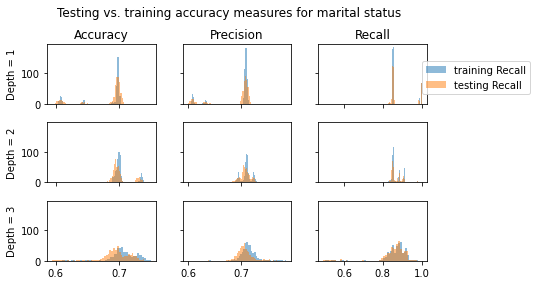

In [169]:
#print(accMatrixEmp)
plotSim(accMatrixMar, targetVar = "marital status")

### Birth

In [76]:
accMatrixBirth = []
accMatrixBirth = simulate('BIRTH', muteVars = ['BIRTH'], simNum=5)

['BIRTH'] ----deleted
SIM ~~~~~~~~ 0 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ NCHILD ------ 3667
loop 0 ------ WKSTAT ------ 4103
loop 0 ------ POPSTAT ------ 4137
loop 0 ------ FAMINC ------ 4738
loop 0 ------ NCHILD ------ 4704
loop 0 ------ RELATE ------ 2912
loop 0 ------ YRIMMIG ------ 793
loop 0 ------ EDUC ------ 684
Predicting: BIRTH
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    24696          0
actual +    1042          0
--------------------------------------
Accuracy  = 0.9595151138394592
Precision = 0
Recall    = 0.0
F1 score  = 0
Predicting: BIRTH
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    10601          5
actual +    424          0
--------------------------------------
Accuracy  = 0.9611060743427017
Precision = 0.0
Recall    = 0.0
F1 score 

loop 0 ------ YRIMMIG ------ 407
loop 0 ------ NCHILD ------ 330
loop 0 ------ YRIMMIG ------ 24
loop 0 ------ YEAR ------ 18
loop 1 ------ RACE ------ 789
loop 0 ------ CITIZEN ------ 60
loop 0 ------ NCHILD ------ 689
loop 0 ------ EDUC ------ 33
loop 1 ------ YRIMMIG ------ 207
loop 0 ------ STATEFIP ------ 157
loop 1 ------ YRIMMIG ------ 86
loop 0 ------ MARST ------ 78
loop 1 ------ RELATE ------ 653
loop 0 ------ EDUC ------ 18
loop 0 ------ RACE ------ 341
loop 0 ------ NCHILD ------ 242
loop 0 ------ HISPAN ------ 26
loop 1 ------ STATEFIP ------ 91
loop 1 ------ STATEFIP ------ 110
loop 0 ------ YEAR ------ 13
loop 2 ------ NCHILD ------ 4704
loop 1 ------ STATEFIP ------ 36
loop 1 ------ FAMINC ------ 181
loop 0 ------ PROFCERT ------ 19
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ REGION ------ 11
loop 0 ------ EMPSTAT ------ 23
loop 0 ------ RACE ------ 45
loop 0 ------ YRIMMIG ------ 27
loop 1 ------ RELATE ------ 703
loop 0 ------ YRIMMIG ------ 387
loop 0 ------ STATEF

loop 2 ------ WKSTAT ------ 4054
loop 1 ------ RELATE ------ 111
loop 0 ------ STATEFIP ------ 20
loop 0 ------ YRIMMIG ------ 59
loop 0 ------ STATEFIP ------ 21
loop 1 ------ YRIMMIG ------ 229
loop 0 ------ RACE ------ 195
loop 1 ------ RACE ------ 19
loop 0 ------ RELATE ------ 14
loop 1 ------ YRIMMIG ------ 77
loop 0 ------ FAMINC ------ 56
loop 1 ------ YRIMMIG ------ 793
loop 0 ------ YEAR ------ 15
loop 0 ------ EDUC ------ 609
loop 0 ------ FAMINC ------ 12
loop 0 ------ STATEFIP ------ 21
loop 0 ------ METRO ------ 14
loop 0 ------ YEAR ------ 18
loop 0 ------ STATEFIP ------ 11
loop 0 ------ METRO ------ 19
loop 0 ------ EDUC ------ 17
loop 1 ------ STATEFIP ------ 32
loop 1 ------ YRIMMIG ------ 48
loop 0 ------ HISPAN ------ 36
loop 1 ------ STATEFIP ------ 265
loop 0 ------ MARST ------ 18
loop 0 ------ EDUC ------ 13
loop 0 ------ NCHILD ------ 11
loop 0 ------ YEAR ------ 19
loop 1 ------ RELATE ------ 25
loop 0 ------ REGION ------ 11
loop 0 ------ YEAR ------ 11
loop

loop 0 ------ WKSTAT ------ 3238
loop 0 ------ FAMINC ------ 31
loop 0 ------ YEAR ------ 21
loop 0 ------ YEAR ------ 17
loop 0 ------ STATEFIP ------ 64
loop 0 ------ YEAR ------ 34
loop 0 ------ EMPSTAT ------ 30
loop 0 ------ STATEFIP ------ 27
loop 0 ------ REGION ------ 40
loop 0 ------ MARST ------ 33
loop 0 ------ REGION ------ 50
loop 0 ------ SCHLCOLL ------ 62
loop 0 ------ YEAR ------ 13
loop 1 ------ WKSTAT ------ 4106
loop 0 ------ FAMINC ------ 113
loop 0 ------ STATEFIP ------ 247
loop 0 ------ METRO ------ 17
loop 0 ------ YRIMMIG ------ 74
loop 0 ------ YRIMMIG ------ 764
loop 0 ------ YRIMMIG ------ 29
loop 0 ------ YRIMMIG ------ 56
loop 0 ------ STATEFIP ------ 273
loop 0 ------ FAMINC ------ 27
loop 0 ------ STATEFIP ------ 2495
loop 1 ------ WKSTAT ------ 4144
loop 0 ------ REGION ------ 83
loop 0 ------ REGION ------ 11
loop 0 ------ YRIMMIG ------ 219
loop 0 ------ YEAR ------ 12
loop 0 ------ YRIMMIG ------ 58
loop 0 ------ METRO ------ 671
loop 0 ------ FAMIN

loop 1 ------ SCHLCOLL ------ 2703
loop 0 ------ NCHILD ------ 2646
loop 0 ------ REGION ------ 16
loop 0 ------ STATEFIP ------ 39
loop 2 ------ FAMINC ------ 4892
loop 1 ------ WKSTAT ------ 27
loop 0 ------ RACE ------ 15
loop 1 ------ STATEFIP ------ 352
loop 0 ------ EDUC ------ 17
loop 0 ------ YEAR ------ 24
loop 0 ------ NCHILD ------ 15
loop 0 ------ WKSTAT ------ 17
loop 0 ------ METRO ------ 11
loop 0 ------ YEAR ------ 17
loop 0 ------ NCHILD ------ 16
loop 0 ------ YEAR ------ 12
loop 0 ------ EDUC ------ 29
loop 1 ------ EDUC ------ 200
loop 0 ------ REGION ------ 34
loop 0 ------ RELATE ------ 90
loop 0 ------ YEAR ------ 19
loop 1 ------ METRO ------ 133
loop 0 ------ EDUC ------ 49
loop 0 ------ WKSTAT ------ 22
loop 0 ------ REGION ------ 34
loop 0 ------ YEAR ------ 25
loop 1 ------ STATEFIP ------ 78
loop 1 ------ REGION ------ 178
loop 0 ------ STATEFIP ------ 34
loop 0 ------ RACE ------ 28
loop 0 ------ EDUC ------ 11
loop 0 ------ YEAR ------ 23
loop 0 ------ ST

loop 1 ------ AGE ------ 16088
loop 0 ------ YRIMMIG ------ 2981
loop 0 ------ FAMINC ------ 1515
loop 0 ------ METRO ------ 1349
loop 0 ------ WKSTAT ------ 2836
loop 0 ------ FAMINC ------ 3643
loop 0 ------ STATEFIP ------ 2543
loop 0 ------ YRIMMIG ------ 661
loop 0 ------ STATEFIP ------ 560
Predicting: BIRTH
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    24536          155
actual +    1018          29
--------------------------------------
Accuracy  = 0.9544253632760898
Precision = 0.15760869565217392
Recall    = 0.027698185291308502
F1 score  = 0.04711616571892771
Predicting: BIRTH
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    10497          114
actual +    407          12
--------------------------------------
Accuracy  = 0.9527651858567543
Precision = 0.09523809523809

Predicting: BIRTH
Total in testData: 25738 -- total tested: 25738
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    23730          961
actual +    912          135
--------------------------------------
Accuracy  = 0.9272282228611392
Precision = 0.12317518248175183
Recall    = 0.12893982808022922
F1 score  = 0.12599160055996267
Predicting: BIRTH
Total in testData: 11030 -- total tested: 11030
--------------------------------------
Confusion Matrix:
          predicted -   predicted +
actual -    9974          637
actual +    376          43
--------------------------------------
Accuracy  = 0.9081595648232095
Precision = 0.06323529411764706
Recall    = 0.1026252983293556
F1 score  = 0.07825295723384895
SIM ~~~~~~~~ 4 ~~~~~~~ START
loop 1 ------ AGE ------ 25738
loop 0 ------ YRIMMIG ------ 3741
loop 0 ------ YRIMMIG ------ 4091
loop 0 ------ POPSTAT ------ 4100
loop 0 ------ NCHILD ------ 4836
loop 0 ------ NCHILD ------ 4623
loop 

loop 2 ------ NCHILD ------ 4836
loop 1 ------ YRIMMIG ------ 15
loop 0 ------ METRO ------ 11
loop 1 ------ YRIMMIG ------ 210
loop 0 ------ MARST ------ 146
loop 1 ------ FAMINC ------ 629
loop 0 ------ YRIMMIG ------ 37
loop 0 ------ STATEFIP ------ 17
loop 0 ------ RACE ------ 11
loop 0 ------ STATEFIP ------ 16
loop 0 ------ YRIMMIG ------ 20
loop 0 ------ RACE ------ 67
loop 0 ------ YRIMMIG ------ 32
loop 0 ------ YRIMMIG ------ 136
loop 0 ------ RACE ------ 189
loop 0 ------ STATEFIP ------ 20
loop 0 ------ EMPSTAT ------ 61
loop 1 ------ STATEFIP ------ 44
loop 1 ------ RACE ------ 1123
loop 0 ------ MARST ------ 73
loop 0 ------ FAMINC ------ 920
loop 0 ------ STATEFIP ------ 17
loop 0 ------ YRIMMIG ------ 92
loop 1 ------ WKSTAT ------ 2808
loop 0 ------ FAMINC ------ 67
loop 0 ------ YEAR ------ 12
loop 0 ------ REGION ------ 125
loop 0 ------ FAMINC ------ 53
loop 0 ------ STATEFIP ------ 772
loop 0 ------ STATEFIP ------ 31
loop 0 ------ YEAR ------ 32
loop 0 ------ FAMI

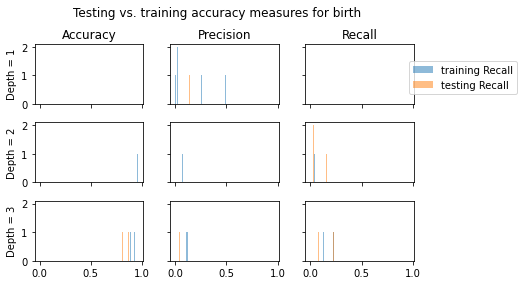

In [77]:
#print(accMatrixEmp)
plotSim(accMatrixBirth, targetVar = "birth")


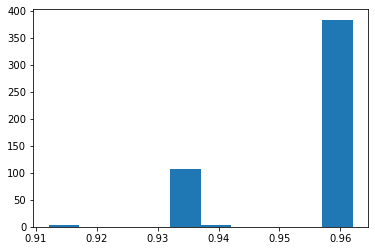

In [73]:
plt.hist(accMatrixBirth[0])
plt.show() 

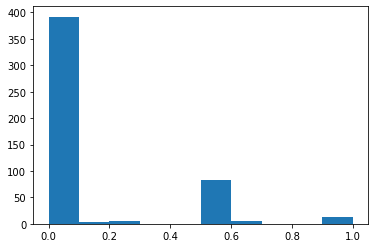

In [74]:
plt.hist(accMatrixBirth[1])
plt.show() 

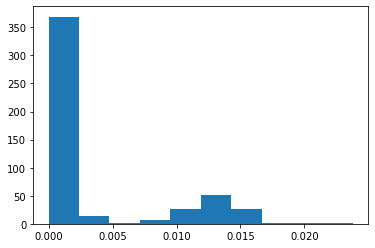

In [70]:
plt.hist(accMatrixBirth[0])
plt.show() 